In [1]:
import IPython
import IPython.display
import numpy as np
import pandas as pd
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import imblearn
from collections import Counter
from sklearn.preprocessing import LabelEncoder
from imblearn.datasets import make_imbalance
from sklearn.compose import make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline
import numpy as geek 

In [2]:
labels_df = pd.read_csv("D:\Tesis\Gaia\GAIA_dataset.dat")

In [3]:
labels_df.Class.unique()

array(['RRAB', 'MIRA_SR', 'RRC', 'RRD', 'DSCT_SXPHE', 'CEP', 'T2CEP',
       'ARRD', 'ACEP'], dtype=object)

In [4]:
unique_vals = labels_df['Class'].unique()
labels_df['Class'].replace(to_replace=unique_vals,
           value= list(range(len(unique_vals))),
           inplace=True)

In [5]:
labels_df.Class.unique()

array([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype=int64)

In [6]:
labels_df = labels_df[labels_df.Class != 7]

In [7]:
labels_df = labels_df[labels_df.Class != 8]

In [8]:
labels_df.Class.unique()

array([0, 1, 2, 3, 4, 5, 6], dtype=int64)

In [9]:
labels_df_22 = labels_df[labels_df['N'] >= 23]

In [10]:
labels_df_22.head()

,ID,Class,Path,N
0,4395790042666181888,0,./LCs/4395790042666181888.dat,47
2,1748775099405304832,0,./LCs/1748775099405304832.dat,30
4,1441812897701323136,0,./LCs/1441812897701323136.dat,59
5,4868009430431207552,2,./LCs/4868009430431207552.dat,33
8,5793099859342399744,1,./LCs/5793099859342399744.dat,35


In [11]:
unique_vals_22 = labels_df_22['Class'].unique()
labels_df_22 ['Class'].replace(to_replace=unique_vals_22,
           value= list(range(len(unique_vals_22))),
           inplace=True)

labels_df_22['Class']

D:\anaconda3\lib\site-packages\pandas\core\generic.py:6619: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


0         0
2         0
4         0
5         1
8         2
         ..
363137    2
363138    2
363139    1
363140    0
363141    0
Name: Class, Length: 176661, dtype: int64

2    79834
0    66944
1    18346
4     5858
5     4024
6     1151
3      504
Name: Class, dtype: int64

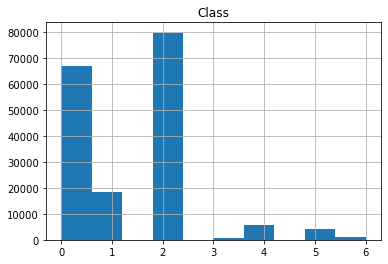

In [12]:
labels_df_22.hist('Class')
labels_df_22['Class'].value_counts()

In [13]:
path = "D:\Tesis\Gaia\LCs\\"

xframes = []          
yframes = []
j = 0
for index, row in labels_df_22.iterrows():
    filename = path + str(row['ID']) + ".dat"
    frame = pd.read_csv(filename, header=0)
    j = j+1
    if j%1 == 0:      ##3, 7, 10, 15
        print('Elemento: ' + str(j))
        print('File: ' + filename)
        temp_newframe = frame.iloc[0:22, 0:2]
        newframe = pd.DataFrame(temp_newframe)
#         print(temp_newframe, len(temp_newframe))
#         print(newframe_diff, len(newframe_diff))
#         print(newframe)
        xframes.append(newframe)
        yframes.append(row['Class'])
        print('Clase: ' + str(row['Class']))
       

Elemento: 1
File: D:\Tesis\Gaia\LCs\4395790042666181888.dat
Clase: 0
Elemento: 2
File: D:\Tesis\Gaia\LCs\1748775099405304832.dat
Clase: 0
Elemento: 3
File: D:\Tesis\Gaia\LCs\1441812897701323136.dat
Clase: 0
Elemento: 4
File: D:\Tesis\Gaia\LCs\4868009430431207552.dat
Clase: 1
Elemento: 5
File: D:\Tesis\Gaia\LCs\5793099859342399744.dat
Clase: 2
Elemento: 6
File: D:\Tesis\Gaia\LCs\5392276297047797888.dat
Clase: 3
Elemento: 7
File: D:\Tesis\Gaia\LCs\3486298380924668416.dat
Clase: 1
Elemento: 8
File: D:\Tesis\Gaia\LCs\4651004726037545600.dat
Clase: 0
Elemento: 9
File: D:\Tesis\Gaia\LCs\5857923044894137216.dat
Clase: 2
Elemento: 10
File: D:\Tesis\Gaia\LCs\4347475886833926144.dat
Clase: 0
Elemento: 11
File: D:\Tesis\Gaia\LCs\4660783614975744896.dat
Clase: 2
Elemento: 12
File: D:\Tesis\Gaia\LCs\5978112099674476800.dat
Clase: 2
Elemento: 13
File: D:\Tesis\Gaia\LCs\5639787840618697088.dat
Clase: 1
Elemento: 14
File: D:\Tesis\Gaia\LCs\4656373847478515840.dat
Clase: 1
Elemento: 15
File: D:\Tesis\G

Elemento: 175
File: D:\Tesis\Gaia\LCs\4652144374190419456.dat
Clase: 2
Elemento: 176
File: D:\Tesis\Gaia\LCs\5861982098198549504.dat
Clase: 0
Elemento: 177
File: D:\Tesis\Gaia\LCs\5875348650565150080.dat
Clase: 0
Elemento: 178
File: D:\Tesis\Gaia\LCs\5943608295251535104.dat
Clase: 2
Elemento: 179
File: D:\Tesis\Gaia\LCs\4347643798576190592.dat
Clase: 0
Elemento: 180
File: D:\Tesis\Gaia\LCs\4756288977351083648.dat
Clase: 1
Elemento: 181
File: D:\Tesis\Gaia\LCs\4657953472113134720.dat
Clase: 4
Elemento: 182
File: D:\Tesis\Gaia\LCs\6522326104368700288.dat
Clase: 0
Elemento: 183
File: D:\Tesis\Gaia\LCs\654479009331289344.dat
Clase: 2
Elemento: 184
File: D:\Tesis\Gaia\LCs\6741408950165700352.dat
Clase: 0
Elemento: 185
File: D:\Tesis\Gaia\LCs\4689309134168201728.dat
Clase: 1
Elemento: 186
File: D:\Tesis\Gaia\LCs\5976818799118915456.dat
Clase: 2
Elemento: 187
File: D:\Tesis\Gaia\LCs\5978392376350950016.dat
Clase: 1
Elemento: 188
File: D:\Tesis\Gaia\LCs\5280149814935048064.dat
Clase: 1
Element

Elemento: 362
File: D:\Tesis\Gaia\LCs\4303815413976331392.dat
Clase: 2
Elemento: 363
File: D:\Tesis\Gaia\LCs\4651906158094450048.dat
Clase: 1
Elemento: 364
File: D:\Tesis\Gaia\LCs\4657694807646807808.dat
Clase: 0
Elemento: 365
File: D:\Tesis\Gaia\LCs\6044925371132724224.dat
Clase: 0
Elemento: 366
File: D:\Tesis\Gaia\LCs\5776331684240791424.dat
Clase: 2
Elemento: 367
File: D:\Tesis\Gaia\LCs\2030791452465380608.dat
Clase: 2
Elemento: 368
File: D:\Tesis\Gaia\LCs\6679792696499620864.dat
Clase: 0
Elemento: 369
File: D:\Tesis\Gaia\LCs\5226876384921689472.dat
Clase: 0
Elemento: 370
File: D:\Tesis\Gaia\LCs\4381469900144489856.dat
Clase: 0
Elemento: 371
File: D:\Tesis\Gaia\LCs\4405415747276163840.dat
Clase: 0
Elemento: 372
File: D:\Tesis\Gaia\LCs\5138623603080591232.dat
Clase: 0
Elemento: 373
File: D:\Tesis\Gaia\LCs\916227476128142080.dat
Clase: 0
Elemento: 374
File: D:\Tesis\Gaia\LCs\4461740154550006400.dat
Clase: 5
Elemento: 375
File: D:\Tesis\Gaia\LCs\4651457660411144576.dat
Clase: 0
Element

Elemento: 552
File: D:\Tesis\Gaia\LCs\5847767646228248448.dat
Clase: 2
Elemento: 553
File: D:\Tesis\Gaia\LCs\5864001591862333184.dat
Clase: 2
Elemento: 554
File: D:\Tesis\Gaia\LCs\3175063923713648640.dat
Clase: 0
Elemento: 555
File: D:\Tesis\Gaia\LCs\6029498978180792960.dat
Clase: 0
Elemento: 556
File: D:\Tesis\Gaia\LCs\6503607709178656000.dat
Clase: 0
Elemento: 557
File: D:\Tesis\Gaia\LCs\4657667285530780928.dat
Clase: 0
Elemento: 558
File: D:\Tesis\Gaia\LCs\5861097403678489344.dat
Clase: 2
Elemento: 559
File: D:\Tesis\Gaia\LCs\595946748344096768.dat
Clase: 0
Elemento: 560
File: D:\Tesis\Gaia\LCs\5901838844924415488.dat
Clase: 2
Elemento: 561
File: D:\Tesis\Gaia\LCs\5901510881234046080.dat
Clase: 2
Elemento: 562
File: D:\Tesis\Gaia\LCs\5943832458209051904.dat
Clase: 2
Elemento: 563
File: D:\Tesis\Gaia\LCs\1752307795912393344.dat
Clase: 0
Elemento: 564
File: D:\Tesis\Gaia\LCs\1836728199915208576.dat
Clase: 2
Elemento: 565
File: D:\Tesis\Gaia\LCs\4264867447977998976.dat
Clase: 2
Element

Elemento: 743
File: D:\Tesis\Gaia\LCs\4687267753395283584.dat
Clase: 0
Elemento: 744
File: D:\Tesis\Gaia\LCs\4628099150050813952.dat
Clase: 1
Elemento: 745
File: D:\Tesis\Gaia\LCs\5601075028334827392.dat
Clase: 0
Elemento: 746
File: D:\Tesis\Gaia\LCs\5255536426842090368.dat
Clase: 6
Elemento: 747
File: D:\Tesis\Gaia\LCs\1823554916753056384.dat
Clase: 2
Elemento: 748
File: D:\Tesis\Gaia\LCs\4292521402353295488.dat
Clase: 2
Elemento: 749
File: D:\Tesis\Gaia\LCs\2049154636670430976.dat
Clase: 2
Elemento: 750
File: D:\Tesis\Gaia\LCs\403627699197806848.dat
Clase: 0
Elemento: 751
File: D:\Tesis\Gaia\LCs\5521469463082525568.dat
Clase: 2
Elemento: 752
File: D:\Tesis\Gaia\LCs\4656501150304788608.dat
Clase: 0
Elemento: 753
File: D:\Tesis\Gaia\LCs\1433154518510682624.dat
Clase: 0
Elemento: 754
File: D:\Tesis\Gaia\LCs\3934375555658998016.dat
Clase: 1
Elemento: 755
File: D:\Tesis\Gaia\LCs\4495393942036494848.dat
Clase: 0
Elemento: 756
File: D:\Tesis\Gaia\LCs\4503734867303258240.dat
Clase: 2
Element

Elemento: 934
File: D:\Tesis\Gaia\LCs\5894067771629556224.dat
Clase: 2
Elemento: 935
File: D:\Tesis\Gaia\LCs\5875472246911079168.dat
Clase: 2
Elemento: 936
File: D:\Tesis\Gaia\LCs\4690509732169158912.dat
Clase: 0
Elemento: 937
File: D:\Tesis\Gaia\LCs\5927457397139867520.dat
Clase: 0
Elemento: 938
File: D:\Tesis\Gaia\LCs\4690456818148672128.dat
Clase: 1
Elemento: 939
File: D:\Tesis\Gaia\LCs\2087769240218824448.dat
Clase: 0
Elemento: 940
File: D:\Tesis\Gaia\LCs\5931200821982178688.dat
Clase: 2
Elemento: 941
File: D:\Tesis\Gaia\LCs\4651777648376580608.dat
Clase: 1
Elemento: 942
File: D:\Tesis\Gaia\LCs\4595780689378694528.dat
Clase: 0
Elemento: 943
File: D:\Tesis\Gaia\LCs\6028216191708808704.dat
Clase: 2
Elemento: 944
File: D:\Tesis\Gaia\LCs\525546526350156160.dat
Clase: 0
Elemento: 945
File: D:\Tesis\Gaia\LCs\5235827577835132544.dat
Clase: 2
Elemento: 946
File: D:\Tesis\Gaia\LCs\4236121334905154304.dat
Clase: 0
Elemento: 947
File: D:\Tesis\Gaia\LCs\5826605375954856064.dat
Clase: 2
Element

Elemento: 1123
File: D:\Tesis\Gaia\LCs\5967757350142517504.dat
Clase: 2
Elemento: 1124
File: D:\Tesis\Gaia\LCs\1973018713486480896.dat
Clase: 2
Elemento: 1125
File: D:\Tesis\Gaia\LCs\4760322673207097088.dat
Clase: 0
Elemento: 1126
File: D:\Tesis\Gaia\LCs\5867912623401567744.dat
Clase: 2
Elemento: 1127
File: D:\Tesis\Gaia\LCs\5969422659273818752.dat
Clase: 2
Elemento: 1128
File: D:\Tesis\Gaia\LCs\5814472991001002240.dat
Clase: 0
Elemento: 1129
File: D:\Tesis\Gaia\LCs\4661242450602464512.dat
Clase: 4
Elemento: 1130
File: D:\Tesis\Gaia\LCs\5351087762560136576.dat
Clase: 2
Elemento: 1131
File: D:\Tesis\Gaia\LCs\5780647031161831424.dat
Clase: 2
Elemento: 1132
File: D:\Tesis\Gaia\LCs\4651711132226150784.dat
Clase: 2
Elemento: 1133
File: D:\Tesis\Gaia\LCs\4688722892606282496.dat
Clase: 4
Elemento: 1134
File: D:\Tesis\Gaia\LCs\4664497039378427264.dat
Clase: 0
Elemento: 1135
File: D:\Tesis\Gaia\LCs\4648506811716755328.dat
Clase: 2
Elemento: 1136
File: D:\Tesis\Gaia\LCs\5989053206758948736.dat
C

Elemento: 1416
File: D:\Tesis\Gaia\LCs\383316313520809344.dat
Clase: 0
Elemento: 1417
File: D:\Tesis\Gaia\LCs\5444373700590473472.dat
Clase: 1
Elemento: 1418
File: D:\Tesis\Gaia\LCs\5336508448848675712.dat
Clase: 2
Elemento: 1419
File: D:\Tesis\Gaia\LCs\4651770261079620096.dat
Clase: 0
Elemento: 1420
File: D:\Tesis\Gaia\LCs\5977310624413627520.dat
Clase: 2
Elemento: 1421
File: D:\Tesis\Gaia\LCs\4885532072365166848.dat
Clase: 1
Elemento: 1422
File: D:\Tesis\Gaia\LCs\4663162747661003136.dat
Clase: 0
Elemento: 1423
File: D:\Tesis\Gaia\LCs\2278868557308158976.dat
Clase: 2
Elemento: 1424
File: D:\Tesis\Gaia\LCs\4659545977191625088.dat
Clase: 2
Elemento: 1425
File: D:\Tesis\Gaia\LCs\444058287940157568.dat
Clase: 2
Elemento: 1426
File: D:\Tesis\Gaia\LCs\454582881965929088.dat
Clase: 2
Elemento: 1427
File: D:\Tesis\Gaia\LCs\5963483617175782016.dat
Clase: 2
Elemento: 1428
File: D:\Tesis\Gaia\LCs\5849753536042376448.dat
Clase: 0
Elemento: 1429
File: D:\Tesis\Gaia\LCs\5871363268860975744.dat
Clas

Elemento: 1610
File: D:\Tesis\Gaia\LCs\5861443612333378560.dat
Clase: 0
Elemento: 1611
File: D:\Tesis\Gaia\LCs\5543206326920966144.dat
Clase: 2
Elemento: 1612
File: D:\Tesis\Gaia\LCs\4523041638651829888.dat
Clase: 0
Elemento: 1613
File: D:\Tesis\Gaia\LCs\4429057725465780480.dat
Clase: 0
Elemento: 1614
File: D:\Tesis\Gaia\LCs\4685779873654314752.dat
Clase: 4
Elemento: 1615
File: D:\Tesis\Gaia\LCs\5216300040838405120.dat
Clase: 0
Elemento: 1616
File: D:\Tesis\Gaia\LCs\4662677656874460032.dat
Clase: 0
Elemento: 1617
File: D:\Tesis\Gaia\LCs\6151731754559406464.dat
Clase: 0
Elemento: 1618
File: D:\Tesis\Gaia\LCs\5338122531932519680.dat
Clase: 0
Elemento: 1619
File: D:\Tesis\Gaia\LCs\4687510436235194112.dat
Clase: 0
Elemento: 1620
File: D:\Tesis\Gaia\LCs\4322192410829530624.dat
Clase: 2
Elemento: 1621
File: D:\Tesis\Gaia\LCs\5310420199012025344.dat
Clase: 2
Elemento: 1622
File: D:\Tesis\Gaia\LCs\5771200783168556800.dat
Clase: 0
Elemento: 1623
File: D:\Tesis\Gaia\LCs\5932439589240374144.dat
C

Elemento: 1802
File: D:\Tesis\Gaia\LCs\4655213901369318272.dat
Clase: 0
Elemento: 1803
File: D:\Tesis\Gaia\LCs\2032538920057736320.dat
Clase: 2
Elemento: 1804
File: D:\Tesis\Gaia\LCs\5643213192993949184.dat
Clase: 2
Elemento: 1805
File: D:\Tesis\Gaia\LCs\5937267514799024640.dat
Clase: 2
Elemento: 1806
File: D:\Tesis\Gaia\LCs\4317592397780989824.dat
Clase: 2
Elemento: 1807
File: D:\Tesis\Gaia\LCs\4685697616435187328.dat
Clase: 2
Elemento: 1808
File: D:\Tesis\Gaia\LCs\5356824125180415488.dat
Clase: 2
Elemento: 1809
File: D:\Tesis\Gaia\LCs\5928750628963432448.dat
Clase: 0
Elemento: 1810
File: D:\Tesis\Gaia\LCs\5874927335838290560.dat
Clase: 2
Elemento: 1811
File: D:\Tesis\Gaia\LCs\4659865003071713920.dat
Clase: 5
Elemento: 1812
File: D:\Tesis\Gaia\LCs\4652091318462045312.dat
Clase: 0
Elemento: 1813
File: D:\Tesis\Gaia\LCs\4654657681649896064.dat
Clase: 1
Elemento: 1814
File: D:\Tesis\Gaia\LCs\1865314952478863488.dat
Clase: 0
Elemento: 1815
File: D:\Tesis\Gaia\LCs\4465013576761000448.dat
C

Elemento: 1996
File: D:\Tesis\Gaia\LCs\4688507697569901824.dat
Clase: 0
Elemento: 1997
File: D:\Tesis\Gaia\LCs\5284342905607012480.dat
Clase: 1
Elemento: 1998
File: D:\Tesis\Gaia\LCs\5278593868544224640.dat
Clase: 0
Elemento: 1999
File: D:\Tesis\Gaia\LCs\425840720304221568.dat
Clase: 2
Elemento: 2000
File: D:\Tesis\Gaia\LCs\4657865197589044352.dat
Clase: 0
Elemento: 2001
File: D:\Tesis\Gaia\LCs\4302944459018247680.dat
Clase: 0
Elemento: 2002
File: D:\Tesis\Gaia\LCs\6795546531894178816.dat
Clase: 0
Elemento: 2003
File: D:\Tesis\Gaia\LCs\4649739806630156160.dat
Clase: 1
Elemento: 2004
File: D:\Tesis\Gaia\LCs\4655427580288336512.dat
Clase: 0
Elemento: 2005
File: D:\Tesis\Gaia\LCs\6056246561361407616.dat
Clase: 2
Elemento: 2006
File: D:\Tesis\Gaia\LCs\1828982621528881920.dat
Clase: 0
Elemento: 2007
File: D:\Tesis\Gaia\LCs\4660603707392915712.dat
Clase: 2
Elemento: 2008
File: D:\Tesis\Gaia\LCs\1497822054380647552.dat
Clase: 0
Elemento: 2009
File: D:\Tesis\Gaia\LCs\2064937335813744768.dat
Cl

Elemento: 2187
File: D:\Tesis\Gaia\LCs\5476807262089936768.dat
Clase: 0
Elemento: 2188
File: D:\Tesis\Gaia\LCs\5338449327402146304.dat
Clase: 2
Elemento: 2189
File: D:\Tesis\Gaia\LCs\5938218862875692544.dat
Clase: 2
Elemento: 2190
File: D:\Tesis\Gaia\LCs\4666406650558378496.dat
Clase: 1
Elemento: 2191
File: D:\Tesis\Gaia\LCs\647127674586003584.dat
Clase: 0
Elemento: 2192
File: D:\Tesis\Gaia\LCs\4656849970372965760.dat
Clase: 0
Elemento: 2193
File: D:\Tesis\Gaia\LCs\5532849133545767296.dat
Clase: 0
Elemento: 2194
File: D:\Tesis\Gaia\LCs\5339225101574758400.dat
Clase: 2
Elemento: 2195
File: D:\Tesis\Gaia\LCs\3213004256057061120.dat
Clase: 2
Elemento: 2196
File: D:\Tesis\Gaia\LCs\6373699615788145280.dat
Clase: 5
Elemento: 2197
File: D:\Tesis\Gaia\LCs\3905594464413549184.dat
Clase: 5
Elemento: 2198
File: D:\Tesis\Gaia\LCs\5976817115486224128.dat
Clase: 2
Elemento: 2199
File: D:\Tesis\Gaia\LCs\4315715978098690560.dat
Clase: 2
Elemento: 2200
File: D:\Tesis\Gaia\LCs\5308562161791377920.dat
Cl

Elemento: 2376
File: D:\Tesis\Gaia\LCs\4650946211441496192.dat
Clase: 2
Elemento: 2377
File: D:\Tesis\Gaia\LCs\5226692281150250624.dat
Clase: 2
Elemento: 2378
File: D:\Tesis\Gaia\LCs\4651859085270179840.dat
Clase: 2
Elemento: 2379
File: D:\Tesis\Gaia\LCs\4303303385155991040.dat
Clase: 2
Elemento: 2380
File: D:\Tesis\Gaia\LCs\3732820948140235136.dat
Clase: 0
Elemento: 2381
File: D:\Tesis\Gaia\LCs\706799888613686656.dat
Clase: 1
Elemento: 2382
File: D:\Tesis\Gaia\LCs\1820125986666104704.dat
Clase: 0
Elemento: 2383
File: D:\Tesis\Gaia\LCs\5143214648242230912.dat
Clase: 1
Elemento: 2384
File: D:\Tesis\Gaia\LCs\4479588256254257920.dat
Clase: 0
Elemento: 2385
File: D:\Tesis\Gaia\LCs\6029388962692889600.dat
Clase: 0
Elemento: 2386
File: D:\Tesis\Gaia\LCs\5280372225520876544.dat
Clase: 0
Elemento: 2387
File: D:\Tesis\Gaia\LCs\5270483119157233408.dat
Clase: 0
Elemento: 2388
File: D:\Tesis\Gaia\LCs\4661331511073172480.dat
Clase: 0
Elemento: 2389
File: D:\Tesis\Gaia\LCs\4548688572002057856.dat
Cl

Elemento: 2567
File: D:\Tesis\Gaia\LCs\6034548524009838464.dat
Clase: 1
Elemento: 2568
File: D:\Tesis\Gaia\LCs\5992621048951330176.dat
Clase: 0
Elemento: 2569
File: D:\Tesis\Gaia\LCs\2023100398682541440.dat
Clase: 0
Elemento: 2570
File: D:\Tesis\Gaia\LCs\5882041657092657152.dat
Clase: 2
Elemento: 2571
File: D:\Tesis\Gaia\LCs\1935774475076899328.dat
Clase: 2
Elemento: 2572
File: D:\Tesis\Gaia\LCs\5834885905482563072.dat
Clase: 2
Elemento: 2573
File: D:\Tesis\Gaia\LCs\5855659219132768384.dat
Clase: 0
Elemento: 2574
File: D:\Tesis\Gaia\LCs\4651491710921703936.dat
Clase: 2
Elemento: 2575
File: D:\Tesis\Gaia\LCs\4657550844622670592.dat
Clase: 2
Elemento: 2576
File: D:\Tesis\Gaia\LCs\2162582867544901248.dat
Clase: 2
Elemento: 2577
File: D:\Tesis\Gaia\LCs\1411231253085518976.dat
Clase: 5
Elemento: 2578
File: D:\Tesis\Gaia\LCs\1809056786471035520.dat
Clase: 5
Elemento: 2579
File: D:\Tesis\Gaia\LCs\1848788257615349888.dat
Clase: 1
Elemento: 2580
File: D:\Tesis\Gaia\LCs\5237232616265751168.dat
C

Elemento: 2756
File: D:\Tesis\Gaia\LCs\5882285130201359360.dat
Clase: 2
Elemento: 2757
File: D:\Tesis\Gaia\LCs\1526358332491663744.dat
Clase: 0
Elemento: 2758
File: D:\Tesis\Gaia\LCs\5328352477722814336.dat
Clase: 2
Elemento: 2759
File: D:\Tesis\Gaia\LCs\5254137568849110784.dat
Clase: 2
Elemento: 2760
File: D:\Tesis\Gaia\LCs\4318561754728011264.dat
Clase: 2
Elemento: 2761
File: D:\Tesis\Gaia\LCs\6251492510433929472.dat
Clase: 0
Elemento: 2762
File: D:\Tesis\Gaia\LCs\1923794157722847616.dat
Clase: 2
Elemento: 2763
File: D:\Tesis\Gaia\LCs\4661815811575617152.dat
Clase: 0
Elemento: 2764
File: D:\Tesis\Gaia\LCs\4655176445022107904.dat
Clase: 0
Elemento: 2765
File: D:\Tesis\Gaia\LCs\4657626607862601856.dat
Clase: 2
Elemento: 2766
File: D:\Tesis\Gaia\LCs\5025695203333016064.dat
Clase: 1
Elemento: 2767
File: D:\Tesis\Gaia\LCs\4660539866989224704.dat
Clase: 0
Elemento: 2768
File: D:\Tesis\Gaia\LCs\4657046031380381824.dat
Clase: 4
Elemento: 2769
File: D:\Tesis\Gaia\LCs\1969684410119905280.dat
C

Elemento: 2947
File: D:\Tesis\Gaia\LCs\5775135106352749312.dat
Clase: 2
Elemento: 2948
File: D:\Tesis\Gaia\LCs\4757552595391281024.dat
Clase: 2
Elemento: 2949
File: D:\Tesis\Gaia\LCs\1823998634112576640.dat
Clase: 0
Elemento: 2950
File: D:\Tesis\Gaia\LCs\4691925044129054464.dat
Clase: 0
Elemento: 2951
File: D:\Tesis\Gaia\LCs\4522553116194569728.dat
Clase: 0
Elemento: 2952
File: D:\Tesis\Gaia\LCs\6029843434558526336.dat
Clase: 2
Elemento: 2953
File: D:\Tesis\Gaia\LCs\5835646595744254336.dat
Clase: 2
Elemento: 2954
File: D:\Tesis\Gaia\LCs\5963646757231047936.dat
Clase: 2
Elemento: 2955
File: D:\Tesis\Gaia\LCs\4290236273583513344.dat
Clase: 2
Elemento: 2956
File: D:\Tesis\Gaia\LCs\4659492268614816640.dat
Clase: 2
Elemento: 2957
File: D:\Tesis\Gaia\LCs\4657903925353411584.dat
Clase: 0
Elemento: 2958
File: D:\Tesis\Gaia\LCs\5984372517028179456.dat
Clase: 0
Elemento: 2959
File: D:\Tesis\Gaia\LCs\4684565222532086016.dat
Clase: 0
Elemento: 2960
File: D:\Tesis\Gaia\LCs\4112156552880978688.dat
C

Elemento: 3141
File: D:\Tesis\Gaia\LCs\4649971773523394304.dat
Clase: 2
Elemento: 3142
File: D:\Tesis\Gaia\LCs\5863087210444801024.dat
Clase: 2
Elemento: 3143
File: D:\Tesis\Gaia\LCs\6007979100393681536.dat
Clase: 2
Elemento: 3144
File: D:\Tesis\Gaia\LCs\4636135514896964224.dat
Clase: 0
Elemento: 3145
File: D:\Tesis\Gaia\LCs\5857867760069223424.dat
Clase: 2
Elemento: 3146
File: D:\Tesis\Gaia\LCs\3584087300128201728.dat
Clase: 0
Elemento: 3147
File: D:\Tesis\Gaia\LCs\2205391081444462720.dat
Clase: 2
Elemento: 3148
File: D:\Tesis\Gaia\LCs\5419757112716108928.dat
Clase: 0
Elemento: 3149
File: D:\Tesis\Gaia\LCs\5969295429470727808.dat
Clase: 0
Elemento: 3150
File: D:\Tesis\Gaia\LCs\5398141774965825536.dat
Clase: 1
Elemento: 3151
File: D:\Tesis\Gaia\LCs\5585720524547798784.dat
Clase: 0
Elemento: 3152
File: D:\Tesis\Gaia\LCs\4795253474710495744.dat
Clase: 1
Elemento: 3153
File: D:\Tesis\Gaia\LCs\5934990559300537984.dat
Clase: 0
Elemento: 3154
File: D:\Tesis\Gaia\LCs\5996779749847959296.dat
C

Elemento: 3335
File: D:\Tesis\Gaia\LCs\1836927658196003712.dat
Clase: 2
Elemento: 3336
File: D:\Tesis\Gaia\LCs\4688870119803403008.dat
Clase: 4
Elemento: 3337
File: D:\Tesis\Gaia\LCs\3570745134545294080.dat
Clase: 0
Elemento: 3338
File: D:\Tesis\Gaia\LCs\2886475141131817216.dat
Clase: 2
Elemento: 3339
File: D:\Tesis\Gaia\LCs\4264770794030332544.dat
Clase: 0
Elemento: 3340
File: D:\Tesis\Gaia\LCs\4661169474827965696.dat
Clase: 2
Elemento: 3341
File: D:\Tesis\Gaia\LCs\5137083049851510144.dat
Clase: 0
Elemento: 3342
File: D:\Tesis\Gaia\LCs\1823905484844054400.dat
Clase: 2
Elemento: 3343
File: D:\Tesis\Gaia\LCs\5831676671526280320.dat
Clase: 2
Elemento: 3344
File: D:\Tesis\Gaia\LCs\5321017670011293440.dat
Clase: 2
Elemento: 3345
File: D:\Tesis\Gaia\LCs\6048282519436188672.dat
Clase: 1
Elemento: 3346
File: D:\Tesis\Gaia\LCs\6054018023065095040.dat
Clase: 0
Elemento: 3347
File: D:\Tesis\Gaia\LCs\6077124019413650304.dat
Clase: 2
Elemento: 3348
File: D:\Tesis\Gaia\LCs\2522074653855359616.dat
C

Elemento: 3526
File: D:\Tesis\Gaia\LCs\5875221523892886656.dat
Clase: 2
Elemento: 3527
File: D:\Tesis\Gaia\LCs\1637610694264542464.dat
Clase: 0
Elemento: 3528
File: D:\Tesis\Gaia\LCs\4655233383388661376.dat
Clase: 2
Elemento: 3529
File: D:\Tesis\Gaia\LCs\5888759157669596288.dat
Clase: 2
Elemento: 3530
File: D:\Tesis\Gaia\LCs\512566585426881408.dat
Clase: 2
Elemento: 3531
File: D:\Tesis\Gaia\LCs\4302087802027674496.dat
Clase: 0
Elemento: 3532
File: D:\Tesis\Gaia\LCs\5949430239348022656.dat
Clase: 2
Elemento: 3533
File: D:\Tesis\Gaia\LCs\6785111028377153152.dat
Clase: 0
Elemento: 3534
File: D:\Tesis\Gaia\LCs\4658314558571108480.dat
Clase: 2
Elemento: 3535
File: D:\Tesis\Gaia\LCs\4513479911915819904.dat
Clase: 2
Elemento: 3536
File: D:\Tesis\Gaia\LCs\4687931141154616704.dat
Clase: 0
Elemento: 3537
File: D:\Tesis\Gaia\LCs\5858531345334191488.dat
Clase: 2
Elemento: 3538
File: D:\Tesis\Gaia\LCs\6066476451911193728.dat
Clase: 2
Elemento: 3539
File: D:\Tesis\Gaia\LCs\6074410940110438656.dat
Cl

Elemento: 3718
File: D:\Tesis\Gaia\LCs\4688891079242704256.dat
Clase: 0
Elemento: 3719
File: D:\Tesis\Gaia\LCs\2039636095794284800.dat
Clase: 1
Elemento: 3720
File: D:\Tesis\Gaia\LCs\5968660873840641152.dat
Clase: 2
Elemento: 3721
File: D:\Tesis\Gaia\LCs\6054327879229189632.dat
Clase: 2
Elemento: 3722
File: D:\Tesis\Gaia\LCs\4660299177048893440.dat
Clase: 0
Elemento: 3723
File: D:\Tesis\Gaia\LCs\4882212646760623104.dat
Clase: 1
Elemento: 3724
File: D:\Tesis\Gaia\LCs\5858625186155602688.dat
Clase: 2
Elemento: 3725
File: D:\Tesis\Gaia\LCs\4661307012629124608.dat
Clase: 0
Elemento: 3726
File: D:\Tesis\Gaia\LCs\3538999592447546880.dat
Clase: 0
Elemento: 3727
File: D:\Tesis\Gaia\LCs\5904272167233603712.dat
Clase: 2
Elemento: 3728
File: D:\Tesis\Gaia\LCs\4384826056309900416.dat
Clase: 0
Elemento: 3729
File: D:\Tesis\Gaia\LCs\480555025936990720.dat
Clase: 2
Elemento: 3730
File: D:\Tesis\Gaia\LCs\4684716199223064320.dat
Clase: 0
Elemento: 3731
File: D:\Tesis\Gaia\LCs\6507176277245606144.dat
Cl

Elemento: 3910
File: D:\Tesis\Gaia\LCs\4660699360597159808.dat
Clase: 0
Elemento: 3911
File: D:\Tesis\Gaia\LCs\6386195909033956864.dat
Clase: 0
Elemento: 3912
File: D:\Tesis\Gaia\LCs\2168086503039933184.dat
Clase: 2
Elemento: 3913
File: D:\Tesis\Gaia\LCs\4651465597519318400.dat
Clase: 2
Elemento: 3914
File: D:\Tesis\Gaia\LCs\4657947626605757440.dat
Clase: 1
Elemento: 3915
File: D:\Tesis\Gaia\LCs\3731194942241415680.dat
Clase: 1
Elemento: 3916
File: D:\Tesis\Gaia\LCs\5891584765137580544.dat
Clase: 2
Elemento: 3917
File: D:\Tesis\Gaia\LCs\2846265038830505088.dat
Clase: 5
Elemento: 3918
File: D:\Tesis\Gaia\LCs\5342721411090040320.dat
Clase: 2
Elemento: 3919
File: D:\Tesis\Gaia\LCs\936096334141282816.dat
Clase: 0
Elemento: 3920
File: D:\Tesis\Gaia\LCs\1102554560565890560.dat
Clase: 0
Elemento: 3921
File: D:\Tesis\Gaia\LCs\5989031555805269248.dat
Clase: 0
Elemento: 3922
File: D:\Tesis\Gaia\LCs\4661253896754869888.dat
Clase: 2
Elemento: 3923
File: D:\Tesis\Gaia\LCs\4242747434348284288.dat
Cl

Elemento: 4100
File: D:\Tesis\Gaia\LCs\4658436363817317760.dat
Clase: 0
Elemento: 4101
File: D:\Tesis\Gaia\LCs\5835757440268789760.dat
Clase: 0
Elemento: 4102
File: D:\Tesis\Gaia\LCs\4685858110779655936.dat
Clase: 4
Elemento: 4103
File: D:\Tesis\Gaia\LCs\4662122747098589440.dat
Clase: 4
Elemento: 4104
File: D:\Tesis\Gaia\LCs\572667888161120640.dat
Clase: 1
Elemento: 4105
File: D:\Tesis\Gaia\LCs\5875977953553904000.dat
Clase: 2
Elemento: 4106
File: D:\Tesis\Gaia\LCs\4755933388436281984.dat
Clase: 0
Elemento: 4107
File: D:\Tesis\Gaia\LCs\4246789621346505216.dat
Clase: 1
Elemento: 4108
File: D:\Tesis\Gaia\LCs\1454875920474927872.dat
Clase: 1
Elemento: 4109
File: D:\Tesis\Gaia\LCs\4663090282972426112.dat
Clase: 0
Elemento: 4110
File: D:\Tesis\Gaia\LCs\1980767556047838720.dat
Clase: 2
Elemento: 4111
File: D:\Tesis\Gaia\LCs\6001062588145435776.dat
Clase: 2
Elemento: 4112
File: D:\Tesis\Gaia\LCs\5973390594902722688.dat
Clase: 2
Elemento: 4113
File: D:\Tesis\Gaia\LCs\3070747311354499712.dat
Cl

Elemento: 4292
File: D:\Tesis\Gaia\LCs\5959721805624592256.dat
Clase: 2
Elemento: 4293
File: D:\Tesis\Gaia\LCs\1861830222179034624.dat
Clase: 2
Elemento: 4294
File: D:\Tesis\Gaia\LCs\5959734793605747200.dat
Clase: 0
Elemento: 4295
File: D:\Tesis\Gaia\LCs\5425598577476075520.dat
Clase: 2
Elemento: 4296
File: D:\Tesis\Gaia\LCs\4652075684806657024.dat
Clase: 0
Elemento: 4297
File: D:\Tesis\Gaia\LCs\5927652659210337408.dat
Clase: 2
Elemento: 4298
File: D:\Tesis\Gaia\LCs\5979975501395509120.dat
Clase: 2
Elemento: 4299
File: D:\Tesis\Gaia\LCs\6060952569880336512.dat
Clase: 2
Elemento: 4300
File: D:\Tesis\Gaia\LCs\5841403088778870016.dat
Clase: 0
Elemento: 4301
File: D:\Tesis\Gaia\LCs\5887021310874393344.dat
Clase: 2
Elemento: 4302
File: D:\Tesis\Gaia\LCs\5336150282934342528.dat
Clase: 2
Elemento: 4303
File: D:\Tesis\Gaia\LCs\6806045287390338944.dat
Clase: 0
Elemento: 4304
File: D:\Tesis\Gaia\LCs\1853179677004682880.dat
Clase: 0
Elemento: 4305
File: D:\Tesis\Gaia\LCs\5881123530502586880.dat
C

Elemento: 4485
File: D:\Tesis\Gaia\LCs\4651538130933429760.dat
Clase: 2
Elemento: 4486
File: D:\Tesis\Gaia\LCs\2249586260558380160.dat
Clase: 2
Elemento: 4487
File: D:\Tesis\Gaia\LCs\5800045165077522688.dat
Clase: 1
Elemento: 4488
File: D:\Tesis\Gaia\LCs\1678004556741218048.dat
Clase: 0
Elemento: 4489
File: D:\Tesis\Gaia\LCs\5257393158380751744.dat
Clase: 2
Elemento: 4490
File: D:\Tesis\Gaia\LCs\2999399933111035008.dat
Clase: 0
Elemento: 4491
File: D:\Tesis\Gaia\LCs\2060500119214278400.dat
Clase: 2
Elemento: 4492
File: D:\Tesis\Gaia\LCs\2021509066101412992.dat
Clase: 2
Elemento: 4493
File: D:\Tesis\Gaia\LCs\4209353032830919808.dat
Clase: 1
Elemento: 4494
File: D:\Tesis\Gaia\LCs\5849419112701042304.dat
Clase: 2
Elemento: 4495
File: D:\Tesis\Gaia\LCs\703944697434822400.dat
Clase: 2
Elemento: 4496
File: D:\Tesis\Gaia\LCs\4687329330340736000.dat
Clase: 4
Elemento: 4497
File: D:\Tesis\Gaia\LCs\2122366236873553024.dat
Clase: 0
Elemento: 4498
File: D:\Tesis\Gaia\LCs\6075383320693829504.dat
Cl

Elemento: 4679
File: D:\Tesis\Gaia\LCs\4685648726836683904.dat
Clase: 4
Elemento: 4680
File: D:\Tesis\Gaia\LCs\5953422669147432320.dat
Clase: 0
Elemento: 4681
File: D:\Tesis\Gaia\LCs\1977587596623290752.dat
Clase: 2
Elemento: 4682
File: D:\Tesis\Gaia\LCs\5588270803113738368.dat
Clase: 2
Elemento: 4683
File: D:\Tesis\Gaia\LCs\6661638763095255808.dat
Clase: 0
Elemento: 4684
File: D:\Tesis\Gaia\LCs\2224652360495722368.dat
Clase: 2
Elemento: 4685
File: D:\Tesis\Gaia\LCs\4655177858039188224.dat
Clase: 2
Elemento: 4686
File: D:\Tesis\Gaia\LCs\5871152403138962048.dat
Clase: 2
Elemento: 4687
File: D:\Tesis\Gaia\LCs\4659181248555930240.dat
Clase: 0
Elemento: 4688
File: D:\Tesis\Gaia\LCs\2035236155192261760.dat
Clase: 2
Elemento: 4689
File: D:\Tesis\Gaia\LCs\1824125872558565760.dat
Clase: 2
Elemento: 4690
File: D:\Tesis\Gaia\LCs\6051385001947789440.dat
Clase: 0
Elemento: 4691
File: D:\Tesis\Gaia\LCs\4660665451836452864.dat
Clase: 4
Elemento: 4692
File: D:\Tesis\Gaia\LCs\1827927090400439936.dat
C

Elemento: 4867
File: D:\Tesis\Gaia\LCs\186248203072439936.dat
Clase: 2
Elemento: 4868
File: D:\Tesis\Gaia\LCs\6074363283159638912.dat
Clase: 2
Elemento: 4869
File: D:\Tesis\Gaia\LCs\5933695334597091968.dat
Clase: 2
Elemento: 4870
File: D:\Tesis\Gaia\LCs\6396064713088137984.dat
Clase: 2
Elemento: 4871
File: D:\Tesis\Gaia\LCs\5833682558709831552.dat
Clase: 2
Elemento: 4872
File: D:\Tesis\Gaia\LCs\5260902760812104576.dat
Clase: 0
Elemento: 4873
File: D:\Tesis\Gaia\LCs\5969113146757448320.dat
Clase: 0
Elemento: 4874
File: D:\Tesis\Gaia\LCs\5233369241603946624.dat
Clase: 0
Elemento: 4875
File: D:\Tesis\Gaia\LCs\2005356136432227584.dat
Clase: 2
Elemento: 4876
File: D:\Tesis\Gaia\LCs\2033076753063535744.dat
Clase: 2
Elemento: 4877
File: D:\Tesis\Gaia\LCs\2893941885939190272.dat
Clase: 0
Elemento: 4878
File: D:\Tesis\Gaia\LCs\4648745096505184512.dat
Clase: 2
Elemento: 4879
File: D:\Tesis\Gaia\LCs\4524792443428517760.dat
Clase: 1
Elemento: 4880
File: D:\Tesis\Gaia\LCs\4650769125614261760.dat
Cl

Elemento: 5050
File: D:\Tesis\Gaia\LCs\4686264522047594880.dat
Clase: 2
Elemento: 5051
File: D:\Tesis\Gaia\LCs\5958365459310893952.dat
Clase: 2
Elemento: 5052
File: D:\Tesis\Gaia\LCs\5282787066601339520.dat
Clase: 2
Elemento: 5053
File: D:\Tesis\Gaia\LCs\4650078323071629568.dat
Clase: 2
Elemento: 5054
File: D:\Tesis\Gaia\LCs\4649543097129644160.dat
Clase: 0
Elemento: 5055
File: D:\Tesis\Gaia\LCs\1917620713467045248.dat
Clase: 1
Elemento: 5056
File: D:\Tesis\Gaia\LCs\2060455554632383104.dat
Clase: 2
Elemento: 5057
File: D:\Tesis\Gaia\LCs\1409121217256970240.dat
Clase: 1
Elemento: 5058
File: D:\Tesis\Gaia\LCs\4655524822666111616.dat
Clase: 2
Elemento: 5059
File: D:\Tesis\Gaia\LCs\1823836838411177088.dat
Clase: 2
Elemento: 5060
File: D:\Tesis\Gaia\LCs\4707221759131773440.dat
Clase: 0
Elemento: 5061
File: D:\Tesis\Gaia\LCs\2056598364754079104.dat
Clase: 2
Elemento: 5062
File: D:\Tesis\Gaia\LCs\3074774474550929664.dat
Clase: 5
Elemento: 5063
File: D:\Tesis\Gaia\LCs\5875666929184895232.dat
C

Elemento: 5237
File: D:\Tesis\Gaia\LCs\4658134857135274624.dat
Clase: 4
Elemento: 5238
File: D:\Tesis\Gaia\LCs\5264787580209990528.dat
Clase: 0
Elemento: 5239
File: D:\Tesis\Gaia\LCs\4657731679931403776.dat
Clase: 6
Elemento: 5240
File: D:\Tesis\Gaia\LCs\2943369885708555392.dat
Clase: 2
Elemento: 5241
File: D:\Tesis\Gaia\LCs\4658952584518848512.dat
Clase: 0
Elemento: 5242
File: D:\Tesis\Gaia\LCs\4687146330385320576.dat
Clase: 4
Elemento: 5243
File: D:\Tesis\Gaia\LCs\5914826375034751360.dat
Clase: 0
Elemento: 5244
File: D:\Tesis\Gaia\LCs\4655258500324608384.dat
Clase: 0
Elemento: 5245
File: D:\Tesis\Gaia\LCs\5329005312750414464.dat
Clase: 0
Elemento: 5246
File: D:\Tesis\Gaia\LCs\4308327156905289600.dat
Clase: 2
Elemento: 5247
File: D:\Tesis\Gaia\LCs\4655412324621076480.dat
Clase: 0
Elemento: 5248
File: D:\Tesis\Gaia\LCs\2040617989730595712.dat
Clase: 0
Elemento: 5249
File: D:\Tesis\Gaia\LCs\6035335671254436224.dat
Clase: 2
Elemento: 5250
File: D:\Tesis\Gaia\LCs\5940402085012716416.dat
C

Elemento: 5425
File: D:\Tesis\Gaia\LCs\6775414748866861184.dat
Clase: 2
Elemento: 5426
File: D:\Tesis\Gaia\LCs\5339209570971908352.dat
Clase: 2
Elemento: 5427
File: D:\Tesis\Gaia\LCs\5888891339632233728.dat
Clase: 2
Elemento: 5428
File: D:\Tesis\Gaia\LCs\2045324346175622784.dat
Clase: 1
Elemento: 5429
File: D:\Tesis\Gaia\LCs\5342821397926358144.dat
Clase: 2
Elemento: 5430
File: D:\Tesis\Gaia\LCs\6075037283778056064.dat
Clase: 2
Elemento: 5431
File: D:\Tesis\Gaia\LCs\5994677930297221248.dat
Clase: 0
Elemento: 5432
File: D:\Tesis\Gaia\LCs\5601936289534372480.dat
Clase: 0
Elemento: 5433
File: D:\Tesis\Gaia\LCs\5600738440336197504.dat
Clase: 2
Elemento: 5434
File: D:\Tesis\Gaia\LCs\4660930296689746944.dat
Clase: 0
Elemento: 5435
File: D:\Tesis\Gaia\LCs\5888028218656622080.dat
Clase: 2
Elemento: 5436
File: D:\Tesis\Gaia\LCs\4465697365617184128.dat
Clase: 1
Elemento: 5437
File: D:\Tesis\Gaia\LCs\2106311133727344640.dat
Clase: 0
Elemento: 5438
File: D:\Tesis\Gaia\LCs\6060311284043965824.dat
C

Elemento: 5618
File: D:\Tesis\Gaia\LCs\4657266101164087936.dat
Clase: 0
Elemento: 5619
File: D:\Tesis\Gaia\LCs\5977252629499530880.dat
Clase: 2
Elemento: 5620
File: D:\Tesis\Gaia\LCs\5617442255347953408.dat
Clase: 2
Elemento: 5621
File: D:\Tesis\Gaia\LCs\5236118153818126464.dat
Clase: 2
Elemento: 5622
File: D:\Tesis\Gaia\LCs\5833564807885651456.dat
Clase: 2
Elemento: 5623
File: D:\Tesis\Gaia\LCs\5830405391217619968.dat
Clase: 2
Elemento: 5624
File: D:\Tesis\Gaia\LCs\4664449588580270208.dat
Clase: 1
Elemento: 5625
File: D:\Tesis\Gaia\LCs\2020239473731885824.dat
Clase: 0
Elemento: 5626
File: D:\Tesis\Gaia\LCs\5996121554667271680.dat
Clase: 0
Elemento: 5627
File: D:\Tesis\Gaia\LCs\6495295710510135680.dat
Clase: 0
Elemento: 5628
File: D:\Tesis\Gaia\LCs\4867772038998723200.dat
Clase: 0
Elemento: 5629
File: D:\Tesis\Gaia\LCs\6071010425540105600.dat
Clase: 2
Elemento: 5630
File: D:\Tesis\Gaia\LCs\4657410790046082176.dat
Clase: 0
Elemento: 5631
File: D:\Tesis\Gaia\LCs\5881675790219725312.dat
C

Elemento: 5809
File: D:\Tesis\Gaia\LCs\1820106534736867968.dat
Clase: 0
Elemento: 5810
File: D:\Tesis\Gaia\LCs\3545507150800306560.dat
Clase: 1
Elemento: 5811
File: D:\Tesis\Gaia\LCs\4659905105196706304.dat
Clase: 2
Elemento: 5812
File: D:\Tesis\Gaia\LCs\2021662310519065472.dat
Clase: 2
Elemento: 5813
File: D:\Tesis\Gaia\LCs\4651431547005629952.dat
Clase: 0
Elemento: 5814
File: D:\Tesis\Gaia\LCs\5266768316046381568.dat
Clase: 2
Elemento: 5815
File: D:\Tesis\Gaia\LCs\4760564668833473408.dat
Clase: 1
Elemento: 5816
File: D:\Tesis\Gaia\LCs\5977803450503616384.dat
Clase: 0
Elemento: 5817
File: D:\Tesis\Gaia\LCs\6657633276595414528.dat
Clase: 0
Elemento: 5818
File: D:\Tesis\Gaia\LCs\5836601555945014912.dat
Clase: 2
Elemento: 5819
File: D:\Tesis\Gaia\LCs\6847142347681520256.dat
Clase: 0
Elemento: 5820
File: D:\Tesis\Gaia\LCs\1363308175499951872.dat
Clase: 2
Elemento: 5821
File: D:\Tesis\Gaia\LCs\1818929198297809152.dat
Clase: 2
Elemento: 5822
File: D:\Tesis\Gaia\LCs\1836504002622972416.dat
C

Elemento: 5997
File: D:\Tesis\Gaia\LCs\4660970188351143680.dat
Clase: 4
Elemento: 5998
File: D:\Tesis\Gaia\LCs\5427894868850587904.dat
Clase: 2
Elemento: 5999
File: D:\Tesis\Gaia\LCs\516608360109433984.dat
Clase: 2
Elemento: 6000
File: D:\Tesis\Gaia\LCs\5247477483319461248.dat
Clase: 0
Elemento: 6001
File: D:\Tesis\Gaia\LCs\6033346070646997120.dat
Clase: 1
Elemento: 6002
File: D:\Tesis\Gaia\LCs\2260265679559042048.dat
Clase: 2
Elemento: 6003
File: D:\Tesis\Gaia\LCs\4661337562709907712.dat
Clase: 2
Elemento: 6004
File: D:\Tesis\Gaia\LCs\4658208421362160640.dat
Clase: 2
Elemento: 6005
File: D:\Tesis\Gaia\LCs\4687294558286136320.dat
Clase: 4
Elemento: 6006
File: D:\Tesis\Gaia\LCs\5444630196037485056.dat
Clase: 0
Elemento: 6007
File: D:\Tesis\Gaia\LCs\5437998216779801344.dat
Clase: 0
Elemento: 6008
File: D:\Tesis\Gaia\LCs\5902229652603541504.dat
Clase: 2
Elemento: 6009
File: D:\Tesis\Gaia\LCs\6039333736037982336.dat
Clase: 1
Elemento: 6010
File: D:\Tesis\Gaia\LCs\5817942053280074112.dat
Cl

Elemento: 6190
File: D:\Tesis\Gaia\LCs\6056714815897057536.dat
Clase: 2
Elemento: 6191
File: D:\Tesis\Gaia\LCs\1823559173049210240.dat
Clase: 2
Elemento: 6192
File: D:\Tesis\Gaia\LCs\771943787894788736.dat
Clase: 0
Elemento: 6193
File: D:\Tesis\Gaia\LCs\5232630472877903616.dat
Clase: 2
Elemento: 6194
File: D:\Tesis\Gaia\LCs\4692269225627758592.dat
Clase: 0
Elemento: 6195
File: D:\Tesis\Gaia\LCs\4657140451960496640.dat
Clase: 0
Elemento: 6196
File: D:\Tesis\Gaia\LCs\1903368465791081216.dat
Clase: 1
Elemento: 6197
File: D:\Tesis\Gaia\LCs\5341932580221588992.dat
Clase: 0
Elemento: 6198
File: D:\Tesis\Gaia\LCs\4323557557557927680.dat
Clase: 0
Elemento: 6199
File: D:\Tesis\Gaia\LCs\5971323336927595008.dat
Clase: 0
Elemento: 6200
File: D:\Tesis\Gaia\LCs\5940398236721832832.dat
Clase: 2
Elemento: 6201
File: D:\Tesis\Gaia\LCs\6046269489751144832.dat
Clase: 0
Elemento: 6202
File: D:\Tesis\Gaia\LCs\4658819676738360192.dat
Clase: 0
Elemento: 6203
File: D:\Tesis\Gaia\LCs\6740447977002473600.dat
Cl

Elemento: 6379
File: D:\Tesis\Gaia\LCs\4522853484724627584.dat
Clase: 0
Elemento: 6380
File: D:\Tesis\Gaia\LCs\2050029912341239424.dat
Clase: 2
Elemento: 6381
File: D:\Tesis\Gaia\LCs\6057738392487217536.dat
Clase: 2
Elemento: 6382
File: D:\Tesis\Gaia\LCs\4687341837286096896.dat
Clase: 2
Elemento: 6383
File: D:\Tesis\Gaia\LCs\2060614193542411264.dat
Clase: 2
Elemento: 6384
File: D:\Tesis\Gaia\LCs\5833911394571934848.dat
Clase: 2
Elemento: 6385
File: D:\Tesis\Gaia\LCs\4655095772618244352.dat
Clase: 2
Elemento: 6386
File: D:\Tesis\Gaia\LCs\4557043662081511168.dat
Clase: 1
Elemento: 6387
File: D:\Tesis\Gaia\LCs\1423508915316958592.dat
Clase: 0
Elemento: 6388
File: D:\Tesis\Gaia\LCs\5365811258328662912.dat
Clase: 2
Elemento: 6389
File: D:\Tesis\Gaia\LCs\4657362342796198784.dat
Clase: 2
Elemento: 6390
File: D:\Tesis\Gaia\LCs\1834773474404606848.dat
Clase: 2
Elemento: 6391
File: D:\Tesis\Gaia\LCs\5832005906549815040.dat
Clase: 2
Elemento: 6392
File: D:\Tesis\Gaia\LCs\4657965974714661760.dat
C

Elemento: 6567
File: D:\Tesis\Gaia\LCs\159504678668828160.dat
Clase: 0
Elemento: 6568
File: D:\Tesis\Gaia\LCs\4661344533520654080.dat
Clase: 0
Elemento: 6569
File: D:\Tesis\Gaia\LCs\1861457384656393600.dat
Clase: 2
Elemento: 6570
File: D:\Tesis\Gaia\LCs\5342050468480206464.dat
Clase: 2
Elemento: 6571
File: D:\Tesis\Gaia\LCs\6028415134601556608.dat
Clase: 2
Elemento: 6572
File: D:\Tesis\Gaia\LCs\5517964799815515520.dat
Clase: 0
Elemento: 6573
File: D:\Tesis\Gaia\LCs\4658406024205059712.dat
Clase: 2
Elemento: 6574
File: D:\Tesis\Gaia\LCs\4660404111643718784.dat
Clase: 1
Elemento: 6575
File: D:\Tesis\Gaia\LCs\3478812905762934656.dat
Clase: 0
Elemento: 6576
File: D:\Tesis\Gaia\LCs\5933583665452614144.dat
Clase: 2
Elemento: 6577
File: D:\Tesis\Gaia\LCs\6034277563121200768.dat
Clase: 2
Elemento: 6578
File: D:\Tesis\Gaia\LCs\4651297544046407424.dat
Clase: 2
Elemento: 6579
File: D:\Tesis\Gaia\LCs\3256461559792348672.dat
Clase: 2
Elemento: 6580
File: D:\Tesis\Gaia\LCs\4132912617945599104.dat
Cl

Elemento: 6757
File: D:\Tesis\Gaia\LCs\5452249158782180992.dat
Clase: 2
Elemento: 6758
File: D:\Tesis\Gaia\LCs\4656879695859535872.dat
Clase: 2
Elemento: 6759
File: D:\Tesis\Gaia\LCs\4516068986915646464.dat
Clase: 2
Elemento: 6760
File: D:\Tesis\Gaia\LCs\3476098490727158272.dat
Clase: 0
Elemento: 6761
File: D:\Tesis\Gaia\LCs\6065520667042061440.dat
Clase: 2
Elemento: 6762
File: D:\Tesis\Gaia\LCs\6130072646805783680.dat
Clase: 0
Elemento: 6763
File: D:\Tesis\Gaia\LCs\6029388958306494080.dat
Clase: 0
Elemento: 6764
File: D:\Tesis\Gaia\LCs\1822560889518371200.dat
Clase: 2
Elemento: 6765
File: D:\Tesis\Gaia\LCs\5351026915748577792.dat
Clase: 0
Elemento: 6766
File: D:\Tesis\Gaia\LCs\5984681582883901824.dat
Clase: 2
Elemento: 6767
File: D:\Tesis\Gaia\LCs\5872001359209711616.dat
Clase: 2
Elemento: 6768
File: D:\Tesis\Gaia\LCs\4300706884141130752.dat
Clase: 0
Elemento: 6769
File: D:\Tesis\Gaia\LCs\4658525179438473984.dat
Clase: 0
Elemento: 6770
File: D:\Tesis\Gaia\LCs\1872201571766586112.dat
C

Elemento: 6915
File: D:\Tesis\Gaia\LCs\5256135832473831808.dat
Clase: 2
Elemento: 6916
File: D:\Tesis\Gaia\LCs\1688286089972815232.dat
Clase: 0
Elemento: 6917
File: D:\Tesis\Gaia\LCs\1504918744806290560.dat
Clase: 0
Elemento: 6918
File: D:\Tesis\Gaia\LCs\6046812579780343936.dat
Clase: 2
Elemento: 6919
File: D:\Tesis\Gaia\LCs\3949324614534373504.dat
Clase: 0
Elemento: 6920
File: D:\Tesis\Gaia\LCs\5886996090789896320.dat
Clase: 0
Elemento: 6921
File: D:\Tesis\Gaia\LCs\5815402658135101056.dat
Clase: 1
Elemento: 6922
File: D:\Tesis\Gaia\LCs\4657242156786525184.dat
Clase: 4
Elemento: 6923
File: D:\Tesis\Gaia\LCs\2099408090491833344.dat
Clase: 2
Elemento: 6924
File: D:\Tesis\Gaia\LCs\4502270940589196800.dat
Clase: 0
Elemento: 6925
File: D:\Tesis\Gaia\LCs\4660498910189931264.dat
Clase: 0
Elemento: 6926
File: D:\Tesis\Gaia\LCs\2854480177396087552.dat
Clase: 1
Elemento: 6927
File: D:\Tesis\Gaia\LCs\1762768244590925696.dat
Clase: 1
Elemento: 6928
File: D:\Tesis\Gaia\LCs\6046285909399126272.dat
C

Elemento: 7102
File: D:\Tesis\Gaia\LCs\5889175322882593024.dat
Clase: 2
Elemento: 7103
File: D:\Tesis\Gaia\LCs\6475555864723420160.dat
Clase: 1
Elemento: 7104
File: D:\Tesis\Gaia\LCs\1964391081961957248.dat
Clase: 0
Elemento: 7105
File: D:\Tesis\Gaia\LCs\4780977067842774016.dat
Clase: 1
Elemento: 7106
File: D:\Tesis\Gaia\LCs\5715735919111544448.dat
Clase: 2
Elemento: 7107
File: D:\Tesis\Gaia\LCs\1086447849090753280.dat
Clase: 1
Elemento: 7108
File: D:\Tesis\Gaia\LCs\3463404968286282752.dat
Clase: 0
Elemento: 7109
File: D:\Tesis\Gaia\LCs\5968850741430479616.dat
Clase: 2
Elemento: 7110
File: D:\Tesis\Gaia\LCs\4239641657599394432.dat
Clase: 0
Elemento: 7111
File: D:\Tesis\Gaia\LCs\2281917258236206336.dat
Clase: 0
Elemento: 7112
File: D:\Tesis\Gaia\LCs\5822381606359943040.dat
Clase: 0
Elemento: 7113
File: D:\Tesis\Gaia\LCs\4515264591070174720.dat
Clase: 2
Elemento: 7114
File: D:\Tesis\Gaia\LCs\4656833585085858816.dat
Clase: 2
Elemento: 7115
File: D:\Tesis\Gaia\LCs\2164579099613467520.dat
C

Elemento: 7295
File: D:\Tesis\Gaia\LCs\4657961271776035072.dat
Clase: 2
Elemento: 7296
File: D:\Tesis\Gaia\LCs\2097315371966977280.dat
Clase: 1
Elemento: 7297
File: D:\Tesis\Gaia\LCs\5209661223990269184.dat
Clase: 0
Elemento: 7298
File: D:\Tesis\Gaia\LCs\5254875208043417856.dat
Clase: 2
Elemento: 7299
File: D:\Tesis\Gaia\LCs\1424351381741960448.dat
Clase: 0
Elemento: 7300
File: D:\Tesis\Gaia\LCs\5188707251080474240.dat
Clase: 0
Elemento: 7301
File: D:\Tesis\Gaia\LCs\2020951785471851392.dat
Clase: 2
Elemento: 7302
File: D:\Tesis\Gaia\LCs\5037834224020667008.dat
Clase: 5
Elemento: 7303
File: D:\Tesis\Gaia\LCs\5852155247425670656.dat
Clase: 2
Elemento: 7304
File: D:\Tesis\Gaia\LCs\6033917881058011136.dat
Clase: 1
Elemento: 7305
File: D:\Tesis\Gaia\LCs\5248246939599442048.dat
Clase: 2
Elemento: 7306
File: D:\Tesis\Gaia\LCs\4662029013751194624.dat
Clase: 0
Elemento: 7307
File: D:\Tesis\Gaia\LCs\5356588314300457088.dat
Clase: 2
Elemento: 7308
File: D:\Tesis\Gaia\LCs\4651810844190176384.dat
C

Elemento: 7489
File: D:\Tesis\Gaia\LCs\5921015800866767616.dat
Clase: 0
Elemento: 7490
File: D:\Tesis\Gaia\LCs\6456036410890774144.dat
Clase: 0
Elemento: 7491
File: D:\Tesis\Gaia\LCs\4653302194248350848.dat
Clase: 1
Elemento: 7492
File: D:\Tesis\Gaia\LCs\5336504836739832704.dat
Clase: 2
Elemento: 7493
File: D:\Tesis\Gaia\LCs\4664110771506731776.dat
Clase: 2
Elemento: 7494
File: D:\Tesis\Gaia\LCs\5943448556832823040.dat
Clase: 2
Elemento: 7495
File: D:\Tesis\Gaia\LCs\5990567337367476224.dat
Clase: 2
Elemento: 7496
File: D:\Tesis\Gaia\LCs\6135984828200653440.dat
Clase: 0
Elemento: 7497
File: D:\Tesis\Gaia\LCs\6905330843782677248.dat
Clase: 5
Elemento: 7498
File: D:\Tesis\Gaia\LCs\6799767316515864704.dat
Clase: 0
Elemento: 7499
File: D:\Tesis\Gaia\LCs\4658444159179097600.dat
Clase: 0
Elemento: 7500
File: D:\Tesis\Gaia\LCs\1751442411536379776.dat
Clase: 0
Elemento: 7501
File: D:\Tesis\Gaia\LCs\5925803284981844480.dat
Clase: 1
Elemento: 7502
File: D:\Tesis\Gaia\LCs\2024547429050438656.dat
C

Elemento: 7681
File: D:\Tesis\Gaia\LCs\4672266978814687232.dat
Clase: 0
Elemento: 7682
File: D:\Tesis\Gaia\LCs\231773378943032576.dat
Clase: 2
Elemento: 7683
File: D:\Tesis\Gaia\LCs\1397865761537188224.dat
Clase: 0
Elemento: 7684
File: D:\Tesis\Gaia\LCs\6647643113945849984.dat
Clase: 0
Elemento: 7685
File: D:\Tesis\Gaia\LCs\5952506745960259584.dat
Clase: 2
Elemento: 7686
File: D:\Tesis\Gaia\LCs\4644473390744269824.dat
Clase: 0
Elemento: 7687
File: D:\Tesis\Gaia\LCs\6070636729000007168.dat
Clase: 2
Elemento: 7688
File: D:\Tesis\Gaia\LCs\5254874177251268480.dat
Clase: 2
Elemento: 7689
File: D:\Tesis\Gaia\LCs\4652140177987275648.dat
Clase: 0
Elemento: 7690
File: D:\Tesis\Gaia\LCs\2758487074214835072.dat
Clase: 2
Elemento: 7691
File: D:\Tesis\Gaia\LCs\5262229154086555648.dat
Clase: 0
Elemento: 7692
File: D:\Tesis\Gaia\LCs\4655744755022679936.dat
Clase: 1
Elemento: 7693
File: D:\Tesis\Gaia\LCs\1357696027633436416.dat
Clase: 5
Elemento: 7694
File: D:\Tesis\Gaia\LCs\4132120248023811456.dat
Cl

Elemento: 7873
File: D:\Tesis\Gaia\LCs\4664273945900096128.dat
Clase: 2
Elemento: 7874
File: D:\Tesis\Gaia\LCs\6419258601638254592.dat
Clase: 0
Elemento: 7875
File: D:\Tesis\Gaia\LCs\6080254737021163904.dat
Clase: 2
Elemento: 7876
File: D:\Tesis\Gaia\LCs\4651699376904091776.dat
Clase: 0
Elemento: 7877
File: D:\Tesis\Gaia\LCs\4659605144661984768.dat
Clase: 0
Elemento: 7878
File: D:\Tesis\Gaia\LCs\1454879219009819136.dat
Clase: 0
Elemento: 7879
File: D:\Tesis\Gaia\LCs\4756479334603808768.dat
Clase: 6
Elemento: 7880
File: D:\Tesis\Gaia\LCs\6061847714128764544.dat
Clase: 2
Elemento: 7881
File: D:\Tesis\Gaia\LCs\4322287759106095872.dat
Clase: 2
Elemento: 7882
File: D:\Tesis\Gaia\LCs\4294362190974563712.dat
Clase: 0
Elemento: 7883
File: D:\Tesis\Gaia\LCs\6003335244311635072.dat
Clase: 0
Elemento: 7884
File: D:\Tesis\Gaia\LCs\5303242724524815360.dat
Clase: 2
Elemento: 7885
File: D:\Tesis\Gaia\LCs\1823492038437569920.dat
Clase: 2
Elemento: 7886
File: D:\Tesis\Gaia\LCs\5858267466900318720.dat
C

Elemento: 8064
File: D:\Tesis\Gaia\LCs\2234842771703995904.dat
Clase: 2
Elemento: 8065
File: D:\Tesis\Gaia\LCs\1833037409952389888.dat
Clase: 0
Elemento: 8066
File: D:\Tesis\Gaia\LCs\1807899486076149376.dat
Clase: 2
Elemento: 8067
File: D:\Tesis\Gaia\LCs\4690572855299282304.dat
Clase: 4
Elemento: 8068
File: D:\Tesis\Gaia\LCs\2178813888238653184.dat
Clase: 2
Elemento: 8069
File: D:\Tesis\Gaia\LCs\5881992934977661952.dat
Clase: 2
Elemento: 8070
File: D:\Tesis\Gaia\LCs\6014871801338559360.dat
Clase: 0
Elemento: 8071
File: D:\Tesis\Gaia\LCs\6451068366382961792.dat
Clase: 0
Elemento: 8072
File: D:\Tesis\Gaia\LCs\5870198812974493312.dat
Clase: 2
Elemento: 8073
File: D:\Tesis\Gaia\LCs\5253927463391807872.dat
Clase: 2
Elemento: 8074
File: D:\Tesis\Gaia\LCs\5278386576242912512.dat
Clase: 0
Elemento: 8075
File: D:\Tesis\Gaia\LCs\4027468903080643840.dat
Clase: 0
Elemento: 8076
File: D:\Tesis\Gaia\LCs\6647495538869909504.dat
Clase: 2
Elemento: 8077
File: D:\Tesis\Gaia\LCs\5265845138599979648.dat
C

Elemento: 8254
File: D:\Tesis\Gaia\LCs\2064851981920103552.dat
Clase: 2
Elemento: 8255
File: D:\Tesis\Gaia\LCs\4298402891884214528.dat
Clase: 0
Elemento: 8256
File: D:\Tesis\Gaia\LCs\1302088437513687296.dat
Clase: 0
Elemento: 8257
File: D:\Tesis\Gaia\LCs\5806260390750585600.dat
Clase: 2
Elemento: 8258
File: D:\Tesis\Gaia\LCs\5767980519768808192.dat
Clase: 0
Elemento: 8259
File: D:\Tesis\Gaia\LCs\6026707459961181568.dat
Clase: 2
Elemento: 8260
File: D:\Tesis\Gaia\LCs\5727176745610705920.dat
Clase: 2
Elemento: 8261
File: D:\Tesis\Gaia\LCs\4654945272663420928.dat
Clase: 0
Elemento: 8262
File: D:\Tesis\Gaia\LCs\1974520096615848576.dat
Clase: 2
Elemento: 8263
File: D:\Tesis\Gaia\LCs\4551882344044895872.dat
Clase: 0
Elemento: 8264
File: D:\Tesis\Gaia\LCs\5892470589223674240.dat
Clase: 2
Elemento: 8265
File: D:\Tesis\Gaia\LCs\4661570556050651520.dat
Clase: 0
Elemento: 8266
File: D:\Tesis\Gaia\LCs\4196395807995574144.dat
Clase: 2
Elemento: 8267
File: D:\Tesis\Gaia\LCs\3081779639228772224.dat
C

Elemento: 8439
File: D:\Tesis\Gaia\LCs\4651565859244417152.dat
Clase: 2
Elemento: 8440
File: D:\Tesis\Gaia\LCs\4320934191590452864.dat
Clase: 2
Elemento: 8441
File: D:\Tesis\Gaia\LCs\4658797587743537280.dat
Clase: 2
Elemento: 8442
File: D:\Tesis\Gaia\LCs\6658157674921286272.dat
Clase: 0
Elemento: 8443
File: D:\Tesis\Gaia\LCs\4654591199841873920.dat
Clase: 4
Elemento: 8444
File: D:\Tesis\Gaia\LCs\3693096662476725376.dat
Clase: 0
Elemento: 8445
File: D:\Tesis\Gaia\LCs\5882417312105826816.dat
Clase: 2
Elemento: 8446
File: D:\Tesis\Gaia\LCs\4655651021659346048.dat
Clase: 5
Elemento: 8447
File: D:\Tesis\Gaia\LCs\4686293551728946432.dat
Clase: 0
Elemento: 8448
File: D:\Tesis\Gaia\LCs\4519372808874062592.dat
Clase: 2
Elemento: 8449
File: D:\Tesis\Gaia\LCs\4657916501023140992.dat
Clase: 2
Elemento: 8450
File: D:\Tesis\Gaia\LCs\5308910122853068160.dat
Clase: 2
Elemento: 8451
File: D:\Tesis\Gaia\LCs\4658000854161878400.dat
Clase: 2
Elemento: 8452
File: D:\Tesis\Gaia\LCs\5406542116829827968.dat
C

Elemento: 8628
File: D:\Tesis\Gaia\LCs\4638288908421504256.dat
Clase: 0
Elemento: 8629
File: D:\Tesis\Gaia\LCs\6019931165434724864.dat
Clase: 2
Elemento: 8630
File: D:\Tesis\Gaia\LCs\5877263763683056256.dat
Clase: 0
Elemento: 8631
File: D:\Tesis\Gaia\LCs\6484050970734196736.dat
Clase: 0
Elemento: 8632
File: D:\Tesis\Gaia\LCs\4658695260186509440.dat
Clase: 0
Elemento: 8633
File: D:\Tesis\Gaia\LCs\6002277101817793024.dat
Clase: 0
Elemento: 8634
File: D:\Tesis\Gaia\LCs\4650653883051519360.dat
Clase: 2
Elemento: 8635
File: D:\Tesis\Gaia\LCs\4396509638666473856.dat
Clase: 0
Elemento: 8636
File: D:\Tesis\Gaia\LCs\4491091037636236032.dat
Clase: 0
Elemento: 8637
File: D:\Tesis\Gaia\LCs\5262046772597317376.dat
Clase: 0
Elemento: 8638
File: D:\Tesis\Gaia\LCs\5335629694205601024.dat
Clase: 2
Elemento: 8639
File: D:\Tesis\Gaia\LCs\5953735617649790592.dat
Clase: 0
Elemento: 8640
File: D:\Tesis\Gaia\LCs\2917932478041347328.dat
Clase: 2
Elemento: 8641
File: D:\Tesis\Gaia\LCs\1859282958664240000.dat
C

Elemento: 8815
File: D:\Tesis\Gaia\LCs\4688506323184680192.dat
Clase: 2
Elemento: 8816
File: D:\Tesis\Gaia\LCs\6867794856840651008.dat
Clase: 0
Elemento: 8817
File: D:\Tesis\Gaia\LCs\4687265867904827136.dat
Clase: 6
Elemento: 8818
File: D:\Tesis\Gaia\LCs\4686275409790182656.dat
Clase: 0
Elemento: 8819
File: D:\Tesis\Gaia\LCs\4366064058612164480.dat
Clase: 1
Elemento: 8820
File: D:\Tesis\Gaia\LCs\4649314536150628864.dat
Clase: 0
Elemento: 8821
File: D:\Tesis\Gaia\LCs\5916885519800727040.dat
Clase: 2
Elemento: 8822
File: D:\Tesis\Gaia\LCs\2190287021495896704.dat
Clase: 2
Elemento: 8823
File: D:\Tesis\Gaia\LCs\5241503600463834368.dat
Clase: 2
Elemento: 8824
File: D:\Tesis\Gaia\LCs\4661373743456122880.dat
Clase: 0
Elemento: 8825
File: D:\Tesis\Gaia\LCs\4652001124103312512.dat
Clase: 1
Elemento: 8826
File: D:\Tesis\Gaia\LCs\5539966749042120704.dat
Clase: 2
Elemento: 8827
File: D:\Tesis\Gaia\LCs\6051462513218827264.dat
Clase: 2
Elemento: 8828
File: D:\Tesis\Gaia\LCs\4685727513716876160.dat
C

Elemento: 9004
File: D:\Tesis\Gaia\LCs\4652147427941120384.dat
Clase: 0
Elemento: 9005
File: D:\Tesis\Gaia\LCs\4649114974793001344.dat
Clase: 2
Elemento: 9006
File: D:\Tesis\Gaia\LCs\5453851937497672832.dat
Clase: 0
Elemento: 9007
File: D:\Tesis\Gaia\LCs\1807389828083265536.dat
Clase: 0
Elemento: 9008
File: D:\Tesis\Gaia\LCs\4688512469277128704.dat
Clase: 2
Elemento: 9009
File: D:\Tesis\Gaia\LCs\5821780036050470272.dat
Clase: 0
Elemento: 9010
File: D:\Tesis\Gaia\LCs\4508060964522184448.dat
Clase: 2
Elemento: 9011
File: D:\Tesis\Gaia\LCs\6471752997600516224.dat
Clase: 5
Elemento: 9012
File: D:\Tesis\Gaia\LCs\6569408429221673856.dat
Clase: 0
Elemento: 9013
File: D:\Tesis\Gaia\LCs\4689292096041257984.dat
Clase: 2
Elemento: 9014
File: D:\Tesis\Gaia\LCs\5849667945897618560.dat
Clase: 0
Elemento: 9015
File: D:\Tesis\Gaia\LCs\5923495513156498560.dat
Clase: 2
Elemento: 9016
File: D:\Tesis\Gaia\LCs\4685886668061486976.dat
Clase: 2
Elemento: 9017
File: D:\Tesis\Gaia\LCs\6800792473669187584.dat
C

Elemento: 9192
File: D:\Tesis\Gaia\LCs\5305242770542970496.dat
Clase: 2
Elemento: 9193
File: D:\Tesis\Gaia\LCs\4658144267473156480.dat
Clase: 4
Elemento: 9194
File: D:\Tesis\Gaia\LCs\4235400222775540992.dat
Clase: 2
Elemento: 9195
File: D:\Tesis\Gaia\LCs\2152559547726216448.dat
Clase: 0
Elemento: 9196
File: D:\Tesis\Gaia\LCs\5653970299363669504.dat
Clase: 1
Elemento: 9197
File: D:\Tesis\Gaia\LCs\4650939992297861376.dat
Clase: 0
Elemento: 9198
File: D:\Tesis\Gaia\LCs\4553864836525728768.dat
Clase: 0
Elemento: 9199
File: D:\Tesis\Gaia\LCs\4658132589393315072.dat
Clase: 2
Elemento: 9200
File: D:\Tesis\Gaia\LCs\4652548101061314048.dat
Clase: 2
Elemento: 9201
File: D:\Tesis\Gaia\LCs\5988014477518268288.dat
Clase: 2
Elemento: 9202
File: D:\Tesis\Gaia\LCs\3545328828052687872.dat
Clase: 2
Elemento: 9203
File: D:\Tesis\Gaia\LCs\4308725248814394240.dat
Clase: 2
Elemento: 9204
File: D:\Tesis\Gaia\LCs\1852591713158050304.dat
Clase: 0
Elemento: 9205
File: D:\Tesis\Gaia\LCs\4615294993548247552.dat
C

Elemento: 9384
File: D:\Tesis\Gaia\LCs\4655287912304208128.dat
Clase: 2
Elemento: 9385
File: D:\Tesis\Gaia\LCs\6079105270638375424.dat
Clase: 2
Elemento: 9386
File: D:\Tesis\Gaia\LCs\4494619542250723328.dat
Clase: 0
Elemento: 9387
File: D:\Tesis\Gaia\LCs\5834577011408501632.dat
Clase: 2
Elemento: 9388
File: D:\Tesis\Gaia\LCs\5970763616806776960.dat
Clase: 2
Elemento: 9389
File: D:\Tesis\Gaia\LCs\2003768544720576000.dat
Clase: 0
Elemento: 9390
File: D:\Tesis\Gaia\LCs\5863720185585771520.dat
Clase: 2
Elemento: 9391
File: D:\Tesis\Gaia\LCs\4239657085123680128.dat
Clase: 0
Elemento: 9392
File: D:\Tesis\Gaia\LCs\4125810872349956608.dat
Clase: 1
Elemento: 9393
File: D:\Tesis\Gaia\LCs\5857433521682299008.dat
Clase: 0
Elemento: 9394
File: D:\Tesis\Gaia\LCs\4661441260385422848.dat
Clase: 4
Elemento: 9395
File: D:\Tesis\Gaia\LCs\4659473890485023616.dat
Clase: 2
Elemento: 9396
File: D:\Tesis\Gaia\LCs\4758118152382239744.dat
Clase: 1
Elemento: 9397
File: D:\Tesis\Gaia\LCs\4652149901911400960.dat
C

Elemento: 9574
File: D:\Tesis\Gaia\LCs\208495339093655424.dat
Clase: 2
Elemento: 9575
File: D:\Tesis\Gaia\LCs\3204484862008245504.dat
Clase: 0
Elemento: 9576
File: D:\Tesis\Gaia\LCs\5288020462764719104.dat
Clase: 0
Elemento: 9577
File: D:\Tesis\Gaia\LCs\4379433157932893568.dat
Clase: 0
Elemento: 9578
File: D:\Tesis\Gaia\LCs\4655063818055345792.dat
Clase: 6
Elemento: 9579
File: D:\Tesis\Gaia\LCs\4759633249340795136.dat
Clase: 5
Elemento: 9580
File: D:\Tesis\Gaia\LCs\1803797753637889792.dat
Clase: 2
Elemento: 9581
File: D:\Tesis\Gaia\LCs\5310416556879948416.dat
Clase: 0
Elemento: 9582
File: D:\Tesis\Gaia\LCs\5934185377581113088.dat
Clase: 2
Elemento: 9583
File: D:\Tesis\Gaia\LCs\6054222738440843136.dat
Clase: 2
Elemento: 9584
File: D:\Tesis\Gaia\LCs\5984890490111501184.dat
Clase: 2
Elemento: 9585
File: D:\Tesis\Gaia\LCs\5341745830718089472.dat
Clase: 0
Elemento: 9586
File: D:\Tesis\Gaia\LCs\5971601105388494080.dat
Clase: 2
Elemento: 9587
File: D:\Tesis\Gaia\LCs\5357238847217437568.dat
Cl

Elemento: 9769
File: D:\Tesis\Gaia\LCs\6469571119853687936.dat
Clase: 0
Elemento: 9770
File: D:\Tesis\Gaia\LCs\5880991039348944896.dat
Clase: 2
Elemento: 9771
File: D:\Tesis\Gaia\LCs\5914510853867307776.dat
Clase: 1
Elemento: 9772
File: D:\Tesis\Gaia\LCs\1826972027103624960.dat
Clase: 2
Elemento: 9773
File: D:\Tesis\Gaia\LCs\4651341180917609856.dat
Clase: 1
Elemento: 9774
File: D:\Tesis\Gaia\LCs\552513698288550784.dat
Clase: 0
Elemento: 9775
File: D:\Tesis\Gaia\LCs\5241511159568980352.dat
Clase: 0
Elemento: 9776
File: D:\Tesis\Gaia\LCs\4513998640892318976.dat
Clase: 2
Elemento: 9777
File: D:\Tesis\Gaia\LCs\1050307829598059008.dat
Clase: 0
Elemento: 9778
File: D:\Tesis\Gaia\LCs\3292447407137694208.dat
Clase: 2
Elemento: 9779
File: D:\Tesis\Gaia\LCs\1754889895882573568.dat
Clase: 0
Elemento: 9780
File: D:\Tesis\Gaia\LCs\4685882265675261056.dat
Clase: 4
Elemento: 9781
File: D:\Tesis\Gaia\LCs\6029715036599642624.dat
Clase: 1
Elemento: 9782
File: D:\Tesis\Gaia\LCs\4304197459909580800.dat
Cl

Elemento: 9960
File: D:\Tesis\Gaia\LCs\6247161809011335552.dat
Clase: 0
Elemento: 9961
File: D:\Tesis\Gaia\LCs\5916193244100635392.dat
Clase: 2
Elemento: 9962
File: D:\Tesis\Gaia\LCs\1968701682934197248.dat
Clase: 2
Elemento: 9963
File: D:\Tesis\Gaia\LCs\5588898800351714560.dat
Clase: 2
Elemento: 9964
File: D:\Tesis\Gaia\LCs\4662896150448820352.dat
Clase: 0
Elemento: 9965
File: D:\Tesis\Gaia\LCs\2107044817220501632.dat
Clase: 1
Elemento: 9966
File: D:\Tesis\Gaia\LCs\4319102680037702144.dat
Clase: 0
Elemento: 9967
File: D:\Tesis\Gaia\LCs\5936965492716858368.dat
Clase: 2
Elemento: 9968
File: D:\Tesis\Gaia\LCs\5372960351653625728.dat
Clase: 0
Elemento: 9969
File: D:\Tesis\Gaia\LCs\2090803346852875776.dat
Clase: 0
Elemento: 9970
File: D:\Tesis\Gaia\LCs\5884074241785410432.dat
Clase: 2
Elemento: 9971
File: D:\Tesis\Gaia\LCs\2021940555699533824.dat
Clase: 0
Elemento: 9972
File: D:\Tesis\Gaia\LCs\5507609981561251328.dat
Clase: 1
Elemento: 9973
File: D:\Tesis\Gaia\LCs\5239929507796317824.dat
C

Elemento: 10153
File: D:\Tesis\Gaia\LCs\4591888937912492032.dat
Clase: 0
Elemento: 10154
File: D:\Tesis\Gaia\LCs\5926561771880444928.dat
Clase: 2
Elemento: 10155
File: D:\Tesis\Gaia\LCs\4663924846665787776.dat
Clase: 1
Elemento: 10156
File: D:\Tesis\Gaia\LCs\4648704483294471040.dat
Clase: 2
Elemento: 10157
File: D:\Tesis\Gaia\LCs\5876099724459796224.dat
Clase: 2
Elemento: 10158
File: D:\Tesis\Gaia\LCs\5889142990373985280.dat
Clase: 2
Elemento: 10159
File: D:\Tesis\Gaia\LCs\2893218239788180096.dat
Clase: 0
Elemento: 10160
File: D:\Tesis\Gaia\LCs\2033672722718688128.dat
Clase: 2
Elemento: 10161
File: D:\Tesis\Gaia\LCs\5822312474562154112.dat
Clase: 0
Elemento: 10162
File: D:\Tesis\Gaia\LCs\5538950495364820352.dat
Clase: 2
Elemento: 10163
File: D:\Tesis\Gaia\LCs\6026102689844486784.dat
Clase: 0
Elemento: 10164
File: D:\Tesis\Gaia\LCs\1827610946455977088.dat
Clase: 2
Elemento: 10165
File: D:\Tesis\Gaia\LCs\2006199225643976960.dat
Clase: 2
Elemento: 10166
File: D:\Tesis\Gaia\LCs\29249604876

Elemento: 10346
File: D:\Tesis\Gaia\LCs\2188197056047910656.dat
Clase: 2
Elemento: 10347
File: D:\Tesis\Gaia\LCs\4218871440570577152.dat
Clase: 0
Elemento: 10348
File: D:\Tesis\Gaia\LCs\5707027129881738368.dat
Clase: 0
Elemento: 10349
File: D:\Tesis\Gaia\LCs\3041336264368098944.dat
Clase: 1
Elemento: 10350
File: D:\Tesis\Gaia\LCs\1834168639934807552.dat
Clase: 2
Elemento: 10351
File: D:\Tesis\Gaia\LCs\3081418960757035776.dat
Clase: 5
Elemento: 10352
File: D:\Tesis\Gaia\LCs\4702561616536701312.dat
Clase: 0
Elemento: 10353
File: D:\Tesis\Gaia\LCs\6429013541817821184.dat
Clase: 0
Elemento: 10354
File: D:\Tesis\Gaia\LCs\2049776754096254848.dat
Clase: 2
Elemento: 10355
File: D:\Tesis\Gaia\LCs\4701969190223623552.dat
Clase: 1
Elemento: 10356
File: D:\Tesis\Gaia\LCs\4304073008938513920.dat
Clase: 1
Elemento: 10357
File: D:\Tesis\Gaia\LCs\4661304852260963328.dat
Clase: 2
Elemento: 10358
File: D:\Tesis\Gaia\LCs\6236519464165762304.dat
Clase: 0
Elemento: 10359
File: D:\Tesis\Gaia\LCs\43098066828

Elemento: 10537
File: D:\Tesis\Gaia\LCs\4686366398675617792.dat
Clase: 0
Elemento: 10538
File: D:\Tesis\Gaia\LCs\6864391902713678848.dat
Clase: 0
Elemento: 10539
File: D:\Tesis\Gaia\LCs\4657498583458216704.dat
Clase: 2
Elemento: 10540
File: D:\Tesis\Gaia\LCs\4688961074366931968.dat
Clase: 4
Elemento: 10541
File: D:\Tesis\Gaia\LCs\6129668443144656896.dat
Clase: 0
Elemento: 10542
File: D:\Tesis\Gaia\LCs\2829930174396420736.dat
Clase: 0
Elemento: 10543
File: D:\Tesis\Gaia\LCs\6034143491410091904.dat
Clase: 1
Elemento: 10544
File: D:\Tesis\Gaia\LCs\4444396737308296832.dat
Clase: 5
Elemento: 10545
File: D:\Tesis\Gaia\LCs\4665706158572169088.dat
Clase: 1
Elemento: 10546
File: D:\Tesis\Gaia\LCs\6145249450618577792.dat
Clase: 2
Elemento: 10547
File: D:\Tesis\Gaia\LCs\4661951777337158912.dat
Clase: 0
Elemento: 10548
File: D:\Tesis\Gaia\LCs\4436735580806739584.dat
Clase: 0
Elemento: 10549
File: D:\Tesis\Gaia\LCs\5876698889546326272.dat
Clase: 2
Elemento: 10550
File: D:\Tesis\Gaia\LCs\16472609746

Elemento: 10731
File: D:\Tesis\Gaia\LCs\6012445415397165312.dat
Clase: 0
Elemento: 10732
File: D:\Tesis\Gaia\LCs\5615378884339148544.dat
Clase: 2
Elemento: 10733
File: D:\Tesis\Gaia\LCs\4661925522226418304.dat
Clase: 0
Elemento: 10734
File: D:\Tesis\Gaia\LCs\4307871065734567424.dat
Clase: 2
Elemento: 10735
File: D:\Tesis\Gaia\LCs\5279717848608919808.dat
Clase: 5
Elemento: 10736
File: D:\Tesis\Gaia\LCs\5875215201700270464.dat
Clase: 2
Elemento: 10737
File: D:\Tesis\Gaia\LCs\2127010883230654720.dat
Clase: 2
Elemento: 10738
File: D:\Tesis\Gaia\LCs\5911079312429313664.dat
Clase: 2
Elemento: 10739
File: D:\Tesis\Gaia\LCs\5027219057731352320.dat
Clase: 0
Elemento: 10740
File: D:\Tesis\Gaia\LCs\4657519813493719168.dat
Clase: 0
Elemento: 10741
File: D:\Tesis\Gaia\LCs\2007818359591011840.dat
Clase: 2
Elemento: 10742
File: D:\Tesis\Gaia\LCs\5266717772871564288.dat
Clase: 2
Elemento: 10743
File: D:\Tesis\Gaia\LCs\4320370451370384128.dat
Clase: 2
Elemento: 10744
File: D:\Tesis\Gaia\LCs\35764402998

Elemento: 10922
File: D:\Tesis\Gaia\LCs\6656716386977664768.dat
Clase: 0
Elemento: 10923
File: D:\Tesis\Gaia\LCs\5979991375599544192.dat
Clase: 2
Elemento: 10924
File: D:\Tesis\Gaia\LCs\2015391928815837568.dat
Clase: 2
Elemento: 10925
File: D:\Tesis\Gaia\LCs\5530298159187053824.dat
Clase: 0
Elemento: 10926
File: D:\Tesis\Gaia\LCs\6030069006240682880.dat
Clase: 2
Elemento: 10927
File: D:\Tesis\Gaia\LCs\5207938357988343552.dat
Clase: 0
Elemento: 10928
File: D:\Tesis\Gaia\LCs\1108841778508957056.dat
Clase: 6
Elemento: 10929
File: D:\Tesis\Gaia\LCs\2073174498982236928.dat
Clase: 2
Elemento: 10930
File: D:\Tesis\Gaia\LCs\6853254051783027584.dat
Clase: 0
Elemento: 10931
File: D:\Tesis\Gaia\LCs\5875683868537675520.dat
Clase: 2
Elemento: 10932
File: D:\Tesis\Gaia\LCs\1809677598228602624.dat
Clase: 2
Elemento: 10933
File: D:\Tesis\Gaia\LCs\5873093728357591168.dat
Clase: 2
Elemento: 10934
File: D:\Tesis\Gaia\LCs\2318818899984789376.dat
Clase: 5
Elemento: 10935
File: D:\Tesis\Gaia\LCs\62369530153

Elemento: 11115
File: D:\Tesis\Gaia\LCs\5626485326169888640.dat
Clase: 2
Elemento: 11116
File: D:\Tesis\Gaia\LCs\4653073594606257664.dat
Clase: 0
Elemento: 11117
File: D:\Tesis\Gaia\LCs\3279555805100577408.dat
Clase: 0
Elemento: 11118
File: D:\Tesis\Gaia\LCs\5848029055104885248.dat
Clase: 2
Elemento: 11119
File: D:\Tesis\Gaia\LCs\5194573351772452096.dat
Clase: 0
Elemento: 11120
File: D:\Tesis\Gaia\LCs\6016735748427811584.dat
Clase: 0
Elemento: 11121
File: D:\Tesis\Gaia\LCs\5877421676658533760.dat
Clase: 2
Elemento: 11122
File: D:\Tesis\Gaia\LCs\4757104368307790208.dat
Clase: 0
Elemento: 11123
File: D:\Tesis\Gaia\LCs\4650058016466504192.dat
Clase: 2
Elemento: 11124
File: D:\Tesis\Gaia\LCs\3577134950665584896.dat
Clase: 0
Elemento: 11125
File: D:\Tesis\Gaia\LCs\4688977803226666880.dat
Clase: 0
Elemento: 11126
File: D:\Tesis\Gaia\LCs\4651671412364016896.dat
Clase: 1
Elemento: 11127
File: D:\Tesis\Gaia\LCs\5434985005162119552.dat
Clase: 0
Elemento: 11128
File: D:\Tesis\Gaia\LCs\18228375884

Elemento: 11306
File: D:\Tesis\Gaia\LCs\2024877557409041024.dat
Clase: 2
Elemento: 11307
File: D:\Tesis\Gaia\LCs\4650380482613472640.dat
Clase: 2
Elemento: 11308
File: D:\Tesis\Gaia\LCs\5976581137154998528.dat
Clase: 2
Elemento: 11309
File: D:\Tesis\Gaia\LCs\4690765677848672256.dat
Clase: 0
Elemento: 11310
File: D:\Tesis\Gaia\LCs\5258574068220187648.dat
Clase: 4
Elemento: 11311
File: D:\Tesis\Gaia\LCs\1939873798027426432.dat
Clase: 2
Elemento: 11312
File: D:\Tesis\Gaia\LCs\4264678538131301632.dat
Clase: 2
Elemento: 11313
File: D:\Tesis\Gaia\LCs\1634667821330188160.dat
Clase: 0
Elemento: 11314
File: D:\Tesis\Gaia\LCs\2024692289694801664.dat
Clase: 2
Elemento: 11315
File: D:\Tesis\Gaia\LCs\5559211917676016768.dat
Clase: 5
Elemento: 11316
File: D:\Tesis\Gaia\LCs\528808884728428288.dat
Clase: 2
Elemento: 11317
File: D:\Tesis\Gaia\LCs\6386361179376310656.dat
Clase: 0
Elemento: 11318
File: D:\Tesis\Gaia\LCs\5943781846253757824.dat
Clase: 2
Elemento: 11319
File: D:\Tesis\Gaia\LCs\594206458093

Elemento: 11497
File: D:\Tesis\Gaia\LCs\1872649618451397632.dat
Clase: 2
Elemento: 11498
File: D:\Tesis\Gaia\LCs\5789321731230227200.dat
Clase: 2
Elemento: 11499
File: D:\Tesis\Gaia\LCs\1826726836029308288.dat
Clase: 2
Elemento: 11500
File: D:\Tesis\Gaia\LCs\4659265876607861376.dat
Clase: 2
Elemento: 11501
File: D:\Tesis\Gaia\LCs\4661993558819345408.dat
Clase: 4
Elemento: 11502
File: D:\Tesis\Gaia\LCs\4661862025404650752.dat
Clase: 2
Elemento: 11503
File: D:\Tesis\Gaia\LCs\4633972092626595072.dat
Clase: 0
Elemento: 11504
File: D:\Tesis\Gaia\LCs\5869891366346916096.dat
Clase: 0
Elemento: 11505
File: D:\Tesis\Gaia\LCs\5206335102532731776.dat
Clase: 2
Elemento: 11506
File: D:\Tesis\Gaia\LCs\6889462653313241216.dat
Clase: 1
Elemento: 11507
File: D:\Tesis\Gaia\LCs\5873810850427279872.dat
Clase: 2
Elemento: 11508
File: D:\Tesis\Gaia\LCs\4652138670471630592.dat
Clase: 0
Elemento: 11509
File: D:\Tesis\Gaia\LCs\5971905322171038720.dat
Clase: 2
Elemento: 11510
File: D:\Tesis\Gaia\LCs\53419632634

Elemento: 11689
File: D:\Tesis\Gaia\LCs\6078915570522512256.dat
Clase: 0
Elemento: 11690
File: D:\Tesis\Gaia\LCs\6254709303501224064.dat
Clase: 0
Elemento: 11691
File: D:\Tesis\Gaia\LCs\4658535384314797312.dat
Clase: 0
Elemento: 11692
File: D:\Tesis\Gaia\LCs\4657165362755870464.dat
Clase: 4
Elemento: 11693
File: D:\Tesis\Gaia\LCs\6407824848941346176.dat
Clase: 0
Elemento: 11694
File: D:\Tesis\Gaia\LCs\5825401105830322304.dat
Clase: 2
Elemento: 11695
File: D:\Tesis\Gaia\LCs\4685994969979294848.dat
Clase: 2
Elemento: 11696
File: D:\Tesis\Gaia\LCs\1859104257971670656.dat
Clase: 2
Elemento: 11697
File: D:\Tesis\Gaia\LCs\5887087144130163584.dat
Clase: 2
Elemento: 11698
File: D:\Tesis\Gaia\LCs\1549172339774071424.dat
Clase: 0
Elemento: 11699
File: D:\Tesis\Gaia\LCs\4658909944094076800.dat
Clase: 2
Elemento: 11700
File: D:\Tesis\Gaia\LCs\4652982992283272448.dat
Clase: 0
Elemento: 11701
File: D:\Tesis\Gaia\LCs\5835390272086168192.dat
Clase: 2
Elemento: 11702
File: D:\Tesis\Gaia\LCs\20427765415

Elemento: 11879
File: D:\Tesis\Gaia\LCs\1806666658655184000.dat
Clase: 2
Elemento: 11880
File: D:\Tesis\Gaia\LCs\6001305992534789120.dat
Clase: 2
Elemento: 11881
File: D:\Tesis\Gaia\LCs\5833898303510831360.dat
Clase: 0
Elemento: 11882
File: D:\Tesis\Gaia\LCs\4658242020981179392.dat
Clase: 0
Elemento: 11883
File: D:\Tesis\Gaia\LCs\5997447428269482240.dat
Clase: 2
Elemento: 11884
File: D:\Tesis\Gaia\LCs\5936631546042793216.dat
Clase: 2
Elemento: 11885
File: D:\Tesis\Gaia\LCs\5236152895851775872.dat
Clase: 2
Elemento: 11886
File: D:\Tesis\Gaia\LCs\4506585630417695744.dat
Clase: 2
Elemento: 11887
File: D:\Tesis\Gaia\LCs\4663493975554669056.dat
Clase: 0
Elemento: 11888
File: D:\Tesis\Gaia\LCs\4688880741276633472.dat
Clase: 2
Elemento: 11889
File: D:\Tesis\Gaia\LCs\5894942016487429760.dat
Clase: 2
Elemento: 11890
File: D:\Tesis\Gaia\LCs\2168904784517680000.dat
Clase: 2
Elemento: 11891
File: D:\Tesis\Gaia\LCs\2039798956648980352.dat
Clase: 0
Elemento: 11892
File: D:\Tesis\Gaia\LCs\58321169572

Elemento: 12067
File: D:\Tesis\Gaia\LCs\6890242005194233600.dat
Clase: 0
Elemento: 12068
File: D:\Tesis\Gaia\LCs\6002343897147092992.dat
Clase: 1
Elemento: 12069
File: D:\Tesis\Gaia\LCs\5996726801488239488.dat
Clase: 0
Elemento: 12070
File: D:\Tesis\Gaia\LCs\5858449848400784128.dat
Clase: 2
Elemento: 12071
File: D:\Tesis\Gaia\LCs\557725417764423552.dat
Clase: 0
Elemento: 12072
File: D:\Tesis\Gaia\LCs\4657261638766265472.dat
Clase: 4
Elemento: 12073
File: D:\Tesis\Gaia\LCs\1872932747001068800.dat
Clase: 2
Elemento: 12074
File: D:\Tesis\Gaia\LCs\5946805090937460864.dat
Clase: 2
Elemento: 12075
File: D:\Tesis\Gaia\LCs\6056434779696027008.dat
Clase: 0
Elemento: 12076
File: D:\Tesis\Gaia\LCs\5335228445476909440.dat
Clase: 1
Elemento: 12077
File: D:\Tesis\Gaia\LCs\6057978567043686400.dat
Clase: 0
Elemento: 12078
File: D:\Tesis\Gaia\LCs\4651692268727491072.dat
Clase: 0
Elemento: 12079
File: D:\Tesis\Gaia\LCs\2018109101253522944.dat
Clase: 2
Elemento: 12080
File: D:\Tesis\Gaia\LCs\595939903458

Elemento: 12260
File: D:\Tesis\Gaia\LCs\1807769808115428864.dat
Clase: 0
Elemento: 12261
File: D:\Tesis\Gaia\LCs\4657973538208958720.dat
Clase: 2
Elemento: 12262
File: D:\Tesis\Gaia\LCs\6042365119652363392.dat
Clase: 2
Elemento: 12263
File: D:\Tesis\Gaia\LCs\4663634098870135168.dat
Clase: 4
Elemento: 12264
File: D:\Tesis\Gaia\LCs\4657047715009753600.dat
Clase: 2
Elemento: 12265
File: D:\Tesis\Gaia\LCs\6052535640870824192.dat
Clase: 2
Elemento: 12266
File: D:\Tesis\Gaia\LCs\5968098336215893504.dat
Clase: 2
Elemento: 12267
File: D:\Tesis\Gaia\LCs\5321225305911149952.dat
Clase: 2
Elemento: 12268
File: D:\Tesis\Gaia\LCs\1864959088667665024.dat
Clase: 2
Elemento: 12269
File: D:\Tesis\Gaia\LCs\4315092486313493504.dat
Clase: 2
Elemento: 12270
File: D:\Tesis\Gaia\LCs\4367800458053931008.dat
Clase: 1
Elemento: 12271
File: D:\Tesis\Gaia\LCs\1860559594741545344.dat
Clase: 0
Elemento: 12272
File: D:\Tesis\Gaia\LCs\6029196749921872896.dat
Clase: 2
Elemento: 12273
File: D:\Tesis\Gaia\LCs\29216298564

Elemento: 12452
File: D:\Tesis\Gaia\LCs\3249510516000018944.dat
Clase: 0
Elemento: 12453
File: D:\Tesis\Gaia\LCs\5340101717255784576.dat
Clase: 2
Elemento: 12454
File: D:\Tesis\Gaia\LCs\6081680292510255232.dat
Clase: 0
Elemento: 12455
File: D:\Tesis\Gaia\LCs\5594091823824942464.dat
Clase: 6
Elemento: 12456
File: D:\Tesis\Gaia\LCs\1973814480726723840.dat
Clase: 2
Elemento: 12457
File: D:\Tesis\Gaia\LCs\6029336216106203520.dat
Clase: 2
Elemento: 12458
File: D:\Tesis\Gaia\LCs\1287033305830564736.dat
Clase: 5
Elemento: 12459
File: D:\Tesis\Gaia\LCs\6029712184740525568.dat
Clase: 2
Elemento: 12460
File: D:\Tesis\Gaia\LCs\5436969795450580224.dat
Clase: 2
Elemento: 12461
File: D:\Tesis\Gaia\LCs\4690937893141486976.dat
Clase: 0
Elemento: 12462
File: D:\Tesis\Gaia\LCs\5823844609659809536.dat
Clase: 2
Elemento: 12463
File: D:\Tesis\Gaia\LCs\4500686887929457408.dat
Clase: 0
Elemento: 12464
File: D:\Tesis\Gaia\LCs\924592698031411328.dat
Clase: 1
Elemento: 12465
File: D:\Tesis\Gaia\LCs\446532226465

Elemento: 12643
File: D:\Tesis\Gaia\LCs\5329393440364821376.dat
Clase: 2
Elemento: 12644
File: D:\Tesis\Gaia\LCs\5645649302749350144.dat
Clase: 2
Elemento: 12645
File: D:\Tesis\Gaia\LCs\2028428361474591488.dat
Clase: 2
Elemento: 12646
File: D:\Tesis\Gaia\LCs\5929436827324875648.dat
Clase: 2
Elemento: 12647
File: D:\Tesis\Gaia\LCs\5852498157593417216.dat
Clase: 0
Elemento: 12648
File: D:\Tesis\Gaia\LCs\5351546258888767616.dat
Clase: 1
Elemento: 12649
File: D:\Tesis\Gaia\LCs\5965650479710835328.dat
Clase: 2
Elemento: 12650
File: D:\Tesis\Gaia\LCs\5978129451342652928.dat
Clase: 2
Elemento: 12651
File: D:\Tesis\Gaia\LCs\5328600383232666880.dat
Clase: 2
Elemento: 12652
File: D:\Tesis\Gaia\LCs\4657749650076858752.dat
Clase: 0
Elemento: 12653
File: D:\Tesis\Gaia\LCs\2006570242094880896.dat
Clase: 2
Elemento: 12654
File: D:\Tesis\Gaia\LCs\6029368724727004800.dat
Clase: 0
Elemento: 12655
File: D:\Tesis\Gaia\LCs\5849593385316433664.dat
Clase: 0
Elemento: 12656
File: D:\Tesis\Gaia\LCs\46487512769

Elemento: 12838
File: D:\Tesis\Gaia\LCs\1487656794503669888.dat
Clase: 2
Elemento: 12839
File: D:\Tesis\Gaia\LCs\599561903920308480.dat
Clase: 0
Elemento: 12840
File: D:\Tesis\Gaia\LCs\4604934024898930048.dat
Clase: 0
Elemento: 12841
File: D:\Tesis\Gaia\LCs\4651356432319535104.dat
Clase: 0
Elemento: 12842
File: D:\Tesis\Gaia\LCs\4654147649962594432.dat
Clase: 2
Elemento: 12843
File: D:\Tesis\Gaia\LCs\5853910102304712704.dat
Clase: 2
Elemento: 12844
File: D:\Tesis\Gaia\LCs\5935085323452206464.dat
Clase: 2
Elemento: 12845
File: D:\Tesis\Gaia\LCs\5286084845559501440.dat
Clase: 0
Elemento: 12846
File: D:\Tesis\Gaia\LCs\4296025820794702208.dat
Clase: 2
Elemento: 12847
File: D:\Tesis\Gaia\LCs\4651569054679735680.dat
Clase: 0
Elemento: 12848
File: D:\Tesis\Gaia\LCs\5965761221136683392.dat
Clase: 1
Elemento: 12849
File: D:\Tesis\Gaia\LCs\5278546215882713984.dat
Clase: 5
Elemento: 12850
File: D:\Tesis\Gaia\LCs\5237086033289241216.dat
Clase: 1
Elemento: 12851
File: D:\Tesis\Gaia\LCs\597800596674

Elemento: 13028
File: D:\Tesis\Gaia\LCs\201574982848108416.dat
Clase: 4
Elemento: 13029
File: D:\Tesis\Gaia\LCs\5807029365998314624.dat
Clase: 0
Elemento: 13030
File: D:\Tesis\Gaia\LCs\4655429538808787072.dat
Clase: 1
Elemento: 13031
File: D:\Tesis\Gaia\LCs\4828441442921563520.dat
Clase: 0
Elemento: 13032
File: D:\Tesis\Gaia\LCs\5353895575961817344.dat
Clase: 2
Elemento: 13033
File: D:\Tesis\Gaia\LCs\2072335709065945984.dat
Clase: 2
Elemento: 13034
File: D:\Tesis\Gaia\LCs\4319093845288591104.dat
Clase: 2
Elemento: 13035
File: D:\Tesis\Gaia\LCs\3573271301166389248.dat
Clase: 1
Elemento: 13036
File: D:\Tesis\Gaia\LCs\6464433140673590016.dat
Clase: 0
Elemento: 13037
File: D:\Tesis\Gaia\LCs\5970811518611271424.dat
Clase: 2
Elemento: 13038
File: D:\Tesis\Gaia\LCs\1861285242368519040.dat
Clase: 2
Elemento: 13039
File: D:\Tesis\Gaia\LCs\4656360756420520192.dat
Clase: 0
Elemento: 13040
File: D:\Tesis\Gaia\LCs\5869578349191554688.dat
Clase: 2
Elemento: 13041
File: D:\Tesis\Gaia\LCs\468618803726

Elemento: 13220
File: D:\Tesis\Gaia\LCs\6805784393896804864.dat
Clase: 2
Elemento: 13221
File: D:\Tesis\Gaia\LCs\2020770537872453888.dat
Clase: 0
Elemento: 13222
File: D:\Tesis\Gaia\LCs\3678371315561991168.dat
Clase: 0
Elemento: 13223
File: D:\Tesis\Gaia\LCs\5391611126871729408.dat
Clase: 2
Elemento: 13224
File: D:\Tesis\Gaia\LCs\1735419645195615360.dat
Clase: 0
Elemento: 13225
File: D:\Tesis\Gaia\LCs\2105004192359662336.dat
Clase: 0
Elemento: 13226
File: D:\Tesis\Gaia\LCs\4659117270736269952.dat
Clase: 2
Elemento: 13227
File: D:\Tesis\Gaia\LCs\5343527627959823616.dat
Clase: 0
Elemento: 13228
File: D:\Tesis\Gaia\LCs\4318752210761326080.dat
Clase: 2
Elemento: 13229
File: D:\Tesis\Gaia\LCs\525256117841397504.dat
Clase: 2
Elemento: 13230
File: D:\Tesis\Gaia\LCs\6432875404614907648.dat
Clase: 0
Elemento: 13231
File: D:\Tesis\Gaia\LCs\4688501100504639872.dat
Clase: 4
Elemento: 13232
File: D:\Tesis\Gaia\LCs\4657175120923281152.dat
Clase: 4
Elemento: 13233
File: D:\Tesis\Gaia\LCs\465189086375

Elemento: 13414
File: D:\Tesis\Gaia\LCs\2047306323283878144.dat
Clase: 2
Elemento: 13415
File: D:\Tesis\Gaia\LCs\4684539044703994752.dat
Clase: 0
Elemento: 13416
File: D:\Tesis\Gaia\LCs\6359417857392487552.dat
Clase: 0
Elemento: 13417
File: D:\Tesis\Gaia\LCs\5640627008508060672.dat
Clase: 0
Elemento: 13418
File: D:\Tesis\Gaia\LCs\5200456082582355584.dat
Clase: 2
Elemento: 13419
File: D:\Tesis\Gaia\LCs\6634988967762876416.dat
Clase: 5
Elemento: 13420
File: D:\Tesis\Gaia\LCs\5236185193972833792.dat
Clase: 0
Elemento: 13421
File: D:\Tesis\Gaia\LCs\1857884212378132096.dat
Clase: 4
Elemento: 13422
File: D:\Tesis\Gaia\LCs\462596088346034048.dat
Clase: 2
Elemento: 13423
File: D:\Tesis\Gaia\LCs\2750221048875793664.dat
Clase: 3
Elemento: 13424
File: D:\Tesis\Gaia\LCs\6767260152162238336.dat
Clase: 1
Elemento: 13425
File: D:\Tesis\Gaia\LCs\6890393561704187648.dat
Clase: 0
Elemento: 13426
File: D:\Tesis\Gaia\LCs\5834794955249320192.dat
Clase: 2
Elemento: 13427
File: D:\Tesis\Gaia\LCs\523731703813

Elemento: 13610
File: D:\Tesis\Gaia\LCs\5857649747515343744.dat
Clase: 2
Elemento: 13611
File: D:\Tesis\Gaia\LCs\1867074892636953728.dat
Clase: 2
Elemento: 13612
File: D:\Tesis\Gaia\LCs\1476084812578706176.dat
Clase: 2
Elemento: 13613
File: D:\Tesis\Gaia\LCs\2031129414895748736.dat
Clase: 2
Elemento: 13614
File: D:\Tesis\Gaia\LCs\6029283336462022528.dat
Clase: 2
Elemento: 13615
File: D:\Tesis\Gaia\LCs\5423149445389546496.dat
Clase: 1
Elemento: 13616
File: D:\Tesis\Gaia\LCs\4651783871797740416.dat
Clase: 2
Elemento: 13617
File: D:\Tesis\Gaia\LCs\1886340226132093056.dat
Clase: 0
Elemento: 13618
File: D:\Tesis\Gaia\LCs\4657272732661351424.dat
Clase: 0
Elemento: 13619
File: D:\Tesis\Gaia\LCs\5266133245004112512.dat
Clase: 1
Elemento: 13620
File: D:\Tesis\Gaia\LCs\6029678374754032128.dat
Clase: 0
Elemento: 13621
File: D:\Tesis\Gaia\LCs\2259556185321091840.dat
Clase: 0
Elemento: 13622
File: D:\Tesis\Gaia\LCs\171102430401637760.dat
Clase: 2
Elemento: 13623
File: D:\Tesis\Gaia\LCs\594402360142

Elemento: 13801
File: D:\Tesis\Gaia\LCs\4658066240765212416.dat
Clase: 0
Elemento: 13802
File: D:\Tesis\Gaia\LCs\4655293066269873408.dat
Clase: 4
Elemento: 13803
File: D:\Tesis\Gaia\LCs\4684743691313211648.dat
Clase: 0
Elemento: 13804
File: D:\Tesis\Gaia\LCs\6002797136456824448.dat
Clase: 5
Elemento: 13805
File: D:\Tesis\Gaia\LCs\4657838744869506688.dat
Clase: 0
Elemento: 13806
File: D:\Tesis\Gaia\LCs\4704463015737812608.dat
Clase: 1
Elemento: 13807
File: D:\Tesis\Gaia\LCs\5835189508123029888.dat
Clase: 2
Elemento: 13808
File: D:\Tesis\Gaia\LCs\2042455587201150976.dat
Clase: 2
Elemento: 13809
File: D:\Tesis\Gaia\LCs\4113270937931506304.dat
Clase: 1
Elemento: 13810
File: D:\Tesis\Gaia\LCs\1968504702860571776.dat
Clase: 0
Elemento: 13811
File: D:\Tesis\Gaia\LCs\4317438397422732416.dat
Clase: 2
Elemento: 13812
File: D:\Tesis\Gaia\LCs\5826622560154347776.dat
Clase: 2
Elemento: 13813
File: D:\Tesis\Gaia\LCs\5934678542835917440.dat
Clase: 2
Elemento: 13814
File: D:\Tesis\Gaia\LCs\46577756947

Elemento: 13922
File: D:\Tesis\Gaia\LCs\1397849749899086336.dat
Clase: 5
Elemento: 13923
File: D:\Tesis\Gaia\LCs\4309936773160682368.dat
Clase: 2
Elemento: 13924
File: D:\Tesis\Gaia\LCs\6061956634508860416.dat
Clase: 2
Elemento: 13925
File: D:\Tesis\Gaia\LCs\3739138123477608192.dat
Clase: 1
Elemento: 13926
File: D:\Tesis\Gaia\LCs\6832168240556054912.dat
Clase: 0
Elemento: 13927
File: D:\Tesis\Gaia\LCs\5236743775930410624.dat
Clase: 2
Elemento: 13928
File: D:\Tesis\Gaia\LCs\6042578291769660032.dat
Clase: 0
Elemento: 13929
File: D:\Tesis\Gaia\LCs\4835267004948293632.dat
Clase: 2
Elemento: 13930
File: D:\Tesis\Gaia\LCs\4770511233270259456.dat
Clase: 0
Elemento: 13931
File: D:\Tesis\Gaia\LCs\4703036468120317824.dat
Clase: 1
Elemento: 13932
File: D:\Tesis\Gaia\LCs\4241806634663083776.dat
Clase: 0
Elemento: 13933
File: D:\Tesis\Gaia\LCs\5634199568465780096.dat
Clase: 1
Elemento: 13934
File: D:\Tesis\Gaia\LCs\2021373070269986688.dat
Clase: 2
Elemento: 13935
File: D:\Tesis\Gaia\LCs\47560329672

Elemento: 14113
File: D:\Tesis\Gaia\LCs\6019861763095198720.dat
Clase: 2
Elemento: 14114
File: D:\Tesis\Gaia\LCs\6848683248806077056.dat
Clase: 0
Elemento: 14115
File: D:\Tesis\Gaia\LCs\4655196476773040640.dat
Clase: 2
Elemento: 14116
File: D:\Tesis\Gaia\LCs\6874345712759663488.dat
Clase: 0
Elemento: 14117
File: D:\Tesis\Gaia\LCs\6053343781967660800.dat
Clase: 0
Elemento: 14118
File: D:\Tesis\Gaia\LCs\5786941597794138880.dat
Clase: 2
Elemento: 14119
File: D:\Tesis\Gaia\LCs\2076407269321936384.dat
Clase: 2
Elemento: 14120
File: D:\Tesis\Gaia\LCs\5845371840415661312.dat
Clase: 2
Elemento: 14121
File: D:\Tesis\Gaia\LCs\5836560530413520768.dat
Clase: 2
Elemento: 14122
File: D:\Tesis\Gaia\LCs\6026425499587204224.dat
Clase: 0
Elemento: 14123
File: D:\Tesis\Gaia\LCs\2083386831692213248.dat
Clase: 2
Elemento: 14124
File: D:\Tesis\Gaia\LCs\5942958651351435392.dat
Clase: 2
Elemento: 14125
File: D:\Tesis\Gaia\LCs\5356017873914263424.dat
Clase: 2
Elemento: 14126
File: D:\Tesis\Gaia\LCs\48206060525

Elemento: 14304
File: D:\Tesis\Gaia\LCs\4653404135286329728.dat
Clase: 0
Elemento: 14305
File: D:\Tesis\Gaia\LCs\1547516917642968192.dat
Clase: 0
Elemento: 14306
File: D:\Tesis\Gaia\LCs\2175782229743178112.dat
Clase: 2
Elemento: 14307
File: D:\Tesis\Gaia\LCs\4538006919619853696.dat
Clase: 1
Elemento: 14308
File: D:\Tesis\Gaia\LCs\5937127498891413376.dat
Clase: 1
Elemento: 14309
File: D:\Tesis\Gaia\LCs\6080244433406765440.dat
Clase: 0
Elemento: 14310
File: D:\Tesis\Gaia\LCs\4661866221615179136.dat
Clase: 2
Elemento: 14311
File: D:\Tesis\Gaia\LCs\5421239357469777024.dat
Clase: 2
Elemento: 14312
File: D:\Tesis\Gaia\LCs\6882688051074205440.dat
Clase: 1
Elemento: 14313
File: D:\Tesis\Gaia\LCs\6075273094661247744.dat
Clase: 2
Elemento: 14314
File: D:\Tesis\Gaia\LCs\6250543185219476608.dat
Clase: 1
Elemento: 14315
File: D:\Tesis\Gaia\LCs\5843825072394897280.dat
Clase: 2
Elemento: 14316
File: D:\Tesis\Gaia\LCs\5941711530283426688.dat
Clase: 2
Elemento: 14317
File: D:\Tesis\Gaia\LCs\46613985512

Elemento: 14495
File: D:\Tesis\Gaia\LCs\5234298706906653184.dat
Clase: 2
Elemento: 14496
File: D:\Tesis\Gaia\LCs\6013191988090201088.dat
Clase: 0
Elemento: 14497
File: D:\Tesis\Gaia\LCs\4656999473919906944.dat
Clase: 4
Elemento: 14498
File: D:\Tesis\Gaia\LCs\4819197436352871424.dat
Clase: 0
Elemento: 14499
File: D:\Tesis\Gaia\LCs\5251968168013671808.dat
Clase: 2
Elemento: 14500
File: D:\Tesis\Gaia\LCs\4649722248807587072.dat
Clase: 0
Elemento: 14501
File: D:\Tesis\Gaia\LCs\489352050971194368.dat
Clase: 2
Elemento: 14502
File: D:\Tesis\Gaia\LCs\5567077033585741952.dat
Clase: 0
Elemento: 14503
File: D:\Tesis\Gaia\LCs\380026097990259840.dat
Clase: 0
Elemento: 14504
File: D:\Tesis\Gaia\LCs\5930347635290833280.dat
Clase: 2
Elemento: 14505
File: D:\Tesis\Gaia\LCs\6865973447109054336.dat
Clase: 0
Elemento: 14506
File: D:\Tesis\Gaia\LCs\3465800048210036992.dat
Clase: 0
Elemento: 14507
File: D:\Tesis\Gaia\LCs\4685680097281205376.dat
Clase: 2
Elemento: 14508
File: D:\Tesis\Gaia\LCs\4651704225917

Elemento: 14690
File: D:\Tesis\Gaia\LCs\6031915640328245248.dat
Clase: 0
Elemento: 14691
File: D:\Tesis\Gaia\LCs\6890184040315358592.dat
Clase: 1
Elemento: 14692
File: D:\Tesis\Gaia\LCs\2093194200522039552.dat
Clase: 1
Elemento: 14693
File: D:\Tesis\Gaia\LCs\265810921745195520.dat
Clase: 2
Elemento: 14694
File: D:\Tesis\Gaia\LCs\4649604296122783232.dat
Clase: 0
Elemento: 14695
File: D:\Tesis\Gaia\LCs\4757076541219595776.dat
Clase: 2
Elemento: 14696
File: D:\Tesis\Gaia\LCs\2173325542820210304.dat
Clase: 2
Elemento: 14697
File: D:\Tesis\Gaia\LCs\5876148790172093824.dat
Clase: 2
Elemento: 14698
File: D:\Tesis\Gaia\LCs\6741525665898974848.dat
Clase: 0
Elemento: 14699
File: D:\Tesis\Gaia\LCs\2019419856562498176.dat
Clase: 2
Elemento: 14700
File: D:\Tesis\Gaia\LCs\3479490862055721216.dat
Clase: 0
Elemento: 14701
File: D:\Tesis\Gaia\LCs\6383196166436637440.dat
Clase: 0
Elemento: 14702
File: D:\Tesis\Gaia\LCs\5766570121228491648.dat
Clase: 0
Elemento: 14703
File: D:\Tesis\Gaia\LCs\584691019893

Elemento: 14879
File: D:\Tesis\Gaia\LCs\6053702630727147392.dat
Clase: 0
Elemento: 14880
File: D:\Tesis\Gaia\LCs\2003824314881229440.dat
Clase: 0
Elemento: 14881
File: D:\Tesis\Gaia\LCs\5842400448906301824.dat
Clase: 2
Elemento: 14882
File: D:\Tesis\Gaia\LCs\4655101235816290304.dat
Clase: 0
Elemento: 14883
File: D:\Tesis\Gaia\LCs\5241945462361414144.dat
Clase: 2
Elemento: 14884
File: D:\Tesis\Gaia\LCs\4662234180050584320.dat
Clase: 0
Elemento: 14885
File: D:\Tesis\Gaia\LCs\3066543255628130304.dat
Clase: 0
Elemento: 14886
File: D:\Tesis\Gaia\LCs\5856553981056275840.dat
Clase: 1
Elemento: 14887
File: D:\Tesis\Gaia\LCs\4660500937414578560.dat
Clase: 0
Elemento: 14888
File: D:\Tesis\Gaia\LCs\2028291815906562048.dat
Clase: 2
Elemento: 14889
File: D:\Tesis\Gaia\LCs\5807895952960794368.dat
Clase: 0
Elemento: 14890
File: D:\Tesis\Gaia\LCs\4749155831240857728.dat
Clase: 1
Elemento: 14891
File: D:\Tesis\Gaia\LCs\3708569157605228928.dat
Clase: 0
Elemento: 14892
File: D:\Tesis\Gaia\LCs\58559621002

Elemento: 15067
File: D:\Tesis\Gaia\LCs\1715631283457278080.dat
Clase: 1
Elemento: 15068
File: D:\Tesis\Gaia\LCs\1761277646125574912.dat
Clase: 0
Elemento: 15069
File: D:\Tesis\Gaia\LCs\5850969080504470144.dat
Clase: 2
Elemento: 15070
File: D:\Tesis\Gaia\LCs\6460906250968514816.dat
Clase: 2
Elemento: 15071
File: D:\Tesis\Gaia\LCs\6047065948485769600.dat
Clase: 0
Elemento: 15072
File: D:\Tesis\Gaia\LCs\5951793265967212928.dat
Clase: 2
Elemento: 15073
File: D:\Tesis\Gaia\LCs\5845657889583705088.dat
Clase: 2
Elemento: 15074
File: D:\Tesis\Gaia\LCs\6060755521104158976.dat
Clase: 2
Elemento: 15075
File: D:\Tesis\Gaia\LCs\5835391371597872256.dat
Clase: 2
Elemento: 15076
File: D:\Tesis\Gaia\LCs\5279273950843537408.dat
Clase: 1
Elemento: 15077
File: D:\Tesis\Gaia\LCs\5003199397291967744.dat
Clase: 0
Elemento: 15078
File: D:\Tesis\Gaia\LCs\4656903885116608768.dat
Clase: 0
Elemento: 15079
File: D:\Tesis\Gaia\LCs\4238618016575455744.dat
Clase: 1
Elemento: 15080
File: D:\Tesis\Gaia\LCs\46517898116

Elemento: 15257
File: D:\Tesis\Gaia\LCs\1824208469025726592.dat
Clase: 2
Elemento: 15258
File: D:\Tesis\Gaia\LCs\5891793878516461696.dat
Clase: 2
Elemento: 15259
File: D:\Tesis\Gaia\LCs\4293033564291096960.dat
Clase: 0
Elemento: 15260
File: D:\Tesis\Gaia\LCs\5889516377640435456.dat
Clase: 2
Elemento: 15261
File: D:\Tesis\Gaia\LCs\4685941776732801152.dat
Clase: 4
Elemento: 15262
File: D:\Tesis\Gaia\LCs\5633798251018581376.dat
Clase: 0
Elemento: 15263
File: D:\Tesis\Gaia\LCs\5199535512173410048.dat
Clase: 0
Elemento: 15264
File: D:\Tesis\Gaia\LCs\4518457435390877440.dat
Clase: 0
Elemento: 15265
File: D:\Tesis\Gaia\LCs\6794687023038567808.dat
Clase: 1
Elemento: 15266
File: D:\Tesis\Gaia\LCs\498807335572881792.dat
Clase: 0
Elemento: 15267
File: D:\Tesis\Gaia\LCs\5875857385209231488.dat
Clase: 2
Elemento: 15268
File: D:\Tesis\Gaia\LCs\6451798274601478528.dat
Clase: 0
Elemento: 15269
File: D:\Tesis\Gaia\LCs\511484154891943936.dat
Clase: 2
Elemento: 15270
File: D:\Tesis\Gaia\LCs\4554630332837

Elemento: 15446
File: D:\Tesis\Gaia\LCs\2033586651570557056.dat
Clase: 2
Elemento: 15447
File: D:\Tesis\Gaia\LCs\5926236007199300096.dat
Clase: 1
Elemento: 15448
File: D:\Tesis\Gaia\LCs\5969844287638399104.dat
Clase: 2
Elemento: 15449
File: D:\Tesis\Gaia\LCs\4644680266436122496.dat
Clase: 0
Elemento: 15450
File: D:\Tesis\Gaia\LCs\6653307213739276800.dat
Clase: 2
Elemento: 15451
File: D:\Tesis\Gaia\LCs\3707100691106925184.dat
Clase: 1
Elemento: 15452
File: D:\Tesis\Gaia\LCs\1836381269626995456.dat
Clase: 0
Elemento: 15453
File: D:\Tesis\Gaia\LCs\4635129702275634816.dat
Clase: 0
Elemento: 15454
File: D:\Tesis\Gaia\LCs\5858675385739357696.dat
Clase: 2
Elemento: 15455
File: D:\Tesis\Gaia\LCs\5852379341634696448.dat
Clase: 2
Elemento: 15456
File: D:\Tesis\Gaia\LCs\5807462260037737856.dat
Clase: 0
Elemento: 15457
File: D:\Tesis\Gaia\LCs\5888988131021984128.dat
Clase: 2
Elemento: 15458
File: D:\Tesis\Gaia\LCs\5478564384748373376.dat
Clase: 0
Elemento: 15459
File: D:\Tesis\Gaia\LCs\25253713290

Elemento: 15635
File: D:\Tesis\Gaia\LCs\1349676091037224960.dat
Clase: 0
Elemento: 15636
File: D:\Tesis\Gaia\LCs\4661967892093190016.dat
Clase: 2
Elemento: 15637
File: D:\Tesis\Gaia\LCs\2199730451992373120.dat
Clase: 2
Elemento: 15638
File: D:\Tesis\Gaia\LCs\6859182897656361344.dat
Clase: 1
Elemento: 15639
File: D:\Tesis\Gaia\LCs\2011437436465117440.dat
Clase: 2
Elemento: 15640
File: D:\Tesis\Gaia\LCs\4702431977248360832.dat
Clase: 0
Elemento: 15641
File: D:\Tesis\Gaia\LCs\4650978548245088128.dat
Clase: 0
Elemento: 15642
File: D:\Tesis\Gaia\LCs\1322613776982655488.dat
Clase: 0
Elemento: 15643
File: D:\Tesis\Gaia\LCs\5970693866512838528.dat
Clase: 0
Elemento: 15644
File: D:\Tesis\Gaia\LCs\862170601127735296.dat
Clase: 0
Elemento: 15645
File: D:\Tesis\Gaia\LCs\4346696367450862080.dat
Clase: 2
Elemento: 15646
File: D:\Tesis\Gaia\LCs\5952594878709070464.dat
Clase: 0
Elemento: 15647
File: D:\Tesis\Gaia\LCs\6059787538569642240.dat
Clase: 2
Elemento: 15648
File: D:\Tesis\Gaia\LCs\317140450849

Elemento: 15811
File: D:\Tesis\Gaia\LCs\5992154379331134720.dat
Clase: 2
Elemento: 15812
File: D:\Tesis\Gaia\LCs\6075488976913174656.dat
Clase: 2
Elemento: 15813
File: D:\Tesis\Gaia\LCs\2344122716989296640.dat
Clase: 0
Elemento: 15814
File: D:\Tesis\Gaia\LCs\4690543336027813120.dat
Clase: 0
Elemento: 15815
File: D:\Tesis\Gaia\LCs\4657151167841044480.dat
Clase: 0
Elemento: 15816
File: D:\Tesis\Gaia\LCs\2165763720318161664.dat
Clase: 2
Elemento: 15817
File: D:\Tesis\Gaia\LCs\4686325300128131328.dat
Clase: 1
Elemento: 15818
File: D:\Tesis\Gaia\LCs\6078969961989452416.dat
Clase: 0
Elemento: 15819
File: D:\Tesis\Gaia\LCs\4193674409335544320.dat
Clase: 0
Elemento: 15820
File: D:\Tesis\Gaia\LCs\1399068760401674368.dat
Clase: 0
Elemento: 15821
File: D:\Tesis\Gaia\LCs\6412342231119159552.dat
Clase: 0
Elemento: 15822
File: D:\Tesis\Gaia\LCs\5325675437481650176.dat
Clase: 0
Elemento: 15823
File: D:\Tesis\Gaia\LCs\1461194435841276288.dat
Clase: 0
Elemento: 15824
File: D:\Tesis\Gaia\LCs\20753207413

Elemento: 15999
File: D:\Tesis\Gaia\LCs\4689258247401466240.dat
Clase: 1
Elemento: 16000
File: D:\Tesis\Gaia\LCs\5833055562193214720.dat
Clase: 2
Elemento: 16001
File: D:\Tesis\Gaia\LCs\5337771371056301440.dat
Clase: 2
Elemento: 16002
File: D:\Tesis\Gaia\LCs\6074625207443683328.dat
Clase: 0
Elemento: 16003
File: D:\Tesis\Gaia\LCs\5824555547019195904.dat
Clase: 2
Elemento: 16004
File: D:\Tesis\Gaia\LCs\4004791853715630208.dat
Clase: 0
Elemento: 16005
File: D:\Tesis\Gaia\LCs\2372416690225140480.dat
Clase: 0
Elemento: 16006
File: D:\Tesis\Gaia\LCs\5252849941978558208.dat
Clase: 0
Elemento: 16007
File: D:\Tesis\Gaia\LCs\2025339008699674624.dat
Clase: 2
Elemento: 16008
File: D:\Tesis\Gaia\LCs\5922266392267183232.dat
Clase: 5
Elemento: 16009
File: D:\Tesis\Gaia\LCs\4816493977775265920.dat
Clase: 0
Elemento: 16010
File: D:\Tesis\Gaia\LCs\5899743107064538240.dat
Clase: 2
Elemento: 16011
File: D:\Tesis\Gaia\LCs\4666544433109047680.dat
Clase: 0
Elemento: 16012
File: D:\Tesis\Gaia\LCs\59912887200

Elemento: 16188
File: D:\Tesis\Gaia\LCs\5970280037824703488.dat
Clase: 0
Elemento: 16189
File: D:\Tesis\Gaia\LCs\1868088504920893696.dat
Clase: 2
Elemento: 16190
File: D:\Tesis\Gaia\LCs\1449981577605257728.dat
Clase: 5
Elemento: 16191
File: D:\Tesis\Gaia\LCs\5953334025356121344.dat
Clase: 2
Elemento: 16192
File: D:\Tesis\Gaia\LCs\6652674406136773248.dat
Clase: 0
Elemento: 16193
File: D:\Tesis\Gaia\LCs\4689031821059532032.dat
Clase: 4
Elemento: 16194
File: D:\Tesis\Gaia\LCs\2023996161387306624.dat
Clase: 2
Elemento: 16195
File: D:\Tesis\Gaia\LCs\4689167778204494208.dat
Clase: 0
Elemento: 16196
File: D:\Tesis\Gaia\LCs\6032983334854149504.dat
Clase: 0
Elemento: 16197
File: D:\Tesis\Gaia\LCs\4685979576815327232.dat
Clase: 4
Elemento: 16198
File: D:\Tesis\Gaia\LCs\4685866327050936320.dat
Clase: 0
Elemento: 16199
File: D:\Tesis\Gaia\LCs\5918225343432410752.dat
Clase: 2
Elemento: 16200
File: D:\Tesis\Gaia\LCs\6025903098464039808.dat
Clase: 2
Elemento: 16201
File: D:\Tesis\Gaia\LCs\47416916978

Elemento: 16379
File: D:\Tesis\Gaia\LCs\2022512026839732864.dat
Clase: 2
Elemento: 16380
File: D:\Tesis\Gaia\LCs\2258139395869038592.dat
Clase: 2
Elemento: 16381
File: D:\Tesis\Gaia\LCs\5986930973193833472.dat
Clase: 2
Elemento: 16382
File: D:\Tesis\Gaia\LCs\5836169379103985664.dat
Clase: 2
Elemento: 16383
File: D:\Tesis\Gaia\LCs\1757993748488878080.dat
Clase: 0
Elemento: 16384
File: D:\Tesis\Gaia\LCs\4387263364350648832.dat
Clase: 1
Elemento: 16385
File: D:\Tesis\Gaia\LCs\4236271727477861888.dat
Clase: 0
Elemento: 16386
File: D:\Tesis\Gaia\LCs\4189255785640968448.dat
Clase: 0
Elemento: 16387
File: D:\Tesis\Gaia\LCs\443254235703425536.dat
Clase: 0
Elemento: 16388
File: D:\Tesis\Gaia\LCs\5838177533977613568.dat
Clase: 0
Elemento: 16389
File: D:\Tesis\Gaia\LCs\4656888350195670016.dat
Clase: 0
Elemento: 16390
File: D:\Tesis\Gaia\LCs\4691402535587734528.dat
Clase: 0
Elemento: 16391
File: D:\Tesis\Gaia\LCs\1856334515153479424.dat
Clase: 0
Elemento: 16392
File: D:\Tesis\Gaia\LCs\594990499217

Elemento: 16569
File: D:\Tesis\Gaia\LCs\1608956738346404352.dat
Clase: 0
Elemento: 16570
File: D:\Tesis\Gaia\LCs\5801704809137648512.dat
Clase: 0
Elemento: 16571
File: D:\Tesis\Gaia\LCs\5541507237862358912.dat
Clase: 4
Elemento: 16572
File: D:\Tesis\Gaia\LCs\4650372575573134848.dat
Clase: 0
Elemento: 16573
File: D:\Tesis\Gaia\LCs\5235946943570050048.dat
Clase: 0
Elemento: 16574
File: D:\Tesis\Gaia\LCs\3287120719977718272.dat
Clase: 0
Elemento: 16575
File: D:\Tesis\Gaia\LCs\4661383913975173888.dat
Clase: 2
Elemento: 16576
File: D:\Tesis\Gaia\LCs\5815277180679621248.dat
Clase: 2
Elemento: 16577
File: D:\Tesis\Gaia\LCs\1826896298249719040.dat
Clase: 0
Elemento: 16578
File: D:\Tesis\Gaia\LCs\6746570637564112768.dat
Clase: 0
Elemento: 16579
File: D:\Tesis\Gaia\LCs\1803406671094011904.dat
Clase: 2
Elemento: 16580
File: D:\Tesis\Gaia\LCs\6887301494488525696.dat
Clase: 0
Elemento: 16581
File: D:\Tesis\Gaia\LCs\6661635979956349312.dat
Clase: 0
Elemento: 16582
File: D:\Tesis\Gaia\LCs\43978555139

Elemento: 16759
File: D:\Tesis\Gaia\LCs\4758133000086715264.dat
Clase: 0
Elemento: 16760
File: D:\Tesis\Gaia\LCs\4657529472864694784.dat
Clase: 4
Elemento: 16761
File: D:\Tesis\Gaia\LCs\4658304353723675648.dat
Clase: 1
Elemento: 16762
File: D:\Tesis\Gaia\LCs\3030580016991954560.dat
Clase: 0
Elemento: 16763
File: D:\Tesis\Gaia\LCs\6029492484196850816.dat
Clase: 0
Elemento: 16764
File: D:\Tesis\Gaia\LCs\4651975697907099008.dat
Clase: 0
Elemento: 16765
File: D:\Tesis\Gaia\LCs\508287084315874432.dat
Clase: 2
Elemento: 16766
File: D:\Tesis\Gaia\LCs\5836134778907752064.dat
Clase: 2
Elemento: 16767
File: D:\Tesis\Gaia\LCs\4684657998120442112.dat
Clase: 4
Elemento: 16768
File: D:\Tesis\Gaia\LCs\1346624220420356992.dat
Clase: 5
Elemento: 16769
File: D:\Tesis\Gaia\LCs\6063547627802195200.dat
Clase: 2
Elemento: 16770
File: D:\Tesis\Gaia\LCs\4657874543666802688.dat
Clase: 0
Elemento: 16771
File: D:\Tesis\Gaia\LCs\2912722510912524416.dat
Clase: 2
Elemento: 16772
File: D:\Tesis\Gaia\LCs\582315665896

Elemento: 16949
File: D:\Tesis\Gaia\LCs\5799938134488215040.dat
Clase: 2
Elemento: 16950
File: D:\Tesis\Gaia\LCs\4657872928500521600.dat
Clase: 2
Elemento: 16951
File: D:\Tesis\Gaia\LCs\546937838602824576.dat
Clase: 2
Elemento: 16952
File: D:\Tesis\Gaia\LCs\3933925202568194816.dat
Clase: 1
Elemento: 16953
File: D:\Tesis\Gaia\LCs\4325911611955474816.dat
Clase: 0
Elemento: 16954
File: D:\Tesis\Gaia\LCs\5779832945881073920.dat
Clase: 2
Elemento: 16955
File: D:\Tesis\Gaia\LCs\1835754509340280064.dat
Clase: 0
Elemento: 16956
File: D:\Tesis\Gaia\LCs\5265074758905502080.dat
Clase: 2
Elemento: 16957
File: D:\Tesis\Gaia\LCs\6563078678217838976.dat
Clase: 2
Elemento: 16958
File: D:\Tesis\Gaia\LCs\2086759441868193664.dat
Clase: 0
Elemento: 16959
File: D:\Tesis\Gaia\LCs\2025656561382576128.dat
Clase: 2
Elemento: 16960
File: D:\Tesis\Gaia\LCs\1454780808421946752.dat
Clase: 0
Elemento: 16961
File: D:\Tesis\Gaia\LCs\4649025845624029440.dat
Clase: 0
Elemento: 16962
File: D:\Tesis\Gaia\LCs\173594833419

Elemento: 17140
File: D:\Tesis\Gaia\LCs\4649936619210174080.dat
Clase: 0
Elemento: 17141
File: D:\Tesis\Gaia\LCs\6684483792922554112.dat
Clase: 0
Elemento: 17142
File: D:\Tesis\Gaia\LCs\1519637529010425344.dat
Clase: 1
Elemento: 17143
File: D:\Tesis\Gaia\LCs\6528061122659466752.dat
Clase: 0
Elemento: 17144
File: D:\Tesis\Gaia\LCs\5932508588030302208.dat
Clase: 2
Elemento: 17145
File: D:\Tesis\Gaia\LCs\4382427059375476096.dat
Clase: 0
Elemento: 17146
File: D:\Tesis\Gaia\LCs\4663095544312200960.dat
Clase: 2
Elemento: 17147
File: D:\Tesis\Gaia\LCs\494065034545073664.dat
Clase: 2
Elemento: 17148
File: D:\Tesis\Gaia\LCs\2180785621825132160.dat
Clase: 2
Elemento: 17149
File: D:\Tesis\Gaia\LCs\6749083988002959104.dat
Clase: 0
Elemento: 17150
File: D:\Tesis\Gaia\LCs\1817323881260190976.dat
Clase: 2
Elemento: 17151
File: D:\Tesis\Gaia\LCs\4588053051081723136.dat
Clase: 2
Elemento: 17152
File: D:\Tesis\Gaia\LCs\488737492691101440.dat
Clase: 2
Elemento: 17153
File: D:\Tesis\Gaia\LCs\1825021523508

Elemento: 17328
File: D:\Tesis\Gaia\LCs\460940155116634752.dat
Clase: 2
Elemento: 17329
File: D:\Tesis\Gaia\LCs\6741390563407406464.dat
Clase: 0
Elemento: 17330
File: D:\Tesis\Gaia\LCs\4685851483664465536.dat
Clase: 6
Elemento: 17331
File: D:\Tesis\Gaia\LCs\612194609624700928.dat
Clase: 1
Elemento: 17332
File: D:\Tesis\Gaia\LCs\5252392510773915648.dat
Clase: 2
Elemento: 17333
File: D:\Tesis\Gaia\LCs\4651581114949248128.dat
Clase: 0
Elemento: 17334
File: D:\Tesis\Gaia\LCs\5836006960707263616.dat
Clase: 2
Elemento: 17335
File: D:\Tesis\Gaia\LCs\6028094734444729216.dat
Clase: 1
Elemento: 17336
File: D:\Tesis\Gaia\LCs\199307991731530368.dat
Clase: 2
Elemento: 17337
File: D:\Tesis\Gaia\LCs\5889450991052956288.dat
Clase: 2
Elemento: 17338
File: D:\Tesis\Gaia\LCs\2067308913668836608.dat
Clase: 2
Elemento: 17339
File: D:\Tesis\Gaia\LCs\5658207202996633856.dat
Clase: 0
Elemento: 17340
File: D:\Tesis\Gaia\LCs\5938581018860406272.dat
Clase: 2
Elemento: 17341
File: D:\Tesis\Gaia\LCs\58886496532389

Elemento: 17518
File: D:\Tesis\Gaia\LCs\6057201963915825024.dat
Clase: 2
Elemento: 17519
File: D:\Tesis\Gaia\LCs\4657498308580331904.dat
Clase: 0
Elemento: 17520
File: D:\Tesis\Gaia\LCs\2035566528407035648.dat
Clase: 2
Elemento: 17521
File: D:\Tesis\Gaia\LCs\5477999888606781824.dat
Clase: 0
Elemento: 17522
File: D:\Tesis\Gaia\LCs\5932040294727193984.dat
Clase: 2
Elemento: 17523
File: D:\Tesis\Gaia\LCs\4661021796668368512.dat
Clase: 1
Elemento: 17524
File: D:\Tesis\Gaia\LCs\4690540449757930624.dat
Clase: 0
Elemento: 17525
File: D:\Tesis\Gaia\LCs\5346283656957492224.dat
Clase: 2
Elemento: 17526
File: D:\Tesis\Gaia\LCs\6070911499526346240.dat
Clase: 2
Elemento: 17527
File: D:\Tesis\Gaia\LCs\4657224358440122880.dat
Clase: 2
Elemento: 17528
File: D:\Tesis\Gaia\LCs\452878260983738880.dat
Clase: 2
Elemento: 17529
File: D:\Tesis\Gaia\LCs\4238034583915825408.dat
Clase: 1
Elemento: 17530
File: D:\Tesis\Gaia\LCs\4653147502401560704.dat
Clase: 0
Elemento: 17531
File: D:\Tesis\Gaia\LCs\524020376722

Elemento: 17705
File: D:\Tesis\Gaia\LCs\2024050449769710976.dat
Clase: 2
Elemento: 17706
File: D:\Tesis\Gaia\LCs\1562581571269136512.dat
Clase: 1
Elemento: 17707
File: D:\Tesis\Gaia\LCs\6033944612932610432.dat
Clase: 2
Elemento: 17708
File: D:\Tesis\Gaia\LCs\5305034065178562432.dat
Clase: 2
Elemento: 17709
File: D:\Tesis\Gaia\LCs\5253269744935499776.dat
Clase: 0
Elemento: 17710
File: D:\Tesis\Gaia\LCs\6828555137972245248.dat
Clase: 0
Elemento: 17711
File: D:\Tesis\Gaia\LCs\4685944426793711488.dat
Clase: 4
Elemento: 17712
File: D:\Tesis\Gaia\LCs\4649736237510579072.dat
Clase: 0
Elemento: 17713
File: D:\Tesis\Gaia\LCs\5977537952798261888.dat
Clase: 2
Elemento: 17714
File: D:\Tesis\Gaia\LCs\465956195884681344.dat
Clase: 2
Elemento: 17715
File: D:\Tesis\Gaia\LCs\4688705781460572544.dat
Clase: 2
Elemento: 17716
File: D:\Tesis\Gaia\LCs\5155185679873137792.dat
Clase: 5
Elemento: 17717
File: D:\Tesis\Gaia\LCs\5887015710236663936.dat
Clase: 2
Elemento: 17718
File: D:\Tesis\Gaia\LCs\525474433181

Elemento: 17892
File: D:\Tesis\Gaia\LCs\5090047729121525120.dat
Clase: 0
Elemento: 17893
File: D:\Tesis\Gaia\LCs\3503209389451154944.dat
Clase: 0
Elemento: 17894
File: D:\Tesis\Gaia\LCs\5513753296622436608.dat
Clase: 0
Elemento: 17895
File: D:\Tesis\Gaia\LCs\5357443734340011776.dat
Clase: 2
Elemento: 17896
File: D:\Tesis\Gaia\LCs\5995052073474693376.dat
Clase: 1
Elemento: 17897
File: D:\Tesis\Gaia\LCs\2327006241522627456.dat
Clase: 0
Elemento: 17898
File: D:\Tesis\Gaia\LCs\5928348585703437824.dat
Clase: 2
Elemento: 17899
File: D:\Tesis\Gaia\LCs\4648333153300137600.dat
Clase: 0
Elemento: 17900
File: D:\Tesis\Gaia\LCs\5995647660862550528.dat
Clase: 0
Elemento: 17901
File: D:\Tesis\Gaia\LCs\4314677317595745920.dat
Clase: 2
Elemento: 17902
File: D:\Tesis\Gaia\LCs\6656823108324039296.dat
Clase: 0
Elemento: 17903
File: D:\Tesis\Gaia\LCs\5595276070873899136.dat
Clase: 2
Elemento: 17904
File: D:\Tesis\Gaia\LCs\4684884561937746432.dat
Clase: 0
Elemento: 17905
File: D:\Tesis\Gaia\LCs\46578461622

Elemento: 18085
File: D:\Tesis\Gaia\LCs\5504009149696975872.dat
Clase: 0
Elemento: 18086
File: D:\Tesis\Gaia\LCs\4354057456058560128.dat
Clase: 1
Elemento: 18087
File: D:\Tesis\Gaia\LCs\6878144628512713600.dat
Clase: 2
Elemento: 18088
File: D:\Tesis\Gaia\LCs\2028144343887650560.dat
Clase: 2
Elemento: 18089
File: D:\Tesis\Gaia\LCs\4230292617603013120.dat
Clase: 2
Elemento: 18090
File: D:\Tesis\Gaia\LCs\4758114063573310464.dat
Clase: 0
Elemento: 18091
File: D:\Tesis\Gaia\LCs\6071104399427881600.dat
Clase: 2
Elemento: 18092
File: D:\Tesis\Gaia\LCs\5210847287798435328.dat
Clase: 1
Elemento: 18093
File: D:\Tesis\Gaia\LCs\6630040581320851328.dat
Clase: 0
Elemento: 18094
File: D:\Tesis\Gaia\LCs\1417296331022989568.dat
Clase: 0
Elemento: 18095
File: D:\Tesis\Gaia\LCs\475138904677916160.dat
Clase: 0
Elemento: 18096
File: D:\Tesis\Gaia\LCs\4132079222495120768.dat
Clase: 0
Elemento: 18097
File: D:\Tesis\Gaia\LCs\449959332488678016.dat
Clase: 2
Elemento: 18098
File: D:\Tesis\Gaia\LCs\3520830502099

Elemento: 18277
File: D:\Tesis\Gaia\LCs\6356469753183836928.dat
Clase: 0
Elemento: 18278
File: D:\Tesis\Gaia\LCs\4686369525407018112.dat
Clase: 0
Elemento: 18279
File: D:\Tesis\Gaia\LCs\5881267291623325696.dat
Clase: 2
Elemento: 18280
File: D:\Tesis\Gaia\LCs\1833572257936300928.dat
Clase: 2
Elemento: 18281
File: D:\Tesis\Gaia\LCs\5795957077753771264.dat
Clase: 2
Elemento: 18282
File: D:\Tesis\Gaia\LCs\1978405186599584512.dat
Clase: 2
Elemento: 18283
File: D:\Tesis\Gaia\LCs\5869982346622552832.dat
Clase: 2
Elemento: 18284
File: D:\Tesis\Gaia\LCs\2031459848151967232.dat
Clase: 1
Elemento: 18285
File: D:\Tesis\Gaia\LCs\429385923752386944.dat
Clase: 4
Elemento: 18286
File: D:\Tesis\Gaia\LCs\5519532982579355136.dat
Clase: 2
Elemento: 18287
File: D:\Tesis\Gaia\LCs\6150162549605028224.dat
Clase: 2
Elemento: 18288
File: D:\Tesis\Gaia\LCs\4633591730322982784.dat
Clase: 5
Elemento: 18289
File: D:\Tesis\Gaia\LCs\2046891115889734656.dat
Clase: 2
Elemento: 18290
File: D:\Tesis\Gaia\LCs\466142920011

Elemento: 18464
File: D:\Tesis\Gaia\LCs\1859686518100822016.dat
Clase: 0
Elemento: 18465
File: D:\Tesis\Gaia\LCs\6857002256858918912.dat
Clase: 0
Elemento: 18466
File: D:\Tesis\Gaia\LCs\5855444814359359616.dat
Clase: 0
Elemento: 18467
File: D:\Tesis\Gaia\LCs\808591674384301312.dat
Clase: 0
Elemento: 18468
File: D:\Tesis\Gaia\LCs\4191952093090968192.dat
Clase: 1
Elemento: 18469
File: D:\Tesis\Gaia\LCs\2031008674744556544.dat
Clase: 2
Elemento: 18470
File: D:\Tesis\Gaia\LCs\2230304881057463552.dat
Clase: 1
Elemento: 18471
File: D:\Tesis\Gaia\LCs\4651830910279651712.dat
Clase: 2
Elemento: 18472
File: D:\Tesis\Gaia\LCs\1821095103113878400.dat
Clase: 2
Elemento: 18473
File: D:\Tesis\Gaia\LCs\5951744986202048768.dat
Clase: 2
Elemento: 18474
File: D:\Tesis\Gaia\LCs\5886888059452993920.dat
Clase: 2
Elemento: 18475
File: D:\Tesis\Gaia\LCs\6388357278311930624.dat
Clase: 1
Elemento: 18476
File: D:\Tesis\Gaia\LCs\5266140387529883776.dat
Clase: 0
Elemento: 18477
File: D:\Tesis\Gaia\LCs\209065676390

Elemento: 18655
File: D:\Tesis\Gaia\LCs\5467653827787000064.dat
Clase: 0
Elemento: 18656
File: D:\Tesis\Gaia\LCs\5901339323054468736.dat
Clase: 2
Elemento: 18657
File: D:\Tesis\Gaia\LCs\5195696498603645824.dat
Clase: 0
Elemento: 18658
File: D:\Tesis\Gaia\LCs\5933525460078304384.dat
Clase: 0
Elemento: 18659
File: D:\Tesis\Gaia\LCs\1928288205342971776.dat
Clase: 0
Elemento: 18660
File: D:\Tesis\Gaia\LCs\4246671630004962944.dat
Clase: 0
Elemento: 18661
File: D:\Tesis\Gaia\LCs\5895878594240119296.dat
Clase: 2
Elemento: 18662
File: D:\Tesis\Gaia\LCs\4688618262908186752.dat
Clase: 0
Elemento: 18663
File: D:\Tesis\Gaia\LCs\5887598451395190528.dat
Clase: 2
Elemento: 18664
File: D:\Tesis\Gaia\LCs\5851833571519481088.dat
Clase: 1
Elemento: 18665
File: D:\Tesis\Gaia\LCs\1827519343389386112.dat
Clase: 2
Elemento: 18666
File: D:\Tesis\Gaia\LCs\4657880182709353216.dat
Clase: 1
Elemento: 18667
File: D:\Tesis\Gaia\LCs\4656818191921339648.dat
Clase: 2
Elemento: 18668
File: D:\Tesis\Gaia\LCs\67803532053

Elemento: 18848
File: D:\Tesis\Gaia\LCs\4687483085917420928.dat
Clase: 4
Elemento: 18849
File: D:\Tesis\Gaia\LCs\6066911098267982336.dat
Clase: 0
Elemento: 18850
File: D:\Tesis\Gaia\LCs\6020967420788193664.dat
Clase: 2
Elemento: 18851
File: D:\Tesis\Gaia\LCs\5203290383038415488.dat
Clase: 0
Elemento: 18852
File: D:\Tesis\Gaia\LCs\2450698722666752256.dat
Clase: 0
Elemento: 18853
File: D:\Tesis\Gaia\LCs\6028164003698604032.dat
Clase: 2
Elemento: 18854
File: D:\Tesis\Gaia\LCs\4665145755535748480.dat
Clase: 1
Elemento: 18855
File: D:\Tesis\Gaia\LCs\4513190809078812032.dat
Clase: 2
Elemento: 18856
File: D:\Tesis\Gaia\LCs\5834673734081431680.dat
Clase: 2
Elemento: 18857
File: D:\Tesis\Gaia\LCs\520535845704271872.dat
Clase: 0
Elemento: 18858
File: D:\Tesis\Gaia\LCs\4659022128616682496.dat
Clase: 4
Elemento: 18859
File: D:\Tesis\Gaia\LCs\5363283133199648128.dat
Clase: 0
Elemento: 18860
File: D:\Tesis\Gaia\LCs\5952205548495402368.dat
Clase: 0
Elemento: 18861
File: D:\Tesis\Gaia\LCs\586084516885

Elemento: 19041
File: D:\Tesis\Gaia\LCs\5847605601366390272.dat
Clase: 6
Elemento: 19042
File: D:\Tesis\Gaia\LCs\4535798073781718272.dat
Clase: 0
Elemento: 19043
File: D:\Tesis\Gaia\LCs\5930326332251352832.dat
Clase: 2
Elemento: 19044
File: D:\Tesis\Gaia\LCs\2031986587236662784.dat
Clase: 2
Elemento: 19045
File: D:\Tesis\Gaia\LCs\226393571625918848.dat
Clase: 0
Elemento: 19046
File: D:\Tesis\Gaia\LCs\5569884980125052800.dat
Clase: 0
Elemento: 19047
File: D:\Tesis\Gaia\LCs\5930495072936786304.dat
Clase: 2
Elemento: 19048
File: D:\Tesis\Gaia\LCs\5969165721505237760.dat
Clase: 2
Elemento: 19049
File: D:\Tesis\Gaia\LCs\1076460508234669056.dat
Clase: 0
Elemento: 19050
File: D:\Tesis\Gaia\LCs\4655192319254450560.dat
Clase: 2
Elemento: 19051
File: D:\Tesis\Gaia\LCs\6031439753647532160.dat
Clase: 0
Elemento: 19052
File: D:\Tesis\Gaia\LCs\6437811902584666112.dat
Clase: 0
Elemento: 19053
File: D:\Tesis\Gaia\LCs\6430642880611004288.dat
Clase: 0
Elemento: 19054
File: D:\Tesis\Gaia\LCs\469103602025

Elemento: 19232
File: D:\Tesis\Gaia\LCs\5912161575470344832.dat
Clase: 5
Elemento: 19233
File: D:\Tesis\Gaia\LCs\4454991184677646848.dat
Clase: 0
Elemento: 19234
File: D:\Tesis\Gaia\LCs\5855545621507885184.dat
Clase: 0
Elemento: 19235
File: D:\Tesis\Gaia\LCs\5352127011506704512.dat
Clase: 2
Elemento: 19236
File: D:\Tesis\Gaia\LCs\4657979757272954496.dat
Clase: 2
Elemento: 19237
File: D:\Tesis\Gaia\LCs\6422438874599948416.dat
Clase: 2
Elemento: 19238
File: D:\Tesis\Gaia\LCs\4609638762137312128.dat
Clase: 5
Elemento: 19239
File: D:\Tesis\Gaia\LCs\4661231047512497152.dat
Clase: 2
Elemento: 19240
File: D:\Tesis\Gaia\LCs\5835766820478412672.dat
Clase: 2
Elemento: 19241
File: D:\Tesis\Gaia\LCs\5968875244251984000.dat
Clase: 1
Elemento: 19242
File: D:\Tesis\Gaia\LCs\4655059591807847424.dat
Clase: 4
Elemento: 19243
File: D:\Tesis\Gaia\LCs\4661908857777022848.dat
Clase: 4
Elemento: 19244
File: D:\Tesis\Gaia\LCs\5925643851467215232.dat
Clase: 0
Elemento: 19245
File: D:\Tesis\Gaia\LCs\59955658546

Elemento: 19425
File: D:\Tesis\Gaia\LCs\2077566395091327104.dat
Clase: 2
Elemento: 19426
File: D:\Tesis\Gaia\LCs\4658352835331616640.dat
Clase: 2
Elemento: 19427
File: D:\Tesis\Gaia\LCs\4652641658335628928.dat
Clase: 0
Elemento: 19428
File: D:\Tesis\Gaia\LCs\5253096988510115712.dat
Clase: 2
Elemento: 19429
File: D:\Tesis\Gaia\LCs\5615083257457775488.dat
Clase: 2
Elemento: 19430
File: D:\Tesis\Gaia\LCs\5827510587613824512.dat
Clase: 2
Elemento: 19431
File: D:\Tesis\Gaia\LCs\5707773217241245440.dat
Clase: 0
Elemento: 19432
File: D:\Tesis\Gaia\LCs\4658147638910210816.dat
Clase: 1
Elemento: 19433
File: D:\Tesis\Gaia\LCs\4661643463187839360.dat
Clase: 0
Elemento: 19434
File: D:\Tesis\Gaia\LCs\5887245851770901888.dat
Clase: 2
Elemento: 19435
File: D:\Tesis\Gaia\LCs\6058668098289716224.dat
Clase: 2
Elemento: 19436
File: D:\Tesis\Gaia\LCs\5873801916894776448.dat
Clase: 2
Elemento: 19437
File: D:\Tesis\Gaia\LCs\5931107707080418048.dat
Clase: 2
Elemento: 19438
File: D:\Tesis\Gaia\LCs\53365527342

Elemento: 19616
File: D:\Tesis\Gaia\LCs\5845066283597637888.dat
Clase: 2
Elemento: 19617
File: D:\Tesis\Gaia\LCs\5878128563869860608.dat
Clase: 2
Elemento: 19618
File: D:\Tesis\Gaia\LCs\5818201881610681856.dat
Clase: 5
Elemento: 19619
File: D:\Tesis\Gaia\LCs\2349645117218562688.dat
Clase: 0
Elemento: 19620
File: D:\Tesis\Gaia\LCs\2643425033498049280.dat
Clase: 0
Elemento: 19621
File: D:\Tesis\Gaia\LCs\3028273933094095744.dat
Clase: 2
Elemento: 19622
File: D:\Tesis\Gaia\LCs\3706243175116393088.dat
Clase: 1
Elemento: 19623
File: D:\Tesis\Gaia\LCs\4654505747170044160.dat
Clase: 2
Elemento: 19624
File: D:\Tesis\Gaia\LCs\4602764825896705280.dat
Clase: 1
Elemento: 19625
File: D:\Tesis\Gaia\LCs\2037803965821656960.dat
Clase: 2
Elemento: 19626
File: D:\Tesis\Gaia\LCs\5880856830201907968.dat
Clase: 2
Elemento: 19627
File: D:\Tesis\Gaia\LCs\5868676371674402176.dat
Clase: 2
Elemento: 19628
File: D:\Tesis\Gaia\LCs\2209210028926552448.dat
Clase: 2
Elemento: 19629
File: D:\Tesis\Gaia\LCs\60760437148

Elemento: 19806
File: D:\Tesis\Gaia\LCs\1971219839441004928.dat
Clase: 0
Elemento: 19807
File: D:\Tesis\Gaia\LCs\5976873156221162752.dat
Clase: 2
Elemento: 19808
File: D:\Tesis\Gaia\LCs\4292672791362368384.dat
Clase: 2
Elemento: 19809
File: D:\Tesis\Gaia\LCs\1860402231453342720.dat
Clase: 2
Elemento: 19810
File: D:\Tesis\Gaia\LCs\2165530825704894208.dat
Clase: 2
Elemento: 19811
File: D:\Tesis\Gaia\LCs\5436268684986192000.dat
Clase: 0
Elemento: 19812
File: D:\Tesis\Gaia\LCs\4658439932997366912.dat
Clase: 1
Elemento: 19813
File: D:\Tesis\Gaia\LCs\5241499649093720576.dat
Clase: 0
Elemento: 19814
File: D:\Tesis\Gaia\LCs\4661594642237496064.dat
Clase: 2
Elemento: 19815
File: D:\Tesis\Gaia\LCs\4412299106677130240.dat
Clase: 5
Elemento: 19816
File: D:\Tesis\Gaia\LCs\5833195539416073856.dat
Clase: 2
Elemento: 19817
File: D:\Tesis\Gaia\LCs\1827546418865229184.dat
Clase: 2
Elemento: 19818
File: D:\Tesis\Gaia\LCs\5860903511670871296.dat
Clase: 2
Elemento: 19819
File: D:\Tesis\Gaia\LCs\52659491068

Elemento: 19998
File: D:\Tesis\Gaia\LCs\6833975283621107328.dat
Clase: 0
Elemento: 19999
File: D:\Tesis\Gaia\LCs\1525297235050805632.dat
Clase: 5
Elemento: 20000
File: D:\Tesis\Gaia\LCs\4304644961161171200.dat
Clase: 2
Elemento: 20001
File: D:\Tesis\Gaia\LCs\4655311616275893760.dat
Clase: 0
Elemento: 20002
File: D:\Tesis\Gaia\LCs\4661896629986938368.dat
Clase: 2
Elemento: 20003
File: D:\Tesis\Gaia\LCs\5043728671497673984.dat
Clase: 0
Elemento: 20004
File: D:\Tesis\Gaia\LCs\5875845835973372288.dat
Clase: 0
Elemento: 20005
File: D:\Tesis\Gaia\LCs\2422600428141235584.dat
Clase: 0
Elemento: 20006
File: D:\Tesis\Gaia\LCs\5272600842976042112.dat
Clase: 0
Elemento: 20007
File: D:\Tesis\Gaia\LCs\4690552136375176832.dat
Clase: 4
Elemento: 20008
File: D:\Tesis\Gaia\LCs\5989655292446938624.dat
Clase: 2
Elemento: 20009
File: D:\Tesis\Gaia\LCs\2172815163258161152.dat
Clase: 2
Elemento: 20010
File: D:\Tesis\Gaia\LCs\3463877144107423232.dat
Clase: 1
Elemento: 20011
File: D:\Tesis\Gaia\LCs\46578521452

Elemento: 20190
File: D:\Tesis\Gaia\LCs\1966983867815539200.dat
Clase: 0
Elemento: 20191
File: D:\Tesis\Gaia\LCs\5970634806495916544.dat
Clase: 2
Elemento: 20192
File: D:\Tesis\Gaia\LCs\5337570778919943168.dat
Clase: 2
Elemento: 20193
File: D:\Tesis\Gaia\LCs\4502669719713321728.dat
Clase: 5
Elemento: 20194
File: D:\Tesis\Gaia\LCs\5406293695927438592.dat
Clase: 0
Elemento: 20195
File: D:\Tesis\Gaia\LCs\4655494964027814400.dat
Clase: 0
Elemento: 20196
File: D:\Tesis\Gaia\LCs\923442780667576960.dat
Clase: 0
Elemento: 20197
File: D:\Tesis\Gaia\LCs\4650890965262811264.dat
Clase: 5
Elemento: 20198
File: D:\Tesis\Gaia\LCs\4513908820195176192.dat
Clase: 2
Elemento: 20199
File: D:\Tesis\Gaia\LCs\4992761668984951168.dat
Clase: 0
Elemento: 20200
File: D:\Tesis\Gaia\LCs\5253388702690766720.dat
Clase: 2
Elemento: 20201
File: D:\Tesis\Gaia\LCs\5938463714717249408.dat
Clase: 2
Elemento: 20202
File: D:\Tesis\Gaia\LCs\3919076950870532352.dat
Clase: 1
Elemento: 20203
File: D:\Tesis\Gaia\LCs\586122281235

Elemento: 20380
File: D:\Tesis\Gaia\LCs\480065541401530624.dat
Clase: 2
Elemento: 20381
File: D:\Tesis\Gaia\LCs\4658513497128060160.dat
Clase: 1
Elemento: 20382
File: D:\Tesis\Gaia\LCs\5994982838608131712.dat
Clase: 0
Elemento: 20383
File: D:\Tesis\Gaia\LCs\2056224668229430656.dat
Clase: 2
Elemento: 20384
File: D:\Tesis\Gaia\LCs\5024585001531453568.dat
Clase: 5
Elemento: 20385
File: D:\Tesis\Gaia\LCs\6011444310060656512.dat
Clase: 2
Elemento: 20386
File: D:\Tesis\Gaia\LCs\4663085820505897984.dat
Clase: 0
Elemento: 20387
File: D:\Tesis\Gaia\LCs\5882302653669776512.dat
Clase: 2
Elemento: 20388
File: D:\Tesis\Gaia\LCs\2025687897469510016.dat
Clase: 2
Elemento: 20389
File: D:\Tesis\Gaia\LCs\6056936058235369088.dat
Clase: 1
Elemento: 20390
File: D:\Tesis\Gaia\LCs\5893225167794298624.dat
Clase: 2
Elemento: 20391
File: D:\Tesis\Gaia\LCs\6034118374444133376.dat
Clase: 0
Elemento: 20392
File: D:\Tesis\Gaia\LCs\4658490338638661632.dat
Clase: 2
Elemento: 20393
File: D:\Tesis\Gaia\LCs\392128346454

Elemento: 20571
File: D:\Tesis\Gaia\LCs\4651137217189417088.dat
Clase: 0
Elemento: 20572
File: D:\Tesis\Gaia\LCs\4292254594664291840.dat
Clase: 2
Elemento: 20573
File: D:\Tesis\Gaia\LCs\5858838658837249920.dat
Clase: 2
Elemento: 20574
File: D:\Tesis\Gaia\LCs\1870634355379563008.dat
Clase: 2
Elemento: 20575
File: D:\Tesis\Gaia\LCs\4685743383599859456.dat
Clase: 0
Elemento: 20576
File: D:\Tesis\Gaia\LCs\2023286942011389056.dat
Clase: 2
Elemento: 20577
File: D:\Tesis\Gaia\LCs\512625619760021248.dat
Clase: 2
Elemento: 20578
File: D:\Tesis\Gaia\LCs\6567701677935540224.dat
Clase: 3
Elemento: 20579
File: D:\Tesis\Gaia\LCs\6055785625447240192.dat
Clase: 0
Elemento: 20580
File: D:\Tesis\Gaia\LCs\6149239578313670016.dat
Clase: 1
Elemento: 20581
File: D:\Tesis\Gaia\LCs\5265636673765473920.dat
Clase: 0
Elemento: 20582
File: D:\Tesis\Gaia\LCs\1832751953557374336.dat
Clase: 2
Elemento: 20583
File: D:\Tesis\Gaia\LCs\5335167658803167872.dat
Clase: 2
Elemento: 20584
File: D:\Tesis\Gaia\LCs\582360546587

Elemento: 20754
File: D:\Tesis\Gaia\LCs\4687140764107910400.dat
Clase: 2
Elemento: 20755
File: D:\Tesis\Gaia\LCs\5211862347485689088.dat
Clase: 0
Elemento: 20756
File: D:\Tesis\Gaia\LCs\591298593000910848.dat
Clase: 5
Elemento: 20757
File: D:\Tesis\Gaia\LCs\4190157728775216512.dat
Clase: 0
Elemento: 20758
File: D:\Tesis\Gaia\LCs\1017681509967256064.dat
Clase: 1
Elemento: 20759
File: D:\Tesis\Gaia\LCs\4663465083293987072.dat
Clase: 1
Elemento: 20760
File: D:\Tesis\Gaia\LCs\4655998467332932096.dat
Clase: 0
Elemento: 20761
File: D:\Tesis\Gaia\LCs\2091246999794178176.dat
Clase: 0
Elemento: 20762
File: D:\Tesis\Gaia\LCs\5900045644551010432.dat
Clase: 2
Elemento: 20763
File: D:\Tesis\Gaia\LCs\5836668522985886080.dat
Clase: 2
Elemento: 20764
File: D:\Tesis\Gaia\LCs\4216352631230239360.dat
Clase: 2
Elemento: 20765
File: D:\Tesis\Gaia\LCs\4655415008938184192.dat
Clase: 2
Elemento: 20766
File: D:\Tesis\Gaia\LCs\5948432608664214400.dat
Clase: 2
Elemento: 20767
File: D:\Tesis\Gaia\LCs\183504416043

Elemento: 20932
File: D:\Tesis\Gaia\LCs\4269063734134625280.dat
Clase: 2
Elemento: 20933
File: D:\Tesis\Gaia\LCs\5950909877104298880.dat
Clase: 2
Elemento: 20934
File: D:\Tesis\Gaia\LCs\1872831312739898112.dat
Clase: 0
Elemento: 20935
File: D:\Tesis\Gaia\LCs\4485592723583786112.dat
Clase: 1
Elemento: 20936
File: D:\Tesis\Gaia\LCs\4662052794998235776.dat
Clase: 4
Elemento: 20937
File: D:\Tesis\Gaia\LCs\4546493882370591616.dat
Clase: 0
Elemento: 20938
File: D:\Tesis\Gaia\LCs\5284809618231047168.dat
Clase: 0
Elemento: 20939
File: D:\Tesis\Gaia\LCs\1967460338614481536.dat
Clase: 2
Elemento: 20940
File: D:\Tesis\Gaia\LCs\4689041888463635456.dat
Clase: 2
Elemento: 20941
File: D:\Tesis\Gaia\LCs\1727727874164147072.dat
Clase: 2
Elemento: 20942
File: D:\Tesis\Gaia\LCs\245418764921269248.dat
Clase: 2
Elemento: 20943
File: D:\Tesis\Gaia\LCs\545781805205563264.dat
Clase: 0
Elemento: 20944
File: D:\Tesis\Gaia\LCs\5256523479059382144.dat
Clase: 2
Elemento: 20945
File: D:\Tesis\Gaia\LCs\4685881990829

Elemento: 21116
File: D:\Tesis\Gaia\LCs\5320216327888669952.dat
Clase: 2
Elemento: 21117
File: D:\Tesis\Gaia\LCs\5827437916761157632.dat
Clase: 2
Elemento: 21118
File: D:\Tesis\Gaia\LCs\4658201270379952896.dat
Clase: 0
Elemento: 21119
File: D:\Tesis\Gaia\LCs\5387416180774076288.dat
Clase: 2
Elemento: 21120
File: D:\Tesis\Gaia\LCs\5808970966097219584.dat
Clase: 1
Elemento: 21121
File: D:\Tesis\Gaia\LCs\2025413569340166400.dat
Clase: 2
Elemento: 21122
File: D:\Tesis\Gaia\LCs\5278303047717549056.dat
Clase: 1
Elemento: 21123
File: D:\Tesis\Gaia\LCs\6883898613375433344.dat
Clase: 0
Elemento: 21124
File: D:\Tesis\Gaia\LCs\2927498568502026496.dat
Clase: 2
Elemento: 21125
File: D:\Tesis\Gaia\LCs\6268574587501513984.dat
Clase: 0
Elemento: 21126
File: D:\Tesis\Gaia\LCs\4661495514418275712.dat
Clase: 2
Elemento: 21127
File: D:\Tesis\Gaia\LCs\163364784820741888.dat
Clase: 0
Elemento: 21128
File: D:\Tesis\Gaia\LCs\4650978823122432256.dat
Clase: 4
Elemento: 21129
File: D:\Tesis\Gaia\LCs\610022554897

Elemento: 21297
File: D:\Tesis\Gaia\LCs\6053239431433757184.dat
Clase: 2
Elemento: 21298
File: D:\Tesis\Gaia\LCs\5328951299245599104.dat
Clase: 0
Elemento: 21299
File: D:\Tesis\Gaia\LCs\5843657048952629888.dat
Clase: 2
Elemento: 21300
File: D:\Tesis\Gaia\LCs\4246977259887689984.dat
Clase: 2
Elemento: 21301
File: D:\Tesis\Gaia\LCs\4546528310828435968.dat
Clase: 5
Elemento: 21302
File: D:\Tesis\Gaia\LCs\4344048606009702016.dat
Clase: 0
Elemento: 21303
File: D:\Tesis\Gaia\LCs\6043105060920713472.dat
Clase: 0
Elemento: 21304
File: D:\Tesis\Gaia\LCs\5254653759541047424.dat
Clase: 6
Elemento: 21305
File: D:\Tesis\Gaia\LCs\5984103033609833856.dat
Clase: 0
Elemento: 21306
File: D:\Tesis\Gaia\LCs\5858496848161682688.dat
Clase: 2
Elemento: 21307
File: D:\Tesis\Gaia\LCs\4650151371878072960.dat
Clase: 2
Elemento: 21308
File: D:\Tesis\Gaia\LCs\2879305603764243968.dat
Clase: 2
Elemento: 21309
File: D:\Tesis\Gaia\LCs\2061807747785399168.dat
Clase: 2
Elemento: 21310
File: D:\Tesis\Gaia\LCs\59423734706

Elemento: 21473
File: D:\Tesis\Gaia\LCs\4386582869731716352.dat
Clase: 2
Elemento: 21474
File: D:\Tesis\Gaia\LCs\5833770828881946624.dat
Clase: 2
Elemento: 21475
File: D:\Tesis\Gaia\LCs\1433203579921091968.dat
Clase: 0
Elemento: 21476
File: D:\Tesis\Gaia\LCs\4686857605491138816.dat
Clase: 2
Elemento: 21477
File: D:\Tesis\Gaia\LCs\4650152883706360064.dat
Clase: 2
Elemento: 21478
File: D:\Tesis\Gaia\LCs\5365287375402128512.dat
Clase: 1
Elemento: 21479
File: D:\Tesis\Gaia\LCs\4657234769443008768.dat
Clase: 4
Elemento: 21480
File: D:\Tesis\Gaia\LCs\5339549560579350272.dat
Clase: 2
Elemento: 21481
File: D:\Tesis\Gaia\LCs\4741633556799684608.dat
Clase: 1
Elemento: 21482
File: D:\Tesis\Gaia\LCs\4654611643881454208.dat
Clase: 4
Elemento: 21483
File: D:\Tesis\Gaia\LCs\4111885896878572544.dat
Clase: 2
Elemento: 21484
File: D:\Tesis\Gaia\LCs\3901992975420956288.dat
Clase: 0
Elemento: 21485
File: D:\Tesis\Gaia\LCs\2033024560590129536.dat
Clase: 0
Elemento: 21486
File: D:\Tesis\Gaia\LCs\52684999738

Clase: 2
Elemento: 21650
File: D:\Tesis\Gaia\LCs\1861153640261193472.dat
Clase: 2
Elemento: 21651
File: D:\Tesis\Gaia\LCs\4655213175596135296.dat
Clase: 0
Elemento: 21652
File: D:\Tesis\Gaia\LCs\6474791979020755968.dat
Clase: 0
Elemento: 21653
File: D:\Tesis\Gaia\LCs\2835770647019514752.dat
Clase: 0
Elemento: 21654
File: D:\Tesis\Gaia\LCs\4652964231866410112.dat
Clase: 0
Elemento: 21655
File: D:\Tesis\Gaia\LCs\1948916868841918592.dat
Clase: 2
Elemento: 21656
File: D:\Tesis\Gaia\LCs\5350894012305754112.dat
Clase: 2
Elemento: 21657
File: D:\Tesis\Gaia\LCs\5365026615043704576.dat
Clase: 2
Elemento: 21658
File: D:\Tesis\Gaia\LCs\5871326057261378432.dat
Clase: 2
Elemento: 21659
File: D:\Tesis\Gaia\LCs\2967557286094133120.dat
Clase: 1
Elemento: 21660
File: D:\Tesis\Gaia\LCs\5796937532879627648.dat
Clase: 0
Elemento: 21661
File: D:\Tesis\Gaia\LCs\5418863789580831488.dat
Clase: 0
Elemento: 21662
File: D:\Tesis\Gaia\LCs\4545848537764199936.dat
Clase: 0
Elemento: 21663
File: D:\Tesis\Gaia\LCs\42

Elemento: 21822
File: D:\Tesis\Gaia\LCs\5236613488104500352.dat
Clase: 0
Elemento: 21823
File: D:\Tesis\Gaia\LCs\4566471527610474624.dat
Clase: 0
Elemento: 21824
File: D:\Tesis\Gaia\LCs\4582187087825725056.dat
Clase: 2
Elemento: 21825
File: D:\Tesis\Gaia\LCs\4674974457479225088.dat
Clase: 0
Elemento: 21826
File: D:\Tesis\Gaia\LCs\4871607341715074560.dat
Clase: 1
Elemento: 21827
File: D:\Tesis\Gaia\LCs\6012286059235379200.dat
Clase: 1
Elemento: 21828
File: D:\Tesis\Gaia\LCs\5828460256388862720.dat
Clase: 0
Elemento: 21829
File: D:\Tesis\Gaia\LCs\3071861043616052096.dat
Clase: 0
Elemento: 21830
File: D:\Tesis\Gaia\LCs\4685844336836763648.dat
Clase: 6
Elemento: 21831
File: D:\Tesis\Gaia\LCs\5335421787774453376.dat
Clase: 2
Elemento: 21832
File: D:\Tesis\Gaia\LCs\4239692789200079360.dat
Clase: 2
Elemento: 21833
File: D:\Tesis\Gaia\LCs\5851192758054382080.dat
Clase: 2
Elemento: 21834
File: D:\Tesis\Gaia\LCs\5847176555640315008.dat
Clase: 2
Elemento: 21835
File: D:\Tesis\Gaia\LCs\10154365434

Elemento: 22003
File: D:\Tesis\Gaia\LCs\6058379510848310528.dat
Clase: 2
Elemento: 22004
File: D:\Tesis\Gaia\LCs\5882142056173172736.dat
Clase: 0
Elemento: 22005
File: D:\Tesis\Gaia\LCs\4701798383668971264.dat
Clase: 0
Elemento: 22006
File: D:\Tesis\Gaia\LCs\5793677824505687552.dat
Clase: 0
Elemento: 22007
File: D:\Tesis\Gaia\LCs\6798885886146899712.dat
Clase: 0
Elemento: 22008
File: D:\Tesis\Gaia\LCs\5877099833309905280.dat
Clase: 2
Elemento: 22009
File: D:\Tesis\Gaia\LCs\4442481108877766656.dat
Clase: 0
Elemento: 22010
File: D:\Tesis\Gaia\LCs\5193982325616206336.dat
Clase: 0
Elemento: 22011
File: D:\Tesis\Gaia\LCs\4656702360931582080.dat
Clase: 0
Elemento: 22012
File: D:\Tesis\Gaia\LCs\2025080447321977472.dat
Clase: 2
Elemento: 22013
File: D:\Tesis\Gaia\LCs\5406950654122877696.dat
Clase: 2
Elemento: 22014
File: D:\Tesis\Gaia\LCs\2091961059577612672.dat
Clase: 1
Elemento: 22015
File: D:\Tesis\Gaia\LCs\4549896870859340288.dat
Clase: 2
Elemento: 22016
File: D:\Tesis\Gaia\LCs\52344526728

Elemento: 22180
File: D:\Tesis\Gaia\LCs\6432979239741509376.dat
Clase: 5
Elemento: 22181
File: D:\Tesis\Gaia\LCs\1807652680071503104.dat
Clase: 2
Elemento: 22182
File: D:\Tesis\Gaia\LCs\6373384781801318784.dat
Clase: 0
Elemento: 22183
File: D:\Tesis\Gaia\LCs\6790723524137612544.dat
Clase: 0
Elemento: 22184
File: D:\Tesis\Gaia\LCs\4447046732134301952.dat
Clase: 1
Elemento: 22185
File: D:\Tesis\Gaia\LCs\2035522135622679552.dat
Clase: 2
Elemento: 22186
File: D:\Tesis\Gaia\LCs\2059344601213492352.dat
Clase: 2
Elemento: 22187
File: D:\Tesis\Gaia\LCs\4516974228569808640.dat
Clase: 2
Elemento: 22188
File: D:\Tesis\Gaia\LCs\5027163390658201472.dat
Clase: 0
Elemento: 22189
File: D:\Tesis\Gaia\LCs\4655565637710825088.dat
Clase: 2
Elemento: 22190
File: D:\Tesis\Gaia\LCs\5258169654102399232.dat
Clase: 2
Elemento: 22191
File: D:\Tesis\Gaia\LCs\2059461355611948928.dat
Clase: 0
Elemento: 22192
File: D:\Tesis\Gaia\LCs\4685826229251902976.dat
Clase: 0
Elemento: 22193
File: D:\Tesis\Gaia\LCs\69102334243

Elemento: 22365
File: D:\Tesis\Gaia\LCs\5825187628771468288.dat
Clase: 2
Elemento: 22366
File: D:\Tesis\Gaia\LCs\4651345785112034560.dat
Clase: 0
Elemento: 22367
File: D:\Tesis\Gaia\LCs\2084876803080839296.dat
Clase: 2
Elemento: 22368
File: D:\Tesis\Gaia\LCs\4703991570063449088.dat
Clase: 0
Elemento: 22369
File: D:\Tesis\Gaia\LCs\5937237759247392384.dat
Clase: 0
Elemento: 22370
File: D:\Tesis\Gaia\LCs\2070372427950786688.dat
Clase: 2
Elemento: 22371
File: D:\Tesis\Gaia\LCs\2209458174955531776.dat
Clase: 2
Elemento: 22372
File: D:\Tesis\Gaia\LCs\5977480297115140736.dat
Clase: 2
Elemento: 22373
File: D:\Tesis\Gaia\LCs\4689013919654833664.dat
Clase: 4
Elemento: 22374
File: D:\Tesis\Gaia\LCs\5836597845093010048.dat
Clase: 2
Elemento: 22375
File: D:\Tesis\Gaia\LCs\3905121086001750656.dat
Clase: 0
Elemento: 22376
File: D:\Tesis\Gaia\LCs\4652746081875880704.dat
Clase: 2
Elemento: 22377
File: D:\Tesis\Gaia\LCs\4660489255116195840.dat
Clase: 0
Elemento: 22378
File: D:\Tesis\Gaia\LCs\60200224936

Elemento: 22552
File: D:\Tesis\Gaia\LCs\5861495800481716992.dat
Clase: 2
Elemento: 22553
File: D:\Tesis\Gaia\LCs\4953000304868360576.dat
Clase: 0
Elemento: 22554
File: D:\Tesis\Gaia\LCs\4658433443240057216.dat
Clase: 2
Elemento: 22555
File: D:\Tesis\Gaia\LCs\4657149969588788736.dat
Clase: 2
Elemento: 22556
File: D:\Tesis\Gaia\LCs\4651764797832654080.dat
Clase: 0
Elemento: 22557
File: D:\Tesis\Gaia\LCs\4379410716727564416.dat
Clase: 1
Elemento: 22558
File: D:\Tesis\Gaia\LCs\6778943734515166080.dat
Clase: 1
Elemento: 22559
File: D:\Tesis\Gaia\LCs\5984057914952681216.dat
Clase: 0
Elemento: 22560
File: D:\Tesis\Gaia\LCs\6472731532885523456.dat
Clase: 1
Elemento: 22561
File: D:\Tesis\Gaia\LCs\6037029228395502720.dat
Clase: 1
Elemento: 22562
File: D:\Tesis\Gaia\LCs\1245001347121528320.dat
Clase: 0
Elemento: 22563
File: D:\Tesis\Gaia\LCs\5589634403688548352.dat
Clase: 1
Elemento: 22564
File: D:\Tesis\Gaia\LCs\1849740782580008320.dat
Clase: 0
Elemento: 22565
File: D:\Tesis\Gaia\LCs\50272170949

Elemento: 22779
File: D:\Tesis\Gaia\LCs\5914284796842212736.dat
Clase: 1
Elemento: 22780
File: D:\Tesis\Gaia\LCs\4209619423882274560.dat
Clase: 1
Elemento: 22781
File: D:\Tesis\Gaia\LCs\4657884443374642432.dat
Clase: 2
Elemento: 22782
File: D:\Tesis\Gaia\LCs\5990477761509254784.dat
Clase: 0
Elemento: 22783
File: D:\Tesis\Gaia\LCs\1829814367729586688.dat
Clase: 0
Elemento: 22784
File: D:\Tesis\Gaia\LCs\3041113651923529600.dat
Clase: 2
Elemento: 22785
File: D:\Tesis\Gaia\LCs\5969896450072843904.dat
Clase: 2
Elemento: 22786
File: D:\Tesis\Gaia\LCs\5899821619070750976.dat
Clase: 2
Elemento: 22787
File: D:\Tesis\Gaia\LCs\4662002934692265984.dat
Clase: 0
Elemento: 22788
File: D:\Tesis\Gaia\LCs\5253908668613568000.dat
Clase: 2
Elemento: 22789
File: D:\Tesis\Gaia\LCs\5384355788938687872.dat
Clase: 0
Elemento: 22790
File: D:\Tesis\Gaia\LCs\5608401486626000896.dat
Clase: 2
Elemento: 22791
File: D:\Tesis\Gaia\LCs\5265244800948511360.dat
Clase: 0
Elemento: 22792
File: D:\Tesis\Gaia\LCs\52680665300

Elemento: 22964
File: D:\Tesis\Gaia\LCs\4688956332720238336.dat
Clase: 4
Elemento: 22965
File: D:\Tesis\Gaia\LCs\4648992997715602560.dat
Clase: 0
Elemento: 22966
File: D:\Tesis\Gaia\LCs\6026281227395602176.dat
Clase: 2
Elemento: 22967
File: D:\Tesis\Gaia\LCs\6235967882987144576.dat
Clase: 0
Elemento: 22968
File: D:\Tesis\Gaia\LCs\5994362370457229568.dat
Clase: 1
Elemento: 22969
File: D:\Tesis\Gaia\LCs\515599901791080320.dat
Clase: 2
Elemento: 22970
File: D:\Tesis\Gaia\LCs\4247400606225038976.dat
Clase: 2
Elemento: 22971
File: D:\Tesis\Gaia\LCs\4661016058591139840.dat
Clase: 1
Elemento: 22972
File: D:\Tesis\Gaia\LCs\5971511770062925184.dat
Clase: 2
Elemento: 22973
File: D:\Tesis\Gaia\LCs\4520415459456159744.dat
Clase: 2
Elemento: 22974
File: D:\Tesis\Gaia\LCs\6632010562559570816.dat
Clase: 1
Elemento: 22975
File: D:\Tesis\Gaia\LCs\6246095420165924352.dat
Clase: 1
Elemento: 22976
File: D:\Tesis\Gaia\LCs\1369659543073383680.dat
Clase: 2
Elemento: 22977
File: D:\Tesis\Gaia\LCs\469591194201

Elemento: 23146
File: D:\Tesis\Gaia\LCs\5933000619471694336.dat
Clase: 2
Elemento: 23147
File: D:\Tesis\Gaia\LCs\6029653425205760512.dat
Clase: 0
Elemento: 23148
File: D:\Tesis\Gaia\LCs\4734386808803926144.dat
Clase: 0
Elemento: 23149
File: D:\Tesis\Gaia\LCs\1873296066861552384.dat
Clase: 0
Elemento: 23150
File: D:\Tesis\Gaia\LCs\5791858609492695040.dat
Clase: 0
Elemento: 23151
File: D:\Tesis\Gaia\LCs\4658317303087337984.dat
Clase: 0
Elemento: 23152
File: D:\Tesis\Gaia\LCs\5982394633070006272.dat
Clase: 2
Elemento: 23153
File: D:\Tesis\Gaia\LCs\4757362929630021120.dat
Clase: 5
Elemento: 23154
File: D:\Tesis\Gaia\LCs\5873205363143491200.dat
Clase: 2
Elemento: 23155
File: D:\Tesis\Gaia\LCs\5332427989393856000.dat
Clase: 2
Elemento: 23156
File: D:\Tesis\Gaia\LCs\3952812372792199296.dat
Clase: 1
Elemento: 23157
File: D:\Tesis\Gaia\LCs\1829980771949273216.dat
Clase: 2
Elemento: 23158
File: D:\Tesis\Gaia\LCs\6007956246857324800.dat
Clase: 2
Elemento: 23159
File: D:\Tesis\Gaia\LCs\58268988124

Elemento: 23332
File: D:\Tesis\Gaia\LCs\6012756134808357504.dat
Clase: 0
Elemento: 23333
File: D:\Tesis\Gaia\LCs\5877418897906248064.dat
Clase: 2
Elemento: 23334
File: D:\Tesis\Gaia\LCs\4652135956052571264.dat
Clase: 2
Elemento: 23335
File: D:\Tesis\Gaia\LCs\1857654380089247616.dat
Clase: 2
Elemento: 23336
File: D:\Tesis\Gaia\LCs\6421088536882973824.dat
Clase: 0
Elemento: 23337
File: D:\Tesis\Gaia\LCs\4655072030007697920.dat
Clase: 0
Elemento: 23338
File: D:\Tesis\Gaia\LCs\2083864840068229120.dat
Clase: 2
Elemento: 23339
File: D:\Tesis\Gaia\LCs\5279653316716047616.dat
Clase: 0
Elemento: 23340
File: D:\Tesis\Gaia\LCs\5568580478298176512.dat
Clase: 5
Elemento: 23341
File: D:\Tesis\Gaia\LCs\5698101367509666176.dat
Clase: 0
Elemento: 23342
File: D:\Tesis\Gaia\LCs\4191651552760207616.dat
Clase: 0
Elemento: 23343
File: D:\Tesis\Gaia\LCs\4649565877633093248.dat
Clase: 0
Elemento: 23344
File: D:\Tesis\Gaia\LCs\6029553855043212416.dat
Clase: 1
Elemento: 23345
File: D:\Tesis\Gaia\LCs\44974228158

Elemento: 23514
File: D:\Tesis\Gaia\LCs\5772742092312194176.dat
Clase: 2
Elemento: 23515
File: D:\Tesis\Gaia\LCs\4688857372329018496.dat
Clase: 4
Elemento: 23516
File: D:\Tesis\Gaia\LCs\4756259604068178432.dat
Clase: 0
Elemento: 23517
File: D:\Tesis\Gaia\LCs\5275872375404159360.dat
Clase: 0
Elemento: 23518
File: D:\Tesis\Gaia\LCs\4651828195859897472.dat
Clase: 6
Elemento: 23519
File: D:\Tesis\Gaia\LCs\5895206109760251392.dat
Clase: 2
Elemento: 23520
File: D:\Tesis\Gaia\LCs\4657702989558148992.dat
Clase: 2
Elemento: 23521
File: D:\Tesis\Gaia\LCs\5846110269869137408.dat
Clase: 2
Elemento: 23522
File: D:\Tesis\Gaia\LCs\4658732647833534464.dat
Clase: 4
Elemento: 23523
File: D:\Tesis\Gaia\LCs\1900233964300761600.dat
Clase: 0
Elemento: 23524
File: D:\Tesis\Gaia\LCs\6092713990473440384.dat
Clase: 0
Elemento: 23525
File: D:\Tesis\Gaia\LCs\5833625448461687936.dat
Clase: 2
Elemento: 23526
File: D:\Tesis\Gaia\LCs\5810487811102140928.dat
Clase: 2
Elemento: 23527
File: D:\Tesis\Gaia\LCs\50272184736

Elemento: 23698
File: D:\Tesis\Gaia\LCs\859143340673966208.dat
Clase: 0
Elemento: 23699
File: D:\Tesis\Gaia\LCs\475544968065302272.dat
Clase: 2
Elemento: 23700
File: D:\Tesis\Gaia\LCs\4655289699014193408.dat
Clase: 0
Elemento: 23701
File: D:\Tesis\Gaia\LCs\1937477545570268416.dat
Clase: 2
Elemento: 23702
File: D:\Tesis\Gaia\LCs\4660416068868382720.dat
Clase: 1
Elemento: 23703
File: D:\Tesis\Gaia\LCs\4757065198215673728.dat
Clase: 0
Elemento: 23704
File: D:\Tesis\Gaia\LCs\5408132251159661952.dat
Clase: 2
Elemento: 23705
File: D:\Tesis\Gaia\LCs\4318507771235223296.dat
Clase: 2
Elemento: 23706
File: D:\Tesis\Gaia\LCs\4685979228947745024.dat
Clase: 0
Elemento: 23707
File: D:\Tesis\Gaia\LCs\4657076748956497408.dat
Clase: 0
Elemento: 23708
File: D:\Tesis\Gaia\LCs\1728564396354273664.dat
Clase: 0
Elemento: 23709
File: D:\Tesis\Gaia\LCs\4690964242766888832.dat
Clase: 0
Elemento: 23710
File: D:\Tesis\Gaia\LCs\5965745411358046080.dat
Clase: 2
Elemento: 23711
File: D:\Tesis\Gaia\LCs\6057986774700

Elemento: 23886
File: D:\Tesis\Gaia\LCs\6260847258438174336.dat
Clase: 0
Elemento: 23887
File: D:\Tesis\Gaia\LCs\3953915968933696128.dat
Clase: 0
Elemento: 23888
File: D:\Tesis\Gaia\LCs\5902638323003574528.dat
Clase: 2
Elemento: 23889
File: D:\Tesis\Gaia\LCs\2127625613309755648.dat
Clase: 2
Elemento: 23890
File: D:\Tesis\Gaia\LCs\5250696273559419776.dat
Clase: 2
Elemento: 23891
File: D:\Tesis\Gaia\LCs\5515326938286199168.dat
Clase: 2
Elemento: 23892
File: D:\Tesis\Gaia\LCs\5988541517210595968.dat
Clase: 2
Elemento: 23893
File: D:\Tesis\Gaia\LCs\6034291856773482880.dat
Clase: 0
Elemento: 23894
File: D:\Tesis\Gaia\LCs\4762118111259803904.dat
Clase: 5
Elemento: 23895
File: D:\Tesis\Gaia\LCs\3905548388004411392.dat
Clase: 2
Elemento: 23896
File: D:\Tesis\Gaia\LCs\4658793529032585472.dat
Clase: 0
Elemento: 23897
File: D:\Tesis\Gaia\LCs\6073683750608828672.dat
Clase: 2
Elemento: 23898
File: D:\Tesis\Gaia\LCs\4684740392778330624.dat
Clase: 2
Elemento: 23899
File: D:\Tesis\Gaia\LCs\19048442165

Elemento: 24073
File: D:\Tesis\Gaia\LCs\4503558949741400320.dat
Clase: 0
Elemento: 24074
File: D:\Tesis\Gaia\LCs\6242631992900144896.dat
Clase: 0
Elemento: 24075
File: D:\Tesis\Gaia\LCs\5253467966304453248.dat
Clase: 2
Elemento: 24076
File: D:\Tesis\Gaia\LCs\5228061486666704256.dat
Clase: 2
Elemento: 24077
File: D:\Tesis\Gaia\LCs\5978452123640152192.dat
Clase: 2
Elemento: 24078
File: D:\Tesis\Gaia\LCs\6485581628357771648.dat
Clase: 0
Elemento: 24079
File: D:\Tesis\Gaia\LCs\4296367111766142720.dat
Clase: 2
Elemento: 24080
File: D:\Tesis\Gaia\LCs\6071016816451821696.dat
Clase: 1
Elemento: 24081
File: D:\Tesis\Gaia\LCs\5860497379553687808.dat
Clase: 2
Elemento: 24082
File: D:\Tesis\Gaia\LCs\5837298749307776384.dat
Clase: 2
Elemento: 24083
File: D:\Tesis\Gaia\LCs\4662558639036807680.dat
Clase: 1
Elemento: 24084
File: D:\Tesis\Gaia\LCs\4687147116381415680.dat
Clase: 1
Elemento: 24085
File: D:\Tesis\Gaia\LCs\5423078217647820544.dat
Clase: 2
Elemento: 24086
File: D:\Tesis\Gaia\LCs\46587793427

Elemento: 24257
File: D:\Tesis\Gaia\LCs\5283528858984392704.dat
Clase: 0
Elemento: 24258
File: D:\Tesis\Gaia\LCs\5812195588877224192.dat
Clase: 0
Elemento: 24259
File: D:\Tesis\Gaia\LCs\1807367700410217600.dat
Clase: 0
Elemento: 24260
File: D:\Tesis\Gaia\LCs\4319243039596418944.dat
Clase: 2
Elemento: 24261
File: D:\Tesis\Gaia\LCs\4318858519794278912.dat
Clase: 2
Elemento: 24262
File: D:\Tesis\Gaia\LCs\2031284579123316224.dat
Clase: 0
Elemento: 24263
File: D:\Tesis\Gaia\LCs\4730220931044470912.dat
Clase: 5
Elemento: 24264
File: D:\Tesis\Gaia\LCs\4658247419680097280.dat
Clase: 4
Elemento: 24265
File: D:\Tesis\Gaia\LCs\4657623309327788672.dat
Clase: 2
Elemento: 24266
File: D:\Tesis\Gaia\LCs\5663131636403360512.dat
Clase: 0
Elemento: 24267
File: D:\Tesis\Gaia\LCs\4533780779186224640.dat
Clase: 2
Elemento: 24268
File: D:\Tesis\Gaia\LCs\6861397314072932096.dat
Clase: 1
Elemento: 24269
File: D:\Tesis\Gaia\LCs\4685963049777389696.dat
Clase: 2
Elemento: 24270
File: D:\Tesis\Gaia\LCs\46519361198

Elemento: 24442
File: D:\Tesis\Gaia\LCs\4549459780627608832.dat
Clase: 1
Elemento: 24443
File: D:\Tesis\Gaia\LCs\4717377535720174976.dat
Clase: 0
Elemento: 24444
File: D:\Tesis\Gaia\LCs\5839135827084451584.dat
Clase: 0
Elemento: 24445
File: D:\Tesis\Gaia\LCs\6521290841154744832.dat
Clase: 0
Elemento: 24446
File: D:\Tesis\Gaia\LCs\2017314944591912576.dat
Clase: 2
Elemento: 24447
File: D:\Tesis\Gaia\LCs\4660414385208764416.dat
Clase: 1
Elemento: 24448
File: D:\Tesis\Gaia\LCs\5375222248926191104.dat
Clase: 1
Elemento: 24449
File: D:\Tesis\Gaia\LCs\5335962713150151680.dat
Clase: 2
Elemento: 24450
File: D:\Tesis\Gaia\LCs\5951008622646674816.dat
Clase: 2
Elemento: 24451
File: D:\Tesis\Gaia\LCs\5226595489763326976.dat
Clase: 2
Elemento: 24452
File: D:\Tesis\Gaia\LCs\6080734781227960192.dat
Clase: 0
Elemento: 24453
File: D:\Tesis\Gaia\LCs\4697275233349579904.dat
Clase: 0
Elemento: 24454
File: D:\Tesis\Gaia\LCs\4661325772966018176.dat
Clase: 2
Elemento: 24455
File: D:\Tesis\Gaia\LCs\42207994385

Elemento: 24617
File: D:\Tesis\Gaia\LCs\4655478711890964864.dat
Clase: 0
Elemento: 24618
File: D:\Tesis\Gaia\LCs\4658979861865414656.dat
Clase: 1
Elemento: 24619
File: D:\Tesis\Gaia\LCs\5948460921090717440.dat
Clase: 0
Elemento: 24620
File: D:\Tesis\Gaia\LCs\6030081998539633024.dat
Clase: 0
Elemento: 24621
File: D:\Tesis\Gaia\LCs\5844160560881159040.dat
Clase: 0
Elemento: 24622
File: D:\Tesis\Gaia\LCs\6874530770012543104.dat
Clase: 1
Elemento: 24623
File: D:\Tesis\Gaia\LCs\6814138788186023424.dat
Clase: 0
Elemento: 24624
File: D:\Tesis\Gaia\LCs\4655760152488010880.dat
Clase: 2
Elemento: 24625
File: D:\Tesis\Gaia\LCs\5246993771222152704.dat
Clase: 0
Elemento: 24626
File: D:\Tesis\Gaia\LCs\5027218576695023744.dat
Clase: 0
Elemento: 24627
File: D:\Tesis\Gaia\LCs\1385811094006898560.dat
Clase: 0
Elemento: 24628
File: D:\Tesis\Gaia\LCs\5829247880361664512.dat
Clase: 0
Elemento: 24629
File: D:\Tesis\Gaia\LCs\1834553675168004352.dat
Clase: 2
Elemento: 24630
File: D:\Tesis\Gaia\LCs\19620180652

Elemento: 24789
File: D:\Tesis\Gaia\LCs\5237281647598968064.dat
Clase: 2
Elemento: 24790
File: D:\Tesis\Gaia\LCs\4287039993284560640.dat
Clase: 0
Elemento: 24791
File: D:\Tesis\Gaia\LCs\2196932401052562688.dat
Clase: 0
Elemento: 24792
File: D:\Tesis\Gaia\LCs\6060497891787621888.dat
Clase: 0
Elemento: 24793
File: D:\Tesis\Gaia\LCs\5627683999999317504.dat
Clase: 0
Elemento: 24794
File: D:\Tesis\Gaia\LCs\676334517356210304.dat
Clase: 0
Elemento: 24795
File: D:\Tesis\Gaia\LCs\5252792492494182272.dat
Clase: 2
Elemento: 24796
File: D:\Tesis\Gaia\LCs\6038402999448843904.dat
Clase: 2
Elemento: 24797
File: D:\Tesis\Gaia\LCs\519937372081540480.dat
Clase: 2
Elemento: 24798
File: D:\Tesis\Gaia\LCs\3412403399877474176.dat
Clase: 0
Elemento: 24799
File: D:\Tesis\Gaia\LCs\4889808760280377472.dat
Clase: 0
Elemento: 24800
File: D:\Tesis\Gaia\LCs\4331728853096827776.dat
Clase: 1
Elemento: 24801
File: D:\Tesis\Gaia\LCs\5285727809221119360.dat
Clase: 1
Elemento: 24802
File: D:\Tesis\Gaia\LCs\5545970224273

Elemento: 24975
File: D:\Tesis\Gaia\LCs\5367196402459810304.dat
Clase: 2
Elemento: 24976
File: D:\Tesis\Gaia\LCs\5937030123350450176.dat
Clase: 0
Elemento: 24977
File: D:\Tesis\Gaia\LCs\6026040468681435904.dat
Clase: 2
Elemento: 24978
File: D:\Tesis\Gaia\LCs\5936305540843001728.dat
Clase: 2
Elemento: 24979
File: D:\Tesis\Gaia\LCs\6098099157904918912.dat
Clase: 1
Elemento: 24980
File: D:\Tesis\Gaia\LCs\4655199779555763584.dat
Clase: 2
Elemento: 24981
File: D:\Tesis\Gaia\LCs\1923875835118846976.dat
Clase: 2
Elemento: 24982
File: D:\Tesis\Gaia\LCs\4652058062507896320.dat
Clase: 4
Elemento: 24983
File: D:\Tesis\Gaia\LCs\5937341766162587392.dat
Clase: 2
Elemento: 24984
File: D:\Tesis\Gaia\LCs\5343780958019774720.dat
Clase: 2
Elemento: 24985
File: D:\Tesis\Gaia\LCs\3696574761352388480.dat
Clase: 1
Elemento: 24986
File: D:\Tesis\Gaia\LCs\5283244527851306368.dat
Clase: 0
Elemento: 24987
File: D:\Tesis\Gaia\LCs\6793848164385827840.dat
Clase: 5
Elemento: 24988
File: D:\Tesis\Gaia\LCs\46732141092

Elemento: 25159
File: D:\Tesis\Gaia\LCs\2156188554574055936.dat
Clase: 0
Elemento: 25160
File: D:\Tesis\Gaia\LCs\4196373577245123328.dat
Clase: 2
Elemento: 25161
File: D:\Tesis\Gaia\LCs\5208315872730394752.dat
Clase: 1
Elemento: 25162
File: D:\Tesis\Gaia\LCs\4298738796990102144.dat
Clase: 0
Elemento: 25163
File: D:\Tesis\Gaia\LCs\5850096652359009792.dat
Clase: 0
Elemento: 25164
File: D:\Tesis\Gaia\LCs\2031967517631235712.dat
Clase: 2
Elemento: 25165
File: D:\Tesis\Gaia\LCs\476292459874275840.dat
Clase: 0
Elemento: 25166
File: D:\Tesis\Gaia\LCs\1340457300218141312.dat
Clase: 1
Elemento: 25167
File: D:\Tesis\Gaia\LCs\5889508440502400000.dat
Clase: 0
Elemento: 25168
File: D:\Tesis\Gaia\LCs\4661819458007780480.dat
Clase: 2
Elemento: 25169
File: D:\Tesis\Gaia\LCs\4641442239049207936.dat
Clase: 0
Elemento: 25170
File: D:\Tesis\Gaia\LCs\4661912087553130752.dat
Clase: 1
Elemento: 25171
File: D:\Tesis\Gaia\LCs\3211410067276268800.dat
Clase: 0
Elemento: 25172
File: D:\Tesis\Gaia\LCs\465156252634

Elemento: 25334
File: D:\Tesis\Gaia\LCs\5406697766453551360.dat
Clase: 1
Elemento: 25335
File: D:\Tesis\Gaia\LCs\2901974269353393536.dat
Clase: 2
Elemento: 25336
File: D:\Tesis\Gaia\LCs\5931727659880342656.dat
Clase: 2
Elemento: 25337
File: D:\Tesis\Gaia\LCs\2476417291777027456.dat
Clase: 1
Elemento: 25338
File: D:\Tesis\Gaia\LCs\5788106633440556416.dat
Clase: 2
Elemento: 25339
File: D:\Tesis\Gaia\LCs\6349431405593542912.dat
Clase: 0
Elemento: 25340
File: D:\Tesis\Gaia\LCs\643214508407499008.dat
Clase: 0
Elemento: 25341
File: D:\Tesis\Gaia\LCs\4684252553206757760.dat
Clase: 0
Elemento: 25342
File: D:\Tesis\Gaia\LCs\1976945340082988032.dat
Clase: 0
Elemento: 25343
File: D:\Tesis\Gaia\LCs\5888688441030798976.dat
Clase: 2
Elemento: 25344
File: D:\Tesis\Gaia\LCs\5969680052388927872.dat
Clase: 2
Elemento: 25345
File: D:\Tesis\Gaia\LCs\5765559670039624832.dat
Clase: 0
Elemento: 25346
File: D:\Tesis\Gaia\LCs\1824338284468450816.dat
Clase: 2
Elemento: 25347
File: D:\Tesis\Gaia\LCs\593466342022

Elemento: 25515
File: D:\Tesis\Gaia\LCs\427195318629656576.dat
Clase: 2
Elemento: 25516
File: D:\Tesis\Gaia\LCs\1596678251480521344.dat
Clase: 1
Elemento: 25517
File: D:\Tesis\Gaia\LCs\5933556040223552640.dat
Clase: 2
Elemento: 25518
File: D:\Tesis\Gaia\LCs\1047300978829701888.dat
Clase: 0
Elemento: 25519
File: D:\Tesis\Gaia\LCs\6252885763465035648.dat
Clase: 0
Elemento: 25520
File: D:\Tesis\Gaia\LCs\2036641129201289472.dat
Clase: 2
Elemento: 25521
File: D:\Tesis\Gaia\LCs\4517219557108725120.dat
Clase: 2
Elemento: 25522
File: D:\Tesis\Gaia\LCs\1935953489314427520.dat
Clase: 2
Elemento: 25523
File: D:\Tesis\Gaia\LCs\2007272241604340992.dat
Clase: 2
Elemento: 25524
File: D:\Tesis\Gaia\LCs\5263800283187905152.dat
Clase: 0
Elemento: 25525
File: D:\Tesis\Gaia\LCs\2046686572361037952.dat
Clase: 2
Elemento: 25526
File: D:\Tesis\Gaia\LCs\5929854950986520960.dat
Clase: 2
Elemento: 25527
File: D:\Tesis\Gaia\LCs\425907412555544704.dat
Clase: 2
Elemento: 25528
File: D:\Tesis\Gaia\LCs\2038430824898

Elemento: 25703
File: D:\Tesis\Gaia\LCs\5862513952579356160.dat
Clase: 2
Elemento: 25704
File: D:\Tesis\Gaia\LCs\1835678574323607552.dat
Clase: 1
Elemento: 25705
File: D:\Tesis\Gaia\LCs\715880235455084928.dat
Clase: 0
Elemento: 25706
File: D:\Tesis\Gaia\LCs\1749224116762246528.dat
Clase: 0
Elemento: 25707
File: D:\Tesis\Gaia\LCs\1826671821739956736.dat
Clase: 2
Elemento: 25708
File: D:\Tesis\Gaia\LCs\5604765779632285824.dat
Clase: 2
Elemento: 25709
File: D:\Tesis\Gaia\LCs\5382161752144274304.dat
Clase: 0
Elemento: 25710
File: D:\Tesis\Gaia\LCs\2923295380366511360.dat
Clase: 5
Elemento: 25711
File: D:\Tesis\Gaia\LCs\4448405247465397504.dat
Clase: 0
Elemento: 25712
File: D:\Tesis\Gaia\LCs\4655285605868552320.dat
Clase: 0
Elemento: 25713
File: D:\Tesis\Gaia\LCs\5993257842306964096.dat
Clase: 0
Elemento: 25714
File: D:\Tesis\Gaia\LCs\5992415272812642048.dat
Clase: 0
Elemento: 25715
File: D:\Tesis\Gaia\LCs\5871496275399723776.dat
Clase: 2
Elemento: 25716
File: D:\Tesis\Gaia\LCs\606642917290

Elemento: 25894
File: D:\Tesis\Gaia\LCs\4651342555296979968.dat
Clase: 0
Elemento: 25895
File: D:\Tesis\Gaia\LCs\4609683434094029184.dat
Clase: 0
Elemento: 25896
File: D:\Tesis\Gaia\LCs\4660232205592824320.dat
Clase: 1
Elemento: 25897
File: D:\Tesis\Gaia\LCs\6882051429546125440.dat
Clase: 1
Elemento: 25898
File: D:\Tesis\Gaia\LCs\5933070747647761152.dat
Clase: 2
Elemento: 25899
File: D:\Tesis\Gaia\LCs\1990373405014515584.dat
Clase: 0
Elemento: 25900
File: D:\Tesis\Gaia\LCs\715948267736771840.dat
Clase: 5
Elemento: 25901
File: D:\Tesis\Gaia\LCs\1945119327484620160.dat
Clase: 2
Elemento: 25902
File: D:\Tesis\Gaia\LCs\6047100716232338176.dat
Clase: 0
Elemento: 25903
File: D:\Tesis\Gaia\LCs\4685704870654181376.dat
Clase: 4
Elemento: 25904
File: D:\Tesis\Gaia\LCs\4534467424192984832.dat
Clase: 0
Elemento: 25905
File: D:\Tesis\Gaia\LCs\6687476908388890880.dat
Clase: 0
Elemento: 25906
File: D:\Tesis\Gaia\LCs\6567970572951834368.dat
Clase: 0
Elemento: 25907
File: D:\Tesis\Gaia\LCs\175223626322

Elemento: 26085
File: D:\Tesis\Gaia\LCs\4353777084891331200.dat
Clase: 0
Elemento: 26086
File: D:\Tesis\Gaia\LCs\1832337368955321216.dat
Clase: 2
Elemento: 26087
File: D:\Tesis\Gaia\LCs\4658312668783070976.dat
Clase: 2
Elemento: 26088
File: D:\Tesis\Gaia\LCs\6068530854997675904.dat
Clase: 0
Elemento: 26089
File: D:\Tesis\Gaia\LCs\5462283576774999296.dat
Clase: 1
Elemento: 26090
File: D:\Tesis\Gaia\LCs\6027775635491018368.dat
Clase: 0
Elemento: 26091
File: D:\Tesis\Gaia\LCs\2021967356298036224.dat
Clase: 2
Elemento: 26092
File: D:\Tesis\Gaia\LCs\5967638431096419712.dat
Clase: 2
Elemento: 26093
File: D:\Tesis\Gaia\LCs\5336393549886889216.dat
Clase: 2
Elemento: 26094
File: D:\Tesis\Gaia\LCs\4652961414355544320.dat
Clase: 0
Elemento: 26095
File: D:\Tesis\Gaia\LCs\5978361723173825024.dat
Clase: 2
Elemento: 26096
File: D:\Tesis\Gaia\LCs\5411736415915680640.dat
Clase: 0
Elemento: 26097
File: D:\Tesis\Gaia\LCs\2058994097528221824.dat
Clase: 2
Elemento: 26098
File: D:\Tesis\Gaia\LCs\46613164272

Elemento: 26270
File: D:\Tesis\Gaia\LCs\6427639908198186880.dat
Clase: 1
Elemento: 26271
File: D:\Tesis\Gaia\LCs\5255243338286982912.dat
Clase: 2
Elemento: 26272
File: D:\Tesis\Gaia\LCs\4660509011966692608.dat
Clase: 4
Elemento: 26273
File: D:\Tesis\Gaia\LCs\5620157190074188800.dat
Clase: 2
Elemento: 26274
File: D:\Tesis\Gaia\LCs\6075803780827090816.dat
Clase: 2
Elemento: 26275
File: D:\Tesis\Gaia\LCs\2178334574190375680.dat
Clase: 2
Elemento: 26276
File: D:\Tesis\Gaia\LCs\6019735418005112576.dat
Clase: 0
Elemento: 26277
File: D:\Tesis\Gaia\LCs\5988415696182835200.dat
Clase: 2
Elemento: 26278
File: D:\Tesis\Gaia\LCs\1483157421124319616.dat
Clase: 0
Elemento: 26279
File: D:\Tesis\Gaia\LCs\5934266226023858048.dat
Clase: 0
Elemento: 26280
File: D:\Tesis\Gaia\LCs\5355691280285903104.dat
Clase: 1
Elemento: 26281
File: D:\Tesis\Gaia\LCs\5877324752229558272.dat
Clase: 2
Elemento: 26282
File: D:\Tesis\Gaia\LCs\5834198607646570624.dat
Clase: 2
Elemento: 26283
File: D:\Tesis\Gaia\LCs\69015085634

Elemento: 26442
File: D:\Tesis\Gaia\LCs\5318019507961245696.dat
Clase: 2
Elemento: 26443
File: D:\Tesis\Gaia\LCs\4651603311346201984.dat
Clase: 0
Elemento: 26444
File: D:\Tesis\Gaia\LCs\5882733662178938624.dat
Clase: 2
Elemento: 26445
File: D:\Tesis\Gaia\LCs\5615049172595858816.dat
Clase: 2
Elemento: 26446
File: D:\Tesis\Gaia\LCs\6873113744340225024.dat
Clase: 0
Elemento: 26447
File: D:\Tesis\Gaia\LCs\6027690251509041280.dat
Clase: 0
Elemento: 26448
File: D:\Tesis\Gaia\LCs\6093894079980492800.dat
Clase: 0
Elemento: 26449
File: D:\Tesis\Gaia\LCs\4506935927936229120.dat
Clase: 0
Elemento: 26450
File: D:\Tesis\Gaia\LCs\4689024880359958784.dat
Clase: 0
Elemento: 26451
File: D:\Tesis\Gaia\LCs\6069584084056721024.dat
Clase: 2
Elemento: 26452
File: D:\Tesis\Gaia\LCs\1314798306597028224.dat
Clase: 2
Elemento: 26453
File: D:\Tesis\Gaia\LCs\2236500869598267776.dat
Clase: 2
Elemento: 26454
File: D:\Tesis\Gaia\LCs\4660634661210021248.dat
Clase: 1
Elemento: 26455
File: D:\Tesis\Gaia\LCs\46545866643

Elemento: 26624
File: D:\Tesis\Gaia\LCs\4662121411399885184.dat
Clase: 4
Elemento: 26625
File: D:\Tesis\Gaia\LCs\4658764705471883136.dat
Clase: 2
Elemento: 26626
File: D:\Tesis\Gaia\LCs\4226313038344125952.dat
Clase: 0
Elemento: 26627
File: D:\Tesis\Gaia\LCs\5598323814028195328.dat
Clase: 1
Elemento: 26628
File: D:\Tesis\Gaia\LCs\4995735229462909184.dat
Clase: 0
Elemento: 26629
File: D:\Tesis\Gaia\LCs\6059664530711647616.dat
Clase: 2
Elemento: 26630
File: D:\Tesis\Gaia\LCs\4246862013019113600.dat
Clase: 0
Elemento: 26631
File: D:\Tesis\Gaia\LCs\5813980031833593344.dat
Clase: 5
Elemento: 26632
File: D:\Tesis\Gaia\LCs\4427501057519296128.dat
Clase: 0
Elemento: 26633
File: D:\Tesis\Gaia\LCs\1908808643168248192.dat
Clase: 1
Elemento: 26634
File: D:\Tesis\Gaia\LCs\5862157431608334464.dat
Clase: 0
Elemento: 26635
File: D:\Tesis\Gaia\LCs\3475483485770107776.dat
Clase: 1
Elemento: 26636
File: D:\Tesis\Gaia\LCs\1825165662615853696.dat
Clase: 2
Elemento: 26637
File: D:\Tesis\Gaia\LCs\55194006288

Elemento: 26808
File: D:\Tesis\Gaia\LCs\5977803656662057600.dat
Clase: 2
Elemento: 26809
File: D:\Tesis\Gaia\LCs\5931268819895772160.dat
Clase: 2
Elemento: 26810
File: D:\Tesis\Gaia\LCs\5493525615564864768.dat
Clase: 1
Elemento: 26811
File: D:\Tesis\Gaia\LCs\6054099627492927616.dat
Clase: 2
Elemento: 26812
File: D:\Tesis\Gaia\LCs\4337942605623170944.dat
Clase: 0
Elemento: 26813
File: D:\Tesis\Gaia\LCs\2126869694766709632.dat
Clase: 0
Elemento: 26814
File: D:\Tesis\Gaia\LCs\2003488379720460416.dat
Clase: 2
Elemento: 26815
File: D:\Tesis\Gaia\LCs\4756402746747512320.dat
Clase: 2
Elemento: 26816
File: D:\Tesis\Gaia\LCs\5835475273693506560.dat
Clase: 2
Elemento: 26817
File: D:\Tesis\Gaia\LCs\5796439106213419392.dat
Clase: 1
Elemento: 26818
File: D:\Tesis\Gaia\LCs\4689057350347613184.dat
Clase: 4
Elemento: 26819
File: D:\Tesis\Gaia\LCs\6494988053412785408.dat
Clase: 0
Elemento: 26820
File: D:\Tesis\Gaia\LCs\5932643308138991360.dat
Clase: 0
Elemento: 26821
File: D:\Tesis\Gaia\LCs\52413929277

Elemento: 26990
File: D:\Tesis\Gaia\LCs\4687251604316439424.dat
Clase: 1
Elemento: 26991
File: D:\Tesis\Gaia\LCs\5971450266163211520.dat
Clase: 2
Elemento: 26992
File: D:\Tesis\Gaia\LCs\6029607524963266304.dat
Clase: 1
Elemento: 26993
File: D:\Tesis\Gaia\LCs\5858020862700879872.dat
Clase: 2
Elemento: 26994
File: D:\Tesis\Gaia\LCs\3717512413386394496.dat
Clase: 0
Elemento: 26995
File: D:\Tesis\Gaia\LCs\5929096494109572864.dat
Clase: 2
Elemento: 26996
File: D:\Tesis\Gaia\LCs\4957900072279584128.dat
Clase: 0
Elemento: 26997
File: D:\Tesis\Gaia\LCs\4434604692910161280.dat
Clase: 0
Elemento: 26998
File: D:\Tesis\Gaia\LCs\240612176821075584.dat
Clase: 2
Elemento: 26999
File: D:\Tesis\Gaia\LCs\5891674066102444928.dat
Clase: 2
Elemento: 27000
File: D:\Tesis\Gaia\LCs\4320807988232100352.dat
Clase: 2
Elemento: 27001
File: D:\Tesis\Gaia\LCs\1947943113855111168.dat
Clase: 0
Elemento: 27002
File: D:\Tesis\Gaia\LCs\5809722757165013504.dat
Clase: 3
Elemento: 27003
File: D:\Tesis\Gaia\LCs\522962430070

Elemento: 27178
File: D:\Tesis\Gaia\LCs\4652106681550921344.dat
Clase: 2
Elemento: 27179
File: D:\Tesis\Gaia\LCs\423299817652279168.dat
Clase: 2
Elemento: 27180
File: D:\Tesis\Gaia\LCs\6908590174202197632.dat
Clase: 0
Elemento: 27181
File: D:\Tesis\Gaia\LCs\4658197181377875200.dat
Clase: 2
Elemento: 27182
File: D:\Tesis\Gaia\LCs\428620663657823232.dat
Clase: 4
Elemento: 27183
File: D:\Tesis\Gaia\LCs\4656288502187745664.dat
Clase: 0
Elemento: 27184
File: D:\Tesis\Gaia\LCs\5279480079209256576.dat
Clase: 1
Elemento: 27185
File: D:\Tesis\Gaia\LCs\4657879564234872448.dat
Clase: 2
Elemento: 27186
File: D:\Tesis\Gaia\LCs\4651078535096792320.dat
Clase: 0
Elemento: 27187
File: D:\Tesis\Gaia\LCs\4449570729792214912.dat
Clase: 1
Elemento: 27188
File: D:\Tesis\Gaia\LCs\4688446709037417856.dat
Clase: 4
Elemento: 27189
File: D:\Tesis\Gaia\LCs\6698674747123800064.dat
Clase: 0
Elemento: 27190
File: D:\Tesis\Gaia\LCs\4658821188565262976.dat
Clase: 0
Elemento: 27191
File: D:\Tesis\Gaia\LCs\5804393939702

Elemento: 27364
File: D:\Tesis\Gaia\LCs\4689130055514046976.dat
Clase: 4
Elemento: 27365
File: D:\Tesis\Gaia\LCs\5933676715996547328.dat
Clase: 2
Elemento: 27366
File: D:\Tesis\Gaia\LCs\2018553647533311744.dat
Clase: 2
Elemento: 27367
File: D:\Tesis\Gaia\LCs\5950186428465837312.dat
Clase: 2
Elemento: 27368
File: D:\Tesis\Gaia\LCs\5829287982497225216.dat
Clase: 2
Elemento: 27369
File: D:\Tesis\Gaia\LCs\5842671547242852736.dat
Clase: 2
Elemento: 27370
File: D:\Tesis\Gaia\LCs\1383470027593007616.dat
Clase: 1
Elemento: 27371
File: D:\Tesis\Gaia\LCs\5985216048615577728.dat
Clase: 2
Elemento: 27372
File: D:\Tesis\Gaia\LCs\4655083265669776256.dat
Clase: 0
Elemento: 27373
File: D:\Tesis\Gaia\LCs\4627297434274586240.dat
Clase: 0
Elemento: 27374
File: D:\Tesis\Gaia\LCs\6029760906858677376.dat
Clase: 2
Elemento: 27375
File: D:\Tesis\Gaia\LCs\5929882404419512448.dat
Clase: 0
Elemento: 27376
File: D:\Tesis\Gaia\LCs\5928763548266060672.dat
Clase: 2
Elemento: 27377
File: D:\Tesis\Gaia\LCs\52365216789

Elemento: 27542
File: D:\Tesis\Gaia\LCs\6139930318301311232.dat
Clase: 2
Elemento: 27543
File: D:\Tesis\Gaia\LCs\5862722172563876352.dat
Clase: 0
Elemento: 27544
File: D:\Tesis\Gaia\LCs\4303133609381537280.dat
Clase: 0
Elemento: 27545
File: D:\Tesis\Gaia\LCs\5846393668989927040.dat
Clase: 0
Elemento: 27546
File: D:\Tesis\Gaia\LCs\5994690815199731584.dat
Clase: 2
Elemento: 27547
File: D:\Tesis\Gaia\LCs\4668391784442075136.dat
Clase: 1
Elemento: 27548
File: D:\Tesis\Gaia\LCs\6877104112555866368.dat
Clase: 2
Elemento: 27549
File: D:\Tesis\Gaia\LCs\4651770849456278272.dat
Clase: 2
Elemento: 27550
File: D:\Tesis\Gaia\LCs\5789995315240180224.dat
Clase: 0
Elemento: 27551
File: D:\Tesis\Gaia\LCs\4661274718729669632.dat
Clase: 2
Elemento: 27552
File: D:\Tesis\Gaia\LCs\5995985387046608000.dat
Clase: 2
Elemento: 27553
File: D:\Tesis\Gaia\LCs\5900486716186543488.dat
Clase: 2
Elemento: 27554
File: D:\Tesis\Gaia\LCs\1497548752725521280.dat
Clase: 5
Elemento: 27555
File: D:\Tesis\Gaia\LCs\53349278665

Elemento: 27726
File: D:\Tesis\Gaia\LCs\5891903417355946624.dat
Clase: 2
Elemento: 27727
File: D:\Tesis\Gaia\LCs\5962937400405088512.dat
Clase: 2
Elemento: 27728
File: D:\Tesis\Gaia\LCs\5598528907310505984.dat
Clase: 2
Elemento: 27729
File: D:\Tesis\Gaia\LCs\6656423882523988224.dat
Clase: 0
Elemento: 27730
File: D:\Tesis\Gaia\LCs\1969961727570241792.dat
Clase: 1
Elemento: 27731
File: D:\Tesis\Gaia\LCs\2023690016098805120.dat
Clase: 2
Elemento: 27732
File: D:\Tesis\Gaia\LCs\5856310473611974784.dat
Clase: 2
Elemento: 27733
File: D:\Tesis\Gaia\LCs\5859945287288551936.dat
Clase: 2
Elemento: 27734
File: D:\Tesis\Gaia\LCs\5373979461491554048.dat
Clase: 0
Elemento: 27735
File: D:\Tesis\Gaia\LCs\5930620623435056896.dat
Clase: 2
Elemento: 27736
File: D:\Tesis\Gaia\LCs\5614284561034369152.dat
Clase: 0
Elemento: 27737
File: D:\Tesis\Gaia\LCs\2074102619923754496.dat
Clase: 0
Elemento: 27738
File: D:\Tesis\Gaia\LCs\4358051741284264832.dat
Clase: 0
Elemento: 27739
File: D:\Tesis\Gaia\LCs\58588247775

Elemento: 27901
File: D:\Tesis\Gaia\LCs\5994061241700359424.dat
Clase: 2
Elemento: 27902
File: D:\Tesis\Gaia\LCs\4657248096725101824.dat
Clase: 4
Elemento: 27903
File: D:\Tesis\Gaia\LCs\6361498511348894976.dat
Clase: 0
Elemento: 27904
File: D:\Tesis\Gaia\LCs\3535918279830620672.dat
Clase: 0
Elemento: 27905
File: D:\Tesis\Gaia\LCs\4654875075692696960.dat
Clase: 0
Elemento: 27906
File: D:\Tesis\Gaia\LCs\5529967725886249856.dat
Clase: 0
Elemento: 27907
File: D:\Tesis\Gaia\LCs\4651073071896366080.dat
Clase: 2
Elemento: 27908
File: D:\Tesis\Gaia\LCs\1283897842264023168.dat
Clase: 0
Elemento: 27909
File: D:\Tesis\Gaia\LCs\6350066987737259136.dat
Clase: 0
Elemento: 27910
File: D:\Tesis\Gaia\LCs\1819493183369792512.dat
Clase: 2
Elemento: 27911
File: D:\Tesis\Gaia\LCs\6036597154688527872.dat
Clase: 0
Elemento: 27912
File: D:\Tesis\Gaia\LCs\4685717648154578432.dat
Clase: 0
Elemento: 27913
File: D:\Tesis\Gaia\LCs\1946989596764454144.dat
Clase: 2
Elemento: 27914
File: D:\Tesis\Gaia\LCs\21129015033

Elemento: 28071
File: D:\Tesis\Gaia\LCs\5341544624421790848.dat
Clase: 2
Elemento: 28072
File: D:\Tesis\Gaia\LCs\5875836043447655424.dat
Clase: 2
Elemento: 28073
File: D:\Tesis\Gaia\LCs\5033859283327702272.dat
Clase: 1
Elemento: 28074
File: D:\Tesis\Gaia\LCs\5814764911338754944.dat
Clase: 5
Elemento: 28075
File: D:\Tesis\Gaia\LCs\4655233241599326720.dat
Clase: 2
Elemento: 28076
File: D:\Tesis\Gaia\LCs\1980209725699751424.dat
Clase: 2
Elemento: 28077
File: D:\Tesis\Gaia\LCs\5406548915752767744.dat
Clase: 0
Elemento: 28078
File: D:\Tesis\Gaia\LCs\5851517290104977920.dat
Clase: 0
Elemento: 28079
File: D:\Tesis\Gaia\LCs\4651385157085772544.dat
Clase: 0
Elemento: 28080
File: D:\Tesis\Gaia\LCs\6861798322283508480.dat
Clase: 0
Elemento: 28081
File: D:\Tesis\Gaia\LCs\3512915843741572480.dat
Clase: 0
Elemento: 28082
File: D:\Tesis\Gaia\LCs\4657135465503227648.dat
Clase: 0
Elemento: 28083
File: D:\Tesis\Gaia\LCs\5255981007498830208.dat
Clase: 2
Elemento: 28084
File: D:\Tesis\Gaia\LCs\59973732799

Elemento: 28245
File: D:\Tesis\Gaia\LCs\1535189369366374784.dat
Clase: 0
Elemento: 28246
File: D:\Tesis\Gaia\LCs\5624320353412546560.dat
Clase: 1
Elemento: 28247
File: D:\Tesis\Gaia\LCs\4774194253625251712.dat
Clase: 1
Elemento: 28248
File: D:\Tesis\Gaia\LCs\5234895741714296192.dat
Clase: 1
Elemento: 28249
File: D:\Tesis\Gaia\LCs\4519061617034320512.dat
Clase: 0
Elemento: 28250
File: D:\Tesis\Gaia\LCs\5882334539461107328.dat
Clase: 0
Elemento: 28251
File: D:\Tesis\Gaia\LCs\5925956976102866176.dat
Clase: 2
Elemento: 28252
File: D:\Tesis\Gaia\LCs\2283628102626077824.dat
Clase: 2
Elemento: 28253
File: D:\Tesis\Gaia\LCs\5835867666312038400.dat
Clase: 2
Elemento: 28254
File: D:\Tesis\Gaia\LCs\5292203211153756288.dat
Clase: 0
Elemento: 28255
File: D:\Tesis\Gaia\LCs\4131028982728219008.dat
Clase: 1
Elemento: 28256
File: D:\Tesis\Gaia\LCs\4651614959311831296.dat
Clase: 2
Elemento: 28257
File: D:\Tesis\Gaia\LCs\4686755316549445760.dat
Clase: 2
Elemento: 28258
File: D:\Tesis\Gaia\LCs\39613249292

Elemento: 28427
File: D:\Tesis\Gaia\LCs\2069082288489112320.dat
Clase: 2
Elemento: 28428
File: D:\Tesis\Gaia\LCs\5936257269790878208.dat
Clase: 2
Elemento: 28429
File: D:\Tesis\Gaia\LCs\1121768942874134400.dat
Clase: 2
Elemento: 28430
File: D:\Tesis\Gaia\LCs\1955125050795032576.dat
Clase: 0
Elemento: 28431
File: D:\Tesis\Gaia\LCs\1863012918721829888.dat
Clase: 2
Elemento: 28432
File: D:\Tesis\Gaia\LCs\4651616883441836672.dat
Clase: 0
Elemento: 28433
File: D:\Tesis\Gaia\LCs\4625735513584125184.dat
Clase: 0
Elemento: 28434
File: D:\Tesis\Gaia\LCs\4302138727493879808.dat
Clase: 0
Elemento: 28435
File: D:\Tesis\Gaia\LCs\2031865503560276096.dat
Clase: 2
Elemento: 28436
File: D:\Tesis\Gaia\LCs\4514702156531352448.dat
Clase: 0
Elemento: 28437
File: D:\Tesis\Gaia\LCs\4293084867707061888.dat
Clase: 0
Elemento: 28438
File: D:\Tesis\Gaia\LCs\4323319856914508800.dat
Clase: 2
Elemento: 28439
File: D:\Tesis\Gaia\LCs\2138157006258342400.dat
Clase: 0
Elemento: 28440
File: D:\Tesis\Gaia\LCs\18195373356

Elemento: 28615
File: D:\Tesis\Gaia\LCs\4686091104153675648.dat
Clase: 0
Elemento: 28616
File: D:\Tesis\Gaia\LCs\4710241224219873792.dat
Clase: 0
Elemento: 28617
File: D:\Tesis\Gaia\LCs\1828828140155336064.dat
Clase: 2
Elemento: 28618
File: D:\Tesis\Gaia\LCs\4654681286795325184.dat
Clase: 0
Elemento: 28619
File: D:\Tesis\Gaia\LCs\4321409214948490240.dat
Clase: 2
Elemento: 28620
File: D:\Tesis\Gaia\LCs\469266722314373248.dat
Clase: 2
Elemento: 28621
File: D:\Tesis\Gaia\LCs\2003485287344321152.dat
Clase: 2
Elemento: 28622
File: D:\Tesis\Gaia\LCs\477122797312252928.dat
Clase: 2
Elemento: 28623
File: D:\Tesis\Gaia\LCs\5978146979217134592.dat
Clase: 2
Elemento: 28624
File: D:\Tesis\Gaia\LCs\3694739431631709056.dat
Clase: 0
Elemento: 28625
File: D:\Tesis\Gaia\LCs\5343916889459054976.dat
Clase: 2
Elemento: 28626
File: D:\Tesis\Gaia\LCs\5970447133566076160.dat
Clase: 2
Elemento: 28627
File: D:\Tesis\Gaia\LCs\5375490293544329600.dat
Clase: 2
Elemento: 28628
File: D:\Tesis\Gaia\LCs\1871016332590

Elemento: 28800
File: D:\Tesis\Gaia\LCs\2237027054631702784.dat
Clase: 0
Elemento: 28801
File: D:\Tesis\Gaia\LCs\4347856936332592768.dat
Clase: 0
Elemento: 28802
File: D:\Tesis\Gaia\LCs\4299003534469866496.dat
Clase: 2
Elemento: 28803
File: D:\Tesis\Gaia\LCs\5252440889288938112.dat
Clase: 2
Elemento: 28804
File: D:\Tesis\Gaia\LCs\4658084520151818368.dat
Clase: 2
Elemento: 28805
File: D:\Tesis\Gaia\LCs\2092880874075105280.dat
Clase: 0
Elemento: 28806
File: D:\Tesis\Gaia\LCs\2024979812003404160.dat
Clase: 2
Elemento: 28807
File: D:\Tesis\Gaia\LCs\5347761778532351872.dat
Clase: 2
Elemento: 28808
File: D:\Tesis\Gaia\LCs\5279678983442812544.dat
Clase: 5
Elemento: 28809
File: D:\Tesis\Gaia\LCs\2033766142526093312.dat
Clase: 2
Elemento: 28810
File: D:\Tesis\Gaia\LCs\5985318852991377664.dat
Clase: 2
Elemento: 28811
File: D:\Tesis\Gaia\LCs\5855214329229847552.dat
Clase: 2
Elemento: 28812
File: D:\Tesis\Gaia\LCs\4685972876664245120.dat
Clase: 2
Elemento: 28813
File: D:\Tesis\Gaia\LCs\69094370386

Elemento: 28985
File: D:\Tesis\Gaia\LCs\5311578465781570176.dat
Clase: 0
Elemento: 28986
File: D:\Tesis\Gaia\LCs\5311506653936241024.dat
Clase: 2
Elemento: 28987
File: D:\Tesis\Gaia\LCs\5856106823432523776.dat
Clase: 2
Elemento: 28988
File: D:\Tesis\Gaia\LCs\4536214097190420992.dat
Clase: 0
Elemento: 28989
File: D:\Tesis\Gaia\LCs\6458861949615378688.dat
Clase: 0
Elemento: 28990
File: D:\Tesis\Gaia\LCs\4685587325981130624.dat
Clase: 1
Elemento: 28991
File: D:\Tesis\Gaia\LCs\2021561121091375232.dat
Clase: 2
Elemento: 28992
File: D:\Tesis\Gaia\LCs\5372257248324038912.dat
Clase: 2
Elemento: 28993
File: D:\Tesis\Gaia\LCs\1730654116987254528.dat
Clase: 1
Elemento: 28994
File: D:\Tesis\Gaia\LCs\6691597396934670464.dat
Clase: 0
Elemento: 28995
File: D:\Tesis\Gaia\LCs\4656310904734207232.dat
Clase: 2
Elemento: 28996
File: D:\Tesis\Gaia\LCs\5806470058176552320.dat
Clase: 1
Elemento: 28997
File: D:\Tesis\Gaia\LCs\4660988124118693760.dat
Clase: 0
Elemento: 28998
File: D:\Tesis\Gaia\LCs\56006520986

Elemento: 29172
File: D:\Tesis\Gaia\LCs\5824183839037502848.dat
Clase: 2
Elemento: 29173
File: D:\Tesis\Gaia\LCs\5604671432087718784.dat
Clase: 1
Elemento: 29174
File: D:\Tesis\Gaia\LCs\1272107057527681920.dat
Clase: 1
Elemento: 29175
File: D:\Tesis\Gaia\LCs\5851870267743981824.dat
Clase: 2
Elemento: 29176
File: D:\Tesis\Gaia\LCs\3944057992492772992.dat
Clase: 0
Elemento: 29177
File: D:\Tesis\Gaia\LCs\5825839600469936256.dat
Clase: 0
Elemento: 29178
File: D:\Tesis\Gaia\LCs\4605942822519308672.dat
Clase: 6
Elemento: 29179
File: D:\Tesis\Gaia\LCs\5823801866142826496.dat
Clase: 2
Elemento: 29180
File: D:\Tesis\Gaia\LCs\4334454366326169472.dat
Clase: 0
Elemento: 29181
File: D:\Tesis\Gaia\LCs\4543528254695853824.dat
Clase: 0
Elemento: 29182
File: D:\Tesis\Gaia\LCs\6748086971474959744.dat
Clase: 1
Elemento: 29183
File: D:\Tesis\Gaia\LCs\5808729344109532416.dat
Clase: 0
Elemento: 29184
File: D:\Tesis\Gaia\LCs\6907678129308532096.dat
Clase: 2
Elemento: 29185
File: D:\Tesis\Gaia\LCs\46604901828

Elemento: 29356
File: D:\Tesis\Gaia\LCs\4302527984629947136.dat
Clase: 0
Elemento: 29357
File: D:\Tesis\Gaia\LCs\5634259393070859392.dat
Clase: 2
Elemento: 29358
File: D:\Tesis\Gaia\LCs\4655151224920844288.dat
Clase: 0
Elemento: 29359
File: D:\Tesis\Gaia\LCs\2105850953752583680.dat
Clase: 1
Elemento: 29360
File: D:\Tesis\Gaia\LCs\244519433128928384.dat
Clase: 2
Elemento: 29361
File: D:\Tesis\Gaia\LCs\4553035010185946368.dat
Clase: 0
Elemento: 29362
File: D:\Tesis\Gaia\LCs\5498239526851751040.dat
Clase: 1
Elemento: 29363
File: D:\Tesis\Gaia\LCs\1258259700710407040.dat
Clase: 1
Elemento: 29364
File: D:\Tesis\Gaia\LCs\4536731559150086656.dat
Clase: 0
Elemento: 29365
File: D:\Tesis\Gaia\LCs\2030126694627497728.dat
Clase: 2
Elemento: 29366
File: D:\Tesis\Gaia\LCs\1809218693860011136.dat
Clase: 5
Elemento: 29367
File: D:\Tesis\Gaia\LCs\6029602297937347072.dat
Clase: 2
Elemento: 29368
File: D:\Tesis\Gaia\LCs\6011631952892481152.dat
Clase: 2
Elemento: 29369
File: D:\Tesis\Gaia\LCs\188861261178

Elemento: 29541
File: D:\Tesis\Gaia\LCs\5782391784319450368.dat
Clase: 2
Elemento: 29542
File: D:\Tesis\Gaia\LCs\2095037493111781120.dat
Clase: 1
Elemento: 29543
File: D:\Tesis\Gaia\LCs\5970983179822060800.dat
Clase: 0
Elemento: 29544
File: D:\Tesis\Gaia\LCs\5253576130719765888.dat
Clase: 2
Elemento: 29545
File: D:\Tesis\Gaia\LCs\4685928896187772800.dat
Clase: 4
Elemento: 29546
File: D:\Tesis\Gaia\LCs\4657199821376585344.dat
Clase: 0
Elemento: 29547
File: D:\Tesis\Gaia\LCs\5873150456276445312.dat
Clase: 2
Elemento: 29548
File: D:\Tesis\Gaia\LCs\6664982721552989568.dat
Clase: 0
Elemento: 29549
File: D:\Tesis\Gaia\LCs\6661641885535298816.dat
Clase: 0
Elemento: 29550
File: D:\Tesis\Gaia\LCs\6027922179765510016.dat
Clase: 2
Elemento: 29551
File: D:\Tesis\Gaia\LCs\5915570370758675328.dat
Clase: 2
Elemento: 29552
File: D:\Tesis\Gaia\LCs\5844542739929801984.dat
Clase: 2
Elemento: 29553
File: D:\Tesis\Gaia\LCs\5258479647655584896.dat
Clase: 2
Elemento: 29554
File: D:\Tesis\Gaia\LCs\22486182436

Elemento: 29727
File: D:\Tesis\Gaia\LCs\5983877324484097152.dat
Clase: 2
Elemento: 29728
File: D:\Tesis\Gaia\LCs\5892484337454457216.dat
Clase: 2
Elemento: 29729
File: D:\Tesis\Gaia\LCs\4540645854900345728.dat
Clase: 1
Elemento: 29730
File: D:\Tesis\Gaia\LCs\5847070414084306688.dat
Clase: 2
Elemento: 29731
File: D:\Tesis\Gaia\LCs\5852618244884180608.dat
Clase: 2
Elemento: 29732
File: D:\Tesis\Gaia\LCs\5541612481736765184.dat
Clase: 2
Elemento: 29733
File: D:\Tesis\Gaia\LCs\1817372843886689152.dat
Clase: 0
Elemento: 29734
File: D:\Tesis\Gaia\LCs\5988155902198208896.dat
Clase: 2
Elemento: 29735
File: D:\Tesis\Gaia\LCs\5966071386513386624.dat
Clase: 2
Elemento: 29736
File: D:\Tesis\Gaia\LCs\4315511915643846656.dat
Clase: 2
Elemento: 29737
File: D:\Tesis\Gaia\LCs\2100784713409449600.dat
Clase: 2
Elemento: 29738
File: D:\Tesis\Gaia\LCs\5195967871818323072.dat
Clase: 0
Elemento: 29739
File: D:\Tesis\Gaia\LCs\6236296778704710784.dat
Clase: 0
Elemento: 29740
File: D:\Tesis\Gaia\LCs\60061734918

Elemento: 29915
File: D:\Tesis\Gaia\LCs\2146651936174147712.dat
Clase: 0
Elemento: 29916
File: D:\Tesis\Gaia\LCs\665478558014993408.dat
Clase: 2
Elemento: 29917
File: D:\Tesis\Gaia\LCs\4685946076062034944.dat
Clase: 2
Elemento: 29918
File: D:\Tesis\Gaia\LCs\4326243728888258560.dat
Clase: 0
Elemento: 29919
File: D:\Tesis\Gaia\LCs\4663983739256867712.dat
Clase: 0
Elemento: 29920
File: D:\Tesis\Gaia\LCs\4395154593663364992.dat
Clase: 2
Elemento: 29921
File: D:\Tesis\Gaia\LCs\2009964778080543360.dat
Clase: 2
Elemento: 29922
File: D:\Tesis\Gaia\LCs\5999085391362324480.dat
Clase: 1
Elemento: 29923
File: D:\Tesis\Gaia\LCs\5788126012333853312.dat
Clase: 0
Elemento: 29924
File: D:\Tesis\Gaia\LCs\5336034284493594752.dat
Clase: 2
Elemento: 29925
File: D:\Tesis\Gaia\LCs\4660212689262745600.dat
Clase: 0
Elemento: 29926
File: D:\Tesis\Gaia\LCs\5970752694753135744.dat
Clase: 2
Elemento: 29927
File: D:\Tesis\Gaia\LCs\6481906716900915072.dat
Clase: 5
Elemento: 29928
File: D:\Tesis\Gaia\LCs\547343279647

Elemento: 30099
File: D:\Tesis\Gaia\LCs\5610375767133332480.dat
Clase: 5
Elemento: 30100
File: D:\Tesis\Gaia\LCs\5952321340814853248.dat
Clase: 2
Elemento: 30101
File: D:\Tesis\Gaia\LCs\1870806699518968320.dat
Clase: 2
Elemento: 30102
File: D:\Tesis\Gaia\LCs\2024281278484843904.dat
Clase: 2
Elemento: 30103
File: D:\Tesis\Gaia\LCs\1089428045293815040.dat
Clase: 0
Elemento: 30104
File: D:\Tesis\Gaia\LCs\5985734120429503872.dat
Clase: 0
Elemento: 30105
File: D:\Tesis\Gaia\LCs\277183896363446144.dat
Clase: 2
Elemento: 30106
File: D:\Tesis\Gaia\LCs\5547972434952782464.dat
Clase: 2
Elemento: 30107
File: D:\Tesis\Gaia\LCs\4690265296966388096.dat
Clase: 0
Elemento: 30108
File: D:\Tesis\Gaia\LCs\3110776131677630464.dat
Clase: 2
Elemento: 30109
File: D:\Tesis\Gaia\LCs\2207265576971848832.dat
Clase: 2
Elemento: 30110
File: D:\Tesis\Gaia\LCs\5846736373026962560.dat
Clase: 2
Elemento: 30111
File: D:\Tesis\Gaia\LCs\287913858539519488.dat
Clase: 2
Elemento: 30112
File: D:\Tesis\Gaia\LCs\1802228406945

Elemento: 30286
File: D:\Tesis\Gaia\LCs\2042524302373207168.dat
Clase: 2
Elemento: 30287
File: D:\Tesis\Gaia\LCs\4687256006676400000.dat
Clase: 2
Elemento: 30288
File: D:\Tesis\Gaia\LCs\2178892748145407232.dat
Clase: 2
Elemento: 30289
File: D:\Tesis\Gaia\LCs\4543357761674402304.dat
Clase: 0
Elemento: 30290
File: D:\Tesis\Gaia\LCs\4388003851071538304.dat
Clase: 0
Elemento: 30291
File: D:\Tesis\Gaia\LCs\4685832448365614720.dat
Clase: 4
Elemento: 30292
File: D:\Tesis\Gaia\LCs\4693861322760399360.dat
Clase: 2
Elemento: 30293
File: D:\Tesis\Gaia\LCs\3730050488075556864.dat
Clase: 1
Elemento: 30294
File: D:\Tesis\Gaia\LCs\4642015741738591488.dat
Clase: 1
Elemento: 30295
File: D:\Tesis\Gaia\LCs\6388331538572172928.dat
Clase: 0
Elemento: 30296
File: D:\Tesis\Gaia\LCs\4330702974389553664.dat
Clase: 0
Elemento: 30297
File: D:\Tesis\Gaia\LCs\1871357215555356928.dat
Clase: 0
Elemento: 30298
File: D:\Tesis\Gaia\LCs\5843783634548236288.dat
Clase: 2
Elemento: 30299
File: D:\Tesis\Gaia\LCs\46900026554

Elemento: 30472
File: D:\Tesis\Gaia\LCs\1327768970392445824.dat
Clase: 0
Elemento: 30473
File: D:\Tesis\Gaia\LCs\3912144628841254272.dat
Clase: 0
Elemento: 30474
File: D:\Tesis\Gaia\LCs\5253293109579314304.dat
Clase: 1
Elemento: 30475
File: D:\Tesis\Gaia\LCs\6059130339845989120.dat
Clase: 2
Elemento: 30476
File: D:\Tesis\Gaia\LCs\5977365634351325952.dat
Clase: 2
Elemento: 30477
File: D:\Tesis\Gaia\LCs\6381888095492226432.dat
Clase: 3
Elemento: 30478
File: D:\Tesis\Gaia\LCs\4328771574838386432.dat
Clase: 0
Elemento: 30479
File: D:\Tesis\Gaia\LCs\6043945637565837568.dat
Clase: 0
Elemento: 30480
File: D:\Tesis\Gaia\LCs\5836418624710004736.dat
Clase: 2
Elemento: 30481
File: D:\Tesis\Gaia\LCs\5780422108014555520.dat
Clase: 1
Elemento: 30482
File: D:\Tesis\Gaia\LCs\5139500768545818240.dat
Clase: 0
Elemento: 30483
File: D:\Tesis\Gaia\LCs\4238154641149352448.dat
Clase: 2
Elemento: 30484
File: D:\Tesis\Gaia\LCs\5939200864204238208.dat
Clase: 2
Elemento: 30485
File: D:\Tesis\Gaia\LCs\60300948447

Elemento: 30657
File: D:\Tesis\Gaia\LCs\4661234517850484224.dat
Clase: 2
Elemento: 30658
File: D:\Tesis\Gaia\LCs\2188721763609818624.dat
Clase: 2
Elemento: 30659
File: D:\Tesis\Gaia\LCs\5406848777500207104.dat
Clase: 2
Elemento: 30660
File: D:\Tesis\Gaia\LCs\5864906489969461888.dat
Clase: 2
Elemento: 30661
File: D:\Tesis\Gaia\LCs\4685943773922676096.dat
Clase: 0
Elemento: 30662
File: D:\Tesis\Gaia\LCs\4685831207132174464.dat
Clase: 4
Elemento: 30663
File: D:\Tesis\Gaia\LCs\5977041317102713088.dat
Clase: 2
Elemento: 30664
File: D:\Tesis\Gaia\LCs\4311143624639820032.dat
Clase: 2
Elemento: 30665
File: D:\Tesis\Gaia\LCs\5600490573494793088.dat
Clase: 2
Elemento: 30666
File: D:\Tesis\Gaia\LCs\5824731636343177600.dat
Clase: 2
Elemento: 30667
File: D:\Tesis\Gaia\LCs\6630376211543517568.dat
Clase: 2
Elemento: 30668
File: D:\Tesis\Gaia\LCs\1297098991185694592.dat
Clase: 0
Elemento: 30669
File: D:\Tesis\Gaia\LCs\4657847575338506240.dat
Clase: 2
Elemento: 30670
File: D:\Tesis\Gaia\LCs\58825395940

Elemento: 30841
File: D:\Tesis\Gaia\LCs\5890232602028655360.dat
Clase: 2
Elemento: 30842
File: D:\Tesis\Gaia\LCs\5843775074654108288.dat
Clase: 2
Elemento: 30843
File: D:\Tesis\Gaia\LCs\5851094081206062976.dat
Clase: 0
Elemento: 30844
File: D:\Tesis\Gaia\LCs\5352872583472656000.dat
Clase: 2
Elemento: 30845
File: D:\Tesis\Gaia\LCs\4323124899754333696.dat
Clase: 2
Elemento: 30846
File: D:\Tesis\Gaia\LCs\4537326085703803008.dat
Clase: 5
Elemento: 30847
File: D:\Tesis\Gaia\LCs\5435836130241058944.dat
Clase: 2
Elemento: 30848
File: D:\Tesis\Gaia\LCs\5971398309867200000.dat
Clase: 2
Elemento: 30849
File: D:\Tesis\Gaia\LCs\6391273732904763392.dat
Clase: 0
Elemento: 30850
File: D:\Tesis\Gaia\LCs\4687256281554288896.dat
Clase: 4
Elemento: 30851
File: D:\Tesis\Gaia\LCs\4497956525685231488.dat
Clase: 1
Elemento: 30852
File: D:\Tesis\Gaia\LCs\4662133815266262656.dat
Clase: 4
Elemento: 30853
File: D:\Tesis\Gaia\LCs\2032039776171966080.dat
Clase: 2
Elemento: 30854
File: D:\Tesis\Gaia\LCs\58453548710

Elemento: 31027
File: D:\Tesis\Gaia\LCs\1944967388722638592.dat
Clase: 0
Elemento: 31028
File: D:\Tesis\Gaia\LCs\4661959748834771840.dat
Clase: 4
Elemento: 31029
File: D:\Tesis\Gaia\LCs\4319807673164496384.dat
Clase: 2
Elemento: 31030
File: D:\Tesis\Gaia\LCs\4521393406313109376.dat
Clase: 0
Elemento: 31031
File: D:\Tesis\Gaia\LCs\4658237794564300032.dat
Clase: 2
Elemento: 31032
File: D:\Tesis\Gaia\LCs\4648514194763102976.dat
Clase: 0
Elemento: 31033
File: D:\Tesis\Gaia\LCs\4657057644975423616.dat
Clase: 2
Elemento: 31034
File: D:\Tesis\Gaia\LCs\2090765649922027520.dat
Clase: 0
Elemento: 31035
File: D:\Tesis\Gaia\LCs\4733794588651555584.dat
Clase: 0
Elemento: 31036
File: D:\Tesis\Gaia\LCs\4657531083468603136.dat
Clase: 4
Elemento: 31037
File: D:\Tesis\Gaia\LCs\4502185041243383680.dat
Clase: 0
Elemento: 31038
File: D:\Tesis\Gaia\LCs\1867449448142288512.dat
Clase: 2
Elemento: 31039
File: D:\Tesis\Gaia\LCs\6028578107181696640.dat
Clase: 0
Elemento: 31040
File: D:\Tesis\Gaia\LCs\53246456804

Elemento: 31214
File: D:\Tesis\Gaia\LCs\4220531664469827584.dat
Clase: 0
Elemento: 31215
File: D:\Tesis\Gaia\LCs\5931898084145776896.dat
Clase: 2
Elemento: 31216
File: D:\Tesis\Gaia\LCs\5586393975422366464.dat
Clase: 0
Elemento: 31217
File: D:\Tesis\Gaia\LCs\5858902194346814208.dat
Clase: 0
Elemento: 31218
File: D:\Tesis\Gaia\LCs\4315244906106041856.dat
Clase: 2
Elemento: 31219
File: D:\Tesis\Gaia\LCs\4651862933560573312.dat
Clase: 2
Elemento: 31220
File: D:\Tesis\Gaia\LCs\4318373600793266304.dat
Clase: 2
Elemento: 31221
File: D:\Tesis\Gaia\LCs\4670377163140354944.dat
Clase: 4
Elemento: 31222
File: D:\Tesis\Gaia\LCs\3033821725169840000.dat
Clase: 1
Elemento: 31223
File: D:\Tesis\Gaia\LCs\4686424397911407744.dat
Clase: 0
Elemento: 31224
File: D:\Tesis\Gaia\LCs\5953475484434706560.dat
Clase: 2
Elemento: 31225
File: D:\Tesis\Gaia\LCs\4368431131050565760.dat
Clase: 0
Elemento: 31226
File: D:\Tesis\Gaia\LCs\2253183484646916480.dat
Clase: 2
Elemento: 31227
File: D:\Tesis\Gaia\LCs\20793499403

Elemento: 31400
File: D:\Tesis\Gaia\LCs\2930213060860828672.dat
Clase: 2
Elemento: 31401
File: D:\Tesis\Gaia\LCs\2209227552392644480.dat
Clase: 2
Elemento: 31402
File: D:\Tesis\Gaia\LCs\5870259840238444544.dat
Clase: 2
Elemento: 31403
File: D:\Tesis\Gaia\LCs\1990285375372161792.dat
Clase: 2
Elemento: 31404
File: D:\Tesis\Gaia\LCs\984637612139240192.dat
Clase: 0
Elemento: 31405
File: D:\Tesis\Gaia\LCs\4657881071760023552.dat
Clase: 2
Elemento: 31406
File: D:\Tesis\Gaia\LCs\5304095803804459648.dat
Clase: 2
Elemento: 31407
File: D:\Tesis\Gaia\LCs\4652014833635441024.dat
Clase: 0
Elemento: 31408
File: D:\Tesis\Gaia\LCs\4232561077592056064.dat
Clase: 0
Elemento: 31409
File: D:\Tesis\Gaia\LCs\4690728814135394560.dat
Clase: 6
Elemento: 31410
File: D:\Tesis\Gaia\LCs\4650888624481728000.dat
Clase: 5
Elemento: 31411
File: D:\Tesis\Gaia\LCs\5311262665428403840.dat
Clase: 2
Elemento: 31412
File: D:\Tesis\Gaia\LCs\2821050449770600448.dat
Clase: 0
Elemento: 31413
File: D:\Tesis\Gaia\LCs\690755790458

Elemento: 31577
File: D:\Tesis\Gaia\LCs\6055218414898838528.dat
Clase: 2
Elemento: 31578
File: D:\Tesis\Gaia\LCs\5971675562940641792.dat
Clase: 0
Elemento: 31579
File: D:\Tesis\Gaia\LCs\5859371857586090880.dat
Clase: 2
Elemento: 31580
File: D:\Tesis\Gaia\LCs\4655502076517180160.dat
Clase: 4
Elemento: 31581
File: D:\Tesis\Gaia\LCs\4661474967293088000.dat
Clase: 2
Elemento: 31582
File: D:\Tesis\Gaia\LCs\4685695730962763904.dat
Clase: 4
Elemento: 31583
File: D:\Tesis\Gaia\LCs\5850083595712857472.dat
Clase: 0
Elemento: 31584
File: D:\Tesis\Gaia\LCs\5833827075779577856.dat
Clase: 2
Elemento: 31585
File: D:\Tesis\Gaia\LCs\4330667274620710784.dat
Clase: 0
Elemento: 31586
File: D:\Tesis\Gaia\LCs\5859005720279511168.dat
Clase: 2
Elemento: 31587
File: D:\Tesis\Gaia\LCs\2033060707064646784.dat
Clase: 2
Elemento: 31588
File: D:\Tesis\Gaia\LCs\4320704320591430528.dat
Clase: 2
Elemento: 31589
File: D:\Tesis\Gaia\LCs\5852208882984183424.dat
Clase: 2
Elemento: 31590
File: D:\Tesis\Gaia\LCs\53052593319

Elemento: 31764
File: D:\Tesis\Gaia\LCs\6889504679569110016.dat
Clase: 0
Elemento: 31765
File: D:\Tesis\Gaia\LCs\5237317656606920832.dat
Clase: 2
Elemento: 31766
File: D:\Tesis\Gaia\LCs\4655532553590153472.dat
Clase: 2
Elemento: 31767
File: D:\Tesis\Gaia\LCs\6477861991580953984.dat
Clase: 0
Elemento: 31768
File: D:\Tesis\Gaia\LCs\5322907421266411008.dat
Clase: 2
Elemento: 31769
File: D:\Tesis\Gaia\LCs\5852068420365211008.dat
Clase: 2
Elemento: 31770
File: D:\Tesis\Gaia\LCs\6027236840413755392.dat
Clase: 1
Elemento: 31771
File: D:\Tesis\Gaia\LCs\6512524263147308416.dat
Clase: 0
Elemento: 31772
File: D:\Tesis\Gaia\LCs\5945576691611996800.dat
Clase: 0
Elemento: 31773
File: D:\Tesis\Gaia\LCs\3549470104239785728.dat
Clase: 0
Elemento: 31774
File: D:\Tesis\Gaia\LCs\6092548410894885504.dat
Clase: 2
Elemento: 31775
File: D:\Tesis\Gaia\LCs\2473269119404902528.dat
Clase: 0
Elemento: 31776
File: D:\Tesis\Gaia\LCs\4687178040124759040.dat
Clase: 0
Elemento: 31777
File: D:\Tesis\Gaia\LCs\46599197768

Elemento: 31951
File: D:\Tesis\Gaia\LCs\4504080186998203392.dat
Clase: 0
Elemento: 31952
File: D:\Tesis\Gaia\LCs\5951140254808507264.dat
Clase: 2
Elemento: 31953
File: D:\Tesis\Gaia\LCs\5341363789121521024.dat
Clase: 2
Elemento: 31954
File: D:\Tesis\Gaia\LCs\5970655422319202432.dat
Clase: 0
Elemento: 31955
File: D:\Tesis\Gaia\LCs\657611960338715136.dat
Clase: 0
Elemento: 31956
File: D:\Tesis\Gaia\LCs\4652197391277558912.dat
Clase: 2
Elemento: 31957
File: D:\Tesis\Gaia\LCs\5878584964278246272.dat
Clase: 2
Elemento: 31958
File: D:\Tesis\Gaia\LCs\5931126806718011904.dat
Clase: 2
Elemento: 31959
File: D:\Tesis\Gaia\LCs\5886854833584435712.dat
Clase: 2
Elemento: 31960
File: D:\Tesis\Gaia\LCs\5336426947555007232.dat
Clase: 6
Elemento: 31961
File: D:\Tesis\Gaia\LCs\4246761446360739840.dat
Clase: 0
Elemento: 31962
File: D:\Tesis\Gaia\LCs\5858092640194182912.dat
Clase: 2
Elemento: 31963
File: D:\Tesis\Gaia\LCs\5969819170656905344.dat
Clase: 2
Elemento: 31964
File: D:\Tesis\Gaia\LCs\465711756836

Elemento: 32136
File: D:\Tesis\Gaia\LCs\2053716304269623808.dat
Clase: 2
Elemento: 32137
File: D:\Tesis\Gaia\LCs\5990665537476550400.dat
Clase: 2
Elemento: 32138
File: D:\Tesis\Gaia\LCs\4657816617212238208.dat
Clase: 2
Elemento: 32139
File: D:\Tesis\Gaia\LCs\460380709855062144.dat
Clase: 2
Elemento: 32140
File: D:\Tesis\Gaia\LCs\5327822581836929024.dat
Clase: 2
Elemento: 32141
File: D:\Tesis\Gaia\LCs\5938298925414946560.dat
Clase: 2
Elemento: 32142
File: D:\Tesis\Gaia\LCs\1997777310161643392.dat
Clase: 2
Elemento: 32143
File: D:\Tesis\Gaia\LCs\5927305458373279232.dat
Clase: 4
Elemento: 32144
File: D:\Tesis\Gaia\LCs\4240418947904214656.dat
Clase: 1
Elemento: 32145
File: D:\Tesis\Gaia\LCs\5952166580189585792.dat
Clase: 2
Elemento: 32146
File: D:\Tesis\Gaia\LCs\5643327443429260032.dat
Clase: 2
Elemento: 32147
File: D:\Tesis\Gaia\LCs\4320496551623538432.dat
Clase: 2
Elemento: 32148
File: D:\Tesis\Gaia\LCs\5234963258603062016.dat
Clase: 1
Elemento: 32149
File: D:\Tesis\Gaia\LCs\521045593467

Elemento: 32323
File: D:\Tesis\Gaia\LCs\4651754111957582720.dat
Clase: 1
Elemento: 32324
File: D:\Tesis\Gaia\LCs\4651594274749644160.dat
Clase: 4
Elemento: 32325
File: D:\Tesis\Gaia\LCs\6377239184234518656.dat
Clase: 0
Elemento: 32326
File: D:\Tesis\Gaia\LCs\1753727505933565824.dat
Clase: 0
Elemento: 32327
File: D:\Tesis\Gaia\LCs\4651913682902286720.dat
Clase: 2
Elemento: 32328
File: D:\Tesis\Gaia\LCs\5266169906840240512.dat
Clase: 0
Elemento: 32329
File: D:\Tesis\Gaia\LCs\5994106081160188416.dat
Clase: 0
Elemento: 32330
File: D:\Tesis\Gaia\LCs\3487101406666184448.dat
Clase: 0
Elemento: 32331
File: D:\Tesis\Gaia\LCs\5929770322947780992.dat
Clase: 0
Elemento: 32332
File: D:\Tesis\Gaia\LCs\4656168032659357696.dat
Clase: 2
Elemento: 32333
File: D:\Tesis\Gaia\LCs\4657031905309283328.dat
Clase: 1
Elemento: 32334
File: D:\Tesis\Gaia\LCs\6057444170067318528.dat
Clase: 2
Elemento: 32335
File: D:\Tesis\Gaia\LCs\4353620984301955200.dat
Clase: 0
Elemento: 32336
File: D:\Tesis\Gaia\LCs\68496768980

Elemento: 32508
File: D:\Tesis\Gaia\LCs\5865478850094090752.dat
Clase: 2
Elemento: 32509
File: D:\Tesis\Gaia\LCs\6914836671558506880.dat
Clase: 1
Elemento: 32510
File: D:\Tesis\Gaia\LCs\1502320878004162688.dat
Clase: 0
Elemento: 32511
File: D:\Tesis\Gaia\LCs\5341574929709924608.dat
Clase: 0
Elemento: 32512
File: D:\Tesis\Gaia\LCs\2043043997722382720.dat
Clase: 1
Elemento: 32513
File: D:\Tesis\Gaia\LCs\2075634931123420032.dat
Clase: 2
Elemento: 32514
File: D:\Tesis\Gaia\LCs\3038597075964022912.dat
Clase: 2
Elemento: 32515
File: D:\Tesis\Gaia\LCs\4687506970219069312.dat
Clase: 4
Elemento: 32516
File: D:\Tesis\Gaia\LCs\5994930951084909184.dat
Clase: 1
Elemento: 32517
File: D:\Tesis\Gaia\LCs\5873508416020028672.dat
Clase: 2
Elemento: 32518
File: D:\Tesis\Gaia\LCs\4552566210214102016.dat
Clase: 5
Elemento: 32519
File: D:\Tesis\Gaia\LCs\5862713097290501248.dat
Clase: 2
Elemento: 32520
File: D:\Tesis\Gaia\LCs\5936464458971722112.dat
Clase: 2
Elemento: 32521
File: D:\Tesis\Gaia\LCs\46552080902

Elemento: 32695
File: D:\Tesis\Gaia\LCs\4536081713420666496.dat
Clase: 2
Elemento: 32696
File: D:\Tesis\Gaia\LCs\2025301453503000192.dat
Clase: 1
Elemento: 32697
File: D:\Tesis\Gaia\LCs\4651896636151895040.dat
Clase: 0
Elemento: 32698
File: D:\Tesis\Gaia\LCs\2094733688604844160.dat
Clase: 0
Elemento: 32699
File: D:\Tesis\Gaia\LCs\1736455282069215488.dat
Clase: 5
Elemento: 32700
File: D:\Tesis\Gaia\LCs\6782765843092840704.dat
Clase: 1
Elemento: 32701
File: D:\Tesis\Gaia\LCs\5623711984183406464.dat
Clase: 1
Elemento: 32702
File: D:\Tesis\Gaia\LCs\4685637181945160064.dat
Clase: 0
Elemento: 32703
File: D:\Tesis\Gaia\LCs\5303921569878661504.dat
Clase: 0
Elemento: 32704
File: D:\Tesis\Gaia\LCs\4685640476181758848.dat
Clase: 0
Elemento: 32705
File: D:\Tesis\Gaia\LCs\4665589472899943296.dat
Clase: 0
Elemento: 32706
File: D:\Tesis\Gaia\LCs\6800248146693784448.dat
Clase: 0
Elemento: 32707
File: D:\Tesis\Gaia\LCs\5852552102388379008.dat
Clase: 0
Elemento: 32708
File: D:\Tesis\Gaia\LCs\20415185928

Elemento: 32873
File: D:\Tesis\Gaia\LCs\5843499376426871424.dat
Clase: 0
Elemento: 32874
File: D:\Tesis\Gaia\LCs\4659407644905649536.dat
Clase: 2
Elemento: 32875
File: D:\Tesis\Gaia\LCs\4660240520635450368.dat
Clase: 0
Elemento: 32876
File: D:\Tesis\Gaia\LCs\2166609553998332800.dat
Clase: 2
Elemento: 32877
File: D:\Tesis\Gaia\LCs\6364816218967310336.dat
Clase: 0
Elemento: 32878
File: D:\Tesis\Gaia\LCs\6033614557624882944.dat
Clase: 2
Elemento: 32879
File: D:\Tesis\Gaia\LCs\3039116492127607808.dat
Clase: 2
Elemento: 32880
File: D:\Tesis\Gaia\LCs\4592201233574939008.dat
Clase: 0
Elemento: 32881
File: D:\Tesis\Gaia\LCs\5976524477945426816.dat
Clase: 1
Elemento: 32882
File: D:\Tesis\Gaia\LCs\6852882386790661888.dat
Clase: 0
Elemento: 32883
File: D:\Tesis\Gaia\LCs\2078983047102994432.dat
Clase: 2
Elemento: 32884
File: D:\Tesis\Gaia\LCs\5883988101912285824.dat
Clase: 2
Elemento: 32885
File: D:\Tesis\Gaia\LCs\6059711083814443904.dat
Clase: 2
Elemento: 32886
File: D:\Tesis\Gaia\LCs\62359416708

Elemento: 33060
File: D:\Tesis\Gaia\LCs\4659032054273276160.dat
Clase: 0
Elemento: 33061
File: D:\Tesis\Gaia\LCs\4657718691929586432.dat
Clase: 0
Elemento: 33062
File: D:\Tesis\Gaia\LCs\5830555818153602048.dat
Clase: 2
Elemento: 33063
File: D:\Tesis\Gaia\LCs\4657922131672512896.dat
Clase: 1
Elemento: 33064
File: D:\Tesis\Gaia\LCs\5640436346320535168.dat
Clase: 0
Elemento: 33065
File: D:\Tesis\Gaia\LCs\6091996769594511488.dat
Clase: 5
Elemento: 33066
File: D:\Tesis\Gaia\LCs\4947266248650566272.dat
Clase: 5
Elemento: 33067
File: D:\Tesis\Gaia\LCs\3575669164227895168.dat
Clase: 0
Elemento: 33068
File: D:\Tesis\Gaia\LCs\5934349170411295488.dat
Clase: 2
Elemento: 33069
File: D:\Tesis\Gaia\LCs\6019107081472942208.dat
Clase: 2
Elemento: 33070
File: D:\Tesis\Gaia\LCs\6053006644226214784.dat
Clase: 2
Elemento: 33071
File: D:\Tesis\Gaia\LCs\4708721492991538816.dat
Clase: 0
Elemento: 33072
File: D:\Tesis\Gaia\LCs\5341777132434021504.dat
Clase: 1
Elemento: 33073
File: D:\Tesis\Gaia\LCs\31724813083

Elemento: 33251
File: D:\Tesis\Gaia\LCs\5861822050543000448.dat
Clase: 0
Elemento: 33252
File: D:\Tesis\Gaia\LCs\5856710244848252288.dat
Clase: 2
Elemento: 33253
File: D:\Tesis\Gaia\LCs\4464620810591947648.dat
Clase: 2
Elemento: 33254
File: D:\Tesis\Gaia\LCs\2816073201150063744.dat
Clase: 1
Elemento: 33255
File: D:\Tesis\Gaia\LCs\5278762029405171712.dat
Clase: 2
Elemento: 33256
File: D:\Tesis\Gaia\LCs\4234374137908772608.dat
Clase: 0
Elemento: 33257
File: D:\Tesis\Gaia\LCs\4656882680838209664.dat
Clase: 0
Elemento: 33258
File: D:\Tesis\Gaia\LCs\4661797016799834880.dat
Clase: 1
Elemento: 33259
File: D:\Tesis\Gaia\LCs\1790679450339663872.dat
Clase: 0
Elemento: 33260
File: D:\Tesis\Gaia\LCs\5835362097097332736.dat
Clase: 2
Elemento: 33261
File: D:\Tesis\Gaia\LCs\6025902067671783680.dat
Clase: 2
Elemento: 33262
File: D:\Tesis\Gaia\LCs\4296193805570144512.dat
Clase: 2
Elemento: 33263
File: D:\Tesis\Gaia\LCs\4657605510981978752.dat
Clase: 1
Elemento: 33264
File: D:\Tesis\Gaia\LCs\43219543322

Elemento: 33441
File: D:\Tesis\Gaia\LCs\5994861548727497600.dat
Clase: 1
Elemento: 33442
File: D:\Tesis\Gaia\LCs\4300753995645964800.dat
Clase: 2
Elemento: 33443
File: D:\Tesis\Gaia\LCs\6795700802821987456.dat
Clase: 0
Elemento: 33444
File: D:\Tesis\Gaia\LCs\2906789679309444736.dat
Clase: 5
Elemento: 33445
File: D:\Tesis\Gaia\LCs\5284058067674094336.dat
Clase: 0
Elemento: 33446
File: D:\Tesis\Gaia\LCs\4291035893415533312.dat
Clase: 2
Elemento: 33447
File: D:\Tesis\Gaia\LCs\5771812145994016256.dat
Clase: 0
Elemento: 33448
File: D:\Tesis\Gaia\LCs\4658464156517185536.dat
Clase: 0
Elemento: 33449
File: D:\Tesis\Gaia\LCs\4661417311644390400.dat
Clase: 2
Elemento: 33450
File: D:\Tesis\Gaia\LCs\6236498676524971648.dat
Clase: 1
Elemento: 33451
File: D:\Tesis\Gaia\LCs\6836223922338502400.dat
Clase: 1
Elemento: 33452
File: D:\Tesis\Gaia\LCs\4125526609930498176.dat
Clase: 0
Elemento: 33453
File: D:\Tesis\Gaia\LCs\5836353135067293440.dat
Clase: 2
Elemento: 33454
File: D:\Tesis\Gaia\LCs\59518286521

Elemento: 33630
File: D:\Tesis\Gaia\LCs\6091061875474429184.dat
Clase: 2
Elemento: 33631
File: D:\Tesis\Gaia\LCs\4664217213680659584.dat
Clase: 0
Elemento: 33632
File: D:\Tesis\Gaia\LCs\4521066847052111488.dat
Clase: 2
Elemento: 33633
File: D:\Tesis\Gaia\LCs\1855510843504988416.dat
Clase: 2
Elemento: 33634
File: D:\Tesis\Gaia\LCs\4658733468163886080.dat
Clase: 0
Elemento: 33635
File: D:\Tesis\Gaia\LCs\2037489917813563520.dat
Clase: 0
Elemento: 33636
File: D:\Tesis\Gaia\LCs\5935792279419204864.dat
Clase: 0
Elemento: 33637
File: D:\Tesis\Gaia\LCs\6750573998057532288.dat
Clase: 0
Elemento: 33638
File: D:\Tesis\Gaia\LCs\4388261927067348608.dat
Clase: 1
Elemento: 33639
File: D:\Tesis\Gaia\LCs\4657681789616968192.dat
Clase: 2
Elemento: 33640
File: D:\Tesis\Gaia\LCs\4656198307872776576.dat
Clase: 4
Elemento: 33641
File: D:\Tesis\Gaia\LCs\6063599682808092672.dat
Clase: 1
Elemento: 33642
File: D:\Tesis\Gaia\LCs\4657729068591391232.dat
Clase: 2
Elemento: 33643
File: D:\Tesis\Gaia\LCs\46602810007

Elemento: 33771
File: D:\Tesis\Gaia\LCs\6483250079592998144.dat
Clase: 0
Elemento: 33772
File: D:\Tesis\Gaia\LCs\4300985369822005504.dat
Clase: 2
Elemento: 33773
File: D:\Tesis\Gaia\LCs\4620932292742315648.dat
Clase: 0
Elemento: 33774
File: D:\Tesis\Gaia\LCs\2059911880511787904.dat
Clase: 2
Elemento: 33775
File: D:\Tesis\Gaia\LCs\6392126021918941696.dat
Clase: 0
Elemento: 33776
File: D:\Tesis\Gaia\LCs\4657054346438672896.dat
Clase: 2
Elemento: 33777
File: D:\Tesis\Gaia\LCs\4236226097745164032.dat
Clase: 0
Elemento: 33778
File: D:\Tesis\Gaia\LCs\4664050710672781696.dat
Clase: 0
Elemento: 33779
File: D:\Tesis\Gaia\LCs\4689240659511558784.dat
Clase: 2
Elemento: 33780
File: D:\Tesis\Gaia\LCs\5996043729883792384.dat
Clase: 0
Elemento: 33781
File: D:\Tesis\Gaia\LCs\4264414616646953728.dat
Clase: 2
Elemento: 33782
File: D:\Tesis\Gaia\LCs\5977731947878640000.dat
Clase: 1
Elemento: 33783
File: D:\Tesis\Gaia\LCs\4460090272930218368.dat
Clase: 1
Elemento: 33784
File: D:\Tesis\Gaia\LCs\42968563944

Elemento: 33959
File: D:\Tesis\Gaia\LCs\4659190079012306816.dat
Clase: 0
Elemento: 33960
File: D:\Tesis\Gaia\LCs\2289785981920763648.dat
Clase: 0
Elemento: 33961
File: D:\Tesis\Gaia\LCs\6906523672162974336.dat
Clase: 1
Elemento: 33962
File: D:\Tesis\Gaia\LCs\5901415940948009728.dat
Clase: 2
Elemento: 33963
File: D:\Tesis\Gaia\LCs\6265081065402491392.dat
Clase: 0
Elemento: 33964
File: D:\Tesis\Gaia\LCs\4660695104292048000.dat
Clase: 2
Elemento: 33965
File: D:\Tesis\Gaia\LCs\4398969349256699008.dat
Clase: 0
Elemento: 33966
File: D:\Tesis\Gaia\LCs\1297310539797500544.dat
Clase: 1
Elemento: 33967
File: D:\Tesis\Gaia\LCs\5342366165754512512.dat
Clase: 2
Elemento: 33968
File: D:\Tesis\Gaia\LCs\5938490274802938752.dat
Clase: 2
Elemento: 33969
File: D:\Tesis\Gaia\LCs\6799411006029143936.dat
Clase: 0
Elemento: 33970
File: D:\Tesis\Gaia\LCs\3487268635513115520.dat
Clase: 1
Elemento: 33971
File: D:\Tesis\Gaia\LCs\5937239099312661888.dat
Clase: 2
Elemento: 33972
File: D:\Tesis\Gaia\LCs\28938351345

Elemento: 34146
File: D:\Tesis\Gaia\LCs\4697765001355813760.dat
Clase: 0
Elemento: 34147
File: D:\Tesis\Gaia\LCs\6022652564104487680.dat
Clase: 2
Elemento: 34148
File: D:\Tesis\Gaia\LCs\4657851625493482112.dat
Clase: 0
Elemento: 34149
File: D:\Tesis\Gaia\LCs\5893092917156330752.dat
Clase: 2
Elemento: 34150
File: D:\Tesis\Gaia\LCs\4456590871016702848.dat
Clase: 0
Elemento: 34151
File: D:\Tesis\Gaia\LCs\4854226777298797952.dat
Clase: 0
Elemento: 34152
File: D:\Tesis\Gaia\LCs\4588598099611612416.dat
Clase: 2
Elemento: 34153
File: D:\Tesis\Gaia\LCs\5861762024101392384.dat
Clase: 2
Elemento: 34154
File: D:\Tesis\Gaia\LCs\4189427786192867712.dat
Clase: 0
Elemento: 34155
File: D:\Tesis\Gaia\LCs\5852221355570381952.dat
Clase: 2
Elemento: 34156
File: D:\Tesis\Gaia\LCs\4196578704881806080.dat
Clase: 0
Elemento: 34157
File: D:\Tesis\Gaia\LCs\4526894159895500160.dat
Clase: 2
Elemento: 34158
File: D:\Tesis\Gaia\LCs\4317692998759658240.dat
Clase: 2
Elemento: 34159
File: D:\Tesis\Gaia\LCs\43426605069

Elemento: 34337
File: D:\Tesis\Gaia\LCs\4629116026506805248.dat
Clase: 0
Elemento: 34338
File: D:\Tesis\Gaia\LCs\4690590550564241152.dat
Clase: 4
Elemento: 34339
File: D:\Tesis\Gaia\LCs\4658817890022386048.dat
Clase: 2
Elemento: 34340
File: D:\Tesis\Gaia\LCs\5361514637466711424.dat
Clase: 0
Elemento: 34341
File: D:\Tesis\Gaia\LCs\6796979504782705664.dat
Clase: 0
Elemento: 34342
File: D:\Tesis\Gaia\LCs\5970756676118304768.dat
Clase: 2
Elemento: 34343
File: D:\Tesis\Gaia\LCs\4662334987218343168.dat
Clase: 0
Elemento: 34344
File: D:\Tesis\Gaia\LCs\1971124598555514496.dat
Clase: 2
Elemento: 34345
File: D:\Tesis\Gaia\LCs\4650340071259697280.dat
Clase: 0
Elemento: 34346
File: D:\Tesis\Gaia\LCs\6079202092077028096.dat
Clase: 1
Elemento: 34347
File: D:\Tesis\Gaia\LCs\5427144628268079104.dat
Clase: 2
Elemento: 34348
File: D:\Tesis\Gaia\LCs\3491786734950263424.dat
Clase: 1
Elemento: 34349
File: D:\Tesis\Gaia\LCs\2150933198230362752.dat
Clase: 1
Elemento: 34350
File: D:\Tesis\Gaia\LCs\45145748536

Elemento: 34528
File: D:\Tesis\Gaia\LCs\4651681406752804352.dat
Clase: 2
Elemento: 34529
File: D:\Tesis\Gaia\LCs\5335837952893339392.dat
Clase: 0
Elemento: 34530
File: D:\Tesis\Gaia\LCs\5853586399238415488.dat
Clase: 2
Elemento: 34531
File: D:\Tesis\Gaia\LCs\5859144155665577984.dat
Clase: 2
Elemento: 34532
File: D:\Tesis\Gaia\LCs\2059922050995225472.dat
Clase: 2
Elemento: 34533
File: D:\Tesis\Gaia\LCs\1353038152781371008.dat
Clase: 1
Elemento: 34534
File: D:\Tesis\Gaia\LCs\4657581214431633408.dat
Clase: 0
Elemento: 34535
File: D:\Tesis\Gaia\LCs\5820920561547881600.dat
Clase: 2
Elemento: 34536
File: D:\Tesis\Gaia\LCs\5544428086191933056.dat
Clase: 2
Elemento: 34537
File: D:\Tesis\Gaia\LCs\4377648165227915904.dat
Clase: 1
Elemento: 34538
File: D:\Tesis\Gaia\LCs\4663562733708401792.dat
Clase: 4
Elemento: 34539
File: D:\Tesis\Gaia\LCs\4661390541167717120.dat
Clase: 0
Elemento: 34540
File: D:\Tesis\Gaia\LCs\5279649331003102208.dat
Clase: 2
Elemento: 34541
File: D:\Tesis\Gaia\LCs\46506625073

Elemento: 34718
File: D:\Tesis\Gaia\LCs\4657760262949255552.dat
Clase: 1
Elemento: 34719
File: D:\Tesis\Gaia\LCs\5026177751499122432.dat
Clase: 0
Elemento: 34720
File: D:\Tesis\Gaia\LCs\5816073089665530496.dat
Clase: 2
Elemento: 34721
File: D:\Tesis\Gaia\LCs\4655260798230600448.dat
Clase: 0
Elemento: 34722
File: D:\Tesis\Gaia\LCs\5976792037210009600.dat
Clase: 2
Elemento: 34723
File: D:\Tesis\Gaia\LCs\5893748359176738432.dat
Clase: 2
Elemento: 34724
File: D:\Tesis\Gaia\LCs\4655277535662006016.dat
Clase: 2
Elemento: 34725
File: D:\Tesis\Gaia\LCs\5429265238297696000.dat
Clase: 0
Elemento: 34726
File: D:\Tesis\Gaia\LCs\4330926381408292224.dat
Clase: 0
Elemento: 34727
File: D:\Tesis\Gaia\LCs\1884363196849461376.dat
Clase: 0
Elemento: 34728
File: D:\Tesis\Gaia\LCs\3537834969115906688.dat
Clase: 2
Elemento: 34729
File: D:\Tesis\Gaia\LCs\4651078432017564800.dat
Clase: 2
Elemento: 34730
File: D:\Tesis\Gaia\LCs\1805225198908444416.dat
Clase: 1
Elemento: 34731
File: D:\Tesis\Gaia\LCs\22138611349

Elemento: 34907
File: D:\Tesis\Gaia\LCs\5841755104300488960.dat
Clase: 2
Elemento: 34908
File: D:\Tesis\Gaia\LCs\1747750255785092352.dat
Clase: 0
Elemento: 34909
File: D:\Tesis\Gaia\LCs\3717034091468720000.dat
Clase: 1
Elemento: 34910
File: D:\Tesis\Gaia\LCs\5851760621454336768.dat
Clase: 1
Elemento: 34911
File: D:\Tesis\Gaia\LCs\48397619933121792.dat
Clase: 0
Elemento: 34912
File: D:\Tesis\Gaia\LCs\4663307234656481920.dat
Clase: 0
Elemento: 34913
File: D:\Tesis\Gaia\LCs\5875668131776054784.dat
Clase: 2
Elemento: 34914
File: D:\Tesis\Gaia\LCs\5265417909607781632.dat
Clase: 0
Elemento: 34915
File: D:\Tesis\Gaia\LCs\2082953417954410624.dat
Clase: 2
Elemento: 34916
File: D:\Tesis\Gaia\LCs\5891479761792309888.dat
Clase: 2
Elemento: 34917
File: D:\Tesis\Gaia\LCs\5449889709908201216.dat
Clase: 0
Elemento: 34918
File: D:\Tesis\Gaia\LCs\4657003871975817856.dat
Clase: 2
Elemento: 34919
File: D:\Tesis\Gaia\LCs\5253036923345539584.dat
Clase: 0
Elemento: 34920
File: D:\Tesis\Gaia\LCs\1916563837978

Elemento: 35096
File: D:\Tesis\Gaia\LCs\4688973405179167232.dat
Clase: 2
Elemento: 35097
File: D:\Tesis\Gaia\LCs\4761532651382293888.dat
Clase: 0
Elemento: 35098
File: D:\Tesis\Gaia\LCs\4704080802304630784.dat
Clase: 0
Elemento: 35099
File: D:\Tesis\Gaia\LCs\5976643156469764480.dat
Clase: 0
Elemento: 35100
File: D:\Tesis\Gaia\LCs\2549943734566154368.dat
Clase: 0
Elemento: 35101
File: D:\Tesis\Gaia\LCs\5789197005376800640.dat
Clase: 0
Elemento: 35102
File: D:\Tesis\Gaia\LCs\5429534343767953280.dat
Clase: 2
Elemento: 35103
File: D:\Tesis\Gaia\LCs\4220752979846349440.dat
Clase: 0
Elemento: 35104
File: D:\Tesis\Gaia\LCs\4658068607211582208.dat
Clase: 2
Elemento: 35105
File: D:\Tesis\Gaia\LCs\5354224776608395776.dat
Clase: 2
Elemento: 35106
File: D:\Tesis\Gaia\LCs\6027306728118265216.dat
Clase: 0
Elemento: 35107
File: D:\Tesis\Gaia\LCs\6910055823202203136.dat
Clase: 0
Elemento: 35108
File: D:\Tesis\Gaia\LCs\2108842587450908160.dat
Clase: 0
Elemento: 35109
File: D:\Tesis\Gaia\LCs\60938751477

Elemento: 35284
File: D:\Tesis\Gaia\LCs\6021415785313440384.dat
Clase: 0
Elemento: 35285
File: D:\Tesis\Gaia\LCs\4357743779246715520.dat
Clase: 0
Elemento: 35286
File: D:\Tesis\Gaia\LCs\5003216134779520128.dat
Clase: 0
Elemento: 35287
File: D:\Tesis\Gaia\LCs\5266386953014627072.dat
Clase: 1
Elemento: 35288
File: D:\Tesis\Gaia\LCs\5476493557679967104.dat
Clase: 5
Elemento: 35289
File: D:\Tesis\Gaia\LCs\5879350464907300736.dat
Clase: 2
Elemento: 35290
File: D:\Tesis\Gaia\LCs\4650528774941697152.dat
Clase: 0
Elemento: 35291
File: D:\Tesis\Gaia\LCs\4687407842366265856.dat
Clase: 4
Elemento: 35292
File: D:\Tesis\Gaia\LCs\1151084568571408384.dat
Clase: 0
Elemento: 35293
File: D:\Tesis\Gaia\LCs\2029803541273440768.dat
Clase: 2
Elemento: 35294
File: D:\Tesis\Gaia\LCs\5338862194009879552.dat
Clase: 2
Elemento: 35295
File: D:\Tesis\Gaia\LCs\4656976929608859904.dat
Clase: 0
Elemento: 35296
File: D:\Tesis\Gaia\LCs\1825697555702175232.dat
Clase: 2
Elemento: 35297
File: D:\Tesis\Gaia\LCs\42204382102

Elemento: 35474
File: D:\Tesis\Gaia\LCs\5984584550981036928.dat
Clase: 2
Elemento: 35475
File: D:\Tesis\Gaia\LCs\5626088475490381568.dat
Clase: 2
Elemento: 35476
File: D:\Tesis\Gaia\LCs\1754684944341666688.dat
Clase: 2
Elemento: 35477
File: D:\Tesis\Gaia\LCs\6126620768709721856.dat
Clase: 2
Elemento: 35478
File: D:\Tesis\Gaia\LCs\4653146883925266944.dat
Clase: 0
Elemento: 35479
File: D:\Tesis\Gaia\LCs\4658690866395585152.dat
Clase: 1
Elemento: 35480
File: D:\Tesis\Gaia\LCs\4231998643036726784.dat
Clase: 0
Elemento: 35481
File: D:\Tesis\Gaia\LCs\5852710736935990272.dat
Clase: 2
Elemento: 35482
File: D:\Tesis\Gaia\LCs\5861002188479341184.dat
Clase: 2
Elemento: 35483
File: D:\Tesis\Gaia\LCs\4237262937214028032.dat
Clase: 0
Elemento: 35484
File: D:\Tesis\Gaia\LCs\5417147834180134912.dat
Clase: 0
Elemento: 35485
File: D:\Tesis\Gaia\LCs\3308203748064839040.dat
Clase: 0
Elemento: 35486
File: D:\Tesis\Gaia\LCs\6870325073617179648.dat
Clase: 0
Elemento: 35487
File: D:\Tesis\Gaia\LCs\54169093475

Elemento: 35664
File: D:\Tesis\Gaia\LCs\6738139964657536896.dat
Clase: 0
Elemento: 35665
File: D:\Tesis\Gaia\LCs\4300041271590883840.dat
Clase: 0
Elemento: 35666
File: D:\Tesis\Gaia\LCs\4650119516096163328.dat
Clase: 0
Elemento: 35667
File: D:\Tesis\Gaia\LCs\4757701544848874240.dat
Clase: 2
Elemento: 35668
File: D:\Tesis\Gaia\LCs\6026194189825085440.dat
Clase: 2
Elemento: 35669
File: D:\Tesis\Gaia\LCs\2033485771367926016.dat
Clase: 2
Elemento: 35670
File: D:\Tesis\Gaia\LCs\5969657409327098496.dat
Clase: 2
Elemento: 35671
File: D:\Tesis\Gaia\LCs\6043399833118544896.dat
Clase: 0
Elemento: 35672
File: D:\Tesis\Gaia\LCs\4646617812080411392.dat
Clase: 5
Elemento: 35673
File: D:\Tesis\Gaia\LCs\4658699937335349376.dat
Clase: 0
Elemento: 35674
File: D:\Tesis\Gaia\LCs\4529358234173698816.dat
Clase: 0
Elemento: 35675
File: D:\Tesis\Gaia\LCs\5887733519523802368.dat
Clase: 2
Elemento: 35676
File: D:\Tesis\Gaia\LCs\5874254464688528128.dat
Clase: 2
Elemento: 35677
File: D:\Tesis\Gaia\LCs\59657527643

Elemento: 35853
File: D:\Tesis\Gaia\LCs\1141125909504756864.dat
Clase: 0
Elemento: 35854
File: D:\Tesis\Gaia\LCs\4949264641097613824.dat
Clase: 1
Elemento: 35855
File: D:\Tesis\Gaia\LCs\5792288935156681344.dat
Clase: 2
Elemento: 35856
File: D:\Tesis\Gaia\LCs\4652116366709740288.dat
Clase: 0
Elemento: 35857
File: D:\Tesis\Gaia\LCs\5906099692990561152.dat
Clase: 2
Elemento: 35858
File: D:\Tesis\Gaia\LCs\5429441744274554368.dat
Clase: 0
Elemento: 35859
File: D:\Tesis\Gaia\LCs\3494446591015876096.dat
Clase: 0
Elemento: 35860
File: D:\Tesis\Gaia\LCs\5893694212561794816.dat
Clase: 2
Elemento: 35861
File: D:\Tesis\Gaia\LCs\4319728542693402368.dat
Clase: 2
Elemento: 35862
File: D:\Tesis\Gaia\LCs\4651106641314747136.dat
Clase: 0
Elemento: 35863
File: D:\Tesis\Gaia\LCs\4685722080561223296.dat
Clase: 0
Elemento: 35864
File: D:\Tesis\Gaia\LCs\430503542963098624.dat
Clase: 2
Elemento: 35865
File: D:\Tesis\Gaia\LCs\4600232337083978112.dat
Clase: 2
Elemento: 35866
File: D:\Tesis\Gaia\LCs\197493107344

Elemento: 36042
File: D:\Tesis\Gaia\LCs\4655706581353563904.dat
Clase: 0
Elemento: 36043
File: D:\Tesis\Gaia\LCs\4133510958427691136.dat
Clase: 2
Elemento: 36044
File: D:\Tesis\Gaia\LCs\505730547982758400.dat
Clase: 2
Elemento: 36045
File: D:\Tesis\Gaia\LCs\5237528522324136064.dat
Clase: 2
Elemento: 36046
File: D:\Tesis\Gaia\LCs\1197751033212721408.dat
Clase: 1
Elemento: 36047
File: D:\Tesis\Gaia\LCs\4651988243488517760.dat
Clase: 0
Elemento: 36048
File: D:\Tesis\Gaia\LCs\4659460490161142016.dat
Clase: 0
Elemento: 36049
File: D:\Tesis\Gaia\LCs\4687426843303420160.dat
Clase: 2
Elemento: 36050
File: D:\Tesis\Gaia\LCs\4313179507891570304.dat
Clase: 4
Elemento: 36051
File: D:\Tesis\Gaia\LCs\4652366750367444736.dat
Clase: 2
Elemento: 36052
File: D:\Tesis\Gaia\LCs\4582550094164876800.dat
Clase: 1
Elemento: 36053
File: D:\Tesis\Gaia\LCs\4688956745037392000.dat
Clase: 2
Elemento: 36054
File: D:\Tesis\Gaia\LCs\4659949085663645440.dat
Clase: 0
Elemento: 36055
File: D:\Tesis\Gaia\LCs\451452224893

Elemento: 36232
File: D:\Tesis\Gaia\LCs\5278259582653060096.dat
Clase: 0
Elemento: 36233
File: D:\Tesis\Gaia\LCs\5283069503654753408.dat
Clase: 2
Elemento: 36234
File: D:\Tesis\Gaia\LCs\4654702456674216832.dat
Clase: 4
Elemento: 36235
File: D:\Tesis\Gaia\LCs\4657069911403360512.dat
Clase: 2
Elemento: 36236
File: D:\Tesis\Gaia\LCs\5903346069218432768.dat
Clase: 2
Elemento: 36237
File: D:\Tesis\Gaia\LCs\5824219401363190144.dat
Clase: 2
Elemento: 36238
File: D:\Tesis\Gaia\LCs\4695256701799648768.dat
Clase: 1
Elemento: 36239
File: D:\Tesis\Gaia\LCs\5339306980826006528.dat
Clase: 2
Elemento: 36240
File: D:\Tesis\Gaia\LCs\5997267585089579904.dat
Clase: 0
Elemento: 36241
File: D:\Tesis\Gaia\LCs\4236290556615520896.dat
Clase: 1
Elemento: 36242
File: D:\Tesis\Gaia\LCs\5453077533418655744.dat
Clase: 0
Elemento: 36243
File: D:\Tesis\Gaia\LCs\4687112692188050432.dat
Clase: 0
Elemento: 36244
File: D:\Tesis\Gaia\LCs\2124650300481552128.dat
Clase: 0
Elemento: 36245
File: D:\Tesis\Gaia\LCs\52671759900

Elemento: 36422
File: D:\Tesis\Gaia\LCs\4503891929992683520.dat
Clase: 2
Elemento: 36423
File: D:\Tesis\Gaia\LCs\5796762023340306432.dat
Clase: 2
Elemento: 36424
File: D:\Tesis\Gaia\LCs\6033315009437196672.dat
Clase: 0
Elemento: 36425
File: D:\Tesis\Gaia\LCs\5594769677045510912.dat
Clase: 2
Elemento: 36426
File: D:\Tesis\Gaia\LCs\5892982484958854912.dat
Clase: 2
Elemento: 36427
File: D:\Tesis\Gaia\LCs\4972437230907013376.dat
Clase: 0
Elemento: 36428
File: D:\Tesis\Gaia\LCs\5848787855586388096.dat
Clase: 2
Elemento: 36429
File: D:\Tesis\Gaia\LCs\4294845941738777344.dat
Clase: 2
Elemento: 36430
File: D:\Tesis\Gaia\LCs\5886813193880670592.dat
Clase: 2
Elemento: 36431
File: D:\Tesis\Gaia\LCs\5953728818748604032.dat
Clase: 2
Elemento: 36432
File: D:\Tesis\Gaia\LCs\2184249706230021376.dat
Clase: 2
Elemento: 36433
File: D:\Tesis\Gaia\LCs\3736071860426265728.dat
Clase: 0
Elemento: 36434
File: D:\Tesis\Gaia\LCs\4655791759148616192.dat
Clase: 2
Elemento: 36435
File: D:\Tesis\Gaia\LCs\52489659858

Elemento: 36613
File: D:\Tesis\Gaia\LCs\5932575486450609792.dat
Clase: 2
Elemento: 36614
File: D:\Tesis\Gaia\LCs\5978391032031876352.dat
Clase: 0
Elemento: 36615
File: D:\Tesis\Gaia\LCs\3945610468551775616.dat
Clase: 0
Elemento: 36616
File: D:\Tesis\Gaia\LCs\2007302512530801152.dat
Clase: 2
Elemento: 36617
File: D:\Tesis\Gaia\LCs\5991025043432169088.dat
Clase: 0
Elemento: 36618
File: D:\Tesis\Gaia\LCs\4334059645950261120.dat
Clase: 2
Elemento: 36619
File: D:\Tesis\Gaia\LCs\5881695512720321024.dat
Clase: 2
Elemento: 36620
File: D:\Tesis\Gaia\LCs\5891312253727860992.dat
Clase: 2
Elemento: 36621
File: D:\Tesis\Gaia\LCs\5980050336933801984.dat
Clase: 2
Elemento: 36622
File: D:\Tesis\Gaia\LCs\6034419842470613760.dat
Clase: 0
Elemento: 36623
File: D:\Tesis\Gaia\LCs\5932579197282955648.dat
Clase: 2
Elemento: 36624
File: D:\Tesis\Gaia\LCs\4130403253238077184.dat
Clase: 1
Elemento: 36625
File: D:\Tesis\Gaia\LCs\4661953186124049152.dat
Clase: 0
Elemento: 36626
File: D:\Tesis\Gaia\LCs\25442656117

Elemento: 36803
File: D:\Tesis\Gaia\LCs\1827197633151364224.dat
Clase: 2
Elemento: 36804
File: D:\Tesis\Gaia\LCs\6479612031837287552.dat
Clase: 5
Elemento: 36805
File: D:\Tesis\Gaia\LCs\6079640694136962432.dat
Clase: 2
Elemento: 36806
File: D:\Tesis\Gaia\LCs\4650029424866370048.dat
Clase: 0
Elemento: 36807
File: D:\Tesis\Gaia\LCs\6057204747054738176.dat
Clase: 2
Elemento: 36808
File: D:\Tesis\Gaia\LCs\6428925610948970752.dat
Clase: 3
Elemento: 36809
File: D:\Tesis\Gaia\LCs\569898665046043392.dat
Clase: 0
Elemento: 36810
File: D:\Tesis\Gaia\LCs\5834219768859334656.dat
Clase: 2
Elemento: 36811
File: D:\Tesis\Gaia\LCs\5345310039404884096.dat
Clase: 0
Elemento: 36812
File: D:\Tesis\Gaia\LCs\5870783375206701568.dat
Clase: 1
Elemento: 36813
File: D:\Tesis\Gaia\LCs\5080558600177092352.dat
Clase: 0
Elemento: 36814
File: D:\Tesis\Gaia\LCs\5871112167900172928.dat
Clase: 2
Elemento: 36815
File: D:\Tesis\Gaia\LCs\4435996262313393536.dat
Clase: 2
Elemento: 36816
File: D:\Tesis\Gaia\LCs\146252353924

Elemento: 36993
File: D:\Tesis\Gaia\LCs\1819838356973578624.dat
Clase: 0
Elemento: 36994
File: D:\Tesis\Gaia\LCs\4233460997802746496.dat
Clase: 0
Elemento: 36995
File: D:\Tesis\Gaia\LCs\5378470760332391168.dat
Clase: 0
Elemento: 36996
File: D:\Tesis\Gaia\LCs\4519445788954434176.dat
Clase: 2
Elemento: 36997
File: D:\Tesis\Gaia\LCs\4659287557602017280.dat
Clase: 2
Elemento: 36998
File: D:\Tesis\Gaia\LCs\4515503666135922688.dat
Clase: 2
Elemento: 36999
File: D:\Tesis\Gaia\LCs\4660485784782263424.dat
Clase: 4
Elemento: 37000
File: D:\Tesis\Gaia\LCs\5882161057154046976.dat
Clase: 2
Elemento: 37001
File: D:\Tesis\Gaia\LCs\2022717738613381760.dat
Clase: 2
Elemento: 37002
File: D:\Tesis\Gaia\LCs\2182758832877926272.dat
Clase: 2
Elemento: 37003
File: D:\Tesis\Gaia\LCs\4209533043505963392.dat
Clase: 1
Elemento: 37004
File: D:\Tesis\Gaia\LCs\4685951607981622912.dat
Clase: 2
Elemento: 37005
File: D:\Tesis\Gaia\LCs\5807174913851006336.dat
Clase: 0
Elemento: 37006
File: D:\Tesis\Gaia\LCs\21627635997

Elemento: 37181
File: D:\Tesis\Gaia\LCs\4408811863812542720.dat
Clase: 0
Elemento: 37182
File: D:\Tesis\Gaia\LCs\5615920054522597888.dat
Clase: 2
Elemento: 37183
File: D:\Tesis\Gaia\LCs\5893608450666461696.dat
Clase: 2
Elemento: 37184
File: D:\Tesis\Gaia\LCs\4658414270471185664.dat
Clase: 1
Elemento: 37185
File: D:\Tesis\Gaia\LCs\5240986039711251456.dat
Clase: 2
Elemento: 37186
File: D:\Tesis\Gaia\LCs\5141086096809958144.dat
Clase: 2
Elemento: 37187
File: D:\Tesis\Gaia\LCs\6062217837233191424.dat
Clase: 2
Elemento: 37188
File: D:\Tesis\Gaia\LCs\2145168042152476544.dat
Clase: 0
Elemento: 37189
File: D:\Tesis\Gaia\LCs\3462704029624465920.dat
Clase: 0
Elemento: 37190
File: D:\Tesis\Gaia\LCs\1433202549128885632.dat
Clase: 0
Elemento: 37191
File: D:\Tesis\Gaia\LCs\5409454345177803008.dat
Clase: 2
Elemento: 37192
File: D:\Tesis\Gaia\LCs\4684825020815153536.dat
Clase: 0
Elemento: 37193
File: D:\Tesis\Gaia\LCs\4652973470324374656.dat
Clase: 0
Elemento: 37194
File: D:\Tesis\Gaia\LCs\14493821032

Elemento: 37367
File: D:\Tesis\Gaia\LCs\5992325868769396224.dat
Clase: 2
Elemento: 37368
File: D:\Tesis\Gaia\LCs\5791274532604475392.dat
Clase: 0
Elemento: 37369
File: D:\Tesis\Gaia\LCs\1999929879057673344.dat
Clase: 0
Elemento: 37370
File: D:\Tesis\Gaia\LCs\6754846837683513088.dat
Clase: 0
Elemento: 37371
File: D:\Tesis\Gaia\LCs\5991252367456604032.dat
Clase: 1
Elemento: 37372
File: D:\Tesis\Gaia\LCs\5296605556932488192.dat
Clase: 1
Elemento: 37373
File: D:\Tesis\Gaia\LCs\5826604624369942784.dat
Clase: 2
Elemento: 37374
File: D:\Tesis\Gaia\LCs\4652118844899260160.dat
Clase: 0
Elemento: 37375
File: D:\Tesis\Gaia\LCs\6667078970531544064.dat
Clase: 0
Elemento: 37376
File: D:\Tesis\Gaia\LCs\4652004388265256448.dat
Clase: 2
Elemento: 37377
File: D:\Tesis\Gaia\LCs\5927135858713207552.dat
Clase: 2
Elemento: 37378
File: D:\Tesis\Gaia\LCs\4651814933000339584.dat
Clase: 4
Elemento: 37379
File: D:\Tesis\Gaia\LCs\5346503971594085760.dat
Clase: 2
Elemento: 37380
File: D:\Tesis\Gaia\LCs\41133515158

Elemento: 37554
File: D:\Tesis\Gaia\LCs\5405075196526824832.dat
Clase: 2
Elemento: 37555
File: D:\Tesis\Gaia\LCs\4662066951213955840.dat
Clase: 1
Elemento: 37556
File: D:\Tesis\Gaia\LCs\2019697105303199616.dat
Clase: 2
Elemento: 37557
File: D:\Tesis\Gaia\LCs\4317948055444123392.dat
Clase: 2
Elemento: 37558
File: D:\Tesis\Gaia\LCs\5283325518054772480.dat
Clase: 2
Elemento: 37559
File: D:\Tesis\Gaia\LCs\3735829761710011392.dat
Clase: 1
Elemento: 37560
File: D:\Tesis\Gaia\LCs\550628761698906368.dat
Clase: 0
Elemento: 37561
File: D:\Tesis\Gaia\LCs\1994124766892436608.dat
Clase: 2
Elemento: 37562
File: D:\Tesis\Gaia\LCs\4688965094435563136.dat
Clase: 4
Elemento: 37563
File: D:\Tesis\Gaia\LCs\4655384669286332672.dat
Clase: 4
Elemento: 37564
File: D:\Tesis\Gaia\LCs\1862864519019151872.dat
Clase: 0
Elemento: 37565
File: D:\Tesis\Gaia\LCs\6432226349157091584.dat
Clase: 2
Elemento: 37566
File: D:\Tesis\Gaia\LCs\4239187799812614400.dat
Clase: 2
Elemento: 37567
File: D:\Tesis\Gaia\LCs\466130213784

Elemento: 37743
File: D:\Tesis\Gaia\LCs\4655595874352103808.dat
Clase: 0
Elemento: 37744
File: D:\Tesis\Gaia\LCs\4650780906730179712.dat
Clase: 0
Elemento: 37745
File: D:\Tesis\Gaia\LCs\5850419221599021056.dat
Clase: 2
Elemento: 37746
File: D:\Tesis\Gaia\LCs\6896689811962408960.dat
Clase: 0
Elemento: 37747
File: D:\Tesis\Gaia\LCs\5849491233805212672.dat
Clase: 2
Elemento: 37748
File: D:\Tesis\Gaia\LCs\5923852820078843008.dat
Clase: 2
Elemento: 37749
File: D:\Tesis\Gaia\LCs\3487041723800517760.dat
Clase: 2
Elemento: 37750
File: D:\Tesis\Gaia\LCs\2260176516037947776.dat
Clase: 0
Elemento: 37751
File: D:\Tesis\Gaia\LCs\6026753708177758848.dat
Clase: 2
Elemento: 37752
File: D:\Tesis\Gaia\LCs\1871711327016527104.dat
Clase: 1
Elemento: 37753
File: D:\Tesis\Gaia\LCs\4651126295099203584.dat
Clase: 2
Elemento: 37754
File: D:\Tesis\Gaia\LCs\2086237070764407808.dat
Clase: 0
Elemento: 37755
File: D:\Tesis\Gaia\LCs\279244823534329984.dat
Clase: 2
Elemento: 37756
File: D:\Tesis\Gaia\LCs\602972644403

Elemento: 37932
File: D:\Tesis\Gaia\LCs\6489171190225163776.dat
Clase: 0
Elemento: 37933
File: D:\Tesis\Gaia\LCs\4650530497231736960.dat
Clase: 3
Elemento: 37934
File: D:\Tesis\Gaia\LCs\5988826191940542464.dat
Clase: 1
Elemento: 37935
File: D:\Tesis\Gaia\LCs\4685895189278321280.dat
Clase: 2
Elemento: 37936
File: D:\Tesis\Gaia\LCs\6053627146698226560.dat
Clase: 2
Elemento: 37937
File: D:\Tesis\Gaia\LCs\4659022227387169536.dat
Clase: 0
Elemento: 37938
File: D:\Tesis\Gaia\LCs\2031543003078333952.dat
Clase: 2
Elemento: 37939
File: D:\Tesis\Gaia\LCs\5836359624639070592.dat
Clase: 2
Elemento: 37940
File: D:\Tesis\Gaia\LCs\4658154128720747648.dat
Clase: 0
Elemento: 37941
File: D:\Tesis\Gaia\LCs\5782785168958883456.dat
Clase: 2
Elemento: 37942
File: D:\Tesis\Gaia\LCs\5802754086828069888.dat
Clase: 2
Elemento: 37943
File: D:\Tesis\Gaia\LCs\5610819660593479552.dat
Clase: 2
Elemento: 37944
File: D:\Tesis\Gaia\LCs\4659323802821545088.dat
Clase: 0
Elemento: 37945
File: D:\Tesis\Gaia\LCs\59530541652

Elemento: 38122
File: D:\Tesis\Gaia\LCs\5850014326483801344.dat
Clase: 2
Elemento: 38123
File: D:\Tesis\Gaia\LCs\4687483910541607424.dat
Clase: 0
Elemento: 38124
File: D:\Tesis\Gaia\LCs\2894579538263338368.dat
Clase: 0
Elemento: 38125
File: D:\Tesis\Gaia\LCs\1818299285512366464.dat
Clase: 5
Elemento: 38126
File: D:\Tesis\Gaia\LCs\6037107637313687296.dat
Clase: 2
Elemento: 38127
File: D:\Tesis\Gaia\LCs\5797103937099158272.dat
Clase: 2
Elemento: 38128
File: D:\Tesis\Gaia\LCs\5405931819163895040.dat
Clase: 2
Elemento: 38129
File: D:\Tesis\Gaia\LCs\5278613762835686912.dat
Clase: 1
Elemento: 38130
File: D:\Tesis\Gaia\LCs\5265950000219724800.dat
Clase: 0
Elemento: 38131
File: D:\Tesis\Gaia\LCs\4669080216159966080.dat
Clase: 0
Elemento: 38132
File: D:\Tesis\Gaia\LCs\4314639521880479104.dat
Clase: 2
Elemento: 38133
File: D:\Tesis\Gaia\LCs\4650937076034519424.dat
Clase: 0
Elemento: 38134
File: D:\Tesis\Gaia\LCs\4617359846320813696.dat
Clase: 2
Elemento: 38135
File: D:\Tesis\Gaia\LCs\41893066724

Elemento: 38311
File: D:\Tesis\Gaia\LCs\6472691641229416320.dat
Clase: 1
Elemento: 38312
File: D:\Tesis\Gaia\LCs\5328886050102082560.dat
Clase: 2
Elemento: 38313
File: D:\Tesis\Gaia\LCs\2040637716521031168.dat
Clase: 0
Elemento: 38314
File: D:\Tesis\Gaia\LCs\5450574121534493184.dat
Clase: 0
Elemento: 38315
File: D:\Tesis\Gaia\LCs\4658690522798163968.dat
Clase: 2
Elemento: 38316
File: D:\Tesis\Gaia\LCs\4660926031782312320.dat
Clase: 1
Elemento: 38317
File: D:\Tesis\Gaia\LCs\5853353199705826048.dat
Clase: 2
Elemento: 38318
File: D:\Tesis\Gaia\LCs\5842354956611093888.dat
Clase: 2
Elemento: 38319
File: D:\Tesis\Gaia\LCs\4247199533032821888.dat
Clase: 2
Elemento: 38320
File: D:\Tesis\Gaia\LCs\4657986624882835968.dat
Clase: 2
Elemento: 38321
File: D:\Tesis\Gaia\LCs\5887677233929298176.dat
Clase: 0
Elemento: 38322
File: D:\Tesis\Gaia\LCs\1844543425474636416.dat
Clase: 0
Elemento: 38323
File: D:\Tesis\Gaia\LCs\4661820248281734912.dat
Clase: 2
Elemento: 38324
File: D:\Tesis\Gaia\LCs\61348554579

Elemento: 38497
File: D:\Tesis\Gaia\LCs\2174093375585524864.dat
Clase: 1
Elemento: 38498
File: D:\Tesis\Gaia\LCs\5831604065053101696.dat
Clase: 2
Elemento: 38499
File: D:\Tesis\Gaia\LCs\926439701471093632.dat
Clase: 0
Elemento: 38500
File: D:\Tesis\Gaia\LCs\5358613855223229440.dat
Clase: 2
Elemento: 38501
File: D:\Tesis\Gaia\LCs\5982399168556390016.dat
Clase: 2
Elemento: 38502
File: D:\Tesis\Gaia\LCs\2050168661269910400.dat
Clase: 0
Elemento: 38503
File: D:\Tesis\Gaia\LCs\4657672679996575616.dat
Clase: 0
Elemento: 38504
File: D:\Tesis\Gaia\LCs\5831876503415886592.dat
Clase: 2
Elemento: 38505
File: D:\Tesis\Gaia\LCs\5002880989891780608.dat
Clase: 2
Elemento: 38506
File: D:\Tesis\Gaia\LCs\5535992259328170880.dat
Clase: 2
Elemento: 38507
File: D:\Tesis\Gaia\LCs\5886180974746349056.dat
Clase: 2
Elemento: 38508
File: D:\Tesis\Gaia\LCs\4331152124888612736.dat
Clase: 0
Elemento: 38509
File: D:\Tesis\Gaia\LCs\4651620869179422336.dat
Clase: 1
Elemento: 38510
File: D:\Tesis\Gaia\LCs\203249043849

Elemento: 38684
File: D:\Tesis\Gaia\LCs\935044518125734016.dat
Clase: 0
Elemento: 38685
File: D:\Tesis\Gaia\LCs\5926552464729418240.dat
Clase: 2
Elemento: 38686
File: D:\Tesis\Gaia\LCs\5240223077399725952.dat
Clase: 2
Elemento: 38687
File: D:\Tesis\Gaia\LCs\5257456242863611264.dat
Clase: 2
Elemento: 38688
File: D:\Tesis\Gaia\LCs\3689565439149181056.dat
Clase: 1
Elemento: 38689
File: D:\Tesis\Gaia\LCs\5851880369508443136.dat
Clase: 2
Elemento: 38690
File: D:\Tesis\Gaia\LCs\2063624995662775552.dat
Clase: 2
Elemento: 38691
File: D:\Tesis\Gaia\LCs\4654957371567354624.dat
Clase: 2
Elemento: 38692
File: D:\Tesis\Gaia\LCs\6033352152320617216.dat
Clase: 0
Elemento: 38693
File: D:\Tesis\Gaia\LCs\1851017384300444288.dat
Clase: 0
Elemento: 38694
File: D:\Tesis\Gaia\LCs\4685419787881051136.dat
Clase: 4
Elemento: 38695
File: D:\Tesis\Gaia\LCs\4486456596124533376.dat
Clase: 0
Elemento: 38696
File: D:\Tesis\Gaia\LCs\4702278526651646464.dat
Clase: 0
Elemento: 38697
File: D:\Tesis\Gaia\LCs\522835512499

Elemento: 38872
File: D:\Tesis\Gaia\LCs\4346154686173774848.dat
Clase: 1
Elemento: 38873
File: D:\Tesis\Gaia\LCs\4685707894301366400.dat
Clase: 0
Elemento: 38874
File: D:\Tesis\Gaia\LCs\4445220164140845824.dat
Clase: 2
Elemento: 38875
File: D:\Tesis\Gaia\LCs\2037474211112598016.dat
Clase: 0
Elemento: 38876
File: D:\Tesis\Gaia\LCs\1065661753566466816.dat
Clase: 0
Elemento: 38877
File: D:\Tesis\Gaia\LCs\1836536094619881472.dat
Clase: 2
Elemento: 38878
File: D:\Tesis\Gaia\LCs\6028591778036571392.dat
Clase: 0
Elemento: 38879
File: D:\Tesis\Gaia\LCs\5920653580506480896.dat
Clase: 0
Elemento: 38880
File: D:\Tesis\Gaia\LCs\5861863900706915584.dat
Clase: 2
Elemento: 38881
File: D:\Tesis\Gaia\LCs\5928530039473187456.dat
Clase: 2
Elemento: 38882
File: D:\Tesis\Gaia\LCs\4649956998837076096.dat
Clase: 1
Elemento: 38883
File: D:\Tesis\Gaia\LCs\470361114339849472.dat
Clase: 4
Elemento: 38884
File: D:\Tesis\Gaia\LCs\4651046030778903296.dat
Clase: 2
Elemento: 38885
File: D:\Tesis\Gaia\LCs\186444121869

Elemento: 39059
File: D:\Tesis\Gaia\LCs\1123090345396455040.dat
Clase: 5
Elemento: 39060
File: D:\Tesis\Gaia\LCs\2020395638760136320.dat
Clase: 2
Elemento: 39061
File: D:\Tesis\Gaia\LCs\4513789630593436800.dat
Clase: 2
Elemento: 39062
File: D:\Tesis\Gaia\LCs\3084472854302401280.dat
Clase: 0
Elemento: 39063
File: D:\Tesis\Gaia\LCs\5405711397132754176.dat
Clase: 0
Elemento: 39064
File: D:\Tesis\Gaia\LCs\4264390534798782080.dat
Clase: 2
Elemento: 39065
File: D:\Tesis\Gaia\LCs\5864822342849361152.dat
Clase: 0
Elemento: 39066
File: D:\Tesis\Gaia\LCs\5858696890556230656.dat
Clase: 1
Elemento: 39067
File: D:\Tesis\Gaia\LCs\2008464563187486976.dat
Clase: 2
Elemento: 39068
File: D:\Tesis\Gaia\LCs\2924141179685949440.dat
Clase: 0
Elemento: 39069
File: D:\Tesis\Gaia\LCs\5870891647092981632.dat
Clase: 2
Elemento: 39070
File: D:\Tesis\Gaia\LCs\5438982210966076288.dat
Clase: 0
Elemento: 39071
File: D:\Tesis\Gaia\LCs\4657158250287861376.dat
Clase: 4
Elemento: 39072
File: D:\Tesis\Gaia\LCs\58564736780

Elemento: 39248
File: D:\Tesis\Gaia\LCs\2875434876156537472.dat
Clase: 0
Elemento: 39249
File: D:\Tesis\Gaia\LCs\5835496684209172992.dat
Clase: 2
Elemento: 39250
File: D:\Tesis\Gaia\LCs\5858825086742027008.dat
Clase: 0
Elemento: 39251
File: D:\Tesis\Gaia\LCs\5932389011705188864.dat
Clase: 2
Elemento: 39252
File: D:\Tesis\Gaia\LCs\5587635220973579648.dat
Clase: 0
Elemento: 39253
File: D:\Tesis\Gaia\LCs\5359242363547062272.dat
Clase: 2
Elemento: 39254
File: D:\Tesis\Gaia\LCs\5884031807416085632.dat
Clase: 0
Elemento: 39255
File: D:\Tesis\Gaia\LCs\428306100250285696.dat
Clase: 2
Elemento: 39256
File: D:\Tesis\Gaia\LCs\4637605836821328128.dat
Clase: 2
Elemento: 39257
File: D:\Tesis\Gaia\LCs\6028085732190842880.dat
Clase: 0
Elemento: 39258
File: D:\Tesis\Gaia\LCs\5950904585703829120.dat
Clase: 2
Elemento: 39259
File: D:\Tesis\Gaia\LCs\4648182932524779520.dat
Clase: 1
Elemento: 39260
File: D:\Tesis\Gaia\LCs\4687197453373747968.dat
Clase: 4
Elemento: 39261
File: D:\Tesis\Gaia\LCs\422423420545

Elemento: 39428
File: D:\Tesis\Gaia\LCs\5439196890609591808.dat
Clase: 0
Elemento: 39429
File: D:\Tesis\Gaia\LCs\4229985544620730880.dat
Clase: 1
Elemento: 39430
File: D:\Tesis\Gaia\LCs\5547271290130990080.dat
Clase: 2
Elemento: 39431
File: D:\Tesis\Gaia\LCs\6005807186968289920.dat
Clase: 0
Elemento: 39432
File: D:\Tesis\Gaia\LCs\5932004564981041920.dat
Clase: 0
Elemento: 39433
File: D:\Tesis\Gaia\LCs\2904410233067720832.dat
Clase: 1
Elemento: 39434
File: D:\Tesis\Gaia\LCs\6020021638945631232.dat
Clase: 2
Elemento: 39435
File: D:\Tesis\Gaia\LCs\5936851349622265216.dat
Clase: 0
Elemento: 39436
File: D:\Tesis\Gaia\LCs\6832243797621459584.dat
Clase: 1
Elemento: 39437
File: D:\Tesis\Gaia\LCs\5515545500582564864.dat
Clase: 2
Elemento: 39438
File: D:\Tesis\Gaia\LCs\5532421011200534400.dat
Clase: 0
Elemento: 39439
File: D:\Tesis\Gaia\LCs\5988058732848113408.dat
Clase: 0
Elemento: 39440
File: D:\Tesis\Gaia\LCs\2053681463493252608.dat
Clase: 1
Elemento: 39441
File: D:\Tesis\Gaia\LCs\46549485368

Elemento: 39617
File: D:\Tesis\Gaia\LCs\1260564861197920512.dat
Clase: 0
Elemento: 39618
File: D:\Tesis\Gaia\LCs\4655504069381367040.dat
Clase: 2
Elemento: 39619
File: D:\Tesis\Gaia\LCs\5627579030998952960.dat
Clase: 0
Elemento: 39620
File: D:\Tesis\Gaia\LCs\2351662033860997888.dat
Clase: 0
Elemento: 39621
File: D:\Tesis\Gaia\LCs\5256662528582637696.dat
Clase: 2
Elemento: 39622
File: D:\Tesis\Gaia\LCs\5875690293809779200.dat
Clase: 2
Elemento: 39623
File: D:\Tesis\Gaia\LCs\5952923353424922240.dat
Clase: 0
Elemento: 39624
File: D:\Tesis\Gaia\LCs\1820785002126536960.dat
Clase: 2
Elemento: 39625
File: D:\Tesis\Gaia\LCs\2061366568740225280.dat
Clase: 2
Elemento: 39626
File: D:\Tesis\Gaia\LCs\4685669754997725824.dat
Clase: 2
Elemento: 39627
File: D:\Tesis\Gaia\LCs\5283953201764348544.dat
Clase: 0
Elemento: 39628
File: D:\Tesis\Gaia\LCs\5384505910934827392.dat
Clase: 0
Elemento: 39629
File: D:\Tesis\Gaia\LCs\2934047951254790016.dat
Clase: 2
Elemento: 39630
File: D:\Tesis\Gaia\LCs\55023976779

Elemento: 39806
File: D:\Tesis\Gaia\LCs\2084440747946965504.dat
Clase: 2
Elemento: 39807
File: D:\Tesis\Gaia\LCs\4688817141397721728.dat
Clase: 2
Elemento: 39808
File: D:\Tesis\Gaia\LCs\4127170796436135040.dat
Clase: 0
Elemento: 39809
File: D:\Tesis\Gaia\LCs\4425596256704459520.dat
Clase: 0
Elemento: 39810
File: D:\Tesis\Gaia\LCs\5994235342506985728.dat
Clase: 0
Elemento: 39811
File: D:\Tesis\Gaia\LCs\1906110132395507584.dat
Clase: 2
Elemento: 39812
File: D:\Tesis\Gaia\LCs\5940316116921312640.dat
Clase: 2
Elemento: 39813
File: D:\Tesis\Gaia\LCs\2241765949746720384.dat
Clase: 0
Elemento: 39814
File: D:\Tesis\Gaia\LCs\5615045663595889920.dat
Clase: 2
Elemento: 39815
File: D:\Tesis\Gaia\LCs\5886887337906105984.dat
Clase: 0
Elemento: 39816
File: D:\Tesis\Gaia\LCs\4660561582348261504.dat
Clase: 4
Elemento: 39817
File: D:\Tesis\Gaia\LCs\4658097160230643072.dat
Clase: 1
Elemento: 39818
File: D:\Tesis\Gaia\LCs\5965752253236134528.dat
Clase: 0
Elemento: 39819
File: D:\Tesis\Gaia\LCs\46859723225

Elemento: 39987
File: D:\Tesis\Gaia\LCs\5971198198755738368.dat
Clase: 2
Elemento: 39988
File: D:\Tesis\Gaia\LCs\6010739905372733824.dat
Clase: 0
Elemento: 39989
File: D:\Tesis\Gaia\LCs\5192976616075265408.dat
Clase: 0
Elemento: 39990
File: D:\Tesis\Gaia\LCs\4655093848471448320.dat
Clase: 2
Elemento: 39991
File: D:\Tesis\Gaia\LCs\4657646089817864832.dat
Clase: 0
Elemento: 39992
File: D:\Tesis\Gaia\LCs\5937128151726921856.dat
Clase: 2
Elemento: 39993
File: D:\Tesis\Gaia\LCs\5192745581193858176.dat
Clase: 0
Elemento: 39994
File: D:\Tesis\Gaia\LCs\4685911235278825216.dat
Clase: 2
Elemento: 39995
File: D:\Tesis\Gaia\LCs\5599132058153175936.dat
Clase: 0
Elemento: 39996
File: D:\Tesis\Gaia\LCs\4758125093048332416.dat
Clase: 2
Elemento: 39997
File: D:\Tesis\Gaia\LCs\1091360265181019648.dat
Clase: 2
Elemento: 39998
File: D:\Tesis\Gaia\LCs\5827204030018881792.dat
Clase: 2
Elemento: 39999
File: D:\Tesis\Gaia\LCs\5847803071113639552.dat
Clase: 2
Elemento: 40000
File: D:\Tesis\Gaia\LCs\68475495148

Elemento: 40174
File: D:\Tesis\Gaia\LCs\4655208193467811584.dat
Clase: 0
Elemento: 40175
File: D:\Tesis\Gaia\LCs\5834346698132667392.dat
Clase: 2
Elemento: 40176
File: D:\Tesis\Gaia\LCs\4658425334339681792.dat
Clase: 0
Elemento: 40177
File: D:\Tesis\Gaia\LCs\5858589177157582208.dat
Clase: 2
Elemento: 40178
File: D:\Tesis\Gaia\LCs\4658556897766554112.dat
Clase: 2
Elemento: 40179
File: D:\Tesis\Gaia\LCs\4655645390959489664.dat
Clase: 2
Elemento: 40180
File: D:\Tesis\Gaia\LCs\2022474368565047296.dat
Clase: 2
Elemento: 40181
File: D:\Tesis\Gaia\LCs\4404320431828242944.dat
Clase: 1
Elemento: 40182
File: D:\Tesis\Gaia\LCs\2368196249201239168.dat
Clase: 0
Elemento: 40183
File: D:\Tesis\Gaia\LCs\5868263951719014528.dat
Clase: 0
Elemento: 40184
File: D:\Tesis\Gaia\LCs\6678621613537825152.dat
Clase: 5
Elemento: 40185
File: D:\Tesis\Gaia\LCs\556258329951865344.dat
Clase: 0
Elemento: 40186
File: D:\Tesis\Gaia\LCs\5332908201115710080.dat
Clase: 2
Elemento: 40187
File: D:\Tesis\Gaia\LCs\487702188672

Elemento: 40364
File: D:\Tesis\Gaia\LCs\2079452572926971648.dat
Clase: 2
Elemento: 40365
File: D:\Tesis\Gaia\LCs\5931915401455910272.dat
Clase: 2
Elemento: 40366
File: D:\Tesis\Gaia\LCs\4687441583625832960.dat
Clase: 4
Elemento: 40367
File: D:\Tesis\Gaia\LCs\2197511397003075072.dat
Clase: 2
Elemento: 40368
File: D:\Tesis\Gaia\LCs\5858807700713273600.dat
Clase: 1
Elemento: 40369
File: D:\Tesis\Gaia\LCs\4523053978096329856.dat
Clase: 0
Elemento: 40370
File: D:\Tesis\Gaia\LCs\6233030438891885056.dat
Clase: 1
Elemento: 40371
File: D:\Tesis\Gaia\LCs\6679094399241513216.dat
Clase: 0
Elemento: 40372
File: D:\Tesis\Gaia\LCs\4657885061849570944.dat
Clase: 2
Elemento: 40373
File: D:\Tesis\Gaia\LCs\6006514276022097792.dat
Clase: 1
Elemento: 40374
File: D:\Tesis\Gaia\LCs\6011929439510269952.dat
Clase: 2
Elemento: 40375
File: D:\Tesis\Gaia\LCs\1995070793575136256.dat
Clase: 2
Elemento: 40376
File: D:\Tesis\Gaia\LCs\4664078095394937344.dat
Clase: 2
Elemento: 40377
File: D:\Tesis\Gaia\LCs\45111544448

Elemento: 40553
File: D:\Tesis\Gaia\LCs\5851843123558798080.dat
Clase: 2
Elemento: 40554
File: D:\Tesis\Gaia\LCs\5872280776929497984.dat
Clase: 0
Elemento: 40555
File: D:\Tesis\Gaia\LCs\5236656231644728448.dat
Clase: 2
Elemento: 40556
File: D:\Tesis\Gaia\LCs\4658081187256741120.dat
Clase: 2
Elemento: 40557
File: D:\Tesis\Gaia\LCs\4651875749745452672.dat
Clase: 2
Elemento: 40558
File: D:\Tesis\Gaia\LCs\5988593267290569984.dat
Clase: 0
Elemento: 40559
File: D:\Tesis\Gaia\LCs\3501912446766877184.dat
Clase: 1
Elemento: 40560
File: D:\Tesis\Gaia\LCs\4650931578475581568.dat
Clase: 1
Elemento: 40561
File: D:\Tesis\Gaia\LCs\2199107063267962240.dat
Clase: 2
Elemento: 40562
File: D:\Tesis\Gaia\LCs\6057569892338451584.dat
Clase: 2
Elemento: 40563
File: D:\Tesis\Gaia\LCs\4532697103090005760.dat
Clase: 0
Elemento: 40564
File: D:\Tesis\Gaia\LCs\5872147083194708608.dat
Clase: 2
Elemento: 40565
File: D:\Tesis\Gaia\LCs\3030877885862057856.dat
Clase: 0
Elemento: 40566
File: D:\Tesis\Gaia\LCs\46860117030

Elemento: 40731
File: D:\Tesis\Gaia\LCs\4657885336677095296.dat
Clase: 0
Elemento: 40732
File: D:\Tesis\Gaia\LCs\6062493471058544512.dat
Clase: 2
Elemento: 40733
File: D:\Tesis\Gaia\LCs\5860813179933516928.dat
Clase: 2
Elemento: 40734
File: D:\Tesis\Gaia\LCs\5597564803100689536.dat
Clase: 1
Elemento: 40735
File: D:\Tesis\Gaia\LCs\4295958677539766528.dat
Clase: 2
Elemento: 40736
File: D:\Tesis\Gaia\LCs\1865544063213537408.dat
Clase: 0
Elemento: 40737
File: D:\Tesis\Gaia\LCs\5452548191585321216.dat
Clase: 0
Elemento: 40738
File: D:\Tesis\Gaia\LCs\2541784877252161536.dat
Clase: 1
Elemento: 40739
File: D:\Tesis\Gaia\LCs\4657947321672109184.dat
Clase: 2
Elemento: 40740
File: D:\Tesis\Gaia\LCs\5835636562698833280.dat
Clase: 2
Elemento: 40741
File: D:\Tesis\Gaia\LCs\5862529345727046016.dat
Clase: 1
Elemento: 40742
File: D:\Tesis\Gaia\LCs\5851821923597922304.dat
Clase: 2
Elemento: 40743
File: D:\Tesis\Gaia\LCs\5308847278898612864.dat
Clase: 2
Elemento: 40744
File: D:\Tesis\Gaia\LCs\58611552997

Elemento: 40917
File: D:\Tesis\Gaia\LCs\426171432783865216.dat
Clase: 2
Elemento: 40918
File: D:\Tesis\Gaia\LCs\5887814642859759488.dat
Clase: 2
Elemento: 40919
File: D:\Tesis\Gaia\LCs\1827499414739635712.dat
Clase: 2
Elemento: 40920
File: D:\Tesis\Gaia\LCs\4688748490612181120.dat
Clase: 0
Elemento: 40921
File: D:\Tesis\Gaia\LCs\4241346798281016064.dat
Clase: 2
Elemento: 40922
File: D:\Tesis\Gaia\LCs\5887575705246656896.dat
Clase: 2
Elemento: 40923
File: D:\Tesis\Gaia\LCs\6058080649848296320.dat
Clase: 2
Elemento: 40924
File: D:\Tesis\Gaia\LCs\5359553800224919296.dat
Clase: 2
Elemento: 40925
File: D:\Tesis\Gaia\LCs\1861987521066044160.dat
Clase: 2
Elemento: 40926
File: D:\Tesis\Gaia\LCs\4655488641856041856.dat
Clase: 4
Elemento: 40927
File: D:\Tesis\Gaia\LCs\2109950482854857472.dat
Clase: 0
Elemento: 40928
File: D:\Tesis\Gaia\LCs\5950083319212359424.dat
Clase: 0
Elemento: 40929
File: D:\Tesis\Gaia\LCs\5876101992202687872.dat
Clase: 2
Elemento: 40930
File: D:\Tesis\Gaia\LCs\526592179517

Elemento: 41105
File: D:\Tesis\Gaia\LCs\271207122955225088.dat
Clase: 2
Elemento: 41106
File: D:\Tesis\Gaia\LCs\5840471012164119936.dat
Clase: 2
Elemento: 41107
File: D:\Tesis\Gaia\LCs\3927154719203235072.dat
Clase: 2
Elemento: 41108
File: D:\Tesis\Gaia\LCs\6082138097360937728.dat
Clase: 1
Elemento: 41109
File: D:\Tesis\Gaia\LCs\2026927012693833344.dat
Clase: 2
Elemento: 41110
File: D:\Tesis\Gaia\LCs\5834304882324950784.dat
Clase: 2
Elemento: 41111
File: D:\Tesis\Gaia\LCs\4658079159995279616.dat
Clase: 2
Elemento: 41112
File: D:\Tesis\Gaia\LCs\5930906496448785792.dat
Clase: 2
Elemento: 41113
File: D:\Tesis\Gaia\LCs\4655398241384768256.dat
Clase: 4
Elemento: 41114
File: D:\Tesis\Gaia\LCs\6851390796189792768.dat
Clase: 0
Elemento: 41115
File: D:\Tesis\Gaia\LCs\5948517374145736320.dat
Clase: 0
Elemento: 41116
File: D:\Tesis\Gaia\LCs\5832778996305620352.dat
Clase: 2
Elemento: 41117
File: D:\Tesis\Gaia\LCs\4689879162227668736.dat
Clase: 0
Elemento: 41118
File: D:\Tesis\Gaia\LCs\439309901801

Elemento: 41294
File: D:\Tesis\Gaia\LCs\5893772243532091136.dat
Clase: 2
Elemento: 41295
File: D:\Tesis\Gaia\LCs\4685710883598580864.dat
Clase: 4
Elemento: 41296
File: D:\Tesis\Gaia\LCs\5796098463770432768.dat
Clase: 2
Elemento: 41297
File: D:\Tesis\Gaia\LCs\5932557585023648384.dat
Clase: 2
Elemento: 41298
File: D:\Tesis\Gaia\LCs\5940533785849036544.dat
Clase: 2
Elemento: 41299
File: D:\Tesis\Gaia\LCs\2007267985304035328.dat
Clase: 1
Elemento: 41300
File: D:\Tesis\Gaia\LCs\5981901261574017664.dat
Clase: 2
Elemento: 41301
File: D:\Tesis\Gaia\LCs\1835448368390209920.dat
Clase: 2
Elemento: 41302
File: D:\Tesis\Gaia\LCs\1906822856448981376.dat
Clase: 0
Elemento: 41303
File: D:\Tesis\Gaia\LCs\4134176330463998848.dat
Clase: 0
Elemento: 41304
File: D:\Tesis\Gaia\LCs\1976903047557747968.dat
Clase: 2
Elemento: 41305
File: D:\Tesis\Gaia\LCs\4689307175682928256.dat
Clase: 0
Elemento: 41306
File: D:\Tesis\Gaia\LCs\5976972735057423616.dat
Clase: 0
Elemento: 41307
File: D:\Tesis\Gaia\LCs\18214071926

Elemento: 41481
File: D:\Tesis\Gaia\LCs\2068663855595724672.dat
Clase: 2
Elemento: 41482
File: D:\Tesis\Gaia\LCs\5969808209902474880.dat
Clase: 0
Elemento: 41483
File: D:\Tesis\Gaia\LCs\4311202036197762816.dat
Clase: 2
Elemento: 41484
File: D:\Tesis\Gaia\LCs\5771613993381961216.dat
Clase: 0
Elemento: 41485
File: D:\Tesis\Gaia\LCs\270364793969594880.dat
Clase: 2
Elemento: 41486
File: D:\Tesis\Gaia\LCs\5962809852760555008.dat
Clase: 2
Elemento: 41487
File: D:\Tesis\Gaia\LCs\6002176049823744384.dat
Clase: 1
Elemento: 41488
File: D:\Tesis\Gaia\LCs\6049556926424416640.dat
Clase: 3
Elemento: 41489
File: D:\Tesis\Gaia\LCs\2209884441869993216.dat
Clase: 2
Elemento: 41490
File: D:\Tesis\Gaia\LCs\1756663923535147904.dat
Clase: 0
Elemento: 41491
File: D:\Tesis\Gaia\LCs\3411673942632833664.dat
Clase: 0
Elemento: 41492
File: D:\Tesis\Gaia\LCs\2062706667241688064.dat
Clase: 2
Elemento: 41493
File: D:\Tesis\Gaia\LCs\6848311167198743808.dat
Clase: 0
Elemento: 41494
File: D:\Tesis\Gaia\LCs\542356952754

Elemento: 41669
File: D:\Tesis\Gaia\LCs\4529778110180236800.dat
Clase: 0
Elemento: 41670
File: D:\Tesis\Gaia\LCs\3478166191064353920.dat
Clase: 0
Elemento: 41671
File: D:\Tesis\Gaia\LCs\2236482654638112128.dat
Clase: 2
Elemento: 41672
File: D:\Tesis\Gaia\LCs\4532106527907220736.dat
Clase: 2
Elemento: 41673
File: D:\Tesis\Gaia\LCs\3482618933981921280.dat
Clase: 1
Elemento: 41674
File: D:\Tesis\Gaia\LCs\5843799435709580160.dat
Clase: 0
Elemento: 41675
File: D:\Tesis\Gaia\LCs\1827287170296001920.dat
Clase: 2
Elemento: 41676
File: D:\Tesis\Gaia\LCs\4657954915221680384.dat
Clase: 2
Elemento: 41677
File: D:\Tesis\Gaia\LCs\5860959518048885632.dat
Clase: 1
Elemento: 41678
File: D:\Tesis\Gaia\LCs\4663653683894956032.dat
Clase: 1
Elemento: 41679
File: D:\Tesis\Gaia\LCs\598452535342949760.dat
Clase: 0
Elemento: 41680
File: D:\Tesis\Gaia\LCs\1823253994185112064.dat
Clase: 2
Elemento: 41681
File: D:\Tesis\Gaia\LCs\4131725553404906496.dat
Clase: 0
Elemento: 41682
File: D:\Tesis\Gaia\LCs\290397929323

Elemento: 41853
File: D:\Tesis\Gaia\LCs\4685483009802546048.dat
Clase: 2
Elemento: 41854
File: D:\Tesis\Gaia\LCs\5968161798613018368.dat
Clase: 0
Elemento: 41855
File: D:\Tesis\Gaia\LCs\1224034347575844096.dat
Clase: 0
Elemento: 41856
File: D:\Tesis\Gaia\LCs\5279419429981051776.dat
Clase: 0
Elemento: 41857
File: D:\Tesis\Gaia\LCs\1329448165166139136.dat
Clase: 0
Elemento: 41858
File: D:\Tesis\Gaia\LCs\4658812568590691456.dat
Clase: 2
Elemento: 41859
File: D:\Tesis\Gaia\LCs\4656279839237190144.dat
Clase: 0
Elemento: 41860
File: D:\Tesis\Gaia\LCs\4664674644866437376.dat
Clase: 0
Elemento: 41861
File: D:\Tesis\Gaia\LCs\2056107570251034880.dat
Clase: 2
Elemento: 41862
File: D:\Tesis\Gaia\LCs\4655015336449951616.dat
Clase: 0
Elemento: 41863
File: D:\Tesis\Gaia\LCs\5984668251305054464.dat
Clase: 2
Elemento: 41864
File: D:\Tesis\Gaia\LCs\5239550661644482560.dat
Clase: 2
Elemento: 41865
File: D:\Tesis\Gaia\LCs\5240507133680242944.dat
Clase: 2
Elemento: 41866
File: D:\Tesis\Gaia\LCs\46568391857

Elemento: 42036
File: D:\Tesis\Gaia\LCs\4795245464595725184.dat
Clase: 0
Elemento: 42037
File: D:\Tesis\Gaia\LCs\2779974211480523136.dat
Clase: 0
Elemento: 42038
File: D:\Tesis\Gaia\LCs\5881756539984220160.dat
Clase: 2
Elemento: 42039
File: D:\Tesis\Gaia\LCs\2054483930869185792.dat
Clase: 2
Elemento: 42040
File: D:\Tesis\Gaia\LCs\364703235225975296.dat
Clase: 1
Elemento: 42041
File: D:\Tesis\Gaia\LCs\5858547258271068160.dat
Clase: 2
Elemento: 42042
File: D:\Tesis\Gaia\LCs\2845808982023145472.dat
Clase: 0
Elemento: 42043
File: D:\Tesis\Gaia\LCs\689845900349479808.dat
Clase: 0
Elemento: 42044
File: D:\Tesis\Gaia\LCs\4663532565839011072.dat
Clase: 0
Elemento: 42045
File: D:\Tesis\Gaia\LCs\4657013595783169664.dat
Clase: 2
Elemento: 42046
File: D:\Tesis\Gaia\LCs\1997268644294336640.dat
Clase: 4
Elemento: 42047
File: D:\Tesis\Gaia\LCs\6415400587135586944.dat
Clase: 2
Elemento: 42048
File: D:\Tesis\Gaia\LCs\5605916933943630720.dat
Clase: 2
Elemento: 42049
File: D:\Tesis\Gaia\LCs\4384775547494

Elemento: 42220
File: D:\Tesis\Gaia\LCs\3471805756814224384.dat
Clase: 0
Elemento: 42221
File: D:\Tesis\Gaia\LCs\5366693685126779264.dat
Clase: 2
Elemento: 42222
File: D:\Tesis\Gaia\LCs\4658166261949796096.dat
Clase: 2
Elemento: 42223
File: D:\Tesis\Gaia\LCs\5828939334223184256.dat
Clase: 0
Elemento: 42224
File: D:\Tesis\Gaia\LCs\4663863377084264960.dat
Clase: 0
Elemento: 42225
File: D:\Tesis\Gaia\LCs\1809673440700121344.dat
Clase: 1
Elemento: 42226
File: D:\Tesis\Gaia\LCs\4659890124337808384.dat
Clase: 5
Elemento: 42227
File: D:\Tesis\Gaia\LCs\5820577406537556480.dat
Clase: 1
Elemento: 42228
File: D:\Tesis\Gaia\LCs\5917611957715096192.dat
Clase: 2
Elemento: 42229
File: D:\Tesis\Gaia\LCs\5726624279676148608.dat
Clase: 5
Elemento: 42230
File: D:\Tesis\Gaia\LCs\4657277512969618944.dat
Clase: 2
Elemento: 42231
File: D:\Tesis\Gaia\LCs\6033573046718174592.dat
Clase: 0
Elemento: 42232
File: D:\Tesis\Gaia\LCs\894980032397076224.dat
Clase: 1
Elemento: 42233
File: D:\Tesis\Gaia\LCs\202286424854

Elemento: 42407
File: D:\Tesis\Gaia\LCs\2167045888313954304.dat
Clase: 0
Elemento: 42408
File: D:\Tesis\Gaia\LCs\6890016772813342336.dat
Clase: 0
Elemento: 42409
File: D:\Tesis\Gaia\LCs\5279663044817967616.dat
Clase: 0
Elemento: 42410
File: D:\Tesis\Gaia\LCs\4595189122061229440.dat
Clase: 5
Elemento: 42411
File: D:\Tesis\Gaia\LCs\1732861249140425472.dat
Clase: 6
Elemento: 42412
File: D:\Tesis\Gaia\LCs\4661510976279890176.dat
Clase: 4
Elemento: 42413
File: D:\Tesis\Gaia\LCs\4756318359235828480.dat
Clase: 2
Elemento: 42414
File: D:\Tesis\Gaia\LCs\5423306812989603072.dat
Clase: 0
Elemento: 42415
File: D:\Tesis\Gaia\LCs\5351478123525667712.dat
Clase: 2
Elemento: 42416
File: D:\Tesis\Gaia\LCs\6031623719997343872.dat
Clase: 0
Elemento: 42417
File: D:\Tesis\Gaia\LCs\456828668826538880.dat
Clase: 2
Elemento: 42418
File: D:\Tesis\Gaia\LCs\6053197267690472192.dat
Clase: 2
Elemento: 42419
File: D:\Tesis\Gaia\LCs\4342882810148017792.dat
Clase: 0
Elemento: 42420
File: D:\Tesis\Gaia\LCs\520989435911

Elemento: 42595
File: D:\Tesis\Gaia\LCs\3960201292793964544.dat
Clase: 1
Elemento: 42596
File: D:\Tesis\Gaia\LCs\4652679350969249408.dat
Clase: 0
Elemento: 42597
File: D:\Tesis\Gaia\LCs\5986109126952115200.dat
Clase: 1
Elemento: 42598
File: D:\Tesis\Gaia\LCs\6359798082256290944.dat
Clase: 2
Elemento: 42599
File: D:\Tesis\Gaia\LCs\4689306316675873280.dat
Clase: 0
Elemento: 42600
File: D:\Tesis\Gaia\LCs\6031164845701311744.dat
Clase: 0
Elemento: 42601
File: D:\Tesis\Gaia\LCs\5828943182486914432.dat
Clase: 1
Elemento: 42602
File: D:\Tesis\Gaia\LCs\2056823592834808704.dat
Clase: 2
Elemento: 42603
File: D:\Tesis\Gaia\LCs\461260349217172992.dat
Clase: 0
Elemento: 42604
File: D:\Tesis\Gaia\LCs\4685958097612002304.dat
Clase: 4
Elemento: 42605
File: D:\Tesis\Gaia\LCs\6798631143046319616.dat
Clase: 5
Elemento: 42606
File: D:\Tesis\Gaia\LCs\4703786816086820992.dat
Clase: 0
Elemento: 42607
File: D:\Tesis\Gaia\LCs\2032831733764835072.dat
Clase: 2
Elemento: 42608
File: D:\Tesis\Gaia\LCs\465107087287

Elemento: 42783
File: D:\Tesis\Gaia\LCs\2802569587748136576.dat
Clase: 0
Elemento: 42784
File: D:\Tesis\Gaia\LCs\1312570013140917632.dat
Clase: 2
Elemento: 42785
File: D:\Tesis\Gaia\LCs\4447932526184540160.dat
Clase: 0
Elemento: 42786
File: D:\Tesis\Gaia\LCs\4685570863356511488.dat
Clase: 0
Elemento: 42787
File: D:\Tesis\Gaia\LCs\4687155706317554304.dat
Clase: 0
Elemento: 42788
File: D:\Tesis\Gaia\LCs\685215891244781440.dat
Clase: 0
Elemento: 42789
File: D:\Tesis\Gaia\LCs\6028465166793384192.dat
Clase: 2
Elemento: 42790
File: D:\Tesis\Gaia\LCs\1755538607746631552.dat
Clase: 1
Elemento: 42791
File: D:\Tesis\Gaia\LCs\5823739468854745728.dat
Clase: 2
Elemento: 42792
File: D:\Tesis\Gaia\LCs\5887860032074667008.dat
Clase: 2
Elemento: 42793
File: D:\Tesis\Gaia\LCs\5253787997202311680.dat
Clase: 2
Elemento: 42794
File: D:\Tesis\Gaia\LCs\2040883831024930304.dat
Clase: 0
Elemento: 42795
File: D:\Tesis\Gaia\LCs\5893746989122923136.dat
Clase: 0
Elemento: 42796
File: D:\Tesis\Gaia\LCs\605167929310

Elemento: 42970
File: D:\Tesis\Gaia\LCs\4676299403350339584.dat
Clase: 0
Elemento: 42971
File: D:\Tesis\Gaia\LCs\6889365179030690048.dat
Clase: 2
Elemento: 42972
File: D:\Tesis\Gaia\LCs\5875443281606024576.dat
Clase: 0
Elemento: 42973
File: D:\Tesis\Gaia\LCs\2039282014386432000.dat
Clase: 2
Elemento: 42974
File: D:\Tesis\Gaia\LCs\5942337569054433024.dat
Clase: 0
Elemento: 42975
File: D:\Tesis\Gaia\LCs\6873955557929920384.dat
Clase: 0
Elemento: 42976
File: D:\Tesis\Gaia\LCs\5978439964614842240.dat
Clase: 2
Elemento: 42977
File: D:\Tesis\Gaia\LCs\5303516983956741120.dat
Clase: 2
Elemento: 42978
File: D:\Tesis\Gaia\LCs\5386909958750041728.dat
Clase: 2
Elemento: 42979
File: D:\Tesis\Gaia\LCs\5861112968641210496.dat
Clase: 2
Elemento: 42980
File: D:\Tesis\Gaia\LCs\4620896562910712576.dat
Clase: 0
Elemento: 42981
File: D:\Tesis\Gaia\LCs\2206770143904070272.dat
Clase: 2
Elemento: 42982
File: D:\Tesis\Gaia\LCs\2117088649781926784.dat
Clase: 1
Elemento: 42983
File: D:\Tesis\Gaia\LCs\21641584290

Elemento: 43163
File: D:\Tesis\Gaia\LCs\3543002841268917888.dat
Clase: 0
Elemento: 43164
File: D:\Tesis\Gaia\LCs\5986767970595657856.dat
Clase: 0
Elemento: 43165
File: D:\Tesis\Gaia\LCs\5991012467785164800.dat
Clase: 2
Elemento: 43166
File: D:\Tesis\Gaia\LCs\6049822832145872256.dat
Clase: 0
Elemento: 43167
File: D:\Tesis\Gaia\LCs\5894103707592788864.dat
Clase: 2
Elemento: 43168
File: D:\Tesis\Gaia\LCs\1968508753005646208.dat
Clase: 2
Elemento: 43169
File: D:\Tesis\Gaia\LCs\6267468964139496576.dat
Clase: 1
Elemento: 43170
File: D:\Tesis\Gaia\LCs\5951699944919346688.dat
Clase: 0
Elemento: 43171
File: D:\Tesis\Gaia\LCs\4654633801605022976.dat
Clase: 0
Elemento: 43172
File: D:\Tesis\Gaia\LCs\4651856783165857792.dat
Clase: 2
Elemento: 43173
File: D:\Tesis\Gaia\LCs\5254701622650057088.dat
Clase: 2
Elemento: 43174
File: D:\Tesis\Gaia\LCs\4685988957025691520.dat
Clase: 4
Elemento: 43175
File: D:\Tesis\Gaia\LCs\2264644656415289216.dat
Clase: 0
Elemento: 43176
File: D:\Tesis\Gaia\LCs\59806474060

Elemento: 43353
File: D:\Tesis\Gaia\LCs\4524955411666892416.dat
Clase: 2
Elemento: 43354
File: D:\Tesis\Gaia\LCs\2219214515285902592.dat
Clase: 2
Elemento: 43355
File: D:\Tesis\Gaia\LCs\5804085561048983552.dat
Clase: 4
Elemento: 43356
File: D:\Tesis\Gaia\LCs\4658152792869013632.dat
Clase: 2
Elemento: 43357
File: D:\Tesis\Gaia\LCs\5337630672266991360.dat
Clase: 2
Elemento: 43358
File: D:\Tesis\Gaia\LCs\4657267892240818176.dat
Clase: 4
Elemento: 43359
File: D:\Tesis\Gaia\LCs\5887078554195151104.dat
Clase: 2
Elemento: 43360
File: D:\Tesis\Gaia\LCs\4316177017097735680.dat
Clase: 2
Elemento: 43361
File: D:\Tesis\Gaia\LCs\5875362776759163648.dat
Clase: 2
Elemento: 43362
File: D:\Tesis\Gaia\LCs\1333912186671655424.dat
Clase: 2
Elemento: 43363
File: D:\Tesis\Gaia\LCs\4614863710111984640.dat
Clase: 0
Elemento: 43364
File: D:\Tesis\Gaia\LCs\2052226633499326336.dat
Clase: 0
Elemento: 43365
File: D:\Tesis\Gaia\LCs\5851985991356090880.dat
Clase: 2
Elemento: 43366
File: D:\Tesis\Gaia\LCs\43050602329

Elemento: 43543
File: D:\Tesis\Gaia\LCs\1043957050436059264.dat
Clase: 1
Elemento: 43544
File: D:\Tesis\Gaia\LCs\6057939839305005056.dat
Clase: 2
Elemento: 43545
File: D:\Tesis\Gaia\LCs\4656315474579239936.dat
Clase: 0
Elemento: 43546
File: D:\Tesis\Gaia\LCs\2023863567155109248.dat
Clase: 1
Elemento: 43547
File: D:\Tesis\Gaia\LCs\4687479001370061440.dat
Clase: 0
Elemento: 43548
File: D:\Tesis\Gaia\LCs\6150977803117751168.dat
Clase: 0
Elemento: 43549
File: D:\Tesis\Gaia\LCs\4214809260517443456.dat
Clase: 2
Elemento: 43550
File: D:\Tesis\Gaia\LCs\6021661182572333824.dat
Clase: 2
Elemento: 43551
File: D:\Tesis\Gaia\LCs\5861685504981382656.dat
Clase: 2
Elemento: 43552
File: D:\Tesis\Gaia\LCs\4688980414561643136.dat
Clase: 4
Elemento: 43553
File: D:\Tesis\Gaia\LCs\3525560566762517248.dat
Clase: 1
Elemento: 43554
File: D:\Tesis\Gaia\LCs\2047207019324667520.dat
Clase: 2
Elemento: 43555
File: D:\Tesis\Gaia\LCs\208272344392612864.dat
Clase: 2
Elemento: 43556
File: D:\Tesis\Gaia\LCs\528869442903

Elemento: 43735
File: D:\Tesis\Gaia\LCs\4704660034478205440.dat
Clase: 1
Elemento: 43736
File: D:\Tesis\Gaia\LCs\5902868743728916480.dat
Clase: 2
Elemento: 43737
File: D:\Tesis\Gaia\LCs\4322028824136883840.dat
Clase: 2
Elemento: 43738
File: D:\Tesis\Gaia\LCs\6021235942143356800.dat
Clase: 0
Elemento: 43739
File: D:\Tesis\Gaia\LCs\4650481083627266176.dat
Clase: 0
Elemento: 43740
File: D:\Tesis\Gaia\LCs\6874259607256775552.dat
Clase: 1
Elemento: 43741
File: D:\Tesis\Gaia\LCs\6011396863565520640.dat
Clase: 2
Elemento: 43742
File: D:\Tesis\Gaia\LCs\5969462383478315648.dat
Clase: 2
Elemento: 43743
File: D:\Tesis\Gaia\LCs\6059263002798543360.dat
Clase: 2
Elemento: 43744
File: D:\Tesis\Gaia\LCs\4773083570786848256.dat
Clase: 1
Elemento: 43745
File: D:\Tesis\Gaia\LCs\6027056623594169088.dat
Clase: 2
Elemento: 43746
File: D:\Tesis\Gaia\LCs\5852131573571607680.dat
Clase: 2
Elemento: 43747
File: D:\Tesis\Gaia\LCs\4660562510033225088.dat
Clase: 1
Elemento: 43748
File: D:\Tesis\Gaia\LCs\57829873760

Elemento: 43925
File: D:\Tesis\Gaia\LCs\4583840577216679680.dat
Clase: 1
Elemento: 43926
File: D:\Tesis\Gaia\LCs\6658432965145465472.dat
Clase: 0
Elemento: 43927
File: D:\Tesis\Gaia\LCs\4657945431932745088.dat
Clase: 2
Elemento: 43928
File: D:\Tesis\Gaia\LCs\2094752826978549504.dat
Clase: 2
Elemento: 43929
File: D:\Tesis\Gaia\LCs\2054625321192474880.dat
Clase: 2
Elemento: 43930
File: D:\Tesis\Gaia\LCs\5881706477839826304.dat
Clase: 2
Elemento: 43931
File: D:\Tesis\Gaia\LCs\4651663264787050368.dat
Clase: 0
Elemento: 43932
File: D:\Tesis\Gaia\LCs\5334940094261820672.dat
Clase: 2
Elemento: 43933
File: D:\Tesis\Gaia\LCs\1829857210012215552.dat
Clase: 2
Elemento: 43934
File: D:\Tesis\Gaia\LCs\6063011341017172864.dat
Clase: 2
Elemento: 43935
File: D:\Tesis\Gaia\LCs\4654978605888798976.dat
Clase: 2
Elemento: 43936
File: D:\Tesis\Gaia\LCs\4657169176649777792.dat
Clase: 0
Elemento: 43937
File: D:\Tesis\Gaia\LCs\5971198198754589312.dat
Clase: 2
Elemento: 43938
File: D:\Tesis\Gaia\LCs\59164253784

Elemento: 44114
File: D:\Tesis\Gaia\LCs\771865516410804352.dat
Clase: 0
Elemento: 44115
File: D:\Tesis\Gaia\LCs\3937269809565198720.dat
Clase: 1
Elemento: 44116
File: D:\Tesis\Gaia\LCs\6027861878425406976.dat
Clase: 2
Elemento: 44117
File: D:\Tesis\Gaia\LCs\5971649140256357888.dat
Clase: 2
Elemento: 44118
File: D:\Tesis\Gaia\LCs\6092676160399037568.dat
Clase: 3
Elemento: 44119
File: D:\Tesis\Gaia\LCs\4657049158118553088.dat
Clase: 2
Elemento: 44120
File: D:\Tesis\Gaia\LCs\4648868478023333760.dat
Clase: 0
Elemento: 44121
File: D:\Tesis\Gaia\LCs\5971945836596902272.dat
Clase: 0
Elemento: 44122
File: D:\Tesis\Gaia\LCs\4636218459305889024.dat
Clase: 0
Elemento: 44123
File: D:\Tesis\Gaia\LCs\5980005634894870144.dat
Clase: 2
Elemento: 44124
File: D:\Tesis\Gaia\LCs\6478278362889608832.dat
Clase: 2
Elemento: 44125
File: D:\Tesis\Gaia\LCs\6860504922950997632.dat
Clase: 0
Elemento: 44126
File: D:\Tesis\Gaia\LCs\4651983257049467904.dat
Clase: 1
Elemento: 44127
File: D:\Tesis\Gaia\LCs\577181317678

Elemento: 44304
File: D:\Tesis\Gaia\LCs\4685935630698216960.dat
Clase: 4
Elemento: 44305
File: D:\Tesis\Gaia\LCs\2852618841649075200.dat
Clase: 5
Elemento: 44306
File: D:\Tesis\Gaia\LCs\5965422090538060032.dat
Clase: 2
Elemento: 44307
File: D:\Tesis\Gaia\LCs\1191542438946974720.dat
Clase: 0
Elemento: 44308
File: D:\Tesis\Gaia\LCs\5604731630351388928.dat
Clase: 0
Elemento: 44309
File: D:\Tesis\Gaia\LCs\6030887322098171264.dat
Clase: 2
Elemento: 44310
File: D:\Tesis\Gaia\LCs\5347693505733169408.dat
Clase: 0
Elemento: 44311
File: D:\Tesis\Gaia\LCs\6053103710496656768.dat
Clase: 2
Elemento: 44312
File: D:\Tesis\Gaia\LCs\2026182849507840768.dat
Clase: 2
Elemento: 44313
File: D:\Tesis\Gaia\LCs\6807048557391772672.dat
Clase: 0
Elemento: 44314
File: D:\Tesis\Gaia\LCs\5893209117447480576.dat
Clase: 2
Elemento: 44315
File: D:\Tesis\Gaia\LCs\6456208896777771648.dat
Clase: 0
Elemento: 44316
File: D:\Tesis\Gaia\LCs\4532956042388840576.dat
Clase: 2
Elemento: 44317
File: D:\Tesis\Gaia\LCs\46521607637

Elemento: 44494
File: D:\Tesis\Gaia\LCs\2178977612390381440.dat
Clase: 2
Elemento: 44495
File: D:\Tesis\Gaia\LCs\4688953824459181568.dat
Clase: 4
Elemento: 44496
File: D:\Tesis\Gaia\LCs\5864426239488040064.dat
Clase: 2
Elemento: 44497
File: D:\Tesis\Gaia\LCs\5595212707210979968.dat
Clase: 2
Elemento: 44498
File: D:\Tesis\Gaia\LCs\5264954529884416512.dat
Clase: 0
Elemento: 44499
File: D:\Tesis\Gaia\LCs\2013067183276051200.dat
Clase: 0
Elemento: 44500
File: D:\Tesis\Gaia\LCs\5893439435116497024.dat
Clase: 2
Elemento: 44501
File: D:\Tesis\Gaia\LCs\4663077913464410240.dat
Clase: 0
Elemento: 44502
File: D:\Tesis\Gaia\LCs\4658210482950543104.dat
Clase: 2
Elemento: 44503
File: D:\Tesis\Gaia\LCs\4658712680526453376.dat
Clase: 0
Elemento: 44504
File: D:\Tesis\Gaia\LCs\5903117989273932288.dat
Clase: 2
Elemento: 44505
File: D:\Tesis\Gaia\LCs\6860781961222414080.dat
Clase: 0
Elemento: 44506
File: D:\Tesis\Gaia\LCs\5344654279485504896.dat
Clase: 2
Elemento: 44507
File: D:\Tesis\Gaia\LCs\58839637064

Elemento: 44686
File: D:\Tesis\Gaia\LCs\1945974537070427904.dat
Clase: 0
Elemento: 44687
File: D:\Tesis\Gaia\LCs\2091764182577082624.dat
Clase: 0
Elemento: 44688
File: D:\Tesis\Gaia\LCs\4663541361934406400.dat
Clase: 0
Elemento: 44689
File: D:\Tesis\Gaia\LCs\5931518134162770944.dat
Clase: 2
Elemento: 44690
File: D:\Tesis\Gaia\LCs\5405747994565017984.dat
Clase: 0
Elemento: 44691
File: D:\Tesis\Gaia\LCs\4662051523686499840.dat
Clase: 0
Elemento: 44692
File: D:\Tesis\Gaia\LCs\4661632884630397824.dat
Clase: 0
Elemento: 44693
File: D:\Tesis\Gaia\LCs\2051860328627651584.dat
Clase: 2
Elemento: 44694
File: D:\Tesis\Gaia\LCs\5262748432814556544.dat
Clase: 2
Elemento: 44695
File: D:\Tesis\Gaia\LCs\4687072212121616128.dat
Clase: 0
Elemento: 44696
File: D:\Tesis\Gaia\LCs\6143537442293950848.dat
Clase: 1
Elemento: 44697
File: D:\Tesis\Gaia\LCs\2168423198424371968.dat
Clase: 2
Elemento: 44698
File: D:\Tesis\Gaia\LCs\5548317063126594176.dat
Clase: 2
Elemento: 44699
File: D:\Tesis\Gaia\LCs\59877618303

Elemento: 44877
File: D:\Tesis\Gaia\LCs\5940269593841304704.dat
Clase: 2
Elemento: 44878
File: D:\Tesis\Gaia\LCs\4358850231541673344.dat
Clase: 0
Elemento: 44879
File: D:\Tesis\Gaia\LCs\1873491672552252672.dat
Clase: 2
Elemento: 44880
File: D:\Tesis\Gaia\LCs\427803245479459712.dat
Clase: 0
Elemento: 44881
File: D:\Tesis\Gaia\LCs\4656932365054011904.dat
Clase: 0
Elemento: 44882
File: D:\Tesis\Gaia\LCs\6059780769700465536.dat
Clase: 2
Elemento: 44883
File: D:\Tesis\Gaia\LCs\258654101780111488.dat
Clase: 2
Elemento: 44884
File: D:\Tesis\Gaia\LCs\5893826600630240640.dat
Clase: 2
Elemento: 44885
File: D:\Tesis\Gaia\LCs\5630607120381773056.dat
Clase: 0
Elemento: 44886
File: D:\Tesis\Gaia\LCs\5476726070028334720.dat
Clase: 1
Elemento: 44887
File: D:\Tesis\Gaia\LCs\6045307309688092800.dat
Clase: 0
Elemento: 44888
File: D:\Tesis\Gaia\LCs\506175334796919168.dat
Clase: 2
Elemento: 44889
File: D:\Tesis\Gaia\LCs\5865097289471675520.dat
Clase: 0
Elemento: 44890
File: D:\Tesis\Gaia\LCs\58680328137792

Elemento: 45065
File: D:\Tesis\Gaia\LCs\5997511096866265472.dat
Clase: 0
Elemento: 45066
File: D:\Tesis\Gaia\LCs\1752429021359734016.dat
Clase: 0
Elemento: 45067
File: D:\Tesis\Gaia\LCs\1305709610339684096.dat
Clase: 0
Elemento: 45068
File: D:\Tesis\Gaia\LCs\5928834913449173888.dat
Clase: 2
Elemento: 45069
File: D:\Tesis\Gaia\LCs\6052302063368501632.dat
Clase: 0
Elemento: 45070
File: D:\Tesis\Gaia\LCs\536581362485909120.dat
Clase: 2
Elemento: 45071
File: D:\Tesis\Gaia\LCs\5283631727741891072.dat
Clase: 0
Elemento: 45072
File: D:\Tesis\Gaia\LCs\3579321737558958976.dat
Clase: 0
Elemento: 45073
File: D:\Tesis\Gaia\LCs\2031342514006803968.dat
Clase: 2
Elemento: 45074
File: D:\Tesis\Gaia\LCs\5903646888709552512.dat
Clase: 0
Elemento: 45075
File: D:\Tesis\Gaia\LCs\5931021322356385536.dat
Clase: 2
Elemento: 45076
File: D:\Tesis\Gaia\LCs\5862659328631451392.dat
Clase: 0
Elemento: 45077
File: D:\Tesis\Gaia\LCs\4513440501282285952.dat
Clase: 2
Elemento: 45078
File: D:\Tesis\Gaia\LCs\465184540575

Elemento: 45256
File: D:\Tesis\Gaia\LCs\6267134472086111872.dat
Clase: 0
Elemento: 45257
File: D:\Tesis\Gaia\LCs\379655764433980672.dat
Clase: 0
Elemento: 45258
File: D:\Tesis\Gaia\LCs\4657508822660784640.dat
Clase: 1
Elemento: 45259
File: D:\Tesis\Gaia\LCs\5958599311641043072.dat
Clase: 2
Elemento: 45260
File: D:\Tesis\Gaia\LCs\3707762360884979968.dat
Clase: 3
Elemento: 45261
File: D:\Tesis\Gaia\LCs\6015586449543193984.dat
Clase: 0
Elemento: 45262
File: D:\Tesis\Gaia\LCs\6652239068249721216.dat
Clase: 2
Elemento: 45263
File: D:\Tesis\Gaia\LCs\4535122252089529600.dat
Clase: 5
Elemento: 45264
File: D:\Tesis\Gaia\LCs\4237699718208152192.dat
Clase: 0
Elemento: 45265
File: D:\Tesis\Gaia\LCs\1899249725295642240.dat
Clase: 5
Elemento: 45266
File: D:\Tesis\Gaia\LCs\5832062973720494080.dat
Clase: 0
Elemento: 45267
File: D:\Tesis\Gaia\LCs\6025887945819951232.dat
Clase: 2
Elemento: 45268
File: D:\Tesis\Gaia\LCs\6018568668688627712.dat
Clase: 2
Elemento: 45269
File: D:\Tesis\Gaia\LCs\589072030847

Elemento: 45445
File: D:\Tesis\Gaia\LCs\5315220185716222336.dat
Clase: 0
Elemento: 45446
File: D:\Tesis\Gaia\LCs\5358266581355632384.dat
Clase: 2
Elemento: 45447
File: D:\Tesis\Gaia\LCs\1924226819844271360.dat
Clase: 0
Elemento: 45448
File: D:\Tesis\Gaia\LCs\2019732083514549120.dat
Clase: 2
Elemento: 45449
File: D:\Tesis\Gaia\LCs\4691766095978188160.dat
Clase: 0
Elemento: 45450
File: D:\Tesis\Gaia\LCs\1749182266601172864.dat
Clase: 0
Elemento: 45451
File: D:\Tesis\Gaia\LCs\5949522740093935616.dat
Clase: 2
Elemento: 45452
File: D:\Tesis\Gaia\LCs\3474804017648763136.dat
Clase: 1
Elemento: 45453
File: D:\Tesis\Gaia\LCs\4503325544038202752.dat
Clase: 1
Elemento: 45454
File: D:\Tesis\Gaia\LCs\6026598299111939840.dat
Clase: 1
Elemento: 45455
File: D:\Tesis\Gaia\LCs\5337958154940059776.dat
Clase: 0
Elemento: 45456
File: D:\Tesis\Gaia\LCs\1368548069960934912.dat
Clase: 1
Elemento: 45457
File: D:\Tesis\Gaia\LCs\6065435970289556608.dat
Clase: 2
Elemento: 45458
File: D:\Tesis\Gaia\LCs\52929888896

Elemento: 45635
File: D:\Tesis\Gaia\LCs\6701214099291658112.dat
Clase: 0
Elemento: 45636
File: D:\Tesis\Gaia\LCs\4655131403671300608.dat
Clase: 2
Elemento: 45637
File: D:\Tesis\Gaia\LCs\4467111719824767616.dat
Clase: 5
Elemento: 45638
File: D:\Tesis\Gaia\LCs\4566562168600469504.dat
Clase: 0
Elemento: 45639
File: D:\Tesis\Gaia\LCs\4236010421670020992.dat
Clase: 2
Elemento: 45640
File: D:\Tesis\Gaia\LCs\3529803517710397952.dat
Clase: 0
Elemento: 45641
File: D:\Tesis\Gaia\LCs\6418752452631285760.dat
Clase: 2
Elemento: 45642
File: D:\Tesis\Gaia\LCs\5943763974903377152.dat
Clase: 0
Elemento: 45643
File: D:\Tesis\Gaia\LCs\5936946835376696064.dat
Clase: 2
Elemento: 45644
File: D:\Tesis\Gaia\LCs\5335614752064948224.dat
Clase: 0
Elemento: 45645
File: D:\Tesis\Gaia\LCs\520197436642697856.dat
Clase: 2
Elemento: 45646
File: D:\Tesis\Gaia\LCs\6373083584334651392.dat
Clase: 1
Elemento: 45647
File: D:\Tesis\Gaia\LCs\4558580298300042240.dat
Clase: 0
Elemento: 45648
File: D:\Tesis\Gaia\LCs\466451267306

Elemento: 45826
File: D:\Tesis\Gaia\LCs\5339607383680824832.dat
Clase: 2
Elemento: 45827
File: D:\Tesis\Gaia\LCs\5864465998010792704.dat
Clase: 0
Elemento: 45828
File: D:\Tesis\Gaia\LCs\5849999105117840768.dat
Clase: 2
Elemento: 45829
File: D:\Tesis\Gaia\LCs\5279145621520672256.dat
Clase: 2
Elemento: 45830
File: D:\Tesis\Gaia\LCs\6860281168035041920.dat
Clase: 0
Elemento: 45831
File: D:\Tesis\Gaia\LCs\4688987256492894848.dat
Clase: 2
Elemento: 45832
File: D:\Tesis\Gaia\LCs\5825777993452244992.dat
Clase: 0
Elemento: 45833
File: D:\Tesis\Gaia\LCs\6028287075848541568.dat
Clase: 2
Elemento: 45834
File: D:\Tesis\Gaia\LCs\5413981240698945152.dat
Clase: 2
Elemento: 45835
File: D:\Tesis\Gaia\LCs\4661927588113540864.dat
Clase: 2
Elemento: 45836
File: D:\Tesis\Gaia\LCs\5597410429107909248.dat
Clase: 2
Elemento: 45837
File: D:\Tesis\Gaia\LCs\5881361982729564544.dat
Clase: 2
Elemento: 45838
File: D:\Tesis\Gaia\LCs\5339169778047898368.dat
Clase: 2
Elemento: 45839
File: D:\Tesis\Gaia\LCs\53359199009

Elemento: 46011
File: D:\Tesis\Gaia\LCs\2047202488129794560.dat
Clase: 0
Elemento: 46012
File: D:\Tesis\Gaia\LCs\4131941680456561152.dat
Clase: 0
Elemento: 46013
File: D:\Tesis\Gaia\LCs\1812462901694647424.dat
Clase: 2
Elemento: 46014
File: D:\Tesis\Gaia\LCs\219052540505987456.dat
Clase: 0
Elemento: 46015
File: D:\Tesis\Gaia\LCs\5844945985823592576.dat
Clase: 2
Elemento: 46016
File: D:\Tesis\Gaia\LCs\4658068439789243904.dat
Clase: 0
Elemento: 46017
File: D:\Tesis\Gaia\LCs\5339131608716503808.dat
Clase: 0
Elemento: 46018
File: D:\Tesis\Gaia\LCs\6038908396834455808.dat
Clase: 0
Elemento: 46019
File: D:\Tesis\Gaia\LCs\5413890427909525760.dat
Clase: 0
Elemento: 46020
File: D:\Tesis\Gaia\LCs\4287057310593643008.dat
Clase: 2
Elemento: 46021
File: D:\Tesis\Gaia\LCs\4317788518828211584.dat
Clase: 1
Elemento: 46022
File: D:\Tesis\Gaia\LCs\5978515006338541824.dat
Clase: 0
Elemento: 46023
File: D:\Tesis\Gaia\LCs\5875179639367543552.dat
Clase: 2
Elemento: 46024
File: D:\Tesis\Gaia\LCs\588424559374

Elemento: 46201
File: D:\Tesis\Gaia\LCs\6020988208427449856.dat
Clase: 0
Elemento: 46202
File: D:\Tesis\Gaia\LCs\6026934921465942400.dat
Clase: 0
Elemento: 46203
File: D:\Tesis\Gaia\LCs\4112086458962271616.dat
Clase: 1
Elemento: 46204
File: D:\Tesis\Gaia\LCs\4685861722886118272.dat
Clase: 4
Elemento: 46205
File: D:\Tesis\Gaia\LCs\185593611399757184.dat
Clase: 0
Elemento: 46206
File: D:\Tesis\Gaia\LCs\5366969971783397888.dat
Clase: 2
Elemento: 46207
File: D:\Tesis\Gaia\LCs\5861080223764977664.dat
Clase: 2
Elemento: 46208
File: D:\Tesis\Gaia\LCs\4688995704645772800.dat
Clase: 4
Elemento: 46209
File: D:\Tesis\Gaia\LCs\4651062867052869760.dat
Clase: 2
Elemento: 46210
File: D:\Tesis\Gaia\LCs\4251115856006843008.dat
Clase: 1
Elemento: 46211
File: D:\Tesis\Gaia\LCs\4654379956151635456.dat
Clase: 0
Elemento: 46212
File: D:\Tesis\Gaia\LCs\5226650778885895808.dat
Clase: 2
Elemento: 46213
File: D:\Tesis\Gaia\LCs\5336320020066198784.dat
Clase: 2
Elemento: 46214
File: D:\Tesis\Gaia\LCs\533950901608

Elemento: 46392
File: D:\Tesis\Gaia\LCs\1141497205134069760.dat
Clase: 2
Elemento: 46393
File: D:\Tesis\Gaia\LCs\5845662459429003008.dat
Clase: 2
Elemento: 46394
File: D:\Tesis\Gaia\LCs\6880856161625817472.dat
Clase: 1
Elemento: 46395
File: D:\Tesis\Gaia\LCs\4657468995433109120.dat
Clase: 0
Elemento: 46396
File: D:\Tesis\Gaia\LCs\1843317710529321984.dat
Clase: 1
Elemento: 46397
File: D:\Tesis\Gaia\LCs\3587369612918325760.dat
Clase: 0
Elemento: 46398
File: D:\Tesis\Gaia\LCs\5212404368061767936.dat
Clase: 1
Elemento: 46399
File: D:\Tesis\Gaia\LCs\1288261632118412160.dat
Clase: 2
Elemento: 46400
File: D:\Tesis\Gaia\LCs\2033866168045195264.dat
Clase: 2
Elemento: 46401
File: D:\Tesis\Gaia\LCs\4134171382661584384.dat
Clase: 0
Elemento: 46402
File: D:\Tesis\Gaia\LCs\4378910202715075712.dat
Clase: 0
Elemento: 46403
File: D:\Tesis\Gaia\LCs\4513076391162742400.dat
Clase: 2
Elemento: 46404
File: D:\Tesis\Gaia\LCs\4652172033784747776.dat
Clase: 2
Elemento: 46405
File: D:\Tesis\Gaia\LCs\67374419809

Elemento: 46584
File: D:\Tesis\Gaia\LCs\5873841671152440576.dat
Clase: 2
Elemento: 46585
File: D:\Tesis\Gaia\LCs\4771706913509455616.dat
Clase: 0
Elemento: 46586
File: D:\Tesis\Gaia\LCs\4583522857015294976.dat
Clase: 0
Elemento: 46587
File: D:\Tesis\Gaia\LCs\538003481994746880.dat
Clase: 2
Elemento: 46588
File: D:\Tesis\Gaia\LCs\5915092113253096448.dat
Clase: 0
Elemento: 46589
File: D:\Tesis\Gaia\LCs\6028361945719664512.dat
Clase: 0
Elemento: 46590
File: D:\Tesis\Gaia\LCs\5860785417261702272.dat
Clase: 2
Elemento: 46591
File: D:\Tesis\Gaia\LCs\4432035890150013184.dat
Clase: 5
Elemento: 46592
File: D:\Tesis\Gaia\LCs\6008101661578264192.dat
Clase: 0
Elemento: 46593
File: D:\Tesis\Gaia\LCs\6049942958091362048.dat
Clase: 0
Elemento: 46594
File: D:\Tesis\Gaia\LCs\6748627244002296192.dat
Clase: 0
Elemento: 46595
File: D:\Tesis\Gaia\LCs\4658138327472807296.dat
Clase: 2
Elemento: 46596
File: D:\Tesis\Gaia\LCs\5848948109403822848.dat
Clase: 2
Elemento: 46597
File: D:\Tesis\Gaia\LCs\597146480033

Elemento: 46774
File: D:\Tesis\Gaia\LCs\5424578058891792000.dat
Clase: 2
Elemento: 46775
File: D:\Tesis\Gaia\LCs\554863427654161408.dat
Clase: 2
Elemento: 46776
File: D:\Tesis\Gaia\LCs\4689056005984060032.dat
Clase: 4
Elemento: 46777
File: D:\Tesis\Gaia\LCs\6021826246753688064.dat
Clase: 2
Elemento: 46778
File: D:\Tesis\Gaia\LCs\4463943958105439104.dat
Clase: 1
Elemento: 46779
File: D:\Tesis\Gaia\LCs\5848722297203446016.dat
Clase: 1
Elemento: 46780
File: D:\Tesis\Gaia\LCs\4663635885576846336.dat
Clase: 4
Elemento: 46781
File: D:\Tesis\Gaia\LCs\6027362390888485632.dat
Clase: 0
Elemento: 46782
File: D:\Tesis\Gaia\LCs\4761015777838375936.dat
Clase: 0
Elemento: 46783
File: D:\Tesis\Gaia\LCs\1827480379442771840.dat
Clase: 2
Elemento: 46784
File: D:\Tesis\Gaia\LCs\5810235713694801152.dat
Clase: 2
Elemento: 46785
File: D:\Tesis\Gaia\LCs\2284716962735592448.dat
Clase: 1
Elemento: 46786
File: D:\Tesis\Gaia\LCs\6028455885247492480.dat
Clase: 1
Elemento: 46787
File: D:\Tesis\Gaia\LCs\202440834083

Elemento: 46965
File: D:\Tesis\Gaia\LCs\4479870792053707776.dat
Clase: 2
Elemento: 46966
File: D:\Tesis\Gaia\LCs\4648954617886588416.dat
Clase: 0
Elemento: 46967
File: D:\Tesis\Gaia\LCs\4689240105454736640.dat
Clase: 0
Elemento: 46968
File: D:\Tesis\Gaia\LCs\1458363365199561088.dat
Clase: 0
Elemento: 46969
File: D:\Tesis\Gaia\LCs\4698171472764522496.dat
Clase: 0
Elemento: 46970
File: D:\Tesis\Gaia\LCs\5834129304055597568.dat
Clase: 2
Elemento: 46971
File: D:\Tesis\Gaia\LCs\4686367528247141248.dat
Clase: 0
Elemento: 46972
File: D:\Tesis\Gaia\LCs\5338281377006344704.dat
Clase: 2
Elemento: 46973
File: D:\Tesis\Gaia\LCs\2024564574561319040.dat
Clase: 2
Elemento: 46974
File: D:\Tesis\Gaia\LCs\4522264971124139136.dat
Clase: 0
Elemento: 46975
File: D:\Tesis\Gaia\LCs\2053191076993907328.dat
Clase: 2
Elemento: 46976
File: D:\Tesis\Gaia\LCs\4649660577374023808.dat
Clase: 2
Elemento: 46977
File: D:\Tesis\Gaia\LCs\5824393884442879744.dat
Clase: 2
Elemento: 46978
File: D:\Tesis\Gaia\LCs\43205338619

Elemento: 47155
File: D:\Tesis\Gaia\LCs\4652126404043515136.dat
Clase: 2
Elemento: 47156
File: D:\Tesis\Gaia\LCs\2054462765269916800.dat
Clase: 2
Elemento: 47157
File: D:\Tesis\Gaia\LCs\473041895483060736.dat
Clase: 0
Elemento: 47158
File: D:\Tesis\Gaia\LCs\4616395677702370816.dat
Clase: 0
Elemento: 47159
File: D:\Tesis\Gaia\LCs\5010860107119026048.dat
Clase: 0
Elemento: 47160
File: D:\Tesis\Gaia\LCs\1824100343269957248.dat
Clase: 2
Elemento: 47161
File: D:\Tesis\Gaia\LCs\5832743433975502720.dat
Clase: 2
Elemento: 47162
File: D:\Tesis\Gaia\LCs\5895322176978648960.dat
Clase: 2
Elemento: 47163
File: D:\Tesis\Gaia\LCs\1017641171634249984.dat
Clase: 5
Elemento: 47164
File: D:\Tesis\Gaia\LCs\6061976455720725760.dat
Clase: 2
Elemento: 47165
File: D:\Tesis\Gaia\LCs\2014160858050042368.dat
Clase: 2
Elemento: 47166
File: D:\Tesis\Gaia\LCs\1843292554902769792.dat
Clase: 2
Elemento: 47167
File: D:\Tesis\Gaia\LCs\1977684319279196672.dat
Clase: 2
Elemento: 47168
File: D:\Tesis\Gaia\LCs\587458167683

Elemento: 47344
File: D:\Tesis\Gaia\LCs\6583320171890085888.dat
Clase: 0
Elemento: 47345
File: D:\Tesis\Gaia\LCs\4660658030123550080.dat
Clase: 1
Elemento: 47346
File: D:\Tesis\Gaia\LCs\4289998366753329408.dat
Clase: 2
Elemento: 47347
File: D:\Tesis\Gaia\LCs\1303831953717017344.dat
Clase: 1
Elemento: 47348
File: D:\Tesis\Gaia\LCs\2039766078684485376.dat
Clase: 2
Elemento: 47349
File: D:\Tesis\Gaia\LCs\5476469986912199040.dat
Clase: 0
Elemento: 47350
File: D:\Tesis\Gaia\LCs\1533344629373289856.dat
Clase: 0
Elemento: 47351
File: D:\Tesis\Gaia\LCs\4652877709733697792.dat
Clase: 0
Elemento: 47352
File: D:\Tesis\Gaia\LCs\5933652870335841920.dat
Clase: 2
Elemento: 47353
File: D:\Tesis\Gaia\LCs\6027682383176810880.dat
Clase: 2
Elemento: 47354
File: D:\Tesis\Gaia\LCs\5953358317652839296.dat
Clase: 2
Elemento: 47355
File: D:\Tesis\Gaia\LCs\5875728879800449792.dat
Clase: 2
Elemento: 47356
File: D:\Tesis\Gaia\LCs\6059886425889516800.dat
Clase: 2
Elemento: 47357
File: D:\Tesis\Gaia\LCs\57917591423

Elemento: 47626
File: D:\Tesis\Gaia\LCs\4303770918113986304.dat
Clase: 4
Elemento: 47627
File: D:\Tesis\Gaia\LCs\2070919675506205440.dat
Clase: 2
Elemento: 47628
File: D:\Tesis\Gaia\LCs\5864300281074669568.dat
Clase: 2
Elemento: 47629
File: D:\Tesis\Gaia\LCs\5817508639528020864.dat
Clase: 2
Elemento: 47630
File: D:\Tesis\Gaia\LCs\5782076739876682624.dat
Clase: 1
Elemento: 47631
File: D:\Tesis\Gaia\LCs\4506652769356784896.dat
Clase: 2
Elemento: 47632
File: D:\Tesis\Gaia\LCs\5841342615638470144.dat
Clase: 0
Elemento: 47633
File: D:\Tesis\Gaia\LCs\2060301382502139008.dat
Clase: 2
Elemento: 47634
File: D:\Tesis\Gaia\LCs\4658020198702289280.dat
Clase: 2
Elemento: 47635
File: D:\Tesis\Gaia\LCs\4226813247415553152.dat
Clase: 0
Elemento: 47636
File: D:\Tesis\Gaia\LCs\574537676403586560.dat
Clase: 1
Elemento: 47637
File: D:\Tesis\Gaia\LCs\5951539789841780224.dat
Clase: 2
Elemento: 47638
File: D:\Tesis\Gaia\LCs\5564080933121022592.dat
Clase: 2
Elemento: 47639
File: D:\Tesis\Gaia\LCs\423354645047

Elemento: 47815
File: D:\Tesis\Gaia\LCs\2771929840815200768.dat
Clase: 0
Elemento: 47816
File: D:\Tesis\Gaia\LCs\2162254938196448000.dat
Clase: 2
Elemento: 47817
File: D:\Tesis\Gaia\LCs\6227954887061669888.dat
Clase: 0
Elemento: 47818
File: D:\Tesis\Gaia\LCs\5851779523675780096.dat
Clase: 2
Elemento: 47819
File: D:\Tesis\Gaia\LCs\5977892987614536960.dat
Clase: 2
Elemento: 47820
File: D:\Tesis\Gaia\LCs\4555860484496994048.dat
Clase: 0
Elemento: 47821
File: D:\Tesis\Gaia\LCs\5198904396796057472.dat
Clase: 0
Elemento: 47822
File: D:\Tesis\Gaia\LCs\4689596145369319808.dat
Clase: 0
Elemento: 47823
File: D:\Tesis\Gaia\LCs\4655508192551889920.dat
Clase: 4
Elemento: 47824
File: D:\Tesis\Gaia\LCs\4658714780768039808.dat
Clase: 2
Elemento: 47825
File: D:\Tesis\Gaia\LCs\5254019547492937856.dat
Clase: 2
Elemento: 47826
File: D:\Tesis\Gaia\LCs\4650501909935398400.dat
Clase: 2
Elemento: 47827
File: D:\Tesis\Gaia\LCs\4687269505737626624.dat
Clase: 4
Elemento: 47828
File: D:\Tesis\Gaia\LCs\58237508419

Elemento: 48007
File: D:\Tesis\Gaia\LCs\4685407276641946240.dat
Clase: 0
Elemento: 48008
File: D:\Tesis\Gaia\LCs\3745681768146959232.dat
Clase: 0
Elemento: 48009
File: D:\Tesis\Gaia\LCs\4685657449897722880.dat
Clase: 1
Elemento: 48010
File: D:\Tesis\Gaia\LCs\4657887570112172032.dat
Clase: 2
Elemento: 48011
File: D:\Tesis\Gaia\LCs\4650990088826043904.dat
Clase: 0
Elemento: 48012
File: D:\Tesis\Gaia\LCs\2022064216396165632.dat
Clase: 2
Elemento: 48013
File: D:\Tesis\Gaia\LCs\4690526263499287424.dat
Clase: 4
Elemento: 48014
File: D:\Tesis\Gaia\LCs\5236524702572653824.dat
Clase: 2
Elemento: 48015
File: D:\Tesis\Gaia\LCs\5887341543614292608.dat
Clase: 2
Elemento: 48016
File: D:\Tesis\Gaia\LCs\5858091437604052992.dat
Clase: 2
Elemento: 48017
File: D:\Tesis\Gaia\LCs\5997329608732084352.dat
Clase: 2
Elemento: 48018
File: D:\Tesis\Gaia\LCs\6071782037857320960.dat
Clase: 2
Elemento: 48019
File: D:\Tesis\Gaia\LCs\2045767792957160576.dat
Clase: 0
Elemento: 48020
File: D:\Tesis\Gaia\LCs\21698955819

Elemento: 48195
File: D:\Tesis\Gaia\LCs\5970397101453978240.dat
Clase: 2
Elemento: 48196
File: D:\Tesis\Gaia\LCs\5933204956803141760.dat
Clase: 2
Elemento: 48197
File: D:\Tesis\Gaia\LCs\2033068506725776896.dat
Clase: 1
Elemento: 48198
File: D:\Tesis\Gaia\LCs\4651069391152419200.dat
Clase: 1
Elemento: 48199
File: D:\Tesis\Gaia\LCs\6747764505331175168.dat
Clase: 0
Elemento: 48200
File: D:\Tesis\Gaia\LCs\5987503548202852864.dat
Clase: 0
Elemento: 48201
File: D:\Tesis\Gaia\LCs\4657400280255155200.dat
Clase: 0
Elemento: 48202
File: D:\Tesis\Gaia\LCs\1820766933239904000.dat
Clase: 0
Elemento: 48203
File: D:\Tesis\Gaia\LCs\5460666985446665984.dat
Clase: 0
Elemento: 48204
File: D:\Tesis\Gaia\LCs\2530880157150295808.dat
Clase: 0
Elemento: 48205
File: D:\Tesis\Gaia\LCs\4352370362842105856.dat
Clase: 2
Elemento: 48206
File: D:\Tesis\Gaia\LCs\2198393514578726400.dat
Clase: 2
Elemento: 48207
File: D:\Tesis\Gaia\LCs\2907202923883121792.dat
Clase: 0
Elemento: 48208
File: D:\Tesis\Gaia\LCs\20630327755

Elemento: 48385
File: D:\Tesis\Gaia\LCs\5971207922557950976.dat
Clase: 0
Elemento: 48386
File: D:\Tesis\Gaia\LCs\5952612917575924864.dat
Clase: 2
Elemento: 48387
File: D:\Tesis\Gaia\LCs\4575705844738776832.dat
Clase: 1
Elemento: 48388
File: D:\Tesis\Gaia\LCs\1803201960073169920.dat
Clase: 2
Elemento: 48389
File: D:\Tesis\Gaia\LCs\5726378057790125696.dat
Clase: 2
Elemento: 48390
File: D:\Tesis\Gaia\LCs\5852790868219401216.dat
Clase: 2
Elemento: 48391
File: D:\Tesis\Gaia\LCs\5624242773423617152.dat
Clase: 0
Elemento: 48392
File: D:\Tesis\Gaia\LCs\6688901497502188160.dat
Clase: 5
Elemento: 48393
File: D:\Tesis\Gaia\LCs\2180151585878114176.dat
Clase: 2
Elemento: 48394
File: D:\Tesis\Gaia\LCs\5853389311796363904.dat
Clase: 2
Elemento: 48395
File: D:\Tesis\Gaia\LCs\1824188441648966528.dat
Clase: 0
Elemento: 48396
File: D:\Tesis\Gaia\LCs\4655494070674705792.dat
Clase: 0
Elemento: 48397
File: D:\Tesis\Gaia\LCs\5876275715020661248.dat
Clase: 2
Elemento: 48398
File: D:\Tesis\Gaia\LCs\57650549942

Elemento: 48577
File: D:\Tesis\Gaia\LCs\4663909831457004928.dat
Clase: 0
Elemento: 48578
File: D:\Tesis\Gaia\LCs\4651440274378113280.dat
Clase: 0
Elemento: 48579
File: D:\Tesis\Gaia\LCs\4686036648263319424.dat
Clase: 0
Elemento: 48580
File: D:\Tesis\Gaia\LCs\4659946401288667392.dat
Clase: 0
Elemento: 48581
File: D:\Tesis\Gaia\LCs\6456924262233216256.dat
Clase: 0
Elemento: 48582
File: D:\Tesis\Gaia\LCs\1827126920807175168.dat
Clase: 2
Elemento: 48583
File: D:\Tesis\Gaia\LCs\5646314537338050688.dat
Clase: 0
Elemento: 48584
File: D:\Tesis\Gaia\LCs\4547214165565978496.dat
Clase: 1
Elemento: 48585
File: D:\Tesis\Gaia\LCs\4659195267333265152.dat
Clase: 5
Elemento: 48586
File: D:\Tesis\Gaia\LCs\4661332786706621824.dat
Clase: 2
Elemento: 48587
File: D:\Tesis\Gaia\LCs\5884867951659844352.dat
Clase: 2
Elemento: 48588
File: D:\Tesis\Gaia\LCs\4651902683544842496.dat
Clase: 0
Elemento: 48589
File: D:\Tesis\Gaia\LCs\2172483488703627264.dat
Clase: 2
Elemento: 48590
File: D:\Tesis\Gaia\LCs\66313671120

Elemento: 48766
File: D:\Tesis\Gaia\LCs\6667463906977169920.dat
Clase: 0
Elemento: 48767
File: D:\Tesis\Gaia\LCs\6437313411499929472.dat
Clase: 0
Elemento: 48768
File: D:\Tesis\Gaia\LCs\5600575197221466496.dat
Clase: 2
Elemento: 48769
File: D:\Tesis\Gaia\LCs\2023980111058771712.dat
Clase: 2
Elemento: 48770
File: D:\Tesis\Gaia\LCs\5358274930772167680.dat
Clase: 1
Elemento: 48771
File: D:\Tesis\Gaia\LCs\4291043104640733056.dat
Clase: 2
Elemento: 48772
File: D:\Tesis\Gaia\LCs\6027044975641652352.dat
Clase: 2
Elemento: 48773
File: D:\Tesis\Gaia\LCs\5822299241742634240.dat
Clase: 2
Elemento: 48774
File: D:\Tesis\Gaia\LCs\6060087052397385344.dat
Clase: 2
Elemento: 48775
File: D:\Tesis\Gaia\LCs\5826218867589235072.dat
Clase: 2
Elemento: 48776
File: D:\Tesis\Gaia\LCs\5278268554841397632.dat
Clase: 2
Elemento: 48777
File: D:\Tesis\Gaia\LCs\5836373510394619392.dat
Clase: 2
Elemento: 48778
File: D:\Tesis\Gaia\LCs\4195492559194381824.dat
Clase: 0
Elemento: 48779
File: D:\Tesis\Gaia\LCs\59927180508

Elemento: 48959
File: D:\Tesis\Gaia\LCs\4576673827290883712.dat
Clase: 2
Elemento: 48960
File: D:\Tesis\Gaia\LCs\3917464066096432384.dat
Clase: 0
Elemento: 48961
File: D:\Tesis\Gaia\LCs\3680518077655745664.dat
Clase: 1
Elemento: 48962
File: D:\Tesis\Gaia\LCs\5776948858160674304.dat
Clase: 1
Elemento: 48963
File: D:\Tesis\Gaia\LCs\2155956003567543808.dat
Clase: 1
Elemento: 48964
File: D:\Tesis\Gaia\LCs\2163915166394627200.dat
Clase: 2
Elemento: 48965
File: D:\Tesis\Gaia\LCs\6268562905190373376.dat
Clase: 0
Elemento: 48966
File: D:\Tesis\Gaia\LCs\4447353010540967296.dat
Clase: 0
Elemento: 48967
File: D:\Tesis\Gaia\LCs\5819737212153579776.dat
Clase: 5
Elemento: 48968
File: D:\Tesis\Gaia\LCs\1994967095881920256.dat
Clase: 2
Elemento: 48969
File: D:\Tesis\Gaia\LCs\5443791612263494016.dat
Clase: 0
Elemento: 48970
File: D:\Tesis\Gaia\LCs\4656875366532571648.dat
Clase: 2
Elemento: 48971
File: D:\Tesis\Gaia\LCs\4311208873786041856.dat
Clase: 2
Elemento: 48972
File: D:\Tesis\Gaia\LCs\58699563706

Elemento: 49146
File: D:\Tesis\Gaia\LCs\5937708895635196416.dat
Clase: 2
Elemento: 49147
File: D:\Tesis\Gaia\LCs\6390422191213737728.dat
Clase: 2
Elemento: 49148
File: D:\Tesis\Gaia\LCs\4315785212975478784.dat
Clase: 2
Elemento: 49149
File: D:\Tesis\Gaia\LCs\4923926807952371840.dat
Clase: 5
Elemento: 49150
File: D:\Tesis\Gaia\LCs\5541832452781297408.dat
Clase: 2
Elemento: 49151
File: D:\Tesis\Gaia\LCs\5851193655772534656.dat
Clase: 2
Elemento: 49152
File: D:\Tesis\Gaia\LCs\4318570344663153280.dat
Clase: 2
Elemento: 49153
File: D:\Tesis\Gaia\LCs\4756187551717257472.dat
Clase: 2
Elemento: 49154
File: D:\Tesis\Gaia\LCs\5339910578335904896.dat
Clase: 2
Elemento: 49155
File: D:\Tesis\Gaia\LCs\5284044078962092288.dat
Clase: 0
Elemento: 49156
File: D:\Tesis\Gaia\LCs\5929973934414320768.dat
Clase: 2
Elemento: 49157
File: D:\Tesis\Gaia\LCs\5932989830527157632.dat
Clase: 2
Elemento: 49158
File: D:\Tesis\Gaia\LCs\5876672192027632256.dat
Clase: 2
Elemento: 49159
File: D:\Tesis\Gaia\LCs\46888938967

Elemento: 49337
File: D:\Tesis\Gaia\LCs\281607540876465024.dat
Clase: 0
Elemento: 49338
File: D:\Tesis\Gaia\LCs\6806225847816667776.dat
Clase: 0
Elemento: 49339
File: D:\Tesis\Gaia\LCs\5831175122416092672.dat
Clase: 2
Elemento: 49340
File: D:\Tesis\Gaia\LCs\1956333006051599488.dat
Clase: 0
Elemento: 49341
File: D:\Tesis\Gaia\LCs\4655298632545004288.dat
Clase: 0
Elemento: 49342
File: D:\Tesis\Gaia\LCs\5887015469718496128.dat
Clase: 2
Elemento: 49343
File: D:\Tesis\Gaia\LCs\6053080345871898624.dat
Clase: 2
Elemento: 49344
File: D:\Tesis\Gaia\LCs\4298237758983889408.dat
Clase: 0
Elemento: 49345
File: D:\Tesis\Gaia\LCs\5836055442304918400.dat
Clase: 2
Elemento: 49346
File: D:\Tesis\Gaia\LCs\3700829871352241152.dat
Clase: 0
Elemento: 49347
File: D:\Tesis\Gaia\LCs\4779603232359748992.dat
Clase: 0
Elemento: 49348
File: D:\Tesis\Gaia\LCs\2001999847132142720.dat
Clase: 2
Elemento: 49349
File: D:\Tesis\Gaia\LCs\2181112009286455936.dat
Clase: 2
Elemento: 49350
File: D:\Tesis\Gaia\LCs\182965428571

Elemento: 49526
File: D:\Tesis\Gaia\LCs\4462832042612873088.dat
Clase: 3
Elemento: 49527
File: D:\Tesis\Gaia\LCs\6048514520688477056.dat
Clase: 2
Elemento: 49528
File: D:\Tesis\Gaia\LCs\2019725005408184576.dat
Clase: 2
Elemento: 49529
File: D:\Tesis\Gaia\LCs\5861092455875682944.dat
Clase: 2
Elemento: 49530
File: D:\Tesis\Gaia\LCs\5457370267331259136.dat
Clase: 0
Elemento: 49531
File: D:\Tesis\Gaia\LCs\5892196849519376128.dat
Clase: 2
Elemento: 49532
File: D:\Tesis\Gaia\LCs\4702460839425354112.dat
Clase: 0
Elemento: 49533
File: D:\Tesis\Gaia\LCs\5988284785550004864.dat
Clase: 0
Elemento: 49534
File: D:\Tesis\Gaia\LCs\4906016897407344384.dat
Clase: 0
Elemento: 49535
File: D:\Tesis\Gaia\LCs\4525630443087193600.dat
Clase: 2
Elemento: 49536
File: D:\Tesis\Gaia\LCs\4504778101999531648.dat
Clase: 2
Elemento: 49537
File: D:\Tesis\Gaia\LCs\6055057920593521280.dat
Clase: 2
Elemento: 49538
File: D:\Tesis\Gaia\LCs\2746435052384820992.dat
Clase: 0
Elemento: 49539
File: D:\Tesis\Gaia\LCs\45776122218

Elemento: 49716
File: D:\Tesis\Gaia\LCs\5851368134500476800.dat
Clase: 2
Elemento: 49717
File: D:\Tesis\Gaia\LCs\4224460361251387008.dat
Clase: 2
Elemento: 49718
File: D:\Tesis\Gaia\LCs\6751809363793371264.dat
Clase: 2
Elemento: 49719
File: D:\Tesis\Gaia\LCs\5234002354155351424.dat
Clase: 0
Elemento: 49720
File: D:\Tesis\Gaia\LCs\4658692653094978816.dat
Clase: 4
Elemento: 49721
File: D:\Tesis\Gaia\LCs\5986159463964824192.dat
Clase: 2
Elemento: 49722
File: D:\Tesis\Gaia\LCs\5993174726096950272.dat
Clase: 2
Elemento: 49723
File: D:\Tesis\Gaia\LCs\4652097675080180992.dat
Clase: 0
Elemento: 49724
File: D:\Tesis\Gaia\LCs\2170409328731603584.dat
Clase: 2
Elemento: 49725
File: D:\Tesis\Gaia\LCs\6036670645855707392.dat
Clase: 0
Elemento: 49726
File: D:\Tesis\Gaia\LCs\5940105904021496064.dat
Clase: 2
Elemento: 49727
File: D:\Tesis\Gaia\LCs\5639026050860372352.dat
Clase: 2
Elemento: 49728
File: D:\Tesis\Gaia\LCs\5811765100019130624.dat
Clase: 0
Elemento: 49729
File: D:\Tesis\Gaia\LCs\46502446886

Elemento: 49903
File: D:\Tesis\Gaia\LCs\4662232255913699584.dat
Clase: 4
Elemento: 49904
File: D:\Tesis\Gaia\LCs\4660793510580268672.dat
Clase: 4
Elemento: 49905
File: D:\Tesis\Gaia\LCs\1825321209152424832.dat
Clase: 2
Elemento: 49906
File: D:\Tesis\Gaia\LCs\456248745158118528.dat
Clase: 2
Elemento: 49907
File: D:\Tesis\Gaia\LCs\4661234861447802496.dat
Clase: 2
Elemento: 49908
File: D:\Tesis\Gaia\LCs\4323779796347105664.dat
Clase: 1
Elemento: 49909
File: D:\Tesis\Gaia\LCs\4652065789195211136.dat
Clase: 0
Elemento: 49910
File: D:\Tesis\Gaia\LCs\4382694957959065216.dat
Clase: 0
Elemento: 49911
File: D:\Tesis\Gaia\LCs\4394375761473718144.dat
Clase: 2
Elemento: 49912
File: D:\Tesis\Gaia\LCs\4320487824249169920.dat
Clase: 2
Elemento: 49913
File: D:\Tesis\Gaia\LCs\5237599883172072448.dat
Clase: 2
Elemento: 49914
File: D:\Tesis\Gaia\LCs\5893568971324871040.dat
Clase: 2
Elemento: 49915
File: D:\Tesis\Gaia\LCs\4651775655511475712.dat
Clase: 0
Elemento: 49916
File: D:\Tesis\Gaia\LCs\465340746818

Elemento: 50094
File: D:\Tesis\Gaia\LCs\4317794879720424960.dat
Clase: 1
Elemento: 50095
File: D:\Tesis\Gaia\LCs\4537099792465824512.dat
Clase: 0
Elemento: 50096
File: D:\Tesis\Gaia\LCs\4319310797003497600.dat
Clase: 2
Elemento: 50097
File: D:\Tesis\Gaia\LCs\5877431778416786944.dat
Clase: 2
Elemento: 50098
File: D:\Tesis\Gaia\LCs\2869754970886756480.dat
Clase: 0
Elemento: 50099
File: D:\Tesis\Gaia\LCs\6446797867517798784.dat
Clase: 5
Elemento: 50100
File: D:\Tesis\Gaia\LCs\4240611706037217024.dat
Clase: 2
Elemento: 50101
File: D:\Tesis\Gaia\LCs\4687368294284100096.dat
Clase: 0
Elemento: 50102
File: D:\Tesis\Gaia\LCs\4651848944912548992.dat
Clase: 0
Elemento: 50103
File: D:\Tesis\Gaia\LCs\6441834981267750784.dat
Clase: 0
Elemento: 50104
File: D:\Tesis\Gaia\LCs\2913044873977701504.dat
Clase: 0
Elemento: 50105
File: D:\Tesis\Gaia\LCs\443610786709962240.dat
Clase: 2
Elemento: 50106
File: D:\Tesis\Gaia\LCs\5990244184005480704.dat
Clase: 2
Elemento: 50107
File: D:\Tesis\Gaia\LCs\602811270017

Elemento: 50281
File: D:\Tesis\Gaia\LCs\5266530443576957568.dat
Clase: 2
Elemento: 50282
File: D:\Tesis\Gaia\LCs\6019665873897765376.dat
Clase: 2
Elemento: 50283
File: D:\Tesis\Gaia\LCs\5993662737459439616.dat
Clase: 2
Elemento: 50284
File: D:\Tesis\Gaia\LCs\5862042567012142848.dat
Clase: 2
Elemento: 50285
File: D:\Tesis\Gaia\LCs\4317668809505061632.dat
Clase: 2
Elemento: 50286
File: D:\Tesis\Gaia\LCs\4661385047816966144.dat
Clase: 0
Elemento: 50287
File: D:\Tesis\Gaia\LCs\5888059730875753344.dat
Clase: 2
Elemento: 50288
File: D:\Tesis\Gaia\LCs\5950321530975129600.dat
Clase: 2
Elemento: 50289
File: D:\Tesis\Gaia\LCs\4757422268902703360.dat
Clase: 2
Elemento: 50290
File: D:\Tesis\Gaia\LCs\1597817306871404032.dat
Clase: 0
Elemento: 50291
File: D:\Tesis\Gaia\LCs\5936244144369176192.dat
Clase: 0
Elemento: 50292
File: D:\Tesis\Gaia\LCs\3706736138578533632.dat
Clase: 5
Elemento: 50293
File: D:\Tesis\Gaia\LCs\5301743707909384832.dat
Clase: 2
Elemento: 50294
File: D:\Tesis\Gaia\LCs\58459214287

Elemento: 50464
File: D:\Tesis\Gaia\LCs\5950933482245428992.dat
Clase: 2
Elemento: 50465
File: D:\Tesis\Gaia\LCs\5279400703919247744.dat
Clase: 0
Elemento: 50466
File: D:\Tesis\Gaia\LCs\1755600631369997696.dat
Clase: 2
Elemento: 50467
File: D:\Tesis\Gaia\LCs\1392430665106716672.dat
Clase: 0
Elemento: 50468
File: D:\Tesis\Gaia\LCs\1921947665383514624.dat
Clase: 0
Elemento: 50469
File: D:\Tesis\Gaia\LCs\6033419252532487168.dat
Clase: 2
Elemento: 50470
File: D:\Tesis\Gaia\LCs\6236020732569901440.dat
Clase: 0
Elemento: 50471
File: D:\Tesis\Gaia\LCs\6058530143943664640.dat
Clase: 2
Elemento: 50472
File: D:\Tesis\Gaia\LCs\1971680985799523968.dat
Clase: 2
Elemento: 50473
File: D:\Tesis\Gaia\LCs\4675521674968423680.dat
Clase: 1
Elemento: 50474
File: D:\Tesis\Gaia\LCs\5852799973551149184.dat
Clase: 2
Elemento: 50475
File: D:\Tesis\Gaia\LCs\1872843617837338496.dat
Clase: 0
Elemento: 50476
File: D:\Tesis\Gaia\LCs\5303432630795609600.dat
Clase: 0
Elemento: 50477
File: D:\Tesis\Gaia\LCs\59370606004

Elemento: 50652
File: D:\Tesis\Gaia\LCs\2213098795394020992.dat
Clase: 2
Elemento: 50653
File: D:\Tesis\Gaia\LCs\2166436415268378624.dat
Clase: 2
Elemento: 50654
File: D:\Tesis\Gaia\LCs\4689317694047471232.dat
Clase: 0
Elemento: 50655
File: D:\Tesis\Gaia\LCs\4686370487479643776.dat
Clase: 4
Elemento: 50656
File: D:\Tesis\Gaia\LCs\6886346706079802240.dat
Clase: 1
Elemento: 50657
File: D:\Tesis\Gaia\LCs\6063009451231629184.dat
Clase: 2
Elemento: 50658
File: D:\Tesis\Gaia\LCs\1551224161614712192.dat
Clase: 0
Elemento: 50659
File: D:\Tesis\Gaia\LCs\5253923851276390784.dat
Clase: 2
Elemento: 50660
File: D:\Tesis\Gaia\LCs\5289527450827746944.dat
Clase: 0
Elemento: 50661
File: D:\Tesis\Gaia\LCs\4658260369096974208.dat
Clase: 0
Elemento: 50662
File: D:\Tesis\Gaia\LCs\5998135138433808768.dat
Clase: 2
Elemento: 50663
File: D:\Tesis\Gaia\LCs\5603588859811535872.dat
Clase: 2
Elemento: 50664
File: D:\Tesis\Gaia\LCs\5424157908007094656.dat
Clase: 2
Elemento: 50665
File: D:\Tesis\Gaia\LCs\19546890987

Elemento: 50839
File: D:\Tesis\Gaia\LCs\6597704391024473600.dat
Clase: 0
Elemento: 50840
File: D:\Tesis\Gaia\LCs\1647797742511182720.dat
Clase: 4
Elemento: 50841
File: D:\Tesis\Gaia\LCs\5882648965423916160.dat
Clase: 2
Elemento: 50842
File: D:\Tesis\Gaia\LCs\4657281704857241600.dat
Clase: 2
Elemento: 50843
File: D:\Tesis\Gaia\LCs\4652171307908299904.dat
Clase: 0
Elemento: 50844
File: D:\Tesis\Gaia\LCs\4688981793292517760.dat
Clase: 4
Elemento: 50845
File: D:\Tesis\Gaia\LCs\2088074320331959552.dat
Clase: 2
Elemento: 50846
File: D:\Tesis\Gaia\LCs\2554494677617821440.dat
Clase: 0
Elemento: 50847
File: D:\Tesis\Gaia\LCs\4651079389829509504.dat
Clase: 0
Elemento: 50848
File: D:\Tesis\Gaia\LCs\5931143716090303616.dat
Clase: 2
Elemento: 50849
File: D:\Tesis\Gaia\LCs\6021727118911628800.dat
Clase: 2
Elemento: 50850
File: D:\Tesis\Gaia\LCs\6031417802103402112.dat
Clase: 2
Elemento: 50851
File: D:\Tesis\Gaia\LCs\5929952459577195776.dat
Clase: 2
Elemento: 50852
File: D:\Tesis\Gaia\LCs\46889527249

Elemento: 51018
File: D:\Tesis\Gaia\LCs\5977719333502592768.dat
Clase: 1
Elemento: 51019
File: D:\Tesis\Gaia\LCs\5927272576100633472.dat
Clase: 1
Elemento: 51020
File: D:\Tesis\Gaia\LCs\4658241574300743936.dat
Clase: 0
Elemento: 51021
File: D:\Tesis\Gaia\LCs\5864192318390160640.dat
Clase: 2
Elemento: 51022
File: D:\Tesis\Gaia\LCs\207377788606925440.dat
Clase: 2
Elemento: 51023
File: D:\Tesis\Gaia\LCs\5871171266636951808.dat
Clase: 2
Elemento: 51024
File: D:\Tesis\Gaia\LCs\1096062635896166144.dat
Clase: 0
Elemento: 51025
File: D:\Tesis\Gaia\LCs\4241163901391610368.dat
Clase: 0
Elemento: 51026
File: D:\Tesis\Gaia\LCs\3276406627703604992.dat
Clase: 0
Elemento: 51027
File: D:\Tesis\Gaia\LCs\5411140033937756032.dat
Clase: 0
Elemento: 51028
File: D:\Tesis\Gaia\LCs\5852118207631501952.dat
Clase: 2
Elemento: 51029
File: D:\Tesis\Gaia\LCs\5697213718035249536.dat
Clase: 2
Elemento: 51030
File: D:\Tesis\Gaia\LCs\6062739074420906240.dat
Clase: 0
Elemento: 51031
File: D:\Tesis\Gaia\LCs\451638172492

Elemento: 51208
File: D:\Tesis\Gaia\LCs\5946595324727248512.dat
Clase: 0
Elemento: 51209
File: D:\Tesis\Gaia\LCs\6754488637412131200.dat
Clase: 1
Elemento: 51210
File: D:\Tesis\Gaia\LCs\2042661466452020352.dat
Clase: 1
Elemento: 51211
File: D:\Tesis\Gaia\LCs\6349020394402911744.dat
Clase: 0
Elemento: 51212
File: D:\Tesis\Gaia\LCs\5550086349119842944.dat
Clase: 0
Elemento: 51213
File: D:\Tesis\Gaia\LCs\6410169871020601344.dat
Clase: 0
Elemento: 51214
File: D:\Tesis\Gaia\LCs\2022061192738854400.dat
Clase: 2
Elemento: 51215
File: D:\Tesis\Gaia\LCs\2024805741217096576.dat
Clase: 2
Elemento: 51216
File: D:\Tesis\Gaia\LCs\5967799269025860352.dat
Clase: 2
Elemento: 51217
File: D:\Tesis\Gaia\LCs\2138770469326198528.dat
Clase: 0
Elemento: 51218
File: D:\Tesis\Gaia\LCs\4657715015456816384.dat
Clase: 0
Elemento: 51219
File: D:\Tesis\Gaia\LCs\6148923537439876608.dat
Clase: 2
Elemento: 51220
File: D:\Tesis\Gaia\LCs\6028077932423933952.dat
Clase: 0
Elemento: 51221
File: D:\Tesis\Gaia\LCs\46338912055

Elemento: 51397
File: D:\Tesis\Gaia\LCs\1689858666478550016.dat
Clase: 0
Elemento: 51398
File: D:\Tesis\Gaia\LCs\5256499354204375296.dat
Clase: 1
Elemento: 51399
File: D:\Tesis\Gaia\LCs\5875934007444282112.dat
Clase: 2
Elemento: 51400
File: D:\Tesis\Gaia\LCs\6433024732035390976.dat
Clase: 0
Elemento: 51401
File: D:\Tesis\Gaia\LCs\4651860798993399552.dat
Clase: 0
Elemento: 51402
File: D:\Tesis\Gaia\LCs\6026082490689070336.dat
Clase: 2
Elemento: 51403
File: D:\Tesis\Gaia\LCs\3529932018836881280.dat
Clase: 0
Elemento: 51404
File: D:\Tesis\Gaia\LCs\5765752496893293568.dat
Clase: 0
Elemento: 51405
File: D:\Tesis\Gaia\LCs\4651344715677571328.dat
Clase: 2
Elemento: 51406
File: D:\Tesis\Gaia\LCs\4756067704929254528.dat
Clase: 0
Elemento: 51407
File: D:\Tesis\Gaia\LCs\5320213652129261312.dat
Clase: 2
Elemento: 51408
File: D:\Tesis\Gaia\LCs\5598425759372875392.dat
Clase: 2
Elemento: 51409
File: D:\Tesis\Gaia\LCs\5847708272595958144.dat
Clase: 1
Elemento: 51410
File: D:\Tesis\Gaia\LCs\20271621707

Elemento: 51583
File: D:\Tesis\Gaia\LCs\2864601452511780224.dat
Clase: 0
Elemento: 51584
File: D:\Tesis\Gaia\LCs\4801530994614975616.dat
Clase: 1
Elemento: 51585
File: D:\Tesis\Gaia\LCs\6045171794879971840.dat
Clase: 0
Elemento: 51586
File: D:\Tesis\Gaia\LCs\4650466794281782272.dat
Clase: 2
Elemento: 51587
File: D:\Tesis\Gaia\LCs\4380343205667380224.dat
Clase: 1
Elemento: 51588
File: D:\Tesis\Gaia\LCs\6506886693370956416.dat
Clase: 5
Elemento: 51589
File: D:\Tesis\Gaia\LCs\4663730851575395968.dat
Clase: 0
Elemento: 51590
File: D:\Tesis\Gaia\LCs\2033017203289739904.dat
Clase: 0
Elemento: 51591
File: D:\Tesis\Gaia\LCs\1885047750213291648.dat
Clase: 0
Elemento: 51592
File: D:\Tesis\Gaia\LCs\5880977432891360384.dat
Clase: 2
Elemento: 51593
File: D:\Tesis\Gaia\LCs\4126591353802676096.dat
Clase: 0
Elemento: 51594
File: D:\Tesis\Gaia\LCs\1639464440805595264.dat
Clase: 0
Elemento: 51595
File: D:\Tesis\Gaia\LCs\4587969282040594432.dat
Clase: 0
Elemento: 51596
File: D:\Tesis\Gaia\LCs\59329848140

Elemento: 51770
File: D:\Tesis\Gaia\LCs\2058176610638467840.dat
Clase: 2
Elemento: 51771
File: D:\Tesis\Gaia\LCs\4687523222365736320.dat
Clase: 5
Elemento: 51772
File: D:\Tesis\Gaia\LCs\4651321939447937280.dat
Clase: 1
Elemento: 51773
File: D:\Tesis\Gaia\LCs\4632899858335507328.dat
Clase: 0
Elemento: 51774
File: D:\Tesis\Gaia\LCs\538517400602567808.dat
Clase: 2
Elemento: 51775
File: D:\Tesis\Gaia\LCs\5477127426130114816.dat
Clase: 0
Elemento: 51776
File: D:\Tesis\Gaia\LCs\6075765744603641856.dat
Clase: 2
Elemento: 51777
File: D:\Tesis\Gaia\LCs\4657921307224169472.dat
Clase: 4
Elemento: 51778
File: D:\Tesis\Gaia\LCs\4685004958461262976.dat
Clase: 0
Elemento: 51779
File: D:\Tesis\Gaia\LCs\4657952509989944064.dat
Clase: 2
Elemento: 51780
File: D:\Tesis\Gaia\LCs\5222066708747701760.dat
Clase: 0
Elemento: 51781
File: D:\Tesis\Gaia\LCs\4660054707480722304.dat
Clase: 2
Elemento: 51782
File: D:\Tesis\Gaia\LCs\5329224905844441344.dat
Clase: 2
Elemento: 51783
File: D:\Tesis\Gaia\LCs\643297291325

Elemento: 51959
File: D:\Tesis\Gaia\LCs\4605224188592429568.dat
Clase: 2
Elemento: 51960
File: D:\Tesis\Gaia\LCs\4658925680838057088.dat
Clase: 1
Elemento: 51961
File: D:\Tesis\Gaia\LCs\5232185716121937792.dat
Clase: 2
Elemento: 51962
File: D:\Tesis\Gaia\LCs\4650867050883215872.dat
Clase: 2
Elemento: 51963
File: D:\Tesis\Gaia\LCs\1865912433971032064.dat
Clase: 2
Elemento: 51964
File: D:\Tesis\Gaia\LCs\4658153784999887744.dat
Clase: 2
Elemento: 51965
File: D:\Tesis\Gaia\LCs\5360424922668043392.dat
Clase: 2
Elemento: 51966
File: D:\Tesis\Gaia\LCs\6081784539956161792.dat
Clase: 2
Elemento: 51967
File: D:\Tesis\Gaia\LCs\6454155039119446912.dat
Clase: 5
Elemento: 51968
File: D:\Tesis\Gaia\LCs\4294628650751492352.dat
Clase: 2
Elemento: 51969
File: D:\Tesis\Gaia\LCs\4688957462259951360.dat
Clase: 0
Elemento: 51970
File: D:\Tesis\Gaia\LCs\5881265917233618048.dat
Clase: 2
Elemento: 51971
File: D:\Tesis\Gaia\LCs\6027681077456292736.dat
Clase: 0
Elemento: 51972
File: D:\Tesis\Gaia\LCs\18798328997

Elemento: 52148
File: D:\Tesis\Gaia\LCs\4651990747510786560.dat
Clase: 1
Elemento: 52149
File: D:\Tesis\Gaia\LCs\2092296036968446208.dat
Clase: 1
Elemento: 52150
File: D:\Tesis\Gaia\LCs\5976827943143604352.dat
Clase: 2
Elemento: 52151
File: D:\Tesis\Gaia\LCs\5911556603557379456.dat
Clase: 5
Elemento: 52152
File: D:\Tesis\Gaia\LCs\2098895816854374016.dat
Clase: 0
Elemento: 52153
File: D:\Tesis\Gaia\LCs\5781340475103690624.dat
Clase: 5
Elemento: 52154
File: D:\Tesis\Gaia\LCs\1989642603444743680.dat
Clase: 2
Elemento: 52155
File: D:\Tesis\Gaia\LCs\5249816866109227392.dat
Clase: 0
Elemento: 52156
File: D:\Tesis\Gaia\LCs\1081619829109244032.dat
Clase: 0
Elemento: 52157
File: D:\Tesis\Gaia\LCs\2018957099612398336.dat
Clase: 2
Elemento: 52158
File: D:\Tesis\Gaia\LCs\4655430264663454464.dat
Clase: 6
Elemento: 52159
File: D:\Tesis\Gaia\LCs\4658425776793065856.dat
Clase: 1
Elemento: 52160
File: D:\Tesis\Gaia\LCs\5234622135114597760.dat
Clase: 0
Elemento: 52161
File: D:\Tesis\Gaia\LCs\63994126916

Elemento: 52338
File: D:\Tesis\Gaia\LCs\4655070170312094976.dat
Clase: 1
Elemento: 52339
File: D:\Tesis\Gaia\LCs\3235234903703142784.dat
Clase: 1
Elemento: 52340
File: D:\Tesis\Gaia\LCs\6147690430852735488.dat
Clase: 0
Elemento: 52341
File: D:\Tesis\Gaia\LCs\4688971554088965376.dat
Clase: 4
Elemento: 52342
File: D:\Tesis\Gaia\LCs\5512978067905232256.dat
Clase: 0
Elemento: 52343
File: D:\Tesis\Gaia\LCs\4301277912955191168.dat
Clase: 0
Elemento: 52344
File: D:\Tesis\Gaia\LCs\4651532014900225152.dat
Clase: 0
Elemento: 52345
File: D:\Tesis\Gaia\LCs\2550146384007766528.dat
Clase: 0
Elemento: 52346
File: D:\Tesis\Gaia\LCs\5948412198978163328.dat
Clase: 0
Elemento: 52347
File: D:\Tesis\Gaia\LCs\4741083594827008640.dat
Clase: 0
Elemento: 52348
File: D:\Tesis\Gaia\LCs\6652506528755343488.dat
Clase: 0
Elemento: 52349
File: D:\Tesis\Gaia\LCs\2021948080482489600.dat
Clase: 0
Elemento: 52350
File: D:\Tesis\Gaia\LCs\4318102880424760832.dat
Clase: 2
Elemento: 52351
File: D:\Tesis\Gaia\LCs\68601708088

Elemento: 52528
File: D:\Tesis\Gaia\LCs\5851790376982322432.dat
Clase: 2
Elemento: 52529
File: D:\Tesis\Gaia\LCs\4685343676777703808.dat
Clase: 0
Elemento: 52530
File: D:\Tesis\Gaia\LCs\6049748413251664256.dat
Clase: 0
Elemento: 52531
File: D:\Tesis\Gaia\LCs\4652196944600897536.dat
Clase: 4
Elemento: 52532
File: D:\Tesis\Gaia\LCs\6262749997673830912.dat
Clase: 2
Elemento: 52533
File: D:\Tesis\Gaia\LCs\5429548126324481664.dat
Clase: 2
Elemento: 52534
File: D:\Tesis\Gaia\LCs\4295522446303171968.dat
Clase: 0
Elemento: 52535
File: D:\Tesis\Gaia\LCs\5987669333953676288.dat
Clase: 2
Elemento: 52536
File: D:\Tesis\Gaia\LCs\5889477654212127104.dat
Clase: 2
Elemento: 52537
File: D:\Tesis\Gaia\LCs\4286271365929928064.dat
Clase: 2
Elemento: 52538
File: D:\Tesis\Gaia\LCs\476703956399210368.dat
Clase: 2
Elemento: 52539
File: D:\Tesis\Gaia\LCs\2449162979801034240.dat
Clase: 0
Elemento: 52540
File: D:\Tesis\Gaia\LCs\4659395275390076032.dat
Clase: 2
Elemento: 52541
File: D:\Tesis\Gaia\LCs\210443887158

Elemento: 52720
File: D:\Tesis\Gaia\LCs\2060789909257292416.dat
Clase: 2
Elemento: 52721
File: D:\Tesis\Gaia\LCs\5110434701926213760.dat
Clase: 1
Elemento: 52722
File: D:\Tesis\Gaia\LCs\5341593861918569856.dat
Clase: 2
Elemento: 52723
File: D:\Tesis\Gaia\LCs\4661744656865318400.dat
Clase: 0
Elemento: 52724
File: D:\Tesis\Gaia\LCs\5951409261545651584.dat
Clase: 2
Elemento: 52725
File: D:\Tesis\Gaia\LCs\5824267887289701248.dat
Clase: 1
Elemento: 52726
File: D:\Tesis\Gaia\LCs\5861210167974254592.dat
Clase: 2
Elemento: 52727
File: D:\Tesis\Gaia\LCs\4726136077844517248.dat
Clase: 2
Elemento: 52728
File: D:\Tesis\Gaia\LCs\4655302304695663872.dat
Clase: 0
Elemento: 52729
File: D:\Tesis\Gaia\LCs\6345447630151695744.dat
Clase: 0
Elemento: 52730
File: D:\Tesis\Gaia\LCs\4126248237466554752.dat
Clase: 2
Elemento: 52731
File: D:\Tesis\Gaia\LCs\1324399761823316480.dat
Clase: 0
Elemento: 52732
File: D:\Tesis\Gaia\LCs\2032075750821128448.dat
Clase: 0
Elemento: 52733
File: D:\Tesis\Gaia\LCs\59436039659

Elemento: 52908
File: D:\Tesis\Gaia\LCs\6852098671220552320.dat
Clase: 1
Elemento: 52909
File: D:\Tesis\Gaia\LCs\417063628211581440.dat
Clase: 2
Elemento: 52910
File: D:\Tesis\Gaia\LCs\6053982873091458560.dat
Clase: 2
Elemento: 52911
File: D:\Tesis\Gaia\LCs\6053042928113612928.dat
Clase: 2
Elemento: 52912
File: D:\Tesis\Gaia\LCs\5233736822096249216.dat
Clase: 0
Elemento: 52913
File: D:\Tesis\Gaia\LCs\5991920389495695744.dat
Clase: 2
Elemento: 52914
File: D:\Tesis\Gaia\LCs\4651444565054560640.dat
Clase: 0
Elemento: 52915
File: D:\Tesis\Gaia\LCs\6239880705568709120.dat
Clase: 0
Elemento: 52916
File: D:\Tesis\Gaia\LCs\4652064109806848128.dat
Clase: 0
Elemento: 52917
File: D:\Tesis\Gaia\LCs\5859144769746173824.dat
Clase: 2
Elemento: 52918
File: D:\Tesis\Gaia\LCs\5370253113509851776.dat
Clase: 2
Elemento: 52919
File: D:\Tesis\Gaia\LCs\5970073093467205120.dat
Clase: 2
Elemento: 52920
File: D:\Tesis\Gaia\LCs\5852563509822658560.dat
Clase: 2
Elemento: 52921
File: D:\Tesis\Gaia\LCs\680262247333

Elemento: 53098
File: D:\Tesis\Gaia\LCs\5591218731222329344.dat
Clase: 2
Elemento: 53099
File: D:\Tesis\Gaia\LCs\6027889366218396544.dat
Clase: 2
Elemento: 53100
File: D:\Tesis\Gaia\LCs\4663776623042331648.dat
Clase: 5
Elemento: 53101
File: D:\Tesis\Gaia\LCs\5252871073219548416.dat
Clase: 2
Elemento: 53102
File: D:\Tesis\Gaia\LCs\5832756254499632512.dat
Clase: 2
Elemento: 53103
File: D:\Tesis\Gaia\LCs\6028198397806683392.dat
Clase: 0
Elemento: 53104
File: D:\Tesis\Gaia\LCs\1591231717553033728.dat
Clase: 0
Elemento: 53105
File: D:\Tesis\Gaia\LCs\4291646496008328576.dat
Clase: 2
Elemento: 53106
File: D:\Tesis\Gaia\LCs\4547220522117568256.dat
Clase: 0
Elemento: 53107
File: D:\Tesis\Gaia\LCs\1757032053773020032.dat
Clase: 0
Elemento: 53108
File: D:\Tesis\Gaia\LCs\5959406628036372992.dat
Clase: 0
Elemento: 53109
File: D:\Tesis\Gaia\LCs\5900438651234544128.dat
Clase: 2
Elemento: 53110
File: D:\Tesis\Gaia\LCs\5280089032558378240.dat
Clase: 1
Elemento: 53111
File: D:\Tesis\Gaia\LCs\46582179004

Elemento: 53289
File: D:\Tesis\Gaia\LCs\2053807151409016448.dat
Clase: 2
Elemento: 53290
File: D:\Tesis\Gaia\LCs\4648727981053222912.dat
Clase: 1
Elemento: 53291
File: D:\Tesis\Gaia\LCs\5502160733211305344.dat
Clase: 0
Elemento: 53292
File: D:\Tesis\Gaia\LCs\2009578535965769728.dat
Clase: 0
Elemento: 53293
File: D:\Tesis\Gaia\LCs\4651765347638360576.dat
Clase: 0
Elemento: 53294
File: D:\Tesis\Gaia\LCs\4685838598745816192.dat
Clase: 4
Elemento: 53295
File: D:\Tesis\Gaia\LCs\5455573772707561088.dat
Clase: 0
Elemento: 53296
File: D:\Tesis\Gaia\LCs\2016844422337181440.dat
Clase: 2
Elemento: 53297
File: D:\Tesis\Gaia\LCs\2038850490430755712.dat
Clase: 2
Elemento: 53298
File: D:\Tesis\Gaia\LCs\5342573492416610048.dat
Clase: 2
Elemento: 53299
File: D:\Tesis\Gaia\LCs\5265951207111911936.dat
Clase: 2
Elemento: 53300
File: D:\Tesis\Gaia\LCs\5049316698828113408.dat
Clase: 3
Elemento: 53301
File: D:\Tesis\Gaia\LCs\4687023524372986368.dat
Clase: 0
Elemento: 53302
File: D:\Tesis\Gaia\LCs\46521226244

Elemento: 53478
File: D:\Tesis\Gaia\LCs\5833507530197077120.dat
Clase: 2
Elemento: 53479
File: D:\Tesis\Gaia\LCs\6071354126001339648.dat
Clase: 2
Elemento: 53480
File: D:\Tesis\Gaia\LCs\4661411706712124160.dat
Clase: 0
Elemento: 53481
File: D:\Tesis\Gaia\LCs\5429872722771262336.dat
Clase: 2
Elemento: 53482
File: D:\Tesis\Gaia\LCs\5232501795657295616.dat
Clase: 0
Elemento: 53483
File: D:\Tesis\Gaia\LCs\6025869735155922432.dat
Clase: 2
Elemento: 53484
File: D:\Tesis\Gaia\LCs\5266093490787711360.dat
Clase: 2
Elemento: 53485
File: D:\Tesis\Gaia\LCs\5540331859917136256.dat
Clase: 0
Elemento: 53486
File: D:\Tesis\Gaia\LCs\4650562206968642432.dat
Clase: 1
Elemento: 53487
File: D:\Tesis\Gaia\LCs\5363316054127319808.dat
Clase: 0
Elemento: 53488
File: D:\Tesis\Gaia\LCs\2223810272030486528.dat
Clase: 0
Elemento: 53489
File: D:\Tesis\Gaia\LCs\5852525301789461248.dat
Clase: 2
Elemento: 53490
File: D:\Tesis\Gaia\LCs\5828614531618173184.dat
Clase: 2
Elemento: 53491
File: D:\Tesis\Gaia\LCs\47559265551

Elemento: 53665
File: D:\Tesis\Gaia\LCs\5266115854675789696.dat
Clase: 0
Elemento: 53666
File: D:\Tesis\Gaia\LCs\4658904240357145216.dat
Clase: 0
Elemento: 53667
File: D:\Tesis\Gaia\LCs\5454754636544643072.dat
Clase: 0
Elemento: 53668
File: D:\Tesis\Gaia\LCs\4231970300546465408.dat
Clase: 0
Elemento: 53669
File: D:\Tesis\Gaia\LCs\4663492055696586880.dat
Clase: 0
Elemento: 53670
File: D:\Tesis\Gaia\LCs\4649303094357080832.dat
Clase: 0
Elemento: 53671
File: D:\Tesis\Gaia\LCs\5864930301272497536.dat
Clase: 2
Elemento: 53672
File: D:\Tesis\Gaia\LCs\4325948960991577984.dat
Clase: 0
Elemento: 53673
File: D:\Tesis\Gaia\LCs\6028450215891478016.dat
Clase: 2
Elemento: 53674
File: D:\Tesis\Gaia\LCs\4685949821274677760.dat
Clase: 4
Elemento: 53675
File: D:\Tesis\Gaia\LCs\5240588390138440064.dat
Clase: 2
Elemento: 53676
File: D:\Tesis\Gaia\LCs\5855357197022501888.dat
Clase: 2
Elemento: 53677
File: D:\Tesis\Gaia\LCs\5249512889809024512.dat
Clase: 2
Elemento: 53678
File: D:\Tesis\Gaia\LCs\59294436605

Elemento: 53854
File: D:\Tesis\Gaia\LCs\5999171256352126976.dat
Clase: 1
Elemento: 53855
File: D:\Tesis\Gaia\LCs\5310349761544638848.dat
Clase: 0
Elemento: 53856
File: D:\Tesis\Gaia\LCs\5852703663202768384.dat
Clase: 2
Elemento: 53857
File: D:\Tesis\Gaia\LCs\5254344075231530240.dat
Clase: 2
Elemento: 53858
File: D:\Tesis\Gaia\LCs\4382296866029783808.dat
Clase: 0
Elemento: 53859
File: D:\Tesis\Gaia\LCs\5799917892284383360.dat
Clase: 2
Elemento: 53860
File: D:\Tesis\Gaia\LCs\5945489761468553472.dat
Clase: 0
Elemento: 53861
File: D:\Tesis\Gaia\LCs\2229071881845397376.dat
Clase: 0
Elemento: 53862
File: D:\Tesis\Gaia\LCs\4688434099013183616.dat
Clase: 2
Elemento: 53863
File: D:\Tesis\Gaia\LCs\1798892252444818048.dat
Clase: 0
Elemento: 53864
File: D:\Tesis\Gaia\LCs\6806132698566535424.dat
Clase: 0
Elemento: 53865
File: D:\Tesis\Gaia\LCs\6031061246767755520.dat
Clase: 2
Elemento: 53866
File: D:\Tesis\Gaia\LCs\4315195702957329024.dat
Clase: 2
Elemento: 53867
File: D:\Tesis\Gaia\LCs\37090807053

Elemento: 54042
File: D:\Tesis\Gaia\LCs\5874651117877021824.dat
Clase: 2
Elemento: 54043
File: D:\Tesis\Gaia\LCs\5369038462398659840.dat
Clase: 1
Elemento: 54044
File: D:\Tesis\Gaia\LCs\5362297902066854144.dat
Clase: 0
Elemento: 54045
File: D:\Tesis\Gaia\LCs\534155019499814016.dat
Clase: 2
Elemento: 54046
File: D:\Tesis\Gaia\LCs\4648904560045442432.dat
Clase: 0
Elemento: 54047
File: D:\Tesis\Gaia\LCs\4653213099445258496.dat
Clase: 2
Elemento: 54048
File: D:\Tesis\Gaia\LCs\4314918935275280256.dat
Clase: 2
Elemento: 54049
File: D:\Tesis\Gaia\LCs\6613946518523926400.dat
Clase: 0
Elemento: 54050
File: D:\Tesis\Gaia\LCs\4687409148036204288.dat
Clase: 2
Elemento: 54051
File: D:\Tesis\Gaia\LCs\5893791862942362752.dat
Clase: 2
Elemento: 54052
File: D:\Tesis\Gaia\LCs\4112179913162549120.dat
Clase: 2
Elemento: 54053
File: D:\Tesis\Gaia\LCs\4684661429796847616.dat
Clase: 0
Elemento: 54054
File: D:\Tesis\Gaia\LCs\2027951173435143680.dat
Clase: 4
Elemento: 54055
File: D:\Tesis\Gaia\LCs\173571895287

Elemento: 54231
File: D:\Tesis\Gaia\LCs\5942935836485978112.dat
Clase: 2
Elemento: 54232
File: D:\Tesis\Gaia\LCs\5842200024246672256.dat
Clase: 2
Elemento: 54233
File: D:\Tesis\Gaia\LCs\5338025426967431552.dat
Clase: 2
Elemento: 54234
File: D:\Tesis\Gaia\LCs\4654931734927091968.dat
Clase: 0
Elemento: 54235
File: D:\Tesis\Gaia\LCs\4530771725097023616.dat
Clase: 2
Elemento: 54236
File: D:\Tesis\Gaia\LCs\5851021238593372928.dat
Clase: 1
Elemento: 54237
File: D:\Tesis\Gaia\LCs\5872245730010885248.dat
Clase: 2
Elemento: 54238
File: D:\Tesis\Gaia\LCs\428343964682741504.dat
Clase: 2
Elemento: 54239
File: D:\Tesis\Gaia\LCs\5535522630423545472.dat
Clase: 2
Elemento: 54240
File: D:\Tesis\Gaia\LCs\4685941776790674048.dat
Clase: 4
Elemento: 54241
File: D:\Tesis\Gaia\LCs\4127255626323965568.dat
Clase: 1
Elemento: 54242
File: D:\Tesis\Gaia\LCs\2114822350156852224.dat
Clase: 0
Elemento: 54243
File: D:\Tesis\Gaia\LCs\2073001630825403904.dat
Clase: 0
Elemento: 54244
File: D:\Tesis\Gaia\LCs\465144607688

Elemento: 54419
File: D:\Tesis\Gaia\LCs\382845211443412096.dat
Clase: 0
Elemento: 54420
File: D:\Tesis\Gaia\LCs\2063245737174495488.dat
Clase: 2
Elemento: 54421
File: D:\Tesis\Gaia\LCs\5856041883534538496.dat
Clase: 2
Elemento: 54422
File: D:\Tesis\Gaia\LCs\5819714775243480192.dat
Clase: 2
Elemento: 54423
File: D:\Tesis\Gaia\LCs\4655306122971403392.dat
Clase: 2
Elemento: 54424
File: D:\Tesis\Gaia\LCs\4649890581456656768.dat
Clase: 0
Elemento: 54425
File: D:\Tesis\Gaia\LCs\2162519267664740736.dat
Clase: 2
Elemento: 54426
File: D:\Tesis\Gaia\LCs\3796490612783265152.dat
Clase: 1
Elemento: 54427
File: D:\Tesis\Gaia\LCs\4661345499811049856.dat
Clase: 0
Elemento: 54428
File: D:\Tesis\Gaia\LCs\5271155401800650880.dat
Clase: 1
Elemento: 54429
File: D:\Tesis\Gaia\LCs\5353580016114661888.dat
Clase: 2
Elemento: 54430
File: D:\Tesis\Gaia\LCs\5865226894553989760.dat
Clase: 2
Elemento: 54431
File: D:\Tesis\Gaia\LCs\3601141515748384768.dat
Clase: 0
Elemento: 54432
File: D:\Tesis\Gaia\LCs\468473227957

Elemento: 54608
File: D:\Tesis\Gaia\LCs\4913484131844375168.dat
Clase: 0
Elemento: 54609
File: D:\Tesis\Gaia\LCs\6385401477523332992.dat
Clase: 0
Elemento: 54610
File: D:\Tesis\Gaia\LCs\1246128037302299392.dat
Clase: 0
Elemento: 54611
File: D:\Tesis\Gaia\LCs\4532532696048627712.dat
Clase: 0
Elemento: 54612
File: D:\Tesis\Gaia\LCs\1825621002188696448.dat
Clase: 4
Elemento: 54613
File: D:\Tesis\Gaia\LCs\3482910308859531392.dat
Clase: 0
Elemento: 54614
File: D:\Tesis\Gaia\LCs\5936930102182181504.dat
Clase: 2
Elemento: 54615
File: D:\Tesis\Gaia\LCs\5937608569542782720.dat
Clase: 0
Elemento: 54616
File: D:\Tesis\Gaia\LCs\5971363129854395776.dat
Clase: 2
Elemento: 54617
File: D:\Tesis\Gaia\LCs\6569874553431867392.dat
Clase: 0
Elemento: 54618
File: D:\Tesis\Gaia\LCs\431189500775955200.dat
Clase: 2
Elemento: 54619
File: D:\Tesis\Gaia\LCs\4651013560823067776.dat
Clase: 0
Elemento: 54620
File: D:\Tesis\Gaia\LCs\6028358926457586944.dat
Clase: 2
Elemento: 54621
File: D:\Tesis\Gaia\LCs\452925883145

Elemento: 54799
File: D:\Tesis\Gaia\LCs\5967583661669347072.dat
Clase: 2
Elemento: 54800
File: D:\Tesis\Gaia\LCs\4660227635759510016.dat
Clase: 0
Elemento: 54801
File: D:\Tesis\Gaia\LCs\5930375054364453376.dat
Clase: 2
Elemento: 54802
File: D:\Tesis\Gaia\LCs\4689583531058115328.dat
Clase: 3
Elemento: 54803
File: D:\Tesis\Gaia\LCs\6858031640260661504.dat
Clase: 0
Elemento: 54804
File: D:\Tesis\Gaia\LCs\6014663856204699648.dat
Clase: 2
Elemento: 54805
File: D:\Tesis\Gaia\LCs\4314993564630501760.dat
Clase: 2
Elemento: 54806
File: D:\Tesis\Gaia\LCs\5988232249540279680.dat
Clase: 0
Elemento: 54807
File: D:\Tesis\Gaia\LCs\4660265916818441984.dat
Clase: 0
Elemento: 54808
File: D:\Tesis\Gaia\LCs\4660045224193065856.dat
Clase: 1
Elemento: 54809
File: D:\Tesis\Gaia\LCs\6479179820688465408.dat
Clase: 0
Elemento: 54810
File: D:\Tesis\Gaia\LCs\2456589150054272384.dat
Clase: 0
Elemento: 54811
File: D:\Tesis\Gaia\LCs\5790299300148912640.dat
Clase: 0
Elemento: 54812
File: D:\Tesis\Gaia\LCs\60410514137

Elemento: 54986
File: D:\Tesis\Gaia\LCs\2205602599989521152.dat
Clase: 0
Elemento: 54987
File: D:\Tesis\Gaia\LCs\2048408137000425344.dat
Clase: 2
Elemento: 54988
File: D:\Tesis\Gaia\LCs\6020121557071542656.dat
Clase: 2
Elemento: 54989
File: D:\Tesis\Gaia\LCs\5235456110382433664.dat
Clase: 2
Elemento: 54990
File: D:\Tesis\Gaia\LCs\4637762658962385280.dat
Clase: 0
Elemento: 54991
File: D:\Tesis\Gaia\LCs\4250145979373326592.dat
Clase: 0
Elemento: 54992
File: D:\Tesis\Gaia\LCs\4263645237703614336.dat
Clase: 1
Elemento: 54993
File: D:\Tesis\Gaia\LCs\563312792259678592.dat
Clase: 0
Elemento: 54994
File: D:\Tesis\Gaia\LCs\4690629578924485504.dat
Clase: 1
Elemento: 54995
File: D:\Tesis\Gaia\LCs\4661400917798006784.dat
Clase: 0
Elemento: 54996
File: D:\Tesis\Gaia\LCs\1830852993891009280.dat
Clase: 0
Elemento: 54997
File: D:\Tesis\Gaia\LCs\5628969745707829632.dat
Clase: 2
Elemento: 54998
File: D:\Tesis\Gaia\LCs\5265834933757512832.dat
Clase: 2
Elemento: 54999
File: D:\Tesis\Gaia\LCs\591631930998

Elemento: 55173
File: D:\Tesis\Gaia\LCs\4515298744648167168.dat
Clase: 2
Elemento: 55174
File: D:\Tesis\Gaia\LCs\2033820022913534336.dat
Clase: 2
Elemento: 55175
File: D:\Tesis\Gaia\LCs\4792255690617579648.dat
Clase: 0
Elemento: 55176
File: D:\Tesis\Gaia\LCs\5398479363692352128.dat
Clase: 0
Elemento: 55177
File: D:\Tesis\Gaia\LCs\2029509524991562368.dat
Clase: 2
Elemento: 55178
File: D:\Tesis\Gaia\LCs\2244914779249800576.dat
Clase: 2
Elemento: 55179
File: D:\Tesis\Gaia\LCs\5987154315823118976.dat
Clase: 2
Elemento: 55180
File: D:\Tesis\Gaia\LCs\6072466866121303680.dat
Clase: 0
Elemento: 55181
File: D:\Tesis\Gaia\LCs\4613349068420739712.dat
Clase: 0
Elemento: 55182
File: D:\Tesis\Gaia\LCs\2072063476852362368.dat
Clase: 2
Elemento: 55183
File: D:\Tesis\Gaia\LCs\5888254516233868416.dat
Clase: 2
Elemento: 55184
File: D:\Tesis\Gaia\LCs\6527714432898901248.dat
Clase: 1
Elemento: 55185
File: D:\Tesis\Gaia\LCs\5825230647167720960.dat
Clase: 2
Elemento: 55186
File: D:\Tesis\Gaia\LCs\46585662092

Elemento: 55356
File: D:\Tesis\Gaia\LCs\5320995194440994816.dat
Clase: 0
Elemento: 55357
File: D:\Tesis\Gaia\LCs\6813194926172429568.dat
Clase: 0
Elemento: 55358
File: D:\Tesis\Gaia\LCs\2182699463553322368.dat
Clase: 2
Elemento: 55359
File: D:\Tesis\Gaia\LCs\1069347183399055488.dat
Clase: 0
Elemento: 55360
File: D:\Tesis\Gaia\LCs\5951258353554692224.dat
Clase: 2
Elemento: 55361
File: D:\Tesis\Gaia\LCs\5877431336133158272.dat
Clase: 2
Elemento: 55362
File: D:\Tesis\Gaia\LCs\4685832001689336704.dat
Clase: 2
Elemento: 55363
File: D:\Tesis\Gaia\LCs\5265971990461992704.dat
Clase: 5
Elemento: 55364
File: D:\Tesis\Gaia\LCs\4651180824005790976.dat
Clase: 2
Elemento: 55365
File: D:\Tesis\Gaia\LCs\5435787133254486912.dat
Clase: 2
Elemento: 55366
File: D:\Tesis\Gaia\LCs\5258338321738288896.dat
Clase: 2
Elemento: 55367
File: D:\Tesis\Gaia\LCs\5375417515322219904.dat
Clase: 0
Elemento: 55368
File: D:\Tesis\Gaia\LCs\4334439763437221504.dat
Clase: 0
Elemento: 55369
File: D:\Tesis\Gaia\LCs\47110266234

Elemento: 55545
File: D:\Tesis\Gaia\LCs\4760615074569620736.dat
Clase: 0
Elemento: 55546
File: D:\Tesis\Gaia\LCs\1541472833505662720.dat
Clase: 5
Elemento: 55547
File: D:\Tesis\Gaia\LCs\4657146499216517376.dat
Clase: 2
Elemento: 55548
File: D:\Tesis\Gaia\LCs\5963651601954388352.dat
Clase: 2
Elemento: 55549
File: D:\Tesis\Gaia\LCs\6071255479199113472.dat
Clase: 2
Elemento: 55550
File: D:\Tesis\Gaia\LCs\6140643287169726848.dat
Clase: 2
Elemento: 55551
File: D:\Tesis\Gaia\LCs\4685417417059470976.dat
Clase: 3
Elemento: 55552
File: D:\Tesis\Gaia\LCs\5264796475083749376.dat
Clase: 0
Elemento: 55553
File: D:\Tesis\Gaia\LCs\4292008613290352384.dat
Clase: 0
Elemento: 55554
File: D:\Tesis\Gaia\LCs\6414462501856176128.dat
Clase: 0
Elemento: 55555
File: D:\Tesis\Gaia\LCs\4688858991568504320.dat
Clase: 4
Elemento: 55556
File: D:\Tesis\Gaia\LCs\1192039074603894784.dat
Clase: 1
Elemento: 55557
File: D:\Tesis\Gaia\LCs\5997090533673427200.dat
Clase: 2
Elemento: 55558
File: D:\Tesis\Gaia\LCs\58923297529

Elemento: 55734
File: D:\Tesis\Gaia\LCs\6698865989130041728.dat
Clase: 0
Elemento: 55735
File: D:\Tesis\Gaia\LCs\5646934769281066112.dat
Clase: 2
Elemento: 55736
File: D:\Tesis\Gaia\LCs\4535092771429920512.dat
Clase: 0
Elemento: 55737
File: D:\Tesis\Gaia\LCs\6872930297697024256.dat
Clase: 1
Elemento: 55738
File: D:\Tesis\Gaia\LCs\5864243376958232576.dat
Clase: 2
Elemento: 55739
File: D:\Tesis\Gaia\LCs\5832812844992877312.dat
Clase: 2
Elemento: 55740
File: D:\Tesis\Gaia\LCs\6020105025713111296.dat
Clase: 2
Elemento: 55741
File: D:\Tesis\Gaia\LCs\5850729039028765696.dat
Clase: 2
Elemento: 55742
File: D:\Tesis\Gaia\LCs\5912785204727786496.dat
Clase: 0
Elemento: 55743
File: D:\Tesis\Gaia\LCs\3893988668209248128.dat
Clase: 1
Elemento: 55744
File: D:\Tesis\Gaia\LCs\6792448898400877824.dat
Clase: 5
Elemento: 55745
File: D:\Tesis\Gaia\LCs\5347445531507613312.dat
Clase: 2
Elemento: 55746
File: D:\Tesis\Gaia\LCs\6040653184344719488.dat
Clase: 0
Elemento: 55747
File: D:\Tesis\Gaia\LCs\46859900908

Elemento: 55924
File: D:\Tesis\Gaia\LCs\3520756491223956096.dat
Clase: 0
Elemento: 55925
File: D:\Tesis\Gaia\LCs\5213864966180851328.dat
Clase: 0
Elemento: 55926
File: D:\Tesis\Gaia\LCs\1824007601988074368.dat
Clase: 2
Elemento: 55927
File: D:\Tesis\Gaia\LCs\5814961345966327168.dat
Clase: 1
Elemento: 55928
File: D:\Tesis\Gaia\LCs\4687142443430828800.dat
Clase: 4
Elemento: 55929
File: D:\Tesis\Gaia\LCs\5930042933124389120.dat
Clase: 0
Elemento: 55930
File: D:\Tesis\Gaia\LCs\5904803574946724864.dat
Clase: 0
Elemento: 55931
File: D:\Tesis\Gaia\LCs\4224738812571386496.dat
Clase: 0
Elemento: 55932
File: D:\Tesis\Gaia\LCs\4657597883127633024.dat
Clase: 2
Elemento: 55933
File: D:\Tesis\Gaia\LCs\3705581720088851712.dat
Clase: 0
Elemento: 55934
File: D:\Tesis\Gaia\LCs\4652006385434010112.dat
Clase: 0
Elemento: 55935
File: D:\Tesis\Gaia\LCs\4702312508432990464.dat
Clase: 0
Elemento: 55936
File: D:\Tesis\Gaia\LCs\4226865538642587264.dat
Clase: 0
Elemento: 55937
File: D:\Tesis\Gaia\LCs\58643062596

Elemento: 56113
File: D:\Tesis\Gaia\LCs\6072083785080919296.dat
Clase: 1
Elemento: 56114
File: D:\Tesis\Gaia\LCs\4757380246942773888.dat
Clase: 2
Elemento: 56115
File: D:\Tesis\Gaia\LCs\2190311893647794432.dat
Clase: 2
Elemento: 56116
File: D:\Tesis\Gaia\LCs\6003149663060880640.dat
Clase: 0
Elemento: 56117
File: D:\Tesis\Gaia\LCs\1748787228394898560.dat
Clase: 0
Elemento: 56118
File: D:\Tesis\Gaia\LCs\5647463733147540608.dat
Clase: 2
Elemento: 56119
File: D:\Tesis\Gaia\LCs\4756655978010873984.dat
Clase: 0
Elemento: 56120
File: D:\Tesis\Gaia\LCs\5441704361237430272.dat
Clase: 0
Elemento: 56121
File: D:\Tesis\Gaia\LCs\5890103551178985600.dat
Clase: 2
Elemento: 56122
File: D:\Tesis\Gaia\LCs\2010701072913931776.dat
Clase: 2
Elemento: 56123
File: D:\Tesis\Gaia\LCs\5827635382183802880.dat
Clase: 2
Elemento: 56124
File: D:\Tesis\Gaia\LCs\4651953437093449984.dat
Clase: 2
Elemento: 56125
File: D:\Tesis\Gaia\LCs\4657141134871379840.dat
Clase: 1
Elemento: 56126
File: D:\Tesis\Gaia\LCs\60225591743

Elemento: 56305
File: D:\Tesis\Gaia\LCs\4605660183609913216.dat
Clase: 0
Elemento: 56306
File: D:\Tesis\Gaia\LCs\5984034314141382400.dat
Clase: 2
Elemento: 56307
File: D:\Tesis\Gaia\LCs\4480698969146609664.dat
Clase: 0
Elemento: 56308
File: D:\Tesis\Gaia\LCs\2030649959076519040.dat
Clase: 2
Elemento: 56309
File: D:\Tesis\Gaia\LCs\5932306209148712576.dat
Clase: 2
Elemento: 56310
File: D:\Tesis\Gaia\LCs\5835908176448478976.dat
Clase: 2
Elemento: 56311
File: D:\Tesis\Gaia\LCs\2127414610155872128.dat
Clase: 2
Elemento: 56312
File: D:\Tesis\Gaia\LCs\460225781795515008.dat
Clase: 2
Elemento: 56313
File: D:\Tesis\Gaia\LCs\4605339534233531264.dat
Clase: 1
Elemento: 56314
File: D:\Tesis\Gaia\LCs\4689502996105892224.dat
Clase: 0
Elemento: 56315
File: D:\Tesis\Gaia\LCs\5984328296054361856.dat
Clase: 2
Elemento: 56316
File: D:\Tesis\Gaia\LCs\5951100882892677376.dat
Clase: 2
Elemento: 56317
File: D:\Tesis\Gaia\LCs\5196539965758357632.dat
Clase: 1
Elemento: 56318
File: D:\Tesis\Gaia\LCs\466293164836

Elemento: 56497
File: D:\Tesis\Gaia\LCs\5986492164982834432.dat
Clase: 2
Elemento: 56498
File: D:\Tesis\Gaia\LCs\5921059510759602304.dat
Clase: 0
Elemento: 56499
File: D:\Tesis\Gaia\LCs\4652081736376952576.dat
Clase: 0
Elemento: 56500
File: D:\Tesis\Gaia\LCs\6432516723305893632.dat
Clase: 1
Elemento: 56501
File: D:\Tesis\Gaia\LCs\4661801109905872384.dat
Clase: 2
Elemento: 56502
File: D:\Tesis\Gaia\LCs\1825893681079682944.dat
Clase: 2
Elemento: 56503
File: D:\Tesis\Gaia\LCs\4687708485755389696.dat
Clase: 0
Elemento: 56504
File: D:\Tesis\Gaia\LCs\4532166348214397056.dat
Clase: 0
Elemento: 56505
File: D:\Tesis\Gaia\LCs\4652007274509179520.dat
Clase: 0
Elemento: 56506
File: D:\Tesis\Gaia\LCs\5284143073673759616.dat
Clase: 4
Elemento: 56507
File: D:\Tesis\Gaia\LCs\5266388293044859520.dat
Clase: 0
Elemento: 56508
File: D:\Tesis\Gaia\LCs\5936926185171834112.dat
Clase: 0
Elemento: 56509
File: D:\Tesis\Gaia\LCs\5977445971770168320.dat
Clase: 0
Elemento: 56510
File: D:\Tesis\Gaia\LCs\66756652329

Elemento: 56687
File: D:\Tesis\Gaia\LCs\6030251804418866560.dat
Clase: 2
Elemento: 56688
File: D:\Tesis\Gaia\LCs\5850535666751683072.dat
Clase: 2
Elemento: 56689
File: D:\Tesis\Gaia\LCs\6747941625485948032.dat
Clase: 0
Elemento: 56690
File: D:\Tesis\Gaia\LCs\5376739265735768704.dat
Clase: 2
Elemento: 56691
File: D:\Tesis\Gaia\LCs\274562523205264640.dat
Clase: 2
Elemento: 56692
File: D:\Tesis\Gaia\LCs\5616970569163742976.dat
Clase: 0
Elemento: 56693
File: D:\Tesis\Gaia\LCs\2049763143333038592.dat
Clase: 2
Elemento: 56694
File: D:\Tesis\Gaia\LCs\4434277347682696832.dat
Clase: 0
Elemento: 56695
File: D:\Tesis\Gaia\LCs\4657849052835878144.dat
Clase: 2
Elemento: 56696
File: D:\Tesis\Gaia\LCs\5840877865829251584.dat
Clase: 2
Elemento: 56697
File: D:\Tesis\Gaia\LCs\4656802764398515712.dat
Clase: 2
Elemento: 56698
File: D:\Tesis\Gaia\LCs\5978040360939481728.dat
Clase: 2
Elemento: 56699
File: D:\Tesis\Gaia\LCs\160617586300492544.dat
Clase: 0
Elemento: 56700
File: D:\Tesis\Gaia\LCs\4663584242863

Elemento: 56880
File: D:\Tesis\Gaia\LCs\5819364237197302656.dat
Clase: 2
Elemento: 56881
File: D:\Tesis\Gaia\LCs\5997787104335525248.dat
Clase: 2
Elemento: 56882
File: D:\Tesis\Gaia\LCs\4657980268450866304.dat
Clase: 4
Elemento: 56883
File: D:\Tesis\Gaia\LCs\5936897975823577344.dat
Clase: 2
Elemento: 56884
File: D:\Tesis\Gaia\LCs\6045083563373664896.dat
Clase: 0
Elemento: 56885
File: D:\Tesis\Gaia\LCs\4660135796451913600.dat
Clase: 0
Elemento: 56886
File: D:\Tesis\Gaia\LCs\5946622949958709248.dat
Clase: 0
Elemento: 56887
File: D:\Tesis\Gaia\LCs\2047954584145943552.dat
Clase: 2
Elemento: 56888
File: D:\Tesis\Gaia\LCs\5926398017675941504.dat
Clase: 0
Elemento: 56889
File: D:\Tesis\Gaia\LCs\5290917611481797760.dat
Clase: 2
Elemento: 56890
File: D:\Tesis\Gaia\LCs\4316807621358928000.dat
Clase: 0
Elemento: 56891
File: D:\Tesis\Gaia\LCs\4690600755406216064.dat
Clase: 0
Elemento: 56892
File: D:\Tesis\Gaia\LCs\5823473936798977664.dat
Clase: 5
Elemento: 56893
File: D:\Tesis\Gaia\LCs\53694230122

Elemento: 57070
File: D:\Tesis\Gaia\LCs\6058803956692658304.dat
Clase: 2
Elemento: 57071
File: D:\Tesis\Gaia\LCs\2035373942073515648.dat
Clase: 2
Elemento: 57072
File: D:\Tesis\Gaia\LCs\5851593500028429184.dat
Clase: 1
Elemento: 57073
File: D:\Tesis\Gaia\LCs\5359530950998422656.dat
Clase: 2
Elemento: 57074
File: D:\Tesis\Gaia\LCs\4662422265242391936.dat
Clase: 2
Elemento: 57075
File: D:\Tesis\Gaia\LCs\2098696087994515072.dat
Clase: 1
Elemento: 57076
File: D:\Tesis\Gaia\LCs\4687653510179235968.dat
Clase: 0
Elemento: 57077
File: D:\Tesis\Gaia\LCs\5897675681587590784.dat
Clase: 2
Elemento: 57078
File: D:\Tesis\Gaia\LCs\5836710098266616576.dat
Clase: 2
Elemento: 57079
File: D:\Tesis\Gaia\LCs\4651665743007533184.dat
Clase: 2
Elemento: 57080
File: D:\Tesis\Gaia\LCs\4609407559754011776.dat
Clase: 0
Elemento: 57081
File: D:\Tesis\Gaia\LCs\5886994063599719168.dat
Clase: 2
Elemento: 57082
File: D:\Tesis\Gaia\LCs\4651948759884638080.dat
Clase: 0
Elemento: 57083
File: D:\Tesis\Gaia\LCs\46597001493

Elemento: 57256
File: D:\Tesis\Gaia\LCs\277188496271213056.dat
Clase: 2
Elemento: 57257
File: D:\Tesis\Gaia\LCs\4296234105197453568.dat
Clase: 2
Elemento: 57258
File: D:\Tesis\Gaia\LCs\6048503903528878080.dat
Clase: 0
Elemento: 57259
File: D:\Tesis\Gaia\LCs\1959963524732250752.dat
Clase: 2
Elemento: 57260
File: D:\Tesis\Gaia\LCs\2112803921686461312.dat
Clase: 0
Elemento: 57261
File: D:\Tesis\Gaia\LCs\4663479754907786368.dat
Clase: 1
Elemento: 57262
File: D:\Tesis\Gaia\LCs\5900034374556396160.dat
Clase: 2
Elemento: 57263
File: D:\Tesis\Gaia\LCs\5253867574361551744.dat
Clase: 2
Elemento: 57264
File: D:\Tesis\Gaia\LCs\2127072279783583872.dat
Clase: 0
Elemento: 57265
File: D:\Tesis\Gaia\LCs\5822398992388640128.dat
Clase: 2
Elemento: 57266
File: D:\Tesis\Gaia\LCs\6882736292146725888.dat
Clase: 0
Elemento: 57267
File: D:\Tesis\Gaia\LCs\5852693286560582400.dat
Clase: 2
Elemento: 57268
File: D:\Tesis\Gaia\LCs\6879000937614625280.dat
Clase: 0
Elemento: 57269
File: D:\Tesis\Gaia\LCs\190396340465

Elemento: 57438
File: D:\Tesis\Gaia\LCs\5978466486009224832.dat
Clase: 0
Elemento: 57439
File: D:\Tesis\Gaia\LCs\5628619585615778944.dat
Clase: 1
Elemento: 57440
File: D:\Tesis\Gaia\LCs\6875692477062697216.dat
Clase: 0
Elemento: 57441
File: D:\Tesis\Gaia\LCs\4690921224371442176.dat
Clase: 0
Elemento: 57442
File: D:\Tesis\Gaia\LCs\5337782645393476480.dat
Clase: 2
Elemento: 57443
File: D:\Tesis\Gaia\LCs\5875145245266403072.dat
Clase: 2
Elemento: 57444
File: D:\Tesis\Gaia\LCs\1452673392524942080.dat
Clase: 0
Elemento: 57445
File: D:\Tesis\Gaia\LCs\5426345141571941632.dat
Clase: 2
Elemento: 57446
File: D:\Tesis\Gaia\LCs\4660804952368390784.dat
Clase: 2
Elemento: 57447
File: D:\Tesis\Gaia\LCs\4650868627141930112.dat
Clase: 0
Elemento: 57448
File: D:\Tesis\Gaia\LCs\5262141364957190400.dat
Clase: 0
Elemento: 57449
File: D:\Tesis\Gaia\LCs\5800618457320426240.dat
Clase: 2
Elemento: 57450
File: D:\Tesis\Gaia\LCs\4685969028341049984.dat
Clase: 4
Elemento: 57451
File: D:\Tesis\Gaia\LCs\24161634447

Elemento: 57615
File: D:\Tesis\Gaia\LCs\5336610737796818816.dat
Clase: 2
Elemento: 57616
File: D:\Tesis\Gaia\LCs\4232207241007674880.dat
Clase: 0
Elemento: 57617
File: D:\Tesis\Gaia\LCs\3891970583336155776.dat
Clase: 1
Elemento: 57618
File: D:\Tesis\Gaia\LCs\5977314575779569408.dat
Clase: 0
Elemento: 57619
File: D:\Tesis\Gaia\LCs\4658798000061266560.dat
Clase: 2
Elemento: 57620
File: D:\Tesis\Gaia\LCs\5600804621500382208.dat
Clase: 0
Elemento: 57621
File: D:\Tesis\Gaia\LCs\2191604957985006592.dat
Clase: 2
Elemento: 57622
File: D:\Tesis\Gaia\LCs\2175022948253601664.dat
Clase: 2
Elemento: 57623
File: D:\Tesis\Gaia\LCs\5599447755431270912.dat
Clase: 0
Elemento: 57624
File: D:\Tesis\Gaia\LCs\5806021045113594240.dat
Clase: 0
Elemento: 57625
File: D:\Tesis\Gaia\LCs\5950763092303710848.dat
Clase: 2
Elemento: 57626
File: D:\Tesis\Gaia\LCs\4311531576119124352.dat
Clase: 2
Elemento: 57627
File: D:\Tesis\Gaia\LCs\4690565639751797376.dat
Clase: 4
Elemento: 57628
File: D:\Tesis\Gaia\LCs\58532948181

Elemento: 57780
File: D:\Tesis\Gaia\LCs\5699059420095209216.dat
Clase: 0
Elemento: 57781
File: D:\Tesis\Gaia\LCs\5710645008479239296.dat
Clase: 2
Elemento: 57782
File: D:\Tesis\Gaia\LCs\5820209246249530240.dat
Clase: 2
Elemento: 57783
File: D:\Tesis\Gaia\LCs\1942204934473022720.dat
Clase: 2
Elemento: 57784
File: D:\Tesis\Gaia\LCs\4657902894561534592.dat
Clase: 2
Elemento: 57785
File: D:\Tesis\Gaia\LCs\2068249030470801664.dat
Clase: 2
Elemento: 57786
File: D:\Tesis\Gaia\LCs\5257732563872293888.dat
Clase: 2
Elemento: 57787
File: D:\Tesis\Gaia\LCs\1462990385006034944.dat
Clase: 0
Elemento: 57788
File: D:\Tesis\Gaia\LCs\4658271368367355136.dat
Clase: 2
Elemento: 57789
File: D:\Tesis\Gaia\LCs\5857489042673978368.dat
Clase: 2
Elemento: 57790
File: D:\Tesis\Gaia\LCs\5679818378917150464.dat
Clase: 0
Elemento: 57791
File: D:\Tesis\Gaia\LCs\4661375667637791616.dat
Clase: 2
Elemento: 57792
File: D:\Tesis\Gaia\LCs\4653649532536674816.dat
Clase: 1
Elemento: 57793
File: D:\Tesis\Gaia\LCs\59984504921

Elemento: 57946
File: D:\Tesis\Gaia\LCs\4686150894393004288.dat
Clase: 2
Elemento: 57947
File: D:\Tesis\Gaia\LCs\4741310777120543744.dat
Clase: 1
Elemento: 57948
File: D:\Tesis\Gaia\LCs\1824978097141203328.dat
Clase: 2
Elemento: 57949
File: D:\Tesis\Gaia\LCs\4661297945951331328.dat
Clase: 2
Elemento: 57950
File: D:\Tesis\Gaia\LCs\4650227508756995840.dat
Clase: 0
Elemento: 57951
File: D:\Tesis\Gaia\LCs\4757339358850785920.dat
Clase: 0
Elemento: 57952
File: D:\Tesis\Gaia\LCs\4340041161004129920.dat
Clase: 0
Elemento: 57953
File: D:\Tesis\Gaia\LCs\5351465689623839488.dat
Clase: 2
Elemento: 57954
File: D:\Tesis\Gaia\LCs\5932247209068880896.dat
Clase: 2
Elemento: 57955
File: D:\Tesis\Gaia\LCs\4685984696415799808.dat
Clase: 6
Elemento: 57956
File: D:\Tesis\Gaia\LCs\5982806400186721408.dat
Clase: 2
Elemento: 57957
File: D:\Tesis\Gaia\LCs\469179444277933184.dat
Clase: 0
Elemento: 57958
File: D:\Tesis\Gaia\LCs\4651583417049579648.dat
Clase: 1
Elemento: 57959
File: D:\Tesis\Gaia\LCs\465247859131

Elemento: 58132
File: D:\Tesis\Gaia\LCs\4656160306000923648.dat
Clase: 2
Elemento: 58133
File: D:\Tesis\Gaia\LCs\6445970897334543104.dat
Clase: 5
Elemento: 58134
File: D:\Tesis\Gaia\LCs\4675263113641211520.dat
Clase: 0
Elemento: 58135
File: D:\Tesis\Gaia\LCs\4649576877051750400.dat
Clase: 0
Elemento: 58136
File: D:\Tesis\Gaia\LCs\4657800154596000256.dat
Clase: 0
Elemento: 58137
File: D:\Tesis\Gaia\LCs\1820712541790718592.dat
Clase: 2
Elemento: 58138
File: D:\Tesis\Gaia\LCs\5852873228510591232.dat
Clase: 2
Elemento: 58139
File: D:\Tesis\Gaia\LCs\2024432663177722752.dat
Clase: 2
Elemento: 58140
File: D:\Tesis\Gaia\LCs\5408806870261853568.dat
Clase: 2
Elemento: 58141
File: D:\Tesis\Gaia\LCs\5859509395295091840.dat
Clase: 2
Elemento: 58142
File: D:\Tesis\Gaia\LCs\5284440315465356928.dat
Clase: 0
Elemento: 58143
File: D:\Tesis\Gaia\LCs\5914452820269491456.dat
Clase: 1
Elemento: 58144
File: D:\Tesis\Gaia\LCs\6055029986123824768.dat
Clase: 2
Elemento: 58145
File: D:\Tesis\Gaia\LCs\64186286888

Elemento: 58315
File: D:\Tesis\Gaia\LCs\2019331242791871360.dat
Clase: 2
Elemento: 58316
File: D:\Tesis\Gaia\LCs\4656983187384120320.dat
Clase: 1
Elemento: 58317
File: D:\Tesis\Gaia\LCs\5336826448191054720.dat
Clase: 0
Elemento: 58318
File: D:\Tesis\Gaia\LCs\3699955995830108416.dat
Clase: 1
Elemento: 58319
File: D:\Tesis\Gaia\LCs\4685959472060759168.dat
Clase: 4
Elemento: 58320
File: D:\Tesis\Gaia\LCs\260809350729126912.dat
Clase: 2
Elemento: 58321
File: D:\Tesis\Gaia\LCs\5841401989267237760.dat
Clase: 0
Elemento: 58322
File: D:\Tesis\Gaia\LCs\5969263986002414976.dat
Clase: 0
Elemento: 58323
File: D:\Tesis\Gaia\LCs\5988661467060983040.dat
Clase: 2
Elemento: 58324
File: D:\Tesis\Gaia\LCs\412368232526909312.dat
Clase: 0
Elemento: 58325
File: D:\Tesis\Gaia\LCs\5875655517383078656.dat
Clase: 2
Elemento: 58326
File: D:\Tesis\Gaia\LCs\2046960183287695104.dat
Clase: 2
Elemento: 58327
File: D:\Tesis\Gaia\LCs\5988207609274423296.dat
Clase: 2
Elemento: 58328
File: D:\Tesis\Gaia\LCs\5301536832229

Elemento: 58502
File: D:\Tesis\Gaia\LCs\1517090029288444672.dat
Clase: 0
Elemento: 58503
File: D:\Tesis\Gaia\LCs\5825825551661864832.dat
Clase: 2
Elemento: 58504
File: D:\Tesis\Gaia\LCs\2232926632173399936.dat
Clase: 0
Elemento: 58505
File: D:\Tesis\Gaia\LCs\3486824570253825792.dat
Clase: 0
Elemento: 58506
File: D:\Tesis\Gaia\LCs\5906870824297499136.dat
Clase: 2
Elemento: 58507
File: D:\Tesis\Gaia\LCs\5264877843237988480.dat
Clase: 0
Elemento: 58508
File: D:\Tesis\Gaia\LCs\4651289259037715328.dat
Clase: 0
Elemento: 58509
File: D:\Tesis\Gaia\LCs\4859883833343236608.dat
Clase: 0
Elemento: 58510
File: D:\Tesis\Gaia\LCs\1983023513381505792.dat
Clase: 0
Elemento: 58511
File: D:\Tesis\Gaia\LCs\5950260855996299904.dat
Clase: 2
Elemento: 58512
File: D:\Tesis\Gaia\LCs\6057032024992005504.dat
Clase: 2
Elemento: 58513
File: D:\Tesis\Gaia\LCs\4650834993245986816.dat
Clase: 2
Elemento: 58514
File: D:\Tesis\Gaia\LCs\2201070000751522816.dat
Clase: 2
Elemento: 58515
File: D:\Tesis\Gaia\LCs\43113208865

Elemento: 58685
File: D:\Tesis\Gaia\LCs\5332581474345140736.dat
Clase: 2
Elemento: 58686
File: D:\Tesis\Gaia\LCs\1246471939627930240.dat
Clase: 0
Elemento: 58687
File: D:\Tesis\Gaia\LCs\5338505746092939904.dat
Clase: 2
Elemento: 58688
File: D:\Tesis\Gaia\LCs\5619664303927586944.dat
Clase: 2
Elemento: 58689
File: D:\Tesis\Gaia\LCs\5986179667491869568.dat
Clase: 2
Elemento: 58690
File: D:\Tesis\Gaia\LCs\6244867300036881536.dat
Clase: 0
Elemento: 58691
File: D:\Tesis\Gaia\LCs\2277723553385581184.dat
Clase: 0
Elemento: 58692
File: D:\Tesis\Gaia\LCs\2096718994287027840.dat
Clase: 0
Elemento: 58693
File: D:\Tesis\Gaia\LCs\4651548851171774208.dat
Clase: 2
Elemento: 58694
File: D:\Tesis\Gaia\LCs\5989822864899053568.dat
Clase: 2
Elemento: 58695
File: D:\Tesis\Gaia\LCs\5953531353312474112.dat
Clase: 2
Elemento: 58696
File: D:\Tesis\Gaia\LCs\4657955391870775040.dat
Clase: 2
Elemento: 58697
File: D:\Tesis\Gaia\LCs\2428610629280952960.dat
Clase: 1
Elemento: 58698
File: D:\Tesis\Gaia\LCs\61265316739

Elemento: 58872
File: D:\Tesis\Gaia\LCs\6033398297457678080.dat
Clase: 2
Elemento: 58873
File: D:\Tesis\Gaia\LCs\5264951506222803200.dat
Clase: 0
Elemento: 58874
File: D:\Tesis\Gaia\LCs\5846623707444115840.dat
Clase: 2
Elemento: 58875
File: D:\Tesis\Gaia\LCs\6563507311658339584.dat
Clase: 0
Elemento: 58876
File: D:\Tesis\Gaia\LCs\5202289651361819776.dat
Clase: 0
Elemento: 58877
File: D:\Tesis\Gaia\LCs\5359368395079623040.dat
Clase: 2
Elemento: 58878
File: D:\Tesis\Gaia\LCs\2186972578054500864.dat
Clase: 2
Elemento: 58879
File: D:\Tesis\Gaia\LCs\5478147188805502592.dat
Clase: 1
Elemento: 58880
File: D:\Tesis\Gaia\LCs\6053265854022991104.dat
Clase: 0
Elemento: 58881
File: D:\Tesis\Gaia\LCs\4657074584329586816.dat
Clase: 2
Elemento: 58882
File: D:\Tesis\Gaia\LCs\5920739277993477632.dat
Clase: 0
Elemento: 58883
File: D:\Tesis\Gaia\LCs\1306280497393258496.dat
Clase: 0
Elemento: 58884
File: D:\Tesis\Gaia\LCs\5628346734934080768.dat
Clase: 0
Elemento: 58885
File: D:\Tesis\Gaia\LCs\43169777707

Elemento: 59058
File: D:\Tesis\Gaia\LCs\2024670402540456576.dat
Clase: 2
Elemento: 59059
File: D:\Tesis\Gaia\LCs\5950613008963772800.dat
Clase: 2
Elemento: 59060
File: D:\Tesis\Gaia\LCs\149582097330809856.dat
Clase: 0
Elemento: 59061
File: D:\Tesis\Gaia\LCs\5824483322844100480.dat
Clase: 2
Elemento: 59062
File: D:\Tesis\Gaia\LCs\5885607987406466560.dat
Clase: 0
Elemento: 59063
File: D:\Tesis\Gaia\LCs\5894787260238039936.dat
Clase: 2
Elemento: 59064
File: D:\Tesis\Gaia\LCs\5893685485187787136.dat
Clase: 2
Elemento: 59065
File: D:\Tesis\Gaia\LCs\5935848388876007040.dat
Clase: 0
Elemento: 59066
File: D:\Tesis\Gaia\LCs\5867787931904939904.dat
Clase: 2
Elemento: 59067
File: D:\Tesis\Gaia\LCs\1804878165547334784.dat
Clase: 2
Elemento: 59068
File: D:\Tesis\Gaia\LCs\4661776680143318656.dat
Clase: 2
Elemento: 59069
File: D:\Tesis\Gaia\LCs\5870275817518777216.dat
Clase: 2
Elemento: 59070
File: D:\Tesis\Gaia\LCs\1860593786987533696.dat
Clase: 0
Elemento: 59071
File: D:\Tesis\Gaia\LCs\509165126375

Elemento: 59245
File: D:\Tesis\Gaia\LCs\2946199822481499392.dat
Clase: 0
Elemento: 59246
File: D:\Tesis\Gaia\LCs\4685588043231643264.dat
Clase: 0
Elemento: 59247
File: D:\Tesis\Gaia\LCs\5538099816962377088.dat
Clase: 2
Elemento: 59248
File: D:\Tesis\Gaia\LCs\5877455589723497472.dat
Clase: 2
Elemento: 59249
File: D:\Tesis\Gaia\LCs\1705021855243004672.dat
Clase: 5
Elemento: 59250
File: D:\Tesis\Gaia\LCs\5982426759427748864.dat
Clase: 2
Elemento: 59251
File: D:\Tesis\Gaia\LCs\2082360609386164096.dat
Clase: 2
Elemento: 59252
File: D:\Tesis\Gaia\LCs\562554885150989184.dat
Clase: 1
Elemento: 59253
File: D:\Tesis\Gaia\LCs\4655503038568368512.dat
Clase: 1
Elemento: 59254
File: D:\Tesis\Gaia\LCs\5891668053148409984.dat
Clase: 2
Elemento: 59255
File: D:\Tesis\Gaia\LCs\5978263042003670144.dat
Clase: 2
Elemento: 59256
File: D:\Tesis\Gaia\LCs\2021478760810036224.dat
Clase: 2
Elemento: 59257
File: D:\Tesis\Gaia\LCs\5987977850035317504.dat
Clase: 2
Elemento: 59258
File: D:\Tesis\Gaia\LCs\112534001490

Elemento: 59432
File: D:\Tesis\Gaia\LCs\4459145036529224448.dat
Clase: 1
Elemento: 59433
File: D:\Tesis\Gaia\LCs\4658248347392991104.dat
Clase: 2
Elemento: 59434
File: D:\Tesis\Gaia\LCs\6059346840522005504.dat
Clase: 0
Elemento: 59435
File: D:\Tesis\Gaia\LCs\4241309208718556672.dat
Clase: 0
Elemento: 59436
File: D:\Tesis\Gaia\LCs\5289925813335606784.dat
Clase: 0
Elemento: 59437
File: D:\Tesis\Gaia\LCs\4651357566191194752.dat
Clase: 0
Elemento: 59438
File: D:\Tesis\Gaia\LCs\5627142872780931200.dat
Clase: 0
Elemento: 59439
File: D:\Tesis\Gaia\LCs\4557675017974465664.dat
Clase: 2
Elemento: 59440
File: D:\Tesis\Gaia\LCs\2199945337800472064.dat
Clase: 0
Elemento: 59441
File: D:\Tesis\Gaia\LCs\4687623449697940736.dat
Clase: 0
Elemento: 59442
File: D:\Tesis\Gaia\LCs\1965202044809885824.dat
Clase: 1
Elemento: 59443
File: D:\Tesis\Gaia\LCs\4686968273914489344.dat
Clase: 0
Elemento: 59444
File: D:\Tesis\Gaia\LCs\4657114579071188096.dat
Clase: 2
Elemento: 59445
File: D:\Tesis\Gaia\LCs\46246732779

Elemento: 59617
File: D:\Tesis\Gaia\LCs\1835906143184777984.dat
Clase: 2
Elemento: 59618
File: D:\Tesis\Gaia\LCs\4656756855482903424.dat
Clase: 0
Elemento: 59619
File: D:\Tesis\Gaia\LCs\5280963732715401472.dat
Clase: 0
Elemento: 59620
File: D:\Tesis\Gaia\LCs\5071914205399358720.dat
Clase: 0
Elemento: 59621
File: D:\Tesis\Gaia\LCs\6026004494069991040.dat
Clase: 2
Elemento: 59622
File: D:\Tesis\Gaia\LCs\4661319008448418176.dat
Clase: 2
Elemento: 59623
File: D:\Tesis\Gaia\LCs\1138580510023273216.dat
Clase: 0
Elemento: 59624
File: D:\Tesis\Gaia\LCs\5970603401690704512.dat
Clase: 2
Elemento: 59625
File: D:\Tesis\Gaia\LCs\1827350568349593088.dat
Clase: 2
Elemento: 59626
File: D:\Tesis\Gaia\LCs\5236499963561577856.dat
Clase: 2
Elemento: 59627
File: D:\Tesis\Gaia\LCs\3070981915349808256.dat
Clase: 0
Elemento: 59628
File: D:\Tesis\Gaia\LCs\5880978979079398400.dat
Clase: 2
Elemento: 59629
File: D:\Tesis\Gaia\LCs\5339601375059084032.dat
Clase: 2
Elemento: 59630
File: D:\Tesis\Gaia\LCs\52791880514

Elemento: 59805
File: D:\Tesis\Gaia\LCs\1988600820477432064.dat
Clase: 6
Elemento: 59806
File: D:\Tesis\Gaia\LCs\5856230277978955776.dat
Clase: 2
Elemento: 59807
File: D:\Tesis\Gaia\LCs\5734995067854991232.dat
Clase: 0
Elemento: 59808
File: D:\Tesis\Gaia\LCs\1389586370260756992.dat
Clase: 0
Elemento: 59809
File: D:\Tesis\Gaia\LCs\5976655079299010176.dat
Clase: 2
Elemento: 59810
File: D:\Tesis\Gaia\LCs\4534622661493034752.dat
Clase: 2
Elemento: 59811
File: D:\Tesis\Gaia\LCs\5838227974074195328.dat
Clase: 0
Elemento: 59812
File: D:\Tesis\Gaia\LCs\2231308769532684288.dat
Clase: 1
Elemento: 59813
File: D:\Tesis\Gaia\LCs\4657870424596663680.dat
Clase: 0
Elemento: 59814
File: D:\Tesis\Gaia\LCs\6043770196736021888.dat
Clase: 5
Elemento: 59815
File: D:\Tesis\Gaia\LCs\4755993041221027584.dat
Clase: 5
Elemento: 59816
File: D:\Tesis\Gaia\LCs\6585771086386480512.dat
Clase: 1
Elemento: 59817
File: D:\Tesis\Gaia\LCs\4688645132225008640.dat
Clase: 0
Elemento: 59818
File: D:\Tesis\Gaia\LCs\59320402990

Elemento: 59989
File: D:\Tesis\Gaia\LCs\6043495318827324800.dat
Clase: 0
Elemento: 59990
File: D:\Tesis\Gaia\LCs\5283306169220832512.dat
Clase: 0
Elemento: 59991
File: D:\Tesis\Gaia\LCs\5984668384423120256.dat
Clase: 0
Elemento: 59992
File: D:\Tesis\Gaia\LCs\4560682633253556096.dat
Clase: 0
Elemento: 59993
File: D:\Tesis\Gaia\LCs\5422475788354092416.dat
Clase: 0
Elemento: 59994
File: D:\Tesis\Gaia\LCs\5971625947483001216.dat
Clase: 1
Elemento: 59995
File: D:\Tesis\Gaia\LCs\2071909923190785152.dat
Clase: 0
Elemento: 59996
File: D:\Tesis\Gaia\LCs\4649467918020181120.dat
Clase: 0
Elemento: 59997
File: D:\Tesis\Gaia\LCs\5832138019750972032.dat
Clase: 1
Elemento: 59998
File: D:\Tesis\Gaia\LCs\5413865104784458880.dat
Clase: 2
Elemento: 59999
File: D:\Tesis\Gaia\LCs\5881376280717777024.dat
Clase: 2
Elemento: 60000
File: D:\Tesis\Gaia\LCs\5994467717411355136.dat
Clase: 1
Elemento: 60001
File: D:\Tesis\Gaia\LCs\5893602368992591488.dat
Clase: 2
Elemento: 60002
File: D:\Tesis\Gaia\LCs\46759104854

Elemento: 60175
File: D:\Tesis\Gaia\LCs\4243135222653339136.dat
Clase: 2
Elemento: 60176
File: D:\Tesis\Gaia\LCs\5437028340146753664.dat
Clase: 0
Elemento: 60177
File: D:\Tesis\Gaia\LCs\2198606132638522112.dat
Clase: 2
Elemento: 60178
File: D:\Tesis\Gaia\LCs\4653058789861212928.dat
Clase: 0
Elemento: 60179
File: D:\Tesis\Gaia\LCs\4650802007879513984.dat
Clase: 0
Elemento: 60180
File: D:\Tesis\Gaia\LCs\430767047796033024.dat
Clase: 2
Elemento: 60181
File: D:\Tesis\Gaia\LCs\6019147836439041920.dat
Clase: 2
Elemento: 60182
File: D:\Tesis\Gaia\LCs\6438355473644137344.dat
Clase: 0
Elemento: 60183
File: D:\Tesis\Gaia\LCs\5477243669422310400.dat
Clase: 2
Elemento: 60184
File: D:\Tesis\Gaia\LCs\2039259886717168896.dat
Clase: 6
Elemento: 60185
File: D:\Tesis\Gaia\LCs\5943805313968351104.dat
Clase: 0
Elemento: 60186
File: D:\Tesis\Gaia\LCs\5340162332151129728.dat
Clase: 1
Elemento: 60187
File: D:\Tesis\Gaia\LCs\5258399658166337792.dat
Clase: 2
Elemento: 60188
File: D:\Tesis\Gaia\LCs\584295116249

Elemento: 60357
File: D:\Tesis\Gaia\LCs\5826787379490901248.dat
Clase: 2
Elemento: 60358
File: D:\Tesis\Gaia\LCs\1938360182828194688.dat
Clase: 0
Elemento: 60359
File: D:\Tesis\Gaia\LCs\4657364683562736384.dat
Clase: 2
Elemento: 60360
File: D:\Tesis\Gaia\LCs\4661293955918108672.dat
Clase: 0
Elemento: 60361
File: D:\Tesis\Gaia\LCs\6753344969220940288.dat
Clase: 0
Elemento: 60362
File: D:\Tesis\Gaia\LCs\5279486809422728704.dat
Clase: 1
Elemento: 60363
File: D:\Tesis\Gaia\LCs\3730041485824021248.dat
Clase: 1
Elemento: 60364
File: D:\Tesis\Gaia\LCs\5934378101276074112.dat
Clase: 1
Elemento: 60365
File: D:\Tesis\Gaia\LCs\4658763846478487808.dat
Clase: 2
Elemento: 60366
File: D:\Tesis\Gaia\LCs\4303164159518734976.dat
Clase: 2
Elemento: 60367
File: D:\Tesis\Gaia\LCs\5545883843894326016.dat
Clase: 2
Elemento: 60368
File: D:\Tesis\Gaia\LCs\5951167708237144576.dat
Clase: 2
Elemento: 60369
File: D:\Tesis\Gaia\LCs\3458828564670291712.dat
Clase: 0
Elemento: 60370
File: D:\Tesis\Gaia\LCs\20276482192

Elemento: 60543
File: D:\Tesis\Gaia\LCs\4757112374136221184.dat
Clase: 5
Elemento: 60544
File: D:\Tesis\Gaia\LCs\2271522062990455680.dat
Clase: 0
Elemento: 60545
File: D:\Tesis\Gaia\LCs\5212149521882421376.dat
Clase: 0
Elemento: 60546
File: D:\Tesis\Gaia\LCs\1839670080701953152.dat
Clase: 2
Elemento: 60547
File: D:\Tesis\Gaia\LCs\1825275102713414400.dat
Clase: 2
Elemento: 60548
File: D:\Tesis\Gaia\LCs\5255597862045087616.dat
Clase: 0
Elemento: 60549
File: D:\Tesis\Gaia\LCs\5856636444449820928.dat
Clase: 1
Elemento: 60550
File: D:\Tesis\Gaia\LCs\5952113666197632896.dat
Clase: 0
Elemento: 60551
File: D:\Tesis\Gaia\LCs\6030051968178975360.dat
Clase: 2
Elemento: 60552
File: D:\Tesis\Gaia\LCs\5679996461145774336.dat
Clase: 0
Elemento: 60553
File: D:\Tesis\Gaia\LCs\4733444011942660864.dat
Clase: 0
Elemento: 60554
File: D:\Tesis\Gaia\LCs\4647518350758576768.dat
Clase: 1
Elemento: 60555
File: D:\Tesis\Gaia\LCs\5404040349907862016.dat
Clase: 5
Elemento: 60556
File: D:\Tesis\Gaia\LCs\14927988667

Elemento: 60723
File: D:\Tesis\Gaia\LCs\5326778355019944320.dat
Clase: 0
Elemento: 60724
File: D:\Tesis\Gaia\LCs\2270263092114875264.dat
Clase: 0
Elemento: 60725
File: D:\Tesis\Gaia\LCs\2745365571168607360.dat
Clase: 5
Elemento: 60726
File: D:\Tesis\Gaia\LCs\4593319058942672256.dat
Clase: 0
Elemento: 60727
File: D:\Tesis\Gaia\LCs\5515470385891820800.dat
Clase: 0
Elemento: 60728
File: D:\Tesis\Gaia\LCs\4702633153511750144.dat
Clase: 0
Elemento: 60729
File: D:\Tesis\Gaia\LCs\5383621285109550720.dat
Clase: 0
Elemento: 60730
File: D:\Tesis\Gaia\LCs\1304163834430194688.dat
Clase: 0
Elemento: 60731
File: D:\Tesis\Gaia\LCs\2063349022550766720.dat
Clase: 2
Elemento: 60732
File: D:\Tesis\Gaia\LCs\4395210874914822144.dat
Clase: 0
Elemento: 60733
File: D:\Tesis\Gaia\LCs\6741523883491264768.dat
Clase: 0
Elemento: 60734
File: D:\Tesis\Gaia\LCs\4246345208194186624.dat
Clase: 0
Elemento: 60735
File: D:\Tesis\Gaia\LCs\5929478814930514432.dat
Clase: 2
Elemento: 60736
File: D:\Tesis\Gaia\LCs\19911585207

Elemento: 60911
File: D:\Tesis\Gaia\LCs\6054276854974165888.dat
Clase: 0
Elemento: 60912
File: D:\Tesis\Gaia\LCs\4316593800694775424.dat
Clase: 2
Elemento: 60913
File: D:\Tesis\Gaia\LCs\4757037233685221248.dat
Clase: 2
Elemento: 60914
File: D:\Tesis\Gaia\LCs\4651991743942462464.dat
Clase: 4
Elemento: 60915
File: D:\Tesis\Gaia\LCs\4517614419214261888.dat
Clase: 2
Elemento: 60916
File: D:\Tesis\Gaia\LCs\5943950758784526720.dat
Clase: 2
Elemento: 60917
File: D:\Tesis\Gaia\LCs\5985593868326374400.dat
Clase: 2
Elemento: 60918
File: D:\Tesis\Gaia\LCs\4658092285453841664.dat
Clase: 2
Elemento: 60919
File: D:\Tesis\Gaia\LCs\4308715662417034880.dat
Clase: 2
Elemento: 60920
File: D:\Tesis\Gaia\LCs\4295552236196177920.dat
Clase: 2
Elemento: 60921
File: D:\Tesis\Gaia\LCs\5999757364767570816.dat
Clase: 2
Elemento: 60922
File: D:\Tesis\Gaia\LCs\2047211559122274176.dat
Clase: 2
Elemento: 60923
File: D:\Tesis\Gaia\LCs\4650913230373459456.dat
Clase: 0
Elemento: 60924
File: D:\Tesis\Gaia\LCs\46637513342

Elemento: 61096
File: D:\Tesis\Gaia\LCs\6583504507589315456.dat
Clase: 5
Elemento: 61097
File: D:\Tesis\Gaia\LCs\5588239643131145728.dat
Clase: 2
Elemento: 61098
File: D:\Tesis\Gaia\LCs\6059344534123038080.dat
Clase: 2
Elemento: 61099
File: D:\Tesis\Gaia\LCs\3054293665301582080.dat
Clase: 0
Elemento: 61100
File: D:\Tesis\Gaia\LCs\4658455055520124416.dat
Clase: 6
Elemento: 61101
File: D:\Tesis\Gaia\LCs\5257354606753976576.dat
Clase: 2
Elemento: 61102
File: D:\Tesis\Gaia\LCs\4221322595589456000.dat
Clase: 0
Elemento: 61103
File: D:\Tesis\Gaia\LCs\2068797446257907072.dat
Clase: 2
Elemento: 61104
File: D:\Tesis\Gaia\LCs\5834188024846013952.dat
Clase: 0
Elemento: 61105
File: D:\Tesis\Gaia\LCs\1948595948888851456.dat
Clase: 2
Elemento: 61106
File: D:\Tesis\Gaia\LCs\4302775069829665024.dat
Clase: 2
Elemento: 61107
File: D:\Tesis\Gaia\LCs\5338256672351875072.dat
Clase: 6
Elemento: 61108
File: D:\Tesis\Gaia\LCs\1331598711126862848.dat
Clase: 0
Elemento: 61109
File: D:\Tesis\Gaia\LCs\19319942467

Elemento: 61283
File: D:\Tesis\Gaia\LCs\4657943851380715776.dat
Clase: 2
Elemento: 61284
File: D:\Tesis\Gaia\LCs\2034633352284466560.dat
Clase: 2
Elemento: 61285
File: D:\Tesis\Gaia\LCs\5514035905471562240.dat
Clase: 2
Elemento: 61286
File: D:\Tesis\Gaia\LCs\5253124270118151680.dat
Clase: 0
Elemento: 61287
File: D:\Tesis\Gaia\LCs\5353848636240642944.dat
Clase: 0
Elemento: 61288
File: D:\Tesis\Gaia\LCs\5622310411795000192.dat
Clase: 2
Elemento: 61289
File: D:\Tesis\Gaia\LCs\4501133049131327488.dat
Clase: 0
Elemento: 61290
File: D:\Tesis\Gaia\LCs\668910271244316288.dat
Clase: 2
Elemento: 61291
File: D:\Tesis\Gaia\LCs\1856882041894788096.dat
Clase: 2
Elemento: 61292
File: D:\Tesis\Gaia\LCs\1996998718490044288.dat
Clase: 2
Elemento: 61293
File: D:\Tesis\Gaia\LCs\527617495162796288.dat
Clase: 2
Elemento: 61294
File: D:\Tesis\Gaia\LCs\6075131837474538624.dat
Clase: 0
Elemento: 61295
File: D:\Tesis\Gaia\LCs\2005011237689458688.dat
Clase: 6
Elemento: 61296
File: D:\Tesis\Gaia\LCs\5869442628177

Elemento: 61469
File: D:\Tesis\Gaia\LCs\5929635907644625280.dat
Clase: 0
Elemento: 61470
File: D:\Tesis\Gaia\LCs\5081898045858019840.dat
Clase: 0
Elemento: 61471
File: D:\Tesis\Gaia\LCs\2423684993282560512.dat
Clase: 1
Elemento: 61472
File: D:\Tesis\Gaia\LCs\1980681828505120384.dat
Clase: 2
Elemento: 61473
File: D:\Tesis\Gaia\LCs\1513026101169244160.dat
Clase: 0
Elemento: 61474
File: D:\Tesis\Gaia\LCs\5845600985510352768.dat
Clase: 2
Elemento: 61475
File: D:\Tesis\Gaia\LCs\6526604201035992320.dat
Clase: 0
Elemento: 61476
File: D:\Tesis\Gaia\LCs\6589496059982398464.dat
Clase: 1
Elemento: 61477
File: D:\Tesis\Gaia\LCs\4655314334950256896.dat
Clase: 2
Elemento: 61478
File: D:\Tesis\Gaia\LCs\4656165803558958080.dat
Clase: 2
Elemento: 61479
File: D:\Tesis\Gaia\LCs\4655052234588096512.dat
Clase: 0
Elemento: 61480
File: D:\Tesis\Gaia\LCs\1993711895977136768.dat
Clase: 0
Elemento: 61481
File: D:\Tesis\Gaia\LCs\5994703528302856576.dat
Clase: 2
Elemento: 61482
File: D:\Tesis\Gaia\LCs\18654482339

Elemento: 61654
File: D:\Tesis\Gaia\LCs\5405658689291750528.dat
Clase: 1
Elemento: 61655
File: D:\Tesis\Gaia\LCs\6031003629822542848.dat
Clase: 2
Elemento: 61656
File: D:\Tesis\Gaia\LCs\1979816719014617728.dat
Clase: 2
Elemento: 61657
File: D:\Tesis\Gaia\LCs\4659126238627910272.dat
Clase: 0
Elemento: 61658
File: D:\Tesis\Gaia\LCs\2173133712400900352.dat
Clase: 2
Elemento: 61659
File: D:\Tesis\Gaia\LCs\4921157829652828288.dat
Clase: 0
Elemento: 61660
File: D:\Tesis\Gaia\LCs\4689008456454963328.dat
Clase: 4
Elemento: 61661
File: D:\Tesis\Gaia\LCs\5860279848064536576.dat
Clase: 2
Elemento: 61662
File: D:\Tesis\Gaia\LCs\4654490246615643648.dat
Clase: 0
Elemento: 61663
File: D:\Tesis\Gaia\LCs\6466093089698310016.dat
Clase: 5
Elemento: 61664
File: D:\Tesis\Gaia\LCs\4529967775933394560.dat
Clase: 2
Elemento: 61665
File: D:\Tesis\Gaia\LCs\6078670791747371520.dat
Clase: 0
Elemento: 61666
File: D:\Tesis\Gaia\LCs\5846264442012080128.dat
Clase: 2
Elemento: 61667
File: D:\Tesis\Gaia\LCs\52520515247

Elemento: 61843
File: D:\Tesis\Gaia\LCs\6144404510290737024.dat
Clase: 0
Elemento: 61844
File: D:\Tesis\Gaia\LCs\4113180709253385856.dat
Clase: 2
Elemento: 61845
File: D:\Tesis\Gaia\LCs\4485785443057819264.dat
Clase: 5
Elemento: 61846
File: D:\Tesis\Gaia\LCs\5283863900802220288.dat
Clase: 2
Elemento: 61847
File: D:\Tesis\Gaia\LCs\5814284630915586176.dat
Clase: 0
Elemento: 61848
File: D:\Tesis\Gaia\LCs\5456820034777580288.dat
Clase: 0
Elemento: 61849
File: D:\Tesis\Gaia\LCs\6419964075787025280.dat
Clase: 0
Elemento: 61850
File: D:\Tesis\Gaia\LCs\5939698294441077120.dat
Clase: 2
Elemento: 61851
File: D:\Tesis\Gaia\LCs\6033705817071773312.dat
Clase: 1
Elemento: 61852
File: D:\Tesis\Gaia\LCs\6631514206077796480.dat
Clase: 0
Elemento: 61853
File: D:\Tesis\Gaia\LCs\5900486720510393472.dat
Clase: 0
Elemento: 61854
File: D:\Tesis\Gaia\LCs\2174577474245489664.dat
Clase: 2
Elemento: 61855
File: D:\Tesis\Gaia\LCs\5266315076735116288.dat
Clase: 1
Elemento: 61856
File: D:\Tesis\Gaia\LCs\53472954481

Elemento: 62029
File: D:\Tesis\Gaia\LCs\4659770582490278912.dat
Clase: 0
Elemento: 62030
File: D:\Tesis\Gaia\LCs\6059797124937432832.dat
Clase: 2
Elemento: 62031
File: D:\Tesis\Gaia\LCs\3478078401932881920.dat
Clase: 5
Elemento: 62032
File: D:\Tesis\Gaia\LCs\5825335891042234752.dat
Clase: 2
Elemento: 62033
File: D:\Tesis\Gaia\LCs\5984509440598156544.dat
Clase: 2
Elemento: 62034
File: D:\Tesis\Gaia\LCs\4209138426203824128.dat
Clase: 2
Elemento: 62035
File: D:\Tesis\Gaia\LCs\4535898747813526656.dat
Clase: 0
Elemento: 62036
File: D:\Tesis\Gaia\LCs\5640154248568217728.dat
Clase: 0
Elemento: 62037
File: D:\Tesis\Gaia\LCs\4303360113081337216.dat
Clase: 0
Elemento: 62038
File: D:\Tesis\Gaia\LCs\5237140051125141376.dat
Clase: 2
Elemento: 62039
File: D:\Tesis\Gaia\LCs\1738050845239673984.dat
Clase: 5
Elemento: 62040
File: D:\Tesis\Gaia\LCs\1617733108878057344.dat
Clase: 1
Elemento: 62041
File: D:\Tesis\Gaia\LCs\4658293427323883904.dat
Clase: 4
Elemento: 62042
File: D:\Tesis\Gaia\LCs\59817926160

Elemento: 62217
File: D:\Tesis\Gaia\LCs\4695967467347337472.dat
Clase: 1
Elemento: 62218
File: D:\Tesis\Gaia\LCs\4687456701910913792.dat
Clase: 6
Elemento: 62219
File: D:\Tesis\Gaia\LCs\4513616732388965248.dat
Clase: 2
Elemento: 62220
File: D:\Tesis\Gaia\LCs\2099634688667697664.dat
Clase: 0
Elemento: 62221
File: D:\Tesis\Gaia\LCs\5418929107441369728.dat
Clase: 0
Elemento: 62222
File: D:\Tesis\Gaia\LCs\2031657592801737728.dat
Clase: 2
Elemento: 62223
File: D:\Tesis\Gaia\LCs\5871629591183832960.dat
Clase: 2
Elemento: 62224
File: D:\Tesis\Gaia\LCs\5928295431184208896.dat
Clase: 1
Elemento: 62225
File: D:\Tesis\Gaia\LCs\2087042914008964096.dat
Clase: 2
Elemento: 62226
File: D:\Tesis\Gaia\LCs\6359144487017511168.dat
Clase: 0
Elemento: 62227
File: D:\Tesis\Gaia\LCs\4658357405177813120.dat
Clase: 2
Elemento: 62228
File: D:\Tesis\Gaia\LCs\5965048634531368192.dat
Clase: 2
Elemento: 62229
File: D:\Tesis\Gaia\LCs\4398271365531016064.dat
Clase: 1
Elemento: 62230
File: D:\Tesis\Gaia\LCs\58967429478

Elemento: 62401
File: D:\Tesis\Gaia\LCs\6027149704133133056.dat
Clase: 0
Elemento: 62402
File: D:\Tesis\Gaia\LCs\5871255340578496128.dat
Clase: 0
Elemento: 62403
File: D:\Tesis\Gaia\LCs\5209419915548772864.dat
Clase: 0
Elemento: 62404
File: D:\Tesis\Gaia\LCs\6444354718320507776.dat
Clase: 0
Elemento: 62405
File: D:\Tesis\Gaia\LCs\5860020878721132288.dat
Clase: 2
Elemento: 62406
File: D:\Tesis\Gaia\LCs\4658209589597559296.dat
Clase: 2
Elemento: 62407
File: D:\Tesis\Gaia\LCs\1750780849132564096.dat
Clase: 1
Elemento: 62408
File: D:\Tesis\Gaia\LCs\5548989066580700032.dat
Clase: 2
Elemento: 62409
File: D:\Tesis\Gaia\LCs\5875636280303101184.dat
Clase: 2
Elemento: 62410
File: D:\Tesis\Gaia\LCs\4687257930822054656.dat
Clase: 4
Elemento: 62411
File: D:\Tesis\Gaia\LCs\5931079875699884800.dat
Clase: 2
Elemento: 62412
File: D:\Tesis\Gaia\LCs\5991735224866749056.dat
Clase: 2
Elemento: 62413
File: D:\Tesis\Gaia\LCs\3947992246959480064.dat
Clase: 2
Elemento: 62414
File: D:\Tesis\Gaia\LCs\19160715015

Elemento: 62587
File: D:\Tesis\Gaia\LCs\5279266151183772672.dat
Clase: 1
Elemento: 62588
File: D:\Tesis\Gaia\LCs\4655035157769570176.dat
Clase: 0
Elemento: 62589
File: D:\Tesis\Gaia\LCs\632664355037222400.dat
Clase: 0
Elemento: 62590
File: D:\Tesis\Gaia\LCs\2047812197394426496.dat
Clase: 2
Elemento: 62591
File: D:\Tesis\Gaia\LCs\4354638758410134272.dat
Clase: 0
Elemento: 62592
File: D:\Tesis\Gaia\LCs\2034461003817135744.dat
Clase: 0
Elemento: 62593
File: D:\Tesis\Gaia\LCs\4691227713238075520.dat
Clase: 0
Elemento: 62594
File: D:\Tesis\Gaia\LCs\6056958598225635712.dat
Clase: 2
Elemento: 62595
File: D:\Tesis\Gaia\LCs\4655255850426934912.dat
Clase: 2
Elemento: 62596
File: D:\Tesis\Gaia\LCs\1866397108133022464.dat
Clase: 2
Elemento: 62597
File: D:\Tesis\Gaia\LCs\5334767544012110080.dat
Clase: 2
Elemento: 62598
File: D:\Tesis\Gaia\LCs\1998691141764968704.dat
Clase: 2
Elemento: 62599
File: D:\Tesis\Gaia\LCs\482499001155026432.dat
Clase: 0
Elemento: 62600
File: D:\Tesis\Gaia\LCs\4651291221834

Elemento: 62771
File: D:\Tesis\Gaia\LCs\4308261903417689088.dat
Clase: 0
Elemento: 62772
File: D:\Tesis\Gaia\LCs\4651525658325026176.dat
Clase: 0
Elemento: 62773
File: D:\Tesis\Gaia\LCs\4130344055706512768.dat
Clase: 0
Elemento: 62774
File: D:\Tesis\Gaia\LCs\1811727435793205888.dat
Clase: 0
Elemento: 62775
File: D:\Tesis\Gaia\LCs\4660539420320768768.dat
Clase: 0
Elemento: 62776
File: D:\Tesis\Gaia\LCs\431490492087992192.dat
Clase: 0
Elemento: 62777
File: D:\Tesis\Gaia\LCs\5235363102883946624.dat
Clase: 0
Elemento: 62778
File: D:\Tesis\Gaia\LCs\1954519254248738944.dat
Clase: 2
Elemento: 62779
File: D:\Tesis\Gaia\LCs\3501154569722028288.dat
Clase: 0
Elemento: 62780
File: D:\Tesis\Gaia\LCs\5925022872238862720.dat
Clase: 0
Elemento: 62781
File: D:\Tesis\Gaia\LCs\5563423077272727296.dat
Clase: 0
Elemento: 62782
File: D:\Tesis\Gaia\LCs\5882314198543408128.dat
Clase: 2
Elemento: 62783
File: D:\Tesis\Gaia\LCs\5848247789201223680.dat
Clase: 2
Elemento: 62784
File: D:\Tesis\Gaia\LCs\531746418587

Elemento: 62957
File: D:\Tesis\Gaia\LCs\1806321686893021184.dat
Clase: 2
Elemento: 62958
File: D:\Tesis\Gaia\LCs\4652215052187267584.dat
Clase: 2
Elemento: 62959
File: D:\Tesis\Gaia\LCs\2205896135243031296.dat
Clase: 2
Elemento: 62960
File: D:\Tesis\Gaia\LCs\4650190709475738496.dat
Clase: 0
Elemento: 62961
File: D:\Tesis\Gaia\LCs\6033826346713692288.dat
Clase: 1
Elemento: 62962
File: D:\Tesis\Gaia\LCs\2291273865967778432.dat
Clase: 2
Elemento: 62963
File: D:\Tesis\Gaia\LCs\4651544384405930752.dat
Clase: 4
Elemento: 62964
File: D:\Tesis\Gaia\LCs\5870324505243140992.dat
Clase: 2
Elemento: 62965
File: D:\Tesis\Gaia\LCs\6057943520139661184.dat
Clase: 4
Elemento: 62966
File: D:\Tesis\Gaia\LCs\6437551176590097408.dat
Clase: 0
Elemento: 62967
File: D:\Tesis\Gaia\LCs\2934240773803228416.dat
Clase: 0
Elemento: 62968
File: D:\Tesis\Gaia\LCs\4657856611977553280.dat
Clase: 2
Elemento: 62969
File: D:\Tesis\Gaia\LCs\6019716971156419200.dat
Clase: 2
Elemento: 62970
File: D:\Tesis\Gaia\LCs\59335247084

Elemento: 63144
File: D:\Tesis\Gaia\LCs\5221796224587550592.dat
Clase: 1
Elemento: 63145
File: D:\Tesis\Gaia\LCs\6039778213613133568.dat
Clase: 0
Elemento: 63146
File: D:\Tesis\Gaia\LCs\6149352377037636224.dat
Clase: 0
Elemento: 63147
File: D:\Tesis\Gaia\LCs\2068806998264751232.dat
Clase: 2
Elemento: 63148
File: D:\Tesis\Gaia\LCs\4658712203787834240.dat
Clase: 0
Elemento: 63149
File: D:\Tesis\Gaia\LCs\4664990754460061440.dat
Clase: 1
Elemento: 63150
File: D:\Tesis\Gaia\LCs\4310434783223769600.dat
Clase: 2
Elemento: 63151
File: D:\Tesis\Gaia\LCs\4687404646910665344.dat
Clase: 4
Elemento: 63152
File: D:\Tesis\Gaia\LCs\4957416385946078976.dat
Clase: 5
Elemento: 63153
File: D:\Tesis\Gaia\LCs\5931559365868489856.dat
Clase: 2
Elemento: 63154
File: D:\Tesis\Gaia\LCs\4345234291861373440.dat
Clase: 1
Elemento: 63155
File: D:\Tesis\Gaia\LCs\5354506045423768192.dat
Clase: 2
Elemento: 63156
File: D:\Tesis\Gaia\LCs\5998451213667991168.dat
Clase: 2
Elemento: 63157
File: D:\Tesis\Gaia\LCs\59848869510

Elemento: 63333
File: D:\Tesis\Gaia\LCs\3489038432620381056.dat
Clase: 0
Elemento: 63334
File: D:\Tesis\Gaia\LCs\1852885312819433472.dat
Clase: 2
Elemento: 63335
File: D:\Tesis\Gaia\LCs\5883945495773788416.dat
Clase: 2
Elemento: 63336
File: D:\Tesis\Gaia\LCs\5356425002461963136.dat
Clase: 2
Elemento: 63337
File: D:\Tesis\Gaia\LCs\6854587317006470272.dat
Clase: 0
Elemento: 63338
File: D:\Tesis\Gaia\LCs\5449981416050136448.dat
Clase: 0
Elemento: 63339
File: D:\Tesis\Gaia\LCs\4685834131993350144.dat
Clase: 0
Elemento: 63340
File: D:\Tesis\Gaia\LCs\6881234565425699328.dat
Clase: 2
Elemento: 63341
File: D:\Tesis\Gaia\LCs\5285359099163722496.dat
Clase: 0
Elemento: 63342
File: D:\Tesis\Gaia\LCs\252777242192176256.dat
Clase: 0
Elemento: 63343
File: D:\Tesis\Gaia\LCs\2029790965608949248.dat
Clase: 2
Elemento: 63344
File: D:\Tesis\Gaia\LCs\5944019886227240960.dat
Clase: 2
Elemento: 63345
File: D:\Tesis\Gaia\LCs\5847914396673165696.dat
Clase: 2
Elemento: 63346
File: D:\Tesis\Gaia\LCs\535913161780

Elemento: 63506
File: D:\Tesis\Gaia\LCs\5932108571928924544.dat
Clase: 2
Elemento: 63507
File: D:\Tesis\Gaia\LCs\1836364467729184512.dat
Clase: 2
Elemento: 63508
File: D:\Tesis\Gaia\LCs\4130255197120984576.dat
Clase: 0
Elemento: 63509
File: D:\Tesis\Gaia\LCs\1651204407491786112.dat
Clase: 1
Elemento: 63510
File: D:\Tesis\Gaia\LCs\2022151146514617984.dat
Clase: 2
Elemento: 63511
File: D:\Tesis\Gaia\LCs\3012848128545972096.dat
Clase: 2
Elemento: 63512
File: D:\Tesis\Gaia\LCs\5849712751042455680.dat
Clase: 2
Elemento: 63513
File: D:\Tesis\Gaia\LCs\4657060943510080128.dat
Clase: 4
Elemento: 63514
File: D:\Tesis\Gaia\LCs\4563488273389233664.dat
Clase: 1
Elemento: 63515
File: D:\Tesis\Gaia\LCs\273408620110940800.dat
Clase: 2
Elemento: 63516
File: D:\Tesis\Gaia\LCs\6871076383654560640.dat
Clase: 2
Elemento: 63517
File: D:\Tesis\Gaia\LCs\4508460847464925312.dat
Clase: 0
Elemento: 63518
File: D:\Tesis\Gaia\LCs\2217731033585096320.dat
Clase: 0
Elemento: 63519
File: D:\Tesis\Gaia\LCs\465181492867

Elemento: 63691
File: D:\Tesis\Gaia\LCs\4651810363153931904.dat
Clase: 2
Elemento: 63692
File: D:\Tesis\Gaia\LCs\5618815343513268992.dat
Clase: 2
Elemento: 63693
File: D:\Tesis\Gaia\LCs\4771238800730204544.dat
Clase: 0
Elemento: 63694
File: D:\Tesis\Gaia\LCs\5876285267028611584.dat
Clase: 2
Elemento: 63695
File: D:\Tesis\Gaia\LCs\5828988674809989376.dat
Clase: 2
Elemento: 63696
File: D:\Tesis\Gaia\LCs\4661689440760020096.dat
Clase: 4
Elemento: 63697
File: D:\Tesis\Gaia\LCs\5943005797221208832.dat
Clase: 0
Elemento: 63698
File: D:\Tesis\Gaia\LCs\4659189391829422592.dat
Clase: 6
Elemento: 63699
File: D:\Tesis\Gaia\LCs\5227163082585812352.dat
Clase: 2
Elemento: 63700
File: D:\Tesis\Gaia\LCs\2199861809274178048.dat
Clase: 2
Elemento: 63701
File: D:\Tesis\Gaia\LCs\4658161722329108096.dat
Clase: 2
Elemento: 63702
File: D:\Tesis\Gaia\LCs\4652141930336697728.dat
Clase: 0
Elemento: 63703
File: D:\Tesis\Gaia\LCs\4663768548516054016.dat
Clase: 2
Elemento: 63704
File: D:\Tesis\Gaia\LCs\53386348356

Elemento: 63879
File: D:\Tesis\Gaia\LCs\2018796948869880704.dat
Clase: 2
Elemento: 63880
File: D:\Tesis\Gaia\LCs\2031240225062138368.dat
Clase: 2
Elemento: 63881
File: D:\Tesis\Gaia\LCs\6034225405032025856.dat
Clase: 0
Elemento: 63882
File: D:\Tesis\Gaia\LCs\6520263180036332544.dat
Clase: 0
Elemento: 63883
File: D:\Tesis\Gaia\LCs\5423774865647943936.dat
Clase: 2
Elemento: 63884
File: D:\Tesis\Gaia\LCs\6353228946956875008.dat
Clase: 1
Elemento: 63885
File: D:\Tesis\Gaia\LCs\4655397348017087488.dat
Clase: 0
Elemento: 63886
File: D:\Tesis\Gaia\LCs\4651493738138976640.dat
Clase: 0
Elemento: 63887
File: D:\Tesis\Gaia\LCs\4659395275390075008.dat
Clase: 2
Elemento: 63888
File: D:\Tesis\Gaia\LCs\4656004686445545472.dat
Clase: 0
Elemento: 63889
File: D:\Tesis\Gaia\LCs\1516813605193343872.dat
Clase: 5
Elemento: 63890
File: D:\Tesis\Gaia\LCs\5890322697599575808.dat
Clase: 2
Elemento: 63891
File: D:\Tesis\Gaia\LCs\6035638483624931072.dat
Clase: 0
Elemento: 63892
File: D:\Tesis\Gaia\LCs\22728782118

Elemento: 64064
File: D:\Tesis\Gaia\LCs\5877353786192553728.dat
Clase: 2
Elemento: 64065
File: D:\Tesis\Gaia\LCs\6440259793423313280.dat
Clase: 0
Elemento: 64066
File: D:\Tesis\Gaia\LCs\4544048254976499584.dat
Clase: 1
Elemento: 64067
File: D:\Tesis\Gaia\LCs\5234109109863918080.dat
Clase: 2
Elemento: 64068
File: D:\Tesis\Gaia\LCs\4650489158166361856.dat
Clase: 0
Elemento: 64069
File: D:\Tesis\Gaia\LCs\4650763348876942848.dat
Clase: 0
Elemento: 64070
File: D:\Tesis\Gaia\LCs\4661472081075377280.dat
Clase: 2
Elemento: 64071
File: D:\Tesis\Gaia\LCs\4300738671202523392.dat
Clase: 2
Elemento: 64072
File: D:\Tesis\Gaia\LCs\2163514978530225024.dat
Clase: 2
Elemento: 64073
File: D:\Tesis\Gaia\LCs\1731020396093240576.dat
Clase: 0
Elemento: 64074
File: D:\Tesis\Gaia\LCs\4293421730556671872.dat
Clase: 0
Elemento: 64075
File: D:\Tesis\Gaia\LCs\1827815902274345600.dat
Clase: 2
Elemento: 64076
File: D:\Tesis\Gaia\LCs\4660247946673396864.dat
Clase: 2
Elemento: 64077
File: D:\Tesis\Gaia\LCs\59775161687

Elemento: 64247
File: D:\Tesis\Gaia\LCs\1967442604689311744.dat
Clase: 2
Elemento: 64248
File: D:\Tesis\Gaia\LCs\1964839652646783232.dat
Clase: 1
Elemento: 64249
File: D:\Tesis\Gaia\LCs\415002593665120512.dat
Clase: 0
Elemento: 64250
File: D:\Tesis\Gaia\LCs\5859008675217734656.dat
Clase: 0
Elemento: 64251
File: D:\Tesis\Gaia\LCs\5930650546409536256.dat
Clase: 2
Elemento: 64252
File: D:\Tesis\Gaia\LCs\5871268878305385984.dat
Clase: 2
Elemento: 64253
File: D:\Tesis\Gaia\LCs\1965845499624692352.dat
Clase: 2
Elemento: 64254
File: D:\Tesis\Gaia\LCs\5775113704533631488.dat
Clase: 1
Elemento: 64255
File: D:\Tesis\Gaia\LCs\6080352838377745024.dat
Clase: 0
Elemento: 64256
File: D:\Tesis\Gaia\LCs\1413283113581749376.dat
Clase: 0
Elemento: 64257
File: D:\Tesis\Gaia\LCs\4657928767453983488.dat
Clase: 1
Elemento: 64258
File: D:\Tesis\Gaia\LCs\4652120459807080448.dat
Clase: 1
Elemento: 64259
File: D:\Tesis\Gaia\LCs\4632775102419853440.dat
Clase: 0
Elemento: 64260
File: D:\Tesis\Gaia\LCs\680431551078

Elemento: 64429
File: D:\Tesis\Gaia\LCs\5491271887306910848.dat
Clase: 0
Elemento: 64430
File: D:\Tesis\Gaia\LCs\5864905940150586240.dat
Clase: 0
Elemento: 64431
File: D:\Tesis\Gaia\LCs\2061793071854028800.dat
Clase: 2
Elemento: 64432
File: D:\Tesis\Gaia\LCs\4651459648974408064.dat
Clase: 0
Elemento: 64433
File: D:\Tesis\Gaia\LCs\4684770869866873856.dat
Clase: 0
Elemento: 64434
File: D:\Tesis\Gaia\LCs\1823317078657282432.dat
Clase: 2
Elemento: 64435
File: D:\Tesis\Gaia\LCs\5932393444111580544.dat
Clase: 2
Elemento: 64436
File: D:\Tesis\Gaia\LCs\1070278534171618944.dat
Clase: 0
Elemento: 64437
File: D:\Tesis\Gaia\LCs\5419585348384578560.dat
Clase: 0
Elemento: 64438
File: D:\Tesis\Gaia\LCs\4311362667975954944.dat
Clase: 2
Elemento: 64439
File: D:\Tesis\Gaia\LCs\5978261289656883328.dat
Clase: 0
Elemento: 64440
File: D:\Tesis\Gaia\LCs\2059849685052336640.dat
Clase: 0
Elemento: 64441
File: D:\Tesis\Gaia\LCs\2135020546260224896.dat
Clase: 2
Elemento: 64442
File: D:\Tesis\Gaia\LCs\50032038339

Elemento: 64614
File: D:\Tesis\Gaia\LCs\6126034797739632000.dat
Clase: 1
Elemento: 64615
File: D:\Tesis\Gaia\LCs\6027217736418353024.dat
Clase: 2
Elemento: 64616
File: D:\Tesis\Gaia\LCs\2965963784507304960.dat
Clase: 0
Elemento: 64617
File: D:\Tesis\Gaia\LCs\5706696073801218560.dat
Clase: 2
Elemento: 64618
File: D:\Tesis\Gaia\LCs\3089540473331321856.dat
Clase: 2
Elemento: 64619
File: D:\Tesis\Gaia\LCs\4657111899012174464.dat
Clase: 2
Elemento: 64620
File: D:\Tesis\Gaia\LCs\5932369396699762944.dat
Clase: 2
Elemento: 64621
File: D:\Tesis\Gaia\LCs\5865950751046315392.dat
Clase: 2
Elemento: 64622
File: D:\Tesis\Gaia\LCs\5864603299553981568.dat
Clase: 2
Elemento: 64623
File: D:\Tesis\Gaia\LCs\4452550165785651200.dat
Clase: 0
Elemento: 64624
File: D:\Tesis\Gaia\LCs\5933585387831688704.dat
Clase: 2
Elemento: 64625
File: D:\Tesis\Gaia\LCs\2095251043185097088.dat
Clase: 1
Elemento: 64626
File: D:\Tesis\Gaia\LCs\4653534431710054016.dat
Clase: 0
Elemento: 64627
File: D:\Tesis\Gaia\LCs\59923912897

Elemento: 64791
File: D:\Tesis\Gaia\LCs\508915489570374272.dat
Clase: 4
Elemento: 64792
File: D:\Tesis\Gaia\LCs\5196532264880617984.dat
Clase: 0
Elemento: 64793
File: D:\Tesis\Gaia\LCs\5352442601387625344.dat
Clase: 2
Elemento: 64794
File: D:\Tesis\Gaia\LCs\2064621535448020736.dat
Clase: 2
Elemento: 64795
File: D:\Tesis\Gaia\LCs\5391795054551820416.dat
Clase: 0
Elemento: 64796
File: D:\Tesis\Gaia\LCs\5770049113458025216.dat
Clase: 0
Elemento: 64797
File: D:\Tesis\Gaia\LCs\4610493396206325760.dat
Clase: 2
Elemento: 64798
File: D:\Tesis\Gaia\LCs\4691268124586208768.dat
Clase: 0
Elemento: 64799
File: D:\Tesis\Gaia\LCs\1808954497531312512.dat
Clase: 0
Elemento: 64800
File: D:\Tesis\Gaia\LCs\4524369612482653568.dat
Clase: 0
Elemento: 64801
File: D:\Tesis\Gaia\LCs\4687290430819166208.dat
Clase: 0
Elemento: 64802
File: D:\Tesis\Gaia\LCs\1693485607445562240.dat
Clase: 0
Elemento: 64803
File: D:\Tesis\Gaia\LCs\5239407445928272640.dat
Clase: 2
Elemento: 64804
File: D:\Tesis\Gaia\LCs\183700709791

Elemento: 64971
File: D:\Tesis\Gaia\LCs\411189075022992896.dat
Clase: 0
Elemento: 64972
File: D:\Tesis\Gaia\LCs\4388619027824550912.dat
Clase: 0
Elemento: 64973
File: D:\Tesis\Gaia\LCs\1890194491126710784.dat
Clase: 0
Elemento: 64974
File: D:\Tesis\Gaia\LCs\5982089759076551040.dat
Clase: 2
Elemento: 64975
File: D:\Tesis\Gaia\LCs\5412967284813812608.dat
Clase: 2
Elemento: 64976
File: D:\Tesis\Gaia\LCs\1365734664518680448.dat
Clase: 0
Elemento: 64977
File: D:\Tesis\Gaia\LCs\5236154957436175232.dat
Clase: 0
Elemento: 64978
File: D:\Tesis\Gaia\LCs\5214154485632634240.dat
Clase: 0
Elemento: 64979
File: D:\Tesis\Gaia\LCs\4658886923068517504.dat
Clase: 0
Elemento: 64980
File: D:\Tesis\Gaia\LCs\5981846492150250240.dat
Clase: 2
Elemento: 64981
File: D:\Tesis\Gaia\LCs\1823902736070403712.dat
Clase: 0
Elemento: 64982
File: D:\Tesis\Gaia\LCs\2032929659027591680.dat
Clase: 2
Elemento: 64983
File: D:\Tesis\Gaia\LCs\5888036568064934784.dat
Clase: 0
Elemento: 64984
File: D:\Tesis\Gaia\LCs\690305502221

Elemento: 65147
File: D:\Tesis\Gaia\LCs\2026487414213285888.dat
Clase: 2
Elemento: 65148
File: D:\Tesis\Gaia\LCs\5284082463098689920.dat
Clase: 0
Elemento: 65149
File: D:\Tesis\Gaia\LCs\5620099779252731264.dat
Clase: 2
Elemento: 65150
File: D:\Tesis\Gaia\LCs\4651588193075963264.dat
Clase: 0
Elemento: 65151
File: D:\Tesis\Gaia\LCs\4656174462212981888.dat
Clase: 2
Elemento: 65152
File: D:\Tesis\Gaia\LCs\5875936859302779904.dat
Clase: 2
Elemento: 65153
File: D:\Tesis\Gaia\LCs\6033571225652488832.dat
Clase: 2
Elemento: 65154
File: D:\Tesis\Gaia\LCs\243778224852801280.dat
Clase: 2
Elemento: 65155
File: D:\Tesis\Gaia\LCs\5851760076061754752.dat
Clase: 2
Elemento: 65156
File: D:\Tesis\Gaia\LCs\6034622363091312000.dat
Clase: 0
Elemento: 65157
File: D:\Tesis\Gaia\LCs\4127455909237870336.dat
Clase: 0
Elemento: 65158
File: D:\Tesis\Gaia\LCs\4688507457056101376.dat
Clase: 4
Elemento: 65159
File: D:\Tesis\Gaia\LCs\4687178937778988160.dat
Clase: 0
Elemento: 65160
File: D:\Tesis\Gaia\LCs\466159154986

Elemento: 65334
File: D:\Tesis\Gaia\LCs\5869245643808148096.dat
Clase: 2
Elemento: 65335
File: D:\Tesis\Gaia\LCs\204428795341519616.dat
Clase: 2
Elemento: 65336
File: D:\Tesis\Gaia\LCs\409146109401058304.dat
Clase: 0
Elemento: 65337
File: D:\Tesis\Gaia\LCs\5822538183689926400.dat
Clase: 1
Elemento: 65338
File: D:\Tesis\Gaia\LCs\4685891268043136768.dat
Clase: 4
Elemento: 65339
File: D:\Tesis\Gaia\LCs\428529094954259584.dat
Clase: 2
Elemento: 65340
File: D:\Tesis\Gaia\LCs\4660413526215027968.dat
Clase: 0
Elemento: 65341
File: D:\Tesis\Gaia\LCs\1969930116596315520.dat
Clase: 0
Elemento: 65342
File: D:\Tesis\Gaia\LCs\1409011712769784960.dat
Clase: 0
Elemento: 65343
File: D:\Tesis\Gaia\LCs\2086510505563258496.dat
Clase: 0
Elemento: 65344
File: D:\Tesis\Gaia\LCs\5835465760440357120.dat
Clase: 2
Elemento: 65345
File: D:\Tesis\Gaia\LCs\1021649853589761152.dat
Clase: 0
Elemento: 65346
File: D:\Tesis\Gaia\LCs\5932225424992972160.dat
Clase: 2
Elemento: 65347
File: D:\Tesis\Gaia\LCs\60268574058147

Elemento: 65524
File: D:\Tesis\Gaia\LCs\4659672936423318144.dat
Clase: 0
Elemento: 65525
File: D:\Tesis\Gaia\LCs\1818159235220031744.dat
Clase: 0
Elemento: 65526
File: D:\Tesis\Gaia\LCs\6359355112213560832.dat
Clase: 2
Elemento: 65527
File: D:\Tesis\Gaia\LCs\2215642206307700864.dat
Clase: 2
Elemento: 65528
File: D:\Tesis\Gaia\LCs\5292177132112773504.dat
Clase: 0
Elemento: 65529
File: D:\Tesis\Gaia\LCs\4657365198958767360.dat
Clase: 1
Elemento: 65530
File: D:\Tesis\Gaia\LCs\4660721801803674112.dat
Clase: 4
Elemento: 65531
File: D:\Tesis\Gaia\LCs\3734855048947044864.dat
Clase: 1
Elemento: 65532
File: D:\Tesis\Gaia\LCs\5721477908124519680.dat
Clase: 2
Elemento: 65533
File: D:\Tesis\Gaia\LCs\5996036479979018752.dat
Clase: 2
Elemento: 65534
File: D:\Tesis\Gaia\LCs\1973013250288285696.dat
Clase: 2
Elemento: 65535
File: D:\Tesis\Gaia\LCs\5279694204808873728.dat
Clase: 0
Elemento: 65536
File: D:\Tesis\Gaia\LCs\5409673624723124352.dat
Clase: 1
Elemento: 65537
File: D:\Tesis\Gaia\LCs\58754174431

Elemento: 65710
File: D:\Tesis\Gaia\LCs\6029756027749710464.dat
Clase: 5
Elemento: 65711
File: D:\Tesis\Gaia\LCs\5965724868559854592.dat
Clase: 2
Elemento: 65712
File: D:\Tesis\Gaia\LCs\424015977675697280.dat
Clase: 2
Elemento: 65713
File: D:\Tesis\Gaia\LCs\1818699301585720192.dat
Clase: 2
Elemento: 65714
File: D:\Tesis\Gaia\LCs\1730643744641402880.dat
Clase: 0
Elemento: 65715
File: D:\Tesis\Gaia\LCs\5959469575145666048.dat
Clase: 0
Elemento: 65716
File: D:\Tesis\Gaia\LCs\5733458530418908032.dat
Clase: 0
Elemento: 65717
File: D:\Tesis\Gaia\LCs\4310534460815647872.dat
Clase: 2
Elemento: 65718
File: D:\Tesis\Gaia\LCs\511432409126220544.dat
Clase: 2
Elemento: 65719
File: D:\Tesis\Gaia\LCs\5827653283609206784.dat
Clase: 2
Elemento: 65720
File: D:\Tesis\Gaia\LCs\4657463502164337024.dat
Clase: 0
Elemento: 65721
File: D:\Tesis\Gaia\LCs\4655302893152151552.dat
Clase: 2
Elemento: 65722
File: D:\Tesis\Gaia\LCs\5994409168422670976.dat
Clase: 2
Elemento: 65723
File: D:\Tesis\Gaia\LCs\5822124904749

Elemento: 65899
File: D:\Tesis\Gaia\LCs\4652897917569103616.dat
Clase: 2
Elemento: 65900
File: D:\Tesis\Gaia\LCs\2361725034860971648.dat
Clase: 0
Elemento: 65901
File: D:\Tesis\Gaia\LCs\4290028362805469312.dat
Clase: 2
Elemento: 65902
File: D:\Tesis\Gaia\LCs\2044778958370698752.dat
Clase: 0
Elemento: 65903
File: D:\Tesis\Gaia\LCs\5931926602731834624.dat
Clase: 2
Elemento: 65904
File: D:\Tesis\Gaia\LCs\5327076838069088768.dat
Clase: 2
Elemento: 65905
File: D:\Tesis\Gaia\LCs\4239215596844969344.dat
Clase: 0
Elemento: 65906
File: D:\Tesis\Gaia\LCs\2034711726813549056.dat
Clase: 0
Elemento: 65907
File: D:\Tesis\Gaia\LCs\6434055073212136064.dat
Clase: 0
Elemento: 65908
File: D:\Tesis\Gaia\LCs\4661278876292436992.dat
Clase: 4
Elemento: 65909
File: D:\Tesis\Gaia\LCs\4688923652330476416.dat
Clase: 0
Elemento: 65910
File: D:\Tesis\Gaia\LCs\5283631006187538432.dat
Clase: 0
Elemento: 65911
File: D:\Tesis\Gaia\LCs\5978107632908419328.dat
Clase: 2
Elemento: 65912
File: D:\Tesis\Gaia\LCs\47028580036

Elemento: 66070
File: D:\Tesis\Gaia\LCs\5848152337832520704.dat
Clase: 0
Elemento: 66071
File: D:\Tesis\Gaia\LCs\2436069273782405248.dat
Clase: 0
Elemento: 66072
File: D:\Tesis\Gaia\LCs\4497697109658810240.dat
Clase: 0
Elemento: 66073
File: D:\Tesis\Gaia\LCs\4661992184429729152.dat
Clase: 4
Elemento: 66074
File: D:\Tesis\Gaia\LCs\6815884125456263168.dat
Clase: 0
Elemento: 66075
File: D:\Tesis\Gaia\LCs\1200853859323967360.dat
Clase: 0
Elemento: 66076
File: D:\Tesis\Gaia\LCs\5253179417480318464.dat
Clase: 0
Elemento: 66077
File: D:\Tesis\Gaia\LCs\5800161434111177344.dat
Clase: 2
Elemento: 66078
File: D:\Tesis\Gaia\LCs\5406343929865858688.dat
Clase: 2
Elemento: 66079
File: D:\Tesis\Gaia\LCs\5822296359847857024.dat
Clase: 0
Elemento: 66080
File: D:\Tesis\Gaia\LCs\4317015802678158848.dat
Clase: 2
Elemento: 66081
File: D:\Tesis\Gaia\LCs\5635348077081654144.dat
Clase: 0
Elemento: 66082
File: D:\Tesis\Gaia\LCs\2070523576439008000.dat
Clase: 2
Elemento: 66083
File: D:\Tesis\Gaia\LCs\59765647131

Elemento: 66250
File: D:\Tesis\Gaia\LCs\4686173296942520320.dat
Clase: 0
Elemento: 66251
File: D:\Tesis\Gaia\LCs\4660823540986994816.dat
Clase: 2
Elemento: 66252
File: D:\Tesis\Gaia\LCs\6888456982426028160.dat
Clase: 0
Elemento: 66253
File: D:\Tesis\Gaia\LCs\4661389755147860864.dat
Clase: 2
Elemento: 66254
File: D:\Tesis\Gaia\LCs\4235896411755595776.dat
Clase: 5
Elemento: 66255
File: D:\Tesis\Gaia\LCs\6495899750414939648.dat
Clase: 0
Elemento: 66256
File: D:\Tesis\Gaia\LCs\4515415430323240832.dat
Clase: 2
Elemento: 66257
File: D:\Tesis\Gaia\LCs\5476471326932722944.dat
Clase: 5
Elemento: 66258
File: D:\Tesis\Gaia\LCs\6461914945512077952.dat
Clase: 1
Elemento: 66259
File: D:\Tesis\Gaia\LCs\4657233528139480320.dat
Clase: 0
Elemento: 66260
File: D:\Tesis\Gaia\LCs\5482559700766728704.dat
Clase: 1
Elemento: 66261
File: D:\Tesis\Gaia\LCs\4301082337311586432.dat
Clase: 2
Elemento: 66262
File: D:\Tesis\Gaia\LCs\5916982212423189760.dat
Clase: 2
Elemento: 66263
File: D:\Tesis\Gaia\LCs\46578894255

Elemento: 66420
File: D:\Tesis\Gaia\LCs\4687148804286510976.dat
Clase: 4
Elemento: 66421
File: D:\Tesis\Gaia\LCs\5710716236214530048.dat
Clase: 2
Elemento: 66422
File: D:\Tesis\Gaia\LCs\6003781882243075584.dat
Clase: 0
Elemento: 66423
File: D:\Tesis\Gaia\LCs\5494224660145232384.dat
Clase: 0
Elemento: 66424
File: D:\Tesis\Gaia\LCs\5884105337320016000.dat
Clase: 2
Elemento: 66425
File: D:\Tesis\Gaia\LCs\4651494008736425088.dat
Clase: 0
Elemento: 66426
File: D:\Tesis\Gaia\LCs\6497787714959165440.dat
Clase: 0
Elemento: 66427
File: D:\Tesis\Gaia\LCs\3574454203879400832.dat
Clase: 5
Elemento: 66428
File: D:\Tesis\Gaia\LCs\5266720792229524096.dat
Clase: 0
Elemento: 66429
File: D:\Tesis\Gaia\LCs\6871055939610093312.dat
Clase: 0
Elemento: 66430
File: D:\Tesis\Gaia\LCs\4654718193427497088.dat
Clase: 0
Elemento: 66431
File: D:\Tesis\Gaia\LCs\4657791740758942848.dat
Clase: 0
Elemento: 66432
File: D:\Tesis\Gaia\LCs\5321630471642733440.dat
Clase: 0
Elemento: 66433
File: D:\Tesis\Gaia\LCs\46589862183

Elemento: 66585
File: D:\Tesis\Gaia\LCs\4685763140492405888.dat
Clase: 2
Elemento: 66586
File: D:\Tesis\Gaia\LCs\5909898162063297408.dat
Clase: 0
Elemento: 66587
File: D:\Tesis\Gaia\LCs\4658718560339126656.dat
Clase: 0
Elemento: 66588
File: D:\Tesis\Gaia\LCs\2910328839738679936.dat
Clase: 5
Elemento: 66589
File: D:\Tesis\Gaia\LCs\4662142297805236992.dat
Clase: 0
Elemento: 66590
File: D:\Tesis\Gaia\LCs\6445040676137066752.dat
Clase: 1
Elemento: 66591
File: D:\Tesis\Gaia\LCs\2218727298494528768.dat
Clase: 2
Elemento: 66592
File: D:\Tesis\Gaia\LCs\5284823701426496128.dat
Clase: 0
Elemento: 66593
File: D:\Tesis\Gaia\LCs\1863104693587618432.dat
Clase: 2
Elemento: 66594
File: D:\Tesis\Gaia\LCs\5830478650496689664.dat
Clase: 2
Elemento: 66595
File: D:\Tesis\Gaia\LCs\4651066539216784256.dat
Clase: 4
Elemento: 66596
File: D:\Tesis\Gaia\LCs\6796938925931591680.dat
Clase: 1
Elemento: 66597
File: D:\Tesis\Gaia\LCs\5933821301789423872.dat
Clase: 2
Elemento: 66598
File: D:\Tesis\Gaia\LCs\55424698602

Elemento: 66765
File: D:\Tesis\Gaia\LCs\5991315417578483072.dat
Clase: 2
Elemento: 66766
File: D:\Tesis\Gaia\LCs\1864022785798531968.dat
Clase: 0
Elemento: 66767
File: D:\Tesis\Gaia\LCs\5998637267342087040.dat
Clase: 0
Elemento: 66768
File: D:\Tesis\Gaia\LCs\2928487033760454912.dat
Clase: 2
Elemento: 66769
File: D:\Tesis\Gaia\LCs\584931802200817664.dat
Clase: 1
Elemento: 66770
File: D:\Tesis\Gaia\LCs\4689036871940749184.dat
Clase: 0
Elemento: 66771
File: D:\Tesis\Gaia\LCs\4231669923418652032.dat
Clase: 1
Elemento: 66772
File: D:\Tesis\Gaia\LCs\6856525201958221568.dat
Clase: 0
Elemento: 66773
File: D:\Tesis\Gaia\LCs\4685927556158164480.dat
Clase: 4
Elemento: 66774
File: D:\Tesis\Gaia\LCs\6037460099504806272.dat
Clase: 0
Elemento: 66775
File: D:\Tesis\Gaia\LCs\4126677626806772224.dat
Clase: 0
Elemento: 66776
File: D:\Tesis\Gaia\LCs\5873249721570040576.dat
Clase: 2
Elemento: 66777
File: D:\Tesis\Gaia\LCs\5421556875811435776.dat
Clase: 0
Elemento: 66778
File: D:\Tesis\Gaia\LCs\583345142073

Elemento: 66950
File: D:\Tesis\Gaia\LCs\5895505554887611008.dat
Clase: 2
Elemento: 66951
File: D:\Tesis\Gaia\LCs\4658164715706869632.dat
Clase: 2
Elemento: 66952
File: D:\Tesis\Gaia\LCs\6069042570275778176.dat
Clase: 2
Elemento: 66953
File: D:\Tesis\Gaia\LCs\5933696610288069120.dat
Clase: 2
Elemento: 66954
File: D:\Tesis\Gaia\LCs\4687195670972354688.dat
Clase: 4
Elemento: 66955
File: D:\Tesis\Gaia\LCs\4315418113574159104.dat
Clase: 2
Elemento: 66956
File: D:\Tesis\Gaia\LCs\5452828635769670144.dat
Clase: 5
Elemento: 66957
File: D:\Tesis\Gaia\LCs\4655231699761600640.dat
Clase: 0
Elemento: 66958
File: D:\Tesis\Gaia\LCs\4691188513072779776.dat
Clase: 0
Elemento: 66959
File: D:\Tesis\Gaia\LCs\4562779882960199424.dat
Clase: 2
Elemento: 66960
File: D:\Tesis\Gaia\LCs\6073406467519371520.dat
Clase: 1
Elemento: 66961
File: D:\Tesis\Gaia\LCs\2056507139645633536.dat
Clase: 2
Elemento: 66962
File: D:\Tesis\Gaia\LCs\5548103001957281792.dat
Clase: 2
Elemento: 66963
File: D:\Tesis\Gaia\LCs\30291308993

Elemento: 67134
File: D:\Tesis\Gaia\LCs\5234337013698332288.dat
Clase: 2
Elemento: 67135
File: D:\Tesis\Gaia\LCs\1863653418614760960.dat
Clase: 0
Elemento: 67136
File: D:\Tesis\Gaia\LCs\6799672341900498048.dat
Clase: 0
Elemento: 67137
File: D:\Tesis\Gaia\LCs\4658545382964409856.dat
Clase: 1
Elemento: 67138
File: D:\Tesis\Gaia\LCs\5329910378318821504.dat
Clase: 2
Elemento: 67139
File: D:\Tesis\Gaia\LCs\6027052977127683328.dat
Clase: 1
Elemento: 67140
File: D:\Tesis\Gaia\LCs\1845619091450080640.dat
Clase: 2
Elemento: 67141
File: D:\Tesis\Gaia\LCs\4930157126168436480.dat
Clase: 0
Elemento: 67142
File: D:\Tesis\Gaia\LCs\5953190813950900352.dat
Clase: 2
Elemento: 67143
File: D:\Tesis\Gaia\LCs\5890013940977151232.dat
Clase: 2
Elemento: 67144
File: D:\Tesis\Gaia\LCs\1808603001718162560.dat
Clase: 2
Elemento: 67145
File: D:\Tesis\Gaia\LCs\5987848588699850752.dat
Clase: 2
Elemento: 67146
File: D:\Tesis\Gaia\LCs\4214906532939550976.dat
Clase: 2
Elemento: 67147
File: D:\Tesis\Gaia\LCs\36934561340

Elemento: 67317
File: D:\Tesis\Gaia\LCs\6010077930649453824.dat
Clase: 1
Elemento: 67318
File: D:\Tesis\Gaia\LCs\6376586143048003840.dat
Clase: 0
Elemento: 67319
File: D:\Tesis\Gaia\LCs\3490904617386553216.dat
Clase: 0
Elemento: 67320
File: D:\Tesis\Gaia\LCs\4651865300119994240.dat
Clase: 0
Elemento: 67321
File: D:\Tesis\Gaia\LCs\4654106276541774080.dat
Clase: 0
Elemento: 67322
File: D:\Tesis\Gaia\LCs\1929539282074560256.dat
Clase: 2
Elemento: 67323
File: D:\Tesis\Gaia\LCs\4112941428041961856.dat
Clase: 2
Elemento: 67324
File: D:\Tesis\Gaia\LCs\2001379580828718336.dat
Clase: 2
Elemento: 67325
File: D:\Tesis\Gaia\LCs\4651948214413435904.dat
Clase: 2
Elemento: 67326
File: D:\Tesis\Gaia\LCs\4229147609384043264.dat
Clase: 3
Elemento: 67327
File: D:\Tesis\Gaia\LCs\4658354175362013824.dat
Clase: 2
Elemento: 67328
File: D:\Tesis\Gaia\LCs\1809064968390578944.dat
Clase: 2
Elemento: 67329
File: D:\Tesis\Gaia\LCs\6008792872127306624.dat
Clase: 1
Elemento: 67330
File: D:\Tesis\Gaia\LCs\46576000821

Elemento: 67503
File: D:\Tesis\Gaia\LCs\5944978767738440192.dat
Clase: 5
Elemento: 67504
File: D:\Tesis\Gaia\LCs\5828175689036642944.dat
Clase: 0
Elemento: 67505
File: D:\Tesis\Gaia\LCs\4661245066299770368.dat
Clase: 2
Elemento: 67506
File: D:\Tesis\Gaia\LCs\4677147195533702656.dat
Clase: 0
Elemento: 67507
File: D:\Tesis\Gaia\LCs\4960657200765551872.dat
Clase: 1
Elemento: 67508
File: D:\Tesis\Gaia\LCs\4650166146558168960.dat
Clase: 0
Elemento: 67509
File: D:\Tesis\Gaia\LCs\6029594085942274816.dat
Clase: 2
Elemento: 67510
File: D:\Tesis\Gaia\LCs\5890420829016071040.dat
Clase: 2
Elemento: 67511
File: D:\Tesis\Gaia\LCs\4651824205828108928.dat
Clase: 0
Elemento: 67512
File: D:\Tesis\Gaia\LCs\4321971890048308736.dat
Clase: 2
Elemento: 67513
File: D:\Tesis\Gaia\LCs\5854135536523029888.dat
Clase: 0
Elemento: 67514
File: D:\Tesis\Gaia\LCs\5986921184998536448.dat
Clase: 2
Elemento: 67515
File: D:\Tesis\Gaia\LCs\6010416477154409472.dat
Clase: 1
Elemento: 67516
File: D:\Tesis\Gaia\LCs\52829736056

Elemento: 67688
File: D:\Tesis\Gaia\LCs\4125421336000922624.dat
Clase: 2
Elemento: 67689
File: D:\Tesis\Gaia\LCs\5891368504953733632.dat
Clase: 2
Elemento: 67690
File: D:\Tesis\Gaia\LCs\5342197322001976320.dat
Clase: 2
Elemento: 67691
File: D:\Tesis\Gaia\LCs\5967568783883252096.dat
Clase: 2
Elemento: 67692
File: D:\Tesis\Gaia\LCs\4660578349901379584.dat
Clase: 2
Elemento: 67693
File: D:\Tesis\Gaia\LCs\5890617671611638016.dat
Clase: 2
Elemento: 67694
File: D:\Tesis\Gaia\LCs\5853976244791396736.dat
Clase: 2
Elemento: 67695
File: D:\Tesis\Gaia\LCs\4618319960490196096.dat
Clase: 0
Elemento: 67696
File: D:\Tesis\Gaia\LCs\4687154954679423872.dat
Clase: 2
Elemento: 67697
File: D:\Tesis\Gaia\LCs\6861422087444452864.dat
Clase: 1
Elemento: 67698
File: D:\Tesis\Gaia\LCs\5943424882970828672.dat
Clase: 2
Elemento: 67699
File: D:\Tesis\Gaia\LCs\4658310774672299392.dat
Clase: 0
Elemento: 67700
File: D:\Tesis\Gaia\LCs\5817790320668368000.dat
Clase: 2
Elemento: 67701
File: D:\Tesis\Gaia\LCs\59886293793

Elemento: 67874
File: D:\Tesis\Gaia\LCs\5533320068121444736.dat
Clase: 0
Elemento: 67875
File: D:\Tesis\Gaia\LCs\5155094321624894208.dat
Clase: 0
Elemento: 67876
File: D:\Tesis\Gaia\LCs\5322050794322145408.dat
Clase: 2
Elemento: 67877
File: D:\Tesis\Gaia\LCs\4688953304778460672.dat
Clase: 0
Elemento: 67878
File: D:\Tesis\Gaia\LCs\4462415667006002688.dat
Clase: 1
Elemento: 67879
File: D:\Tesis\Gaia\LCs\4687502503453207552.dat
Clase: 4
Elemento: 67880
File: D:\Tesis\Gaia\LCs\5900290079732804352.dat
Clase: 2
Elemento: 67881
File: D:\Tesis\Gaia\LCs\6494472653041348224.dat
Clase: 0
Elemento: 67882
File: D:\Tesis\Gaia\LCs\5342057370460238592.dat
Clase: 2
Elemento: 67883
File: D:\Tesis\Gaia\LCs\6856174599482802816.dat
Clase: 0
Elemento: 67884
File: D:\Tesis\Gaia\LCs\5191146174030147328.dat
Clase: 2
Elemento: 67885
File: D:\Tesis\Gaia\LCs\5857063604725725952.dat
Clase: 0
Elemento: 67886
File: D:\Tesis\Gaia\LCs\6045068719966648704.dat
Clase: 2
Elemento: 67887
File: D:\Tesis\Gaia\LCs\18272470037

Elemento: 68062
File: D:\Tesis\Gaia\LCs\3467963543495267584.dat
Clase: 0
Elemento: 68063
File: D:\Tesis\Gaia\LCs\1866459509725609216.dat
Clase: 1
Elemento: 68064
File: D:\Tesis\Gaia\LCs\4650938102512412288.dat
Clase: 2
Elemento: 68065
File: D:\Tesis\Gaia\LCs\6090192024338508672.dat
Clase: 2
Elemento: 68066
File: D:\Tesis\Gaia\LCs\2266465649533268736.dat
Clase: 0
Elemento: 68067
File: D:\Tesis\Gaia\LCs\6776803947448288512.dat
Clase: 0
Elemento: 68068
File: D:\Tesis\Gaia\LCs\5363747818598041344.dat
Clase: 0
Elemento: 68069
File: D:\Tesis\Gaia\LCs\6046794987594125824.dat
Clase: 0
Elemento: 68070
File: D:\Tesis\Gaia\LCs\3593973039236417536.dat
Clase: 0
Elemento: 68071
File: D:\Tesis\Gaia\LCs\4655726033265076736.dat
Clase: 2
Elemento: 68072
File: D:\Tesis\Gaia\LCs\463183090116574976.dat
Clase: 2
Elemento: 68073
File: D:\Tesis\Gaia\LCs\5294230676236196608.dat
Clase: 1
Elemento: 68074
File: D:\Tesis\Gaia\LCs\6052878340598889600.dat
Clase: 2
Elemento: 68075
File: D:\Tesis\Gaia\LCs\461908343822

Elemento: 68249
File: D:\Tesis\Gaia\LCs\5256321856107198208.dat
Clase: 2
Elemento: 68250
File: D:\Tesis\Gaia\LCs\5921926711893383552.dat
Clase: 2
Elemento: 68251
File: D:\Tesis\Gaia\LCs\5257702911416705920.dat
Clase: 2
Elemento: 68252
File: D:\Tesis\Gaia\LCs\4690780899210814208.dat
Clase: 0
Elemento: 68253
File: D:\Tesis\Gaia\LCs\5835800939703187200.dat
Clase: 2
Elemento: 68254
File: D:\Tesis\Gaia\LCs\5591767220030973568.dat
Clase: 0
Elemento: 68255
File: D:\Tesis\Gaia\LCs\4689155859677090560.dat
Clase: 2
Elemento: 68256
File: D:\Tesis\Gaia\LCs\4688963101590787328.dat
Clase: 4
Elemento: 68257
File: D:\Tesis\Gaia\LCs\4189432772651704448.dat
Clase: 2
Elemento: 68258
File: D:\Tesis\Gaia\LCs\4662106082636932608.dat
Clase: 0
Elemento: 68259
File: D:\Tesis\Gaia\LCs\1665799595420195712.dat
Clase: 1
Elemento: 68260
File: D:\Tesis\Gaia\LCs\5325226497445391232.dat
Clase: 2
Elemento: 68261
File: D:\Tesis\Gaia\LCs\1872526129549379584.dat
Clase: 2
Elemento: 68262
File: D:\Tesis\Gaia\LCs\22165485775

Elemento: 68435
File: D:\Tesis\Gaia\LCs\6853903730014089088.dat
Clase: 0
Elemento: 68436
File: D:\Tesis\Gaia\LCs\5979775901284908160.dat
Clase: 2
Elemento: 68437
File: D:\Tesis\Gaia\LCs\5626736152258156032.dat
Clase: 0
Elemento: 68438
File: D:\Tesis\Gaia\LCs\5337328272199378048.dat
Clase: 0
Elemento: 68439
File: D:\Tesis\Gaia\LCs\4690530386667852800.dat
Clase: 4
Elemento: 68440
File: D:\Tesis\Gaia\LCs\6492734977992837888.dat
Clase: 1
Elemento: 68441
File: D:\Tesis\Gaia\LCs\2305039987768788352.dat
Clase: 0
Elemento: 68442
File: D:\Tesis\Gaia\LCs\4324234616205430272.dat
Clase: 2
Elemento: 68443
File: D:\Tesis\Gaia\LCs\6682675375469347456.dat
Clase: 0
Elemento: 68444
File: D:\Tesis\Gaia\LCs\5968380086091684608.dat
Clase: 2
Elemento: 68445
File: D:\Tesis\Gaia\LCs\6029633187319689856.dat
Clase: 2
Elemento: 68446
File: D:\Tesis\Gaia\LCs\5335117085614856960.dat
Clase: 2
Elemento: 68447
File: D:\Tesis\Gaia\LCs\1899796393033966720.dat
Clase: 2
Elemento: 68448
File: D:\Tesis\Gaia\LCs\18354977433

Elemento: 68620
File: D:\Tesis\Gaia\LCs\4308481775713575808.dat
Clase: 2
Elemento: 68621
File: D:\Tesis\Gaia\LCs\1810769623726355584.dat
Clase: 0
Elemento: 68622
File: D:\Tesis\Gaia\LCs\3406300564883272960.dat
Clase: 2
Elemento: 68623
File: D:\Tesis\Gaia\LCs\5371125369827545344.dat
Clase: 0
Elemento: 68624
File: D:\Tesis\Gaia\LCs\4658150422103480320.dat
Clase: 2
Elemento: 68625
File: D:\Tesis\Gaia\LCs\1713774758075975680.dat
Clase: 5
Elemento: 68626
File: D:\Tesis\Gaia\LCs\5864941296390848768.dat
Clase: 2
Elemento: 68627
File: D:\Tesis\Gaia\LCs\5881631573597351680.dat
Clase: 2
Elemento: 68628
File: D:\Tesis\Gaia\LCs\5873515661600221312.dat
Clase: 0
Elemento: 68629
File: D:\Tesis\Gaia\LCs\5595528099554645888.dat
Clase: 2
Elemento: 68630
File: D:\Tesis\Gaia\LCs\5881454032474488192.dat
Clase: 2
Elemento: 68631
File: D:\Tesis\Gaia\LCs\5350848073299872896.dat
Clase: 0
Elemento: 68632
File: D:\Tesis\Gaia\LCs\5919798955040689792.dat
Clase: 0
Elemento: 68633
File: D:\Tesis\Gaia\LCs\46601870612

Elemento: 68806
File: D:\Tesis\Gaia\LCs\5976813438998142464.dat
Clase: 2
Elemento: 68807
File: D:\Tesis\Gaia\LCs\4659319679660159744.dat
Clase: 0
Elemento: 68808
File: D:\Tesis\Gaia\LCs\4311486805380272640.dat
Clase: 0
Elemento: 68809
File: D:\Tesis\Gaia\LCs\4191238445623202560.dat
Clase: 0
Elemento: 68810
File: D:\Tesis\Gaia\LCs\4650946284445406080.dat
Clase: 0
Elemento: 68811
File: D:\Tesis\Gaia\LCs\1927600877433929600.dat
Clase: 2
Elemento: 68812
File: D:\Tesis\Gaia\LCs\3909048782054026752.dat
Clase: 0
Elemento: 68813
File: D:\Tesis\Gaia\LCs\5529933400506581248.dat
Clase: 2
Elemento: 68814
File: D:\Tesis\Gaia\LCs\4650193325118550144.dat
Clase: 2
Elemento: 68815
File: D:\Tesis\Gaia\LCs\4650863614909160448.dat
Clase: 2
Elemento: 68816
File: D:\Tesis\Gaia\LCs\5334825233998128384.dat
Clase: 2
Elemento: 68817
File: D:\Tesis\Gaia\LCs\4688847687212985472.dat
Clase: 4
Elemento: 68818
File: D:\Tesis\Gaia\LCs\5340017918152593152.dat
Clase: 2
Elemento: 68819
File: D:\Tesis\Gaia\LCs\68469868054

Elemento: 68992
File: D:\Tesis\Gaia\LCs\6027518590283500032.dat
Clase: 2
Elemento: 68993
File: D:\Tesis\Gaia\LCs\5699880274241529600.dat
Clase: 2
Elemento: 68994
File: D:\Tesis\Gaia\LCs\4907545905764528512.dat
Clase: 0
Elemento: 68995
File: D:\Tesis\Gaia\LCs\6022485644501392512.dat
Clase: 0
Elemento: 68996
File: D:\Tesis\Gaia\LCs\5317786342776963584.dat
Clase: 2
Elemento: 68997
File: D:\Tesis\Gaia\LCs\1454878188217524352.dat
Clase: 0
Elemento: 68998
File: D:\Tesis\Gaia\LCs\4323313088031052160.dat
Clase: 2
Elemento: 68999
File: D:\Tesis\Gaia\LCs\5422716757502665984.dat
Clase: 2
Elemento: 69000
File: D:\Tesis\Gaia\LCs\1808921069804673152.dat
Clase: 1
Elemento: 69001
File: D:\Tesis\Gaia\LCs\6676032744689618048.dat
Clase: 0
Elemento: 69002
File: D:\Tesis\Gaia\LCs\2047989154364106880.dat
Clase: 2
Elemento: 69003
File: D:\Tesis\Gaia\LCs\2248129884391132288.dat
Clase: 0
Elemento: 69004
File: D:\Tesis\Gaia\LCs\1862194538488696448.dat
Clase: 2
Elemento: 69005
File: D:\Tesis\Gaia\LCs\46583868857

Elemento: 69179
File: D:\Tesis\Gaia\LCs\4239780024267636224.dat
Clase: 0
Elemento: 69180
File: D:\Tesis\Gaia\LCs\416305819883330432.dat
Clase: 0
Elemento: 69181
File: D:\Tesis\Gaia\LCs\5833398261870649600.dat
Clase: 0
Elemento: 69182
File: D:\Tesis\Gaia\LCs\4298426771899102336.dat
Clase: 2
Elemento: 69183
File: D:\Tesis\Gaia\LCs\5881884495634696704.dat
Clase: 2
Elemento: 69184
File: D:\Tesis\Gaia\LCs\5980046969677851904.dat
Clase: 0
Elemento: 69185
File: D:\Tesis\Gaia\LCs\5353836477210712576.dat
Clase: 5
Elemento: 69186
File: D:\Tesis\Gaia\LCs\6059059936738087168.dat
Clase: 2
Elemento: 69187
File: D:\Tesis\Gaia\LCs\4484408923221892608.dat
Clase: 2
Elemento: 69188
File: D:\Tesis\Gaia\LCs\6052558421372733824.dat
Clase: 2
Elemento: 69189
File: D:\Tesis\Gaia\LCs\6632951783171738880.dat
Clase: 1
Elemento: 69190
File: D:\Tesis\Gaia\LCs\6012302758068531456.dat
Clase: 2
Elemento: 69191
File: D:\Tesis\Gaia\LCs\5797085687782115200.dat
Clase: 0
Elemento: 69192
File: D:\Tesis\Gaia\LCs\465486050716

Elemento: 69368
File: D:\Tesis\Gaia\LCs\6028446505038552192.dat
Clase: 1
Elemento: 69369
File: D:\Tesis\Gaia\LCs\5247398150985229312.dat
Clase: 2
Elemento: 69370
File: D:\Tesis\Gaia\LCs\5993889339935021312.dat
Clase: 2
Elemento: 69371
File: D:\Tesis\Gaia\LCs\4659298587080526464.dat
Clase: 2
Elemento: 69372
File: D:\Tesis\Gaia\LCs\1402216288529723520.dat
Clase: 0
Elemento: 69373
File: D:\Tesis\Gaia\LCs\4761248290187217408.dat
Clase: 0
Elemento: 69374
File: D:\Tesis\Gaia\LCs\439373818652414208.dat
Clase: 2
Elemento: 69375
File: D:\Tesis\Gaia\LCs\5988939476031084288.dat
Clase: 1
Elemento: 69376
File: D:\Tesis\Gaia\LCs\2102470844549698304.dat
Clase: 2
Elemento: 69377
File: D:\Tesis\Gaia\LCs\3084304461523260928.dat
Clase: 2
Elemento: 69378
File: D:\Tesis\Gaia\LCs\4688865343799178112.dat
Clase: 4
Elemento: 69379
File: D:\Tesis\Gaia\LCs\1863260721165811200.dat
Clase: 2
Elemento: 69380
File: D:\Tesis\Gaia\LCs\2237821310044897280.dat
Clase: 0
Elemento: 69381
File: D:\Tesis\Gaia\LCs\425133950354

Elemento: 69554
File: D:\Tesis\Gaia\LCs\5336275348049394816.dat
Clase: 2
Elemento: 69555
File: D:\Tesis\Gaia\LCs\6748438329863439872.dat
Clase: 0
Elemento: 69556
File: D:\Tesis\Gaia\LCs\3709615652156337664.dat
Clase: 0
Elemento: 69557
File: D:\Tesis\Gaia\LCs\4655146620715239424.dat
Clase: 0
Elemento: 69558
File: D:\Tesis\Gaia\LCs\422454293209143936.dat
Clase: 2
Elemento: 69559
File: D:\Tesis\Gaia\LCs\2054397275607807104.dat
Clase: 2
Elemento: 69560
File: D:\Tesis\Gaia\LCs\5799973039663751680.dat
Clase: 2
Elemento: 69561
File: D:\Tesis\Gaia\LCs\5851492478052145408.dat
Clase: 2
Elemento: 69562
File: D:\Tesis\Gaia\LCs\2032663160549075072.dat
Clase: 2
Elemento: 69563
File: D:\Tesis\Gaia\LCs\5776415835538528512.dat
Clase: 0
Elemento: 69564
File: D:\Tesis\Gaia\LCs\4192620463020868736.dat
Clase: 0
Elemento: 69565
File: D:\Tesis\Gaia\LCs\6019840769294830848.dat
Clase: 2
Elemento: 69566
File: D:\Tesis\Gaia\LCs\1320496667343900160.dat
Clase: 0
Elemento: 69567
File: D:\Tesis\Gaia\LCs\201815438739

Elemento: 69746
File: D:\Tesis\Gaia\LCs\4662464008021729792.dat
Clase: 0
Elemento: 69747
File: D:\Tesis\Gaia\LCs\6265552927689803776.dat
Clase: 0
Elemento: 69748
File: D:\Tesis\Gaia\LCs\2025424083421649664.dat
Clase: 2
Elemento: 69749
File: D:\Tesis\Gaia\LCs\4657250162611835776.dat
Clase: 0
Elemento: 69750
File: D:\Tesis\Gaia\LCs\4654863187223102208.dat
Clase: 0
Elemento: 69751
File: D:\Tesis\Gaia\LCs\1968928839469578496.dat
Clase: 2
Elemento: 69752
File: D:\Tesis\Gaia\LCs\2075560164333546240.dat
Clase: 2
Elemento: 69753
File: D:\Tesis\Gaia\LCs\4661444211100173440.dat
Clase: 0
Elemento: 69754
File: D:\Tesis\Gaia\LCs\4737893327479027456.dat
Clase: 2
Elemento: 69755
File: D:\Tesis\Gaia\LCs\6133952380962150528.dat
Clase: 0
Elemento: 69756
File: D:\Tesis\Gaia\LCs\1480799926459149696.dat
Clase: 0
Elemento: 69757
File: D:\Tesis\Gaia\LCs\5340595127404786432.dat
Clase: 2
Elemento: 69758
File: D:\Tesis\Gaia\LCs\5340797609343789184.dat
Clase: 2
Elemento: 69759
File: D:\Tesis\Gaia\LCs\58328753453

Elemento: 69935
File: D:\Tesis\Gaia\LCs\2126154531172277760.dat
Clase: 0
Elemento: 69936
File: D:\Tesis\Gaia\LCs\5266267415481732480.dat
Clase: 0
Elemento: 69937
File: D:\Tesis\Gaia\LCs\5976831791435594752.dat
Clase: 2
Elemento: 69938
File: D:\Tesis\Gaia\LCs\4687233741566375424.dat
Clase: 4
Elemento: 69939
File: D:\Tesis\Gaia\LCs\4961337351786267136.dat
Clase: 0
Elemento: 69940
File: D:\Tesis\Gaia\LCs\4487888125907141248.dat
Clase: 2
Elemento: 69941
File: D:\Tesis\Gaia\LCs\5849972819915691904.dat
Clase: 2
Elemento: 69942
File: D:\Tesis\Gaia\LCs\2024927035435526912.dat
Clase: 2
Elemento: 69943
File: D:\Tesis\Gaia\LCs\6039363044895610368.dat
Clase: 0
Elemento: 69944
File: D:\Tesis\Gaia\LCs\2019532006759187584.dat
Clase: 2
Elemento: 69945
File: D:\Tesis\Gaia\LCs\4637760047623726080.dat
Clase: 2
Elemento: 69946
File: D:\Tesis\Gaia\LCs\4599593731280871168.dat
Clase: 0
Elemento: 69947
File: D:\Tesis\Gaia\LCs\4637826632501000704.dat
Clase: 0
Elemento: 69948
File: D:\Tesis\Gaia\LCs\46582542185

Elemento: 70124
File: D:\Tesis\Gaia\LCs\5863911431906724992.dat
Clase: 2
Elemento: 70125
File: D:\Tesis\Gaia\LCs\4689056285194493184.dat
Clase: 4
Elemento: 70126
File: D:\Tesis\Gaia\LCs\4656964255182011648.dat
Clase: 0
Elemento: 70127
File: D:\Tesis\Gaia\LCs\5860300704427739136.dat
Clase: 2
Elemento: 70128
File: D:\Tesis\Gaia\LCs\4628071078144409600.dat
Clase: 2
Elemento: 70129
File: D:\Tesis\Gaia\LCs\4658258998915571328.dat
Clase: 4
Elemento: 70130
File: D:\Tesis\Gaia\LCs\3492952006820470528.dat
Clase: 0
Elemento: 70131
File: D:\Tesis\Gaia\LCs\4652119944370328192.dat
Clase: 1
Elemento: 70132
File: D:\Tesis\Gaia\LCs\5262022957002333952.dat
Clase: 0
Elemento: 70133
File: D:\Tesis\Gaia\LCs\6400443110125154304.dat
Clase: 0
Elemento: 70134
File: D:\Tesis\Gaia\LCs\5477551390942943872.dat
Clase: 0
Elemento: 70135
File: D:\Tesis\Gaia\LCs\4657992573461324288.dat
Clase: 2
Elemento: 70136
File: D:\Tesis\Gaia\LCs\5819589190408799232.dat
Clase: 0
Elemento: 70137
File: D:\Tesis\Gaia\LCs\22265256534

Elemento: 70315
File: D:\Tesis\Gaia\LCs\5788968994149220096.dat
Clase: 0
Elemento: 70316
File: D:\Tesis\Gaia\LCs\4378403362214724736.dat
Clase: 0
Elemento: 70317
File: D:\Tesis\Gaia\LCs\5283957629860435072.dat
Clase: 0
Elemento: 70318
File: D:\Tesis\Gaia\LCs\4423545770600601472.dat
Clase: 0
Elemento: 70319
File: D:\Tesis\Gaia\LCs\4657670377908925184.dat
Clase: 0
Elemento: 70320
File: D:\Tesis\Gaia\LCs\1441822724586549120.dat
Clase: 0
Elemento: 70321
File: D:\Tesis\Gaia\LCs\5881658889565748864.dat
Clase: 2
Elemento: 70322
File: D:\Tesis\Gaia\LCs\5222662781490227456.dat
Clase: 0
Elemento: 70323
File: D:\Tesis\Gaia\LCs\1824022827709778944.dat
Clase: 2
Elemento: 70324
File: D:\Tesis\Gaia\LCs\5237087652519126272.dat
Clase: 2
Elemento: 70325
File: D:\Tesis\Gaia\LCs\6675994502301347968.dat
Clase: 0
Elemento: 70326
File: D:\Tesis\Gaia\LCs\5858847562394897664.dat
Clase: 2
Elemento: 70327
File: D:\Tesis\Gaia\LCs\4291516414352655360.dat
Clase: 2
Elemento: 70328
File: D:\Tesis\Gaia\LCs\55954948393

Elemento: 70505
File: D:\Tesis\Gaia\LCs\5887816562668633216.dat
Clase: 2
Elemento: 70506
File: D:\Tesis\Gaia\LCs\5832710860945733248.dat
Clase: 2
Elemento: 70507
File: D:\Tesis\Gaia\LCs\1205318907323628928.dat
Clase: 2
Elemento: 70508
File: D:\Tesis\Gaia\LCs\5977966556109142656.dat
Clase: 0
Elemento: 70509
File: D:\Tesis\Gaia\LCs\6267546922086910080.dat
Clase: 0
Elemento: 70510
File: D:\Tesis\Gaia\LCs\5719367606010777088.dat
Clase: 1
Elemento: 70511
File: D:\Tesis\Gaia\LCs\1976191079407798272.dat
Clase: 2
Elemento: 70512
File: D:\Tesis\Gaia\LCs\5814678462240222720.dat
Clase: 1
Elemento: 70513
File: D:\Tesis\Gaia\LCs\4658131421161858560.dat
Clase: 2
Elemento: 70514
File: D:\Tesis\Gaia\LCs\5350844156323309952.dat
Clase: 2
Elemento: 70515
File: D:\Tesis\Gaia\LCs\2336906519096636928.dat
Clase: 0
Elemento: 70516
File: D:\Tesis\Gaia\LCs\5236865241926615168.dat
Clase: 2
Elemento: 70517
File: D:\Tesis\Gaia\LCs\4773196476887424128.dat
Clase: 1
Elemento: 70518
File: D:\Tesis\Gaia\LCs\20722751671

Elemento: 70695
File: D:\Tesis\Gaia\LCs\5949944295391068288.dat
Clase: 2
Elemento: 70696
File: D:\Tesis\Gaia\LCs\6027802603539530496.dat
Clase: 1
Elemento: 70697
File: D:\Tesis\Gaia\LCs\6753583052146213376.dat
Clase: 2
Elemento: 70698
File: D:\Tesis\Gaia\LCs\5982358967660322560.dat
Clase: 0
Elemento: 70699
File: D:\Tesis\Gaia\LCs\5842472535636430720.dat
Clase: 0
Elemento: 70700
File: D:\Tesis\Gaia\LCs\3477402988258335488.dat
Clase: 1
Elemento: 70701
File: D:\Tesis\Gaia\LCs\2248339757969923712.dat
Clase: 0
Elemento: 70702
File: D:\Tesis\Gaia\LCs\4651185806167742976.dat
Clase: 2
Elemento: 70703
File: D:\Tesis\Gaia\LCs\4661594397405847808.dat
Clase: 0
Elemento: 70704
File: D:\Tesis\Gaia\LCs\5845353943329736832.dat
Clase: 0
Elemento: 70705
File: D:\Tesis\Gaia\LCs\4657608496062036096.dat
Clase: 0
Elemento: 70706
File: D:\Tesis\Gaia\LCs\5826972273580696832.dat
Clase: 2
Elemento: 70707
File: D:\Tesis\Gaia\LCs\5279422938972602752.dat
Clase: 2
Elemento: 70708
File: D:\Tesis\Gaia\LCs\53999103437

Elemento: 70886
File: D:\Tesis\Gaia\LCs\5979761985606824704.dat
Clase: 0
Elemento: 70887
File: D:\Tesis\Gaia\LCs\4830002440195101184.dat
Clase: 2
Elemento: 70888
File: D:\Tesis\Gaia\LCs\4311555597913527168.dat
Clase: 2
Elemento: 70889
File: D:\Tesis\Gaia\LCs\1808984012543440640.dat
Clase: 1
Elemento: 70890
File: D:\Tesis\Gaia\LCs\4637991215647986304.dat
Clase: 0
Elemento: 70891
File: D:\Tesis\Gaia\LCs\2938407373118585344.dat
Clase: 0
Elemento: 70892
File: D:\Tesis\Gaia\LCs\3918782075596105472.dat
Clase: 0
Elemento: 70893
File: D:\Tesis\Gaia\LCs\5598701839868190848.dat
Clase: 2
Elemento: 70894
File: D:\Tesis\Gaia\LCs\1219866064635593856.dat
Clase: 2
Elemento: 70895
File: D:\Tesis\Gaia\LCs\5985843727998400768.dat
Clase: 0
Elemento: 70896
File: D:\Tesis\Gaia\LCs\5861703818723834624.dat
Clase: 2
Elemento: 70897
File: D:\Tesis\Gaia\LCs\4652103619220420096.dat
Clase: 1
Elemento: 70898
File: D:\Tesis\Gaia\LCs\4686675391504591232.dat
Clase: 1
Elemento: 70899
File: D:\Tesis\Gaia\LCs\39259127478

Elemento: 71074
File: D:\Tesis\Gaia\LCs\6054587776276894592.dat
Clase: 2
Elemento: 71075
File: D:\Tesis\Gaia\LCs\6865184822397530240.dat
Clase: 0
Elemento: 71076
File: D:\Tesis\Gaia\LCs\4654749731379794048.dat
Clase: 0
Elemento: 71077
File: D:\Tesis\Gaia\LCs\6062529166476474112.dat
Clase: 0
Elemento: 71078
File: D:\Tesis\Gaia\LCs\5870405319354538240.dat
Clase: 2
Elemento: 71079
File: D:\Tesis\Gaia\LCs\6509705596370613120.dat
Clase: 0
Elemento: 71080
File: D:\Tesis\Gaia\LCs\5840026190991252608.dat
Clase: 2
Elemento: 71081
File: D:\Tesis\Gaia\LCs\6057076997554603264.dat
Clase: 0
Elemento: 71082
File: D:\Tesis\Gaia\LCs\5724755556590244096.dat
Clase: 0
Elemento: 71083
File: D:\Tesis\Gaia\LCs\1980722299968680960.dat
Clase: 2
Elemento: 71084
File: D:\Tesis\Gaia\LCs\5977126116908831744.dat
Clase: 0
Elemento: 71085
File: D:\Tesis\Gaia\LCs\1477928487424074112.dat
Clase: 1
Elemento: 71086
File: D:\Tesis\Gaia\LCs\4651765072758705920.dat
Clase: 0
Elemento: 71087
File: D:\Tesis\Gaia\LCs\28309043846

Elemento: 71262
File: D:\Tesis\Gaia\LCs\5825232777471590912.dat
Clase: 2
Elemento: 71263
File: D:\Tesis\Gaia\LCs\4658260751208571136.dat
Clase: 2
Elemento: 71264
File: D:\Tesis\Gaia\LCs\5233155524044328704.dat
Clase: 1
Elemento: 71265
File: D:\Tesis\Gaia\LCs\6041674493221694720.dat
Clase: 1
Elemento: 71266
File: D:\Tesis\Gaia\LCs\4523869811423510656.dat
Clase: 1
Elemento: 71267
File: D:\Tesis\Gaia\LCs\2034466737568815488.dat
Clase: 2
Elemento: 71268
File: D:\Tesis\Gaia\LCs\4697779535525022080.dat
Clase: 0
Elemento: 71269
File: D:\Tesis\Gaia\LCs\4690512519602276352.dat
Clase: 4
Elemento: 71270
File: D:\Tesis\Gaia\LCs\5971479987312753920.dat
Clase: 0
Elemento: 71271
File: D:\Tesis\Gaia\LCs\5854560115494081024.dat
Clase: 4
Elemento: 71272
File: D:\Tesis\Gaia\LCs\674238470231000064.dat
Clase: 2
Elemento: 71273
File: D:\Tesis\Gaia\LCs\483945614858268544.dat
Clase: 2
Elemento: 71274
File: D:\Tesis\Gaia\LCs\566901361989128704.dat
Clase: 1
Elemento: 71275
File: D:\Tesis\Gaia\LCs\59690276640643

Elemento: 71452
File: D:\Tesis\Gaia\LCs\5953420676282178304.dat
Clase: 0
Elemento: 71453
File: D:\Tesis\Gaia\LCs\5835389481811681664.dat
Clase: 2
Elemento: 71454
File: D:\Tesis\Gaia\LCs\4652004800603337472.dat
Clase: 0
Elemento: 71455
File: D:\Tesis\Gaia\LCs\5932301708021757440.dat
Clase: 2
Elemento: 71456
File: D:\Tesis\Gaia\LCs\4301298597519962880.dat
Clase: 0
Elemento: 71457
File: D:\Tesis\Gaia\LCs\2177760560409714688.dat
Clase: 2
Elemento: 71458
File: D:\Tesis\Gaia\LCs\3234888759401007104.dat
Clase: 2
Elemento: 71459
File: D:\Tesis\Gaia\LCs\4657886225972482816.dat
Clase: 1
Elemento: 71460
File: D:\Tesis\Gaia\LCs\4112402873500634496.dat
Clase: 2
Elemento: 71461
File: D:\Tesis\Gaia\LCs\4651881552236438144.dat
Clase: 1
Elemento: 71462
File: D:\Tesis\Gaia\LCs\5883998890871606016.dat
Clase: 2
Elemento: 71463
File: D:\Tesis\Gaia\LCs\5662720797010060160.dat
Clase: 0
Elemento: 71464
File: D:\Tesis\Gaia\LCs\4296295579105123712.dat
Clase: 0
Elemento: 71465
File: D:\Tesis\Gaia\LCs\41275288592

Elemento: 71643
File: D:\Tesis\Gaia\LCs\4688871872150010368.dat
Clase: 4
Elemento: 71644
File: D:\Tesis\Gaia\LCs\5610106764743289856.dat
Clase: 2
Elemento: 71645
File: D:\Tesis\Gaia\LCs\6784855391924429312.dat
Clase: 0
Elemento: 71646
File: D:\Tesis\Gaia\LCs\5938801196067801088.dat
Clase: 2
Elemento: 71647
File: D:\Tesis\Gaia\LCs\4242350343162725888.dat
Clase: 0
Elemento: 71648
File: D:\Tesis\Gaia\LCs\4130633845741883136.dat
Clase: 0
Elemento: 71649
File: D:\Tesis\Gaia\LCs\5971147041441223296.dat
Clase: 2
Elemento: 71650
File: D:\Tesis\Gaia\LCs\2235010752167338624.dat
Clase: 0
Elemento: 71651
File: D:\Tesis\Gaia\LCs\5341801734015384832.dat
Clase: 2
Elemento: 71652
File: D:\Tesis\Gaia\LCs\4615697930200210304.dat
Clase: 0
Elemento: 71653
File: D:\Tesis\Gaia\LCs\5839702934569097984.dat
Clase: 2
Elemento: 71654
File: D:\Tesis\Gaia\LCs\1976199119595821696.dat
Clase: 2
Elemento: 71655
File: D:\Tesis\Gaia\LCs\4524518493233074816.dat
Clase: 0
Elemento: 71656
File: D:\Tesis\Gaia\LCs\53108850819

Elemento: 71834
File: D:\Tesis\Gaia\LCs\4649949302255996544.dat
Clase: 2
Elemento: 71835
File: D:\Tesis\Gaia\LCs\5355332637657688064.dat
Clase: 2
Elemento: 71836
File: D:\Tesis\Gaia\LCs\1861984355652986112.dat
Clase: 2
Elemento: 71837
File: D:\Tesis\Gaia\LCs\4655783070434691328.dat
Clase: 2
Elemento: 71838
File: D:\Tesis\Gaia\LCs\2246943030307528832.dat
Clase: 0
Elemento: 71839
File: D:\Tesis\Gaia\LCs\4689298005915914112.dat
Clase: 2
Elemento: 71840
File: D:\Tesis\Gaia\LCs\4905355438084162944.dat
Clase: 1
Elemento: 71841
File: D:\Tesis\Gaia\LCs\4649646038905112960.dat
Clase: 0
Elemento: 71842
File: D:\Tesis\Gaia\LCs\4237927626356136704.dat
Clase: 0
Elemento: 71843
File: D:\Tesis\Gaia\LCs\5279554360673419904.dat
Clase: 0
Elemento: 71844
File: D:\Tesis\Gaia\LCs\5857704276425018368.dat
Clase: 2
Elemento: 71845
File: D:\Tesis\Gaia\LCs\2024043470421500800.dat
Clase: 2
Elemento: 71846
File: D:\Tesis\Gaia\LCs\5951398399517771264.dat
Clase: 2
Elemento: 71847
File: D:\Tesis\Gaia\LCs\35230312132

Elemento: 72023
File: D:\Tesis\Gaia\LCs\5827015120177890432.dat
Clase: 2
Elemento: 72024
File: D:\Tesis\Gaia\LCs\5979955229140678016.dat
Clase: 1
Elemento: 72025
File: D:\Tesis\Gaia\LCs\4358395927080782080.dat
Clase: 0
Elemento: 72026
File: D:\Tesis\Gaia\LCs\4648446780953357312.dat
Clase: 0
Elemento: 72027
File: D:\Tesis\Gaia\LCs\4657524112745624704.dat
Clase: 2
Elemento: 72028
File: D:\Tesis\Gaia\LCs\5595870180803980672.dat
Clase: 0
Elemento: 72029
File: D:\Tesis\Gaia\LCs\5821681801558386048.dat
Clase: 0
Elemento: 72030
File: D:\Tesis\Gaia\LCs\2033093653705699456.dat
Clase: 2
Elemento: 72031
File: D:\Tesis\Gaia\LCs\4651235005012133888.dat
Clase: 1
Elemento: 72032
File: D:\Tesis\Gaia\LCs\1842583889595116928.dat
Clase: 2
Elemento: 72033
File: D:\Tesis\Gaia\LCs\3289274044781531904.dat
Clase: 0
Elemento: 72034
File: D:\Tesis\Gaia\LCs\1945889397936431360.dat
Clase: 1
Elemento: 72035
File: D:\Tesis\Gaia\LCs\6047138653687116544.dat
Clase: 2
Elemento: 72036
File: D:\Tesis\Gaia\LCs\60589472024

Elemento: 72212
File: D:\Tesis\Gaia\LCs\5832026075713591168.dat
Clase: 2
Elemento: 72213
File: D:\Tesis\Gaia\LCs\4288317350914493184.dat
Clase: 2
Elemento: 72214
File: D:\Tesis\Gaia\LCs\6397154947586617216.dat
Clase: 1
Elemento: 72215
File: D:\Tesis\Gaia\LCs\5874488321408301696.dat
Clase: 2
Elemento: 72216
File: D:\Tesis\Gaia\LCs\1573335684046401920.dat
Clase: 5
Elemento: 72217
File: D:\Tesis\Gaia\LCs\5978175360371012096.dat
Clase: 2
Elemento: 72218
File: D:\Tesis\Gaia\LCs\4661422564349573376.dat
Clase: 4
Elemento: 72219
File: D:\Tesis\Gaia\LCs\4590905321681207552.dat
Clase: 0
Elemento: 72220
File: D:\Tesis\Gaia\LCs\5992045905630725760.dat
Clase: 2
Elemento: 72221
File: D:\Tesis\Gaia\LCs\6748600202888192000.dat
Clase: 2
Elemento: 72222
File: D:\Tesis\Gaia\LCs\3054539341731543808.dat
Clase: 2
Elemento: 72223
File: D:\Tesis\Gaia\LCs\5943956114548957184.dat
Clase: 2
Elemento: 72224
File: D:\Tesis\Gaia\LCs\5376495242873258240.dat
Clase: 0
Elemento: 72225
File: D:\Tesis\Gaia\LCs\58597372003

Elemento: 72402
File: D:\Tesis\Gaia\LCs\4650998575644916608.dat
Clase: 1
Elemento: 72403
File: D:\Tesis\Gaia\LCs\5942282146808854400.dat
Clase: 0
Elemento: 72404
File: D:\Tesis\Gaia\LCs\6035278531007382144.dat
Clase: 0
Elemento: 72405
File: D:\Tesis\Gaia\LCs\2058460800030565120.dat
Clase: 2
Elemento: 72406
File: D:\Tesis\Gaia\LCs\385851860351256192.dat
Clase: 0
Elemento: 72407
File: D:\Tesis\Gaia\LCs\5874920704408360448.dat
Clase: 2
Elemento: 72408
File: D:\Tesis\Gaia\LCs\5414125993976215040.dat
Clase: 0
Elemento: 72409
File: D:\Tesis\Gaia\LCs\5233890238333305472.dat
Clase: 2
Elemento: 72410
File: D:\Tesis\Gaia\LCs\4641453234165797120.dat
Clase: 1
Elemento: 72411
File: D:\Tesis\Gaia\LCs\4131000322407553152.dat
Clase: 1
Elemento: 72412
File: D:\Tesis\Gaia\LCs\697248637261739648.dat
Clase: 2
Elemento: 72413
File: D:\Tesis\Gaia\LCs\4655545026194773888.dat
Clase: 2
Elemento: 72414
File: D:\Tesis\Gaia\LCs\4655199779555485568.dat
Clase: 2
Elemento: 72415
File: D:\Tesis\Gaia\LCs\5997508107569

Elemento: 72589
File: D:\Tesis\Gaia\LCs\5304790080985965184.dat
Clase: 2
Elemento: 72590
File: D:\Tesis\Gaia\LCs\2174392172179609088.dat
Clase: 2
Elemento: 72591
File: D:\Tesis\Gaia\LCs\4302380723128476800.dat
Clase: 2
Elemento: 72592
File: D:\Tesis\Gaia\LCs\1200562248223883776.dat
Clase: 0
Elemento: 72593
File: D:\Tesis\Gaia\LCs\5790559506446249984.dat
Clase: 1
Elemento: 72594
File: D:\Tesis\Gaia\LCs\5288846367795311616.dat
Clase: 0
Elemento: 72595
File: D:\Tesis\Gaia\LCs\5338324219249584768.dat
Clase: 2
Elemento: 72596
File: D:\Tesis\Gaia\LCs\4320565545959388544.dat
Clase: 2
Elemento: 72597
File: D:\Tesis\Gaia\LCs\5621056418783261312.dat
Clase: 0
Elemento: 72598
File: D:\Tesis\Gaia\LCs\5087792695196881280.dat
Clase: 5
Elemento: 72599
File: D:\Tesis\Gaia\LCs\2060221874072729856.dat
Clase: 2
Elemento: 72600
File: D:\Tesis\Gaia\LCs\3476978306189637376.dat
Clase: 0
Elemento: 72601
File: D:\Tesis\Gaia\LCs\4659147301146967168.dat
Clase: 2
Elemento: 72602
File: D:\Tesis\Gaia\LCs\45966143640

Elemento: 72773
File: D:\Tesis\Gaia\LCs\5609356171958916992.dat
Clase: 0
Elemento: 72774
File: D:\Tesis\Gaia\LCs\4614698169188222208.dat
Clase: 0
Elemento: 72775
File: D:\Tesis\Gaia\LCs\5963801788338452608.dat
Clase: 0
Elemento: 72776
File: D:\Tesis\Gaia\LCs\5897469488793614720.dat
Clase: 2
Elemento: 72777
File: D:\Tesis\Gaia\LCs\4132344307872277888.dat
Clase: 0
Elemento: 72778
File: D:\Tesis\Gaia\LCs\1943358906286421632.dat
Clase: 0
Elemento: 72779
File: D:\Tesis\Gaia\LCs\4655524616507396352.dat
Clase: 4
Elemento: 72780
File: D:\Tesis\Gaia\LCs\6080210035001011456.dat
Clase: 1
Elemento: 72781
File: D:\Tesis\Gaia\LCs\5372337203436904704.dat
Clase: 0
Elemento: 72782
File: D:\Tesis\Gaia\LCs\4291517097239530496.dat
Clase: 1
Elemento: 72783
File: D:\Tesis\Gaia\LCs\5875001449734703744.dat
Clase: 2
Elemento: 72784
File: D:\Tesis\Gaia\LCs\507268558591246976.dat
Clase: 2
Elemento: 72785
File: D:\Tesis\Gaia\LCs\4658117913524449664.dat
Clase: 2
Elemento: 72786
File: D:\Tesis\Gaia\LCs\455644652419

Elemento: 72963
File: D:\Tesis\Gaia\LCs\4295192872014113024.dat
Clase: 2
Elemento: 72964
File: D:\Tesis\Gaia\LCs\6835698050838412544.dat
Clase: 0
Elemento: 72965
File: D:\Tesis\Gaia\LCs\4702406001281570816.dat
Clase: 0
Elemento: 72966
File: D:\Tesis\Gaia\LCs\4658886162842385792.dat
Clase: 0
Elemento: 72967
File: D:\Tesis\Gaia\LCs\4192189007787187072.dat
Clase: 2
Elemento: 72968
File: D:\Tesis\Gaia\LCs\4756671852219112576.dat
Clase: 2
Elemento: 72969
File: D:\Tesis\Gaia\LCs\6794148601640631168.dat
Clase: 0
Elemento: 72970
File: D:\Tesis\Gaia\LCs\4652152070773557504.dat
Clase: 0
Elemento: 72971
File: D:\Tesis\Gaia\LCs\4701725476598729856.dat
Clase: 0
Elemento: 72972
File: D:\Tesis\Gaia\LCs\2138871212078372352.dat
Clase: 1
Elemento: 72973
File: D:\Tesis\Gaia\LCs\5347688351772609024.dat
Clase: 0
Elemento: 72974
File: D:\Tesis\Gaia\LCs\5855458313431059200.dat
Clase: 2
Elemento: 72975
File: D:\Tesis\Gaia\LCs\5717769740742794752.dat
Clase: 2
Elemento: 72976
File: D:\Tesis\Gaia\LCs\43187500460

Elemento: 73143
File: D:\Tesis\Gaia\LCs\5337878887028064256.dat
Clase: 0
Elemento: 73144
File: D:\Tesis\Gaia\LCs\2032517543974673792.dat
Clase: 2
Elemento: 73145
File: D:\Tesis\Gaia\LCs\4298599365179947264.dat
Clase: 1
Elemento: 73146
File: D:\Tesis\Gaia\LCs\4689838892616045952.dat
Clase: 1
Elemento: 73147
File: D:\Tesis\Gaia\LCs\6028596043030261888.dat
Clase: 0
Elemento: 73148
File: D:\Tesis\Gaia\LCs\5984128769066184064.dat
Clase: 2
Elemento: 73149
File: D:\Tesis\Gaia\LCs\4651175429526938880.dat
Clase: 2
Elemento: 73150
File: D:\Tesis\Gaia\LCs\5253952202399952512.dat
Clase: 2
Elemento: 73151
File: D:\Tesis\Gaia\LCs\5888708099158974336.dat
Clase: 2
Elemento: 73152
File: D:\Tesis\Gaia\LCs\6059890205460617728.dat
Clase: 2
Elemento: 73153
File: D:\Tesis\Gaia\LCs\2335578858805983360.dat
Clase: 0
Elemento: 73154
File: D:\Tesis\Gaia\LCs\4652924134050664576.dat
Clase: 2
Elemento: 73155
File: D:\Tesis\Gaia\LCs\6032741339243408640.dat
Clase: 2
Elemento: 73156
File: D:\Tesis\Gaia\LCs\53350277502

Elemento: 73332
File: D:\Tesis\Gaia\LCs\5210526608361733504.dat
Clase: 0
Elemento: 73333
File: D:\Tesis\Gaia\LCs\5882302791108799104.dat
Clase: 2
Elemento: 73334
File: D:\Tesis\Gaia\LCs\4536901536776966528.dat
Clase: 0
Elemento: 73335
File: D:\Tesis\Gaia\LCs\4651322038251292288.dat
Clase: 0
Elemento: 73336
File: D:\Tesis\Gaia\LCs\5833457846011364096.dat
Clase: 2
Elemento: 73337
File: D:\Tesis\Gaia\LCs\5354522400658739328.dat
Clase: 2
Elemento: 73338
File: D:\Tesis\Gaia\LCs\4520768986783046016.dat
Clase: 0
Elemento: 73339
File: D:\Tesis\Gaia\LCs\4650904292523417088.dat
Clase: 0
Elemento: 73340
File: D:\Tesis\Gaia\LCs\1750899360165927040.dat
Clase: 6
Elemento: 73341
File: D:\Tesis\Gaia\LCs\5821872223231968768.dat
Clase: 1
Elemento: 73342
File: D:\Tesis\Gaia\LCs\5923691947785977472.dat
Clase: 2
Elemento: 73343
File: D:\Tesis\Gaia\LCs\4662352652409642496.dat
Clase: 5
Elemento: 73344
File: D:\Tesis\Gaia\LCs\4660956788033173760.dat
Clase: 5
Elemento: 73345
File: D:\Tesis\Gaia\LCs\53406040609

Elemento: 73524
File: D:\Tesis\Gaia\LCs\5938985123709099264.dat
Clase: 2
Elemento: 73525
File: D:\Tesis\Gaia\LCs\4315884478235092864.dat
Clase: 2
Elemento: 73526
File: D:\Tesis\Gaia\LCs\5951350678181405952.dat
Clase: 2
Elemento: 73527
File: D:\Tesis\Gaia\LCs\5385372291736805632.dat
Clase: 0
Elemento: 73528
File: D:\Tesis\Gaia\LCs\5900893127493037056.dat
Clase: 2
Elemento: 73529
File: D:\Tesis\Gaia\LCs\5380948711644075264.dat
Clase: 0
Elemento: 73530
File: D:\Tesis\Gaia\LCs\2061639483819833728.dat
Clase: 2
Elemento: 73531
File: D:\Tesis\Gaia\LCs\4189354569886780928.dat
Clase: 1
Elemento: 73532
File: D:\Tesis\Gaia\LCs\6861974523317118208.dat
Clase: 1
Elemento: 73533
File: D:\Tesis\Gaia\LCs\1808110214350516608.dat
Clase: 2
Elemento: 73534
File: D:\Tesis\Gaia\LCs\1871102060139931008.dat
Clase: 2
Elemento: 73535
File: D:\Tesis\Gaia\LCs\2007808841944041856.dat
Clase: 0
Elemento: 73536
File: D:\Tesis\Gaia\LCs\4660099031536135936.dat
Clase: 0
Elemento: 73537
File: D:\Tesis\Gaia\LCs\20456117697

Elemento: 73715
File: D:\Tesis\Gaia\LCs\4759614141030364032.dat
Clase: 0
Elemento: 73716
File: D:\Tesis\Gaia\LCs\3032075047868660608.dat
Clase: 2
Elemento: 73717
File: D:\Tesis\Gaia\LCs\1827407468071064704.dat
Clase: 2
Elemento: 73718
File: D:\Tesis\Gaia\LCs\4658802844784262400.dat
Clase: 2
Elemento: 73719
File: D:\Tesis\Gaia\LCs\4650479777956919936.dat
Clase: 0
Elemento: 73720
File: D:\Tesis\Gaia\LCs\4441445510660368384.dat
Clase: 2
Elemento: 73721
File: D:\Tesis\Gaia\LCs\5948654022828678912.dat
Clase: 2
Elemento: 73722
File: D:\Tesis\Gaia\LCs\2079382302957285632.dat
Clase: 2
Elemento: 73723
File: D:\Tesis\Gaia\LCs\6059329763766438400.dat
Clase: 0
Elemento: 73724
File: D:\Tesis\Gaia\LCs\2028739798160517888.dat
Clase: 2
Elemento: 73725
File: D:\Tesis\Gaia\LCs\2044931751804687872.dat
Clase: 0
Elemento: 73726
File: D:\Tesis\Gaia\LCs\6053761214082815360.dat
Clase: 0
Elemento: 73727
File: D:\Tesis\Gaia\LCs\5901159655980359040.dat
Clase: 2
Elemento: 73728
File: D:\Tesis\Gaia\LCs\18660275691

Elemento: 73905
File: D:\Tesis\Gaia\LCs\5976511318125824000.dat
Clase: 2
Elemento: 73906
File: D:\Tesis\Gaia\LCs\5257749911218334336.dat
Clase: 2
Elemento: 73907
File: D:\Tesis\Gaia\LCs\5942939242444579712.dat
Clase: 2
Elemento: 73908
File: D:\Tesis\Gaia\LCs\5985255871553396608.dat
Clase: 2
Elemento: 73909
File: D:\Tesis\Gaia\LCs\4659695575198369664.dat
Clase: 0
Elemento: 73910
File: D:\Tesis\Gaia\LCs\2775393199362630016.dat
Clase: 6
Elemento: 73911
File: D:\Tesis\Gaia\LCs\4320406082423274496.dat
Clase: 2
Elemento: 73912
File: D:\Tesis\Gaia\LCs\4665174033601163136.dat
Clase: 0
Elemento: 73913
File: D:\Tesis\Gaia\LCs\5800329594984909184.dat
Clase: 5
Elemento: 73914
File: D:\Tesis\Gaia\LCs\251752398568928000.dat
Clase: 0
Elemento: 73915
File: D:\Tesis\Gaia\LCs\2066902021350401664.dat
Clase: 2
Elemento: 73916
File: D:\Tesis\Gaia\LCs\6003394411782579712.dat
Clase: 2
Elemento: 73917
File: D:\Tesis\Gaia\LCs\5776986447714560128.dat
Clase: 1
Elemento: 73918
File: D:\Tesis\Gaia\LCs\599420936654

Elemento: 74093
File: D:\Tesis\Gaia\LCs\6876021402839733376.dat
Clase: 0
Elemento: 74094
File: D:\Tesis\Gaia\LCs\4657190926406104192.dat
Clase: 2
Elemento: 74095
File: D:\Tesis\Gaia\LCs\4651811183490019328.dat
Clase: 0
Elemento: 74096
File: D:\Tesis\Gaia\LCs\5558041418829031040.dat
Clase: 1
Elemento: 74097
File: D:\Tesis\Gaia\LCs\5832967699990508800.dat
Clase: 2
Elemento: 74098
File: D:\Tesis\Gaia\LCs\4132056201460651008.dat
Clase: 1
Elemento: 74099
File: D:\Tesis\Gaia\LCs\5284275461734697216.dat
Clase: 0
Elemento: 74100
File: D:\Tesis\Gaia\LCs\1811785121495006848.dat
Clase: 0
Elemento: 74101
File: D:\Tesis\Gaia\LCs\5774635279535683200.dat
Clase: 2
Elemento: 74102
File: D:\Tesis\Gaia\LCs\6071097866745847168.dat
Clase: 2
Elemento: 74103
File: D:\Tesis\Gaia\LCs\4649554779437361920.dat
Clase: 0
Elemento: 74104
File: D:\Tesis\Gaia\LCs\5934329894624948096.dat
Clase: 2
Elemento: 74105
File: D:\Tesis\Gaia\LCs\5609809308185608832.dat
Clase: 2
Elemento: 74106
File: D:\Tesis\Gaia\LCs\20365783196

Elemento: 74282
File: D:\Tesis\Gaia\LCs\4657672370758231168.dat
Clase: 0
Elemento: 74283
File: D:\Tesis\Gaia\LCs\5856788967342856064.dat
Clase: 0
Elemento: 74284
File: D:\Tesis\Gaia\LCs\463559741568237952.dat
Clase: 2
Elemento: 74285
File: D:\Tesis\Gaia\LCs\5284466909902100992.dat
Clase: 0
Elemento: 74286
File: D:\Tesis\Gaia\LCs\2147355971509459712.dat
Clase: 0
Elemento: 74287
File: D:\Tesis\Gaia\LCs\4548356901747865728.dat
Clase: 0
Elemento: 74288
File: D:\Tesis\Gaia\LCs\6060313002031146880.dat
Clase: 2
Elemento: 74289
File: D:\Tesis\Gaia\LCs\6058663837650486656.dat
Clase: 0
Elemento: 74290
File: D:\Tesis\Gaia\LCs\4666328138555346304.dat
Clase: 0
Elemento: 74291
File: D:\Tesis\Gaia\LCs\5870681498576607488.dat
Clase: 2
Elemento: 74292
File: D:\Tesis\Gaia\LCs\4658168319271789952.dat
Clase: 2
Elemento: 74293
File: D:\Tesis\Gaia\LCs\4289871746802526336.dat
Clase: 2
Elemento: 74294
File: D:\Tesis\Gaia\LCs\4657980715007382400.dat
Clase: 2
Elemento: 74295
File: D:\Tesis\Gaia\LCs\525175338528

Elemento: 74473
File: D:\Tesis\Gaia\LCs\1863515773501913728.dat
Clase: 2
Elemento: 74474
File: D:\Tesis\Gaia\LCs\5283198009071937792.dat
Clase: 2
Elemento: 74475
File: D:\Tesis\Gaia\LCs\534576918430739456.dat
Clase: 2
Elemento: 74476
File: D:\Tesis\Gaia\LCs\4250010503221112448.dat
Clase: 0
Elemento: 74477
File: D:\Tesis\Gaia\LCs\4686317161169881856.dat
Clase: 2
Elemento: 74478
File: D:\Tesis\Gaia\LCs\4608823341122406656.dat
Clase: 1
Elemento: 74479
File: D:\Tesis\Gaia\LCs\4298021846695264512.dat
Clase: 2
Elemento: 74480
File: D:\Tesis\Gaia\LCs\5255072020616383360.dat
Clase: 2
Elemento: 74481
File: D:\Tesis\Gaia\LCs\5998925790386103680.dat
Clase: 2
Elemento: 74482
File: D:\Tesis\Gaia\LCs\2030429884971446400.dat
Clase: 2
Elemento: 74483
File: D:\Tesis\Gaia\LCs\6057764368447919872.dat
Clase: 2
Elemento: 74484
File: D:\Tesis\Gaia\LCs\5922326006408850048.dat
Clase: 0
Elemento: 74485
File: D:\Tesis\Gaia\LCs\5538602465571827840.dat
Clase: 2
Elemento: 74486
File: D:\Tesis\Gaia\LCs\467560314629

Elemento: 74661
File: D:\Tesis\Gaia\LCs\5925733324231867904.dat
Clase: 2
Elemento: 74662
File: D:\Tesis\Gaia\LCs\5278662076926686592.dat
Clase: 2
Elemento: 74663
File: D:\Tesis\Gaia\LCs\5917292893179686912.dat
Clase: 1
Elemento: 74664
File: D:\Tesis\Gaia\LCs\2930055865055385856.dat
Clase: 2
Elemento: 74665
File: D:\Tesis\Gaia\LCs\2099101837845608704.dat
Clase: 0
Elemento: 74666
File: D:\Tesis\Gaia\LCs\4659657130950115968.dat
Clase: 0
Elemento: 74667
File: D:\Tesis\Gaia\LCs\5225113966564995456.dat
Clase: 2
Elemento: 74668
File: D:\Tesis\Gaia\LCs\560496809838077312.dat
Clase: 2
Elemento: 74669
File: D:\Tesis\Gaia\LCs\5936207516884132096.dat
Clase: 0
Elemento: 74670
File: D:\Tesis\Gaia\LCs\4659463273298738560.dat
Clase: 1
Elemento: 74671
File: D:\Tesis\Gaia\LCs\6591567849126884480.dat
Clase: 1
Elemento: 74672
File: D:\Tesis\Gaia\LCs\1981294497001962880.dat
Clase: 2
Elemento: 74673
File: D:\Tesis\Gaia\LCs\4661245165021152512.dat
Clase: 2
Elemento: 74674
File: D:\Tesis\Gaia\LCs\586395063637

Elemento: 74851
File: D:\Tesis\Gaia\LCs\4497159723349374464.dat
Clase: 1
Elemento: 74852
File: D:\Tesis\Gaia\LCs\4652197769234482176.dat
Clase: 2
Elemento: 74853
File: D:\Tesis\Gaia\LCs\6058856458373926016.dat
Clase: 2
Elemento: 74854
File: D:\Tesis\Gaia\LCs\3597737973208700160.dat
Clase: 0
Elemento: 74855
File: D:\Tesis\Gaia\LCs\4658212991210239872.dat
Clase: 2
Elemento: 74856
File: D:\Tesis\Gaia\LCs\5893821579776905216.dat
Clase: 2
Elemento: 74857
File: D:\Tesis\Gaia\LCs\5188514699106632064.dat
Clase: 0
Elemento: 74858
File: D:\Tesis\Gaia\LCs\4658938771902304256.dat
Clase: 0
Elemento: 74859
File: D:\Tesis\Gaia\LCs\6078062967974553344.dat
Clase: 2
Elemento: 74860
File: D:\Tesis\Gaia\LCs\5476430958535204352.dat
Clase: 5
Elemento: 74861
File: D:\Tesis\Gaia\LCs\5933671493316114944.dat
Clase: 2
Elemento: 74862
File: D:\Tesis\Gaia\LCs\2060130820769385856.dat
Clase: 2
Elemento: 74863
File: D:\Tesis\Gaia\LCs\4660974723836891520.dat
Clase: 0
Elemento: 74864
File: D:\Tesis\Gaia\LCs\20292134127

Elemento: 75043
File: D:\Tesis\Gaia\LCs\2016377370412019968.dat
Clase: 2
Elemento: 75044
File: D:\Tesis\Gaia\LCs\5970938718360906624.dat
Clase: 2
Elemento: 75045
File: D:\Tesis\Gaia\LCs\5283859051779254272.dat
Clase: 2
Elemento: 75046
File: D:\Tesis\Gaia\LCs\6054919141599136384.dat
Clase: 0
Elemento: 75047
File: D:\Tesis\Gaia\LCs\6379618905355436544.dat
Clase: 1
Elemento: 75048
File: D:\Tesis\Gaia\LCs\1972411263372351232.dat
Clase: 2
Elemento: 75049
File: D:\Tesis\Gaia\LCs\5359444330095511296.dat
Clase: 2
Elemento: 75050
File: D:\Tesis\Gaia\LCs\5776987134909362560.dat
Clase: 0
Elemento: 75051
File: D:\Tesis\Gaia\LCs\4657241740142907520.dat
Clase: 4
Elemento: 75052
File: D:\Tesis\Gaia\LCs\4657868225573850112.dat
Clase: 0
Elemento: 75053
File: D:\Tesis\Gaia\LCs\5265049367059081472.dat
Clase: 0
Elemento: 75054
File: D:\Tesis\Gaia\LCs\4654813438612961408.dat
Clase: 0
Elemento: 75055
File: D:\Tesis\Gaia\LCs\5978341146017431296.dat
Clase: 0
Elemento: 75056
File: D:\Tesis\Gaia\LCs\59526893292

Elemento: 75234
File: D:\Tesis\Gaia\LCs\4325892194405885696.dat
Clase: 2
Elemento: 75235
File: D:\Tesis\Gaia\LCs\4648471554324936064.dat
Clase: 0
Elemento: 75236
File: D:\Tesis\Gaia\LCs\4658680352299547520.dat
Clase: 1
Elemento: 75237
File: D:\Tesis\Gaia\LCs\5990842004777358464.dat
Clase: 0
Elemento: 75238
File: D:\Tesis\Gaia\LCs\4689953619782565888.dat
Clase: 0
Elemento: 75239
File: D:\Tesis\Gaia\LCs\4514159066493436544.dat
Clase: 2
Elemento: 75240
File: D:\Tesis\Gaia\LCs\4568946459567196160.dat
Clase: 5
Elemento: 75241
File: D:\Tesis\Gaia\LCs\5927837995637943040.dat
Clase: 2
Elemento: 75242
File: D:\Tesis\Gaia\LCs\1736201741559619584.dat
Clase: 1
Elemento: 75243
File: D:\Tesis\Gaia\LCs\906811877023759616.dat
Clase: 0
Elemento: 75244
File: D:\Tesis\Gaia\LCs\5934279248366196736.dat
Clase: 0
Elemento: 75245
File: D:\Tesis\Gaia\LCs\5855985018166598784.dat
Clase: 2
Elemento: 75246
File: D:\Tesis\Gaia\LCs\2058976505337704320.dat
Clase: 0
Elemento: 75247
File: D:\Tesis\Gaia\LCs\348939814901

Elemento: 75425
File: D:\Tesis\Gaia\LCs\5831299229795428352.dat
Clase: 2
Elemento: 75426
File: D:\Tesis\Gaia\LCs\4651127184145871616.dat
Clase: 2
Elemento: 75427
File: D:\Tesis\Gaia\LCs\1224444121815057920.dat
Clase: 0
Elemento: 75428
File: D:\Tesis\Gaia\LCs\4553748528810491392.dat
Clase: 1
Elemento: 75429
File: D:\Tesis\Gaia\LCs\4658173786735100416.dat
Clase: 2
Elemento: 75430
File: D:\Tesis\Gaia\LCs\2017868995395033984.dat
Clase: 2
Elemento: 75431
File: D:\Tesis\Gaia\LCs\4662107525759160448.dat
Clase: 1
Elemento: 75432
File: D:\Tesis\Gaia\LCs\4693103999766913920.dat
Clase: 0
Elemento: 75433
File: D:\Tesis\Gaia\LCs\4686411714874625792.dat
Clase: 0
Elemento: 75434
File: D:\Tesis\Gaia\LCs\3245234304825104256.dat
Clase: 5
Elemento: 75435
File: D:\Tesis\Gaia\LCs\4410452889214567808.dat
Clase: 0
Elemento: 75436
File: D:\Tesis\Gaia\LCs\1972054025167806592.dat
Clase: 2
Elemento: 75437
File: D:\Tesis\Gaia\LCs\4661316019151076992.dat
Clase: 2
Elemento: 75438
File: D:\Tesis\Gaia\LCs\43079496421

Elemento: 75616
File: D:\Tesis\Gaia\LCs\4663483259601243904.dat
Clase: 0
Elemento: 75617
File: D:\Tesis\Gaia\LCs\5392077697757390080.dat
Clase: 0
Elemento: 75618
File: D:\Tesis\Gaia\LCs\4685830141946545024.dat
Clase: 4
Elemento: 75619
File: D:\Tesis\Gaia\LCs\4235139294920461312.dat
Clase: 0
Elemento: 75620
File: D:\Tesis\Gaia\LCs\6809264653140500864.dat
Clase: 1
Elemento: 75621
File: D:\Tesis\Gaia\LCs\1828175781848558720.dat
Clase: 0
Elemento: 75622
File: D:\Tesis\Gaia\LCs\5982420883911996288.dat
Clase: 2
Elemento: 75623
File: D:\Tesis\Gaia\LCs\6261985081176507136.dat
Clase: 0
Elemento: 75624
File: D:\Tesis\Gaia\LCs\2262637046966205184.dat
Clase: 1
Elemento: 75625
File: D:\Tesis\Gaia\LCs\145282285309393536.dat
Clase: 0
Elemento: 75626
File: D:\Tesis\Gaia\LCs\4315479136450973184.dat
Clase: 2
Elemento: 75627
File: D:\Tesis\Gaia\LCs\4437777711669788416.dat
Clase: 1
Elemento: 75628
File: D:\Tesis\Gaia\LCs\1441266474782172416.dat
Clase: 2
Elemento: 75629
File: D:\Tesis\Gaia\LCs\251683404219

Elemento: 75805
File: D:\Tesis\Gaia\LCs\4382869677228102656.dat
Clase: 5
Elemento: 75806
File: D:\Tesis\Gaia\LCs\5321446582623428608.dat
Clase: 2
Elemento: 75807
File: D:\Tesis\Gaia\LCs\5872634441710178432.dat
Clase: 2
Elemento: 75808
File: D:\Tesis\Gaia\LCs\3209384766858098048.dat
Clase: 2
Elemento: 75809
File: D:\Tesis\Gaia\LCs\5085877625117668736.dat
Clase: 0
Elemento: 75810
File: D:\Tesis\Gaia\LCs\1745075345856565760.dat
Clase: 2
Elemento: 75811
File: D:\Tesis\Gaia\LCs\4324097860146584960.dat
Clase: 0
Elemento: 75812
File: D:\Tesis\Gaia\LCs\1751199247665266176.dat
Clase: 0
Elemento: 75813
File: D:\Tesis\Gaia\LCs\6353540894725850240.dat
Clase: 0
Elemento: 75814
File: D:\Tesis\Gaia\LCs\2015631145617123840.dat
Clase: 2
Elemento: 75815
File: D:\Tesis\Gaia\LCs\2030676789711088384.dat
Clase: 2
Elemento: 75816
File: D:\Tesis\Gaia\LCs\475212056560239232.dat
Clase: 2
Elemento: 75817
File: D:\Tesis\Gaia\LCs\5909489448675602176.dat
Clase: 5
Elemento: 75818
File: D:\Tesis\Gaia\LCs\133430746110

Elemento: 75995
File: D:\Tesis\Gaia\LCs\5968673616976568192.dat
Clase: 2
Elemento: 75996
File: D:\Tesis\Gaia\LCs\6792769509118566144.dat
Clase: 5
Elemento: 75997
File: D:\Tesis\Gaia\LCs\3475750937678341504.dat
Clase: 0
Elemento: 75998
File: D:\Tesis\Gaia\LCs\5857449151012397824.dat
Clase: 2
Elemento: 75999
File: D:\Tesis\Gaia\LCs\6702773554680682112.dat
Clase: 0
Elemento: 76000
File: D:\Tesis\Gaia\LCs\5886084148996782976.dat
Clase: 2
Elemento: 76001
File: D:\Tesis\Gaia\LCs\5847454422843355136.dat
Clase: 2
Elemento: 76002
File: D:\Tesis\Gaia\LCs\5958710396733817600.dat
Clase: 2
Elemento: 76003
File: D:\Tesis\Gaia\LCs\2034187324194045696.dat
Clase: 2
Elemento: 76004
File: D:\Tesis\Gaia\LCs\5833296698829793152.dat
Clase: 0
Elemento: 76005
File: D:\Tesis\Gaia\LCs\4316282982525584640.dat
Clase: 2
Elemento: 76006
File: D:\Tesis\Gaia\LCs\4224918509707053952.dat
Clase: 1
Elemento: 76007
File: D:\Tesis\Gaia\LCs\6028151080007213952.dat
Clase: 2
Elemento: 76008
File: D:\Tesis\Gaia\LCs\43259902227

Elemento: 76183
File: D:\Tesis\Gaia\LCs\4657724601824534272.dat
Clase: 2
Elemento: 76184
File: D:\Tesis\Gaia\LCs\4214965666042905600.dat
Clase: 2
Elemento: 76185
File: D:\Tesis\Gaia\LCs\6010337209236065152.dat
Clase: 0
Elemento: 76186
File: D:\Tesis\Gaia\LCs\5698329408791023232.dat
Clase: 1
Elemento: 76187
File: D:\Tesis\Gaia\LCs\5251754141190869504.dat
Clase: 1
Elemento: 76188
File: D:\Tesis\Gaia\LCs\5970424902813878656.dat
Clase: 2
Elemento: 76189
File: D:\Tesis\Gaia\LCs\5876022685548188800.dat
Clase: 2
Elemento: 76190
File: D:\Tesis\Gaia\LCs\4268284008589001344.dat
Clase: 2
Elemento: 76191
File: D:\Tesis\Gaia\LCs\2172486546720354816.dat
Clase: 2
Elemento: 76192
File: D:\Tesis\Gaia\LCs\5636773662626393088.dat
Clase: 0
Elemento: 76193
File: D:\Tesis\Gaia\LCs\5867953958171866624.dat
Clase: 2
Elemento: 76194
File: D:\Tesis\Gaia\LCs\3540536159948061184.dat
Clase: 0
Elemento: 76195
File: D:\Tesis\Gaia\LCs\5302126995092776192.dat
Clase: 0
Elemento: 76196
File: D:\Tesis\Gaia\LCs\46507563437

Elemento: 76372
File: D:\Tesis\Gaia\LCs\4655332682997596032.dat
Clase: 2
Elemento: 76373
File: D:\Tesis\Gaia\LCs\6415220958721363456.dat
Clase: 0
Elemento: 76374
File: D:\Tesis\Gaia\LCs\5851325150464354048.dat
Clase: 2
Elemento: 76375
File: D:\Tesis\Gaia\LCs\5894390272130285440.dat
Clase: 2
Elemento: 76376
File: D:\Tesis\Gaia\LCs\5808311465277344000.dat
Clase: 5
Elemento: 76377
File: D:\Tesis\Gaia\LCs\4658328469911836928.dat
Clase: 2
Elemento: 76378
File: D:\Tesis\Gaia\LCs\4657989000048010112.dat
Clase: 2
Elemento: 76379
File: D:\Tesis\Gaia\LCs\5870789869192054016.dat
Clase: 2
Elemento: 76380
File: D:\Tesis\Gaia\LCs\4585342857999530624.dat
Clase: 2
Elemento: 76381
File: D:\Tesis\Gaia\LCs\4658422684334807680.dat
Clase: 0
Elemento: 76382
File: D:\Tesis\Gaia\LCs\2209377532653269632.dat
Clase: 0
Elemento: 76383
File: D:\Tesis\Gaia\LCs\5767543189018843264.dat
Clase: 0
Elemento: 76384
File: D:\Tesis\Gaia\LCs\5819980135512867328.dat
Clase: 2
Elemento: 76385
File: D:\Tesis\Gaia\LCs\60265739036

Elemento: 76563
File: D:\Tesis\Gaia\LCs\5460787863006153472.dat
Clase: 2
Elemento: 76564
File: D:\Tesis\Gaia\LCs\1397467012477574528.dat
Clase: 1
Elemento: 76565
File: D:\Tesis\Gaia\LCs\4344534349629693440.dat
Clase: 2
Elemento: 76566
File: D:\Tesis\Gaia\LCs\5230179833250797056.dat
Clase: 0
Elemento: 76567
File: D:\Tesis\Gaia\LCs\5383413095157028864.dat
Clase: 0
Elemento: 76568
File: D:\Tesis\Gaia\LCs\6877930116366884992.dat
Clase: 0
Elemento: 76569
File: D:\Tesis\Gaia\LCs\5824986005816721920.dat
Clase: 2
Elemento: 76570
File: D:\Tesis\Gaia\LCs\5875120368813733504.dat
Clase: 2
Elemento: 76571
File: D:\Tesis\Gaia\LCs\6851124435200545408.dat
Clase: 2
Elemento: 76572
File: D:\Tesis\Gaia\LCs\2034536870131943552.dat
Clase: 2
Elemento: 76573
File: D:\Tesis\Gaia\LCs\5436176085493843328.dat
Clase: 2
Elemento: 76574
File: D:\Tesis\Gaia\LCs\5027168475899581568.dat
Clase: 0
Elemento: 76575
File: D:\Tesis\Gaia\LCs\5893075668553682176.dat
Clase: 0
Elemento: 76576
File: D:\Tesis\Gaia\LCs\19775313497

Elemento: 76752
File: D:\Tesis\Gaia\LCs\6247373598135890560.dat
Clase: 0
Elemento: 76753
File: D:\Tesis\Gaia\LCs\4658238619363470592.dat
Clase: 0
Elemento: 76754
File: D:\Tesis\Gaia\LCs\5343359192228422400.dat
Clase: 0
Elemento: 76755
File: D:\Tesis\Gaia\LCs\6027712069996094336.dat
Clase: 1
Elemento: 76756
File: D:\Tesis\Gaia\LCs\5936283829871783424.dat
Clase: 2
Elemento: 76757
File: D:\Tesis\Gaia\LCs\5967261607833627904.dat
Clase: 2
Elemento: 76758
File: D:\Tesis\Gaia\LCs\5275519432171086848.dat
Clase: 0
Elemento: 76759
File: D:\Tesis\Gaia\LCs\5929400612162540800.dat
Clase: 2
Elemento: 76760
File: D:\Tesis\Gaia\LCs\5712345952966743552.dat
Clase: 2
Elemento: 76761
File: D:\Tesis\Gaia\LCs\5889823622407320576.dat
Clase: 2
Elemento: 76762
File: D:\Tesis\Gaia\LCs\490004782917437184.dat
Clase: 2
Elemento: 76763
File: D:\Tesis\Gaia\LCs\6039429290472372608.dat
Clase: 0
Elemento: 76764
File: D:\Tesis\Gaia\LCs\5842832385179757440.dat
Clase: 2
Elemento: 76765
File: D:\Tesis\Gaia\LCs\470202179068

Elemento: 76944
File: D:\Tesis\Gaia\LCs\6033417843788538880.dat
Clase: 5
Elemento: 76945
File: D:\Tesis\Gaia\LCs\4688854348713621888.dat
Clase: 4
Elemento: 76946
File: D:\Tesis\Gaia\LCs\535471684673688704.dat
Clase: 0
Elemento: 76947
File: D:\Tesis\Gaia\LCs\6038374583944426240.dat
Clase: 2
Elemento: 76948
File: D:\Tesis\Gaia\LCs\5987035151927226752.dat
Clase: 1
Elemento: 76949
File: D:\Tesis\Gaia\LCs\1806726959998027264.dat
Clase: 2
Elemento: 76950
File: D:\Tesis\Gaia\LCs\504547232952556416.dat
Clase: 2
Elemento: 76951
File: D:\Tesis\Gaia\LCs\246728317630578560.dat
Clase: 2
Elemento: 76952
File: D:\Tesis\Gaia\LCs\2061366083383464576.dat
Clase: 2
Elemento: 76953
File: D:\Tesis\Gaia\LCs\3569358448519809408.dat
Clase: 0
Elemento: 76954
File: D:\Tesis\Gaia\LCs\1621726496454713728.dat
Clase: 0
Elemento: 76955
File: D:\Tesis\Gaia\LCs\4657620418880896256.dat
Clase: 0
Elemento: 76956
File: D:\Tesis\Gaia\LCs\6042889384846721664.dat
Clase: 0
Elemento: 76957
File: D:\Tesis\Gaia\LCs\47573460203422

Elemento: 77136
File: D:\Tesis\Gaia\LCs\4668156527609860480.dat
Clase: 5
Elemento: 77137
File: D:\Tesis\Gaia\LCs\4651072483496525056.dat
Clase: 0
Elemento: 77138
File: D:\Tesis\Gaia\LCs\2366928576718913536.dat
Clase: 5
Elemento: 77139
File: D:\Tesis\Gaia\LCs\5858277499945079552.dat
Clase: 2
Elemento: 77140
File: D:\Tesis\Gaia\LCs\6032247108734438528.dat
Clase: 0
Elemento: 77141
File: D:\Tesis\Gaia\LCs\818084995217230592.dat
Clase: 2
Elemento: 77142
File: D:\Tesis\Gaia\LCs\5308620195384073344.dat
Clase: 1
Elemento: 77143
File: D:\Tesis\Gaia\LCs\6748092022356674688.dat
Clase: 0
Elemento: 77144
File: D:\Tesis\Gaia\LCs\6056341424269028864.dat
Clase: 2
Elemento: 77145
File: D:\Tesis\Gaia\LCs\6262172513549949952.dat
Clase: 0
Elemento: 77146
File: D:\Tesis\Gaia\LCs\2101057254856446080.dat
Clase: 0
Elemento: 77147
File: D:\Tesis\Gaia\LCs\4513036770037902720.dat
Clase: 0
Elemento: 77148
File: D:\Tesis\Gaia\LCs\4687128012339674752.dat
Clase: 4
Elemento: 77149
File: D:\Tesis\Gaia\LCs\181053707271

Elemento: 77326
File: D:\Tesis\Gaia\LCs\2017061369722243712.dat
Clase: 2
Elemento: 77327
File: D:\Tesis\Gaia\LCs\4540610533089667200.dat
Clase: 0
Elemento: 77328
File: D:\Tesis\Gaia\LCs\4657915534573407104.dat
Clase: 4
Elemento: 77329
File: D:\Tesis\Gaia\LCs\4652083106452081280.dat
Clase: 0
Elemento: 77330
File: D:\Tesis\Gaia\LCs\4517710970083276544.dat
Clase: 2
Elemento: 77331
File: D:\Tesis\Gaia\LCs\6487103588673918720.dat
Clase: 0
Elemento: 77332
File: D:\Tesis\Gaia\LCs\2243883780940693120.dat
Clase: 2
Elemento: 77333
File: D:\Tesis\Gaia\LCs\4648696679337114752.dat
Clase: 0
Elemento: 77334
File: D:\Tesis\Gaia\LCs\3680368608498000640.dat
Clase: 3
Elemento: 77335
File: D:\Tesis\Gaia\LCs\4658752537841573888.dat
Clase: 1
Elemento: 77336
File: D:\Tesis\Gaia\LCs\4318281447970853248.dat
Clase: 2
Elemento: 77337
File: D:\Tesis\Gaia\LCs\3905521656127998848.dat
Clase: 0
Elemento: 77338
File: D:\Tesis\Gaia\LCs\4530334394343287168.dat
Clase: 2
Elemento: 77339
File: D:\Tesis\Gaia\LCs\61403404404

Elemento: 77514
File: D:\Tesis\Gaia\LCs\2104102936422306304.dat
Clase: 0
Elemento: 77515
File: D:\Tesis\Gaia\LCs\5864108377546791168.dat
Clase: 2
Elemento: 77516
File: D:\Tesis\Gaia\LCs\5949297237121687424.dat
Clase: 2
Elemento: 77517
File: D:\Tesis\Gaia\LCs\4291800603750955136.dat
Clase: 2
Elemento: 77518
File: D:\Tesis\Gaia\LCs\5998547833250118528.dat
Clase: 0
Elemento: 77519
File: D:\Tesis\Gaia\LCs\4648698053726786944.dat
Clase: 0
Elemento: 77520
File: D:\Tesis\Gaia\LCs\4658700070502913408.dat
Clase: 0
Elemento: 77521
File: D:\Tesis\Gaia\LCs\5890095712826219264.dat
Clase: 2
Elemento: 77522
File: D:\Tesis\Gaia\LCs\2073525135798784384.dat
Clase: 2
Elemento: 77523
File: D:\Tesis\Gaia\LCs\4732753965316793600.dat
Clase: 0
Elemento: 77524
File: D:\Tesis\Gaia\LCs\4660388782921377664.dat
Clase: 0
Elemento: 77525
File: D:\Tesis\Gaia\LCs\4757142237040785536.dat
Clase: 6
Elemento: 77526
File: D:\Tesis\Gaia\LCs\5888830827783715072.dat
Clase: 0
Elemento: 77527
File: D:\Tesis\Gaia\LCs\60476276915

Elemento: 77705
File: D:\Tesis\Gaia\LCs\5643359359321425280.dat
Clase: 2
Elemento: 77706
File: D:\Tesis\Gaia\LCs\5545248497964607104.dat
Clase: 2
Elemento: 77707
File: D:\Tesis\Gaia\LCs\5979992509470984832.dat
Clase: 2
Elemento: 77708
File: D:\Tesis\Gaia\LCs\4634290809264085888.dat
Clase: 3
Elemento: 77709
File: D:\Tesis\Gaia\LCs\5823009186984564864.dat
Clase: 0
Elemento: 77710
File: D:\Tesis\Gaia\LCs\5916027011687832832.dat
Clase: 2
Elemento: 77711
File: D:\Tesis\Gaia\LCs\2167768851567268352.dat
Clase: 2
Elemento: 77712
File: D:\Tesis\Gaia\LCs\4657820289390255232.dat
Clase: 0
Elemento: 77713
File: D:\Tesis\Gaia\LCs\5343127955486646272.dat
Clase: 5
Elemento: 77714
File: D:\Tesis\Gaia\LCs\5827625417858867712.dat
Clase: 2
Elemento: 77715
File: D:\Tesis\Gaia\LCs\2091398938558037888.dat
Clase: 0
Elemento: 77716
File: D:\Tesis\Gaia\LCs\3709202274440162304.dat
Clase: 0
Elemento: 77717
File: D:\Tesis\Gaia\LCs\1809540988216530688.dat
Clase: 1
Elemento: 77718
File: D:\Tesis\Gaia\LCs\46856957653

Elemento: 77895
File: D:\Tesis\Gaia\LCs\5593394943919297536.dat
Clase: 1
Elemento: 77896
File: D:\Tesis\Gaia\LCs\6589588281520369920.dat
Clase: 0
Elemento: 77897
File: D:\Tesis\Gaia\LCs\2018120474327736320.dat
Clase: 2
Elemento: 77898
File: D:\Tesis\Gaia\LCs\5587228397369504128.dat
Clase: 0
Elemento: 77899
File: D:\Tesis\Gaia\LCs\5928963964266492544.dat
Clase: 2
Elemento: 77900
File: D:\Tesis\Gaia\LCs\5939019861391925504.dat
Clase: 0
Elemento: 77901
File: D:\Tesis\Gaia\LCs\4220229199994300032.dat
Clase: 2
Elemento: 77902
File: D:\Tesis\Gaia\LCs\4525861546682956416.dat
Clase: 0
Elemento: 77903
File: D:\Tesis\Gaia\LCs\4761202179418067456.dat
Clase: 0
Elemento: 77904
File: D:\Tesis\Gaia\LCs\5042926783923348864.dat
Clase: 0
Elemento: 77905
File: D:\Tesis\Gaia\LCs\2142059379183068672.dat
Clase: 2
Elemento: 77906
File: D:\Tesis\Gaia\LCs\6362010673312453760.dat
Clase: 0
Elemento: 77907
File: D:\Tesis\Gaia\LCs\5953314058010271872.dat
Clase: 0
Elemento: 77908
File: D:\Tesis\Gaia\LCs\59530576012

Elemento: 78087
File: D:\Tesis\Gaia\LCs\4702210013334863616.dat
Clase: 0
Elemento: 78088
File: D:\Tesis\Gaia\LCs\4657888257306880896.dat
Clase: 2
Elemento: 78089
File: D:\Tesis\Gaia\LCs\5341050389613222528.dat
Clase: 1
Elemento: 78090
File: D:\Tesis\Gaia\LCs\4689410254878484992.dat
Clase: 1
Elemento: 78091
File: D:\Tesis\Gaia\LCs\5948570867926984576.dat
Clase: 2
Elemento: 78092
File: D:\Tesis\Gaia\LCs\4685843576631518208.dat
Clase: 0
Elemento: 78093
File: D:\Tesis\Gaia\LCs\5833268317706599808.dat
Clase: 2
Elemento: 78094
File: D:\Tesis\Gaia\LCs\5869377447751274496.dat
Clase: 2
Elemento: 78095
File: D:\Tesis\Gaia\LCs\4660997676125762944.dat
Clase: 1
Elemento: 78096
File: D:\Tesis\Gaia\LCs\4649165174363666816.dat
Clase: 1
Elemento: 78097
File: D:\Tesis\Gaia\LCs\5339791831079129600.dat
Clase: 2
Elemento: 78098
File: D:\Tesis\Gaia\LCs\1309195813818240640.dat
Clase: 0
Elemento: 78099
File: D:\Tesis\Gaia\LCs\5861660387945369472.dat
Clase: 0
Elemento: 78100
File: D:\Tesis\Gaia\LCs\59800704329

Elemento: 78275
File: D:\Tesis\Gaia\LCs\4512835357574899712.dat
Clase: 0
Elemento: 78276
File: D:\Tesis\Gaia\LCs\4651839740733033728.dat
Clase: 2
Elemento: 78277
File: D:\Tesis\Gaia\LCs\5952489188151201792.dat
Clase: 2
Elemento: 78278
File: D:\Tesis\Gaia\LCs\4707385247061314048.dat
Clase: 0
Elemento: 78279
File: D:\Tesis\Gaia\LCs\5875063228545679232.dat
Clase: 0
Elemento: 78280
File: D:\Tesis\Gaia\LCs\5615442351080437248.dat
Clase: 2
Elemento: 78281
File: D:\Tesis\Gaia\LCs\5818558363897513088.dat
Clase: 2
Elemento: 78282
File: D:\Tesis\Gaia\LCs\2025119793573333888.dat
Clase: 2
Elemento: 78283
File: D:\Tesis\Gaia\LCs\2061720267887555840.dat
Clase: 2
Elemento: 78284
File: D:\Tesis\Gaia\LCs\4689093114502012288.dat
Clase: 0
Elemento: 78285
File: D:\Tesis\Gaia\LCs\4655446379381171456.dat
Clase: 2
Elemento: 78286
File: D:\Tesis\Gaia\LCs\5810703345439490560.dat
Clase: 5
Elemento: 78287
File: D:\Tesis\Gaia\LCs\3408463544774200576.dat
Clase: 0
Elemento: 78288
File: D:\Tesis\Gaia\LCs\59320314686

Elemento: 78465
File: D:\Tesis\Gaia\LCs\2048127070037120256.dat
Clase: 2
Elemento: 78466
File: D:\Tesis\Gaia\LCs\5912865297275645440.dat
Clase: 0
Elemento: 78467
File: D:\Tesis\Gaia\LCs\6012600927571776896.dat
Clase: 1
Elemento: 78468
File: D:\Tesis\Gaia\LCs\2028120223347646848.dat
Clase: 2
Elemento: 78469
File: D:\Tesis\Gaia\LCs\4516154027264910848.dat
Clase: 2
Elemento: 78470
File: D:\Tesis\Gaia\LCs\1454781220741652608.dat
Clase: 1
Elemento: 78471
File: D:\Tesis\Gaia\LCs\5940515266001393664.dat
Clase: 2
Elemento: 78472
File: D:\Tesis\Gaia\LCs\4658047785278294016.dat
Clase: 0
Elemento: 78473
File: D:\Tesis\Gaia\LCs\4692563585506054016.dat
Clase: 0
Elemento: 78474
File: D:\Tesis\Gaia\LCs\5280025432683881600.dat
Clase: 1
Elemento: 78475
File: D:\Tesis\Gaia\LCs\354556632688791552.dat
Clase: 2
Elemento: 78476
File: D:\Tesis\Gaia\LCs\5978247893727393536.dat
Clase: 1
Elemento: 78477
File: D:\Tesis\Gaia\LCs\5993947888931325184.dat
Clase: 0
Elemento: 78478
File: D:\Tesis\Gaia\LCs\468895570991

Elemento: 78655
File: D:\Tesis\Gaia\LCs\5865895191353835008.dat
Clase: 2
Elemento: 78656
File: D:\Tesis\Gaia\LCs\5357977856466103552.dat
Clase: 2
Elemento: 78657
File: D:\Tesis\Gaia\LCs\6846151692001020544.dat
Clase: 1
Elemento: 78658
File: D:\Tesis\Gaia\LCs\6026435429554515456.dat
Clase: 0
Elemento: 78659
File: D:\Tesis\Gaia\LCs\2018136898283764480.dat
Clase: 2
Elemento: 78660
File: D:\Tesis\Gaia\LCs\4688871532846367488.dat
Clase: 4
Elemento: 78661
File: D:\Tesis\Gaia\LCs\4609029155955585792.dat
Clase: 2
Elemento: 78662
File: D:\Tesis\Gaia\LCs\2199667672447939328.dat
Clase: 2
Elemento: 78663
File: D:\Tesis\Gaia\LCs\5821177641116275328.dat
Clase: 2
Elemento: 78664
File: D:\Tesis\Gaia\LCs\2020432609826079360.dat
Clase: 2
Elemento: 78665
File: D:\Tesis\Gaia\LCs\4616791772470729856.dat
Clase: 1
Elemento: 78666
File: D:\Tesis\Gaia\LCs\5869057730412528128.dat
Clase: 2
Elemento: 78667
File: D:\Tesis\Gaia\LCs\6027165853205200768.dat
Clase: 0
Elemento: 78668
File: D:\Tesis\Gaia\LCs\47065085926

Elemento: 78846
File: D:\Tesis\Gaia\LCs\5882482870495086976.dat
Clase: 2
Elemento: 78847
File: D:\Tesis\Gaia\LCs\4661832957097686912.dat
Clase: 0
Elemento: 78848
File: D:\Tesis\Gaia\LCs\5846498775425793664.dat
Clase: 2
Elemento: 78849
File: D:\Tesis\Gaia\LCs\6028091023492770816.dat
Clase: 0
Elemento: 78850
File: D:\Tesis\Gaia\LCs\5977691540820164864.dat
Clase: 2
Elemento: 78851
File: D:\Tesis\Gaia\LCs\1606463698809096960.dat
Clase: 0
Elemento: 78852
File: D:\Tesis\Gaia\LCs\5855711926971617664.dat
Clase: 2
Elemento: 78853
File: D:\Tesis\Gaia\LCs\4657878292979131392.dat
Clase: 2
Elemento: 78854
File: D:\Tesis\Gaia\LCs\4299364316022299264.dat
Clase: 0
Elemento: 78855
File: D:\Tesis\Gaia\LCs\1606813618385295360.dat
Clase: 0
Elemento: 78856
File: D:\Tesis\Gaia\LCs\4974437792313534464.dat
Clase: 0
Elemento: 78857
File: D:\Tesis\Gaia\LCs\5893322199693516928.dat
Clase: 2
Elemento: 78858
File: D:\Tesis\Gaia\LCs\3571628867015808384.dat
Clase: 0
Elemento: 78859
File: D:\Tesis\Gaia\LCs\58585038618

Elemento: 79032
File: D:\Tesis\Gaia\LCs\5822409781347143680.dat
Clase: 0
Elemento: 79033
File: D:\Tesis\Gaia\LCs\4662050080592824576.dat
Clase: 4
Elemento: 79034
File: D:\Tesis\Gaia\LCs\5889279535977934720.dat
Clase: 2
Elemento: 79035
File: D:\Tesis\Gaia\LCs\5413593731576291968.dat
Clase: 0
Elemento: 79036
File: D:\Tesis\Gaia\LCs\1418704152582893824.dat
Clase: 1
Elemento: 79037
File: D:\Tesis\Gaia\LCs\4350033694480678528.dat
Clase: 2
Elemento: 79038
File: D:\Tesis\Gaia\LCs\6749959401120185472.dat
Clase: 0
Elemento: 79039
File: D:\Tesis\Gaia\LCs\4320296234333191808.dat
Clase: 2
Elemento: 79040
File: D:\Tesis\Gaia\LCs\6631868867296435712.dat
Clase: 0
Elemento: 79041
File: D:\Tesis\Gaia\LCs\1325911826533844480.dat
Clase: 0
Elemento: 79042
File: D:\Tesis\Gaia\LCs\6031031323760396928.dat
Clase: 2
Elemento: 79043
File: D:\Tesis\Gaia\LCs\5914410042394468480.dat
Clase: 2
Elemento: 79044
File: D:\Tesis\Gaia\LCs\1029308604913284864.dat
Clase: 1
Elemento: 79045
File: D:\Tesis\Gaia\LCs\84525925329

Elemento: 79223
File: D:\Tesis\Gaia\LCs\4860712311058340736.dat
Clase: 5
Elemento: 79224
File: D:\Tesis\Gaia\LCs\5285326934153331328.dat
Clase: 0
Elemento: 79225
File: D:\Tesis\Gaia\LCs\2085053931835903488.dat
Clase: 2
Elemento: 79226
File: D:\Tesis\Gaia\LCs\6001348186290572544.dat
Clase: 0
Elemento: 79227
File: D:\Tesis\Gaia\LCs\2190699166559999488.dat
Clase: 0
Elemento: 79228
File: D:\Tesis\Gaia\LCs\2090099998710238464.dat
Clase: 2
Elemento: 79229
File: D:\Tesis\Gaia\LCs\2204812630952168576.dat
Clase: 2
Elemento: 79230
File: D:\Tesis\Gaia\LCs\4751483806594732672.dat
Clase: 0
Elemento: 79231
File: D:\Tesis\Gaia\LCs\5541254144025682560.dat
Clase: 2
Elemento: 79232
File: D:\Tesis\Gaia\LCs\4333366365211715328.dat
Clase: 0
Elemento: 79233
File: D:\Tesis\Gaia\LCs\6400448161006697216.dat
Clase: 0
Elemento: 79234
File: D:\Tesis\Gaia\LCs\4648187845967454208.dat
Clase: 0
Elemento: 79235
File: D:\Tesis\Gaia\LCs\5869559313893843456.dat
Clase: 2
Elemento: 79236
File: D:\Tesis\Gaia\LCs\46528804628

Elemento: 79411
File: D:\Tesis\Gaia\LCs\5971128762057925248.dat
Clase: 2
Elemento: 79412
File: D:\Tesis\Gaia\LCs\1403420730502685440.dat
Clase: 1
Elemento: 79413
File: D:\Tesis\Gaia\LCs\5996433468083363584.dat
Clase: 0
Elemento: 79414
File: D:\Tesis\Gaia\LCs\4195847078671961856.dat
Clase: 0
Elemento: 79415
File: D:\Tesis\Gaia\LCs\5936602447701333504.dat
Clase: 0
Elemento: 79416
File: D:\Tesis\Gaia\LCs\4128732068587882112.dat
Clase: 0
Elemento: 79417
File: D:\Tesis\Gaia\LCs\5237379637249080832.dat
Clase: 4
Elemento: 79418
File: D:\Tesis\Gaia\LCs\4515460372863512832.dat
Clase: 2
Elemento: 79419
File: D:\Tesis\Gaia\LCs\5861126506353496576.dat
Clase: 0
Elemento: 79420
File: D:\Tesis\Gaia\LCs\6647902491310692864.dat
Clase: 5
Elemento: 79421
File: D:\Tesis\Gaia\LCs\4757649829150223488.dat
Clase: 0
Elemento: 79422
File: D:\Tesis\Gaia\LCs\5329667974674872832.dat
Clase: 2
Elemento: 79423
File: D:\Tesis\Gaia\LCs\4757211506270985344.dat
Clase: 5
Elemento: 79424
File: D:\Tesis\Gaia\LCs\46268380445

Elemento: 79589
File: D:\Tesis\Gaia\LCs\6249149038839033984.dat
Clase: 0
Elemento: 79590
File: D:\Tesis\Gaia\LCs\5930769985200920192.dat
Clase: 2
Elemento: 79591
File: D:\Tesis\Gaia\LCs\4910546236774817920.dat
Clase: 2
Elemento: 79592
File: D:\Tesis\Gaia\LCs\4650480572527904000.dat
Clase: 1
Elemento: 79593
File: D:\Tesis\Gaia\LCs\3694899616731868288.dat
Clase: 0
Elemento: 79594
File: D:\Tesis\Gaia\LCs\2109428249191270784.dat
Clase: 1
Elemento: 79595
File: D:\Tesis\Gaia\LCs\2013462496369200640.dat
Clase: 2
Elemento: 79596
File: D:\Tesis\Gaia\LCs\4318114322197325440.dat
Clase: 2
Elemento: 79597
File: D:\Tesis\Gaia\LCs\5565311836389619456.dat
Clase: 0
Elemento: 79598
File: D:\Tesis\Gaia\LCs\5280324538498875136.dat
Clase: 1
Elemento: 79599
File: D:\Tesis\Gaia\LCs\2014417387854583808.dat
Clase: 0
Elemento: 79600
File: D:\Tesis\Gaia\LCs\6125595027448580736.dat
Clase: 0
Elemento: 79601
File: D:\Tesis\Gaia\LCs\5931230921116318336.dat
Clase: 2
Elemento: 79602
File: D:\Tesis\Gaia\LCs\12642264453

Elemento: 79779
File: D:\Tesis\Gaia\LCs\5928092949232447488.dat
Clase: 2
Elemento: 79780
File: D:\Tesis\Gaia\LCs\5887732591811030912.dat
Clase: 2
Elemento: 79781
File: D:\Tesis\Gaia\LCs\2054265510321461376.dat
Clase: 2
Elemento: 79782
File: D:\Tesis\Gaia\LCs\4708517774102681856.dat
Clase: 0
Elemento: 79783
File: D:\Tesis\Gaia\LCs\4651300357233864960.dat
Clase: 0
Elemento: 79784
File: D:\Tesis\Gaia\LCs\6387331189150046976.dat
Clase: 0
Elemento: 79785
File: D:\Tesis\Gaia\LCs\5261356622892526592.dat
Clase: 1
Elemento: 79786
File: D:\Tesis\Gaia\LCs\5892671387534657024.dat
Clase: 0
Elemento: 79787
File: D:\Tesis\Gaia\LCs\4660220317103878656.dat
Clase: 0
Elemento: 79788
File: D:\Tesis\Gaia\LCs\6025909936052790144.dat
Clase: 2
Elemento: 79789
File: D:\Tesis\Gaia\LCs\1416803230123788416.dat
Clase: 0
Elemento: 79790
File: D:\Tesis\Gaia\LCs\6002913134932264448.dat
Clase: 0
Elemento: 79791
File: D:\Tesis\Gaia\LCs\5518180205315353472.dat
Clase: 2
Elemento: 79792
File: D:\Tesis\Gaia\LCs\59890847146

Elemento: 79969
File: D:\Tesis\Gaia\LCs\2173832280237165056.dat
Clase: 2
Elemento: 79970
File: D:\Tesis\Gaia\LCs\4300376175959842816.dat
Clase: 0
Elemento: 79971
File: D:\Tesis\Gaia\LCs\5851370780167574784.dat
Clase: 2
Elemento: 79972
File: D:\Tesis\Gaia\LCs\2281021809095654912.dat
Clase: 0
Elemento: 79973
File: D:\Tesis\Gaia\LCs\5265910349092665216.dat
Clase: 0
Elemento: 79974
File: D:\Tesis\Gaia\LCs\2019644603619785728.dat
Clase: 2
Elemento: 79975
File: D:\Tesis\Gaia\LCs\4660924141984963456.dat
Clase: 0
Elemento: 79976
File: D:\Tesis\Gaia\LCs\5791471826223818624.dat
Clase: 0
Elemento: 79977
File: D:\Tesis\Gaia\LCs\5819523425867736704.dat
Clase: 2
Elemento: 79978
File: D:\Tesis\Gaia\LCs\2053533544806715904.dat
Clase: 2
Elemento: 79979
File: D:\Tesis\Gaia\LCs\1994600717989635584.dat
Clase: 1
Elemento: 79980
File: D:\Tesis\Gaia\LCs\5913980992339287424.dat
Clase: 0
Elemento: 79981
File: D:\Tesis\Gaia\LCs\6053456035242668672.dat
Clase: 2
Elemento: 79982
File: D:\Tesis\Gaia\LCs\56402166157

Elemento: 80158
File: D:\Tesis\Gaia\LCs\5611605639616705024.dat
Clase: 0
Elemento: 80159
File: D:\Tesis\Gaia\LCs\4352228663281719936.dat
Clase: 0
Elemento: 80160
File: D:\Tesis\Gaia\LCs\5834151431639930880.dat
Clase: 1
Elemento: 80161
File: D:\Tesis\Gaia\LCs\1662662929264948864.dat
Clase: 0
Elemento: 80162
File: D:\Tesis\Gaia\LCs\4660001312446247552.dat
Clase: 2
Elemento: 80163
File: D:\Tesis\Gaia\LCs\5849427324655725312.dat
Clase: 0
Elemento: 80164
File: D:\Tesis\Gaia\LCs\5891825592556644864.dat
Clase: 2
Elemento: 80165
File: D:\Tesis\Gaia\LCs\6020008376084491904.dat
Clase: 2
Elemento: 80166
File: D:\Tesis\Gaia\LCs\6040561546930154112.dat
Clase: 2
Elemento: 80167
File: D:\Tesis\Gaia\LCs\2010315247408822144.dat
Clase: 0
Elemento: 80168
File: D:\Tesis\Gaia\LCs\5715498115361502720.dat
Clase: 2
Elemento: 80169
File: D:\Tesis\Gaia\LCs\6037033145405463040.dat
Clase: 0
Elemento: 80170
File: D:\Tesis\Gaia\LCs\4980535374563307008.dat
Clase: 0
Elemento: 80171
File: D:\Tesis\Gaia\LCs\56118083964

Elemento: 80347
File: D:\Tesis\Gaia\LCs\6082607313947818112.dat
Clase: 2
Elemento: 80348
File: D:\Tesis\Gaia\LCs\4654900467566889600.dat
Clase: 1
Elemento: 80349
File: D:\Tesis\Gaia\LCs\4660334636301890432.dat
Clase: 6
Elemento: 80350
File: D:\Tesis\Gaia\LCs\5978039570665910272.dat
Clase: 2
Elemento: 80351
File: D:\Tesis\Gaia\LCs\5789631896588471936.dat
Clase: 2
Elemento: 80352
File: D:\Tesis\Gaia\LCs\6562860180344718592.dat
Clase: 0
Elemento: 80353
File: D:\Tesis\Gaia\LCs\5928020548929440768.dat
Clase: 2
Elemento: 80354
File: D:\Tesis\Gaia\LCs\2148284440358216192.dat
Clase: 1
Elemento: 80355
File: D:\Tesis\Gaia\LCs\5232658544784856832.dat
Clase: 4
Elemento: 80356
File: D:\Tesis\Gaia\LCs\4113355879527350656.dat
Clase: 2
Elemento: 80357
File: D:\Tesis\Gaia\LCs\6876539719491655424.dat
Clase: 2
Elemento: 80358
File: D:\Tesis\Gaia\LCs\5986387543910993280.dat
Clase: 2
Elemento: 80359
File: D:\Tesis\Gaia\LCs\4660998809997362688.dat
Clase: 0
Elemento: 80360
File: D:\Tesis\Gaia\LCs\46571087679

Elemento: 80538
File: D:\Tesis\Gaia\LCs\4225304545663504384.dat
Clase: 0
Elemento: 80539
File: D:\Tesis\Gaia\LCs\5238385248032262144.dat
Clase: 2
Elemento: 80540
File: D:\Tesis\Gaia\LCs\4658233843217275520.dat
Clase: 0
Elemento: 80541
File: D:\Tesis\Gaia\LCs\4659751925152086656.dat
Clase: 0
Elemento: 80542
File: D:\Tesis\Gaia\LCs\5597310717145533312.dat
Clase: 0
Elemento: 80543
File: D:\Tesis\Gaia\LCs\6504420694948682112.dat
Clase: 0
Elemento: 80544
File: D:\Tesis\Gaia\LCs\6150006826974856448.dat
Clase: 0
Elemento: 80545
File: D:\Tesis\Gaia\LCs\5697405411019063168.dat
Clase: 2
Elemento: 80546
File: D:\Tesis\Gaia\LCs\509706588191083520.dat
Clase: 2
Elemento: 80547
File: D:\Tesis\Gaia\LCs\2177941739305507840.dat
Clase: 2
Elemento: 80548
File: D:\Tesis\Gaia\LCs\4657066544111406848.dat
Clase: 0
Elemento: 80549
File: D:\Tesis\Gaia\LCs\4751276720451365248.dat
Clase: 0
Elemento: 80550
File: D:\Tesis\Gaia\LCs\5852471150835812480.dat
Clase: 2
Elemento: 80551
File: D:\Tesis\Gaia\LCs\466155124589

Elemento: 80726
File: D:\Tesis\Gaia\LCs\4657960996898120960.dat
Clase: 2
Elemento: 80727
File: D:\Tesis\Gaia\LCs\5352899555868809088.dat
Clase: 2
Elemento: 80728
File: D:\Tesis\Gaia\LCs\4658155954024007936.dat
Clase: 2
Elemento: 80729
File: D:\Tesis\Gaia\LCs\2105689669140724352.dat
Clase: 0
Elemento: 80730
File: D:\Tesis\Gaia\LCs\6789139742060666880.dat
Clase: 0
Elemento: 80731
File: D:\Tesis\Gaia\LCs\5236292911774564864.dat
Clase: 2
Elemento: 80732
File: D:\Tesis\Gaia\LCs\4651196045369768064.dat
Clase: 2
Elemento: 80733
File: D:\Tesis\Gaia\LCs\4637004751854826112.dat
Clase: 2
Elemento: 80734
File: D:\Tesis\Gaia\LCs\5876235960799558016.dat
Clase: 2
Elemento: 80735
File: D:\Tesis\Gaia\LCs\2033739208818144384.dat
Clase: 2
Elemento: 80736
File: D:\Tesis\Gaia\LCs\527701092404156288.dat
Clase: 2
Elemento: 80737
File: D:\Tesis\Gaia\LCs\2039413749621939328.dat
Clase: 0
Elemento: 80738
File: D:\Tesis\Gaia\LCs\5916493891815216384.dat
Clase: 0
Elemento: 80739
File: D:\Tesis\Gaia\LCs\665182778218

Elemento: 80916
File: D:\Tesis\Gaia\LCs\5872137050150027136.dat
Clase: 2
Elemento: 80917
File: D:\Tesis\Gaia\LCs\5533259801137605248.dat
Clase: 0
Elemento: 80918
File: D:\Tesis\Gaia\LCs\6034460082058876160.dat
Clase: 1
Elemento: 80919
File: D:\Tesis\Gaia\LCs\1202670901070927744.dat
Clase: 1
Elemento: 80920
File: D:\Tesis\Gaia\LCs\4652812911574026240.dat
Clase: 2
Elemento: 80921
File: D:\Tesis\Gaia\LCs\5291444174473723520.dat
Clase: 0
Elemento: 80922
File: D:\Tesis\Gaia\LCs\5216103022099760384.dat
Clase: 2
Elemento: 80923
File: D:\Tesis\Gaia\LCs\5412243359495900928.dat
Clase: 0
Elemento: 80924
File: D:\Tesis\Gaia\LCs\6057558106947173120.dat
Clase: 2
Elemento: 80925
File: D:\Tesis\Gaia\LCs\4342820069266797440.dat
Clase: 0
Elemento: 80926
File: D:\Tesis\Gaia\LCs\5410524891541186304.dat
Clase: 2
Elemento: 80927
File: D:\Tesis\Gaia\LCs\4772383422398221312.dat
Clase: 0
Elemento: 80928
File: D:\Tesis\Gaia\LCs\5886746261143751680.dat
Clase: 2
Elemento: 80929
File: D:\Tesis\Gaia\LCs\60300791767

Elemento: 81103
File: D:\Tesis\Gaia\LCs\4690542927964987904.dat
Clase: 4
Elemento: 81104
File: D:\Tesis\Gaia\LCs\5851846696945596032.dat
Clase: 0
Elemento: 81105
File: D:\Tesis\Gaia\LCs\1815167567157612160.dat
Clase: 0
Elemento: 81106
File: D:\Tesis\Gaia\LCs\4514009532929776000.dat
Clase: 2
Elemento: 81107
File: D:\Tesis\Gaia\LCs\5888397109139621248.dat
Clase: 2
Elemento: 81108
File: D:\Tesis\Gaia\LCs\1903472850676401024.dat
Clase: 2
Elemento: 81109
File: D:\Tesis\Gaia\LCs\4513522930310573568.dat
Clase: 2
Elemento: 81110
File: D:\Tesis\Gaia\LCs\4691704729486793984.dat
Clase: 0
Elemento: 81111
File: D:\Tesis\Gaia\LCs\4658915750871688704.dat
Clase: 0
Elemento: 81112
File: D:\Tesis\Gaia\LCs\5341294657332833920.dat
Clase: 2
Elemento: 81113
File: D:\Tesis\Gaia\LCs\5218196015500739968.dat
Clase: 0
Elemento: 81114
File: D:\Tesis\Gaia\LCs\2045595685032836224.dat
Clase: 2
Elemento: 81115
File: D:\Tesis\Gaia\LCs\531700943907485568.dat
Clase: 2
Elemento: 81116
File: D:\Tesis\Gaia\LCs\602770492316

Elemento: 81287
File: D:\Tesis\Gaia\LCs\5386874117243926400.dat
Clase: 1
Elemento: 81288
File: D:\Tesis\Gaia\LCs\1130829812040786688.dat
Clase: 1
Elemento: 81289
File: D:\Tesis\Gaia\LCs\5834054605976128512.dat
Clase: 2
Elemento: 81290
File: D:\Tesis\Gaia\LCs\6009230069747199744.dat
Clase: 5
Elemento: 81291
File: D:\Tesis\Gaia\LCs\5930535372542490368.dat
Clase: 2
Elemento: 81292
File: D:\Tesis\Gaia\LCs\154869992343864960.dat
Clase: 0
Elemento: 81293
File: D:\Tesis\Gaia\LCs\4651404368463802112.dat
Clase: 2
Elemento: 81294
File: D:\Tesis\Gaia\LCs\4657995318116351488.dat
Clase: 4
Elemento: 81295
File: D:\Tesis\Gaia\LCs\5252119243459459712.dat
Clase: 3
Elemento: 81296
File: D:\Tesis\Gaia\LCs\5279369642720875008.dat
Clase: 1
Elemento: 81297
File: D:\Tesis\Gaia\LCs\6405175575673611520.dat
Clase: 0
Elemento: 81298
File: D:\Tesis\Gaia\LCs\5968102390665066624.dat
Clase: 2
Elemento: 81299
File: D:\Tesis\Gaia\LCs\6444068153806354944.dat
Clase: 5
Elemento: 81300
File: D:\Tesis\Gaia\LCs\203283317687

Elemento: 81474
File: D:\Tesis\Gaia\LCs\4657203635204405248.dat
Clase: 2
Elemento: 81475
File: D:\Tesis\Gaia\LCs\5983062032294263680.dat
Clase: 2
Elemento: 81476
File: D:\Tesis\Gaia\LCs\5516399786757963904.dat
Clase: 0
Elemento: 81477
File: D:\Tesis\Gaia\LCs\6676756876176498304.dat
Clase: 1
Elemento: 81478
File: D:\Tesis\Gaia\LCs\4790561549357871744.dat
Clase: 0
Elemento: 81479
File: D:\Tesis\Gaia\LCs\4214988339164067584.dat
Clase: 0
Elemento: 81480
File: D:\Tesis\Gaia\LCs\4658191683858219392.dat
Clase: 2
Elemento: 81481
File: D:\Tesis\Gaia\LCs\5993022959137128064.dat
Clase: 2
Elemento: 81482
File: D:\Tesis\Gaia\LCs\5900398759590300928.dat
Clase: 2
Elemento: 81483
File: D:\Tesis\Gaia\LCs\529754086772915584.dat
Clase: 0
Elemento: 81484
File: D:\Tesis\Gaia\LCs\5994313888864342656.dat
Clase: 2
Elemento: 81485
File: D:\Tesis\Gaia\LCs\6159375559397044736.dat
Clase: 0
Elemento: 81486
File: D:\Tesis\Gaia\LCs\2161655188947776000.dat
Clase: 2
Elemento: 81487
File: D:\Tesis\Gaia\LCs\598689823269

Elemento: 81661
File: D:\Tesis\Gaia\LCs\5978427418985255040.dat
Clase: 2
Elemento: 81662
File: D:\Tesis\Gaia\LCs\5226384559632861696.dat
Clase: 2
Elemento: 81663
File: D:\Tesis\Gaia\LCs\5849261126626126720.dat
Clase: 2
Elemento: 81664
File: D:\Tesis\Gaia\LCs\6261817543092295552.dat
Clase: 0
Elemento: 81665
File: D:\Tesis\Gaia\LCs\435993198353915264.dat
Clase: 0
Elemento: 81666
File: D:\Tesis\Gaia\LCs\4690628067095914880.dat
Clase: 0
Elemento: 81667
File: D:\Tesis\Gaia\LCs\4657613860399085568.dat
Clase: 0
Elemento: 81668
File: D:\Tesis\Gaia\LCs\6037230915745601920.dat
Clase: 2
Elemento: 81669
File: D:\Tesis\Gaia\LCs\4132761155917633408.dat
Clase: 0
Elemento: 81670
File: D:\Tesis\Gaia\LCs\4661326189635227648.dat
Clase: 6
Elemento: 81671
File: D:\Tesis\Gaia\LCs\5850145237091463040.dat
Clase: 2
Elemento: 81672
File: D:\Tesis\Gaia\LCs\4650211741937480192.dat
Clase: 4
Elemento: 81673
File: D:\Tesis\Gaia\LCs\4651715079343852288.dat
Clase: 0
Elemento: 81674
File: D:\Tesis\Gaia\LCs\603326738685

Elemento: 81852
File: D:\Tesis\Gaia\LCs\4233994570178418816.dat
Clase: 0
Elemento: 81853
File: D:\Tesis\Gaia\LCs\4661373880947687936.dat
Clase: 2
Elemento: 81854
File: D:\Tesis\Gaia\LCs\5931681377313875584.dat
Clase: 2
Elemento: 81855
File: D:\Tesis\Gaia\LCs\2048363087076371840.dat
Clase: 2
Elemento: 81856
File: D:\Tesis\Gaia\LCs\4379192944706269440.dat
Clase: 0
Elemento: 81857
File: D:\Tesis\Gaia\LCs\5835403603665919488.dat
Clase: 2
Elemento: 81858
File: D:\Tesis\Gaia\LCs\6635707910927329536.dat
Clase: 0
Elemento: 81859
File: D:\Tesis\Gaia\LCs\5696896612002809984.dat
Clase: 2
Elemento: 81860
File: D:\Tesis\Gaia\LCs\5809515671031233280.dat
Clase: 0
Elemento: 81861
File: D:\Tesis\Gaia\LCs\3911998638608654976.dat
Clase: 0
Elemento: 81862
File: D:\Tesis\Gaia\LCs\4324121881903115904.dat
Clase: 0
Elemento: 81863
File: D:\Tesis\Gaia\LCs\4628013731740175488.dat
Clase: 1
Elemento: 81864
File: D:\Tesis\Gaia\LCs\2277540205525795712.dat
Clase: 2
Elemento: 81865
File: D:\Tesis\Gaia\LCs\66891212623

Elemento: 82028
File: D:\Tesis\Gaia\LCs\494625613677293952.dat
Clase: 0
Elemento: 82029
File: D:\Tesis\Gaia\LCs\4493987460501208576.dat
Clase: 0
Elemento: 82030
File: D:\Tesis\Gaia\LCs\5216716553884534016.dat
Clase: 2
Elemento: 82031
File: D:\Tesis\Gaia\LCs\4686517203564458624.dat
Clase: 4
Elemento: 82032
File: D:\Tesis\Gaia\LCs\4653386852337754880.dat
Clase: 0
Elemento: 82033
File: D:\Tesis\Gaia\LCs\4685647455526314496.dat
Clase: 4
Elemento: 82034
File: D:\Tesis\Gaia\LCs\6062324627290174720.dat
Clase: 2
Elemento: 82035
File: D:\Tesis\Gaia\LCs\6119107633959568256.dat
Clase: 1
Elemento: 82036
File: D:\Tesis\Gaia\LCs\5969929224901996416.dat
Clase: 2
Elemento: 82037
File: D:\Tesis\Gaia\LCs\5253635366929252608.dat
Clase: 0
Elemento: 82038
File: D:\Tesis\Gaia\LCs\5362768531698938752.dat
Clase: 2
Elemento: 82039
File: D:\Tesis\Gaia\LCs\842272228100898176.dat
Clase: 0
Elemento: 82040
File: D:\Tesis\Gaia\LCs\513322293514695680.dat
Clase: 2
Elemento: 82041
File: D:\Tesis\Gaia\LCs\58603828585333

Elemento: 82218
File: D:\Tesis\Gaia\LCs\2042357043469175936.dat
Clase: 0
Elemento: 82219
File: D:\Tesis\Gaia\LCs\5987839620807762176.dat
Clase: 1
Elemento: 82220
File: D:\Tesis\Gaia\LCs\5693844505167552640.dat
Clase: 2
Elemento: 82221
File: D:\Tesis\Gaia\LCs\6872559826699483264.dat
Clase: 0
Elemento: 82222
File: D:\Tesis\Gaia\LCs\4658087887408115712.dat
Clase: 2
Elemento: 82223
File: D:\Tesis\Gaia\LCs\270859471122184576.dat
Clase: 2
Elemento: 82224
File: D:\Tesis\Gaia\LCs\4636091882325830272.dat
Clase: 2
Elemento: 82225
File: D:\Tesis\Gaia\LCs\4658217835936969856.dat
Clase: 0
Elemento: 82226
File: D:\Tesis\Gaia\LCs\5926541194708779264.dat
Clase: 1
Elemento: 82227
File: D:\Tesis\Gaia\LCs\4658719316233408128.dat
Clase: 2
Elemento: 82228
File: D:\Tesis\Gaia\LCs\5087864167748605952.dat
Clase: 0
Elemento: 82229
File: D:\Tesis\Gaia\LCs\6247316565272923136.dat
Clase: 0
Elemento: 82230
File: D:\Tesis\Gaia\LCs\5541660825889111552.dat
Clase: 2
Elemento: 82231
File: D:\Tesis\Gaia\LCs\173330809753

Elemento: 82407
File: D:\Tesis\Gaia\LCs\4544779193986819584.dat
Clase: 1
Elemento: 82408
File: D:\Tesis\Gaia\LCs\4533487621901059072.dat
Clase: 0
Elemento: 82409
File: D:\Tesis\Gaia\LCs\6409049674831078144.dat
Clase: 0
Elemento: 82410
File: D:\Tesis\Gaia\LCs\5278629297736000000.dat
Clase: 2
Elemento: 82411
File: D:\Tesis\Gaia\LCs\2181546690032629760.dat
Clase: 2
Elemento: 82412
File: D:\Tesis\Gaia\LCs\429033903927932288.dat
Clase: 0
Elemento: 82413
File: D:\Tesis\Gaia\LCs\4133014322774323584.dat
Clase: 1
Elemento: 82414
File: D:\Tesis\Gaia\LCs\1810293393458937344.dat
Clase: 2
Elemento: 82415
File: D:\Tesis\Gaia\LCs\5861093624106860672.dat
Clase: 2
Elemento: 82416
File: D:\Tesis\Gaia\LCs\5378969079615997952.dat
Clase: 2
Elemento: 82417
File: D:\Tesis\Gaia\LCs\5335213395969877248.dat
Clase: 2
Elemento: 82418
File: D:\Tesis\Gaia\LCs\1077894649354620032.dat
Clase: 0
Elemento: 82419
File: D:\Tesis\Gaia\LCs\5938062186812433280.dat
Clase: 2
Elemento: 82420
File: D:\Tesis\Gaia\LCs\458586780608

Elemento: 82591
File: D:\Tesis\Gaia\LCs\6871572881874948096.dat
Clase: 0
Elemento: 82592
File: D:\Tesis\Gaia\LCs\2019368351311540096.dat
Clase: 2
Elemento: 82593
File: D:\Tesis\Gaia\LCs\1645442485525547136.dat
Clase: 1
Elemento: 82594
File: D:\Tesis\Gaia\LCs\4657067570732117376.dat
Clase: 0
Elemento: 82595
File: D:\Tesis\Gaia\LCs\4654263644140641792.dat
Clase: 3
Elemento: 82596
File: D:\Tesis\Gaia\LCs\5978111382406786688.dat
Clase: 0
Elemento: 82597
File: D:\Tesis\Gaia\LCs\5970523824523608576.dat
Clase: 2
Elemento: 82598
File: D:\Tesis\Gaia\LCs\4658092040650153856.dat
Clase: 0
Elemento: 82599
File: D:\Tesis\Gaia\LCs\5198323236180903424.dat
Clase: 0
Elemento: 82600
File: D:\Tesis\Gaia\LCs\4657617807478430592.dat
Clase: 0
Elemento: 82601
File: D:\Tesis\Gaia\LCs\2192384473064138240.dat
Clase: 0
Elemento: 82602
File: D:\Tesis\Gaia\LCs\4659148778615723264.dat
Clase: 0
Elemento: 82603
File: D:\Tesis\Gaia\LCs\4320769947690653056.dat
Clase: 0
Elemento: 82604
File: D:\Tesis\Gaia\LCs\58449345440

Elemento: 82779
File: D:\Tesis\Gaia\LCs\4676411798350332032.dat
Clase: 0
Elemento: 82780
File: D:\Tesis\Gaia\LCs\5949111144778782208.dat
Clase: 0
Elemento: 82781
File: D:\Tesis\Gaia\LCs\5218030294186203392.dat
Clase: 0
Elemento: 82782
File: D:\Tesis\Gaia\LCs\5710576220280783488.dat
Clase: 2
Elemento: 82783
File: D:\Tesis\Gaia\LCs\4188489254237065984.dat
Clase: 1
Elemento: 82784
File: D:\Tesis\Gaia\LCs\4493916709501797120.dat
Clase: 2
Elemento: 82785
File: D:\Tesis\Gaia\LCs\5926059363781912960.dat
Clase: 2
Elemento: 82786
File: D:\Tesis\Gaia\LCs\4322976328232677888.dat
Clase: 2
Elemento: 82787
File: D:\Tesis\Gaia\LCs\6845709860125397888.dat
Clase: 0
Elemento: 82788
File: D:\Tesis\Gaia\LCs\435019477725416576.dat
Clase: 2
Elemento: 82789
File: D:\Tesis\Gaia\LCs\5942298806931140480.dat
Clase: 2
Elemento: 82790
File: D:\Tesis\Gaia\LCs\4661943771516583424.dat
Clase: 1
Elemento: 82791
File: D:\Tesis\Gaia\LCs\4566946585355502848.dat
Clase: 2
Elemento: 82792
File: D:\Tesis\Gaia\LCs\183014123192

Elemento: 82970
File: D:\Tesis\Gaia\LCs\4860671839583430912.dat
Clase: 0
Elemento: 82971
File: D:\Tesis\Gaia\LCs\6236162707003543296.dat
Clase: 0
Elemento: 82972
File: D:\Tesis\Gaia\LCs\249402055029883136.dat
Clase: 2
Elemento: 82973
File: D:\Tesis\Gaia\LCs\4683813568893117568.dat
Clase: 0
Elemento: 82974
File: D:\Tesis\Gaia\LCs\1197500245782607488.dat
Clase: 0
Elemento: 82975
File: D:\Tesis\Gaia\LCs\4803342543101110656.dat
Clase: 0
Elemento: 82976
File: D:\Tesis\Gaia\LCs\2023504645322070528.dat
Clase: 2
Elemento: 82977
File: D:\Tesis\Gaia\LCs\5881935794727917568.dat
Clase: 2
Elemento: 82978
File: D:\Tesis\Gaia\LCs\4512885179229063296.dat
Clase: 2
Elemento: 82979
File: D:\Tesis\Gaia\LCs\6418354876097569408.dat
Clase: 2
Elemento: 82980
File: D:\Tesis\Gaia\LCs\4291671067541009792.dat
Clase: 2
Elemento: 82981
File: D:\Tesis\Gaia\LCs\4650879523467885824.dat
Clase: 2
Elemento: 82982
File: D:\Tesis\Gaia\LCs\4662388931994311424.dat
Clase: 2
Elemento: 82983
File: D:\Tesis\Gaia\LCs\132278722494

Elemento: 83158
File: D:\Tesis\Gaia\LCs\4659489902124275200.dat
Clase: 2
Elemento: 83159
File: D:\Tesis\Gaia\LCs\5830336057596251520.dat
Clase: 2
Elemento: 83160
File: D:\Tesis\Gaia\LCs\4685039249480309888.dat
Clase: 0
Elemento: 83161
File: D:\Tesis\Gaia\LCs\2116909734325183104.dat
Clase: 0
Elemento: 83162
File: D:\Tesis\Gaia\LCs\2024527534760506752.dat
Clase: 2
Elemento: 83163
File: D:\Tesis\Gaia\LCs\5362007429132716416.dat
Clase: 2
Elemento: 83164
File: D:\Tesis\Gaia\LCs\2057553462400201856.dat
Clase: 2
Elemento: 83165
File: D:\Tesis\Gaia\LCs\4661759843870016128.dat
Clase: 0
Elemento: 83166
File: D:\Tesis\Gaia\LCs\6034993998016341248.dat
Clase: 1
Elemento: 83167
File: D:\Tesis\Gaia\LCs\4663478174387566080.dat
Clase: 4
Elemento: 83168
File: D:\Tesis\Gaia\LCs\5881117792425571712.dat
Clase: 2
Elemento: 83169
File: D:\Tesis\Gaia\LCs\4685992079397237632.dat
Clase: 4
Elemento: 83170
File: D:\Tesis\Gaia\LCs\5887478157892237312.dat
Clase: 0
Elemento: 83171
File: D:\Tesis\Gaia\LCs\46857075507

Elemento: 83349
File: D:\Tesis\Gaia\LCs\5355761000521904896.dat
Clase: 2
Elemento: 83350
File: D:\Tesis\Gaia\LCs\2167631511389431680.dat
Clase: 0
Elemento: 83351
File: D:\Tesis\Gaia\LCs\5982454968774535168.dat
Clase: 2
Elemento: 83352
File: D:\Tesis\Gaia\LCs\4651818265894834944.dat
Clase: 2
Elemento: 83353
File: D:\Tesis\Gaia\LCs\5914873757114316416.dat
Clase: 2
Elemento: 83354
File: D:\Tesis\Gaia\LCs\4652172132668370944.dat
Clase: 2
Elemento: 83355
File: D:\Tesis\Gaia\LCs\4676375067789857280.dat
Clase: 3
Elemento: 83356
File: D:\Tesis\Gaia\LCs\464260061757619328.dat
Clase: 2
Elemento: 83357
File: D:\Tesis\Gaia\LCs\5237130533477008000.dat
Clase: 2
Elemento: 83358
File: D:\Tesis\Gaia\LCs\5945669467211132672.dat
Clase: 2
Elemento: 83359
File: D:\Tesis\Gaia\LCs\4298469996455078400.dat
Clase: 0
Elemento: 83360
File: D:\Tesis\Gaia\LCs\6579539157558178688.dat
Clase: 0
Elemento: 83361
File: D:\Tesis\Gaia\LCs\1871335770769999104.dat
Clase: 2
Elemento: 83362
File: D:\Tesis\Gaia\LCs\508108276238

Elemento: 83538
File: D:\Tesis\Gaia\LCs\5414455542527203328.dat
Clase: 0
Elemento: 83539
File: D:\Tesis\Gaia\LCs\1851140873199946368.dat
Clase: 2
Elemento: 83540
File: D:\Tesis\Gaia\LCs\2021897846541660160.dat
Clase: 2
Elemento: 83541
File: D:\Tesis\Gaia\LCs\5278415060466677376.dat
Clase: 1
Elemento: 83542
File: D:\Tesis\Gaia\LCs\4655075118135647488.dat
Clase: 2
Elemento: 83543
File: D:\Tesis\Gaia\LCs\5613279096304702976.dat
Clase: 2
Elemento: 83544
File: D:\Tesis\Gaia\LCs\1598310231678040064.dat
Clase: 0
Elemento: 83545
File: D:\Tesis\Gaia\LCs\4981689861772110592.dat
Clase: 0
Elemento: 83546
File: D:\Tesis\Gaia\LCs\5978457861717441664.dat
Clase: 2
Elemento: 83547
File: D:\Tesis\Gaia\LCs\4688507452753413888.dat
Clase: 1
Elemento: 83548
File: D:\Tesis\Gaia\LCs\839375530358032000.dat
Clase: 0
Elemento: 83549
File: D:\Tesis\Gaia\LCs\6061071527599259520.dat
Clase: 1
Elemento: 83550
File: D:\Tesis\Gaia\LCs\4657030221680498688.dat
Clase: 1
Elemento: 83551
File: D:\Tesis\Gaia\LCs\454923097483

Elemento: 83730
File: D:\Tesis\Gaia\LCs\5842154914221679488.dat
Clase: 0
Elemento: 83731
File: D:\Tesis\Gaia\LCs\6834116605224565120.dat
Clase: 0
Elemento: 83732
File: D:\Tesis\Gaia\LCs\4657092103489818496.dat
Clase: 0
Elemento: 83733
File: D:\Tesis\Gaia\LCs\5481304681259046144.dat
Clase: 0
Elemento: 83734
File: D:\Tesis\Gaia\LCs\4921182190707464576.dat
Clase: 5
Elemento: 83735
File: D:\Tesis\Gaia\LCs\4321247827242050816.dat
Clase: 2
Elemento: 83736
File: D:\Tesis\Gaia\LCs\5806083438099309440.dat
Clase: 0
Elemento: 83737
File: D:\Tesis\Gaia\LCs\1294863439231378944.dat
Clase: 0
Elemento: 83738
File: D:\Tesis\Gaia\LCs\4321971993127528832.dat
Clase: 2
Elemento: 83739
File: D:\Tesis\Gaia\LCs\256921683771142656.dat
Clase: 0
Elemento: 83740
File: D:\Tesis\Gaia\LCs\4659282742931060864.dat
Clase: 0
Elemento: 83741
File: D:\Tesis\Gaia\LCs\4658732888351680640.dat
Clase: 2
Elemento: 83742
File: D:\Tesis\Gaia\LCs\6887468212236104192.dat
Clase: 0
Elemento: 83743
File: D:\Tesis\Gaia\LCs\431466591016

Elemento: 83918
File: D:\Tesis\Gaia\LCs\4233332969116156032.dat
Clase: 0
Elemento: 83919
File: D:\Tesis\Gaia\LCs\5254134407753637888.dat
Clase: 2
Elemento: 83920
File: D:\Tesis\Gaia\LCs\2191650931316065920.dat
Clase: 2
Elemento: 83921
File: D:\Tesis\Gaia\LCs\4659326551597249664.dat
Clase: 0
Elemento: 83922
File: D:\Tesis\Gaia\LCs\4308812518220819072.dat
Clase: 2
Elemento: 83923
File: D:\Tesis\Gaia\LCs\5837281358979971584.dat
Clase: 1
Elemento: 83924
File: D:\Tesis\Gaia\LCs\5199780501404748672.dat
Clase: 2
Elemento: 83925
File: D:\Tesis\Gaia\LCs\4655106797790422272.dat
Clase: 0
Elemento: 83926
File: D:\Tesis\Gaia\LCs\5959622883941182720.dat
Clase: 2
Elemento: 83927
File: D:\Tesis\Gaia\LCs\4589632705691614336.dat
Clase: 0
Elemento: 83928
File: D:\Tesis\Gaia\LCs\5963752237288156032.dat
Clase: 2
Elemento: 83929
File: D:\Tesis\Gaia\LCs\1816371532399980032.dat
Clase: 2
Elemento: 83930
File: D:\Tesis\Gaia\LCs\2162678456341249536.dat
Clase: 2
Elemento: 83931
File: D:\Tesis\Gaia\LCs\52414108635

Elemento: 84110
File: D:\Tesis\Gaia\LCs\2025742495090817280.dat
Clase: 2
Elemento: 84111
File: D:\Tesis\Gaia\LCs\4631338315601765248.dat
Clase: 0
Elemento: 84112
File: D:\Tesis\Gaia\LCs\5984232569822098048.dat
Clase: 2
Elemento: 84113
File: D:\Tesis\Gaia\LCs\5855421655895473920.dat
Clase: 1
Elemento: 84114
File: D:\Tesis\Gaia\LCs\5940267910171362816.dat
Clase: 0
Elemento: 84115
File: D:\Tesis\Gaia\LCs\6854223271282646528.dat
Clase: 1
Elemento: 84116
File: D:\Tesis\Gaia\LCs\5873984023533350400.dat
Clase: 4
Elemento: 84117
File: D:\Tesis\Gaia\LCs\529549955567491456.dat
Clase: 2
Elemento: 84118
File: D:\Tesis\Gaia\LCs\5978520469591307136.dat
Clase: 2
Elemento: 84119
File: D:\Tesis\Gaia\LCs\2124743106134667520.dat
Clase: 0
Elemento: 84120
File: D:\Tesis\Gaia\LCs\5212507172399159040.dat
Clase: 0
Elemento: 84121
File: D:\Tesis\Gaia\LCs\2104646404403563008.dat
Clase: 0
Elemento: 84122
File: D:\Tesis\Gaia\LCs\2278891402236539904.dat
Clase: 2
Elemento: 84123
File: D:\Tesis\Gaia\LCs\394862488275

Elemento: 84297
File: D:\Tesis\Gaia\LCs\3739631052580472960.dat
Clase: 0
Elemento: 84298
File: D:\Tesis\Gaia\LCs\4656162779902010240.dat
Clase: 4
Elemento: 84299
File: D:\Tesis\Gaia\LCs\3929587212584719104.dat
Clase: 0
Elemento: 84300
File: D:\Tesis\Gaia\LCs\2031130239529226112.dat
Clase: 2
Elemento: 84301
File: D:\Tesis\Gaia\LCs\6746859671682510720.dat
Clase: 0
Elemento: 84302
File: D:\Tesis\Gaia\LCs\6129958194517089664.dat
Clase: 0
Elemento: 84303
File: D:\Tesis\Gaia\LCs\3409995469413060992.dat
Clase: 0
Elemento: 84304
File: D:\Tesis\Gaia\LCs\2525499151540204288.dat
Clase: 0
Elemento: 84305
File: D:\Tesis\Gaia\LCs\5582749128732329472.dat
Clase: 0
Elemento: 84306
File: D:\Tesis\Gaia\LCs\1298596659165327104.dat
Clase: 0
Elemento: 84307
File: D:\Tesis\Gaia\LCs\1993795630656877440.dat
Clase: 0
Elemento: 84308
File: D:\Tesis\Gaia\LCs\5826804799878152576.dat
Clase: 2
Elemento: 84309
File: D:\Tesis\Gaia\LCs\5991125717494173312.dat
Clase: 0
Elemento: 84310
File: D:\Tesis\Gaia\LCs\59916493598

Elemento: 84484
File: D:\Tesis\Gaia\LCs\4687474878201182976.dat
Clase: 3
Elemento: 84485
File: D:\Tesis\Gaia\LCs\5971024067955592448.dat
Clase: 1
Elemento: 84486
File: D:\Tesis\Gaia\LCs\2045293151859019520.dat
Clase: 2
Elemento: 84487
File: D:\Tesis\Gaia\LCs\4654614770602650240.dat
Clase: 0
Elemento: 84488
File: D:\Tesis\Gaia\LCs\4192178459340756480.dat
Clase: 0
Elemento: 84489
File: D:\Tesis\Gaia\LCs\2156927838705555712.dat
Clase: 2
Elemento: 84490
File: D:\Tesis\Gaia\LCs\5931338604532225408.dat
Clase: 2
Elemento: 84491
File: D:\Tesis\Gaia\LCs\4315312285559247488.dat
Clase: 0
Elemento: 84492
File: D:\Tesis\Gaia\LCs\3082486998863934976.dat
Clase: 0
Elemento: 84493
File: D:\Tesis\Gaia\LCs\6031177348344952960.dat
Clase: 0
Elemento: 84494
File: D:\Tesis\Gaia\LCs\5928412043789836160.dat
Clase: 2
Elemento: 84495
File: D:\Tesis\Gaia\LCs\6027980831846976896.dat
Clase: 2
Elemento: 84496
File: D:\Tesis\Gaia\LCs\4125759981270199040.dat
Clase: 0
Elemento: 84497
File: D:\Tesis\Gaia\LCs\67405910165

Elemento: 84676
File: D:\Tesis\Gaia\LCs\4512936787504311424.dat
Clase: 2
Elemento: 84677
File: D:\Tesis\Gaia\LCs\2285804173576359680.dat
Clase: 2
Elemento: 84678
File: D:\Tesis\Gaia\LCs\5942949649090358144.dat
Clase: 2
Elemento: 84679
File: D:\Tesis\Gaia\LCs\5850480828605489792.dat
Clase: 2
Elemento: 84680
File: D:\Tesis\Gaia\LCs\1024574691958695552.dat
Clase: 1
Elemento: 84681
File: D:\Tesis\Gaia\LCs\514856769372172288.dat
Clase: 2
Elemento: 84682
File: D:\Tesis\Gaia\LCs\4659347137393769600.dat
Clase: 0
Elemento: 84683
File: D:\Tesis\Gaia\LCs\4334261200176122496.dat
Clase: 0
Elemento: 84684
File: D:\Tesis\Gaia\LCs\6741562430819156096.dat
Clase: 0
Elemento: 84685
File: D:\Tesis\Gaia\LCs\2165887071773612416.dat
Clase: 2
Elemento: 84686
File: D:\Tesis\Gaia\LCs\4655227056908078720.dat
Clase: 1
Elemento: 84687
File: D:\Tesis\Gaia\LCs\4659631459913632640.dat
Clase: 1
Elemento: 84688
File: D:\Tesis\Gaia\LCs\5797284080899815424.dat
Clase: 2
Elemento: 84689
File: D:\Tesis\Gaia\LCs\351290883435

Elemento: 84864
File: D:\Tesis\Gaia\LCs\4657843486529785600.dat
Clase: 2
Elemento: 84865
File: D:\Tesis\Gaia\LCs\5846678614304057984.dat
Clase: 2
Elemento: 84866
File: D:\Tesis\Gaia\LCs\1842314230073391616.dat
Clase: 1
Elemento: 84867
File: D:\Tesis\Gaia\LCs\1818716511515312768.dat
Clase: 2
Elemento: 84868
File: D:\Tesis\Gaia\LCs\5891144823014359552.dat
Clase: 0
Elemento: 84869
File: D:\Tesis\Gaia\LCs\4652058062507897088.dat
Clase: 0
Elemento: 84870
File: D:\Tesis\Gaia\LCs\4690501009088663168.dat
Clase: 4
Elemento: 84871
File: D:\Tesis\Gaia\LCs\6435706234740237440.dat
Clase: 0
Elemento: 84872
File: D:\Tesis\Gaia\LCs\4484366974287649280.dat
Clase: 2
Elemento: 84873
File: D:\Tesis\Gaia\LCs\6485144984803690112.dat
Clase: 1
Elemento: 84874
File: D:\Tesis\Gaia\LCs\5893030829104893184.dat
Clase: 2
Elemento: 84875
File: D:\Tesis\Gaia\LCs\1815796212933520640.dat
Clase: 1
Elemento: 84876
File: D:\Tesis\Gaia\LCs\5248829401585202176.dat
Clase: 2
Elemento: 84877
File: D:\Tesis\Gaia\LCs\58455577996

Elemento: 85053
File: D:\Tesis\Gaia\LCs\2056707663084864128.dat
Clase: 2
Elemento: 85054
File: D:\Tesis\Gaia\LCs\2072446484859540608.dat
Clase: 2
Elemento: 85055
File: D:\Tesis\Gaia\LCs\4580650863924668416.dat
Clase: 0
Elemento: 85056
File: D:\Tesis\Gaia\LCs\5835862134393170304.dat
Clase: 2
Elemento: 85057
File: D:\Tesis\Gaia\LCs\5350802821538147456.dat
Clase: 0
Elemento: 85058
File: D:\Tesis\Gaia\LCs\6793414200890158464.dat
Clase: 1
Elemento: 85059
File: D:\Tesis\Gaia\LCs\5622006916533120768.dat
Clase: 2
Elemento: 85060
File: D:\Tesis\Gaia\LCs\6410057377237021696.dat
Clase: 0
Elemento: 85061
File: D:\Tesis\Gaia\LCs\6053712187063089536.dat
Clase: 2
Elemento: 85062
File: D:\Tesis\Gaia\LCs\5992325319013559296.dat
Clase: 2
Elemento: 85063
File: D:\Tesis\Gaia\LCs\4657988244182353408.dat
Clase: 2
Elemento: 85064
File: D:\Tesis\Gaia\LCs\4132709689334855424.dat
Clase: 1
Elemento: 85065
File: D:\Tesis\Gaia\LCs\403012071468592640.dat
Clase: 4
Elemento: 85066
File: D:\Tesis\Gaia\LCs\465726781926

Elemento: 85242
File: D:\Tesis\Gaia\LCs\4658408498106269056.dat
Clase: 2
Elemento: 85243
File: D:\Tesis\Gaia\LCs\5369671815453019392.dat
Clase: 0
Elemento: 85244
File: D:\Tesis\Gaia\LCs\6861599040096967040.dat
Clase: 0
Elemento: 85245
File: D:\Tesis\Gaia\LCs\6079018782875833856.dat
Clase: 0
Elemento: 85246
File: D:\Tesis\Gaia\LCs\1417595668767576704.dat
Clase: 1
Elemento: 85247
File: D:\Tesis\Gaia\LCs\2023147127925137920.dat
Clase: 2
Elemento: 85248
File: D:\Tesis\Gaia\LCs\5278201518989835264.dat
Clase: 2
Elemento: 85249
File: D:\Tesis\Gaia\LCs\6019834756338594048.dat
Clase: 2
Elemento: 85250
File: D:\Tesis\Gaia\LCs\5859401029001319424.dat
Clase: 2
Elemento: 85251
File: D:\Tesis\Gaia\LCs\5915710146176445440.dat
Clase: 0
Elemento: 85252
File: D:\Tesis\Gaia\LCs\4658571221521463936.dat
Clase: 0
Elemento: 85253
File: D:\Tesis\Gaia\LCs\4584800111572219136.dat
Clase: 1
Elemento: 85254
File: D:\Tesis\Gaia\LCs\1999275630972658816.dat
Clase: 0
Elemento: 85255
File: D:\Tesis\Gaia\LCs\30831567775

Elemento: 85430
File: D:\Tesis\Gaia\LCs\4685783073416980736.dat
Clase: 2
Elemento: 85431
File: D:\Tesis\Gaia\LCs\5242045831514938496.dat
Clase: 2
Elemento: 85432
File: D:\Tesis\Gaia\LCs\4687397465701784320.dat
Clase: 2
Elemento: 85433
File: D:\Tesis\Gaia\LCs\6022957094476463872.dat
Clase: 0
Elemento: 85434
File: D:\Tesis\Gaia\LCs\4661258599774021376.dat
Clase: 0
Elemento: 85435
File: D:\Tesis\Gaia\LCs\511410384534126080.dat
Clase: 2
Elemento: 85436
File: D:\Tesis\Gaia\LCs\4655045293860387328.dat
Clase: 1
Elemento: 85437
File: D:\Tesis\Gaia\LCs\2024600755368971136.dat
Clase: 2
Elemento: 85438
File: D:\Tesis\Gaia\LCs\5326919294370076032.dat
Clase: 2
Elemento: 85439
File: D:\Tesis\Gaia\LCs\5953029529362527872.dat
Clase: 2
Elemento: 85440
File: D:\Tesis\Gaia\LCs\1979844516044091904.dat
Clase: 2
Elemento: 85441
File: D:\Tesis\Gaia\LCs\3458796056060814336.dat
Clase: 0
Elemento: 85442
File: D:\Tesis\Gaia\LCs\4668906424603973760.dat
Clase: 1
Elemento: 85443
File: D:\Tesis\Gaia\LCs\663100932408

Elemento: 85617
File: D:\Tesis\Gaia\LCs\5228812109505080320.dat
Clase: 0
Elemento: 85618
File: D:\Tesis\Gaia\LCs\5862061636650888320.dat
Clase: 2
Elemento: 85619
File: D:\Tesis\Gaia\LCs\1019844180619512960.dat
Clase: 5
Elemento: 85620
File: D:\Tesis\Gaia\LCs\6060564137365196800.dat
Clase: 2
Elemento: 85621
File: D:\Tesis\Gaia\LCs\5563005610750129920.dat
Clase: 2
Elemento: 85622
File: D:\Tesis\Gaia\LCs\5979757282677517184.dat
Clase: 0
Elemento: 85623
File: D:\Tesis\Gaia\LCs\4675304654565032704.dat
Clase: 0
Elemento: 85624
File: D:\Tesis\Gaia\LCs\4668436177224009984.dat
Clase: 0
Elemento: 85625
File: D:\Tesis\Gaia\LCs\4659857757456523136.dat
Clase: 0
Elemento: 85626
File: D:\Tesis\Gaia\LCs\5458094536255394432.dat
Clase: 1
Elemento: 85627
File: D:\Tesis\Gaia\LCs\5951887922709660672.dat
Clase: 1
Elemento: 85628
File: D:\Tesis\Gaia\LCs\5229273629513646080.dat
Clase: 2
Elemento: 85629
File: D:\Tesis\Gaia\LCs\5406266483018059904.dat
Clase: 1
Elemento: 85630
File: D:\Tesis\Gaia\LCs\59840266862

Elemento: 85802
File: D:\Tesis\Gaia\LCs\5935867832136782208.dat
Clase: 2
Elemento: 85803
File: D:\Tesis\Gaia\LCs\5712009154504373248.dat
Clase: 0
Elemento: 85804
File: D:\Tesis\Gaia\LCs\4357957286364143104.dat
Clase: 1
Elemento: 85805
File: D:\Tesis\Gaia\LCs\2641882006367182848.dat
Clase: 0
Elemento: 85806
File: D:\Tesis\Gaia\LCs\4688977670124077440.dat
Clase: 4
Elemento: 85807
File: D:\Tesis\Gaia\LCs\5807908837862446464.dat
Clase: 0
Elemento: 85808
File: D:\Tesis\Gaia\LCs\6673103778855602432.dat
Clase: 2
Elemento: 85809
File: D:\Tesis\Gaia\LCs\1002810473466982144.dat
Clase: 1
Elemento: 85810
File: D:\Tesis\Gaia\LCs\2044759785630262656.dat
Clase: 2
Elemento: 85811
File: D:\Tesis\Gaia\LCs\3012838817056901760.dat
Clase: 0
Elemento: 85812
File: D:\Tesis\Gaia\LCs\6064647998416996864.dat
Clase: 2
Elemento: 85813
File: D:\Tesis\Gaia\LCs\2759642931517635200.dat
Clase: 5
Elemento: 85814
File: D:\Tesis\Gaia\LCs\5825910896929580928.dat
Clase: 0
Elemento: 85815
File: D:\Tesis\Gaia\LCs\19988497463

Elemento: 85990
File: D:\Tesis\Gaia\LCs\5871472807697022464.dat
Clase: 2
Elemento: 85991
File: D:\Tesis\Gaia\LCs\4688961830280547584.dat
Clase: 4
Elemento: 85992
File: D:\Tesis\Gaia\LCs\5630249572942666880.dat
Clase: 0
Elemento: 85993
File: D:\Tesis\Gaia\LCs\6026235043556539392.dat
Clase: 0
Elemento: 85994
File: D:\Tesis\Gaia\LCs\5856926475031194752.dat
Clase: 2
Elemento: 85995
File: D:\Tesis\Gaia\LCs\1948654429163805184.dat
Clase: 0
Elemento: 85996
File: D:\Tesis\Gaia\LCs\4658545657852114432.dat
Clase: 0
Elemento: 85997
File: D:\Tesis\Gaia\LCs\1965149336969580288.dat
Clase: 0
Elemento: 85998
File: D:\Tesis\Gaia\LCs\5341271705026034560.dat
Clase: 2
Elemento: 85999
File: D:\Tesis\Gaia\LCs\5903285080680235136.dat
Clase: 0
Elemento: 86000
File: D:\Tesis\Gaia\LCs\5826469895507158016.dat
Clase: 2
Elemento: 86001
File: D:\Tesis\Gaia\LCs\1757443584654602880.dat
Clase: 2
Elemento: 86002
File: D:\Tesis\Gaia\LCs\3047525861996782208.dat
Clase: 2
Elemento: 86003
File: D:\Tesis\Gaia\LCs\47020256089

Elemento: 86179
File: D:\Tesis\Gaia\LCs\5858937584909340800.dat
Clase: 2
Elemento: 86180
File: D:\Tesis\Gaia\LCs\4662132750114331008.dat
Clase: 2
Elemento: 86181
File: D:\Tesis\Gaia\LCs\5858509943590616704.dat
Clase: 2
Elemento: 86182
File: D:\Tesis\Gaia\LCs\4756662398987020672.dat
Clase: 1
Elemento: 86183
File: D:\Tesis\Gaia\LCs\2757208720148900480.dat
Clase: 0
Elemento: 86184
File: D:\Tesis\Gaia\LCs\5838983372924514688.dat
Clase: 2
Elemento: 86185
File: D:\Tesis\Gaia\LCs\4317808520537025280.dat
Clase: 2
Elemento: 86186
File: D:\Tesis\Gaia\LCs\2047685689161486720.dat
Clase: 2
Elemento: 86187
File: D:\Tesis\Gaia\LCs\4293426227381170048.dat
Clase: 2
Elemento: 86188
File: D:\Tesis\Gaia\LCs\4655488298258536704.dat
Clase: 2
Elemento: 86189
File: D:\Tesis\Gaia\LCs\4689069582415214080.dat
Clase: 0
Elemento: 86190
File: D:\Tesis\Gaia\LCs\4687178078772121728.dat
Clase: 0
Elemento: 86191
File: D:\Tesis\Gaia\LCs\3678395710976175104.dat
Clase: 0
Elemento: 86192
File: D:\Tesis\Gaia\LCs\65790253076

Elemento: 86368
File: D:\Tesis\Gaia\LCs\5882311449763999616.dat
Clase: 2
Elemento: 86369
File: D:\Tesis\Gaia\LCs\4650478059969510912.dat
Clase: 0
Elemento: 86370
File: D:\Tesis\Gaia\LCs\5863336662138128640.dat
Clase: 0
Elemento: 86371
File: D:\Tesis\Gaia\LCs\5939969014817190528.dat
Clase: 2
Elemento: 86372
File: D:\Tesis\Gaia\LCs\5278313493078248064.dat
Clase: 1
Elemento: 86373
File: D:\Tesis\Gaia\LCs\4650942848470377344.dat
Clase: 4
Elemento: 86374
File: D:\Tesis\Gaia\LCs\2018120955364028672.dat
Clase: 2
Elemento: 86375
File: D:\Tesis\Gaia\LCs\6029365460551204864.dat
Clase: 0
Elemento: 86376
File: D:\Tesis\Gaia\LCs\4504008954941854720.dat
Clase: 0
Elemento: 86377
File: D:\Tesis\Gaia\LCs\4602337081512215296.dat
Clase: 1
Elemento: 86378
File: D:\Tesis\Gaia\LCs\5962896198774027776.dat
Clase: 0
Elemento: 86379
File: D:\Tesis\Gaia\LCs\5931197248569080832.dat
Clase: 2
Elemento: 86380
File: D:\Tesis\Gaia\LCs\4651778477317901824.dat
Clase: 4
Elemento: 86381
File: D:\Tesis\Gaia\LCs\60271277095

Elemento: 86556
File: D:\Tesis\Gaia\LCs\6034341158670043776.dat
Clase: 0
Elemento: 86557
File: D:\Tesis\Gaia\LCs\4536978468229613824.dat
Clase: 0
Elemento: 86558
File: D:\Tesis\Gaia\LCs\4688831499448452096.dat
Clase: 4
Elemento: 86559
File: D:\Tesis\Gaia\LCs\4600987667210894848.dat
Clase: 0
Elemento: 86560
File: D:\Tesis\Gaia\LCs\5991241922095795968.dat
Clase: 0
Elemento: 86561
File: D:\Tesis\Gaia\LCs\2049483184489698560.dat
Clase: 1
Elemento: 86562
File: D:\Tesis\Gaia\LCs\5930888010906904320.dat
Clase: 2
Elemento: 86563
File: D:\Tesis\Gaia\LCs\4305189391208011776.dat
Clase: 2
Elemento: 86564
File: D:\Tesis\Gaia\LCs\6036772286273002368.dat
Clase: 0
Elemento: 86565
File: D:\Tesis\Gaia\LCs\980726404465659392.dat
Clase: 5
Elemento: 86566
File: D:\Tesis\Gaia\LCs\4684319211097859328.dat
Clase: 0
Elemento: 86567
File: D:\Tesis\Gaia\LCs\2008255067559622784.dat
Clase: 6
Elemento: 86568
File: D:\Tesis\Gaia\LCs\5595039469713216768.dat
Clase: 2
Elemento: 86569
File: D:\Tesis\Gaia\LCs\588220297603

Elemento: 86745
File: D:\Tesis\Gaia\LCs\3047277234932057856.dat
Clase: 2
Elemento: 86746
File: D:\Tesis\Gaia\LCs\4351049295324101760.dat
Clase: 0
Elemento: 86747
File: D:\Tesis\Gaia\LCs\5976958505819155968.dat
Clase: 0
Elemento: 86748
File: D:\Tesis\Gaia\LCs\464256797581991936.dat
Clase: 0
Elemento: 86749
File: D:\Tesis\Gaia\LCs\2017934759936684544.dat
Clase: 2
Elemento: 86750
File: D:\Tesis\Gaia\LCs\2015467318388324480.dat
Clase: 2
Elemento: 86751
File: D:\Tesis\Gaia\LCs\5991107884784258688.dat
Clase: 2
Elemento: 86752
File: D:\Tesis\Gaia\LCs\6027765568117911296.dat
Clase: 0
Elemento: 86753
File: D:\Tesis\Gaia\LCs\2161954354894329344.dat
Clase: 0
Elemento: 86754
File: D:\Tesis\Gaia\LCs\4663595925217475200.dat
Clase: 4
Elemento: 86755
File: D:\Tesis\Gaia\LCs\2035795909686864000.dat
Clase: 0
Elemento: 86756
File: D:\Tesis\Gaia\LCs\5188379665334866176.dat
Clase: 0
Elemento: 86757
File: D:\Tesis\Gaia\LCs\2222709214215980928.dat
Clase: 2
Elemento: 86758
File: D:\Tesis\Gaia\LCs\539339291982

Elemento: 86926
File: D:\Tesis\Gaia\LCs\4661813960448747904.dat
Clase: 4
Elemento: 86927
File: D:\Tesis\Gaia\LCs\5623945007628383232.dat
Clase: 0
Elemento: 86928
File: D:\Tesis\Gaia\LCs\6574572697896501888.dat
Clase: 0
Elemento: 86929
File: D:\Tesis\Gaia\LCs\802626999903558400.dat
Clase: 1
Elemento: 86930
File: D:\Tesis\Gaia\LCs\4113849216648235904.dat
Clase: 1
Elemento: 86931
File: D:\Tesis\Gaia\LCs\4657143166380696192.dat
Clase: 4
Elemento: 86932
File: D:\Tesis\Gaia\LCs\5892387030670053504.dat
Clase: 0
Elemento: 86933
File: D:\Tesis\Gaia\LCs\5934083707103119872.dat
Clase: 2
Elemento: 86934
File: D:\Tesis\Gaia\LCs\632282304811295872.dat
Clase: 0
Elemento: 86935
File: D:\Tesis\Gaia\LCs\4251296721372756096.dat
Clase: 2
Elemento: 86936
File: D:\Tesis\Gaia\LCs\6393363797133895808.dat
Clase: 1
Elemento: 86937
File: D:\Tesis\Gaia\LCs\6634404268096105856.dat
Clase: 1
Elemento: 86938
File: D:\Tesis\Gaia\LCs\4657935605040588416.dat
Clase: 2
Elemento: 86939
File: D:\Tesis\Gaia\LCs\5452894645145

Elemento: 87119
File: D:\Tesis\Gaia\LCs\5997007898501300480.dat
Clase: 2
Elemento: 87120
File: D:\Tesis\Gaia\LCs\1855551628520415616.dat
Clase: 1
Elemento: 87121
File: D:\Tesis\Gaia\LCs\4668562861580734208.dat
Clase: 0
Elemento: 87122
File: D:\Tesis\Gaia\LCs\6483908893215856640.dat
Clase: 5
Elemento: 87123
File: D:\Tesis\Gaia\LCs\2031139585378870912.dat
Clase: 2
Elemento: 87124
File: D:\Tesis\Gaia\LCs\6665779489523323136.dat
Clase: 5
Elemento: 87125
File: D:\Tesis\Gaia\LCs\4264856757765390208.dat
Clase: 1
Elemento: 87126
File: D:\Tesis\Gaia\LCs\232198030944852864.dat
Clase: 2
Elemento: 87127
File: D:\Tesis\Gaia\LCs\4240778969243033600.dat
Clase: 0
Elemento: 87128
File: D:\Tesis\Gaia\LCs\6029492351051409280.dat
Clase: 0
Elemento: 87129
File: D:\Tesis\Gaia\LCs\4657593618191366912.dat
Clase: 0
Elemento: 87130
File: D:\Tesis\Gaia\LCs\1339731764278406144.dat
Clase: 1
Elemento: 87131
File: D:\Tesis\Gaia\LCs\2204668530509699968.dat
Clase: 2
Elemento: 87132
File: D:\Tesis\Gaia\LCs\468743529580

Elemento: 87307
File: D:\Tesis\Gaia\LCs\4007019292474272640.dat
Clase: 0
Elemento: 87308
File: D:\Tesis\Gaia\LCs\4657249612854274048.dat
Clase: 0
Elemento: 87309
File: D:\Tesis\Gaia\LCs\2026578703713033344.dat
Clase: 1
Elemento: 87310
File: D:\Tesis\Gaia\LCs\5857886211249994240.dat
Clase: 2
Elemento: 87311
File: D:\Tesis\Gaia\LCs\5820037825515867648.dat
Clase: 1
Elemento: 87312
File: D:\Tesis\Gaia\LCs\4756386730804934784.dat
Clase: 0
Elemento: 87313
File: D:\Tesis\Gaia\LCs\6029267015593302272.dat
Clase: 0
Elemento: 87314
File: D:\Tesis\Gaia\LCs\5257703255013854592.dat
Clase: 2
Elemento: 87315
File: D:\Tesis\Gaia\LCs\6865242134440674688.dat
Clase: 0
Elemento: 87316
File: D:\Tesis\Gaia\LCs\6091780745619105536.dat
Clase: 2
Elemento: 87317
File: D:\Tesis\Gaia\LCs\5257446209819599232.dat
Clase: 2
Elemento: 87318
File: D:\Tesis\Gaia\LCs\4686446624366644224.dat
Clase: 1
Elemento: 87319
File: D:\Tesis\Gaia\LCs\6028398337009782656.dat
Clase: 2
Elemento: 87320
File: D:\Tesis\Gaia\LCs\46516127946

Elemento: 87496
File: D:\Tesis\Gaia\LCs\5724123023863468288.dat
Clase: 0
Elemento: 87497
File: D:\Tesis\Gaia\LCs\1824177618329506944.dat
Clase: 2
Elemento: 87498
File: D:\Tesis\Gaia\LCs\4654947574765056640.dat
Clase: 0
Elemento: 87499
File: D:\Tesis\Gaia\LCs\6549836362034698112.dat
Clase: 0
Elemento: 87500
File: D:\Tesis\Gaia\LCs\5223859531176708992.dat
Clase: 2
Elemento: 87501
File: D:\Tesis\Gaia\LCs\4422714024411317120.dat
Clase: 0
Elemento: 87502
File: D:\Tesis\Gaia\LCs\4658089291872444544.dat
Clase: 2
Elemento: 87503
File: D:\Tesis\Gaia\LCs\5769561170812847872.dat
Clase: 1
Elemento: 87504
File: D:\Tesis\Gaia\LCs\5926619225697279488.dat
Clase: 2
Elemento: 87505
File: D:\Tesis\Gaia\LCs\4652131656758755712.dat
Clase: 0
Elemento: 87506
File: D:\Tesis\Gaia\LCs\5849475737561896448.dat
Clase: 2
Elemento: 87507
File: D:\Tesis\Gaia\LCs\5847917901366904320.dat
Clase: 2
Elemento: 87508
File: D:\Tesis\Gaia\LCs\989664231409045376.dat
Clase: 0
Elemento: 87509
File: D:\Tesis\Gaia\LCs\222592109383

Elemento: 87684
File: D:\Tesis\Gaia\LCs\5907103993776113024.dat
Clase: 0
Elemento: 87685
File: D:\Tesis\Gaia\LCs\4600344182326859264.dat
Clase: 0
Elemento: 87686
File: D:\Tesis\Gaia\LCs\4652119390354873216.dat
Clase: 1
Elemento: 87687
File: D:\Tesis\Gaia\LCs\2018953972876187776.dat
Clase: 2
Elemento: 87688
File: D:\Tesis\Gaia\LCs\2481548128428725248.dat
Clase: 0
Elemento: 87689
File: D:\Tesis\Gaia\LCs\4658785935492457216.dat
Clase: 0
Elemento: 87690
File: D:\Tesis\Gaia\LCs\5886831301492434304.dat
Clase: 2
Elemento: 87691
File: D:\Tesis\Gaia\LCs\4543836255390955136.dat
Clase: 0
Elemento: 87692
File: D:\Tesis\Gaia\LCs\1415444169326000512.dat
Clase: 0
Elemento: 87693
File: D:\Tesis\Gaia\LCs\4293836448292065792.dat
Clase: 2
Elemento: 87694
File: D:\Tesis\Gaia\LCs\526641743012359936.dat
Clase: 2
Elemento: 87695
File: D:\Tesis\Gaia\LCs\1835052475488849792.dat
Clase: 2
Elemento: 87696
File: D:\Tesis\Gaia\LCs\972729214016363904.dat
Clase: 2
Elemento: 87697
File: D:\Tesis\Gaia\LCs\4651620216351

Elemento: 87873
File: D:\Tesis\Gaia\LCs\6125349080438315648.dat
Clase: 0
Elemento: 87874
File: D:\Tesis\Gaia\LCs\4133697875405074688.dat
Clase: 0
Elemento: 87875
File: D:\Tesis\Gaia\LCs\4819291410234989184.dat
Clase: 0
Elemento: 87876
File: D:\Tesis\Gaia\LCs\5825084858791000192.dat
Clase: 0
Elemento: 87877
File: D:\Tesis\Gaia\LCs\5333961705020034560.dat
Clase: 2
Elemento: 87878
File: D:\Tesis\Gaia\LCs\1379457050669736448.dat
Clase: 3
Elemento: 87879
File: D:\Tesis\Gaia\LCs\4126206593459719296.dat
Clase: 0
Elemento: 87880
File: D:\Tesis\Gaia\LCs\4687245561316621056.dat
Clase: 4
Elemento: 87881
File: D:\Tesis\Gaia\LCs\2417945572649890688.dat
Clase: 0
Elemento: 87882
File: D:\Tesis\Gaia\LCs\5882022239463947392.dat
Clase: 2
Elemento: 87883
File: D:\Tesis\Gaia\LCs\5847848146786761344.dat
Clase: 2
Elemento: 87884
File: D:\Tesis\Gaia\LCs\4690510217499565696.dat
Clase: 4
Elemento: 87885
File: D:\Tesis\Gaia\LCs\5521992796252373760.dat
Clase: 2
Elemento: 87886
File: D:\Tesis\Gaia\LCs\52802644776

Elemento: 88061
File: D:\Tesis\Gaia\LCs\5930608803683971200.dat
Clase: 2
Elemento: 88062
File: D:\Tesis\Gaia\LCs\4535594492329750400.dat
Clase: 1
Elemento: 88063
File: D:\Tesis\Gaia\LCs\5516500288983159040.dat
Clase: 0
Elemento: 88064
File: D:\Tesis\Gaia\LCs\5467853084205798784.dat
Clase: 0
Elemento: 88065
File: D:\Tesis\Gaia\LCs\5413575692708720256.dat
Clase: 0
Elemento: 88066
File: D:\Tesis\Gaia\LCs\5802989073077374848.dat
Clase: 1
Elemento: 88067
File: D:\Tesis\Gaia\LCs\4324658404921188608.dat
Clase: 0
Elemento: 88068
File: D:\Tesis\Gaia\LCs\4897367318605897728.dat
Clase: 0
Elemento: 88069
File: D:\Tesis\Gaia\LCs\5855926189973854720.dat
Clase: 1
Elemento: 88070
File: D:\Tesis\Gaia\LCs\5857904387553668992.dat
Clase: 2
Elemento: 88071
File: D:\Tesis\Gaia\LCs\5952800109394371712.dat
Clase: 0
Elemento: 88072
File: D:\Tesis\Gaia\LCs\5215388962313798016.dat
Clase: 0
Elemento: 88073
File: D:\Tesis\Gaia\LCs\5853529087194319104.dat
Clase: 2
Elemento: 88074
File: D:\Tesis\Gaia\LCs\46578717645

Elemento: 88251
File: D:\Tesis\Gaia\LCs\2850175658092242304.dat
Clase: 0
Elemento: 88252
File: D:\Tesis\Gaia\LCs\4396409578808546560.dat
Clase: 0
Elemento: 88253
File: D:\Tesis\Gaia\LCs\1613925461455392512.dat
Clase: 0
Elemento: 88254
File: D:\Tesis\Gaia\LCs\1824231185168373120.dat
Clase: 2
Elemento: 88255
File: D:\Tesis\Gaia\LCs\1360942099491754368.dat
Clase: 5
Elemento: 88256
File: D:\Tesis\Gaia\LCs\5943779819085373440.dat
Clase: 2
Elemento: 88257
File: D:\Tesis\Gaia\LCs\4660759661940283520.dat
Clase: 0
Elemento: 88258
File: D:\Tesis\Gaia\LCs\6031088498371640704.dat
Clase: 0
Elemento: 88259
File: D:\Tesis\Gaia\LCs\1433154651653520128.dat
Clase: 0
Elemento: 88260
File: D:\Tesis\Gaia\LCs\6026932340088463872.dat
Clase: 2
Elemento: 88261
File: D:\Tesis\Gaia\LCs\5828835292935150464.dat
Clase: 2
Elemento: 88262
File: D:\Tesis\Gaia\LCs\5969022441383843584.dat
Clase: 2
Elemento: 88263
File: D:\Tesis\Gaia\LCs\1810612939023063936.dat
Clase: 0
Elemento: 88264
File: D:\Tesis\Gaia\LCs\53104295105

Elemento: 88442
File: D:\Tesis\Gaia\LCs\4661987511504957440.dat
Clase: 4
Elemento: 88443
File: D:\Tesis\Gaia\LCs\4130250253618175744.dat
Clase: 0
Elemento: 88444
File: D:\Tesis\Gaia\LCs\1804369430961889280.dat
Clase: 0
Elemento: 88445
File: D:\Tesis\Gaia\LCs\5977703493662951424.dat
Clase: 2
Elemento: 88446
File: D:\Tesis\Gaia\LCs\5319755190143373056.dat
Clase: 0
Elemento: 88447
File: D:\Tesis\Gaia\LCs\4509533867727820288.dat
Clase: 0
Elemento: 88448
File: D:\Tesis\Gaia\LCs\5815372077968895232.dat
Clase: 0
Elemento: 88449
File: D:\Tesis\Gaia\LCs\2033985258890579200.dat
Clase: 2
Elemento: 88450
File: D:\Tesis\Gaia\LCs\4689372669629379712.dat
Clase: 0
Elemento: 88451
File: D:\Tesis\Gaia\LCs\1821097886252570112.dat
Clase: 2
Elemento: 88452
File: D:\Tesis\Gaia\LCs\4685924218912967936.dat
Clase: 4
Elemento: 88453
File: D:\Tesis\Gaia\LCs\6044094827548935168.dat
Clase: 2
Elemento: 88454
File: D:\Tesis\Gaia\LCs\4553240691877125760.dat
Clase: 1
Elemento: 88455
File: D:\Tesis\Gaia\LCs\66582728487

Elemento: 88630
File: D:\Tesis\Gaia\LCs\4973064944670905984.dat
Clase: 0
Elemento: 88631
File: D:\Tesis\Gaia\LCs\4691820556164424832.dat
Clase: 1
Elemento: 88632
File: D:\Tesis\Gaia\LCs\4509789018846155392.dat
Clase: 2
Elemento: 88633
File: D:\Tesis\Gaia\LCs\4654961009399677440.dat
Clase: 5
Elemento: 88634
File: D:\Tesis\Gaia\LCs\581936152706922240.dat
Clase: 0
Elemento: 88635
File: D:\Tesis\Gaia\LCs\4655864464357905792.dat
Clase: 0
Elemento: 88636
File: D:\Tesis\Gaia\LCs\4346864588428522240.dat
Clase: 2
Elemento: 88637
File: D:\Tesis\Gaia\LCs\5986086758761277568.dat
Clase: 2
Elemento: 88638
File: D:\Tesis\Gaia\LCs\4689883010520662784.dat
Clase: 0
Elemento: 88639
File: D:\Tesis\Gaia\LCs\5989009913486563200.dat
Clase: 0
Elemento: 88640
File: D:\Tesis\Gaia\LCs\1972096120159680896.dat
Clase: 2
Elemento: 88641
File: D:\Tesis\Gaia\LCs\5928311580213520512.dat
Clase: 0
Elemento: 88642
File: D:\Tesis\Gaia\LCs\4512874802587261184.dat
Clase: 2
Elemento: 88643
File: D:\Tesis\Gaia\LCs\466356393196

Elemento: 88821
File: D:\Tesis\Gaia\LCs\5791336478910780032.dat
Clase: 0
Elemento: 88822
File: D:\Tesis\Gaia\LCs\4690350577837203840.dat
Clase: 0
Elemento: 88823
File: D:\Tesis\Gaia\LCs\4659622255813653632.dat
Clase: 4
Elemento: 88824
File: D:\Tesis\Gaia\LCs\4297309221410210944.dat
Clase: 5
Elemento: 88825
File: D:\Tesis\Gaia\LCs\5537857061104378880.dat
Clase: 1
Elemento: 88826
File: D:\Tesis\Gaia\LCs\4658242570568993792.dat
Clase: 2
Elemento: 88827
File: D:\Tesis\Gaia\LCs\4688871086197716992.dat
Clase: 4
Elemento: 88828
File: D:\Tesis\Gaia\LCs\1543823799823771520.dat
Clase: 0
Elemento: 88829
File: D:\Tesis\Gaia\LCs\4269326860999640064.dat
Clase: 2
Elemento: 88830
File: D:\Tesis\Gaia\LCs\5970304364519158656.dat
Clase: 2
Elemento: 88831
File: D:\Tesis\Gaia\LCs\4690405141103220736.dat
Clase: 1
Elemento: 88832
File: D:\Tesis\Gaia\LCs\4296193118375312256.dat
Clase: 2
Elemento: 88833
File: D:\Tesis\Gaia\LCs\2078837086933203584.dat
Clase: 2
Elemento: 88834
File: D:\Tesis\Gaia\LCs\63770531992

Elemento: 89011
File: D:\Tesis\Gaia\LCs\5260200074128324992.dat
Clase: 2
Elemento: 89012
File: D:\Tesis\Gaia\LCs\1563314288393732608.dat
Clase: 0
Elemento: 89013
File: D:\Tesis\Gaia\LCs\4694135857068644352.dat
Clase: 1
Elemento: 89014
File: D:\Tesis\Gaia\LCs\4757186900392696320.dat
Clase: 0
Elemento: 89015
File: D:\Tesis\Gaia\LCs\6379685670622026624.dat
Clase: 0
Elemento: 89016
File: D:\Tesis\Gaia\LCs\5357659444771357568.dat
Clase: 2
Elemento: 89017
File: D:\Tesis\Gaia\LCs\4685659000398991360.dat
Clase: 0
Elemento: 89018
File: D:\Tesis\Gaia\LCs\2077555503053907328.dat
Clase: 2
Elemento: 89019
File: D:\Tesis\Gaia\LCs\4658023080615156864.dat
Clase: 2
Elemento: 89020
File: D:\Tesis\Gaia\LCs\150539844973325312.dat
Clase: 0
Elemento: 89021
File: D:\Tesis\Gaia\LCs\4658215739989079808.dat
Clase: 2
Elemento: 89022
File: D:\Tesis\Gaia\LCs\4314821491037902720.dat
Clase: 2
Elemento: 89023
File: D:\Tesis\Gaia\LCs\4659566936631478528.dat
Clase: 0
Elemento: 89024
File: D:\Tesis\Gaia\LCs\465706303945

Elemento: 89200
File: D:\Tesis\Gaia\LCs\5984882857913907200.dat
Clase: 0
Elemento: 89201
File: D:\Tesis\Gaia\LCs\5229320221319803520.dat
Clase: 2
Elemento: 89202
File: D:\Tesis\Gaia\LCs\5282912651445613312.dat
Clase: 2
Elemento: 89203
File: D:\Tesis\Gaia\LCs\5952798524497160192.dat
Clase: 2
Elemento: 89204
File: D:\Tesis\Gaia\LCs\6028152974148945536.dat
Clase: 0
Elemento: 89205
File: D:\Tesis\Gaia\LCs\5977624603702588288.dat
Clase: 0
Elemento: 89206
File: D:\Tesis\Gaia\LCs\4659792607119562112.dat
Clase: 0
Elemento: 89207
File: D:\Tesis\Gaia\LCs\5813335786742246400.dat
Clase: 1
Elemento: 89208
File: D:\Tesis\Gaia\LCs\4581176941579687680.dat
Clase: 0
Elemento: 89209
File: D:\Tesis\Gaia\LCs\1380689946802352256.dat
Clase: 0
Elemento: 89210
File: D:\Tesis\Gaia\LCs\4657870493316288256.dat
Clase: 0
Elemento: 89211
File: D:\Tesis\Gaia\LCs\5245213215231655168.dat
Clase: 2
Elemento: 89212
File: D:\Tesis\Gaia\LCs\1748787404489066752.dat
Clase: 0
Elemento: 89213
File: D:\Tesis\Gaia\LCs\57857458745

Elemento: 89389
File: D:\Tesis\Gaia\LCs\6076504650751678208.dat
Clase: 0
Elemento: 89390
File: D:\Tesis\Gaia\LCs\5848484699612566656.dat
Clase: 2
Elemento: 89391
File: D:\Tesis\Gaia\LCs\4661850411841482368.dat
Clase: 0
Elemento: 89392
File: D:\Tesis\Gaia\LCs\5613305278433715584.dat
Clase: 2
Elemento: 89393
File: D:\Tesis\Gaia\LCs\3045085775119067392.dat
Clase: 0
Elemento: 89394
File: D:\Tesis\Gaia\LCs\6147482146416067840.dat
Clase: 0
Elemento: 89395
File: D:\Tesis\Gaia\LCs\5949364650931863680.dat
Clase: 2
Elemento: 89396
File: D:\Tesis\Gaia\LCs\4656784171469607296.dat
Clase: 0
Elemento: 89397
File: D:\Tesis\Gaia\LCs\740796818207812608.dat
Clase: 0
Elemento: 89398
File: D:\Tesis\Gaia\LCs\3239721456603414912.dat
Clase: 5
Elemento: 89399
File: D:\Tesis\Gaia\LCs\5383113585616067712.dat
Clase: 0
Elemento: 89400
File: D:\Tesis\Gaia\LCs\4532084267099786880.dat
Clase: 0
Elemento: 89401
File: D:\Tesis\Gaia\LCs\4659376343173216768.dat
Clase: 1
Elemento: 89402
File: D:\Tesis\Gaia\LCs\677705020369

Elemento: 89579
File: D:\Tesis\Gaia\LCs\2225475203213977984.dat
Clase: 1
Elemento: 89580
File: D:\Tesis\Gaia\LCs\1729491658318611200.dat
Clase: 0
Elemento: 89581
File: D:\Tesis\Gaia\LCs\6027041363538683648.dat
Clase: 2
Elemento: 89582
File: D:\Tesis\Gaia\LCs\5835742386300122624.dat
Clase: 2
Elemento: 89583
File: D:\Tesis\Gaia\LCs\4541790961901341568.dat
Clase: 1
Elemento: 89584
File: D:\Tesis\Gaia\LCs\3577416043389259776.dat
Clase: 5
Elemento: 89585
File: D:\Tesis\Gaia\LCs\2424130776528547840.dat
Clase: 0
Elemento: 89586
File: D:\Tesis\Gaia\LCs\6081321125860971520.dat
Clase: 1
Elemento: 89587
File: D:\Tesis\Gaia\LCs\2179917424259201024.dat
Clase: 2
Elemento: 89588
File: D:\Tesis\Gaia\LCs\4655537290925362432.dat
Clase: 0
Elemento: 89589
File: D:\Tesis\Gaia\LCs\4657061768143737472.dat
Clase: 2
Elemento: 89590
File: D:\Tesis\Gaia\LCs\4657160552389995776.dat
Clase: 2
Elemento: 89591
File: D:\Tesis\Gaia\LCs\6345189107480268288.dat
Clase: 1
Elemento: 89592
File: D:\Tesis\Gaia\LCs\53560924345

Elemento: 89770
File: D:\Tesis\Gaia\LCs\4506685617270958592.dat
Clase: 2
Elemento: 89771
File: D:\Tesis\Gaia\LCs\6363659292216481920.dat
Clase: 1
Elemento: 89772
File: D:\Tesis\Gaia\LCs\6055207213624483712.dat
Clase: 2
Elemento: 89773
File: D:\Tesis\Gaia\LCs\4659497014572492928.dat
Clase: 0
Elemento: 89774
File: D:\Tesis\Gaia\LCs\4687455911636934016.dat
Clase: 6
Elemento: 89775
File: D:\Tesis\Gaia\LCs\5341115127682924800.dat
Clase: 2
Elemento: 89776
File: D:\Tesis\Gaia\LCs\4330440225471644160.dat
Clase: 0
Elemento: 89777
File: D:\Tesis\Gaia\LCs\6039184511696834688.dat
Clase: 0
Elemento: 89778
File: D:\Tesis\Gaia\LCs\4692095296632763008.dat
Clase: 0
Elemento: 89779
File: D:\Tesis\Gaia\LCs\4658021328211438720.dat
Clase: 2
Elemento: 89780
File: D:\Tesis\Gaia\LCs\5784205016426854912.dat
Clase: 2
Elemento: 89781
File: D:\Tesis\Gaia\LCs\4587030539628142592.dat
Clase: 2
Elemento: 89782
File: D:\Tesis\Gaia\LCs\4660197300403254272.dat
Clase: 0
Elemento: 89783
File: D:\Tesis\Gaia\LCs\46509081451

Elemento: 89960
File: D:\Tesis\Gaia\LCs\5952192835389365888.dat
Clase: 0
Elemento: 89961
File: D:\Tesis\Gaia\LCs\1828866107667942144.dat
Clase: 1
Elemento: 89962
File: D:\Tesis\Gaia\LCs\411542155696736256.dat
Clase: 2
Elemento: 89963
File: D:\Tesis\Gaia\LCs\5819024625544525696.dat
Clase: 5
Elemento: 89964
File: D:\Tesis\Gaia\LCs\5865157350432176768.dat
Clase: 2
Elemento: 89965
File: D:\Tesis\Gaia\LCs\5864356493614271872.dat
Clase: 2
Elemento: 89966
File: D:\Tesis\Gaia\LCs\5971770430183223424.dat
Clase: 2
Elemento: 89967
File: D:\Tesis\Gaia\LCs\2882532842190182656.dat
Clase: 2
Elemento: 89968
File: D:\Tesis\Gaia\LCs\5989573413194290816.dat
Clase: 2
Elemento: 89969
File: D:\Tesis\Gaia\LCs\5848570805109587840.dat
Clase: 2
Elemento: 89970
File: D:\Tesis\Gaia\LCs\4459856180032600960.dat
Clase: 0
Elemento: 89971
File: D:\Tesis\Gaia\LCs\5273101640462111616.dat
Clase: 0
Elemento: 89972
File: D:\Tesis\Gaia\LCs\4289586427860669056.dat
Clase: 2
Elemento: 89973
File: D:\Tesis\Gaia\LCs\600620472913

Elemento: 90150
File: D:\Tesis\Gaia\LCs\6867451981010999936.dat
Clase: 1
Elemento: 90151
File: D:\Tesis\Gaia\LCs\4296034376370310144.dat
Clase: 0
Elemento: 90152
File: D:\Tesis\Gaia\LCs\5877340523332234112.dat
Clase: 2
Elemento: 90153
File: D:\Tesis\Gaia\LCs\431059964564623744.dat
Clase: 2
Elemento: 90154
File: D:\Tesis\Gaia\LCs\2032773734512856832.dat
Clase: 2
Elemento: 90155
File: D:\Tesis\Gaia\LCs\5334220296415105792.dat
Clase: 0
Elemento: 90156
File: D:\Tesis\Gaia\LCs\6031149349457795072.dat
Clase: 0
Elemento: 90157
File: D:\Tesis\Gaia\LCs\5892413144073142400.dat
Clase: 2
Elemento: 90158
File: D:\Tesis\Gaia\LCs\2023250108371137408.dat
Clase: 2
Elemento: 90159
File: D:\Tesis\Gaia\LCs\6059271725838719616.dat
Clase: 2
Elemento: 90160
File: D:\Tesis\Gaia\LCs\4295991289275276288.dat
Clase: 2
Elemento: 90161
File: D:\Tesis\Gaia\LCs\4234805868024094592.dat
Clase: 1
Elemento: 90162
File: D:\Tesis\Gaia\LCs\6066677830003969152.dat
Clase: 2
Elemento: 90163
File: D:\Tesis\Gaia\LCs\603345595306

Elemento: 90338
File: D:\Tesis\Gaia\LCs\5794273549343568640.dat
Clase: 0
Elemento: 90339
File: D:\Tesis\Gaia\LCs\6855884122255826048.dat
Clase: 1
Elemento: 90340
File: D:\Tesis\Gaia\LCs\5216939131971790464.dat
Clase: 0
Elemento: 90341
File: D:\Tesis\Gaia\LCs\2028525599518784384.dat
Clase: 0
Elemento: 90342
File: D:\Tesis\Gaia\LCs\5953210467741589888.dat
Clase: 2
Elemento: 90343
File: D:\Tesis\Gaia\LCs\2060253553753333120.dat
Clase: 2
Elemento: 90344
File: D:\Tesis\Gaia\LCs\6039152419700992256.dat
Clase: 2
Elemento: 90345
File: D:\Tesis\Gaia\LCs\5892946097974896768.dat
Clase: 2
Elemento: 90346
File: D:\Tesis\Gaia\LCs\6029842373761800832.dat
Clase: 0
Elemento: 90347
File: D:\Tesis\Gaia\LCs\6005149090592096000.dat
Clase: 2
Elemento: 90348
File: D:\Tesis\Gaia\LCs\5873993369383142144.dat
Clase: 2
Elemento: 90349
File: D:\Tesis\Gaia\LCs\1815225566401227392.dat
Clase: 0
Elemento: 90350
File: D:\Tesis\Gaia\LCs\4655512659317545856.dat
Clase: 4
Elemento: 90351
File: D:\Tesis\Gaia\LCs\46900510639

Elemento: 90529
File: D:\Tesis\Gaia\LCs\5855768306977852544.dat
Clase: 2
Elemento: 90530
File: D:\Tesis\Gaia\LCs\5928266981294238464.dat
Clase: 0
Elemento: 90531
File: D:\Tesis\Gaia\LCs\4551158624875915264.dat
Clase: 5
Elemento: 90532
File: D:\Tesis\Gaia\LCs\4000142740595552256.dat
Clase: 0
Elemento: 90533
File: D:\Tesis\Gaia\LCs\6054332758288754688.dat
Clase: 0
Elemento: 90534
File: D:\Tesis\Gaia\LCs\4661898103172801280.dat
Clase: 0
Elemento: 90535
File: D:\Tesis\Gaia\LCs\5857609336113854720.dat
Clase: 2
Elemento: 90536
File: D:\Tesis\Gaia\LCs\5355567830076939264.dat
Clase: 2
Elemento: 90537
File: D:\Tesis\Gaia\LCs\2022219419318805504.dat
Clase: 2
Elemento: 90538
File: D:\Tesis\Gaia\LCs\1030269814297816448.dat
Clase: 2
Elemento: 90539
File: D:\Tesis\Gaia\LCs\1680484986254095232.dat
Clase: 2
Elemento: 90540
File: D:\Tesis\Gaia\LCs\422461229572257280.dat
Clase: 2
Elemento: 90541
File: D:\Tesis\Gaia\LCs\5027223795078849536.dat
Clase: 0
Elemento: 90542
File: D:\Tesis\Gaia\LCs\548618231670

Elemento: 90717
File: D:\Tesis\Gaia\LCs\5237624003710153088.dat
Clase: 0
Elemento: 90718
File: D:\Tesis\Gaia\LCs\2025250184426072064.dat
Clase: 2
Elemento: 90719
File: D:\Tesis\Gaia\LCs\5978325581114747136.dat
Clase: 2
Elemento: 90720
File: D:\Tesis\Gaia\LCs\5136177670745073280.dat
Clase: 0
Elemento: 90721
File: D:\Tesis\Gaia\LCs\5869506017566459008.dat
Clase: 2
Elemento: 90722
File: D:\Tesis\Gaia\LCs\6656713638198250240.dat
Clase: 0
Elemento: 90723
File: D:\Tesis\Gaia\LCs\4356792839127018880.dat
Clase: 0
Elemento: 90724
File: D:\Tesis\Gaia\LCs\2006605529547203200.dat
Clase: 0
Elemento: 90725
File: D:\Tesis\Gaia\LCs\2026618496621143424.dat
Clase: 2
Elemento: 90726
File: D:\Tesis\Gaia\LCs\6028445238139797248.dat
Clase: 0
Elemento: 90727
File: D:\Tesis\Gaia\LCs\5994337150408268160.dat
Clase: 2
Elemento: 90728
File: D:\Tesis\Gaia\LCs\4669093650817361664.dat
Clase: 1
Elemento: 90729
File: D:\Tesis\Gaia\LCs\4298051116878573824.dat
Clase: 0
Elemento: 90730
File: D:\Tesis\Gaia\LCs\57946655982

Elemento: 90908
File: D:\Tesis\Gaia\LCs\5933613386627748352.dat
Clase: 2
Elemento: 90909
File: D:\Tesis\Gaia\LCs\2094879442614444032.dat
Clase: 1
Elemento: 90910
File: D:\Tesis\Gaia\LCs\5993305735459951360.dat
Clase: 0
Elemento: 90911
File: D:\Tesis\Gaia\LCs\4686904674038442496.dat
Clase: 0
Elemento: 90912
File: D:\Tesis\Gaia\LCs\2198172444024479744.dat
Clase: 2
Elemento: 90913
File: D:\Tesis\Gaia\LCs\4662329283501719680.dat
Clase: 0
Elemento: 90914
File: D:\Tesis\Gaia\LCs\6247073362743614720.dat
Clase: 0
Elemento: 90915
File: D:\Tesis\Gaia\LCs\1828899883285305216.dat
Clase: 2
Elemento: 90916
File: D:\Tesis\Gaia\LCs\2031833514641789824.dat
Clase: 2
Elemento: 90917
File: D:\Tesis\Gaia\LCs\199517483058396032.dat
Clase: 2
Elemento: 90918
File: D:\Tesis\Gaia\LCs\5915667677538897792.dat
Clase: 0
Elemento: 90919
File: D:\Tesis\Gaia\LCs\3692673346203482752.dat
Clase: 1
Elemento: 90920
File: D:\Tesis\Gaia\LCs\6435924900115203584.dat
Clase: 2
Elemento: 90921
File: D:\Tesis\Gaia\LCs\501292644168

Elemento: 91096
File: D:\Tesis\Gaia\LCs\6059152914195368832.dat
Clase: 2
Elemento: 91097
File: D:\Tesis\Gaia\LCs\5985442788551705344.dat
Clase: 1
Elemento: 91098
File: D:\Tesis\Gaia\LCs\4797767125794646528.dat
Clase: 0
Elemento: 91099
File: D:\Tesis\Gaia\LCs\6386116331879651584.dat
Clase: 0
Elemento: 91100
File: D:\Tesis\Gaia\LCs\5781025881636747136.dat
Clase: 2
Elemento: 91101
File: D:\Tesis\Gaia\LCs\3686046284680810752.dat
Clase: 0
Elemento: 91102
File: D:\Tesis\Gaia\LCs\5901407011710667648.dat
Clase: 0
Elemento: 91103
File: D:\Tesis\Gaia\LCs\5882408412932198144.dat
Clase: 2
Elemento: 91104
File: D:\Tesis\Gaia\LCs\5953522832096726656.dat
Clase: 2
Elemento: 91105
File: D:\Tesis\Gaia\LCs\6033197322986412800.dat
Clase: 1
Elemento: 91106
File: D:\Tesis\Gaia\LCs\5913167250661599616.dat
Clase: 5
Elemento: 91107
File: D:\Tesis\Gaia\LCs\4333314516368049664.dat
Clase: 2
Elemento: 91108
File: D:\Tesis\Gaia\LCs\4589341541269730560.dat
Clase: 0
Elemento: 91109
File: D:\Tesis\Gaia\LCs\46615531356

Elemento: 91287
File: D:\Tesis\Gaia\LCs\4658244700872711296.dat
Clase: 4
Elemento: 91288
File: D:\Tesis\Gaia\LCs\2021368397344910208.dat
Clase: 2
Elemento: 91289
File: D:\Tesis\Gaia\LCs\5428115561451363712.dat
Clase: 0
Elemento: 91290
File: D:\Tesis\Gaia\LCs\5973017821777674752.dat
Clase: 2
Elemento: 91291
File: D:\Tesis\Gaia\LCs\4591868455209863296.dat
Clase: 0
Elemento: 91292
File: D:\Tesis\Gaia\LCs\5261554565048966016.dat
Clase: 0
Elemento: 91293
File: D:\Tesis\Gaia\LCs\4315503944183619712.dat
Clase: 0
Elemento: 91294
File: D:\Tesis\Gaia\LCs\5856597343078340096.dat
Clase: 2
Elemento: 91295
File: D:\Tesis\Gaia\LCs\5640582821883888640.dat
Clase: 0
Elemento: 91296
File: D:\Tesis\Gaia\LCs\4661176140617196800.dat
Clase: 0
Elemento: 91297
File: D:\Tesis\Gaia\LCs\5835839010286909696.dat
Clase: 2
Elemento: 91298
File: D:\Tesis\Gaia\LCs\6637876560175534080.dat
Clase: 1
Elemento: 91299
File: D:\Tesis\Gaia\LCs\5047032635220242816.dat
Clase: 0
Elemento: 91300
File: D:\Tesis\Gaia\LCs\12403757360

Elemento: 91475
File: D:\Tesis\Gaia\LCs\1996018533931283840.dat
Clase: 2
Elemento: 91476
File: D:\Tesis\Gaia\LCs\5335828297848875904.dat
Clase: 2
Elemento: 91477
File: D:\Tesis\Gaia\LCs\5603358202888375680.dat
Clase: 0
Elemento: 91478
File: D:\Tesis\Gaia\LCs\1079523369672670336.dat
Clase: 0
Elemento: 91479
File: D:\Tesis\Gaia\LCs\4758548061427642240.dat
Clase: 0
Elemento: 91480
File: D:\Tesis\Gaia\LCs\2170650671535738240.dat
Clase: 2
Elemento: 91481
File: D:\Tesis\Gaia\LCs\5980149464753334528.dat
Clase: 2
Elemento: 91482
File: D:\Tesis\Gaia\LCs\1370218782174889088.dat
Clase: 0
Elemento: 91483
File: D:\Tesis\Gaia\LCs\5805297291582965760.dat
Clase: 2
Elemento: 91484
File: D:\Tesis\Gaia\LCs\4533689141768735232.dat
Clase: 2
Elemento: 91485
File: D:\Tesis\Gaia\LCs\6437666182933870976.dat
Clase: 2
Elemento: 91486
File: D:\Tesis\Gaia\LCs\1808777888473531648.dat
Clase: 2
Elemento: 91487
File: D:\Tesis\Gaia\LCs\5265627332213660800.dat
Clase: 0
Elemento: 91488
File: D:\Tesis\Gaia\LCs\46522121273

Elemento: 91665
File: D:\Tesis\Gaia\LCs\5892822810909492608.dat
Clase: 0
Elemento: 91666
File: D:\Tesis\Gaia\LCs\5883963152367670528.dat
Clase: 2
Elemento: 91667
File: D:\Tesis\Gaia\LCs\4654184925982100736.dat
Clase: 0
Elemento: 91668
File: D:\Tesis\Gaia\LCs\2457255488460759680.dat
Clase: 5
Elemento: 91669
File: D:\Tesis\Gaia\LCs\5372621530269490816.dat
Clase: 1
Elemento: 91670
File: D:\Tesis\Gaia\LCs\6906329475217146496.dat
Clase: 0
Elemento: 91671
File: D:\Tesis\Gaia\LCs\4546275423153217920.dat
Clase: 1
Elemento: 91672
File: D:\Tesis\Gaia\LCs\5847873916564256768.dat
Clase: 2
Elemento: 91673
File: D:\Tesis\Gaia\LCs\5951757497489462016.dat
Clase: 0
Elemento: 91674
File: D:\Tesis\Gaia\LCs\5991076892304224768.dat
Clase: 2
Elemento: 91675
File: D:\Tesis\Gaia\LCs\6664965399947014912.dat
Clase: 0
Elemento: 91676
File: D:\Tesis\Gaia\LCs\1830131130161782528.dat
Clase: 2
Elemento: 91677
File: D:\Tesis\Gaia\LCs\6015252679046169856.dat
Clase: 2
Elemento: 91678
File: D:\Tesis\Gaia\LCs\59700213820

Elemento: 91852
File: D:\Tesis\Gaia\LCs\5970352403766316288.dat
Clase: 2
Elemento: 91853
File: D:\Tesis\Gaia\LCs\6035992968732206464.dat
Clase: 2
Elemento: 91854
File: D:\Tesis\Gaia\LCs\1900516057752506368.dat
Clase: 1
Elemento: 91855
File: D:\Tesis\Gaia\LCs\6392291605794667008.dat
Clase: 2
Elemento: 91856
File: D:\Tesis\Gaia\LCs\4519770149204330112.dat
Clase: 2
Elemento: 91857
File: D:\Tesis\Gaia\LCs\3282565030986893824.dat
Clase: 2
Elemento: 91858
File: D:\Tesis\Gaia\LCs\47388435761265536.dat
Clase: 0
Elemento: 91859
File: D:\Tesis\Gaia\LCs\5969761519333486464.dat
Clase: 2
Elemento: 91860
File: D:\Tesis\Gaia\LCs\5818268848738979328.dat
Clase: 2
Elemento: 91861
File: D:\Tesis\Gaia\LCs\5991632729762863744.dat
Clase: 0
Elemento: 91862
File: D:\Tesis\Gaia\LCs\2110556073243873920.dat
Clase: 0
Elemento: 91863
File: D:\Tesis\Gaia\LCs\4636902497273576704.dat
Clase: 0
Elemento: 91864
File: D:\Tesis\Gaia\LCs\5538043771928011520.dat
Clase: 2
Elemento: 91865
File: D:\Tesis\Gaia\LCs\6035188371052

Elemento: 92040
File: D:\Tesis\Gaia\LCs\1343723781761070848.dat
Clase: 0
Elemento: 92041
File: D:\Tesis\Gaia\LCs\1886317720503371136.dat
Clase: 0
Elemento: 92042
File: D:\Tesis\Gaia\LCs\2280720645988241024.dat
Clase: 0
Elemento: 92043
File: D:\Tesis\Gaia\LCs\2899725974231760128.dat
Clase: 0
Elemento: 92044
File: D:\Tesis\Gaia\LCs\4321855440547580800.dat
Clase: 0
Elemento: 92045
File: D:\Tesis\Gaia\LCs\6026611493194956288.dat
Clase: 1
Elemento: 92046
File: D:\Tesis\Gaia\LCs\4651831391316888064.dat
Clase: 2
Elemento: 92047
File: D:\Tesis\Gaia\LCs\4755904217015594112.dat
Clase: 1
Elemento: 92048
File: D:\Tesis\Gaia\LCs\4658192405402002816.dat
Clase: 4
Elemento: 92049
File: D:\Tesis\Gaia\LCs\1836081755804602240.dat
Clase: 2
Elemento: 92050
File: D:\Tesis\Gaia\LCs\4523426811320867968.dat
Clase: 0
Elemento: 92051
File: D:\Tesis\Gaia\LCs\2928914194029657088.dat
Clase: 2
Elemento: 92052
File: D:\Tesis\Gaia\LCs\3514208143565396992.dat
Clase: 0
Elemento: 92053
File: D:\Tesis\Gaia\LCs\60333729356

Elemento: 92220
File: D:\Tesis\Gaia\LCs\5893959091772824448.dat
Clase: 2
Elemento: 92221
File: D:\Tesis\Gaia\LCs\3036124514830274304.dat
Clase: 0
Elemento: 92222
File: D:\Tesis\Gaia\LCs\5832543980041339136.dat
Clase: 2
Elemento: 92223
File: D:\Tesis\Gaia\LCs\4385709032865530880.dat
Clase: 1
Elemento: 92224
File: D:\Tesis\Gaia\LCs\4513679438914521600.dat
Clase: 2
Elemento: 92225
File: D:\Tesis\Gaia\LCs\5279742789490095488.dat
Clase: 0
Elemento: 92226
File: D:\Tesis\Gaia\LCs\1059790052236227712.dat
Clase: 0
Elemento: 92227
File: D:\Tesis\Gaia\LCs\225240145270590848.dat
Clase: 2
Elemento: 92228
File: D:\Tesis\Gaia\LCs\2125057257222393600.dat
Clase: 0
Elemento: 92229
File: D:\Tesis\Gaia\LCs\2043065090300168448.dat
Clase: 0
Elemento: 92230
File: D:\Tesis\Gaia\LCs\2032967695245126912.dat
Clase: 2
Elemento: 92231
File: D:\Tesis\Gaia\LCs\2043117733718335232.dat
Clase: 1
Elemento: 92232
File: D:\Tesis\Gaia\LCs\5971309764826224128.dat
Clase: 2
Elemento: 92233
File: D:\Tesis\Gaia\LCs\468638192927

Elemento: 92408
File: D:\Tesis\Gaia\LCs\5861860876995812480.dat
Clase: 0
Elemento: 92409
File: D:\Tesis\Gaia\LCs\3540024577803468288.dat
Clase: 1
Elemento: 92410
File: D:\Tesis\Gaia\LCs\5333367453363514112.dat
Clase: 2
Elemento: 92411
File: D:\Tesis\Gaia\LCs\442291235316591744.dat
Clase: 2
Elemento: 92412
File: D:\Tesis\Gaia\LCs\5233514170989647360.dat
Clase: 2
Elemento: 92413
File: D:\Tesis\Gaia\LCs\6030897286423086976.dat
Clase: 2
Elemento: 92414
File: D:\Tesis\Gaia\LCs\3181761083396550912.dat
Clase: 2
Elemento: 92415
File: D:\Tesis\Gaia\LCs\4618196746468267776.dat
Clase: 2
Elemento: 92416
File: D:\Tesis\Gaia\LCs\6638336160333636608.dat
Clase: 2
Elemento: 92417
File: D:\Tesis\Gaia\LCs\5640319106591620864.dat
Clase: 0
Elemento: 92418
File: D:\Tesis\Gaia\LCs\2036760799863375360.dat
Clase: 0
Elemento: 92419
File: D:\Tesis\Gaia\LCs\4192042394781652224.dat
Clase: 1
Elemento: 92420
File: D:\Tesis\Gaia\LCs\4638498296665533440.dat
Clase: 0
Elemento: 92421
File: D:\Tesis\Gaia\LCs\593034481779

Elemento: 92598
File: D:\Tesis\Gaia\LCs\5341588536159104512.dat
Clase: 2
Elemento: 92599
File: D:\Tesis\Gaia\LCs\4689270174522082688.dat
Clase: 4
Elemento: 92600
File: D:\Tesis\Gaia\LCs\4538104196339540736.dat
Clase: 2
Elemento: 92601
File: D:\Tesis\Gaia\LCs\4656991846056178176.dat
Clase: 4
Elemento: 92602
File: D:\Tesis\Gaia\LCs\6833875159343457792.dat
Clase: 0
Elemento: 92603
File: D:\Tesis\Gaia\LCs\4246011265896533376.dat
Clase: 0
Elemento: 92604
File: D:\Tesis\Gaia\LCs\5978168316622046848.dat
Clase: 0
Elemento: 92605
File: D:\Tesis\Gaia\LCs\5888422260469145856.dat
Clase: 2
Elemento: 92606
File: D:\Tesis\Gaia\LCs\4516531468985722496.dat
Clase: 1
Elemento: 92607
File: D:\Tesis\Gaia\LCs\3906770353443769472.dat
Clase: 1
Elemento: 92608
File: D:\Tesis\Gaia\LCs\6086224814583682304.dat
Clase: 5
Elemento: 92609
File: D:\Tesis\Gaia\LCs\6144204296095613440.dat
Clase: 0
Elemento: 92610
File: D:\Tesis\Gaia\LCs\1822534157642373632.dat
Clase: 2
Elemento: 92611
File: D:\Tesis\Gaia\LCs\59998991674

Elemento: 92789
File: D:\Tesis\Gaia\LCs\4651789261985861376.dat
Clase: 0
Elemento: 92790
File: D:\Tesis\Gaia\LCs\4688961138791239808.dat
Clase: 0
Elemento: 92791
File: D:\Tesis\Gaia\LCs\4391269538046159232.dat
Clase: 2
Elemento: 92792
File: D:\Tesis\Gaia\LCs\6081571917591075840.dat
Clase: 6
Elemento: 92793
File: D:\Tesis\Gaia\LCs\5933665652159686528.dat
Clase: 1
Elemento: 92794
File: D:\Tesis\Gaia\LCs\5408762271321007616.dat
Clase: 2
Elemento: 92795
File: D:\Tesis\Gaia\LCs\5342838504758498048.dat
Clase: 2
Elemento: 92796
File: D:\Tesis\Gaia\LCs\5893855424120796800.dat
Clase: 0
Elemento: 92797
File: D:\Tesis\Gaia\LCs\4689028243383239552.dat
Clase: 0
Elemento: 92798
File: D:\Tesis\Gaia\LCs\5835216755398406400.dat
Clase: 0
Elemento: 92799
File: D:\Tesis\Gaia\LCs\4774194214970557568.dat
Clase: 0
Elemento: 92800
File: D:\Tesis\Gaia\LCs\2366339002263408768.dat
Clase: 0
Elemento: 92801
File: D:\Tesis\Gaia\LCs\1829977988810716544.dat
Clase: 2
Elemento: 92802
File: D:\Tesis\Gaia\LCs\43066225315

Elemento: 92980
File: D:\Tesis\Gaia\LCs\1962601356206000640.dat
Clase: 0
Elemento: 92981
File: D:\Tesis\Gaia\LCs\4660475270701608064.dat
Clase: 4
Elemento: 92982
File: D:\Tesis\Gaia\LCs\5310572481369744000.dat
Clase: 2
Elemento: 92983
File: D:\Tesis\Gaia\LCs\4685889245041205376.dat
Clase: 2
Elemento: 92984
File: D:\Tesis\Gaia\LCs\4301994347852871936.dat
Clase: 1
Elemento: 92985
File: D:\Tesis\Gaia\LCs\4504017102524521984.dat
Clase: 2
Elemento: 92986
File: D:\Tesis\Gaia\LCs\2036514616645778560.dat
Clase: 2
Elemento: 92987
File: D:\Tesis\Gaia\LCs\5205663197852135424.dat
Clase: 0
Elemento: 92988
File: D:\Tesis\Gaia\LCs\5992132904493385216.dat
Clase: 2
Elemento: 92989
File: D:\Tesis\Gaia\LCs\4661380959037099520.dat
Clase: 0
Elemento: 92990
File: D:\Tesis\Gaia\LCs\2094824428373707264.dat
Clase: 0
Elemento: 92991
File: D:\Tesis\Gaia\LCs\4656956519921436672.dat
Clase: 2
Elemento: 92992
File: D:\Tesis\Gaia\LCs\5936096019521594240.dat
Clase: 2
Elemento: 92993
File: D:\Tesis\Gaia\LCs\50609860519

Elemento: 93170
File: D:\Tesis\Gaia\LCs\5826530579145473536.dat
Clase: 2
Elemento: 93171
File: D:\Tesis\Gaia\LCs\4390511386121316480.dat
Clase: 0
Elemento: 93172
File: D:\Tesis\Gaia\LCs\2037911752331602176.dat
Clase: 4
Elemento: 93173
File: D:\Tesis\Gaia\LCs\5639004507304758784.dat
Clase: 0
Elemento: 93174
File: D:\Tesis\Gaia\LCs\1981029961374327680.dat
Clase: 2
Elemento: 93175
File: D:\Tesis\Gaia\LCs\5467158085482200832.dat
Clase: 0
Elemento: 93176
File: D:\Tesis\Gaia\LCs\4676506390710426752.dat
Clase: 1
Elemento: 93177
File: D:\Tesis\Gaia\LCs\5264723671097023488.dat
Clase: 1
Elemento: 93178
File: D:\Tesis\Gaia\LCs\4685953665259363328.dat
Clase: 0
Elemento: 93179
File: D:\Tesis\Gaia\LCs\4651082864404746880.dat
Clase: 0
Elemento: 93180
File: D:\Tesis\Gaia\LCs\5946085048249857408.dat
Clase: 0
Elemento: 93181
File: D:\Tesis\Gaia\LCs\4659092183817460608.dat
Clase: 0
Elemento: 93182
File: D:\Tesis\Gaia\LCs\5945982411401977728.dat
Clase: 0
Elemento: 93183
File: D:\Tesis\Gaia\LCs\59784987841

Elemento: 93364
File: D:\Tesis\Gaia\LCs\1823013299878509952.dat
Clase: 1
Elemento: 93365
File: D:\Tesis\Gaia\LCs\6059228333815779200.dat
Clase: 2
Elemento: 93366
File: D:\Tesis\Gaia\LCs\4757230850799420544.dat
Clase: 0
Elemento: 93367
File: D:\Tesis\Gaia\LCs\2025891822505593344.dat
Clase: 0
Elemento: 93368
File: D:\Tesis\Gaia\LCs\4235753410825660416.dat
Clase: 0
Elemento: 93369
File: D:\Tesis\Gaia\LCs\5837964022564097024.dat
Clase: 2
Elemento: 93370
File: D:\Tesis\Gaia\LCs\4394399671553681024.dat
Clase: 1
Elemento: 93371
File: D:\Tesis\Gaia\LCs\4634191853217043584.dat
Clase: 0
Elemento: 93372
File: D:\Tesis\Gaia\LCs\828753663925588608.dat
Clase: 0
Elemento: 93373
File: D:\Tesis\Gaia\LCs\3594000978000464640.dat
Clase: 0
Elemento: 93374
File: D:\Tesis\Gaia\LCs\6051844421713394688.dat
Clase: 2
Elemento: 93375
File: D:\Tesis\Gaia\LCs\2032838708792403456.dat
Clase: 2
Elemento: 93376
File: D:\Tesis\Gaia\LCs\6830121667164054912.dat
Clase: 0
Elemento: 93377
File: D:\Tesis\Gaia\LCs\465211097220

Elemento: 93552
File: D:\Tesis\Gaia\LCs\5234217789720065920.dat
Clase: 2
Elemento: 93553
File: D:\Tesis\Gaia\LCs\4661610752643748608.dat
Clase: 0
Elemento: 93554
File: D:\Tesis\Gaia\LCs\4650841796474583296.dat
Clase: 2
Elemento: 93555
File: D:\Tesis\Gaia\LCs\2178386010715742208.dat
Clase: 0
Elemento: 93556
File: D:\Tesis\Gaia\LCs\4298227833327224448.dat
Clase: 2
Elemento: 93557
File: D:\Tesis\Gaia\LCs\2063559029263189376.dat
Clase: 2
Elemento: 93558
File: D:\Tesis\Gaia\LCs\6085422995728709376.dat
Clase: 0
Elemento: 93559
File: D:\Tesis\Gaia\LCs\4497918317655520384.dat
Clase: 0
Elemento: 93560
File: D:\Tesis\Gaia\LCs\5889076504274324992.dat
Clase: 2
Elemento: 93561
File: D:\Tesis\Gaia\LCs\5345214003921585792.dat
Clase: 0
Elemento: 93562
File: D:\Tesis\Gaia\LCs\5864817498233218688.dat
Clase: 2
Elemento: 93563
File: D:\Tesis\Gaia\LCs\4688990761186026240.dat
Clase: 4
Elemento: 93564
File: D:\Tesis\Gaia\LCs\5476683051639848064.dat
Clase: 5
Elemento: 93565
File: D:\Tesis\Gaia\LCs\53176193244

Elemento: 93744
File: D:\Tesis\Gaia\LCs\426343540715534336.dat
Clase: 2
Elemento: 93745
File: D:\Tesis\Gaia\LCs\5853022929516723328.dat
Clase: 2
Elemento: 93746
File: D:\Tesis\Gaia\LCs\2101097215232231808.dat
Clase: 6
Elemento: 93747
File: D:\Tesis\Gaia\LCs\4756969437609792512.dat
Clase: 0
Elemento: 93748
File: D:\Tesis\Gaia\LCs\3532648778926704512.dat
Clase: 0
Elemento: 93749
File: D:\Tesis\Gaia\LCs\5289748929404017920.dat
Clase: 5
Elemento: 93750
File: D:\Tesis\Gaia\LCs\5796809783378203392.dat
Clase: 0
Elemento: 93751
File: D:\Tesis\Gaia\LCs\5477005414700253184.dat
Clase: 0
Elemento: 93752
File: D:\Tesis\Gaia\LCs\5279810688623698176.dat
Clase: 0
Elemento: 93753
File: D:\Tesis\Gaia\LCs\4570881187713456256.dat
Clase: 0
Elemento: 93754
File: D:\Tesis\Gaia\LCs\4663670039132588800.dat
Clase: 1
Elemento: 93755
File: D:\Tesis\Gaia\LCs\4627504795295490432.dat
Clase: 0
Elemento: 93756
File: D:\Tesis\Gaia\LCs\5353812558514203904.dat
Clase: 2
Elemento: 93757
File: D:\Tesis\Gaia\LCs\190799098017

Elemento: 93932
File: D:\Tesis\Gaia\LCs\5858295332650882816.dat
Clase: 2
Elemento: 93933
File: D:\Tesis\Gaia\LCs\2092579436090956032.dat
Clase: 1
Elemento: 93934
File: D:\Tesis\Gaia\LCs\5815725987587811072.dat
Clase: 0
Elemento: 93935
File: D:\Tesis\Gaia\LCs\4658224810963004544.dat
Clase: 2
Elemento: 93936
File: D:\Tesis\Gaia\LCs\5596795733388977920.dat
Clase: 0
Elemento: 93937
File: D:\Tesis\Gaia\LCs\5939600128687381248.dat
Clase: 2
Elemento: 93938
File: D:\Tesis\Gaia\LCs\5888451255749341440.dat
Clase: 0
Elemento: 93939
File: D:\Tesis\Gaia\LCs\4664325348061006336.dat
Clase: 1
Elemento: 93940
File: D:\Tesis\Gaia\LCs\6384401849655355776.dat
Clase: 0
Elemento: 93941
File: D:\Tesis\Gaia\LCs\2164267903480708224.dat
Clase: 2
Elemento: 93942
File: D:\Tesis\Gaia\LCs\6059460571285374976.dat
Clase: 0
Elemento: 93943
File: D:\Tesis\Gaia\LCs\6437664190068923392.dat
Clase: 2
Elemento: 93944
File: D:\Tesis\Gaia\LCs\6034630197098991232.dat
Clase: 1
Elemento: 93945
File: D:\Tesis\Gaia\LCs\53772416394

Elemento: 94124
File: D:\Tesis\Gaia\LCs\4234931796463206016.dat
Clase: 1
Elemento: 94125
File: D:\Tesis\Gaia\LCs\3500055509066543488.dat
Clase: 0
Elemento: 94126
File: D:\Tesis\Gaia\LCs\6078980643563903488.dat
Clase: 0
Elemento: 94127
File: D:\Tesis\Gaia\LCs\1867788991078158464.dat
Clase: 2
Elemento: 94128
File: D:\Tesis\Gaia\LCs\5852832168628995584.dat
Clase: 2
Elemento: 94129
File: D:\Tesis\Gaia\LCs\5968217667573613696.dat
Clase: 2
Elemento: 94130
File: D:\Tesis\Gaia\LCs\1081279564620492928.dat
Clase: 0
Elemento: 94131
File: D:\Tesis\Gaia\LCs\5978257754975332224.dat
Clase: 2
Elemento: 94132
File: D:\Tesis\Gaia\LCs\6001674363287059328.dat
Clase: 0
Elemento: 94133
File: D:\Tesis\Gaia\LCs\4652210821678046976.dat
Clase: 1
Elemento: 94134
File: D:\Tesis\Gaia\LCs\5868066623746805632.dat
Clase: 2
Elemento: 94135
File: D:\Tesis\Gaia\LCs\4657722329786399360.dat
Clase: 2
Elemento: 94136
File: D:\Tesis\Gaia\LCs\5830783318314158848.dat
Clase: 2
Elemento: 94137
File: D:\Tesis\Gaia\LCs\52837744237

Elemento: 94314
File: D:\Tesis\Gaia\LCs\228359464058455296.dat
Clase: 2
Elemento: 94315
File: D:\Tesis\Gaia\LCs\6028023987669099392.dat
Clase: 2
Elemento: 94316
File: D:\Tesis\Gaia\LCs\4314604955980933760.dat
Clase: 2
Elemento: 94317
File: D:\Tesis\Gaia\LCs\2067261561651899264.dat
Clase: 4
Elemento: 94318
File: D:\Tesis\Gaia\LCs\4642002577662963968.dat
Clase: 0
Elemento: 94319
File: D:\Tesis\Gaia\LCs\4663478036948595072.dat
Clase: 2
Elemento: 94320
File: D:\Tesis\Gaia\LCs\5881416584693273728.dat
Clase: 2
Elemento: 94321
File: D:\Tesis\Gaia\LCs\2051085409146413696.dat
Clase: 0
Elemento: 94322
File: D:\Tesis\Gaia\LCs\5532845182174644864.dat
Clase: 2
Elemento: 94323
File: D:\Tesis\Gaia\LCs\2285864303118680320.dat
Clase: 0
Elemento: 94324
File: D:\Tesis\Gaia\LCs\4332070354536296576.dat
Clase: 1
Elemento: 94325
File: D:\Tesis\Gaia\LCs\3057381952948338688.dat
Clase: 0
Elemento: 94326
File: D:\Tesis\Gaia\LCs\4664615206818870912.dat
Clase: 2
Elemento: 94327
File: D:\Tesis\Gaia\LCs\570086605513

Elemento: 94505
File: D:\Tesis\Gaia\LCs\5853315644506830848.dat
Clase: 2
Elemento: 94506
File: D:\Tesis\Gaia\LCs\1465258849292335360.dat
Clase: 0
Elemento: 94507
File: D:\Tesis\Gaia\LCs\5901601590941212928.dat
Clase: 2
Elemento: 94508
File: D:\Tesis\Gaia\LCs\4652140487211971840.dat
Clase: 0
Elemento: 94509
File: D:\Tesis\Gaia\LCs\1435477954082995584.dat
Clase: 0
Elemento: 94510
File: D:\Tesis\Gaia\LCs\1048297617401010688.dat
Clase: 0
Elemento: 94511
File: D:\Tesis\Gaia\LCs\4192319609151718656.dat
Clase: 2
Elemento: 94512
File: D:\Tesis\Gaia\LCs\6048930101721813376.dat
Clase: 2
Elemento: 94513
File: D:\Tesis\Gaia\LCs\6350774871363600896.dat
Clase: 0
Elemento: 94514
File: D:\Tesis\Gaia\LCs\4531425105575778816.dat
Clase: 0
Elemento: 94515
File: D:\Tesis\Gaia\LCs\6648948337326743296.dat
Clase: 1
Elemento: 94516
File: D:\Tesis\Gaia\LCs\5857140811055205632.dat
Clase: 2
Elemento: 94517
File: D:\Tesis\Gaia\LCs\5888255924983292800.dat
Clase: 2
Elemento: 94518
File: D:\Tesis\Gaia\LCs\43164390100

Elemento: 94693
File: D:\Tesis\Gaia\LCs\4657100732095381888.dat
Clase: 2
Elemento: 94694
File: D:\Tesis\Gaia\LCs\2200209289306359168.dat
Clase: 2
Elemento: 94695
File: D:\Tesis\Gaia\LCs\44900004726202368.dat
Clase: 0
Elemento: 94696
File: D:\Tesis\Gaia\LCs\6663373105248666240.dat
Clase: 0
Elemento: 94697
File: D:\Tesis\Gaia\LCs\2044757139940403200.dat
Clase: 2
Elemento: 94698
File: D:\Tesis\Gaia\LCs\5541026270237731968.dat
Clase: 2
Elemento: 94699
File: D:\Tesis\Gaia\LCs\5193820078932424960.dat
Clase: 0
Elemento: 94700
File: D:\Tesis\Gaia\LCs\6250984295537298048.dat
Clase: 0
Elemento: 94701
File: D:\Tesis\Gaia\LCs\4650496824687928832.dat
Clase: 0
Elemento: 94702
File: D:\Tesis\Gaia\LCs\6133166058349179008.dat
Clase: 0
Elemento: 94703
File: D:\Tesis\Gaia\LCs\4690665867094726784.dat
Clase: 2
Elemento: 94704
File: D:\Tesis\Gaia\LCs\1421802915652326144.dat
Clase: 1
Elemento: 94705
File: D:\Tesis\Gaia\LCs\2100117000613493760.dat
Clase: 0
Elemento: 94706
File: D:\Tesis\Gaia\LCs\4126655228559

Elemento: 94883
File: D:\Tesis\Gaia\LCs\5851143250035385984.dat
Clase: 1
Elemento: 94884
File: D:\Tesis\Gaia\LCs\4651660997043889536.dat
Clase: 0
Elemento: 94885
File: D:\Tesis\Gaia\LCs\2934706215123660800.dat
Clase: 2
Elemento: 94886
File: D:\Tesis\Gaia\LCs\4657982639258854016.dat
Clase: 4
Elemento: 94887
File: D:\Tesis\Gaia\LCs\5864355325383092224.dat
Clase: 2
Elemento: 94888
File: D:\Tesis\Gaia\LCs\5845234749390311296.dat
Clase: 0
Elemento: 94889
File: D:\Tesis\Gaia\LCs\5344071572688934656.dat
Clase: 2
Elemento: 94890
File: D:\Tesis\Gaia\LCs\2170285393154872832.dat
Clase: 2
Elemento: 94891
File: D:\Tesis\Gaia\LCs\4320159482571621632.dat
Clase: 2
Elemento: 94892
File: D:\Tesis\Gaia\LCs\4659502065473089920.dat
Clase: 4
Elemento: 94893
File: D:\Tesis\Gaia\LCs\5609161493977809536.dat
Clase: 0
Elemento: 94894
File: D:\Tesis\Gaia\LCs\4589126341928674432.dat
Clase: 0
Elemento: 94895
File: D:\Tesis\Gaia\LCs\4662221570023297152.dat
Clase: 0
Elemento: 94896
File: D:\Tesis\Gaia\LCs\54135745588

Elemento: 95073
File: D:\Tesis\Gaia\LCs\4365257876071329280.dat
Clase: 1
Elemento: 95074
File: D:\Tesis\Gaia\LCs\4655175074900742784.dat
Clase: 2
Elemento: 95075
File: D:\Tesis\Gaia\LCs\4687414920473362560.dat
Clase: 2
Elemento: 95076
File: D:\Tesis\Gaia\LCs\5027219156513916928.dat
Clase: 0
Elemento: 95077
File: D:\Tesis\Gaia\LCs\5626896096838086400.dat
Clase: 1
Elemento: 95078
File: D:\Tesis\Gaia\LCs\4758034520777875712.dat
Clase: 0
Elemento: 95079
File: D:\Tesis\Gaia\LCs\1008649640421384960.dat
Clase: 2
Elemento: 95080
File: D:\Tesis\Gaia\LCs\1834369816203975808.dat
Clase: 2
Elemento: 95081
File: D:\Tesis\Gaia\LCs\4508150677796861696.dat
Clase: 2
Elemento: 95082
File: D:\Tesis\Gaia\LCs\5453479026960934528.dat
Clase: 5
Elemento: 95083
File: D:\Tesis\Gaia\LCs\5768019243194353664.dat
Clase: 0
Elemento: 95084
File: D:\Tesis\Gaia\LCs\4657277684768270080.dat
Clase: 2
Elemento: 95085
File: D:\Tesis\Gaia\LCs\5888965934629319040.dat
Clase: 2
Elemento: 95086
File: D:\Tesis\Gaia\LCs\50405561294

Elemento: 95262
File: D:\Tesis\Gaia\LCs\5865119211115921536.dat
Clase: 2
Elemento: 95263
File: D:\Tesis\Gaia\LCs\4514410751593842304.dat
Clase: 2
Elemento: 95264
File: D:\Tesis\Gaia\LCs\4132106087509790976.dat
Clase: 1
Elemento: 95265
File: D:\Tesis\Gaia\LCs\2766285944550249600.dat
Clase: 0
Elemento: 95266
File: D:\Tesis\Gaia\LCs\5953733010637713152.dat
Clase: 2
Elemento: 95267
File: D:\Tesis\Gaia\LCs\5947362371527275520.dat
Clase: 2
Elemento: 95268
File: D:\Tesis\Gaia\LCs\6639101592222218752.dat
Clase: 0
Elemento: 95269
File: D:\Tesis\Gaia\LCs\1825938894163124864.dat
Clase: 1
Elemento: 95270
File: D:\Tesis\Gaia\LCs\2018495785718249472.dat
Clase: 2
Elemento: 95271
File: D:\Tesis\Gaia\LCs\526296431943359616.dat
Clase: 2
Elemento: 95272
File: D:\Tesis\Gaia\LCs\5979957874841938816.dat
Clase: 2
Elemento: 95273
File: D:\Tesis\Gaia\LCs\1309472139130445184.dat
Clase: 0
Elemento: 95274
File: D:\Tesis\Gaia\LCs\3705768362187755776.dat
Clase: 1
Elemento: 95275
File: D:\Tesis\Gaia\LCs\668178081538

Elemento: 95446
File: D:\Tesis\Gaia\LCs\6243635365983688448.dat
Clase: 0
Elemento: 95447
File: D:\Tesis\Gaia\LCs\6878446822412705536.dat
Clase: 0
Elemento: 95448
File: D:\Tesis\Gaia\LCs\5835966892833013376.dat
Clase: 2
Elemento: 95449
File: D:\Tesis\Gaia\LCs\1839255770976620544.dat
Clase: 0
Elemento: 95450
File: D:\Tesis\Gaia\LCs\5858702186338800256.dat
Clase: 2
Elemento: 95451
File: D:\Tesis\Gaia\LCs\4660209807371160448.dat
Clase: 0
Elemento: 95452
File: D:\Tesis\Gaia\LCs\6003038341811250432.dat
Clase: 2
Elemento: 95453
File: D:\Tesis\Gaia\LCs\2034288586671365120.dat
Clase: 2
Elemento: 95454
File: D:\Tesis\Gaia\LCs\6777437437945029248.dat
Clase: 0
Elemento: 95455
File: D:\Tesis\Gaia\LCs\5335763701526765568.dat
Clase: 2
Elemento: 95456
File: D:\Tesis\Gaia\LCs\2021511501297002752.dat
Clase: 2
Elemento: 95457
File: D:\Tesis\Gaia\LCs\4661342235636336128.dat
Clase: 2
Elemento: 95458
File: D:\Tesis\Gaia\LCs\2206806354769924992.dat
Clase: 2
Elemento: 95459
File: D:\Tesis\Gaia\LCs\46859528062

Elemento: 95636
File: D:\Tesis\Gaia\LCs\4690806359767794944.dat
Clase: 0
Elemento: 95637
File: D:\Tesis\Gaia\LCs\2528801431634737536.dat
Clase: 0
Elemento: 95638
File: D:\Tesis\Gaia\LCs\4689024949110541696.dat
Clase: 5
Elemento: 95639
File: D:\Tesis\Gaia\LCs\5255828278454637696.dat
Clase: 1
Elemento: 95640
File: D:\Tesis\Gaia\LCs\5438626278435829504.dat
Clase: 2
Elemento: 95641
File: D:\Tesis\Gaia\LCs\4323905175031072384.dat
Clase: 2
Elemento: 95642
File: D:\Tesis\Gaia\LCs\5931013488336807680.dat
Clase: 0
Elemento: 95643
File: D:\Tesis\Gaia\LCs\4657047543211048064.dat
Clase: 0
Elemento: 95644
File: D:\Tesis\Gaia\LCs\4702611403796770688.dat
Clase: 0
Elemento: 95645
File: D:\Tesis\Gaia\LCs\5998227218225402368.dat
Clase: 1
Elemento: 95646
File: D:\Tesis\Gaia\LCs\1335062619431390336.dat
Clase: 2
Elemento: 95647
File: D:\Tesis\Gaia\LCs\4661234827088075136.dat
Clase: 1
Elemento: 95648
File: D:\Tesis\Gaia\LCs\5971687515785309440.dat
Clase: 0
Elemento: 95649
File: D:\Tesis\Gaia\LCs\24784685037

Elemento: 95828
File: D:\Tesis\Gaia\LCs\412698360894437760.dat
Clase: 2
Elemento: 95829
File: D:\Tesis\Gaia\LCs\1749622758446583168.dat
Clase: 0
Elemento: 95830
File: D:\Tesis\Gaia\LCs\5342475528479746560.dat
Clase: 0
Elemento: 95831
File: D:\Tesis\Gaia\LCs\6129820966028688512.dat
Clase: 0
Elemento: 95832
File: D:\Tesis\Gaia\LCs\5657159742074662272.dat
Clase: 2
Elemento: 95833
File: D:\Tesis\Gaia\LCs\1976599307467986560.dat
Clase: 2
Elemento: 95834
File: D:\Tesis\Gaia\LCs\4239786728719637632.dat
Clase: 2
Elemento: 95835
File: D:\Tesis\Gaia\LCs\5836093856498010496.dat
Clase: 2
Elemento: 95836
File: D:\Tesis\Gaia\LCs\1943223146662847360.dat
Clase: 0
Elemento: 95837
File: D:\Tesis\Gaia\LCs\4318526398561704064.dat
Clase: 2
Elemento: 95838
File: D:\Tesis\Gaia\LCs\5852500940732529536.dat
Clase: 2
Elemento: 95839
File: D:\Tesis\Gaia\LCs\6414894777426901888.dat
Clase: 0
Elemento: 95840
File: D:\Tesis\Gaia\LCs\4314046777679750784.dat
Clase: 2
Elemento: 95841
File: D:\Tesis\Gaia\LCs\202194505247

Elemento: 96016
File: D:\Tesis\Gaia\LCs\1493432116767737216.dat
Clase: 0
Elemento: 96017
File: D:\Tesis\Gaia\LCs\4757784210085812224.dat
Clase: 0
Elemento: 96018
File: D:\Tesis\Gaia\LCs\5828321546124951552.dat
Clase: 2
Elemento: 96019
File: D:\Tesis\Gaia\LCs\6062470003355328000.dat
Clase: 0
Elemento: 96020
File: D:\Tesis\Gaia\LCs\919917024834461696.dat
Clase: 1
Elemento: 96021
File: D:\Tesis\Gaia\LCs\1141456381468019712.dat
Clase: 0
Elemento: 96022
File: D:\Tesis\Gaia\LCs\1616522065539927808.dat
Clase: 0
Elemento: 96023
File: D:\Tesis\Gaia\LCs\6019840936762159744.dat
Clase: 2
Elemento: 96024
File: D:\Tesis\Gaia\LCs\4655486648991242624.dat
Clase: 6
Elemento: 96025
File: D:\Tesis\Gaia\LCs\1353278366007577216.dat
Clase: 0
Elemento: 96026
File: D:\Tesis\Gaia\LCs\5985812946014182528.dat
Clase: 2
Elemento: 96027
File: D:\Tesis\Gaia\LCs\6748460904209755392.dat
Clase: 0
Elemento: 96028
File: D:\Tesis\Gaia\LCs\4314562143743953792.dat
Clase: 2
Elemento: 96029
File: D:\Tesis\Gaia\LCs\597787618570

Elemento: 96208
File: D:\Tesis\Gaia\LCs\6090357603917145984.dat
Clase: 2
Elemento: 96209
File: D:\Tesis\Gaia\LCs\5829555537454054656.dat
Clase: 0
Elemento: 96210
File: D:\Tesis\Gaia\LCs\3926665161650373504.dat
Clase: 1
Elemento: 96211
File: D:\Tesis\Gaia\LCs\1946379917564648320.dat
Clase: 2
Elemento: 96212
File: D:\Tesis\Gaia\LCs\2041998396520187392.dat
Clase: 0
Elemento: 96213
File: D:\Tesis\Gaia\LCs\4661326052196290304.dat
Clase: 2
Elemento: 96214
File: D:\Tesis\Gaia\LCs\5936932885321668736.dat
Clase: 0
Elemento: 96215
File: D:\Tesis\Gaia\LCs\4317365245547514880.dat
Clase: 2
Elemento: 96216
File: D:\Tesis\Gaia\LCs\4658922244881706752.dat
Clase: 1
Elemento: 96217
File: D:\Tesis\Gaia\LCs\5294261226341065216.dat
Clase: 2
Elemento: 96218
File: D:\Tesis\Gaia\LCs\5971050245718148608.dat
Clase: 2
Elemento: 96219
File: D:\Tesis\Gaia\LCs\5930509332229384448.dat
Clase: 2
Elemento: 96220
File: D:\Tesis\Gaia\LCs\4690792895053537152.dat
Clase: 2
Elemento: 96221
File: D:\Tesis\Gaia\LCs\44244757212

Elemento: 96395
File: D:\Tesis\Gaia\LCs\5237301198291337600.dat
Clase: 2
Elemento: 96396
File: D:\Tesis\Gaia\LCs\2031383883113603584.dat
Clase: 0
Elemento: 96397
File: D:\Tesis\Gaia\LCs\4649162563023292032.dat
Clase: 1
Elemento: 96398
File: D:\Tesis\Gaia\LCs\5640540898699090688.dat
Clase: 2
Elemento: 96399
File: D:\Tesis\Gaia\LCs\6905910320769448448.dat
Clase: 0
Elemento: 96400
File: D:\Tesis\Gaia\LCs\5993446992659737472.dat
Clase: 2
Elemento: 96401
File: D:\Tesis\Gaia\LCs\1963876136862316800.dat
Clase: 2
Elemento: 96402
File: D:\Tesis\Gaia\LCs\4657981436561994240.dat
Clase: 4
Elemento: 96403
File: D:\Tesis\Gaia\LCs\4392251058331845760.dat
Clase: 0
Elemento: 96404
File: D:\Tesis\Gaia\LCs\5832662860389906304.dat
Clase: 0
Elemento: 96405
File: D:\Tesis\Gaia\LCs\4579831178007076480.dat
Clase: 0
Elemento: 96406
File: D:\Tesis\Gaia\LCs\1343504910227526144.dat
Clase: 0
Elemento: 96407
File: D:\Tesis\Gaia\LCs\2136055702099402752.dat
Clase: 0
Elemento: 96408
File: D:\Tesis\Gaia\LCs\53866749381

Elemento: 96586
File: D:\Tesis\Gaia\LCs\4664616061513854592.dat
Clase: 1
Elemento: 96587
File: D:\Tesis\Gaia\LCs\5928217434582059008.dat
Clase: 2
Elemento: 96588
File: D:\Tesis\Gaia\LCs\5991453784247768320.dat
Clase: 2
Elemento: 96589
File: D:\Tesis\Gaia\LCs\253504332915022720.dat
Clase: 2
Elemento: 96590
File: D:\Tesis\Gaia\LCs\4649249669260410112.dat
Clase: 2
Elemento: 96591
File: D:\Tesis\Gaia\LCs\4664077300815294336.dat
Clase: 0
Elemento: 96592
File: D:\Tesis\Gaia\LCs\4655583096787730560.dat
Clase: 2
Elemento: 96593
File: D:\Tesis\Gaia\LCs\5893597661708313472.dat
Clase: 2
Elemento: 96594
File: D:\Tesis\Gaia\LCs\1861351487936378240.dat
Clase: 1
Elemento: 96595
File: D:\Tesis\Gaia\LCs\4660157649249776000.dat
Clase: 0
Elemento: 96596
File: D:\Tesis\Gaia\LCs\1245392670181890048.dat
Clase: 0
Elemento: 96597
File: D:\Tesis\Gaia\LCs\4656996617740118912.dat
Clase: 4
Elemento: 96598
File: D:\Tesis\Gaia\LCs\5571852242648537216.dat
Clase: 0
Elemento: 96599
File: D:\Tesis\Gaia\LCs\509482768851

Elemento: 96777
File: D:\Tesis\Gaia\LCs\4661767604847492992.dat
Clase: 0
Elemento: 96778
File: D:\Tesis\Gaia\LCs\1853222386160420608.dat
Clase: 0
Elemento: 96779
File: D:\Tesis\Gaia\LCs\4662209299292430976.dat
Clase: 0
Elemento: 96780
File: D:\Tesis\Gaia\LCs\2074515662659100800.dat
Clase: 2
Elemento: 96781
File: D:\Tesis\Gaia\LCs\4690370094168427136.dat
Clase: 0
Elemento: 96782
File: D:\Tesis\Gaia\LCs\4126653304413962368.dat
Clase: 0
Elemento: 96783
File: D:\Tesis\Gaia\LCs\1516171666497345408.dat
Clase: 0
Elemento: 96784
File: D:\Tesis\Gaia\LCs\5852649237371787008.dat
Clase: 2
Elemento: 96785
File: D:\Tesis\Gaia\LCs\2202149515010384256.dat
Clase: 2
Elemento: 96786
File: D:\Tesis\Gaia\LCs\4381618196775386752.dat
Clase: 0
Elemento: 96787
File: D:\Tesis\Gaia\LCs\4656175115047985024.dat
Clase: 2
Elemento: 96788
File: D:\Tesis\Gaia\LCs\2204691070497621888.dat
Clase: 2
Elemento: 96789
File: D:\Tesis\Gaia\LCs\4649059591188920832.dat
Clase: 2
Elemento: 96790
File: D:\Tesis\Gaia\LCs\46521108733

Elemento: 96968
File: D:\Tesis\Gaia\LCs\4296130308768642304.dat
Clase: 2
Elemento: 96969
File: D:\Tesis\Gaia\LCs\5278568309198908800.dat
Clase: 2
Elemento: 96970
File: D:\Tesis\Gaia\LCs\1870528561743807744.dat
Clase: 2
Elemento: 96971
File: D:\Tesis\Gaia\LCs\5912638557362793728.dat
Clase: 1
Elemento: 96972
File: D:\Tesis\Gaia\LCs\4662814550368131584.dat
Clase: 1
Elemento: 96973
File: D:\Tesis\Gaia\LCs\6876499789178111872.dat
Clase: 1
Elemento: 96974
File: D:\Tesis\Gaia\LCs\1192860753389427456.dat
Clase: 0
Elemento: 96975
File: D:\Tesis\Gaia\LCs\5875952286827158144.dat
Clase: 2
Elemento: 96976
File: D:\Tesis\Gaia\LCs\2939447854714388096.dat
Clase: 0
Elemento: 96977
File: D:\Tesis\Gaia\LCs\5847296436768066944.dat
Clase: 1
Elemento: 96978
File: D:\Tesis\Gaia\LCs\6051114861386225536.dat
Clase: 0
Elemento: 96979
File: D:\Tesis\Gaia\LCs\1861282218711287424.dat
Clase: 2
Elemento: 96980
File: D:\Tesis\Gaia\LCs\5261874591652411264.dat
Clase: 0
Elemento: 96981
File: D:\Tesis\Gaia\LCs\45401909663

Elemento: 97158
File: D:\Tesis\Gaia\LCs\5875085768535194112.dat
Clase: 2
Elemento: 97159
File: D:\Tesis\Gaia\LCs\4651756104850678144.dat
Clase: 1
Elemento: 97160
File: D:\Tesis\Gaia\LCs\4675232292955120640.dat
Clase: 0
Elemento: 97161
File: D:\Tesis\Gaia\LCs\5881584397672865792.dat
Clase: 2
Elemento: 97162
File: D:\Tesis\Gaia\LCs\4305334075743402624.dat
Clase: 1
Elemento: 97163
File: D:\Tesis\Gaia\LCs\5823373842565400448.dat
Clase: 2
Elemento: 97164
File: D:\Tesis\Gaia\LCs\5899721597867092992.dat
Clase: 2
Elemento: 97165
File: D:\Tesis\Gaia\LCs\4669321524602370432.dat
Clase: 0
Elemento: 97166
File: D:\Tesis\Gaia\LCs\4650770877960894592.dat
Clase: 4
Elemento: 97167
File: D:\Tesis\Gaia\LCs\6668104956616308736.dat
Clase: 0
Elemento: 97168
File: D:\Tesis\Gaia\LCs\5265955673870826240.dat
Clase: 1
Elemento: 97169
File: D:\Tesis\Gaia\LCs\6025849634704956160.dat
Clase: 2
Elemento: 97170
File: D:\Tesis\Gaia\LCs\2027407361840686720.dat
Clase: 2
Elemento: 97171
File: D:\Tesis\Gaia\LCs\55213999189

Elemento: 97344
File: D:\Tesis\Gaia\LCs\1807799499233703040.dat
Clase: 0
Elemento: 97345
File: D:\Tesis\Gaia\LCs\6511304492436141952.dat
Clase: 0
Elemento: 97346
File: D:\Tesis\Gaia\LCs\5860572111990899584.dat
Clase: 2
Elemento: 97347
File: D:\Tesis\Gaia\LCs\4636594771456111872.dat
Clase: 0
Elemento: 97348
File: D:\Tesis\Gaia\LCs\5294904062688118016.dat
Clase: 0
Elemento: 97349
File: D:\Tesis\Gaia\LCs\2220778364417952768.dat
Clase: 2
Elemento: 97350
File: D:\Tesis\Gaia\LCs\4248171363862595072.dat
Clase: 0
Elemento: 97351
File: D:\Tesis\Gaia\LCs\5534650236667603200.dat
Clase: 2
Elemento: 97352
File: D:\Tesis\Gaia\LCs\5978164227811671168.dat
Clase: 0
Elemento: 97353
File: D:\Tesis\Gaia\LCs\5218744942381309056.dat
Clase: 0
Elemento: 97354
File: D:\Tesis\Gaia\LCs\4610961719440019712.dat
Clase: 1
Elemento: 97355
File: D:\Tesis\Gaia\LCs\4656329424632860160.dat
Clase: 2
Elemento: 97356
File: D:\Tesis\Gaia\LCs\5266044730033873024.dat
Clase: 5
Elemento: 97357
File: D:\Tesis\Gaia\LCs\58273561405

Elemento: 97528
File: D:\Tesis\Gaia\LCs\5999560655265729920.dat
Clase: 2
Elemento: 97529
File: D:\Tesis\Gaia\LCs\4658083862940134528.dat
Clase: 4
Elemento: 97530
File: D:\Tesis\Gaia\LCs\5268937064074077312.dat
Clase: 0
Elemento: 97531
File: D:\Tesis\Gaia\LCs\6013050288532234496.dat
Clase: 0
Elemento: 97532
File: D:\Tesis\Gaia\LCs\3177902244261613568.dat
Clase: 2
Elemento: 97533
File: D:\Tesis\Gaia\LCs\5871536922973256704.dat
Clase: 2
Elemento: 97534
File: D:\Tesis\Gaia\LCs\6034298243359061248.dat
Clase: 1
Elemento: 97535
File: D:\Tesis\Gaia\LCs\5527677614960190464.dat
Clase: 2
Elemento: 97536
File: D:\Tesis\Gaia\LCs\4652187358232220416.dat
Clase: 2
Elemento: 97537
File: D:\Tesis\Gaia\LCs\437179399597941120.dat
Clase: 2
Elemento: 97538
File: D:\Tesis\Gaia\LCs\4650980953426202368.dat
Clase: 2
Elemento: 97539
File: D:\Tesis\Gaia\LCs\6086280374280860416.dat
Clase: 0
Elemento: 97540
File: D:\Tesis\Gaia\LCs\4624814290343838592.dat
Clase: 0
Elemento: 97541
File: D:\Tesis\Gaia\LCs\466172352562

Elemento: 97713
File: D:\Tesis\Gaia\LCs\5971153840337143296.dat
Clase: 2
Elemento: 97714
File: D:\Tesis\Gaia\LCs\5600073996023199360.dat
Clase: 2
Elemento: 97715
File: D:\Tesis\Gaia\LCs\5861393683339698688.dat
Clase: 2
Elemento: 97716
File: D:\Tesis\Gaia\LCs\4658061219999615744.dat
Clase: 3
Elemento: 97717
File: D:\Tesis\Gaia\LCs\6691617875339035008.dat
Clase: 1
Elemento: 97718
File: D:\Tesis\Gaia\LCs\2019167552994330624.dat
Clase: 2
Elemento: 97719
File: D:\Tesis\Gaia\LCs\5930919828027745792.dat
Clase: 2
Elemento: 97720
File: D:\Tesis\Gaia\LCs\6037366258756209664.dat
Clase: 5
Elemento: 97721
File: D:\Tesis\Gaia\LCs\4656308396473089280.dat
Clase: 0
Elemento: 97722
File: D:\Tesis\Gaia\LCs\6026535416398224512.dat
Clase: 2
Elemento: 97723
File: D:\Tesis\Gaia\LCs\2338002556095259008.dat
Clase: 0
Elemento: 97724
File: D:\Tesis\Gaia\LCs\4512724753608730496.dat
Clase: 2
Elemento: 97725
File: D:\Tesis\Gaia\LCs\5192047395607148416.dat
Clase: 0
Elemento: 97726
File: D:\Tesis\Gaia\LCs\58899866249

Elemento: 97902
File: D:\Tesis\Gaia\LCs\4685967649648605312.dat
Clase: 4
Elemento: 97903
File: D:\Tesis\Gaia\LCs\2086813356596120192.dat
Clase: 2
Elemento: 97904
File: D:\Tesis\Gaia\LCs\4657205185642241152.dat
Clase: 1
Elemento: 97905
File: D:\Tesis\Gaia\LCs\5526248593441383424.dat
Clase: 2
Elemento: 97906
File: D:\Tesis\Gaia\LCs\5256062405709464704.dat
Clase: 0
Elemento: 97907
File: D:\Tesis\Gaia\LCs\5989962331076508288.dat
Clase: 2
Elemento: 97908
File: D:\Tesis\Gaia\LCs\4304829198076587648.dat
Clase: 2
Elemento: 97909
File: D:\Tesis\Gaia\LCs\4661519390092375808.dat
Clase: 4
Elemento: 97910
File: D:\Tesis\Gaia\LCs\5489517208488289664.dat
Clase: 2
Elemento: 97911
File: D:\Tesis\Gaia\LCs\5887109993358152192.dat
Clase: 2
Elemento: 97912
File: D:\Tesis\Gaia\LCs\5284898846173832064.dat
Clase: 1
Elemento: 97913
File: D:\Tesis\Gaia\LCs\6683051339727493504.dat
Clase: 0
Elemento: 97914
File: D:\Tesis\Gaia\LCs\5951273570591379072.dat
Clase: 2
Elemento: 97915
File: D:\Tesis\Gaia\LCs\46515922475

Elemento: 98092
File: D:\Tesis\Gaia\LCs\4685887011658683648.dat
Clase: 2
Elemento: 98093
File: D:\Tesis\Gaia\LCs\1719729678690273664.dat
Clase: 0
Elemento: 98094
File: D:\Tesis\Gaia\LCs\4432802318473935744.dat
Clase: 0
Elemento: 98095
File: D:\Tesis\Gaia\LCs\4691761938450181248.dat
Clase: 0
Elemento: 98096
File: D:\Tesis\Gaia\LCs\5858929682168004352.dat
Clase: 2
Elemento: 98097
File: D:\Tesis\Gaia\LCs\5916299381336895360.dat
Clase: 0
Elemento: 98098
File: D:\Tesis\Gaia\LCs\3015574848662310400.dat
Clase: 2
Elemento: 98099
File: D:\Tesis\Gaia\LCs\4653062290260892160.dat
Clase: 0
Elemento: 98100
File: D:\Tesis\Gaia\LCs\4657968414343582336.dat
Clase: 2
Elemento: 98101
File: D:\Tesis\Gaia\LCs\4513995239277789824.dat
Clase: 2
Elemento: 98102
File: D:\Tesis\Gaia\LCs\4295840518756121600.dat
Clase: 2
Elemento: 98103
File: D:\Tesis\Gaia\LCs\4652161378058432768.dat
Clase: 0
Elemento: 98104
File: D:\Tesis\Gaia\LCs\996588307100462336.dat
Clase: 0
Elemento: 98105
File: D:\Tesis\Gaia\LCs\464797375043

Elemento: 98283
File: D:\Tesis\Gaia\LCs\6379217313028576640.dat
Clase: 0
Elemento: 98284
File: D:\Tesis\Gaia\LCs\1819898662642456064.dat
Clase: 2
Elemento: 98285
File: D:\Tesis\Gaia\LCs\6409432201798162816.dat
Clase: 0
Elemento: 98286
File: D:\Tesis\Gaia\LCs\4663563420892019328.dat
Clase: 1
Elemento: 98287
File: D:\Tesis\Gaia\LCs\4651878666093336704.dat
Clase: 0
Elemento: 98288
File: D:\Tesis\Gaia\LCs\4658046101641163392.dat
Clase: 0
Elemento: 98289
File: D:\Tesis\Gaia\LCs\280585269943247488.dat
Clase: 2
Elemento: 98290
File: D:\Tesis\Gaia\LCs\5959589559351298944.dat
Clase: 2
Elemento: 98291
File: D:\Tesis\Gaia\LCs\5858036741256463744.dat
Clase: 0
Elemento: 98292
File: D:\Tesis\Gaia\LCs\6641169155118938880.dat
Clase: 1
Elemento: 98293
File: D:\Tesis\Gaia\LCs\4685550144438516736.dat
Clase: 1
Elemento: 98294
File: D:\Tesis\Gaia\LCs\5892270271949666816.dat
Clase: 0
Elemento: 98295
File: D:\Tesis\Gaia\LCs\5858594537277615872.dat
Clase: 2
Elemento: 98296
File: D:\Tesis\Gaia\LCs\466029529439

Elemento: 98474
File: D:\Tesis\Gaia\LCs\4654340098855198208.dat
Clase: 0
Elemento: 98475
File: D:\Tesis\Gaia\LCs\4127127468803857664.dat
Clase: 0
Elemento: 98476
File: D:\Tesis\Gaia\LCs\5339544264842759552.dat
Clase: 0
Elemento: 98477
File: D:\Tesis\Gaia\LCs\5826295902121689984.dat
Clase: 2
Elemento: 98478
File: D:\Tesis\Gaia\LCs\4232545031595528704.dat
Clase: 1
Elemento: 98479
File: D:\Tesis\Gaia\LCs\5255849478415484544.dat
Clase: 2
Elemento: 98480
File: D:\Tesis\Gaia\LCs\4313108486308088192.dat
Clase: 2
Elemento: 98481
File: D:\Tesis\Gaia\LCs\5860998997354427264.dat
Clase: 0
Elemento: 98482
File: D:\Tesis\Gaia\LCs\4685899930923932544.dat
Clase: 2
Elemento: 98483
File: D:\Tesis\Gaia\LCs\4636472961887889408.dat
Clase: 1
Elemento: 98484
File: D:\Tesis\Gaia\LCs\6030078768781202304.dat
Clase: 2
Elemento: 98485
File: D:\Tesis\Gaia\LCs\5993965171880069888.dat
Clase: 2
Elemento: 98486
File: D:\Tesis\Gaia\LCs\4757096847824926208.dat
Clase: 2
Elemento: 98487
File: D:\Tesis\Gaia\LCs\53168350590

Elemento: 98666
File: D:\Tesis\Gaia\LCs\5860062007309112192.dat
Clase: 2
Elemento: 98667
File: D:\Tesis\Gaia\LCs\5823714970371012096.dat
Clase: 1
Elemento: 98668
File: D:\Tesis\Gaia\LCs\5027166281173262208.dat
Clase: 0
Elemento: 98669
File: D:\Tesis\Gaia\LCs\4308365674175478400.dat
Clase: 2
Elemento: 98670
File: D:\Tesis\Gaia\LCs\1825090384748955520.dat
Clase: 2
Elemento: 98671
File: D:\Tesis\Gaia\LCs\5852226573861437056.dat
Clase: 2
Elemento: 98672
File: D:\Tesis\Gaia\LCs\4655524479068734720.dat
Clase: 2
Elemento: 98673
File: D:\Tesis\Gaia\LCs\4651429073103599744.dat
Clase: 1
Elemento: 98674
File: D:\Tesis\Gaia\LCs\5359650213650619264.dat
Clase: 2
Elemento: 98675
File: D:\Tesis\Gaia\LCs\5800445039390168064.dat
Clase: 2
Elemento: 98676
File: D:\Tesis\Gaia\LCs\1382923394219597824.dat
Clase: 0
Elemento: 98677
File: D:\Tesis\Gaia\LCs\5841537882032645120.dat
Clase: 2
Elemento: 98678
File: D:\Tesis\Gaia\LCs\1988682974611691136.dat
Clase: 1
Elemento: 98679
File: D:\Tesis\Gaia\LCs\37300654345

Elemento: 98855
File: D:\Tesis\Gaia\LCs\4217044460265317632.dat
Clase: 5
Elemento: 98856
File: D:\Tesis\Gaia\LCs\4660295053847249280.dat
Clase: 0
Elemento: 98857
File: D:\Tesis\Gaia\LCs\5843060185940963712.dat
Clase: 2
Elemento: 98858
File: D:\Tesis\Gaia\LCs\5966272150444057728.dat
Clase: 2
Elemento: 98859
File: D:\Tesis\Gaia\LCs\5932091632575458944.dat
Clase: 2
Elemento: 98860
File: D:\Tesis\Gaia\LCs\4514386523661724416.dat
Clase: 2
Elemento: 98861
File: D:\Tesis\Gaia\LCs\6063745780407597184.dat
Clase: 2
Elemento: 98862
File: D:\Tesis\Gaia\LCs\5279717608090386944.dat
Clase: 2
Elemento: 98863
File: D:\Tesis\Gaia\LCs\5264677388526663040.dat
Clase: 5
Elemento: 98864
File: D:\Tesis\Gaia\LCs\4760342915380913792.dat
Clase: 2
Elemento: 98865
File: D:\Tesis\Gaia\LCs\1922819028349105408.dat
Clase: 0
Elemento: 98866
File: D:\Tesis\Gaia\LCs\2105620292531236352.dat
Clase: 0
Elemento: 98867
File: D:\Tesis\Gaia\LCs\4318075942388538880.dat
Clase: 0
Elemento: 98868
File: D:\Tesis\Gaia\LCs\58575475960

Elemento: 99043
File: D:\Tesis\Gaia\LCs\4377774819521526272.dat
Clase: 2
Elemento: 99044
File: D:\Tesis\Gaia\LCs\5881254539836229120.dat
Clase: 0
Elemento: 99045
File: D:\Tesis\Gaia\LCs\4651675325055400576.dat
Clase: 0
Elemento: 99046
File: D:\Tesis\Gaia\LCs\4661922331073328256.dat
Clase: 0
Elemento: 99047
File: D:\Tesis\Gaia\LCs\4658629701764487936.dat
Clase: 0
Elemento: 99048
File: D:\Tesis\Gaia\LCs\2184509633347204096.dat
Clase: 2
Elemento: 99049
File: D:\Tesis\Gaia\LCs\4657056884845396352.dat
Clase: 0
Elemento: 99050
File: D:\Tesis\Gaia\LCs\6767485071011055232.dat
Clase: 1
Elemento: 99051
File: D:\Tesis\Gaia\LCs\5949653371489217792.dat
Clase: 2
Elemento: 99052
File: D:\Tesis\Gaia\LCs\4655308218915959936.dat
Clase: 4
Elemento: 99053
File: D:\Tesis\Gaia\LCs\1806314299548928512.dat
Clase: 2
Elemento: 99054
File: D:\Tesis\Gaia\LCs\4661232348838440960.dat
Clase: 2
Elemento: 99055
File: D:\Tesis\Gaia\LCs\6059223660891060992.dat
Clase: 2
Elemento: 99056
File: D:\Tesis\Gaia\LCs\46554534231

Elemento: 99225
File: D:\Tesis\Gaia\LCs\5254601184823542656.dat
Clase: 1
Elemento: 99226
File: D:\Tesis\Gaia\LCs\6074003777208319872.dat
Clase: 2
Elemento: 99227
File: D:\Tesis\Gaia\LCs\4687738898420178560.dat
Clase: 2
Elemento: 99228
File: D:\Tesis\Gaia\LCs\5422514958456486656.dat
Clase: 2
Elemento: 99229
File: D:\Tesis\Gaia\LCs\4685890546375461504.dat
Clase: 4
Elemento: 99230
File: D:\Tesis\Gaia\LCs\5235808435139363328.dat
Clase: 2
Elemento: 99231
File: D:\Tesis\Gaia\LCs\4650414086441804288.dat
Clase: 2
Elemento: 99232
File: D:\Tesis\Gaia\LCs\5951085627167552640.dat
Clase: 2
Elemento: 99233
File: D:\Tesis\Gaia\LCs\5945908095592754560.dat
Clase: 0
Elemento: 99234
File: D:\Tesis\Gaia\LCs\5861624310279278976.dat
Clase: 2
Elemento: 99235
File: D:\Tesis\Gaia\LCs\6028309517130917376.dat
Clase: 2
Elemento: 99236
File: D:\Tesis\Gaia\LCs\4125894332141055488.dat
Clase: 0
Elemento: 99237
File: D:\Tesis\Gaia\LCs\6814322440988020480.dat
Clase: 1
Elemento: 99238
File: D:\Tesis\Gaia\LCs\59157735012

Elemento: 99401
File: D:\Tesis\Gaia\LCs\5835723458482962432.dat
Clase: 2
Elemento: 99402
File: D:\Tesis\Gaia\LCs\4332780948287129856.dat
Clase: 0
Elemento: 99403
File: D:\Tesis\Gaia\LCs\5937895400298919936.dat
Clase: 2
Elemento: 99404
File: D:\Tesis\Gaia\LCs\5994382196027120256.dat
Clase: 2
Elemento: 99405
File: D:\Tesis\Gaia\LCs\472020346105470976.dat
Clase: 2
Elemento: 99406
File: D:\Tesis\Gaia\LCs\1964486327153369472.dat
Clase: 2
Elemento: 99407
File: D:\Tesis\Gaia\LCs\6011816980086843648.dat
Clase: 2
Elemento: 99408
File: D:\Tesis\Gaia\LCs\5933726155307256960.dat
Clase: 2
Elemento: 99409
File: D:\Tesis\Gaia\LCs\4655046947421771648.dat
Clase: 4
Elemento: 99410
File: D:\Tesis\Gaia\LCs\1335870726118273792.dat
Clase: 2
Elemento: 99411
File: D:\Tesis\Gaia\LCs\4240392559624856960.dat
Clase: 2
Elemento: 99412
File: D:\Tesis\Gaia\LCs\1720603244974264192.dat
Clase: 3
Elemento: 99413
File: D:\Tesis\Gaia\LCs\5301394441170000896.dat
Clase: 1
Elemento: 99414
File: D:\Tesis\Gaia\LCs\462801486561

Elemento: 99571
File: D:\Tesis\Gaia\LCs\1941729911090142976.dat
Clase: 0
Elemento: 99572
File: D:\Tesis\Gaia\LCs\4340088027686822912.dat
Clase: 0
Elemento: 99573
File: D:\Tesis\Gaia\LCs\5395019922154196096.dat
Clase: 0
Elemento: 99574
File: D:\Tesis\Gaia\LCs\4301292172248650752.dat
Clase: 2
Elemento: 99575
File: D:\Tesis\Gaia\LCs\4662980507905617664.dat
Clase: 1
Elemento: 99576
File: D:\Tesis\Gaia\LCs\4658271162208936320.dat
Clase: 2
Elemento: 99577
File: D:\Tesis\Gaia\LCs\5775795023786342016.dat
Clase: 0
Elemento: 99578
File: D:\Tesis\Gaia\LCs\5428450848080957568.dat
Clase: 2
Elemento: 99579
File: D:\Tesis\Gaia\LCs\5930521461218651392.dat
Clase: 2
Elemento: 99580
File: D:\Tesis\Gaia\LCs\4235012511792885888.dat
Clase: 2
Elemento: 99581
File: D:\Tesis\Gaia\LCs\4569594754812713216.dat
Clase: 0
Elemento: 99582
File: D:\Tesis\Gaia\LCs\1811242654243053824.dat
Clase: 5
Elemento: 99583
File: D:\Tesis\Gaia\LCs\5971949753612572544.dat
Clase: 2
Elemento: 99584
File: D:\Tesis\Gaia\LCs\63413192818

Elemento: 99733
File: D:\Tesis\Gaia\LCs\5544317280332801664.dat
Clase: 2
Elemento: 99734
File: D:\Tesis\Gaia\LCs\5333676278669177856.dat
Clase: 2
Elemento: 99735
File: D:\Tesis\Gaia\LCs\5335739439207721600.dat
Clase: 2
Elemento: 99736
File: D:\Tesis\Gaia\LCs\6029282859811354624.dat
Clase: 2
Elemento: 99737
File: D:\Tesis\Gaia\LCs\6265619791740782848.dat
Clase: 0
Elemento: 99738
File: D:\Tesis\Gaia\LCs\2350310424833246592.dat
Clase: 0
Elemento: 99739
File: D:\Tesis\Gaia\LCs\4698387595519836416.dat
Clase: 0
Elemento: 99740
File: D:\Tesis\Gaia\LCs\2850637345600831872.dat
Clase: 0
Elemento: 99741
File: D:\Tesis\Gaia\LCs\5836608805850559104.dat
Clase: 0
Elemento: 99742
File: D:\Tesis\Gaia\LCs\6263679256791322368.dat
Clase: 0
Elemento: 99743
File: D:\Tesis\Gaia\LCs\1743278950015267968.dat
Clase: 0
Elemento: 99744
File: D:\Tesis\Gaia\LCs\6056883174268614656.dat
Clase: 2
Elemento: 99745
File: D:\Tesis\Gaia\LCs\5335237241621787520.dat
Clase: 2
Elemento: 99746
File: D:\Tesis\Gaia\LCs\59373806957

Elemento: 99914
File: D:\Tesis\Gaia\LCs\2954492476613863552.dat
Clase: 2
Elemento: 99915
File: D:\Tesis\Gaia\LCs\1967288058883327232.dat
Clase: 2
Elemento: 99916
File: D:\Tesis\Gaia\LCs\5759076915122899200.dat
Clase: 0
Elemento: 99917
File: D:\Tesis\Gaia\LCs\1961945596300386048.dat
Clase: 0
Elemento: 99918
File: D:\Tesis\Gaia\LCs\4651011735522679680.dat
Clase: 0
Elemento: 99919
File: D:\Tesis\Gaia\LCs\2010217047280082048.dat
Clase: 2
Elemento: 99920
File: D:\Tesis\Gaia\LCs\2043137456209050112.dat
Clase: 0
Elemento: 99921
File: D:\Tesis\Gaia\LCs\5870996066349153152.dat
Clase: 2
Elemento: 99922
File: D:\Tesis\Gaia\LCs\4215521194280685824.dat
Clase: 1
Elemento: 99923
File: D:\Tesis\Gaia\LCs\5849809748539697536.dat
Clase: 2
Elemento: 99924
File: D:\Tesis\Gaia\LCs\5408770998694355328.dat
Clase: 2
Elemento: 99925
File: D:\Tesis\Gaia\LCs\4757125469475282176.dat
Clase: 0
Elemento: 99926
File: D:\Tesis\Gaia\LCs\3527676370732402432.dat
Clase: 0
Elemento: 99927
File: D:\Tesis\Gaia\LCs\58564801763

Elemento: 100097
File: D:\Tesis\Gaia\LCs\6072580356334739584.dat
Clase: 2
Elemento: 100098
File: D:\Tesis\Gaia\LCs\2047537323813566464.dat
Clase: 2
Elemento: 100099
File: D:\Tesis\Gaia\LCs\2483054772891593344.dat
Clase: 0
Elemento: 100100
File: D:\Tesis\Gaia\LCs\5990545652032278272.dat
Clase: 2
Elemento: 100101
File: D:\Tesis\Gaia\LCs\3206622205237954816.dat
Clase: 0
Elemento: 100102
File: D:\Tesis\Gaia\LCs\3516461115906115072.dat
Clase: 0
Elemento: 100103
File: D:\Tesis\Gaia\LCs\2022658261888590208.dat
Clase: 2
Elemento: 100104
File: D:\Tesis\Gaia\LCs\1140667825472777984.dat
Clase: 2
Elemento: 100105
File: D:\Tesis\Gaia\LCs\2080139351076259072.dat
Clase: 2
Elemento: 100106
File: D:\Tesis\Gaia\LCs\4651551526913578752.dat
Clase: 0
Elemento: 100107
File: D:\Tesis\Gaia\LCs\5825287134532013952.dat
Clase: 2
Elemento: 100108
File: D:\Tesis\Gaia\LCs\5336247516664907008.dat
Clase: 2
Elemento: 100109
File: D:\Tesis\Gaia\LCs\4657242328587731072.dat
Clase: 2
Elemento: 100110
File: D:\Tesis\Gaia\L

Elemento: 100281
File: D:\Tesis\Gaia\LCs\5476500532706349312.dat
Clase: 0
Elemento: 100282
File: D:\Tesis\Gaia\LCs\1756806413370372224.dat
Clase: 0
Elemento: 100283
File: D:\Tesis\Gaia\LCs\1824433735775353600.dat
Clase: 0
Elemento: 100284
File: D:\Tesis\Gaia\LCs\1645340913846863232.dat
Clase: 0
Elemento: 100285
File: D:\Tesis\Gaia\LCs\6671239350732639360.dat
Clase: 0
Elemento: 100286
File: D:\Tesis\Gaia\LCs\5809590575264429696.dat
Clase: 0
Elemento: 100287
File: D:\Tesis\Gaia\LCs\4289681806169956352.dat
Clase: 0
Elemento: 100288
File: D:\Tesis\Gaia\LCs\4315722643888130048.dat
Clase: 2
Elemento: 100289
File: D:\Tesis\Gaia\LCs\1802878772383460608.dat
Clase: 0
Elemento: 100290
File: D:\Tesis\Gaia\LCs\4289610715871807744.dat
Clase: 2
Elemento: 100291
File: D:\Tesis\Gaia\LCs\5858259117482914688.dat
Clase: 2
Elemento: 100292
File: D:\Tesis\Gaia\LCs\1645485156025159552.dat
Clase: 0
Elemento: 100293
File: D:\Tesis\Gaia\LCs\1825914846679462912.dat
Clase: 2
Elemento: 100294
File: D:\Tesis\Gaia\L

Elemento: 100466
File: D:\Tesis\Gaia\LCs\5892034740273168000.dat
Clase: 2
Elemento: 100467
File: D:\Tesis\Gaia\LCs\6057301370978041600.dat
Clase: 2
Elemento: 100468
File: D:\Tesis\Gaia\LCs\4689136167247162624.dat
Clase: 0
Elemento: 100469
File: D:\Tesis\Gaia\LCs\5857925342629697536.dat
Clase: 2
Elemento: 100470
File: D:\Tesis\Gaia\LCs\4652528855310208000.dat
Clase: 1
Elemento: 100471
File: D:\Tesis\Gaia\LCs\4688986672377289472.dat
Clase: 2
Elemento: 100472
File: D:\Tesis\Gaia\LCs\4597707416005638784.dat
Clase: 6
Elemento: 100473
File: D:\Tesis\Gaia\LCs\5370280631355143680.dat
Clase: 1
Elemento: 100474
File: D:\Tesis\Gaia\LCs\4658334762099893376.dat
Clase: 0
Elemento: 100475
File: D:\Tesis\Gaia\LCs\2203865405988173184.dat
Clase: 2
Elemento: 100476
File: D:\Tesis\Gaia\LCs\4689419742461178880.dat
Clase: 0
Elemento: 100477
File: D:\Tesis\Gaia\LCs\4556237960579258880.dat
Clase: 0
Elemento: 100478
File: D:\Tesis\Gaia\LCs\4648630880431216000.dat
Clase: 0
Elemento: 100479
File: D:\Tesis\Gaia\L

Elemento: 100649
File: D:\Tesis\Gaia\LCs\1828246704680771072.dat
Clase: 2
Elemento: 100650
File: D:\Tesis\Gaia\LCs\5852962701279802112.dat
Clase: 2
Elemento: 100651
File: D:\Tesis\Gaia\LCs\4354591681270814336.dat
Clase: 1
Elemento: 100652
File: D:\Tesis\Gaia\LCs\2044807476955115904.dat
Clase: 2
Elemento: 100653
File: D:\Tesis\Gaia\LCs\4658498619387717504.dat
Clase: 0
Elemento: 100654
File: D:\Tesis\Gaia\LCs\1970692039504082816.dat
Clase: 2
Elemento: 100655
File: D:\Tesis\Gaia\LCs\4654956989329188480.dat
Clase: 0
Elemento: 100656
File: D:\Tesis\Gaia\LCs\5994812654817693440.dat
Clase: 2
Elemento: 100657
File: D:\Tesis\Gaia\LCs\5402980382043240320.dat
Clase: 0
Elemento: 100658
File: D:\Tesis\Gaia\LCs\4238853101606971264.dat
Clase: 0
Elemento: 100659
File: D:\Tesis\Gaia\LCs\4230723694879405312.dat
Clase: 0
Elemento: 100660
File: D:\Tesis\Gaia\LCs\5963690355401440512.dat
Clase: 2
Elemento: 100661
File: D:\Tesis\Gaia\LCs\4654783442570515840.dat
Clase: 2
Elemento: 100662
File: D:\Tesis\Gaia\L

Elemento: 100832
File: D:\Tesis\Gaia\LCs\5343637647870471936.dat
Clase: 0
Elemento: 100833
File: D:\Tesis\Gaia\LCs\5932192272260716672.dat
Clase: 2
Elemento: 100834
File: D:\Tesis\Gaia\LCs\5514444614561227904.dat
Clase: 2
Elemento: 100835
File: D:\Tesis\Gaia\LCs\4652120180607692288.dat
Clase: 0
Elemento: 100836
File: D:\Tesis\Gaia\LCs\4655301995578878080.dat
Clase: 0
Elemento: 100837
File: D:\Tesis\Gaia\LCs\5881121812515575552.dat
Clase: 2
Elemento: 100838
File: D:\Tesis\Gaia\LCs\4459361090564661632.dat
Clase: 0
Elemento: 100839
File: D:\Tesis\Gaia\LCs\4496859999050032000.dat
Clase: 1
Elemento: 100840
File: D:\Tesis\Gaia\LCs\5937271706707428736.dat
Clase: 2
Elemento: 100841
File: D:\Tesis\Gaia\LCs\4125990058394069504.dat
Clase: 0
Elemento: 100842
File: D:\Tesis\Gaia\LCs\6049982059474225280.dat
Clase: 0
Elemento: 100843
File: D:\Tesis\Gaia\LCs\5359782739158397184.dat
Clase: 2
Elemento: 100844
File: D:\Tesis\Gaia\LCs\5932099294798053120.dat
Clase: 0
Elemento: 100845
File: D:\Tesis\Gaia\L

Elemento: 101016
File: D:\Tesis\Gaia\LCs\5940474755865346560.dat
Clase: 2
Elemento: 101017
File: D:\Tesis\Gaia\LCs\4517716566401659392.dat
Clase: 2
Elemento: 101018
File: D:\Tesis\Gaia\LCs\1444346855390719488.dat
Clase: 1
Elemento: 101019
File: D:\Tesis\Gaia\LCs\6908906588737249152.dat
Clase: 0
Elemento: 101020
File: D:\Tesis\Gaia\LCs\1871761625369378432.dat
Clase: 2
Elemento: 101021
File: D:\Tesis\Gaia\LCs\545132436214607232.dat
Clase: 2
Elemento: 101022
File: D:\Tesis\Gaia\LCs\4690783033808798464.dat
Clase: 4
Elemento: 101023
File: D:\Tesis\Gaia\LCs\6020796622847278208.dat
Clase: 0
Elemento: 101024
File: D:\Tesis\Gaia\LCs\5915452276341335552.dat
Clase: 0
Elemento: 101025
File: D:\Tesis\Gaia\LCs\1970283197288103424.dat
Clase: 2
Elemento: 101026
File: D:\Tesis\Gaia\LCs\5950151725130221568.dat
Clase: 2
Elemento: 101027
File: D:\Tesis\Gaia\LCs\4660531139623477376.dat
Clase: 2
Elemento: 101028
File: D:\Tesis\Gaia\LCs\4690585637121191552.dat
Clase: 2
Elemento: 101029
File: D:\Tesis\Gaia\LC

Elemento: 101202
File: D:\Tesis\Gaia\LCs\4659614799749866624.dat
Clase: 4
Elemento: 101203
File: D:\Tesis\Gaia\LCs\5937464877132388224.dat
Clase: 0
Elemento: 101204
File: D:\Tesis\Gaia\LCs\5831347195986777728.dat
Clase: 2
Elemento: 101205
File: D:\Tesis\Gaia\LCs\3948125975061536896.dat
Clase: 0
Elemento: 101206
File: D:\Tesis\Gaia\LCs\2189589961185015552.dat
Clase: 0
Elemento: 101207
File: D:\Tesis\Gaia\LCs\4449064198527418112.dat
Clase: 1
Elemento: 101208
File: D:\Tesis\Gaia\LCs\1265851523557835520.dat
Clase: 0
Elemento: 101209
File: D:\Tesis\Gaia\LCs\4661598589293510912.dat
Clase: 0
Elemento: 101210
File: D:\Tesis\Gaia\LCs\4832160163044961408.dat
Clase: 0
Elemento: 101211
File: D:\Tesis\Gaia\LCs\5255516841789240960.dat
Clase: 2
Elemento: 101212
File: D:\Tesis\Gaia\LCs\4648971488520994944.dat
Clase: 0
Elemento: 101213
File: D:\Tesis\Gaia\LCs\523748863505264896.dat
Clase: 2
Elemento: 101214
File: D:\Tesis\Gaia\LCs\407318102601275520.dat
Clase: 2
Elemento: 101215
File: D:\Tesis\Gaia\LCs

Elemento: 101388
File: D:\Tesis\Gaia\LCs\1371069628079441408.dat
Clase: 0
Elemento: 101389
File: D:\Tesis\Gaia\LCs\4656813892697432192.dat
Clase: 0
Elemento: 101390
File: D:\Tesis\Gaia\LCs\4648942660697506176.dat
Clase: 0
Elemento: 101391
File: D:\Tesis\Gaia\LCs\4663495182459083904.dat
Clase: 4
Elemento: 101392
File: D:\Tesis\Gaia\LCs\5532576278554626304.dat
Clase: 2
Elemento: 101393
File: D:\Tesis\Gaia\LCs\4686479128676514688.dat
Clase: 0
Elemento: 101394
File: D:\Tesis\Gaia\LCs\5789835684197695744.dat
Clase: 5
Elemento: 101395
File: D:\Tesis\Gaia\LCs\5932621631565795328.dat
Clase: 2
Elemento: 101396
File: D:\Tesis\Gaia\LCs\5832758659681387776.dat
Clase: 2
Elemento: 101397
File: D:\Tesis\Gaia\LCs\4395963043949158656.dat
Clase: 0
Elemento: 101398
File: D:\Tesis\Gaia\LCs\5529598255613879552.dat
Clase: 2
Elemento: 101399
File: D:\Tesis\Gaia\LCs\5469548531135859712.dat
Clase: 0
Elemento: 101400
File: D:\Tesis\Gaia\LCs\5875733071688583808.dat
Clase: 2
Elemento: 101401
File: D:\Tesis\Gaia\L

Elemento: 101572
File: D:\Tesis\Gaia\LCs\4702763136401431296.dat
Clase: 0
Elemento: 101573
File: D:\Tesis\Gaia\LCs\5699797192395239040.dat
Clase: 1
Elemento: 101574
File: D:\Tesis\Gaia\LCs\5334912095406915200.dat
Clase: 1
Elemento: 101575
File: D:\Tesis\Gaia\LCs\6053400509900102016.dat
Clase: 2
Elemento: 101576
File: D:\Tesis\Gaia\LCs\4655306054251940608.dat
Clase: 2
Elemento: 101577
File: D:\Tesis\Gaia\LCs\5937321184684876544.dat
Clase: 0
Elemento: 101578
File: D:\Tesis\Gaia\LCs\4690037698062667904.dat
Clase: 0
Elemento: 101579
File: D:\Tesis\Gaia\LCs\5900335262790723584.dat
Clase: 2
Elemento: 101580
File: D:\Tesis\Gaia\LCs\5988512109613330816.dat
Clase: 2
Elemento: 101581
File: D:\Tesis\Gaia\LCs\4304585278288435584.dat
Clase: 2
Elemento: 101582
File: D:\Tesis\Gaia\LCs\4658024424909801472.dat
Clase: 4
Elemento: 101583
File: D:\Tesis\Gaia\LCs\1829109408970320384.dat
Clase: 1
Elemento: 101584
File: D:\Tesis\Gaia\LCs\4657266719637172224.dat
Clase: 4
Elemento: 101585
File: D:\Tesis\Gaia\L

Elemento: 101748
File: D:\Tesis\Gaia\LCs\6465350167730920960.dat
Clase: 0
Elemento: 101749
File: D:\Tesis\Gaia\LCs\5893699224748119936.dat
Clase: 2
Elemento: 101750
File: D:\Tesis\Gaia\LCs\4666442212886783104.dat
Clase: 0
Elemento: 101751
File: D:\Tesis\Gaia\LCs\5861197871571579904.dat
Clase: 2
Elemento: 101752
File: D:\Tesis\Gaia\LCs\4661385288381169792.dat
Clase: 0
Elemento: 101753
File: D:\Tesis\Gaia\LCs\6077549461686954880.dat
Clase: 0
Elemento: 101754
File: D:\Tesis\Gaia\LCs\3689968964211832448.dat
Clase: 1
Elemento: 101755
File: D:\Tesis\Gaia\LCs\5911216510866111104.dat
Clase: 0
Elemento: 101756
File: D:\Tesis\Gaia\LCs\4656992086574428800.dat
Clase: 2
Elemento: 101757
File: D:\Tesis\Gaia\LCs\5334805339707295232.dat
Clase: 2
Elemento: 101758
File: D:\Tesis\Gaia\LCs\5997203920806148480.dat
Clase: 0
Elemento: 101759
File: D:\Tesis\Gaia\LCs\2047506640565442432.dat
Clase: 2
Elemento: 101760
File: D:\Tesis\Gaia\LCs\337752659041837056.dat
Clase: 0
Elemento: 101761
File: D:\Tesis\Gaia\LC

Elemento: 101925
File: D:\Tesis\Gaia\LCs\2032840323700159744.dat
Clase: 2
Elemento: 101926
File: D:\Tesis\Gaia\LCs\5824476210377627904.dat
Clase: 2
Elemento: 101927
File: D:\Tesis\Gaia\LCs\6046811480268319872.dat
Clase: 0
Elemento: 101928
File: D:\Tesis\Gaia\LCs\4689013198100302336.dat
Clase: 6
Elemento: 101929
File: D:\Tesis\Gaia\LCs\4685574234921105408.dat
Clase: 2
Elemento: 101930
File: D:\Tesis\Gaia\LCs\5968859056483919232.dat
Clase: 0
Elemento: 101931
File: D:\Tesis\Gaia\LCs\4237090928062134528.dat
Clase: 0
Elemento: 101932
File: D:\Tesis\Gaia\LCs\5931562286446676096.dat
Clase: 2
Elemento: 101933
File: D:\Tesis\Gaia\LCs\4314792079099330816.dat
Clase: 2
Elemento: 101934
File: D:\Tesis\Gaia\LCs\2027987934020310272.dat
Clase: 0
Elemento: 101935
File: D:\Tesis\Gaia\LCs\688191959981907840.dat
Clase: 0
Elemento: 101936
File: D:\Tesis\Gaia\LCs\213188913718170240.dat
Clase: 2
Elemento: 101937
File: D:\Tesis\Gaia\LCs\5824686247125205120.dat
Clase: 2
Elemento: 101938
File: D:\Tesis\Gaia\LCs

Elemento: 102108
File: D:\Tesis\Gaia\LCs\5265821975834515840.dat
Clase: 1
Elemento: 102109
File: D:\Tesis\Gaia\LCs\5228733288265440384.dat
Clase: 0
Elemento: 102110
File: D:\Tesis\Gaia\LCs\5882392706185439104.dat
Clase: 2
Elemento: 102111
File: D:\Tesis\Gaia\LCs\5953234755739986304.dat
Clase: 2
Elemento: 102112
File: D:\Tesis\Gaia\LCs\2058952006853346944.dat
Clase: 2
Elemento: 102113
File: D:\Tesis\Gaia\LCs\5873268000897533056.dat
Clase: 2
Elemento: 102114
File: D:\Tesis\Gaia\LCs\4655064191713366272.dat
Clase: 0
Elemento: 102115
File: D:\Tesis\Gaia\LCs\2758708243554423040.dat
Clase: 0
Elemento: 102116
File: D:\Tesis\Gaia\LCs\5250450910656551680.dat
Clase: 1
Elemento: 102117
File: D:\Tesis\Gaia\LCs\5284530475417803008.dat
Clase: 0
Elemento: 102118
File: D:\Tesis\Gaia\LCs\4631549280098940160.dat
Clase: 0
Elemento: 102119
File: D:\Tesis\Gaia\LCs\5254085208959997824.dat
Clase: 2
Elemento: 102120
File: D:\Tesis\Gaia\LCs\3284357990854981632.dat
Clase: 2
Elemento: 102121
File: D:\Tesis\Gaia\L

Elemento: 102294
File: D:\Tesis\Gaia\LCs\4653560819989214080.dat
Clase: 2
Elemento: 102295
File: D:\Tesis\Gaia\LCs\3732376126967372928.dat
Clase: 2
Elemento: 102296
File: D:\Tesis\Gaia\LCs\3576510904801853056.dat
Clase: 0
Elemento: 102297
File: D:\Tesis\Gaia\LCs\5529137040547100288.dat
Clase: 0
Elemento: 102298
File: D:\Tesis\Gaia\LCs\1759082471159256576.dat
Clase: 0
Elemento: 102299
File: D:\Tesis\Gaia\LCs\4657225797239146112.dat
Clase: 2
Elemento: 102300
File: D:\Tesis\Gaia\LCs\4189634739197272320.dat
Clase: 2
Elemento: 102301
File: D:\Tesis\Gaia\LCs\6054113302663097216.dat
Clase: 2
Elemento: 102302
File: D:\Tesis\Gaia\LCs\5969919226221173248.dat
Clase: 2
Elemento: 102303
File: D:\Tesis\Gaia\LCs\5940223311225903488.dat
Clase: 2
Elemento: 102304
File: D:\Tesis\Gaia\LCs\5600457794303398400.dat
Clase: 2
Elemento: 102305
File: D:\Tesis\Gaia\LCs\4651575136353048832.dat
Clase: 0
Elemento: 102306
File: D:\Tesis\Gaia\LCs\5274231075124048896.dat
Clase: 0
Elemento: 102307
File: D:\Tesis\Gaia\L

Elemento: 102480
File: D:\Tesis\Gaia\LCs\5802798857567915136.dat
Clase: 1
Elemento: 102481
File: D:\Tesis\Gaia\LCs\4662088872725544448.dat
Clase: 1
Elemento: 102482
File: D:\Tesis\Gaia\LCs\3473218560536502016.dat
Clase: 0
Elemento: 102483
File: D:\Tesis\Gaia\LCs\4787003594153527296.dat
Clase: 0
Elemento: 102484
File: D:\Tesis\Gaia\LCs\4654817115115409024.dat
Clase: 0
Elemento: 102485
File: D:\Tesis\Gaia\LCs\5857684931848402432.dat
Clase: 0
Elemento: 102486
File: D:\Tesis\Gaia\LCs\5958659161994807936.dat
Clase: 2
Elemento: 102487
File: D:\Tesis\Gaia\LCs\3489198999973613184.dat
Clase: 0
Elemento: 102488
File: D:\Tesis\Gaia\LCs\5888962842252730240.dat
Clase: 2
Elemento: 102489
File: D:\Tesis\Gaia\LCs\4688916269247383296.dat
Clase: 2
Elemento: 102490
File: D:\Tesis\Gaia\LCs\1827600565472342656.dat
Clase: 2
Elemento: 102491
File: D:\Tesis\Gaia\LCs\5258280223724771840.dat
Clase: 0
Elemento: 102492
File: D:\Tesis\Gaia\LCs\2028871945682464384.dat
Clase: 2
Elemento: 102493
File: D:\Tesis\Gaia\L

Elemento: 102665
File: D:\Tesis\Gaia\LCs\5925088563738448768.dat
Clase: 2
Elemento: 102666
File: D:\Tesis\Gaia\LCs\5489646435463676160.dat
Clase: 0
Elemento: 102667
File: D:\Tesis\Gaia\LCs\1823630503862436096.dat
Clase: 2
Elemento: 102668
File: D:\Tesis\Gaia\LCs\6485327881689954816.dat
Clase: 0
Elemento: 102669
File: D:\Tesis\Gaia\LCs\4321054313242742016.dat
Clase: 2
Elemento: 102670
File: D:\Tesis\Gaia\LCs\4195589041338983424.dat
Clase: 0
Elemento: 102671
File: D:\Tesis\Gaia\LCs\5952711426923612160.dat
Clase: 0
Elemento: 102672
File: D:\Tesis\Gaia\LCs\6356061117111496704.dat
Clase: 0
Elemento: 102673
File: D:\Tesis\Gaia\LCs\4690798323892326016.dat
Clase: 0
Elemento: 102674
File: D:\Tesis\Gaia\LCs\5861412722991454976.dat
Clase: 2
Elemento: 102675
File: D:\Tesis\Gaia\LCs\5835125152326052608.dat
Clase: 0
Elemento: 102676
File: D:\Tesis\Gaia\LCs\5831527550241655168.dat
Clase: 1
Elemento: 102677
File: D:\Tesis\Gaia\LCs\4313131576047654272.dat
Clase: 2
Elemento: 102678
File: D:\Tesis\Gaia\L

Elemento: 102850
File: D:\Tesis\Gaia\LCs\5278266355818216960.dat
Clase: 2
Elemento: 102851
File: D:\Tesis\Gaia\LCs\5336138600615038976.dat
Clase: 0
Elemento: 102852
File: D:\Tesis\Gaia\LCs\2033842459824401920.dat
Clase: 2
Elemento: 102853
File: D:\Tesis\Gaia\LCs\6354071482101259648.dat
Clase: 1
Elemento: 102854
File: D:\Tesis\Gaia\LCs\5866097050487854080.dat
Clase: 2
Elemento: 102855
File: D:\Tesis\Gaia\LCs\5831146741270576128.dat
Clase: 2
Elemento: 102856
File: D:\Tesis\Gaia\LCs\5627945653707562880.dat
Clase: 2
Elemento: 102857
File: D:\Tesis\Gaia\LCs\4689096451688759936.dat
Clase: 2
Elemento: 102858
File: D:\Tesis\Gaia\LCs\4685970810803889408.dat
Clase: 4
Elemento: 102859
File: D:\Tesis\Gaia\LCs\4385363751855362048.dat
Clase: 6
Elemento: 102860
File: D:\Tesis\Gaia\LCs\6681559955282626944.dat
Clase: 1
Elemento: 102861
File: D:\Tesis\Gaia\LCs\4657314342241374848.dat
Clase: 2
Elemento: 102862
File: D:\Tesis\Gaia\LCs\5278332910632910592.dat
Clase: 2
Elemento: 102863
File: D:\Tesis\Gaia\L

Elemento: 103024
File: D:\Tesis\Gaia\LCs\5950950245458758272.dat
Clase: 1
Elemento: 103025
File: D:\Tesis\Gaia\LCs\5241501397109166848.dat
Clase: 1
Elemento: 103026
File: D:\Tesis\Gaia\LCs\5279050406386876800.dat
Clase: 0
Elemento: 103027
File: D:\Tesis\Gaia\LCs\1801779123307140352.dat
Clase: 2
Elemento: 103028
File: D:\Tesis\Gaia\LCs\4651785138808519040.dat
Clase: 0
Elemento: 103029
File: D:\Tesis\Gaia\LCs\4985005469149162880.dat
Clase: 0
Elemento: 103030
File: D:\Tesis\Gaia\LCs\4652423993683578624.dat
Clase: 0
Elemento: 103031
File: D:\Tesis\Gaia\LCs\4313305333217682176.dat
Clase: 2
Elemento: 103032
File: D:\Tesis\Gaia\LCs\5831194260788417920.dat
Clase: 2
Elemento: 103033
File: D:\Tesis\Gaia\LCs\5863750456518726272.dat
Clase: 2
Elemento: 103034
File: D:\Tesis\Gaia\LCs\5910184687924306560.dat
Clase: 0
Elemento: 103035
File: D:\Tesis\Gaia\LCs\5893355666080258176.dat
Clase: 2
Elemento: 103036
File: D:\Tesis\Gaia\LCs\4655139718707089792.dat
Clase: 1
Elemento: 103037
File: D:\Tesis\Gaia\L

Elemento: 103208
File: D:\Tesis\Gaia\LCs\4321209962809374464.dat
Clase: 2
Elemento: 103209
File: D:\Tesis\Gaia\LCs\4668251837227504640.dat
Clase: 0
Elemento: 103210
File: D:\Tesis\Gaia\LCs\5824919519729025792.dat
Clase: 2
Elemento: 103211
File: D:\Tesis\Gaia\LCs\4658466325515308288.dat
Clase: 2
Elemento: 103212
File: D:\Tesis\Gaia\LCs\5252250360215530752.dat
Clase: 2
Elemento: 103213
File: D:\Tesis\Gaia\LCs\1494770600375550336.dat
Clase: 0
Elemento: 103214
File: D:\Tesis\Gaia\LCs\4658018549434010880.dat
Clase: 2
Elemento: 103215
File: D:\Tesis\Gaia\LCs\5825300015141359488.dat
Clase: 2
Elemento: 103216
File: D:\Tesis\Gaia\LCs\5256493070689414272.dat
Clase: 0
Elemento: 103217
File: D:\Tesis\Gaia\LCs\4657981058604716032.dat
Clase: 2
Elemento: 103218
File: D:\Tesis\Gaia\LCs\1303943416708728448.dat
Clase: 1
Elemento: 103219
File: D:\Tesis\Gaia\LCs\2028803565488814848.dat
Clase: 2
Elemento: 103220
File: D:\Tesis\Gaia\LCs\5991932174886715648.dat
Clase: 0
Elemento: 103221
File: D:\Tesis\Gaia\L

Elemento: 103393
File: D:\Tesis\Gaia\LCs\5928673315236771200.dat
Clase: 2
Elemento: 103394
File: D:\Tesis\Gaia\LCs\5261878341159536896.dat
Clase: 2
Elemento: 103395
File: D:\Tesis\Gaia\LCs\5871880348544839040.dat
Clase: 2
Elemento: 103396
File: D:\Tesis\Gaia\LCs\4702173523292422016.dat
Clase: 0
Elemento: 103397
File: D:\Tesis\Gaia\LCs\2177125828651183616.dat
Clase: 2
Elemento: 103398
File: D:\Tesis\Gaia\LCs\5976869518384957824.dat
Clase: 2
Elemento: 103399
File: D:\Tesis\Gaia\LCs\1821796007384263168.dat
Clase: 0
Elemento: 103400
File: D:\Tesis\Gaia\LCs\3199212394516335232.dat
Clase: 0
Elemento: 103401
File: D:\Tesis\Gaia\LCs\5504860854593990144.dat
Clase: 1
Elemento: 103402
File: D:\Tesis\Gaia\LCs\2210180274918353664.dat
Clase: 2
Elemento: 103403
File: D:\Tesis\Gaia\LCs\1834901979826904960.dat
Clase: 2
Elemento: 103404
File: D:\Tesis\Gaia\LCs\4295193898481224960.dat
Clase: 2
Elemento: 103405
File: D:\Tesis\Gaia\LCs\5900315776490782592.dat
Clase: 2
Elemento: 103406
File: D:\Tesis\Gaia\L

Elemento: 103574
File: D:\Tesis\Gaia\LCs\4685746991377696896.dat
Clase: 0
Elemento: 103575
File: D:\Tesis\Gaia\LCs\4650134535605743744.dat
Clase: 2
Elemento: 103576
File: D:\Tesis\Gaia\LCs\3308659877887677568.dat
Clase: 2
Elemento: 103577
File: D:\Tesis\Gaia\LCs\5991340431471906944.dat
Clase: 2
Elemento: 103578
File: D:\Tesis\Gaia\LCs\5934072368387592064.dat
Clase: 2
Elemento: 103579
File: D:\Tesis\Gaia\LCs\2166172360680078592.dat
Clase: 2
Elemento: 103580
File: D:\Tesis\Gaia\LCs\5874784261880447872.dat
Clase: 2
Elemento: 103581
File: D:\Tesis\Gaia\LCs\5985707736489067136.dat
Clase: 2
Elemento: 103582
File: D:\Tesis\Gaia\LCs\4660282302072891520.dat
Clase: 0
Elemento: 103583
File: D:\Tesis\Gaia\LCs\4652103245575412864.dat
Clase: 2
Elemento: 103584
File: D:\Tesis\Gaia\LCs\5848811426368231424.dat
Clase: 2
Elemento: 103585
File: D:\Tesis\Gaia\LCs\5280194349456211584.dat
Clase: 2
Elemento: 103586
File: D:\Tesis\Gaia\LCs\5948612000863709824.dat
Clase: 0
Elemento: 103587
File: D:\Tesis\Gaia\L

Elemento: 103758
File: D:\Tesis\Gaia\LCs\214236164180970880.dat
Clase: 0
Elemento: 103759
File: D:\Tesis\Gaia\LCs\2028310198344619520.dat
Clase: 0
Elemento: 103760
File: D:\Tesis\Gaia\LCs\5349699633412676736.dat
Clase: 2
Elemento: 103761
File: D:\Tesis\Gaia\LCs\1828128301024513280.dat
Clase: 2
Elemento: 103762
File: D:\Tesis\Gaia\LCs\4241295567909704576.dat
Clase: 2
Elemento: 103763
File: D:\Tesis\Gaia\LCs\5875418710064149120.dat
Clase: 2
Elemento: 103764
File: D:\Tesis\Gaia\LCs\152109054223716480.dat
Clase: 2
Elemento: 103765
File: D:\Tesis\Gaia\LCs\6645541225667861760.dat
Clase: 0
Elemento: 103766
File: D:\Tesis\Gaia\LCs\5906156798877149184.dat
Clase: 2
Elemento: 103767
File: D:\Tesis\Gaia\LCs\6046107552301853696.dat
Clase: 1
Elemento: 103768
File: D:\Tesis\Gaia\LCs\6501068451499816320.dat
Clase: 0
Elemento: 103769
File: D:\Tesis\Gaia\LCs\5767256903678973952.dat
Clase: 0
Elemento: 103770
File: D:\Tesis\Gaia\LCs\5930808395019641856.dat
Clase: 2
Elemento: 103771
File: D:\Tesis\Gaia\LCs

Elemento: 103944
File: D:\Tesis\Gaia\LCs\4444884572576496128.dat
Clase: 0
Elemento: 103945
File: D:\Tesis\Gaia\LCs\5266722136555005568.dat
Clase: 0
Elemento: 103946
File: D:\Tesis\Gaia\LCs\4390466069924289920.dat
Clase: 0
Elemento: 103947
File: D:\Tesis\Gaia\LCs\5850093937995403648.dat
Clase: 2
Elemento: 103948
File: D:\Tesis\Gaia\LCs\5444441286195432576.dat
Clase: 0
Elemento: 103949
File: D:\Tesis\Gaia\LCs\4684512450268954112.dat
Clase: 0
Elemento: 103950
File: D:\Tesis\Gaia\LCs\5545107416878147712.dat
Clase: 2
Elemento: 103951
File: D:\Tesis\Gaia\LCs\5892730490611860480.dat
Clase: 2
Elemento: 103952
File: D:\Tesis\Gaia\LCs\5278292675378663168.dat
Clase: 2
Elemento: 103953
File: D:\Tesis\Gaia\LCs\4904907528830277632.dat
Clase: 0
Elemento: 103954
File: D:\Tesis\Gaia\LCs\4658139869394767360.dat
Clase: 2
Elemento: 103955
File: D:\Tesis\Gaia\LCs\4308735591096725504.dat
Clase: 2
Elemento: 103956
File: D:\Tesis\Gaia\LCs\5405674636526894976.dat
Clase: 2
Elemento: 103957
File: D:\Tesis\Gaia\L

Elemento: 104120
File: D:\Tesis\Gaia\LCs\5835607047621131776.dat
Clase: 1
Elemento: 104121
File: D:\Tesis\Gaia\LCs\1008323807021721472.dat
Clase: 0
Elemento: 104122
File: D:\Tesis\Gaia\LCs\1452626354042978304.dat
Clase: 0
Elemento: 104123
File: D:\Tesis\Gaia\LCs\4628958761984859392.dat
Clase: 0
Elemento: 104124
File: D:\Tesis\Gaia\LCs\4688342014906361216.dat
Clase: 1
Elemento: 104125
File: D:\Tesis\Gaia\LCs\532098825380105088.dat
Clase: 2
Elemento: 104126
File: D:\Tesis\Gaia\LCs\852833342226469632.dat
Clase: 0
Elemento: 104127
File: D:\Tesis\Gaia\LCs\5455903999855697664.dat
Clase: 0
Elemento: 104128
File: D:\Tesis\Gaia\LCs\3083586755308184320.dat
Clase: 0
Elemento: 104129
File: D:\Tesis\Gaia\LCs\2073998097600705664.dat
Clase: 2
Elemento: 104130
File: D:\Tesis\Gaia\LCs\4697776267054157824.dat
Clase: 0
Elemento: 104131
File: D:\Tesis\Gaia\LCs\3585686264912658048.dat
Clase: 0
Elemento: 104132
File: D:\Tesis\Gaia\LCs\6421757761507109504.dat
Clase: 2
Elemento: 104133
File: D:\Tesis\Gaia\LCs

Elemento: 104307
File: D:\Tesis\Gaia\LCs\5965758231869690112.dat
Clase: 2
Elemento: 104308
File: D:\Tesis\Gaia\LCs\5265627980750841088.dat
Clase: 0
Elemento: 104309
File: D:\Tesis\Gaia\LCs\5519962341872257024.dat
Clase: 2
Elemento: 104310
File: D:\Tesis\Gaia\LCs\245806617648715008.dat
Clase: 1
Elemento: 104311
File: D:\Tesis\Gaia\LCs\5827838035883655296.dat
Clase: 2
Elemento: 104312
File: D:\Tesis\Gaia\LCs\5771306263266945792.dat
Clase: 0
Elemento: 104313
File: D:\Tesis\Gaia\LCs\5279473653947061376.dat
Clase: 2
Elemento: 104314
File: D:\Tesis\Gaia\LCs\3183030229054142336.dat
Clase: 0
Elemento: 104315
File: D:\Tesis\Gaia\LCs\5932417088022924416.dat
Clase: 2
Elemento: 104316
File: D:\Tesis\Gaia\LCs\6459436891116945536.dat
Clase: 0
Elemento: 104317
File: D:\Tesis\Gaia\LCs\1828917436802869120.dat
Clase: 2
Elemento: 104318
File: D:\Tesis\Gaia\LCs\2189578729855668864.dat
Clase: 2
Elemento: 104319
File: D:\Tesis\Gaia\LCs\5337569374513936768.dat
Clase: 2
Elemento: 104320
File: D:\Tesis\Gaia\LC

Elemento: 104495
File: D:\Tesis\Gaia\LCs\5353427832521553024.dat
Clase: 0
Elemento: 104496
File: D:\Tesis\Gaia\LCs\5414477322298530176.dat
Clase: 1
Elemento: 104497
File: D:\Tesis\Gaia\LCs\6050218420110345984.dat
Clase: 2
Elemento: 104498
File: D:\Tesis\Gaia\LCs\5979739003282924672.dat
Clase: 0
Elemento: 104499
File: D:\Tesis\Gaia\LCs\5937015039455647360.dat
Clase: 2
Elemento: 104500
File: D:\Tesis\Gaia\LCs\4690838284267713536.dat
Clase: 4
Elemento: 104501
File: D:\Tesis\Gaia\LCs\1824432052191220992.dat
Clase: 2
Elemento: 104502
File: D:\Tesis\Gaia\LCs\5835576948545428736.dat
Clase: 2
Elemento: 104503
File: D:\Tesis\Gaia\LCs\5336559163826071040.dat
Clase: 2
Elemento: 104504
File: D:\Tesis\Gaia\LCs\5971982498480876032.dat
Clase: 0
Elemento: 104505
File: D:\Tesis\Gaia\LCs\5998743580680802816.dat
Clase: 2
Elemento: 104506
File: D:\Tesis\Gaia\LCs\5227074189642267520.dat
Clase: 2
Elemento: 104507
File: D:\Tesis\Gaia\LCs\5862711040048310528.dat
Clase: 2
Elemento: 104508
File: D:\Tesis\Gaia\L

Elemento: 104679
File: D:\Tesis\Gaia\LCs\4699173510111122048.dat
Clase: 0
Elemento: 104680
File: D:\Tesis\Gaia\LCs\5224393962547545216.dat
Clase: 1
Elemento: 104681
File: D:\Tesis\Gaia\LCs\4216960588142688384.dat
Clase: 5
Elemento: 104682
File: D:\Tesis\Gaia\LCs\2174312869900988032.dat
Clase: 2
Elemento: 104683
File: D:\Tesis\Gaia\LCs\6029365323212969216.dat
Clase: 6
Elemento: 104684
File: D:\Tesis\Gaia\LCs\6747245364042812544.dat
Clase: 0
Elemento: 104685
File: D:\Tesis\Gaia\LCs\5968392112001170688.dat
Clase: 2
Elemento: 104686
File: D:\Tesis\Gaia\LCs\6093247391049377664.dat
Clase: 0
Elemento: 104687
File: D:\Tesis\Gaia\LCs\4657952956713927296.dat
Clase: 4
Elemento: 104688
File: D:\Tesis\Gaia\LCs\4691140508224067584.dat
Clase: 5
Elemento: 104689
File: D:\Tesis\Gaia\LCs\3054579611346411136.dat
Clase: 2
Elemento: 104690
File: D:\Tesis\Gaia\LCs\5952591545764568832.dat
Clase: 5
Elemento: 104691
File: D:\Tesis\Gaia\LCs\4686482878182471936.dat
Clase: 0
Elemento: 104692
File: D:\Tesis\Gaia\L

Elemento: 104865
File: D:\Tesis\Gaia\LCs\1908595883369922176.dat
Clase: 1
Elemento: 104866
File: D:\Tesis\Gaia\LCs\5338448159160049280.dat
Clase: 0
Elemento: 104867
File: D:\Tesis\Gaia\LCs\1820999067659101696.dat
Clase: 1
Elemento: 104868
File: D:\Tesis\Gaia\LCs\6052922497217794560.dat
Clase: 2
Elemento: 104869
File: D:\Tesis\Gaia\LCs\4529795182665608704.dat
Clase: 0
Elemento: 104870
File: D:\Tesis\Gaia\LCs\6436300795649155840.dat
Clase: 5
Elemento: 104871
File: D:\Tesis\Gaia\LCs\4775581523766435712.dat
Clase: 0
Elemento: 104872
File: D:\Tesis\Gaia\LCs\6029760833754402048.dat
Clase: 2
Elemento: 104873
File: D:\Tesis\Gaia\LCs\6682940151613673856.dat
Clase: 0
Elemento: 104874
File: D:\Tesis\Gaia\LCs\5874497014422471424.dat
Clase: 2
Elemento: 104875
File: D:\Tesis\Gaia\LCs\4686506586405748992.dat
Clase: 2
Elemento: 104876
File: D:\Tesis\Gaia\LCs\2902598585799977600.dat
Clase: 2
Elemento: 104877
File: D:\Tesis\Gaia\LCs\4755884498817807232.dat
Clase: 2
Elemento: 104878
File: D:\Tesis\Gaia\L

Elemento: 105048
File: D:\Tesis\Gaia\LCs\5836496135880482688.dat
Clase: 2
Elemento: 105049
File: D:\Tesis\Gaia\LCs\5856615072704749184.dat
Clase: 2
Elemento: 105050
File: D:\Tesis\Gaia\LCs\4663062971279661184.dat
Clase: 0
Elemento: 105051
File: D:\Tesis\Gaia\LCs\5930384537652755840.dat
Clase: 2
Elemento: 105052
File: D:\Tesis\Gaia\LCs\5603898990808482688.dat
Clase: 2
Elemento: 105053
File: D:\Tesis\Gaia\LCs\4113285854374582656.dat
Clase: 0
Elemento: 105054
File: D:\Tesis\Gaia\LCs\1082976111062536576.dat
Clase: 0
Elemento: 105055
File: D:\Tesis\Gaia\LCs\5925047710004644224.dat
Clase: 2
Elemento: 105056
File: D:\Tesis\Gaia\LCs\5855958148849520000.dat
Clase: 2
Elemento: 105057
File: D:\Tesis\Gaia\LCs\4379300765564896128.dat
Clase: 0
Elemento: 105058
File: D:\Tesis\Gaia\LCs\4662474870002369664.dat
Clase: 0
Elemento: 105059
File: D:\Tesis\Gaia\LCs\5881861985641270272.dat
Clase: 0
Elemento: 105060
File: D:\Tesis\Gaia\LCs\4756650755330718080.dat
Clase: 1
Elemento: 105061
File: D:\Tesis\Gaia\L

Elemento: 105232
File: D:\Tesis\Gaia\LCs\4653042533400060672.dat
Clase: 0
Elemento: 105233
File: D:\Tesis\Gaia\LCs\3736247683502806144.dat
Clase: 0
Elemento: 105234
File: D:\Tesis\Gaia\LCs\6784977712592430848.dat
Clase: 0
Elemento: 105235
File: D:\Tesis\Gaia\LCs\4655181667736483968.dat
Clase: 0
Elemento: 105236
File: D:\Tesis\Gaia\LCs\3082618635320033280.dat
Clase: 2
Elemento: 105237
File: D:\Tesis\Gaia\LCs\2114150479832544000.dat
Clase: 0
Elemento: 105238
File: D:\Tesis\Gaia\LCs\4126981061950806400.dat
Clase: 0
Elemento: 105239
File: D:\Tesis\Gaia\LCs\1805900878863139840.dat
Clase: 1
Elemento: 105240
File: D:\Tesis\Gaia\LCs\4311234196915902848.dat
Clase: 2
Elemento: 105241
File: D:\Tesis\Gaia\LCs\5283715909100372608.dat
Clase: 0
Elemento: 105242
File: D:\Tesis\Gaia\LCs\4635375413061499392.dat
Clase: 0
Elemento: 105243
File: D:\Tesis\Gaia\LCs\5872346129155645824.dat
Clase: 2
Elemento: 105244
File: D:\Tesis\Gaia\LCs\4658242231358386944.dat
Clase: 2
Elemento: 105245
File: D:\Tesis\Gaia\L

Elemento: 105402
File: D:\Tesis\Gaia\LCs\5858443079531823488.dat
Clase: 2
Elemento: 105403
File: D:\Tesis\Gaia\LCs\4686387456897187456.dat
Clase: 4
Elemento: 105404
File: D:\Tesis\Gaia\LCs\3741502176557195776.dat
Clase: 0
Elemento: 105405
File: D:\Tesis\Gaia\LCs\1966428889322030464.dat
Clase: 0
Elemento: 105406
File: D:\Tesis\Gaia\LCs\5864066493032295552.dat
Clase: 0
Elemento: 105407
File: D:\Tesis\Gaia\LCs\5870346495477764992.dat
Clase: 2
Elemento: 105408
File: D:\Tesis\Gaia\LCs\6521669489768412160.dat
Clase: 0
Elemento: 105409
File: D:\Tesis\Gaia\LCs\4660421875664538880.dat
Clase: 0
Elemento: 105410
File: D:\Tesis\Gaia\LCs\5858874294276105088.dat
Clase: 2
Elemento: 105411
File: D:\Tesis\Gaia\LCs\5869786363030849408.dat
Clase: 2
Elemento: 105412
File: D:\Tesis\Gaia\LCs\2371452693405566208.dat
Clase: 0
Elemento: 105413
File: D:\Tesis\Gaia\LCs\5900779705985598208.dat
Clase: 1
Elemento: 105414
File: D:\Tesis\Gaia\LCs\4649841442743013376.dat
Clase: 0
Elemento: 105415
File: D:\Tesis\Gaia\L

Elemento: 105579
File: D:\Tesis\Gaia\LCs\5876047944349868800.dat
Clase: 2
Elemento: 105580
File: D:\Tesis\Gaia\LCs\5586285604806545280.dat
Clase: 2
Elemento: 105581
File: D:\Tesis\Gaia\LCs\2279529020198581248.dat
Clase: 1
Elemento: 105582
File: D:\Tesis\Gaia\LCs\4515199513723892480.dat
Clase: 2
Elemento: 105583
File: D:\Tesis\Gaia\LCs\4659192067578055040.dat
Clase: 0
Elemento: 105584
File: D:\Tesis\Gaia\LCs\4659986670901980416.dat
Clase: 1
Elemento: 105585
File: D:\Tesis\Gaia\LCs\5344470459198340864.dat
Clase: 0
Elemento: 105586
File: D:\Tesis\Gaia\LCs\5264751158887529344.dat
Clase: 2
Elemento: 105587
File: D:\Tesis\Gaia\LCs\247129016600085632.dat
Clase: 0
Elemento: 105588
File: D:\Tesis\Gaia\LCs\4685961125632409728.dat
Clase: 4
Elemento: 105589
File: D:\Tesis\Gaia\LCs\4685821380266286464.dat
Clase: 0
Elemento: 105590
File: D:\Tesis\Gaia\LCs\5269066948181808000.dat
Clase: 0
Elemento: 105591
File: D:\Tesis\Gaia\LCs\1886113520577902848.dat
Clase: 5
Elemento: 105592
File: D:\Tesis\Gaia\LC

Elemento: 105767
File: D:\Tesis\Gaia\LCs\5969605010741186304.dat
Clase: 2
Elemento: 105768
File: D:\Tesis\Gaia\LCs\4652909801730263168.dat
Clase: 0
Elemento: 105769
File: D:\Tesis\Gaia\LCs\2047055114912939264.dat
Clase: 2
Elemento: 105770
File: D:\Tesis\Gaia\LCs\4289594880357043200.dat
Clase: 2
Elemento: 105771
File: D:\Tesis\Gaia\LCs\4651751401821251712.dat
Clase: 0
Elemento: 105772
File: D:\Tesis\Gaia\LCs\1534302407080019456.dat
Clase: 1
Elemento: 105773
File: D:\Tesis\Gaia\LCs\6649702774105758592.dat
Clase: 0
Elemento: 105774
File: D:\Tesis\Gaia\LCs\1807225485445679232.dat
Clase: 2
Elemento: 105775
File: D:\Tesis\Gaia\LCs\5971329732177471360.dat
Clase: 2
Elemento: 105776
File: D:\Tesis\Gaia\LCs\1820795859830001152.dat
Clase: 0
Elemento: 105777
File: D:\Tesis\Gaia\LCs\5822407410525130240.dat
Clase: 2
Elemento: 105778
File: D:\Tesis\Gaia\LCs\5613315826871955072.dat
Clase: 1
Elemento: 105779
File: D:\Tesis\Gaia\LCs\5619211167701539200.dat
Clase: 1
Elemento: 105780
File: D:\Tesis\Gaia\L

Elemento: 105946
File: D:\Tesis\Gaia\LCs\6036927729725858944.dat
Clase: 0
Elemento: 105947
File: D:\Tesis\Gaia\LCs\5884014421474973312.dat
Clase: 2
Elemento: 105948
File: D:\Tesis\Gaia\LCs\4685978923980541056.dat
Clase: 4
Elemento: 105949
File: D:\Tesis\Gaia\LCs\1693542958144744448.dat
Clase: 0
Elemento: 105950
File: D:\Tesis\Gaia\LCs\4661940335581271936.dat
Clase: 4
Elemento: 105951
File: D:\Tesis\Gaia\LCs\5970619516409577088.dat
Clase: 2
Elemento: 105952
File: D:\Tesis\Gaia\LCs\1916690320471820928.dat
Clase: 0
Elemento: 105953
File: D:\Tesis\Gaia\LCs\5230282293992937088.dat
Clase: 0
Elemento: 105954
File: D:\Tesis\Gaia\LCs\4658045143878763904.dat
Clase: 2
Elemento: 105955
File: D:\Tesis\Gaia\LCs\4650524205096253184.dat
Clase: 0
Elemento: 105956
File: D:\Tesis\Gaia\LCs\4685846432783154176.dat
Clase: 6
Elemento: 105957
File: D:\Tesis\Gaia\LCs\4648754201835699200.dat
Clase: 2
Elemento: 105958
File: D:\Tesis\Gaia\LCs\4519398514252629760.dat
Clase: 0
Elemento: 105959
File: D:\Tesis\Gaia\L

Elemento: 106118
File: D:\Tesis\Gaia\LCs\4660186958142790528.dat
Clase: 2
Elemento: 106119
File: D:\Tesis\Gaia\LCs\2078178681323184768.dat
Clase: 1
Elemento: 106120
File: D:\Tesis\Gaia\LCs\4690843159048618368.dat
Clase: 5
Elemento: 106121
File: D:\Tesis\Gaia\LCs\2019134185359292288.dat
Clase: 2
Elemento: 106122
File: D:\Tesis\Gaia\LCs\1377167794445508608.dat
Clase: 0
Elemento: 106123
File: D:\Tesis\Gaia\LCs\5959605978947245312.dat
Clase: 1
Elemento: 106124
File: D:\Tesis\Gaia\LCs\4658280473700684416.dat
Clase: 4
Elemento: 106125
File: D:\Tesis\Gaia\LCs\4315150618635107328.dat
Clase: 2
Elemento: 106126
File: D:\Tesis\Gaia\LCs\4327333795883187072.dat
Clase: 1
Elemento: 106127
File: D:\Tesis\Gaia\LCs\6010198327173090432.dat
Clase: 2
Elemento: 106128
File: D:\Tesis\Gaia\LCs\4288106996281891968.dat
Clase: 0
Elemento: 106129
File: D:\Tesis\Gaia\LCs\6586703953283029632.dat
Clase: 1
Elemento: 106130
File: D:\Tesis\Gaia\LCs\5952528663114872064.dat
Clase: 2
Elemento: 106131
File: D:\Tesis\Gaia\L

Elemento: 106288
File: D:\Tesis\Gaia\LCs\6012121952818784256.dat
Clase: 1
Elemento: 106289
File: D:\Tesis\Gaia\LCs\5212719141921863424.dat
Clase: 2
Elemento: 106290
File: D:\Tesis\Gaia\LCs\4702857247725586304.dat
Clase: 0
Elemento: 106291
File: D:\Tesis\Gaia\LCs\4686415734964330624.dat
Clase: 0
Elemento: 106292
File: D:\Tesis\Gaia\LCs\4644814750448986240.dat
Clase: 0
Elemento: 106293
File: D:\Tesis\Gaia\LCs\4705734291697637888.dat
Clase: 0
Elemento: 106294
File: D:\Tesis\Gaia\LCs\5892707297787483648.dat
Clase: 0
Elemento: 106295
File: D:\Tesis\Gaia\LCs\4302118145975551104.dat
Clase: 0
Elemento: 106296
File: D:\Tesis\Gaia\LCs\4657587403406109184.dat
Clase: 2
Elemento: 106297
File: D:\Tesis\Gaia\LCs\3946139677242225152.dat
Clase: 0
Elemento: 106298
File: D:\Tesis\Gaia\LCs\5858059105131479040.dat
Clase: 2
Elemento: 106299
File: D:\Tesis\Gaia\LCs\5712923849405200128.dat
Clase: 2
Elemento: 106300
File: D:\Tesis\Gaia\LCs\6250026758355539840.dat
Clase: 2
Elemento: 106301
File: D:\Tesis\Gaia\L

Elemento: 106461
File: D:\Tesis\Gaia\LCs\6041292997040382464.dat
Clase: 0
Elemento: 106462
File: D:\Tesis\Gaia\LCs\4689572677667393664.dat
Clase: 2
Elemento: 106463
File: D:\Tesis\Gaia\LCs\4515856781164756864.dat
Clase: 2
Elemento: 106464
File: D:\Tesis\Gaia\LCs\3474453312094746624.dat
Clase: 0
Elemento: 106465
File: D:\Tesis\Gaia\LCs\1806960292677185536.dat
Clase: 0
Elemento: 106466
File: D:\Tesis\Gaia\LCs\6039136545501409408.dat
Clase: 0
Elemento: 106467
File: D:\Tesis\Gaia\LCs\5873795629062721280.dat
Clase: 2
Elemento: 106468
File: D:\Tesis\Gaia\LCs\5829383674338783360.dat
Clase: 0
Elemento: 106469
File: D:\Tesis\Gaia\LCs\5488035169891349504.dat
Clase: 1
Elemento: 106470
File: D:\Tesis\Gaia\LCs\1439324492434113536.dat
Clase: 0
Elemento: 106471
File: D:\Tesis\Gaia\LCs\4404740204756631552.dat
Clase: 0
Elemento: 106472
File: D:\Tesis\Gaia\LCs\5827107066829785472.dat
Clase: 2
Elemento: 106473
File: D:\Tesis\Gaia\LCs\4652135578095573632.dat
Clase: 2
Elemento: 106474
File: D:\Tesis\Gaia\L

Elemento: 106643
File: D:\Tesis\Gaia\LCs\4628822972299169792.dat
Clase: 1
Elemento: 106644
File: D:\Tesis\Gaia\LCs\4218507639658528640.dat
Clase: 0
Elemento: 106645
File: D:\Tesis\Gaia\LCs\4539395504026812800.dat
Clase: 2
Elemento: 106646
File: D:\Tesis\Gaia\LCs\4190585537586459136.dat
Clase: 0
Elemento: 106647
File: D:\Tesis\Gaia\LCs\4685704836294408576.dat
Clase: 2
Elemento: 106648
File: D:\Tesis\Gaia\LCs\4685812038678081664.dat
Clase: 4
Elemento: 106649
File: D:\Tesis\Gaia\LCs\4647954990019054080.dat
Clase: 0
Elemento: 106650
File: D:\Tesis\Gaia\LCs\656029526885063808.dat
Clase: 0
Elemento: 106651
File: D:\Tesis\Gaia\LCs\5925965462958804992.dat
Clase: 2
Elemento: 106652
File: D:\Tesis\Gaia\LCs\481617811304135680.dat
Clase: 1
Elemento: 106653
File: D:\Tesis\Gaia\LCs\5235067329935982080.dat
Clase: 0
Elemento: 106654
File: D:\Tesis\Gaia\LCs\6057145824449038336.dat
Clase: 2
Elemento: 106655
File: D:\Tesis\Gaia\LCs\5799111129941441536.dat
Clase: 2
Elemento: 106656
File: D:\Tesis\Gaia\LCs

Elemento: 106826
File: D:\Tesis\Gaia\LCs\4651696731168120960.dat
Clase: 1
Elemento: 106827
File: D:\Tesis\Gaia\LCs\271829961934177920.dat
Clase: 2
Elemento: 106828
File: D:\Tesis\Gaia\LCs\5969908853940590080.dat
Clase: 0
Elemento: 106829
File: D:\Tesis\Gaia\LCs\5875734824035747456.dat
Clase: 2
Elemento: 106830
File: D:\Tesis\Gaia\LCs\4702552305047424128.dat
Clase: 0
Elemento: 106831
File: D:\Tesis\Gaia\LCs\5410642466260425984.dat
Clase: 2
Elemento: 106832
File: D:\Tesis\Gaia\LCs\5343912113455339904.dat
Clase: 1
Elemento: 106833
File: D:\Tesis\Gaia\LCs\1858066078479331968.dat
Clase: 0
Elemento: 106834
File: D:\Tesis\Gaia\LCs\5849466421741620992.dat
Clase: 0
Elemento: 106835
File: D:\Tesis\Gaia\LCs\5969832918905822976.dat
Clase: 2
Elemento: 106836
File: D:\Tesis\Gaia\LCs\2225368962904462592.dat
Clase: 2
Elemento: 106837
File: D:\Tesis\Gaia\LCs\4651056235622322048.dat
Clase: 2
Elemento: 106838
File: D:\Tesis\Gaia\LCs\4661801384783791488.dat
Clase: 0
Elemento: 106839
File: D:\Tesis\Gaia\LC

Elemento: 107012
File: D:\Tesis\Gaia\LCs\1748787198330493568.dat
Clase: 0
Elemento: 107013
File: D:\Tesis\Gaia\LCs\2421320630966262272.dat
Clase: 0
Elemento: 107014
File: D:\Tesis\Gaia\LCs\5951074425898907392.dat
Clase: 0
Elemento: 107015
File: D:\Tesis\Gaia\LCs\3579166401477078016.dat
Clase: 0
Elemento: 107016
File: D:\Tesis\Gaia\LCs\5230375954337370368.dat
Clase: 1
Elemento: 107017
File: D:\Tesis\Gaia\LCs\4660172080346311936.dat
Clase: 0
Elemento: 107018
File: D:\Tesis\Gaia\LCs\5352457036797962752.dat
Clase: 2
Elemento: 107019
File: D:\Tesis\Gaia\LCs\2831664447830235648.dat
Clase: 0
Elemento: 107020
File: D:\Tesis\Gaia\LCs\4235002199563955072.dat
Clase: 0
Elemento: 107021
File: D:\Tesis\Gaia\LCs\5858154560790328832.dat
Clase: 2
Elemento: 107022
File: D:\Tesis\Gaia\LCs\5894853235244287488.dat
Clase: 2
Elemento: 107023
File: D:\Tesis\Gaia\LCs\6007389555994183936.dat
Clase: 1
Elemento: 107024
File: D:\Tesis\Gaia\LCs\4490110135824692736.dat
Clase: 1
Elemento: 107025
File: D:\Tesis\Gaia\L

Elemento: 107185
File: D:\Tesis\Gaia\LCs\4662506893276249472.dat
Clase: 2
Elemento: 107186
File: D:\Tesis\Gaia\LCs\4320218718756697344.dat
Clase: 2
Elemento: 107187
File: D:\Tesis\Gaia\LCs\5339208024783528960.dat
Clase: 2
Elemento: 107188
File: D:\Tesis\Gaia\LCs\4877111767505377664.dat
Clase: 0
Elemento: 107189
File: D:\Tesis\Gaia\LCs\5357174384037546112.dat
Clase: 2
Elemento: 107190
File: D:\Tesis\Gaia\LCs\5767900457280767360.dat
Clase: 0
Elemento: 107191
File: D:\Tesis\Gaia\LCs\4315465319484824832.dat
Clase: 2
Elemento: 107192
File: D:\Tesis\Gaia\LCs\5931599429316013056.dat
Clase: 2
Elemento: 107193
File: D:\Tesis\Gaia\LCs\5911760700402492416.dat
Clase: 2
Elemento: 107194
File: D:\Tesis\Gaia\LCs\2153839581123681536.dat
Clase: 0
Elemento: 107195
File: D:\Tesis\Gaia\LCs\5235680037123350912.dat
Clase: 2
Elemento: 107196
File: D:\Tesis\Gaia\LCs\4658355618470899200.dat
Clase: 2
Elemento: 107197
File: D:\Tesis\Gaia\LCs\4654001754217954944.dat
Clase: 0
Elemento: 107198
File: D:\Tesis\Gaia\L

Elemento: 107370
File: D:\Tesis\Gaia\LCs\5636186184117169152.dat
Clase: 2
Elemento: 107371
File: D:\Tesis\Gaia\LCs\4655062787263344896.dat
Clase: 4
Elemento: 107372
File: D:\Tesis\Gaia\LCs\4628549988473656192.dat
Clase: 2
Elemento: 107373
File: D:\Tesis\Gaia\LCs\5266055042241051776.dat
Clase: 2
Elemento: 107374
File: D:\Tesis\Gaia\LCs\6070368585602015616.dat
Clase: 1
Elemento: 107375
File: D:\Tesis\Gaia\LCs\1971616870525942912.dat
Clase: 2
Elemento: 107376
File: D:\Tesis\Gaia\LCs\466814566563764608.dat
Clase: 2
Elemento: 107377
File: D:\Tesis\Gaia\LCs\5881800039418280576.dat
Clase: 2
Elemento: 107378
File: D:\Tesis\Gaia\LCs\5951330195443371520.dat
Clase: 2
Elemento: 107379
File: D:\Tesis\Gaia\LCs\4657165740712964608.dat
Clase: 2
Elemento: 107380
File: D:\Tesis\Gaia\LCs\6033980484496904320.dat
Clase: 0
Elemento: 107381
File: D:\Tesis\Gaia\LCs\1726641724178463360.dat
Clase: 5
Elemento: 107382
File: D:\Tesis\Gaia\LCs\5854008130631136256.dat
Clase: 2
Elemento: 107383
File: D:\Tesis\Gaia\LC

Elemento: 107556
File: D:\Tesis\Gaia\LCs\4686586434140260992.dat
Clase: 0
Elemento: 107557
File: D:\Tesis\Gaia\LCs\3581286805355843200.dat
Clase: 0
Elemento: 107558
File: D:\Tesis\Gaia\LCs\5631703470913071488.dat
Clase: 1
Elemento: 107559
File: D:\Tesis\Gaia\LCs\5939217189427795200.dat
Clase: 2
Elemento: 107560
File: D:\Tesis\Gaia\LCs\6915409547181662976.dat
Clase: 1
Elemento: 107561
File: D:\Tesis\Gaia\LCs\5969044912625067136.dat
Clase: 1
Elemento: 107562
File: D:\Tesis\Gaia\LCs\5857971526490906240.dat
Clase: 2
Elemento: 107563
File: D:\Tesis\Gaia\LCs\5893341681665792768.dat
Clase: 2
Elemento: 107564
File: D:\Tesis\Gaia\LCs\4685645497021318400.dat
Clase: 4
Elemento: 107565
File: D:\Tesis\Gaia\LCs\6060491466516264704.dat
Clase: 2
Elemento: 107566
File: D:\Tesis\Gaia\LCs\5693497261342996864.dat
Clase: 0
Elemento: 107567
File: D:\Tesis\Gaia\LCs\5241761367232733184.dat
Clase: 2
Elemento: 107568
File: D:\Tesis\Gaia\LCs\4387134927649422080.dat
Clase: 0
Elemento: 107569
File: D:\Tesis\Gaia\L

Elemento: 107747
File: D:\Tesis\Gaia\LCs\2299404578360017024.dat
Clase: 2
Elemento: 107748
File: D:\Tesis\Gaia\LCs\4196929139856424704.dat
Clase: 1
Elemento: 107749
File: D:\Tesis\Gaia\LCs\1247812386036668928.dat
Clase: 0
Elemento: 107750
File: D:\Tesis\Gaia\LCs\4306259216037183616.dat
Clase: 2
Elemento: 107751
File: D:\Tesis\Gaia\LCs\5304201051984833536.dat
Clase: 2
Elemento: 107752
File: D:\Tesis\Gaia\LCs\4597793482852159488.dat
Clase: 5
Elemento: 107753
File: D:\Tesis\Gaia\LCs\5938690622088932096.dat
Clase: 2
Elemento: 107754
File: D:\Tesis\Gaia\LCs\5860595614039567872.dat
Clase: 2
Elemento: 107755
File: D:\Tesis\Gaia\LCs\4434585004780108032.dat
Clase: 0
Elemento: 107756
File: D:\Tesis\Gaia\LCs\5951795529374802048.dat
Clase: 0
Elemento: 107757
File: D:\Tesis\Gaia\LCs\4658372862849526272.dat
Clase: 0
Elemento: 107758
File: D:\Tesis\Gaia\LCs\4320187623187326080.dat
Clase: 2
Elemento: 107759
File: D:\Tesis\Gaia\LCs\6871569480260604416.dat
Clase: 0
Elemento: 107760
File: D:\Tesis\Gaia\L

Elemento: 107935
File: D:\Tesis\Gaia\LCs\5283814796430605312.dat
Clase: 0
Elemento: 107936
File: D:\Tesis\Gaia\LCs\6800091431924403200.dat
Clase: 3
Elemento: 107937
File: D:\Tesis\Gaia\LCs\6006085530906888192.dat
Clase: 0
Elemento: 107938
File: D:\Tesis\Gaia\LCs\650820964208964608.dat
Clase: 0
Elemento: 107939
File: D:\Tesis\Gaia\LCs\5953330211424954752.dat
Clase: 2
Elemento: 107940
File: D:\Tesis\Gaia\LCs\1821559917308034688.dat
Clase: 2
Elemento: 107941
File: D:\Tesis\Gaia\LCs\4652131553679593472.dat
Clase: 0
Elemento: 107942
File: D:\Tesis\Gaia\LCs\5799051790673824896.dat
Clase: 0
Elemento: 107943
File: D:\Tesis\Gaia\LCs\2183753242371656448.dat
Clase: 2
Elemento: 107944
File: D:\Tesis\Gaia\LCs\5863724549273371776.dat
Clase: 2
Elemento: 107945
File: D:\Tesis\Gaia\LCs\2977783912461358336.dat
Clase: 5
Elemento: 107946
File: D:\Tesis\Gaia\LCs\5988927518841726336.dat
Clase: 0
Elemento: 107947
File: D:\Tesis\Gaia\LCs\5334796955930294400.dat
Clase: 2
Elemento: 107948
File: D:\Tesis\Gaia\LC

Elemento: 108117
File: D:\Tesis\Gaia\LCs\6026510166341446912.dat
Clase: 0
Elemento: 108118
File: D:\Tesis\Gaia\LCs\1415732859847995136.dat
Clase: 1
Elemento: 108119
File: D:\Tesis\Gaia\LCs\5863723449761649024.dat
Clase: 2
Elemento: 108120
File: D:\Tesis\Gaia\LCs\4688450930988734976.dat
Clase: 1
Elemento: 108121
File: D:\Tesis\Gaia\LCs\4725818937459438080.dat
Clase: 1
Elemento: 108122
File: D:\Tesis\Gaia\LCs\1699175992436317440.dat
Clase: 0
Elemento: 108123
File: D:\Tesis\Gaia\LCs\6033958223713651968.dat
Clase: 0
Elemento: 108124
File: D:\Tesis\Gaia\LCs\4687637880792394624.dat
Clase: 4
Elemento: 108125
File: D:\Tesis\Gaia\LCs\522624028740897536.dat
Clase: 2
Elemento: 108126
File: D:\Tesis\Gaia\LCs\4687642588075572224.dat
Clase: 4
Elemento: 108127
File: D:\Tesis\Gaia\LCs\6880481949715267072.dat
Clase: 0
Elemento: 108128
File: D:\Tesis\Gaia\LCs\5874830888039540352.dat
Clase: 2
Elemento: 108129
File: D:\Tesis\Gaia\LCs\6652952311999581056.dat
Clase: 0
Elemento: 108130
File: D:\Tesis\Gaia\LC

Elemento: 108305
File: D:\Tesis\Gaia\LCs\6906392143084248320.dat
Clase: 0
Elemento: 108306
File: D:\Tesis\Gaia\LCs\4540072940622636800.dat
Clase: 5
Elemento: 108307
File: D:\Tesis\Gaia\LCs\4686387186318348800.dat
Clase: 4
Elemento: 108308
File: D:\Tesis\Gaia\LCs\1345490215910352256.dat
Clase: 0
Elemento: 108309
File: D:\Tesis\Gaia\LCs\4845081894276216064.dat
Clase: 5
Elemento: 108310
File: D:\Tesis\Gaia\LCs\4662626636967827584.dat
Clase: 2
Elemento: 108311
File: D:\Tesis\Gaia\LCs\6636290244070964864.dat
Clase: 1
Elemento: 108312
File: D:\Tesis\Gaia\LCs\6247086282003474816.dat
Clase: 0
Elemento: 108313
File: D:\Tesis\Gaia\LCs\5599233827393004032.dat
Clase: 2
Elemento: 108314
File: D:\Tesis\Gaia\LCs\2029660845278604160.dat
Clase: 2
Elemento: 108315
File: D:\Tesis\Gaia\LCs\6063177332886548608.dat
Clase: 2
Elemento: 108316
File: D:\Tesis\Gaia\LCs\4337579899927380480.dat
Clase: 0
Elemento: 108317
File: D:\Tesis\Gaia\LCs\6031078121730039808.dat
Clase: 2
Elemento: 108318
File: D:\Tesis\Gaia\L

Elemento: 108494
File: D:\Tesis\Gaia\LCs\6906621670432561792.dat
Clase: 2
Elemento: 108495
File: D:\Tesis\Gaia\LCs\4655073331426566272.dat
Clase: 0
Elemento: 108496
File: D:\Tesis\Gaia\LCs\4302686215553552896.dat
Clase: 2
Elemento: 108497
File: D:\Tesis\Gaia\LCs\1645451071164429824.dat
Clase: 0
Elemento: 108498
File: D:\Tesis\Gaia\LCs\5934653288480385280.dat
Clase: 2
Elemento: 108499
File: D:\Tesis\Gaia\LCs\4685657381178108928.dat
Clase: 2
Elemento: 108500
File: D:\Tesis\Gaia\LCs\5855436598061038592.dat
Clase: 2
Elemento: 108501
File: D:\Tesis\Gaia\LCs\4657250849806579840.dat
Clase: 4
Elemento: 108502
File: D:\Tesis\Gaia\LCs\5965323615522435712.dat
Clase: 2
Elemento: 108503
File: D:\Tesis\Gaia\LCs\6345543738635910912.dat
Clase: 0
Elemento: 108504
File: D:\Tesis\Gaia\LCs\5859887081886776960.dat
Clase: 2
Elemento: 108505
File: D:\Tesis\Gaia\LCs\4632605704614645632.dat
Clase: 0
Elemento: 108506
File: D:\Tesis\Gaia\LCs\5816520831414564096.dat
Clase: 0
Elemento: 108507
File: D:\Tesis\Gaia\L

Elemento: 108686
File: D:\Tesis\Gaia\LCs\6042069389691074560.dat
Clase: 1
Elemento: 108687
File: D:\Tesis\Gaia\LCs\4688954030617632640.dat
Clase: 4
Elemento: 108688
File: D:\Tesis\Gaia\LCs\5912141200145344128.dat
Clase: 0
Elemento: 108689
File: D:\Tesis\Gaia\LCs\4793180169442339584.dat
Clase: 1
Elemento: 108690
File: D:\Tesis\Gaia\LCs\2905717591050455040.dat
Clase: 0
Elemento: 108691
File: D:\Tesis\Gaia\LCs\5995107323935522048.dat
Clase: 0
Elemento: 108692
File: D:\Tesis\Gaia\LCs\5645916140474454912.dat
Clase: 0
Elemento: 108693
File: D:\Tesis\Gaia\LCs\4659495811982219776.dat
Clase: 1
Elemento: 108694
File: D:\Tesis\Gaia\LCs\4653084143041932032.dat
Clase: 1
Elemento: 108695
File: D:\Tesis\Gaia\LCs\6393343627968499072.dat
Clase: 0
Elemento: 108696
File: D:\Tesis\Gaia\LCs\4537697239597551872.dat
Clase: 0
Elemento: 108697
File: D:\Tesis\Gaia\LCs\4334032364317589632.dat
Clase: 0
Elemento: 108698
File: D:\Tesis\Gaia\LCs\4652404855317571328.dat
Clase: 2
Elemento: 108699
File: D:\Tesis\Gaia\L

Elemento: 108875
File: D:\Tesis\Gaia\LCs\4657037750681691136.dat
Clase: 2
Elemento: 108876
File: D:\Tesis\Gaia\LCs\1825606124421181568.dat
Clase: 2
Elemento: 108877
File: D:\Tesis\Gaia\LCs\4661500629711646848.dat
Clase: 0
Elemento: 108878
File: D:\Tesis\Gaia\LCs\3593914597618313472.dat
Clase: 0
Elemento: 108879
File: D:\Tesis\Gaia\LCs\4651230679986927744.dat
Clase: 2
Elemento: 108880
File: D:\Tesis\Gaia\LCs\5310713184500675968.dat
Clase: 2
Elemento: 108881
File: D:\Tesis\Gaia\LCs\5938282875064798208.dat
Clase: 2
Elemento: 108882
File: D:\Tesis\Gaia\LCs\4659825356213544064.dat
Clase: 5
Elemento: 108883
File: D:\Tesis\Gaia\LCs\1413760366052079232.dat
Clase: 0
Elemento: 108884
File: D:\Tesis\Gaia\LCs\487009369651040000.dat
Clase: 2
Elemento: 108885
File: D:\Tesis\Gaia\LCs\5278299341167725696.dat
Clase: 0
Elemento: 108886
File: D:\Tesis\Gaia\LCs\3030086718530211712.dat
Clase: 2
Elemento: 108887
File: D:\Tesis\Gaia\LCs\6056205123534091904.dat
Clase: 2
Elemento: 108888
File: D:\Tesis\Gaia\LC

Elemento: 109063
File: D:\Tesis\Gaia\LCs\5746749014658536832.dat
Clase: 2
Elemento: 109064
File: D:\Tesis\Gaia\LCs\4517914826414814208.dat
Clase: 2
Elemento: 109065
File: D:\Tesis\Gaia\LCs\4221849944551695872.dat
Clase: 0
Elemento: 109066
File: D:\Tesis\Gaia\LCs\4670055246751970688.dat
Clase: 1
Elemento: 109067
File: D:\Tesis\Gaia\LCs\4441933453304730624.dat
Clase: 0
Elemento: 109068
File: D:\Tesis\Gaia\LCs\6873753282148421376.dat
Clase: 1
Elemento: 109069
File: D:\Tesis\Gaia\LCs\6155472842873151104.dat
Clase: 0
Elemento: 109070
File: D:\Tesis\Gaia\LCs\5588769126694865024.dat
Clase: 0
Elemento: 109071
File: D:\Tesis\Gaia\LCs\5857685138049144064.dat
Clase: 2
Elemento: 109072
File: D:\Tesis\Gaia\LCs\418053081298938496.dat
Clase: 0
Elemento: 109073
File: D:\Tesis\Gaia\LCs\4658922382303351424.dat
Clase: 0
Elemento: 109074
File: D:\Tesis\Gaia\LCs\4687779614710312192.dat
Clase: 0
Elemento: 109075
File: D:\Tesis\Gaia\LCs\4290444253072562944.dat
Clase: 0
Elemento: 109076
File: D:\Tesis\Gaia\LC

Elemento: 109249
File: D:\Tesis\Gaia\LCs\4660378067014105856.dat
Clase: 4
Elemento: 109250
File: D:\Tesis\Gaia\LCs\4654299343909410048.dat
Clase: 0
Elemento: 109251
File: D:\Tesis\Gaia\LCs\5849413542082648448.dat
Clase: 2
Elemento: 109252
File: D:\Tesis\Gaia\LCs\1341921888361473536.dat
Clase: 0
Elemento: 109253
File: D:\Tesis\Gaia\LCs\5290843119570744448.dat
Clase: 0
Elemento: 109254
File: D:\Tesis\Gaia\LCs\2750026568461267584.dat
Clase: 1
Elemento: 109255
File: D:\Tesis\Gaia\LCs\2165771172070496512.dat
Clase: 4
Elemento: 109256
File: D:\Tesis\Gaia\LCs\6878746817287632384.dat
Clase: 0
Elemento: 109257
File: D:\Tesis\Gaia\LCs\5334219162543550336.dat
Clase: 0
Elemento: 109258
File: D:\Tesis\Gaia\LCs\4294423179517152512.dat
Clase: 1
Elemento: 109259
File: D:\Tesis\Gaia\LCs\5792334869828297344.dat
Clase: 2
Elemento: 109260
File: D:\Tesis\Gaia\LCs\6021008381916454400.dat
Clase: 1
Elemento: 109261
File: D:\Tesis\Gaia\LCs\483105862853250048.dat
Clase: 2
Elemento: 109262
File: D:\Tesis\Gaia\LC

Elemento: 109422
File: D:\Tesis\Gaia\LCs\1089493942976142208.dat
Clase: 5
Elemento: 109423
File: D:\Tesis\Gaia\LCs\5589268717291575552.dat
Clase: 0
Elemento: 109424
File: D:\Tesis\Gaia\LCs\4295909410010471680.dat
Clase: 2
Elemento: 109425
File: D:\Tesis\Gaia\LCs\4302736243335341952.dat
Clase: 2
Elemento: 109426
File: D:\Tesis\Gaia\LCs\6887765423972205056.dat
Clase: 0
Elemento: 109427
File: D:\Tesis\Gaia\LCs\4650285787175090304.dat
Clase: 2
Elemento: 109428
File: D:\Tesis\Gaia\LCs\4651795824677137664.dat
Clase: 0
Elemento: 109429
File: D:\Tesis\Gaia\LCs\5241820706500131200.dat
Clase: 2
Elemento: 109430
File: D:\Tesis\Gaia\LCs\4651588807231265152.dat
Clase: 0
Elemento: 109431
File: D:\Tesis\Gaia\LCs\5926767041271393664.dat
Clase: 0
Elemento: 109432
File: D:\Tesis\Gaia\LCs\4239814834986418688.dat
Clase: 2
Elemento: 109433
File: D:\Tesis\Gaia\LCs\4132155702969374208.dat
Clase: 2
Elemento: 109434
File: D:\Tesis\Gaia\LCs\4654945478796890880.dat
Clase: 0
Elemento: 109435
File: D:\Tesis\Gaia\L

Elemento: 109590
File: D:\Tesis\Gaia\LCs\5279364763649131904.dat
Clase: 0
Elemento: 109591
File: D:\Tesis\Gaia\LCs\4308767403879693824.dat
Clase: 0
Elemento: 109592
File: D:\Tesis\Gaia\LCs\4132215115259914368.dat
Clase: 1
Elemento: 109593
File: D:\Tesis\Gaia\LCs\6652364829195030272.dat
Clase: 0
Elemento: 109594
File: D:\Tesis\Gaia\LCs\5336289577304682240.dat
Clase: 0
Elemento: 109595
File: D:\Tesis\Gaia\LCs\6254487404008436352.dat
Clase: 2
Elemento: 109596
File: D:\Tesis\Gaia\LCs\1470297739284777728.dat
Clase: 0
Elemento: 109597
File: D:\Tesis\Gaia\LCs\4658175607802434304.dat
Clase: 2
Elemento: 109598
File: D:\Tesis\Gaia\LCs\4652204980435611392.dat
Clase: 0
Elemento: 109599
File: D:\Tesis\Gaia\LCs\4650660308323344512.dat
Clase: 2
Elemento: 109600
File: D:\Tesis\Gaia\LCs\4594729766718946304.dat
Clase: 0
Elemento: 109601
File: D:\Tesis\Gaia\LCs\5952643291552998016.dat
Clase: 2
Elemento: 109602
File: D:\Tesis\Gaia\LCs\2072968959029486464.dat
Clase: 0
Elemento: 109603
File: D:\Tesis\Gaia\L

Elemento: 109767
File: D:\Tesis\Gaia\LCs\5894377833904512640.dat
Clase: 2
Elemento: 109768
File: D:\Tesis\Gaia\LCs\3056764199211375616.dat
Clase: 0
Elemento: 109769
File: D:\Tesis\Gaia\LCs\5881929678694281344.dat
Clase: 2
Elemento: 109770
File: D:\Tesis\Gaia\LCs\5419970658490260480.dat
Clase: 6
Elemento: 109771
File: D:\Tesis\Gaia\LCs\4760382600878351104.dat
Clase: 2
Elemento: 109772
File: D:\Tesis\Gaia\LCs\5970616320953777664.dat
Clase: 2
Elemento: 109773
File: D:\Tesis\Gaia\LCs\4231089110698055424.dat
Clase: 0
Elemento: 109774
File: D:\Tesis\Gaia\LCs\5990671481711816960.dat
Clase: 2
Elemento: 109775
File: D:\Tesis\Gaia\LCs\5319169386662763136.dat
Clase: 2
Elemento: 109776
File: D:\Tesis\Gaia\LCs\5916335733934696448.dat
Clase: 0
Elemento: 109777
File: D:\Tesis\Gaia\LCs\2163080808872148608.dat
Clase: 2
Elemento: 109778
File: D:\Tesis\Gaia\LCs\5425962374088162176.dat
Clase: 0
Elemento: 109779
File: D:\Tesis\Gaia\LCs\4657234868168216448.dat
Clase: 4
Elemento: 109780
File: D:\Tesis\Gaia\L

Elemento: 109951
File: D:\Tesis\Gaia\LCs\6846498033866196736.dat
Clase: 5
Elemento: 109952
File: D:\Tesis\Gaia\LCs\5937599567243991168.dat
Clase: 2
Elemento: 109953
File: D:\Tesis\Gaia\LCs\5719500131520594816.dat
Clase: 0
Elemento: 109954
File: D:\Tesis\Gaia\LCs\2184953805987893248.dat
Clase: 2
Elemento: 109955
File: D:\Tesis\Gaia\LCs\6343779984546297600.dat
Clase: 5
Elemento: 109956
File: D:\Tesis\Gaia\LCs\710183601290276352.dat
Clase: 0
Elemento: 109957
File: D:\Tesis\Gaia\LCs\5725476011583596544.dat
Clase: 2
Elemento: 109958
File: D:\Tesis\Gaia\LCs\4129963345502136320.dat
Clase: 0
Elemento: 109959
File: D:\Tesis\Gaia\LCs\4760340372760121856.dat
Clase: 2
Elemento: 109960
File: D:\Tesis\Gaia\LCs\540469613558347904.dat
Clase: 0
Elemento: 109961
File: D:\Tesis\Gaia\LCs\396085835409005696.dat
Clase: 2
Elemento: 109962
File: D:\Tesis\Gaia\LCs\5971706516724920576.dat
Clase: 2
Elemento: 109963
File: D:\Tesis\Gaia\LCs\1949455492105497088.dat
Clase: 2
Elemento: 109964
File: D:\Tesis\Gaia\LCs\

Elemento: 110135
File: D:\Tesis\Gaia\LCs\5800575949993616768.dat
Clase: 2
Elemento: 110136
File: D:\Tesis\Gaia\LCs\5937186631987082496.dat
Clase: 2
Elemento: 110137
File: D:\Tesis\Gaia\LCs\5804708056430599552.dat
Clase: 2
Elemento: 110138
File: D:\Tesis\Gaia\LCs\5984133338911689344.dat
Clase: 2
Elemento: 110139
File: D:\Tesis\Gaia\LCs\496563507219380224.dat
Clase: 0
Elemento: 110140
File: D:\Tesis\Gaia\LCs\6033549475938357888.dat
Clase: 2
Elemento: 110141
File: D:\Tesis\Gaia\LCs\4658047686500125440.dat
Clase: 2
Elemento: 110142
File: D:\Tesis\Gaia\LCs\4831759116178736128.dat
Clase: 2
Elemento: 110143
File: D:\Tesis\Gaia\LCs\2770371454881560320.dat
Clase: 0
Elemento: 110144
File: D:\Tesis\Gaia\LCs\5436387741481848064.dat
Clase: 2
Elemento: 110145
File: D:\Tesis\Gaia\LCs\6028552161233514112.dat
Clase: 0
Elemento: 110146
File: D:\Tesis\Gaia\LCs\6028621464823276416.dat
Clase: 2
Elemento: 110147
File: D:\Tesis\Gaia\LCs\5860527306888339840.dat
Clase: 2
Elemento: 110148
File: D:\Tesis\Gaia\LC

Elemento: 110320
File: D:\Tesis\Gaia\LCs\5017373343420513664.dat
Clase: 0
Elemento: 110321
File: D:\Tesis\Gaia\LCs\4245329195026193664.dat
Clase: 0
Elemento: 110322
File: D:\Tesis\Gaia\LCs\5227670953878768768.dat
Clase: 2
Elemento: 110323
File: D:\Tesis\Gaia\LCs\5989604921075834880.dat
Clase: 2
Elemento: 110324
File: D:\Tesis\Gaia\LCs\3568463652214716672.dat
Clase: 0
Elemento: 110325
File: D:\Tesis\Gaia\LCs\5878162820524936704.dat
Clase: 2
Elemento: 110326
File: D:\Tesis\Gaia\LCs\4655729190066973312.dat
Clase: 0
Elemento: 110327
File: D:\Tesis\Gaia\LCs\6026178251249079552.dat
Clase: 2
Elemento: 110328
File: D:\Tesis\Gaia\LCs\5353154230244772736.dat
Clase: 2
Elemento: 110329
File: D:\Tesis\Gaia\LCs\4685693703725053440.dat
Clase: 4
Elemento: 110330
File: D:\Tesis\Gaia\LCs\5893287839952543232.dat
Clase: 2
Elemento: 110331
File: D:\Tesis\Gaia\LCs\4685947381732753664.dat
Clase: 4
Elemento: 110332
File: D:\Tesis\Gaia\LCs\1304265844196611072.dat
Clase: 5
Elemento: 110333
File: D:\Tesis\Gaia\L

Elemento: 110506
File: D:\Tesis\Gaia\LCs\5323724873804534400.dat
Clase: 2
Elemento: 110507
File: D:\Tesis\Gaia\LCs\1104752175072881024.dat
Clase: 1
Elemento: 110508
File: D:\Tesis\Gaia\LCs\5858052611127372032.dat
Clase: 0
Elemento: 110509
File: D:\Tesis\Gaia\LCs\1819942127715035392.dat
Clase: 2
Elemento: 110510
File: D:\Tesis\Gaia\LCs\4624428709655086976.dat
Clase: 0
Elemento: 110511
File: D:\Tesis\Gaia\LCs\4543301038042631808.dat
Clase: 2
Elemento: 110512
File: D:\Tesis\Gaia\LCs\4689955406488322432.dat
Clase: 0
Elemento: 110513
File: D:\Tesis\Gaia\LCs\4690512725760632320.dat
Clase: 4
Elemento: 110514
File: D:\Tesis\Gaia\LCs\5977384605266670208.dat
Clase: 0
Elemento: 110515
File: D:\Tesis\Gaia\LCs\5840056182733603072.dat
Clase: 0
Elemento: 110516
File: D:\Tesis\Gaia\LCs\6071717274067160704.dat
Clase: 2
Elemento: 110517
File: D:\Tesis\Gaia\LCs\4290207961149569280.dat
Clase: 1
Elemento: 110518
File: D:\Tesis\Gaia\LCs\251036204186890112.dat
Clase: 2
Elemento: 110519
File: D:\Tesis\Gaia\LC

Elemento: 110692
File: D:\Tesis\Gaia\LCs\2235626684835627264.dat
Clase: 5
Elemento: 110693
File: D:\Tesis\Gaia\LCs\5969753303036249600.dat
Clase: 2
Elemento: 110694
File: D:\Tesis\Gaia\LCs\4663531668170119040.dat
Clase: 2
Elemento: 110695
File: D:\Tesis\Gaia\LCs\5883246545662723840.dat
Clase: 2
Elemento: 110696
File: D:\Tesis\Gaia\LCs\6028223583454769024.dat
Clase: 2
Elemento: 110697
File: D:\Tesis\Gaia\LCs\5592098069950873344.dat
Clase: 0
Elemento: 110698
File: D:\Tesis\Gaia\LCs\5345990808909974784.dat
Clase: 2
Elemento: 110699
File: D:\Tesis\Gaia\LCs\5818510775658283008.dat
Clase: 0
Elemento: 110700
File: D:\Tesis\Gaia\LCs\6800031744763958912.dat
Clase: 0
Elemento: 110701
File: D:\Tesis\Gaia\LCs\6021025046384663552.dat
Clase: 1
Elemento: 110702
File: D:\Tesis\Gaia\LCs\5336188147394587136.dat
Clase: 2
Elemento: 110703
File: D:\Tesis\Gaia\LCs\5895501259919999232.dat
Clase: 2
Elemento: 110704
File: D:\Tesis\Gaia\LCs\5994882057170854656.dat
Clase: 1
Elemento: 110705
File: D:\Tesis\Gaia\L

Elemento: 110876
File: D:\Tesis\Gaia\LCs\486706591637017600.dat
Clase: 2
Elemento: 110877
File: D:\Tesis\Gaia\LCs\4314492324751764992.dat
Clase: 2
Elemento: 110878
File: D:\Tesis\Gaia\LCs\4669337020844465920.dat
Clase: 1
Elemento: 110879
File: D:\Tesis\Gaia\LCs\2421411271956123904.dat
Clase: 0
Elemento: 110880
File: D:\Tesis\Gaia\LCs\4657241194716551168.dat
Clase: 0
Elemento: 110881
File: D:\Tesis\Gaia\LCs\4661948646319561472.dat
Clase: 0
Elemento: 110882
File: D:\Tesis\Gaia\LCs\4761662771710849024.dat
Clase: 0
Elemento: 110883
File: D:\Tesis\Gaia\LCs\5434194902978708992.dat
Clase: 0
Elemento: 110884
File: D:\Tesis\Gaia\LCs\4659396546709623296.dat
Clase: 2
Elemento: 110885
File: D:\Tesis\Gaia\LCs\4655043988182473216.dat
Clase: 0
Elemento: 110886
File: D:\Tesis\Gaia\LCs\5129799536936117376.dat
Clase: 0
Elemento: 110887
File: D:\Tesis\Gaia\LCs\5931591694008898176.dat
Clase: 2
Elemento: 110888
File: D:\Tesis\Gaia\LCs\5196596453168584448.dat
Clase: 0
Elemento: 110889
File: D:\Tesis\Gaia\LC

Elemento: 111062
File: D:\Tesis\Gaia\LCs\5636178075218595712.dat
Clase: 1
Elemento: 111063
File: D:\Tesis\Gaia\LCs\5915300264553437952.dat
Clase: 0
Elemento: 111064
File: D:\Tesis\Gaia\LCs\5284146715805979264.dat
Clase: 1
Elemento: 111065
File: D:\Tesis\Gaia\LCs\1861384885612843520.dat
Clase: 2
Elemento: 111066
File: D:\Tesis\Gaia\LCs\6020061221365395072.dat
Clase: 0
Elemento: 111067
File: D:\Tesis\Gaia\LCs\4383980978543553280.dat
Clase: 0
Elemento: 111068
File: D:\Tesis\Gaia\LCs\4652359977201920640.dat
Clase: 0
Elemento: 111069
File: D:\Tesis\Gaia\LCs\4648201211906458496.dat
Clase: 0
Elemento: 111070
File: D:\Tesis\Gaia\LCs\5855794081110564736.dat
Clase: 2
Elemento: 111071
File: D:\Tesis\Gaia\LCs\5856842637261192192.dat
Clase: 2
Elemento: 111072
File: D:\Tesis\Gaia\LCs\1824507471824867968.dat
Clase: 2
Elemento: 111073
File: D:\Tesis\Gaia\LCs\6028086419385640448.dat
Clase: 2
Elemento: 111074
File: D:\Tesis\Gaia\LCs\5279242855280831872.dat
Clase: 0
Elemento: 111075
File: D:\Tesis\Gaia\L

Elemento: 111249
File: D:\Tesis\Gaia\LCs\1854775652490958080.dat
Clase: 2
Elemento: 111250
File: D:\Tesis\Gaia\LCs\6696054301675847552.dat
Clase: 0
Elemento: 111251
File: D:\Tesis\Gaia\LCs\1196392350376922880.dat
Clase: 0
Elemento: 111252
File: D:\Tesis\Gaia\LCs\5814393310768152192.dat
Clase: 2
Elemento: 111253
File: D:\Tesis\Gaia\LCs\4243523625138224768.dat
Clase: 0
Elemento: 111254
File: D:\Tesis\Gaia\LCs\5254133140798589696.dat
Clase: 2
Elemento: 111255
File: D:\Tesis\Gaia\LCs\6385569672738205952.dat
Clase: 0
Elemento: 111256
File: D:\Tesis\Gaia\LCs\4263666570784298368.dat
Clase: 2
Elemento: 111257
File: D:\Tesis\Gaia\LCs\6056755910148328064.dat
Clase: 2
Elemento: 111258
File: D:\Tesis\Gaia\LCs\1870928749621147392.dat
Clase: 2
Elemento: 111259
File: D:\Tesis\Gaia\LCs\6025946456115810176.dat
Clase: 0
Elemento: 111260
File: D:\Tesis\Gaia\LCs\6391581282627432064.dat
Clase: 0
Elemento: 111261
File: D:\Tesis\Gaia\LCs\1869782405664300928.dat
Clase: 2
Elemento: 111262
File: D:\Tesis\Gaia\L

Elemento: 111433
File: D:\Tesis\Gaia\LCs\1693506983498648448.dat
Clase: 1
Elemento: 111434
File: D:\Tesis\Gaia\LCs\5360314795401154560.dat
Clase: 0
Elemento: 111435
File: D:\Tesis\Gaia\LCs\4593843285469315712.dat
Clase: 0
Elemento: 111436
File: D:\Tesis\Gaia\LCs\5951563261874997120.dat
Clase: 0
Elemento: 111437
File: D:\Tesis\Gaia\LCs\3688788977781232256.dat
Clase: 0
Elemento: 111438
File: D:\Tesis\Gaia\LCs\3060781990797138560.dat
Clase: 0
Elemento: 111439
File: D:\Tesis\Gaia\LCs\4126670965320326400.dat
Clase: 2
Elemento: 111440
File: D:\Tesis\Gaia\LCs\5324633654524281856.dat
Clase: 2
Elemento: 111441
File: D:\Tesis\Gaia\LCs\5870180297436094848.dat
Clase: 2
Elemento: 111442
File: D:\Tesis\Gaia\LCs\4657397595888839680.dat
Clase: 2
Elemento: 111443
File: D:\Tesis\Gaia\LCs\4657093653987735040.dat
Clase: 4
Elemento: 111444
File: D:\Tesis\Gaia\LCs\4445344786911914496.dat
Clase: 2
Elemento: 111445
File: D:\Tesis\Gaia\LCs\4688680900716574464.dat
Clase: 4
Elemento: 111446
File: D:\Tesis\Gaia\L

Elemento: 111619
File: D:\Tesis\Gaia\LCs\5621080092643854464.dat
Clase: 2
Elemento: 111620
File: D:\Tesis\Gaia\LCs\1824684080857734656.dat
Clase: 0
Elemento: 111621
File: D:\Tesis\Gaia\LCs\4690503822282801664.dat
Clase: 4
Elemento: 111622
File: D:\Tesis\Gaia\LCs\5970907176116216832.dat
Clase: 2
Elemento: 111623
File: D:\Tesis\Gaia\LCs\4656036988892836096.dat
Clase: 1
Elemento: 111624
File: D:\Tesis\Gaia\LCs\4248641611254794752.dat
Clase: 0
Elemento: 111625
File: D:\Tesis\Gaia\LCs\4758153478490592000.dat
Clase: 2
Elemento: 111626
File: D:\Tesis\Gaia\LCs\1821222783889077120.dat
Clase: 2
Elemento: 111627
File: D:\Tesis\Gaia\LCs\5888247884803931136.dat
Clase: 2
Elemento: 111628
File: D:\Tesis\Gaia\LCs\549139194023287168.dat
Clase: 0
Elemento: 111629
File: D:\Tesis\Gaia\LCs\4244691650082447616.dat
Clase: 2
Elemento: 111630
File: D:\Tesis\Gaia\LCs\5358922268230605440.dat
Clase: 2
Elemento: 111631
File: D:\Tesis\Gaia\LCs\4516522329294882560.dat
Clase: 2
Elemento: 111632
File: D:\Tesis\Gaia\LC

Elemento: 111805
File: D:\Tesis\Gaia\LCs\1977502693707589632.dat
Clase: 2
Elemento: 111806
File: D:\Tesis\Gaia\LCs\4661318252534335616.dat
Clase: 2
Elemento: 111807
File: D:\Tesis\Gaia\LCs\2023990388951069056.dat
Clase: 2
Elemento: 111808
File: D:\Tesis\Gaia\LCs\6052637070813657088.dat
Clase: 0
Elemento: 111809
File: D:\Tesis\Gaia\LCs\2180707835685109888.dat
Clase: 2
Elemento: 111810
File: D:\Tesis\Gaia\LCs\4657154397850773504.dat
Clase: 0
Elemento: 111811
File: D:\Tesis\Gaia\LCs\5909759314361595520.dat
Clase: 0
Elemento: 111812
File: D:\Tesis\Gaia\LCs\4658785115157830656.dat
Clase: 0
Elemento: 111813
File: D:\Tesis\Gaia\LCs\5978000812870597248.dat
Clase: 0
Elemento: 111814
File: D:\Tesis\Gaia\LCs\5970514852277869824.dat
Clase: 0
Elemento: 111815
File: D:\Tesis\Gaia\LCs\5324965565286189056.dat
Clase: 2
Elemento: 111816
File: D:\Tesis\Gaia\LCs\5535833994071270144.dat
Clase: 2
Elemento: 111817
File: D:\Tesis\Gaia\LCs\4652090394987097344.dat
Clase: 0
Elemento: 111818
File: D:\Tesis\Gaia\L

Elemento: 111992
File: D:\Tesis\Gaia\LCs\6804418177683004288.dat
Clase: 0
Elemento: 111993
File: D:\Tesis\Gaia\LCs\2063541402717337856.dat
Clase: 2
Elemento: 111994
File: D:\Tesis\Gaia\LCs\4662239299660439424.dat
Clase: 2
Elemento: 111995
File: D:\Tesis\Gaia\LCs\5977377385382016256.dat
Clase: 0
Elemento: 111996
File: D:\Tesis\Gaia\LCs\4289563131956908800.dat
Clase: 0
Elemento: 111997
File: D:\Tesis\Gaia\LCs\4660788970774269568.dat
Clase: 0
Elemento: 111998
File: D:\Tesis\Gaia\LCs\4650906839461615488.dat
Clase: 2
Elemento: 111999
File: D:\Tesis\Gaia\LCs\2047799449939028992.dat
Clase: 2
Elemento: 112000
File: D:\Tesis\Gaia\LCs\5863774577057363328.dat
Clase: 2
Elemento: 112001
File: D:\Tesis\Gaia\LCs\4688519409942707712.dat
Clase: 0
Elemento: 112002
File: D:\Tesis\Gaia\LCs\5889990129689416960.dat
Clase: 2
Elemento: 112003
File: D:\Tesis\Gaia\LCs\2540303010455473792.dat
Clase: 1
Elemento: 112004
File: D:\Tesis\Gaia\LCs\3558317496351915264.dat
Clase: 2
Elemento: 112005
File: D:\Tesis\Gaia\L

Elemento: 112176
File: D:\Tesis\Gaia\LCs\4657869080209283968.dat
Clase: 2
Elemento: 112177
File: D:\Tesis\Gaia\LCs\2214183016938050560.dat
Clase: 2
Elemento: 112178
File: D:\Tesis\Gaia\LCs\6248297295282871168.dat
Clase: 1
Elemento: 112179
File: D:\Tesis\Gaia\LCs\6906613797757417728.dat
Clase: 1
Elemento: 112180
File: D:\Tesis\Gaia\LCs\2065919749449780096.dat
Clase: 2
Elemento: 112181
File: D:\Tesis\Gaia\LCs\4688854761032384128.dat
Clase: 1
Elemento: 112182
File: D:\Tesis\Gaia\LCs\4757259227642607872.dat
Clase: 1
Elemento: 112183
File: D:\Tesis\Gaia\LCs\6251691006641971968.dat
Clase: 0
Elemento: 112184
File: D:\Tesis\Gaia\LCs\4657645918044466688.dat
Clase: 2
Elemento: 112185
File: D:\Tesis\Gaia\LCs\856297387969269504.dat
Clase: 0
Elemento: 112186
File: D:\Tesis\Gaia\LCs\4636879849910532224.dat
Clase: 0
Elemento: 112187
File: D:\Tesis\Gaia\LCs\2028594731349870464.dat
Clase: 2
Elemento: 112188
File: D:\Tesis\Gaia\LCs\5968970214575434496.dat
Clase: 2
Elemento: 112189
File: D:\Tesis\Gaia\LC

Elemento: 112386
File: D:\Tesis\Gaia\LCs\5930965079800727296.dat
Clase: 2
Elemento: 112387
File: D:\Tesis\Gaia\LCs\5881821960933551104.dat
Clase: 1
Elemento: 112388
File: D:\Tesis\Gaia\LCs\5979952514717736576.dat
Clase: 2
Elemento: 112389
File: D:\Tesis\Gaia\LCs\4658293972733102848.dat
Clase: 2
Elemento: 112390
File: D:\Tesis\Gaia\LCs\4391828326173649792.dat
Clase: 0
Elemento: 112391
File: D:\Tesis\Gaia\LCs\5893652224975679872.dat
Clase: 2
Elemento: 112392
File: D:\Tesis\Gaia\LCs\5278538210068261248.dat
Clase: 2
Elemento: 112393
File: D:\Tesis\Gaia\LCs\5532561198933634560.dat
Clase: 2
Elemento: 112394
File: D:\Tesis\Gaia\LCs\5952398925102945536.dat
Clase: 2
Elemento: 112395
File: D:\Tesis\Gaia\LCs\534914743376221184.dat
Clase: 2
Elemento: 112396
File: D:\Tesis\Gaia\LCs\189040820870704512.dat
Clase: 2
Elemento: 112397
File: D:\Tesis\Gaia\LCs\4302583647413811840.dat
Clase: 0
Elemento: 112398
File: D:\Tesis\Gaia\LCs\4318405314838057344.dat
Clase: 2
Elemento: 112399
File: D:\Tesis\Gaia\LCs

Elemento: 112570
File: D:\Tesis\Gaia\LCs\6020012804173875840.dat
Clase: 2
Elemento: 112571
File: D:\Tesis\Gaia\LCs\5254389150849027200.dat
Clase: 0
Elemento: 112572
File: D:\Tesis\Gaia\LCs\4656614163781531904.dat
Clase: 1
Elemento: 112573
File: D:\Tesis\Gaia\LCs\4767017977453648256.dat
Clase: 1
Elemento: 112574
File: D:\Tesis\Gaia\LCs\2121387396647202944.dat
Clase: 0
Elemento: 112575
File: D:\Tesis\Gaia\LCs\4757352140677069952.dat
Clase: 1
Elemento: 112576
File: D:\Tesis\Gaia\LCs\4657752016578610048.dat
Clase: 0
Elemento: 112577
File: D:\Tesis\Gaia\LCs\5985602149023983232.dat
Clase: 0
Elemento: 112578
File: D:\Tesis\Gaia\LCs\4659206502978833408.dat
Clase: 2
Elemento: 112579
File: D:\Tesis\Gaia\LCs\2164344968049715072.dat
Clase: 2
Elemento: 112580
File: D:\Tesis\Gaia\LCs\4485813313104326528.dat
Clase: 0
Elemento: 112581
File: D:\Tesis\Gaia\LCs\4651945053317279232.dat
Clase: 0
Elemento: 112582
File: D:\Tesis\Gaia\LCs\5331331948065642112.dat
Clase: 0
Elemento: 112583
File: D:\Tesis\Gaia\L

Elemento: 112754
File: D:\Tesis\Gaia\LCs\5769946446559444992.dat
Clase: 2
Elemento: 112755
File: D:\Tesis\Gaia\LCs\5824418623456210176.dat
Clase: 2
Elemento: 112756
File: D:\Tesis\Gaia\LCs\1823443621246451840.dat
Clase: 0
Elemento: 112757
File: D:\Tesis\Gaia\LCs\2016784047975929472.dat
Clase: 2
Elemento: 112758
File: D:\Tesis\Gaia\LCs\4518297452139315968.dat
Clase: 0
Elemento: 112759
File: D:\Tesis\Gaia\LCs\4636219734910730368.dat
Clase: 2
Elemento: 112760
File: D:\Tesis\Gaia\LCs\4497429516017290112.dat
Clase: 0
Elemento: 112761
File: D:\Tesis\Gaia\LCs\4734480679608373632.dat
Clase: 0
Elemento: 112762
File: D:\Tesis\Gaia\LCs\5851436750890925952.dat
Clase: 2
Elemento: 112763
File: D:\Tesis\Gaia\LCs\5967813287799318272.dat
Clase: 2
Elemento: 112764
File: D:\Tesis\Gaia\LCs\669525100110089088.dat
Clase: 0
Elemento: 112765
File: D:\Tesis\Gaia\LCs\5255496363384822912.dat
Clase: 2
Elemento: 112766
File: D:\Tesis\Gaia\LCs\5474771211367983232.dat
Clase: 1
Elemento: 112767
File: D:\Tesis\Gaia\LC

Elemento: 112941
File: D:\Tesis\Gaia\LCs\6030593477624980608.dat
Clase: 0
Elemento: 112942
File: D:\Tesis\Gaia\LCs\4685167209442075392.dat
Clase: 2
Elemento: 112943
File: D:\Tesis\Gaia\LCs\5891437568039444736.dat
Clase: 2
Elemento: 112944
File: D:\Tesis\Gaia\LCs\5938251715136301440.dat
Clase: 2
Elemento: 112945
File: D:\Tesis\Gaia\LCs\6397761985380375424.dat
Clase: 0
Elemento: 112946
File: D:\Tesis\Gaia\LCs\6414637118046946560.dat
Clase: 5
Elemento: 112947
File: D:\Tesis\Gaia\LCs\5968981995626585856.dat
Clase: 2
Elemento: 112948
File: D:\Tesis\Gaia\LCs\6054768302318533760.dat
Clase: 0
Elemento: 112949
File: D:\Tesis\Gaia\LCs\5987605218678447232.dat
Clase: 2
Elemento: 112950
File: D:\Tesis\Gaia\LCs\5893641092419881088.dat
Clase: 0
Elemento: 112951
File: D:\Tesis\Gaia\LCs\1587505369567609472.dat
Clase: 0
Elemento: 112952
File: D:\Tesis\Gaia\LCs\5194193294410805632.dat
Clase: 1
Elemento: 112953
File: D:\Tesis\Gaia\LCs\4757260773831050368.dat
Clase: 0
Elemento: 112954
File: D:\Tesis\Gaia\L

Elemento: 113126
File: D:\Tesis\Gaia\LCs\6264739563963789696.dat
Clase: 0
Elemento: 113127
File: D:\Tesis\Gaia\LCs\5976966236760605824.dat
Clase: 0
Elemento: 113128
File: D:\Tesis\Gaia\LCs\2640723327269838464.dat
Clase: 0
Elemento: 113129
File: D:\Tesis\Gaia\LCs\4223708192224247296.dat
Clase: 0
Elemento: 113130
File: D:\Tesis\Gaia\LCs\5350978124950087680.dat
Clase: 2
Elemento: 113131
File: D:\Tesis\Gaia\LCs\5917140125456712832.dat
Clase: 2
Elemento: 113132
File: D:\Tesis\Gaia\LCs\525191835073443968.dat
Clase: 2
Elemento: 113133
File: D:\Tesis\Gaia\LCs\2055809770097384576.dat
Clase: 2
Elemento: 113134
File: D:\Tesis\Gaia\LCs\5311864166997825920.dat
Clase: 0
Elemento: 113135
File: D:\Tesis\Gaia\LCs\4689086315609426944.dat
Clase: 4
Elemento: 113136
File: D:\Tesis\Gaia\LCs\4687863035858727936.dat
Clase: 0
Elemento: 113137
File: D:\Tesis\Gaia\LCs\1867062420051617408.dat
Clase: 2
Elemento: 113138
File: D:\Tesis\Gaia\LCs\5968364104454255616.dat
Clase: 2
Elemento: 113139
File: D:\Tesis\Gaia\LC

Elemento: 113312
File: D:\Tesis\Gaia\LCs\5333671468305541888.dat
Clase: 2
Elemento: 113313
File: D:\Tesis\Gaia\LCs\4642604697717944320.dat
Clase: 1
Elemento: 113314
File: D:\Tesis\Gaia\LCs\5611693978502204416.dat
Clase: 2
Elemento: 113315
File: D:\Tesis\Gaia\LCs\5822799523853912704.dat
Clase: 0
Elemento: 113316
File: D:\Tesis\Gaia\LCs\6035044781711442560.dat
Clase: 1
Elemento: 113317
File: D:\Tesis\Gaia\LCs\4660345906296976000.dat
Clase: 0
Elemento: 113318
File: D:\Tesis\Gaia\LCs\4685710368214139008.dat
Clase: 4
Elemento: 113319
File: D:\Tesis\Gaia\LCs\5415824812458277632.dat
Clase: 0
Elemento: 113320
File: D:\Tesis\Gaia\LCs\6057358266368617728.dat
Clase: 2
Elemento: 113321
File: D:\Tesis\Gaia\LCs\175545415151339136.dat
Clase: 2
Elemento: 113322
File: D:\Tesis\Gaia\LCs\1886029442298210816.dat
Clase: 0
Elemento: 113323
File: D:\Tesis\Gaia\LCs\5261103352964392064.dat
Clase: 0
Elemento: 113324
File: D:\Tesis\Gaia\LCs\5887000866828407552.dat
Clase: 2
Elemento: 113325
File: D:\Tesis\Gaia\LC

Elemento: 113501
File: D:\Tesis\Gaia\LCs\6159750840753073536.dat
Clase: 0
Elemento: 113502
File: D:\Tesis\Gaia\LCs\4689115448322378752.dat
Clase: 0
Elemento: 113503
File: D:\Tesis\Gaia\LCs\4588365724701024896.dat
Clase: 0
Elemento: 113504
File: D:\Tesis\Gaia\LCs\5876081307637797504.dat
Clase: 2
Elemento: 113505
File: D:\Tesis\Gaia\LCs\1872125705462432640.dat
Clase: 2
Elemento: 113506
File: D:\Tesis\Gaia\LCs\5869979567858560512.dat
Clase: 2
Elemento: 113507
File: D:\Tesis\Gaia\LCs\1971232518185043200.dat
Clase: 2
Elemento: 113508
File: D:\Tesis\Gaia\LCs\1105170092570352000.dat
Clase: 2
Elemento: 113509
File: D:\Tesis\Gaia\LCs\5876815334696348672.dat
Clase: 2
Elemento: 113510
File: D:\Tesis\Gaia\LCs\5875468055022734976.dat
Clase: 2
Elemento: 113511
File: D:\Tesis\Gaia\LCs\1871305950823755904.dat
Clase: 0
Elemento: 113512
File: D:\Tesis\Gaia\LCs\4973139367866332544.dat
Clase: 0
Elemento: 113513
File: D:\Tesis\Gaia\LCs\2016770858136125696.dat
Clase: 2
Elemento: 113514
File: D:\Tesis\Gaia\L

Elemento: 113690
File: D:\Tesis\Gaia\LCs\239800050044872192.dat
Clase: 2
Elemento: 113691
File: D:\Tesis\Gaia\LCs\5971606632967601152.dat
Clase: 1
Elemento: 113692
File: D:\Tesis\Gaia\LCs\6777128608319589760.dat
Clase: 0
Elemento: 113693
File: D:\Tesis\Gaia\LCs\5264718654575453568.dat
Clase: 5
Elemento: 113694
File: D:\Tesis\Gaia\LCs\4655797669024199808.dat
Clase: 1
Elemento: 113695
File: D:\Tesis\Gaia\LCs\5404572410487223424.dat
Clase: 2
Elemento: 113696
File: D:\Tesis\Gaia\LCs\5871052966064219392.dat
Clase: 2
Elemento: 113697
File: D:\Tesis\Gaia\LCs\1979569947372108416.dat
Clase: 2
Elemento: 113698
File: D:\Tesis\Gaia\LCs\4651586986164841216.dat
Clase: 0
Elemento: 113699
File: D:\Tesis\Gaia\LCs\6020794728742092928.dat
Clase: 0
Elemento: 113700
File: D:\Tesis\Gaia\LCs\5825053419627883648.dat
Clase: 2
Elemento: 113701
File: D:\Tesis\Gaia\LCs\5992062260867258368.dat
Clase: 2
Elemento: 113702
File: D:\Tesis\Gaia\LCs\5890102142429835520.dat
Clase: 2
Elemento: 113703
File: D:\Tesis\Gaia\LC

Elemento: 113879
File: D:\Tesis\Gaia\LCs\2165681841060096640.dat
Clase: 1
Elemento: 113880
File: D:\Tesis\Gaia\LCs\5343908849280045184.dat
Clase: 2
Elemento: 113881
File: D:\Tesis\Gaia\LCs\6026164777889393280.dat
Clase: 0
Elemento: 113882
File: D:\Tesis\Gaia\LCs\4535215744935712896.dat
Clase: 2
Elemento: 113883
File: D:\Tesis\Gaia\LCs\5405062139826376192.dat
Clase: 2
Elemento: 113884
File: D:\Tesis\Gaia\LCs\4231936112606951680.dat
Clase: 0
Elemento: 113885
File: D:\Tesis\Gaia\LCs\5539438025687385088.dat
Clase: 2
Elemento: 113886
File: D:\Tesis\Gaia\LCs\5878334344352459136.dat
Clase: 0
Elemento: 113887
File: D:\Tesis\Gaia\LCs\4545915195656336256.dat
Clase: 1
Elemento: 113888
File: D:\Tesis\Gaia\LCs\5266237045775949696.dat
Clase: 2
Elemento: 113889
File: D:\Tesis\Gaia\LCs\4641710691685263232.dat
Clase: 1
Elemento: 113890
File: D:\Tesis\Gaia\LCs\4651920928459939584.dat
Clase: 2
Elemento: 113891
File: D:\Tesis\Gaia\LCs\5863245711920721920.dat
Clase: 2
Elemento: 113892
File: D:\Tesis\Gaia\L

Elemento: 114067
File: D:\Tesis\Gaia\LCs\4537095188260864768.dat
Clase: 5
Elemento: 114068
File: D:\Tesis\Gaia\LCs\2039546962327868160.dat
Clase: 0
Elemento: 114069
File: D:\Tesis\Gaia\LCs\5880907579538409472.dat
Clase: 0
Elemento: 114070
File: D:\Tesis\Gaia\LCs\2040854968849074304.dat
Clase: 2
Elemento: 114071
File: D:\Tesis\Gaia\LCs\5792782822036388224.dat
Clase: 1
Elemento: 114072
File: D:\Tesis\Gaia\LCs\5860643064841806336.dat
Clase: 0
Elemento: 114073
File: D:\Tesis\Gaia\LCs\4702090823696906752.dat
Clase: 0
Elemento: 114074
File: D:\Tesis\Gaia\LCs\2184554717625358720.dat
Clase: 2
Elemento: 114075
File: D:\Tesis\Gaia\LCs\5876009427077784064.dat
Clase: 2
Elemento: 114076
File: D:\Tesis\Gaia\LCs\5913104681576060544.dat
Clase: 0
Elemento: 114077
File: D:\Tesis\Gaia\LCs\5827312091399766400.dat
Clase: 2
Elemento: 114078
File: D:\Tesis\Gaia\LCs\5519371453145030528.dat
Clase: 2
Elemento: 114079
File: D:\Tesis\Gaia\LCs\6057862121886567296.dat
Clase: 0
Elemento: 114080
File: D:\Tesis\Gaia\L

Elemento: 114254
File: D:\Tesis\Gaia\LCs\4689726055232092160.dat
Clase: 0
Elemento: 114255
File: D:\Tesis\Gaia\LCs\3306424910049788416.dat
Clase: 2
Elemento: 114256
File: D:\Tesis\Gaia\LCs\1731630689469614208.dat
Clase: 0
Elemento: 114257
File: D:\Tesis\Gaia\LCs\894641619037799424.dat
Clase: 0
Elemento: 114258
File: D:\Tesis\Gaia\LCs\4656778265903612288.dat
Clase: 0
Elemento: 114259
File: D:\Tesis\Gaia\LCs\1837385123754094720.dat
Clase: 2
Elemento: 114260
File: D:\Tesis\Gaia\LCs\1845388052265815808.dat
Clase: 0
Elemento: 114261
File: D:\Tesis\Gaia\LCs\6487852875782750336.dat
Clase: 0
Elemento: 114262
File: D:\Tesis\Gaia\LCs\4655216306593706368.dat
Clase: 4
Elemento: 114263
File: D:\Tesis\Gaia\LCs\4695876345321739008.dat
Clase: 0
Elemento: 114264
File: D:\Tesis\Gaia\LCs\5851693693010705792.dat
Clase: 0
Elemento: 114265
File: D:\Tesis\Gaia\LCs\263905193215816704.dat
Clase: 0
Elemento: 114266
File: D:\Tesis\Gaia\LCs\5988520768267689728.dat
Clase: 2
Elemento: 114267
File: D:\Tesis\Gaia\LCs

Elemento: 114443
File: D:\Tesis\Gaia\LCs\6250767412573644928.dat
Clase: 0
Elemento: 114444
File: D:\Tesis\Gaia\LCs\5833907099604878336.dat
Clase: 2
Elemento: 114445
File: D:\Tesis\Gaia\LCs\5900227029606332928.dat
Clase: 2
Elemento: 114446
File: D:\Tesis\Gaia\LCs\6074462960756744576.dat
Clase: 2
Elemento: 114447
File: D:\Tesis\Gaia\LCs\1824579386744087808.dat
Clase: 2
Elemento: 114448
File: D:\Tesis\Gaia\LCs\6418978436630374784.dat
Clase: 0
Elemento: 114449
File: D:\Tesis\Gaia\LCs\4659933898621123584.dat
Clase: 1
Elemento: 114450
File: D:\Tesis\Gaia\LCs\4659368195603678080.dat
Clase: 1
Elemento: 114451
File: D:\Tesis\Gaia\LCs\4654818107243816704.dat
Clase: 0
Elemento: 114452
File: D:\Tesis\Gaia\LCs\4662154396750927488.dat
Clase: 2
Elemento: 114453
File: D:\Tesis\Gaia\LCs\5953297741468913920.dat
Clase: 2
Elemento: 114454
File: D:\Tesis\Gaia\LCs\5808275868587658240.dat
Clase: 2
Elemento: 114455
File: D:\Tesis\Gaia\LCs\5800271488370757888.dat
Clase: 1
Elemento: 114456
File: D:\Tesis\Gaia\L

Elemento: 114632
File: D:\Tesis\Gaia\LCs\4685375528239876608.dat
Clase: 0
Elemento: 114633
File: D:\Tesis\Gaia\LCs\6423537870831604992.dat
Clase: 0
Elemento: 114634
File: D:\Tesis\Gaia\LCs\4652212711361136000.dat
Clase: 2
Elemento: 114635
File: D:\Tesis\Gaia\LCs\4314742154407089024.dat
Clase: 2
Elemento: 114636
File: D:\Tesis\Gaia\LCs\6034518420564051328.dat
Clase: 0
Elemento: 114637
File: D:\Tesis\Gaia\LCs\5773073526348644480.dat
Clase: 0
Elemento: 114638
File: D:\Tesis\Gaia\LCs\4513108826758005888.dat
Clase: 2
Elemento: 114639
File: D:\Tesis\Gaia\LCs\4657207281645096960.dat
Clase: 2
Elemento: 114640
File: D:\Tesis\Gaia\LCs\5874959977526851840.dat
Clase: 2
Elemento: 114641
File: D:\Tesis\Gaia\LCs\591945999191164032.dat
Clase: 0
Elemento: 114642
File: D:\Tesis\Gaia\LCs\4503724799905900928.dat
Clase: 2
Elemento: 114643
File: D:\Tesis\Gaia\LCs\4989300234583052416.dat
Clase: 0
Elemento: 114644
File: D:\Tesis\Gaia\LCs\4661524067341182208.dat
Clase: 2
Elemento: 114645
File: D:\Tesis\Gaia\LC

Elemento: 114821
File: D:\Tesis\Gaia\LCs\5613564621432579840.dat
Clase: 2
Elemento: 114822
File: D:\Tesis\Gaia\LCs\2052433208548142592.dat
Clase: 5
Elemento: 114823
File: D:\Tesis\Gaia\LCs\2019807296987988224.dat
Clase: 2
Elemento: 114824
File: D:\Tesis\Gaia\LCs\5827541442651640832.dat
Clase: 0
Elemento: 114825
File: D:\Tesis\Gaia\LCs\1857739145562293248.dat
Clase: 0
Elemento: 114826
File: D:\Tesis\Gaia\LCs\4661113708970737152.dat
Clase: 2
Elemento: 114827
File: D:\Tesis\Gaia\LCs\2047697096582799616.dat
Clase: 2
Elemento: 114828
File: D:\Tesis\Gaia\LCs\4687423029372852224.dat
Clase: 4
Elemento: 114829
File: D:\Tesis\Gaia\LCs\4826547293624792320.dat
Clase: 0
Elemento: 114830
File: D:\Tesis\Gaia\LCs\2025791354626419584.dat
Clase: 2
Elemento: 114831
File: D:\Tesis\Gaia\LCs\4311158364968135808.dat
Clase: 2
Elemento: 114832
File: D:\Tesis\Gaia\LCs\535438458806554624.dat
Clase: 2
Elemento: 114833
File: D:\Tesis\Gaia\LCs\6055958454959059328.dat
Clase: 2
Elemento: 114834
File: D:\Tesis\Gaia\LC

Elemento: 115010
File: D:\Tesis\Gaia\LCs\4662351793416192512.dat
Clase: 0
Elemento: 115011
File: D:\Tesis\Gaia\LCs\4661230051081813760.dat
Clase: 2
Elemento: 115012
File: D:\Tesis\Gaia\LCs\5935967033055888896.dat
Clase: 1
Elemento: 115013
File: D:\Tesis\Gaia\LCs\4657119763045511168.dat
Clase: 0
Elemento: 115014
File: D:\Tesis\Gaia\LCs\6801564124674125184.dat
Clase: 2
Elemento: 115015
File: D:\Tesis\Gaia\LCs\2042803372168735872.dat
Clase: 2
Elemento: 115016
File: D:\Tesis\Gaia\LCs\2067030702869079424.dat
Clase: 6
Elemento: 115017
File: D:\Tesis\Gaia\LCs\5845509455502248448.dat
Clase: 0
Elemento: 115018
File: D:\Tesis\Gaia\LCs\4657554035776360448.dat
Clase: 0
Elemento: 115019
File: D:\Tesis\Gaia\LCs\4685913331223046016.dat
Clase: 4
Elemento: 115020
File: D:\Tesis\Gaia\LCs\5283310021812872704.dat
Clase: 2
Elemento: 115021
File: D:\Tesis\Gaia\LCs\4231512693255403648.dat
Clase: 0
Elemento: 115022
File: D:\Tesis\Gaia\LCs\4661606869991197824.dat
Clase: 0
Elemento: 115023
File: D:\Tesis\Gaia\L

Elemento: 115195
File: D:\Tesis\Gaia\LCs\4515468821036913024.dat
Clase: 0
Elemento: 115196
File: D:\Tesis\Gaia\LCs\1217714835775886720.dat
Clase: 0
Elemento: 115197
File: D:\Tesis\Gaia\LCs\6352836249507081728.dat
Clase: 0
Elemento: 115198
File: D:\Tesis\Gaia\LCs\5902118086527807616.dat
Clase: 2
Elemento: 115199
File: D:\Tesis\Gaia\LCs\2022451691136945280.dat
Clase: 2
Elemento: 115200
File: D:\Tesis\Gaia\LCs\6568071251281773440.dat
Clase: 0
Elemento: 115201
File: D:\Tesis\Gaia\LCs\5886571060819456512.dat
Clase: 2
Elemento: 115202
File: D:\Tesis\Gaia\LCs\5991074173525794432.dat
Clase: 2
Elemento: 115203
File: D:\Tesis\Gaia\LCs\2476420525887867776.dat
Clase: 0
Elemento: 115204
File: D:\Tesis\Gaia\LCs\4655321550440314240.dat
Clase: 2
Elemento: 115205
File: D:\Tesis\Gaia\LCs\5937462334518384768.dat
Clase: 2
Elemento: 115206
File: D:\Tesis\Gaia\LCs\5266764291659738624.dat
Clase: 0
Elemento: 115207
File: D:\Tesis\Gaia\LCs\3699907655975093376.dat
Clase: 0
Elemento: 115208
File: D:\Tesis\Gaia\L

Elemento: 115384
File: D:\Tesis\Gaia\LCs\5243101156463963648.dat
Clase: 2
Elemento: 115385
File: D:\Tesis\Gaia\LCs\5857885897646681472.dat
Clase: 2
Elemento: 115386
File: D:\Tesis\Gaia\LCs\5802048230422327296.dat
Clase: 0
Elemento: 115387
File: D:\Tesis\Gaia\LCs\4304796968639788160.dat
Clase: 0
Elemento: 115388
File: D:\Tesis\Gaia\LCs\2028692931490749184.dat
Clase: 2
Elemento: 115389
File: D:\Tesis\Gaia\LCs\4429337585534995328.dat
Clase: 1
Elemento: 115390
File: D:\Tesis\Gaia\LCs\6904484288548476928.dat
Clase: 0
Elemento: 115391
File: D:\Tesis\Gaia\LCs\2016236770361788928.dat
Clase: 2
Elemento: 115392
File: D:\Tesis\Gaia\LCs\6028126375354776704.dat
Clase: 0
Elemento: 115393
File: D:\Tesis\Gaia\LCs\5877404398094413440.dat
Clase: 2
Elemento: 115394
File: D:\Tesis\Gaia\LCs\4650377970049171072.dat
Clase: 1
Elemento: 115395
File: D:\Tesis\Gaia\LCs\5856167915050103680.dat
Clase: 2
Elemento: 115396
File: D:\Tesis\Gaia\LCs\4658791918386939904.dat
Clase: 2
Elemento: 115397
File: D:\Tesis\Gaia\L

Elemento: 115560
File: D:\Tesis\Gaia\LCs\4491499673706567808.dat
Clase: 2
Elemento: 115561
File: D:\Tesis\Gaia\LCs\1872112408241827840.dat
Clase: 2
Elemento: 115562
File: D:\Tesis\Gaia\LCs\4687515250907190528.dat
Clase: 2
Elemento: 115563
File: D:\Tesis\Gaia\LCs\4627913366945533312.dat
Clase: 0
Elemento: 115564
File: D:\Tesis\Gaia\LCs\4756316430796795776.dat
Clase: 0
Elemento: 115565
File: D:\Tesis\Gaia\LCs\6030105324486167808.dat
Clase: 2
Elemento: 115566
File: D:\Tesis\Gaia\LCs\5971216997862371840.dat
Clase: 2
Elemento: 115567
File: D:\Tesis\Gaia\LCs\6029455066439992064.dat
Clase: 1
Elemento: 115568
File: D:\Tesis\Gaia\LCs\2045198211571853056.dat
Clase: 2
Elemento: 115569
File: D:\Tesis\Gaia\LCs\5623492837772375168.dat
Clase: 0
Elemento: 115570
File: D:\Tesis\Gaia\LCs\1818253552701161088.dat
Clase: 0
Elemento: 115571
File: D:\Tesis\Gaia\LCs\2048461257153208064.dat
Clase: 0
Elemento: 115572
File: D:\Tesis\Gaia\LCs\5027220019804062208.dat
Clase: 0
Elemento: 115573
File: D:\Tesis\Gaia\L

Elemento: 115750
File: D:\Tesis\Gaia\LCs\4533524279436772864.dat
Clase: 0
Elemento: 115751
File: D:\Tesis\Gaia\LCs\4654158915666410752.dat
Clase: 2
Elemento: 115752
File: D:\Tesis\Gaia\LCs\1706478673789502848.dat
Clase: 1
Elemento: 115753
File: D:\Tesis\Gaia\LCs\5798009075688829824.dat
Clase: 0
Elemento: 115754
File: D:\Tesis\Gaia\LCs\3708613241149170816.dat
Clase: 0
Elemento: 115755
File: D:\Tesis\Gaia\LCs\5999700426368065664.dat
Clase: 0
Elemento: 115756
File: D:\Tesis\Gaia\LCs\2162720615740192640.dat
Clase: 2
Elemento: 115757
File: D:\Tesis\Gaia\LCs\6033221340438308096.dat
Clase: 2
Elemento: 115758
File: D:\Tesis\Gaia\LCs\565808962829140480.dat
Clase: 0
Elemento: 115759
File: D:\Tesis\Gaia\LCs\6782279034319233024.dat
Clase: 2
Elemento: 115760
File: D:\Tesis\Gaia\LCs\5936078289894724352.dat
Clase: 2
Elemento: 115761
File: D:\Tesis\Gaia\LCs\2082405792432945792.dat
Clase: 0
Elemento: 115762
File: D:\Tesis\Gaia\LCs\271013986864433280.dat
Clase: 2
Elemento: 115763
File: D:\Tesis\Gaia\LCs

Elemento: 115938
File: D:\Tesis\Gaia\LCs\5832670595678207104.dat
Clase: 1
Elemento: 115939
File: D:\Tesis\Gaia\LCs\2000927823299498496.dat
Clase: 2
Elemento: 115940
File: D:\Tesis\Gaia\LCs\5332979497564600576.dat
Clase: 2
Elemento: 115941
File: D:\Tesis\Gaia\LCs\5857065872468849152.dat
Clase: 2
Elemento: 115942
File: D:\Tesis\Gaia\LCs\6148610210985526912.dat
Clase: 0
Elemento: 115943
File: D:\Tesis\Gaia\LCs\4662498406420865024.dat
Clase: 2
Elemento: 115944
File: D:\Tesis\Gaia\LCs\4690605187814318080.dat
Clase: 4
Elemento: 115945
File: D:\Tesis\Gaia\LCs\5944850154941777536.dat
Clase: 2
Elemento: 115946
File: D:\Tesis\Gaia\LCs\4702119990821992448.dat
Clase: 1
Elemento: 115947
File: D:\Tesis\Gaia\LCs\4655228396894885760.dat
Clase: 0
Elemento: 115948
File: D:\Tesis\Gaia\LCs\4316982581155648640.dat
Clase: 2
Elemento: 115949
File: D:\Tesis\Gaia\LCs\4658068439789262592.dat
Clase: 0
Elemento: 115950
File: D:\Tesis\Gaia\LCs\2038341730094458112.dat
Clase: 2
Elemento: 115951
File: D:\Tesis\Gaia\L

Elemento: 116126
File: D:\Tesis\Gaia\LCs\4650797708617231360.dat
Clase: 0
Elemento: 116127
File: D:\Tesis\Gaia\LCs\5256233001818821632.dat
Clase: 2
Elemento: 116128
File: D:\Tesis\Gaia\LCs\5245361679358482560.dat
Clase: 0
Elemento: 116129
File: D:\Tesis\Gaia\LCs\6066540738969562112.dat
Clase: 2
Elemento: 116130
File: D:\Tesis\Gaia\LCs\5599782449339935616.dat
Clase: 0
Elemento: 116131
File: D:\Tesis\Gaia\LCs\6265189019400837120.dat
Clase: 0
Elemento: 116132
File: D:\Tesis\Gaia\LCs\5565199063429760000.dat
Clase: 2
Elemento: 116133
File: D:\Tesis\Gaia\LCs\5527515123456256128.dat
Clase: 2
Elemento: 116134
File: D:\Tesis\Gaia\LCs\5931880109620957696.dat
Clase: 2
Elemento: 116135
File: D:\Tesis\Gaia\LCs\4653023536775635200.dat
Clase: 0
Elemento: 116136
File: D:\Tesis\Gaia\LCs\5946655518673507456.dat
Clase: 5
Elemento: 116137
File: D:\Tesis\Gaia\LCs\5311524349202304768.dat
Clase: 2
Elemento: 116138
File: D:\Tesis\Gaia\LCs\5378513469486329344.dat
Clase: 1
Elemento: 116139
File: D:\Tesis\Gaia\L

Elemento: 116300
File: D:\Tesis\Gaia\LCs\1648484451946573312.dat
Clase: 0
Elemento: 116301
File: D:\Tesis\Gaia\LCs\5970537156043510912.dat
Clase: 1
Elemento: 116302
File: D:\Tesis\Gaia\LCs\1807952743670856192.dat
Clase: 2
Elemento: 116303
File: D:\Tesis\Gaia\LCs\5936163811292640768.dat
Clase: 2
Elemento: 116304
File: D:\Tesis\Gaia\LCs\2053284917741323008.dat
Clase: 2
Elemento: 116305
File: D:\Tesis\Gaia\LCs\6847509515845239168.dat
Clase: 0
Elemento: 116306
File: D:\Tesis\Gaia\LCs\5237431352950798976.dat
Clase: 0
Elemento: 116307
File: D:\Tesis\Gaia\LCs\4653169668731751552.dat
Clase: 0
Elemento: 116308
File: D:\Tesis\Gaia\LCs\6520440751164201728.dat
Clase: 2
Elemento: 116309
File: D:\Tesis\Gaia\LCs\5900431504409205248.dat
Clase: 2
Elemento: 116310
File: D:\Tesis\Gaia\LCs\5804472516123439360.dat
Clase: 2
Elemento: 116311
File: D:\Tesis\Gaia\LCs\6354660266281769344.dat
Clase: 0
Elemento: 116312
File: D:\Tesis\Gaia\LCs\5870727132602951168.dat
Clase: 2
Elemento: 116313
File: D:\Tesis\Gaia\L

Elemento: 116490
File: D:\Tesis\Gaia\LCs\4657664502326855936.dat
Clase: 2
Elemento: 116491
File: D:\Tesis\Gaia\LCs\2069887745174263808.dat
Clase: 2
Elemento: 116492
File: D:\Tesis\Gaia\LCs\5881402153602359680.dat
Clase: 2
Elemento: 116493
File: D:\Tesis\Gaia\LCs\5839951905235102976.dat
Clase: 0
Elemento: 116494
File: D:\Tesis\Gaia\LCs\1733076615981064192.dat
Clase: 1
Elemento: 116495
File: D:\Tesis\Gaia\LCs\5416760256336716416.dat
Clase: 1
Elemento: 116496
File: D:\Tesis\Gaia\LCs\5582832519817382784.dat
Clase: 0
Elemento: 116497
File: D:\Tesis\Gaia\LCs\4651046683613984384.dat
Clase: 2
Elemento: 116498
File: D:\Tesis\Gaia\LCs\2937366998899297280.dat
Clase: 2
Elemento: 116499
File: D:\Tesis\Gaia\LCs\4338339529320171520.dat
Clase: 2
Elemento: 116500
File: D:\Tesis\Gaia\LCs\5847092271198866944.dat
Clase: 2
Elemento: 116501
File: D:\Tesis\Gaia\LCs\4657172372143989376.dat
Clase: 2
Elemento: 116502
File: D:\Tesis\Gaia\LCs\4965586242673704064.dat
Clase: 0
Elemento: 116503
File: D:\Tesis\Gaia\L

Elemento: 116678
File: D:\Tesis\Gaia\LCs\4003551570238982912.dat
Clase: 1
Elemento: 116679
File: D:\Tesis\Gaia\LCs\240459619582550016.dat
Clase: 0
Elemento: 116680
File: D:\Tesis\Gaia\LCs\6053404564348602496.dat
Clase: 2
Elemento: 116681
File: D:\Tesis\Gaia\LCs\5597297591724328064.dat
Clase: 2
Elemento: 116682
File: D:\Tesis\Gaia\LCs\5990460341130817152.dat
Clase: 2
Elemento: 116683
File: D:\Tesis\Gaia\LCs\5813888944165212800.dat
Clase: 0
Elemento: 116684
File: D:\Tesis\Gaia\LCs\4663501053651424512.dat
Clase: 4
Elemento: 116685
File: D:\Tesis\Gaia\LCs\5993172733232723328.dat
Clase: 2
Elemento: 116686
File: D:\Tesis\Gaia\LCs\4661246608255864192.dat
Clase: 0
Elemento: 116687
File: D:\Tesis\Gaia\LCs\4692077124626252672.dat
Clase: 0
Elemento: 116688
File: D:\Tesis\Gaia\LCs\6041583371193744000.dat
Clase: 0
Elemento: 116689
File: D:\Tesis\Gaia\LCs\517187905818775296.dat
Clase: 2
Elemento: 116690
File: D:\Tesis\Gaia\LCs\5860956734909673600.dat
Clase: 2
Elemento: 116691
File: D:\Tesis\Gaia\LCs

Elemento: 116859
File: D:\Tesis\Gaia\LCs\4659853187629110144.dat
Clase: 0
Elemento: 116860
File: D:\Tesis\Gaia\LCs\4685869007152337408.dat
Clase: 2
Elemento: 116861
File: D:\Tesis\Gaia\LCs\4656120861016596864.dat
Clase: 2
Elemento: 116862
File: D:\Tesis\Gaia\LCs\5931207041095581312.dat
Clase: 2
Elemento: 116863
File: D:\Tesis\Gaia\LCs\4796168161010193664.dat
Clase: 5
Elemento: 116864
File: D:\Tesis\Gaia\LCs\4628642274435221376.dat
Clase: 0
Elemento: 116865
File: D:\Tesis\Gaia\LCs\5309945553577338112.dat
Clase: 0
Elemento: 116866
File: D:\Tesis\Gaia\LCs\6028529037128663040.dat
Clase: 0
Elemento: 116867
File: D:\Tesis\Gaia\LCs\1824866668510324352.dat
Clase: 2
Elemento: 116868
File: D:\Tesis\Gaia\LCs\4269044355240862592.dat
Clase: 2
Elemento: 116869
File: D:\Tesis\Gaia\LCs\5241572659229961472.dat
Clase: 1
Elemento: 116870
File: D:\Tesis\Gaia\LCs\2090280185471698560.dat
Clase: 0
Elemento: 116871
File: D:\Tesis\Gaia\LCs\4660119200690412288.dat
Clase: 0
Elemento: 116872
File: D:\Tesis\Gaia\L

Elemento: 117048
File: D:\Tesis\Gaia\LCs\5812459166728258944.dat
Clase: 0
Elemento: 117049
File: D:\Tesis\Gaia\LCs\4512675722222630528.dat
Clase: 2
Elemento: 117050
File: D:\Tesis\Gaia\LCs\5941017429205073792.dat
Clase: 2
Elemento: 117051
File: D:\Tesis\Gaia\LCs\5198576497513834368.dat
Clase: 0
Elemento: 117052
File: D:\Tesis\Gaia\LCs\4657010670863991424.dat
Clase: 0
Elemento: 117053
File: D:\Tesis\Gaia\LCs\6913179600161555328.dat
Clase: 2
Elemento: 117054
File: D:\Tesis\Gaia\LCs\4686353543839801600.dat
Clase: 0
Elemento: 117055
File: D:\Tesis\Gaia\LCs\6079607300775369216.dat
Clase: 2
Elemento: 117056
File: D:\Tesis\Gaia\LCs\4786934294857580288.dat
Clase: 0
Elemento: 117057
File: D:\Tesis\Gaia\LCs\4423850713274907904.dat
Clase: 2
Elemento: 117058
File: D:\Tesis\Gaia\LCs\5973081043700488832.dat
Clase: 0
Elemento: 117059
File: D:\Tesis\Gaia\LCs\6034401636138544512.dat
Clase: 1
Elemento: 117060
File: D:\Tesis\Gaia\LCs\5190457364354828032.dat
Clase: 0
Elemento: 117061
File: D:\Tesis\Gaia\L

Elemento: 117237
File: D:\Tesis\Gaia\LCs\4659036108722891008.dat
Clase: 0
Elemento: 117238
File: D:\Tesis\Gaia\LCs\5521004266577078656.dat
Clase: 2
Elemento: 117239
File: D:\Tesis\Gaia\LCs\4697622507224917120.dat
Clase: 0
Elemento: 117240
File: D:\Tesis\Gaia\LCs\1963875758905176320.dat
Clase: 0
Elemento: 117241
File: D:\Tesis\Gaia\LCs\4702648203077913984.dat
Clase: 0
Elemento: 117242
File: D:\Tesis\Gaia\LCs\5928206164587034880.dat
Clase: 2
Elemento: 117243
File: D:\Tesis\Gaia\LCs\5535860936406828416.dat
Clase: 2
Elemento: 117244
File: D:\Tesis\Gaia\LCs\2158604314762419200.dat
Clase: 0
Elemento: 117245
File: D:\Tesis\Gaia\LCs\4659486019473960320.dat
Clase: 2
Elemento: 117246
File: D:\Tesis\Gaia\LCs\515009631542588544.dat
Clase: 2
Elemento: 117247
File: D:\Tesis\Gaia\LCs\6217943146494256256.dat
Clase: 2
Elemento: 117248
File: D:\Tesis\Gaia\LCs\1834912803144605440.dat
Clase: 2
Elemento: 117249
File: D:\Tesis\Gaia\LCs\4657034452147477888.dat
Clase: 4
Elemento: 117250
File: D:\Tesis\Gaia\LC

Elemento: 117428
File: D:\Tesis\Gaia\LCs\4661384326308560640.dat
Clase: 2
Elemento: 117429
File: D:\Tesis\Gaia\LCs\4689233577103715584.dat
Clase: 0
Elemento: 117430
File: D:\Tesis\Gaia\LCs\5985401075852094080.dat
Clase: 0
Elemento: 117431
File: D:\Tesis\Gaia\LCs\4661032104601270144.dat
Clase: 2
Elemento: 117432
File: D:\Tesis\Gaia\LCs\4661366184331586944.dat
Clase: 0
Elemento: 117433
File: D:\Tesis\Gaia\LCs\2771515595513415168.dat
Clase: 5
Elemento: 117434
File: D:\Tesis\Gaia\LCs\5345590036910466688.dat
Clase: 2
Elemento: 117435
File: D:\Tesis\Gaia\LCs\4659836828085553664.dat
Clase: 4
Elemento: 117436
File: D:\Tesis\Gaia\LCs\1864360572079405312.dat
Clase: 2
Elemento: 117437
File: D:\Tesis\Gaia\LCs\5953525890113464576.dat
Clase: 2
Elemento: 117438
File: D:\Tesis\Gaia\LCs\4311254022485683072.dat
Clase: 2
Elemento: 117439
File: D:\Tesis\Gaia\LCs\4323612494482680576.dat
Clase: 0
Elemento: 117440
File: D:\Tesis\Gaia\LCs\2003729138405048192.dat
Clase: 2
Elemento: 117441
File: D:\Tesis\Gaia\L

Elemento: 117615
File: D:\Tesis\Gaia\LCs\5978251398351576448.dat
Clase: 0
Elemento: 117616
File: D:\Tesis\Gaia\LCs\5971306431932354816.dat
Clase: 2
Elemento: 117617
File: D:\Tesis\Gaia\LCs\4545920727574420480.dat
Clase: 0
Elemento: 117618
File: D:\Tesis\Gaia\LCs\431956543272638592.dat
Clase: 2
Elemento: 117619
File: D:\Tesis\Gaia\LCs\4688872563668197504.dat
Clase: 4
Elemento: 117620
File: D:\Tesis\Gaia\LCs\5811878933835260928.dat
Clase: 0
Elemento: 117621
File: D:\Tesis\Gaia\LCs\6057590881803945984.dat
Clase: 0
Elemento: 117622
File: D:\Tesis\Gaia\LCs\4655314747212414592.dat
Clase: 4
Elemento: 117623
File: D:\Tesis\Gaia\LCs\2171786638854977024.dat
Clase: 2
Elemento: 117624
File: D:\Tesis\Gaia\LCs\2067418929253011072.dat
Clase: 2
Elemento: 117625
File: D:\Tesis\Gaia\LCs\5827534776862174848.dat
Clase: 2
Elemento: 117626
File: D:\Tesis\Gaia\LCs\4518058656271252992.dat
Clase: 1
Elemento: 117627
File: D:\Tesis\Gaia\LCs\4790124665284404480.dat
Clase: 0
Elemento: 117628
File: D:\Tesis\Gaia\LC

Elemento: 117802
File: D:\Tesis\Gaia\LCs\1433157782685847936.dat
Clase: 0
Elemento: 117803
File: D:\Tesis\Gaia\LCs\1535866904753580032.dat
Clase: 1
Elemento: 117804
File: D:\Tesis\Gaia\LCs\4133526592108822528.dat
Clase: 1
Elemento: 117805
File: D:\Tesis\Gaia\LCs\5995990369189063552.dat
Clase: 0
Elemento: 117806
File: D:\Tesis\Gaia\LCs\1843041488294747648.dat
Clase: 2
Elemento: 117807
File: D:\Tesis\Gaia\LCs\4564161316241552512.dat
Clase: 1
Elemento: 117808
File: D:\Tesis\Gaia\LCs\6019267678888331008.dat
Clase: 2
Elemento: 117809
File: D:\Tesis\Gaia\LCs\5938854449313577984.dat
Clase: 2
Elemento: 117810
File: D:\Tesis\Gaia\LCs\6039627855398817536.dat
Clase: 0
Elemento: 117811
File: D:\Tesis\Gaia\LCs\5217773837395745152.dat
Clase: 2
Elemento: 117812
File: D:\Tesis\Gaia\LCs\6030195660602689408.dat
Clase: 0
Elemento: 117813
File: D:\Tesis\Gaia\LCs\4657879697545717248.dat
Clase: 0
Elemento: 117814
File: D:\Tesis\Gaia\LCs\5605870552599011200.dat
Clase: 0
Elemento: 117815
File: D:\Tesis\Gaia\L

Elemento: 117992
File: D:\Tesis\Gaia\LCs\4650812895616081024.dat
Clase: 0
Elemento: 117993
File: D:\Tesis\Gaia\LCs\5697704787411619328.dat
Clase: 2
Elemento: 117994
File: D:\Tesis\Gaia\LCs\5656850440007578496.dat
Clase: 0
Elemento: 117995
File: D:\Tesis\Gaia\LCs\6562644263748791680.dat
Clase: 5
Elemento: 117996
File: D:\Tesis\Gaia\LCs\4651388150667297024.dat
Clase: 5
Elemento: 117997
File: D:\Tesis\Gaia\LCs\4316137984431604608.dat
Clase: 2
Elemento: 117998
File: D:\Tesis\Gaia\LCs\4674920787567277824.dat
Clase: 1
Elemento: 117999
File: D:\Tesis\Gaia\LCs\4310794667130202624.dat
Clase: 2
Elemento: 118000
File: D:\Tesis\Gaia\LCs\5913769332046421504.dat
Clase: 1
Elemento: 118001
File: D:\Tesis\Gaia\LCs\3467571430160908672.dat
Clase: 0
Elemento: 118002
File: D:\Tesis\Gaia\LCs\5888481153063925760.dat
Clase: 2
Elemento: 118003
File: D:\Tesis\Gaia\LCs\6002392791056139264.dat
Clase: 2
Elemento: 118004
File: D:\Tesis\Gaia\LCs\5971410202652409344.dat
Clase: 0
Elemento: 118005
File: D:\Tesis\Gaia\L

Elemento: 118180
File: D:\Tesis\Gaia\LCs\5075767890575559808.dat
Clase: 0
Elemento: 118181
File: D:\Tesis\Gaia\LCs\6268901829649100928.dat
Clase: 0
Elemento: 118182
File: D:\Tesis\Gaia\LCs\1031885684073301376.dat
Clase: 0
Elemento: 118183
File: D:\Tesis\Gaia\LCs\5971656699452422016.dat
Clase: 2
Elemento: 118184
File: D:\Tesis\Gaia\LCs\5434702911709835904.dat
Clase: 1
Elemento: 118185
File: D:\Tesis\Gaia\LCs\4308487823028313856.dat
Clase: 2
Elemento: 118186
File: D:\Tesis\Gaia\LCs\5284326241134945536.dat
Clase: 1
Elemento: 118187
File: D:\Tesis\Gaia\LCs\5876230325748760832.dat
Clase: 0
Elemento: 118188
File: D:\Tesis\Gaia\LCs\1756350807536734208.dat
Clase: 0
Elemento: 118189
File: D:\Tesis\Gaia\LCs\5889079283045897728.dat
Clase: 2
Elemento: 118190
File: D:\Tesis\Gaia\LCs\4661553444922267264.dat
Clase: 2
Elemento: 118191
File: D:\Tesis\Gaia\LCs\2073225347082824320.dat
Clase: 0
Elemento: 118192
File: D:\Tesis\Gaia\LCs\4652325106361513088.dat
Clase: 2
Elemento: 118193
File: D:\Tesis\Gaia\L

Elemento: 118369
File: D:\Tesis\Gaia\LCs\5526755257840844160.dat
Clase: 0
Elemento: 118370
File: D:\Tesis\Gaia\LCs\5894733796478197632.dat
Clase: 2
Elemento: 118371
File: D:\Tesis\Gaia\LCs\6499404065770847232.dat
Clase: 5
Elemento: 118372
File: D:\Tesis\Gaia\LCs\5283910492608517376.dat
Clase: 0
Elemento: 118373
File: D:\Tesis\Gaia\LCs\4685747163171960192.dat
Clase: 1
Elemento: 118374
File: D:\Tesis\Gaia\LCs\6002490750661336832.dat
Clase: 1
Elemento: 118375
File: D:\Tesis\Gaia\LCs\5417862310585128064.dat
Clase: 1
Elemento: 118376
File: D:\Tesis\Gaia\LCs\6100738574228917760.dat
Clase: 2
Elemento: 118377
File: D:\Tesis\Gaia\LCs\463702334482852608.dat
Clase: 2
Elemento: 118378
File: D:\Tesis\Gaia\LCs\4661129338349929216.dat
Clase: 0
Elemento: 118379
File: D:\Tesis\Gaia\LCs\4248094638578712064.dat
Clase: 0
Elemento: 118380
File: D:\Tesis\Gaia\LCs\702851267480897024.dat
Clase: 0
Elemento: 118381
File: D:\Tesis\Gaia\LCs\4687816757587217024.dat
Clase: 0
Elemento: 118382
File: D:\Tesis\Gaia\LCs

Elemento: 118557
File: D:\Tesis\Gaia\LCs\5877357703204341760.dat
Clase: 2
Elemento: 118558
File: D:\Tesis\Gaia\LCs\467367419059821696.dat
Clase: 0
Elemento: 118559
File: D:\Tesis\Gaia\LCs\1676849378041535104.dat
Clase: 0
Elemento: 118560
File: D:\Tesis\Gaia\LCs\4684571269845735552.dat
Clase: 1
Elemento: 118561
File: D:\Tesis\Gaia\LCs\4720856600965009408.dat
Clase: 0
Elemento: 118562
File: D:\Tesis\Gaia\LCs\4649845845086562048.dat
Clase: 2
Elemento: 118563
File: D:\Tesis\Gaia\LCs\6144971995729514240.dat
Clase: 2
Elemento: 118564
File: D:\Tesis\Gaia\LCs\3564645662509811200.dat
Clase: 5
Elemento: 118565
File: D:\Tesis\Gaia\LCs\1091303017560426880.dat
Clase: 0
Elemento: 118566
File: D:\Tesis\Gaia\LCs\2032025242001004032.dat
Clase: 2
Elemento: 118567
File: D:\Tesis\Gaia\LCs\5977182123336012032.dat
Clase: 2
Elemento: 118568
File: D:\Tesis\Gaia\LCs\213817834366626688.dat
Clase: 1
Elemento: 118569
File: D:\Tesis\Gaia\LCs\200291474821561472.dat
Clase: 2
Elemento: 118570
File: D:\Tesis\Gaia\LCs\

Elemento: 118746
File: D:\Tesis\Gaia\LCs\5438521275075898496.dat
Clase: 0
Elemento: 118747
File: D:\Tesis\Gaia\LCs\4685915083569253120.dat
Clase: 2
Elemento: 118748
File: D:\Tesis\Gaia\LCs\4918034941751885696.dat
Clase: 0
Elemento: 118749
File: D:\Tesis\Gaia\LCs\4662325714382856192.dat
Clase: 0
Elemento: 118750
File: D:\Tesis\Gaia\LCs\5360133002327410048.dat
Clase: 2
Elemento: 118751
File: D:\Tesis\Gaia\LCs\6100176792507733504.dat
Clase: 0
Elemento: 118752
File: D:\Tesis\Gaia\LCs\6903681159726415616.dat
Clase: 1
Elemento: 118753
File: D:\Tesis\Gaia\LCs\5241059947512735488.dat
Clase: 0
Elemento: 118754
File: D:\Tesis\Gaia\LCs\6350219407536463616.dat
Clase: 0
Elemento: 118755
File: D:\Tesis\Gaia\LCs\4704968829741128320.dat
Clase: 0
Elemento: 118756
File: D:\Tesis\Gaia\LCs\2035352364156205568.dat
Clase: 2
Elemento: 118757
File: D:\Tesis\Gaia\LCs\5836612065639407104.dat
Clase: 2
Elemento: 118758
File: D:\Tesis\Gaia\LCs\5900484452767108736.dat
Clase: 2
Elemento: 118759
File: D:\Tesis\Gaia\L

Elemento: 118935
File: D:\Tesis\Gaia\LCs\5937892720239341312.dat
Clase: 2
Elemento: 118936
File: D:\Tesis\Gaia\LCs\4353225679809058176.dat
Clase: 2
Elemento: 118937
File: D:\Tesis\Gaia\LCs\4658696398306164480.dat
Clase: 0
Elemento: 118938
File: D:\Tesis\Gaia\LCs\6635407538095842304.dat
Clase: 0
Elemento: 118939
File: D:\Tesis\Gaia\LCs\2013545990531038464.dat
Clase: 2
Elemento: 118940
File: D:\Tesis\Gaia\LCs\1587021069055419520.dat
Clase: 0
Elemento: 118941
File: D:\Tesis\Gaia\LCs\49122537397324032.dat
Clase: 2
Elemento: 118942
File: D:\Tesis\Gaia\LCs\5626365410677889792.dat
Clase: 4
Elemento: 118943
File: D:\Tesis\Gaia\LCs\2972411458130896512.dat
Clase: 1
Elemento: 118944
File: D:\Tesis\Gaia\LCs\5862427743959216640.dat
Clase: 0
Elemento: 118945
File: D:\Tesis\Gaia\LCs\4305327753558496256.dat
Clase: 2
Elemento: 118946
File: D:\Tesis\Gaia\LCs\5340932230790717056.dat
Clase: 0
Elemento: 118947
File: D:\Tesis\Gaia\LCs\6866270757629139456.dat
Clase: 0
Elemento: 118948
File: D:\Tesis\Gaia\LCs

Elemento: 119125
File: D:\Tesis\Gaia\LCs\439534209911210624.dat
Clase: 0
Elemento: 119126
File: D:\Tesis\Gaia\LCs\2451970651462794880.dat
Clase: 0
Elemento: 119127
File: D:\Tesis\Gaia\LCs\5850659877216180736.dat
Clase: 2
Elemento: 119128
File: D:\Tesis\Gaia\LCs\5343865830885237248.dat
Clase: 2
Elemento: 119129
File: D:\Tesis\Gaia\LCs\5917572714562320000.dat
Clase: 2
Elemento: 119130
File: D:\Tesis\Gaia\LCs\5886939083665990272.dat
Clase: 2
Elemento: 119131
File: D:\Tesis\Gaia\LCs\5350868208140927488.dat
Clase: 2
Elemento: 119132
File: D:\Tesis\Gaia\LCs\498740334082774528.dat
Clase: 2
Elemento: 119133
File: D:\Tesis\Gaia\LCs\4659437396109591168.dat
Clase: 1
Elemento: 119134
File: D:\Tesis\Gaia\LCs\6031154365996315008.dat
Clase: 0
Elemento: 119135
File: D:\Tesis\Gaia\LCs\4655293684745091968.dat
Clase: 2
Elemento: 119136
File: D:\Tesis\Gaia\LCs\5868733748091706240.dat
Clase: 0
Elemento: 119137
File: D:\Tesis\Gaia\LCs\1349484565559533440.dat
Clase: 0
Elemento: 119138
File: D:\Tesis\Gaia\LCs

Elemento: 119314
File: D:\Tesis\Gaia\LCs\6073044453317457408.dat
Clase: 0
Elemento: 119315
File: D:\Tesis\Gaia\LCs\4651231882577742080.dat
Clase: 0
Elemento: 119316
File: D:\Tesis\Gaia\LCs\5831334203664654080.dat
Clase: 2
Elemento: 119317
File: D:\Tesis\Gaia\LCs\5375042032100175872.dat
Clase: 2
Elemento: 119318
File: D:\Tesis\Gaia\LCs\4517197665638789504.dat
Clase: 2
Elemento: 119319
File: D:\Tesis\Gaia\LCs\6039227903740856704.dat
Clase: 0
Elemento: 119320
File: D:\Tesis\Gaia\LCs\4649369481672793600.dat
Clase: 2
Elemento: 119321
File: D:\Tesis\Gaia\LCs\4438260191116128128.dat
Clase: 0
Elemento: 119322
File: D:\Tesis\Gaia\LCs\1339234166547514368.dat
Clase: 0
Elemento: 119323
File: D:\Tesis\Gaia\LCs\1831061798023000832.dat
Clase: 2
Elemento: 119324
File: D:\Tesis\Gaia\LCs\4661872298980067968.dat
Clase: 0
Elemento: 119325
File: D:\Tesis\Gaia\LCs\4685969780010183680.dat
Clase: 4
Elemento: 119326
File: D:\Tesis\Gaia\LCs\1970640160600667904.dat
Clase: 2
Elemento: 119327
File: D:\Tesis\Gaia\L

Elemento: 119504
File: D:\Tesis\Gaia\LCs\4654615079855212928.dat
Clase: 2
Elemento: 119505
File: D:\Tesis\Gaia\LCs\5940834261742723072.dat
Clase: 2
Elemento: 119506
File: D:\Tesis\Gaia\LCs\5835604573778449664.dat
Clase: 2
Elemento: 119507
File: D:\Tesis\Gaia\LCs\6863930966823539456.dat
Clase: 0
Elemento: 119508
File: D:\Tesis\Gaia\LCs\5915052977515244800.dat
Clase: 2
Elemento: 119509
File: D:\Tesis\Gaia\LCs\1968109256632216320.dat
Clase: 2
Elemento: 119510
File: D:\Tesis\Gaia\LCs\4686348737770157056.dat
Clase: 4
Elemento: 119511
File: D:\Tesis\Gaia\LCs\5951894799008311680.dat
Clase: 0
Elemento: 119512
File: D:\Tesis\Gaia\LCs\2014594443584104576.dat
Clase: 2
Elemento: 119513
File: D:\Tesis\Gaia\LCs\4113006544073129600.dat
Clase: 0
Elemento: 119514
File: D:\Tesis\Gaia\LCs\4658224845322658304.dat
Clase: 2
Elemento: 119515
File: D:\Tesis\Gaia\LCs\1809026000145698432.dat
Clase: 0
Elemento: 119516
File: D:\Tesis\Gaia\LCs\4653048688105330176.dat
Clase: 2
Elemento: 119517
File: D:\Tesis\Gaia\L

Elemento: 119691
File: D:\Tesis\Gaia\LCs\2818948737590085376.dat
Clase: 0
Elemento: 119692
File: D:\Tesis\Gaia\LCs\4269056587308629760.dat
Clase: 2
Elemento: 119693
File: D:\Tesis\Gaia\LCs\2031592378012079488.dat
Clase: 2
Elemento: 119694
File: D:\Tesis\Gaia\LCs\1010155795255890432.dat
Clase: 0
Elemento: 119695
File: D:\Tesis\Gaia\LCs\2113769980089927680.dat
Clase: 2
Elemento: 119696
File: D:\Tesis\Gaia\LCs\4689639782239869440.dat
Clase: 2
Elemento: 119697
File: D:\Tesis\Gaia\LCs\6011389957257786624.dat
Clase: 2
Elemento: 119698
File: D:\Tesis\Gaia\LCs\5296133351048000128.dat
Clase: 1
Elemento: 119699
File: D:\Tesis\Gaia\LCs\434816613533587072.dat
Clase: 0
Elemento: 119700
File: D:\Tesis\Gaia\LCs\3028087355410625536.dat
Clase: 2
Elemento: 119701
File: D:\Tesis\Gaia\LCs\4688706606094262144.dat
Clase: 1
Elemento: 119702
File: D:\Tesis\Gaia\LCs\5869504303946671232.dat
Clase: 2
Elemento: 119703
File: D:\Tesis\Gaia\LCs\2164608236671886592.dat
Clase: 2
Elemento: 119704
File: D:\Tesis\Gaia\LC

Elemento: 119879
File: D:\Tesis\Gaia\LCs\2163138361420323840.dat
Clase: 2
Elemento: 119880
File: D:\Tesis\Gaia\LCs\5976555161196755072.dat
Clase: 0
Elemento: 119881
File: D:\Tesis\Gaia\LCs\2073023797172981888.dat
Clase: 2
Elemento: 119882
File: D:\Tesis\Gaia\LCs\3575071373499792640.dat
Clase: 1
Elemento: 119883
File: D:\Tesis\Gaia\LCs\5860242361586950912.dat
Clase: 1
Elemento: 119884
File: D:\Tesis\Gaia\LCs\4651510299532464896.dat
Clase: 0
Elemento: 119885
File: D:\Tesis\Gaia\LCs\506581226385580288.dat
Clase: 4
Elemento: 119886
File: D:\Tesis\Gaia\LCs\4301806090848742272.dat
Clase: 2
Elemento: 119887
File: D:\Tesis\Gaia\LCs\4661343365189822592.dat
Clase: 0
Elemento: 119888
File: D:\Tesis\Gaia\LCs\4679242147438119168.dat
Clase: 0
Elemento: 119889
File: D:\Tesis\Gaia\LCs\5870189265341746048.dat
Clase: 2
Elemento: 119890
File: D:\Tesis\Gaia\LCs\6057328240295751936.dat
Clase: 2
Elemento: 119891
File: D:\Tesis\Gaia\LCs\5822433386488972416.dat
Clase: 2
Elemento: 119892
File: D:\Tesis\Gaia\LC

Elemento: 120066
File: D:\Tesis\Gaia\LCs\1410464171926314368.dat
Clase: 0
Elemento: 120067
File: D:\Tesis\Gaia\LCs\2165186133129259776.dat
Clase: 2
Elemento: 120068
File: D:\Tesis\Gaia\LCs\6131337329992244864.dat
Clase: 0
Elemento: 120069
File: D:\Tesis\Gaia\LCs\5809794637737858048.dat
Clase: 1
Elemento: 120070
File: D:\Tesis\Gaia\LCs\1826935021636892160.dat
Clase: 0
Elemento: 120071
File: D:\Tesis\Gaia\LCs\4664045277538836608.dat
Clase: 0
Elemento: 120072
File: D:\Tesis\Gaia\LCs\5335981782807544960.dat
Clase: 2
Elemento: 120073
File: D:\Tesis\Gaia\LCs\5880723033360420224.dat
Clase: 2
Elemento: 120074
File: D:\Tesis\Gaia\LCs\4533112482276962944.dat
Clase: 2
Elemento: 120075
File: D:\Tesis\Gaia\LCs\5834540590088245376.dat
Clase: 2
Elemento: 120076
File: D:\Tesis\Gaia\LCs\1953918680382318336.dat
Clase: 2
Elemento: 120077
File: D:\Tesis\Gaia\LCs\5835069008516287104.dat
Clase: 2
Elemento: 120078
File: D:\Tesis\Gaia\LCs\1983106041172481664.dat
Clase: 0
Elemento: 120079
File: D:\Tesis\Gaia\L

Elemento: 120257
File: D:\Tesis\Gaia\LCs\3518154015920327936.dat
Clase: 0
Elemento: 120258
File: D:\Tesis\Gaia\LCs\2033226076138467840.dat
Clase: 2
Elemento: 120259
File: D:\Tesis\Gaia\LCs\5844202479764291328.dat
Clase: 1
Elemento: 120260
File: D:\Tesis\Gaia\LCs\1079963621000235776.dat
Clase: 2
Elemento: 120261
File: D:\Tesis\Gaia\LCs\6046491762896780544.dat
Clase: 0
Elemento: 120262
File: D:\Tesis\Gaia\LCs\5848127770634904960.dat
Clase: 2
Elemento: 120263
File: D:\Tesis\Gaia\LCs\2024640092916543360.dat
Clase: 2
Elemento: 120264
File: D:\Tesis\Gaia\LCs\4651878872251292544.dat
Clase: 0
Elemento: 120265
File: D:\Tesis\Gaia\LCs\2130324914355524992.dat
Clase: 0
Elemento: 120266
File: D:\Tesis\Gaia\LCs\1433202892726520192.dat
Clase: 0
Elemento: 120267
File: D:\Tesis\Gaia\LCs\5789300496911791744.dat
Clase: 2
Elemento: 120268
File: D:\Tesis\Gaia\LCs\2027327922122318208.dat
Clase: 2
Elemento: 120269
File: D:\Tesis\Gaia\LCs\1856314831329632768.dat
Clase: 1
Elemento: 120270
File: D:\Tesis\Gaia\L

Elemento: 120445
File: D:\Tesis\Gaia\LCs\4637695210797260544.dat
Clase: 0
Elemento: 120446
File: D:\Tesis\Gaia\LCs\5859027985342003712.dat
Clase: 0
Elemento: 120447
File: D:\Tesis\Gaia\LCs\6067015212587090944.dat
Clase: 2
Elemento: 120448
File: D:\Tesis\Gaia\LCs\2943144206648796288.dat
Clase: 0
Elemento: 120449
File: D:\Tesis\Gaia\LCs\5874587277476733056.dat
Clase: 2
Elemento: 120450
File: D:\Tesis\Gaia\LCs\5863789828414000640.dat
Clase: 2
Elemento: 120451
File: D:\Tesis\Gaia\LCs\6000733971608557824.dat
Clase: 0
Elemento: 120452
File: D:\Tesis\Gaia\LCs\5894785855807752320.dat
Clase: 2
Elemento: 120453
File: D:\Tesis\Gaia\LCs\4225830077862397312.dat
Clase: 2
Elemento: 120454
File: D:\Tesis\Gaia\LCs\4435352704413791232.dat
Clase: 0
Elemento: 120455
File: D:\Tesis\Gaia\LCs\4660214755157314688.dat
Clase: 0
Elemento: 120456
File: D:\Tesis\Gaia\LCs\4657339218711657984.dat
Clase: 1
Elemento: 120457
File: D:\Tesis\Gaia\LCs\4659722547575293440.dat
Clase: 2
Elemento: 120458
File: D:\Tesis\Gaia\L

Elemento: 120634
File: D:\Tesis\Gaia\LCs\5337098371188492160.dat
Clase: 2
Elemento: 120635
File: D:\Tesis\Gaia\LCs\4660396208901504512.dat
Clase: 1
Elemento: 120636
File: D:\Tesis\Gaia\LCs\5822730903136828672.dat
Clase: 1
Elemento: 120637
File: D:\Tesis\Gaia\LCs\5947078388282313856.dat
Clase: 2
Elemento: 120638
File: D:\Tesis\Gaia\LCs\249952257520295808.dat
Clase: 2
Elemento: 120639
File: D:\Tesis\Gaia\LCs\2068697459420112384.dat
Clase: 2
Elemento: 120640
File: D:\Tesis\Gaia\LCs\1731154227273918464.dat
Clase: 5
Elemento: 120641
File: D:\Tesis\Gaia\LCs\5505676657862054528.dat
Clase: 0
Elemento: 120642
File: D:\Tesis\Gaia\LCs\4381205639396830592.dat
Clase: 2
Elemento: 120643
File: D:\Tesis\Gaia\LCs\5993898204747677824.dat
Clase: 2
Elemento: 120644
File: D:\Tesis\Gaia\LCs\4376720319152091776.dat
Clase: 6
Elemento: 120645
File: D:\Tesis\Gaia\LCs\1330132336276262656.dat
Clase: 0
Elemento: 120646
File: D:\Tesis\Gaia\LCs\2004541363953850752.dat
Clase: 0
Elemento: 120647
File: D:\Tesis\Gaia\LC

Elemento: 120824
File: D:\Tesis\Gaia\LCs\5535368350896973952.dat
Clase: 1
Elemento: 120825
File: D:\Tesis\Gaia\LCs\5255030750243839232.dat
Clase: 2
Elemento: 120826
File: D:\Tesis\Gaia\LCs\5949702750761691264.dat
Clase: 2
Elemento: 120827
File: D:\Tesis\Gaia\LCs\4690479048899642112.dat
Clase: 0
Elemento: 120828
File: D:\Tesis\Gaia\LCs\4651015725487251328.dat
Clase: 2
Elemento: 120829
File: D:\Tesis\Gaia\LCs\976575065172026624.dat
Clase: 0
Elemento: 120830
File: D:\Tesis\Gaia\LCs\5386081201858683776.dat
Clase: 1
Elemento: 120831
File: D:\Tesis\Gaia\LCs\4652054351656399360.dat
Clase: 2
Elemento: 120832
File: D:\Tesis\Gaia\LCs\5891780650016299648.dat
Clase: 2
Elemento: 120833
File: D:\Tesis\Gaia\LCs\5861862835554673152.dat
Clase: 2
Elemento: 120834
File: D:\Tesis\Gaia\LCs\5891512467918316160.dat
Clase: 0
Elemento: 120835
File: D:\Tesis\Gaia\LCs\5978524214804032000.dat
Clase: 2
Elemento: 120836
File: D:\Tesis\Gaia\LCs\6507638484446379008.dat
Clase: 0
Elemento: 120837
File: D:\Tesis\Gaia\LC

Elemento: 121013
File: D:\Tesis\Gaia\LCs\4659315801309021696.dat
Clase: 2
Elemento: 121014
File: D:\Tesis\Gaia\LCs\4579499572167464192.dat
Clase: 0
Elemento: 121015
File: D:\Tesis\Gaia\LCs\1976383249129591424.dat
Clase: 2
Elemento: 121016
File: D:\Tesis\Gaia\LCs\6068045450669019520.dat
Clase: 2
Elemento: 121017
File: D:\Tesis\Gaia\LCs\4685677825262661632.dat
Clase: 2
Elemento: 121018
File: D:\Tesis\Gaia\LCs\4657121721648406912.dat
Clase: 0
Elemento: 121019
File: D:\Tesis\Gaia\LCs\5925263248644913664.dat
Clase: 2
Elemento: 121020
File: D:\Tesis\Gaia\LCs\5368698056167186944.dat
Clase: 0
Elemento: 121021
File: D:\Tesis\Gaia\LCs\4651042904043111552.dat
Clase: 2
Elemento: 121022
File: D:\Tesis\Gaia\LCs\5328415798415743744.dat
Clase: 2
Elemento: 121023
File: D:\Tesis\Gaia\LCs\1868338197139575808.dat
Clase: 6
Elemento: 121024
File: D:\Tesis\Gaia\LCs\4658354896916427776.dat
Clase: 0
Elemento: 121025
File: D:\Tesis\Gaia\LCs\4649838384726196736.dat
Clase: 0
Elemento: 121026
File: D:\Tesis\Gaia\L

Elemento: 121203
File: D:\Tesis\Gaia\LCs\4517943757316211456.dat
Clase: 2
Elemento: 121204
File: D:\Tesis\Gaia\LCs\4652807276576916096.dat
Clase: 0
Elemento: 121205
File: D:\Tesis\Gaia\LCs\5995191024251599744.dat
Clase: 2
Elemento: 121206
File: D:\Tesis\Gaia\LCs\5930522663809480448.dat
Clase: 2
Elemento: 121207
File: D:\Tesis\Gaia\LCs\5876236201317705600.dat
Clase: 2
Elemento: 121208
File: D:\Tesis\Gaia\LCs\6031105261590662016.dat
Clase: 0
Elemento: 121209
File: D:\Tesis\Gaia\LCs\5970947377015849728.dat
Clase: 0
Elemento: 121210
File: D:\Tesis\Gaia\LCs\5858486956923138688.dat
Clase: 2
Elemento: 121211
File: D:\Tesis\Gaia\LCs\2022437294405735936.dat
Clase: 0
Elemento: 121212
File: D:\Tesis\Gaia\LCs\4296890827183454976.dat
Clase: 0
Elemento: 121213
File: D:\Tesis\Gaia\LCs\4687429351565778816.dat
Clase: 4
Elemento: 121214
File: D:\Tesis\Gaia\LCs\2049457032425494400.dat
Clase: 2
Elemento: 121215
File: D:\Tesis\Gaia\LCs\2032066950364808320.dat
Clase: 2
Elemento: 121216
File: D:\Tesis\Gaia\L

Elemento: 121393
File: D:\Tesis\Gaia\LCs\5815582054626800128.dat
Clase: 5
Elemento: 121394
File: D:\Tesis\Gaia\LCs\4661749982624529664.dat
Clase: 0
Elemento: 121395
File: D:\Tesis\Gaia\LCs\3094194529956486528.dat
Clase: 0
Elemento: 121396
File: D:\Tesis\Gaia\LCs\4128791545297276160.dat
Clase: 2
Elemento: 121397
File: D:\Tesis\Gaia\LCs\5906749087744720512.dat
Clase: 2
Elemento: 121398
File: D:\Tesis\Gaia\LCs\5318419451010532992.dat
Clase: 2
Elemento: 121399
File: D:\Tesis\Gaia\LCs\5828762858292356992.dat
Clase: 2
Elemento: 121400
File: D:\Tesis\Gaia\LCs\3583473871422095744.dat
Clase: 0
Elemento: 121401
File: D:\Tesis\Gaia\LCs\2019423052018324992.dat
Clase: 2
Elemento: 121402
File: D:\Tesis\Gaia\LCs\5994484759842212096.dat
Clase: 2
Elemento: 121403
File: D:\Tesis\Gaia\LCs\5720053495111847552.dat
Clase: 2
Elemento: 121404
File: D:\Tesis\Gaia\LCs\4636905825871470080.dat
Clase: 0
Elemento: 121405
File: D:\Tesis\Gaia\LCs\4688511919521346432.dat
Clase: 4
Elemento: 121406
File: D:\Tesis\Gaia\L

Elemento: 121583
File: D:\Tesis\Gaia\LCs\1527423312581467008.dat
Clase: 1
Elemento: 121584
File: D:\Tesis\Gaia\LCs\5255490350431257984.dat
Clase: 2
Elemento: 121585
File: D:\Tesis\Gaia\LCs\6054801184600401280.dat
Clase: 2
Elemento: 121586
File: D:\Tesis\Gaia\LCs\5939291470827576576.dat
Clase: 0
Elemento: 121587
File: D:\Tesis\Gaia\LCs\4650400239467291264.dat
Clase: 2
Elemento: 121588
File: D:\Tesis\Gaia\LCs\523680831223425280.dat
Clase: 2
Elemento: 121589
File: D:\Tesis\Gaia\LCs\4316821120403825280.dat
Clase: 0
Elemento: 121590
File: D:\Tesis\Gaia\LCs\5923834712493081600.dat
Clase: 2
Elemento: 121591
File: D:\Tesis\Gaia\LCs\4656828156247395072.dat
Clase: 2
Elemento: 121592
File: D:\Tesis\Gaia\LCs\6027014189313491712.dat
Clase: 0
Elemento: 121593
File: D:\Tesis\Gaia\LCs\5845926410908262144.dat
Clase: 2
Elemento: 121594
File: D:\Tesis\Gaia\LCs\2052074733400092544.dat
Clase: 2
Elemento: 121595
File: D:\Tesis\Gaia\LCs\2020624886919408896.dat
Clase: 2
Elemento: 121596
File: D:\Tesis\Gaia\LC

Elemento: 121775
File: D:\Tesis\Gaia\LCs\5543954647658065280.dat
Clase: 2
Elemento: 121776
File: D:\Tesis\Gaia\LCs\4715376531932531200.dat
Clase: 2
Elemento: 121777
File: D:\Tesis\Gaia\LCs\5591971900992240640.dat
Clase: 2
Elemento: 121778
File: D:\Tesis\Gaia\LCs\5942819356968210944.dat
Clase: 2
Elemento: 121779
File: D:\Tesis\Gaia\LCs\5940387924439856640.dat
Clase: 2
Elemento: 121780
File: D:\Tesis\Gaia\LCs\4651837954026617728.dat
Clase: 4
Elemento: 121781
File: D:\Tesis\Gaia\LCs\3543098640515479168.dat
Clase: 5
Elemento: 121782
File: D:\Tesis\Gaia\LCs\4522295035898100992.dat
Clase: 0
Elemento: 121783
File: D:\Tesis\Gaia\LCs\4690839589937561344.dat
Clase: 0
Elemento: 121784
File: D:\Tesis\Gaia\LCs\6034770659722752512.dat
Clase: 0
Elemento: 121785
File: D:\Tesis\Gaia\LCs\2061861486418477568.dat
Clase: 2
Elemento: 121786
File: D:\Tesis\Gaia\LCs\1454783767659195776.dat
Clase: 1
Elemento: 121787
File: D:\Tesis\Gaia\LCs\4651884850771125632.dat
Clase: 0
Elemento: 121788
File: D:\Tesis\Gaia\L

Elemento: 121962
File: D:\Tesis\Gaia\LCs\1747879001724995456.dat
Clase: 1
Elemento: 121963
File: D:\Tesis\Gaia\LCs\4531211461030795904.dat
Clase: 1
Elemento: 121964
File: D:\Tesis\Gaia\LCs\5853554479038239360.dat
Clase: 2
Elemento: 121965
File: D:\Tesis\Gaia\LCs\2027999929906868608.dat
Clase: 2
Elemento: 121966
File: D:\Tesis\Gaia\LCs\4652004255155134592.dat
Clase: 2
Elemento: 121967
File: D:\Tesis\Gaia\LCs\5836539158653589376.dat
Clase: 2
Elemento: 121968
File: D:\Tesis\Gaia\LCs\6649611514639052544.dat
Clase: 2
Elemento: 121969
File: D:\Tesis\Gaia\LCs\6854523957651597056.dat
Clase: 1
Elemento: 121970
File: D:\Tesis\Gaia\LCs\4305178911488471808.dat
Clase: 2
Elemento: 121971
File: D:\Tesis\Gaia\LCs\5296690184968925312.dat
Clase: 0
Elemento: 121972
File: D:\Tesis\Gaia\LCs\2748439221564854016.dat
Clase: 1
Elemento: 121973
File: D:\Tesis\Gaia\LCs\2031662227007632768.dat
Clase: 2
Elemento: 121974
File: D:\Tesis\Gaia\LCs\3532469141917442304.dat
Clase: 1
Elemento: 121975
File: D:\Tesis\Gaia\L

Elemento: 122151
File: D:\Tesis\Gaia\LCs\5968938981562568704.dat
Clase: 2
Elemento: 122152
File: D:\Tesis\Gaia\LCs\4684830685874565248.dat
Clase: 0
Elemento: 122153
File: D:\Tesis\Gaia\LCs\5827005701294837248.dat
Clase: 2
Elemento: 122154
File: D:\Tesis\Gaia\LCs\4758217039708157952.dat
Clase: 1
Elemento: 122155
File: D:\Tesis\Gaia\LCs\1843231811185118848.dat
Clase: 1
Elemento: 122156
File: D:\Tesis\Gaia\LCs\4655612302531520768.dat
Clase: 1
Elemento: 122157
File: D:\Tesis\Gaia\LCs\5233548668168257792.dat
Clase: 0
Elemento: 122158
File: D:\Tesis\Gaia\LCs\5634135216977943680.dat
Clase: 2
Elemento: 122159
File: D:\Tesis\Gaia\LCs\5853536852496446336.dat
Clase: 2
Elemento: 122160
File: D:\Tesis\Gaia\LCs\1001188972989743488.dat
Clase: 0
Elemento: 122161
File: D:\Tesis\Gaia\LCs\5932160455140806784.dat
Clase: 2
Elemento: 122162
File: D:\Tesis\Gaia\LCs\4656999680078425984.dat
Clase: 2
Elemento: 122163
File: D:\Tesis\Gaia\LCs\2025718237114382976.dat
Clase: 2
Elemento: 122164
File: D:\Tesis\Gaia\L

Elemento: 122340
File: D:\Tesis\Gaia\LCs\5604589067497760768.dat
Clase: 1
Elemento: 122341
File: D:\Tesis\Gaia\LCs\5852369033712695552.dat
Clase: 2
Elemento: 122342
File: D:\Tesis\Gaia\LCs\510469683616425728.dat
Clase: 2
Elemento: 122343
File: D:\Tesis\Gaia\LCs\4658229621329576576.dat
Clase: 0
Elemento: 122344
File: D:\Tesis\Gaia\LCs\5420759042686439168.dat
Clase: 1
Elemento: 122345
File: D:\Tesis\Gaia\LCs\5976829553715787264.dat
Clase: 2
Elemento: 122346
File: D:\Tesis\Gaia\LCs\4660378788568641408.dat
Clase: 2
Elemento: 122347
File: D:\Tesis\Gaia\LCs\6808421538175881088.dat
Clase: 0
Elemento: 122348
File: D:\Tesis\Gaia\LCs\6082138342180550528.dat
Clase: 0
Elemento: 122349
File: D:\Tesis\Gaia\LCs\1577014276291186560.dat
Clase: 0
Elemento: 122350
File: D:\Tesis\Gaia\LCs\5241263632052142336.dat
Clase: 2
Elemento: 122351
File: D:\Tesis\Gaia\LCs\4658230304330473472.dat
Clase: 0
Elemento: 122352
File: D:\Tesis\Gaia\LCs\4657216691901594496.dat
Clase: 0
Elemento: 122353
File: D:\Tesis\Gaia\LC

Elemento: 122530
File: D:\Tesis\Gaia\LCs\4188361058054319744.dat
Clase: 2
Elemento: 122531
File: D:\Tesis\Gaia\LCs\4639324820172338304.dat
Clase: 1
Elemento: 122532
File: D:\Tesis\Gaia\LCs\5279918814413523200.dat
Clase: 0
Elemento: 122533
File: D:\Tesis\Gaia\LCs\6019203048220622464.dat
Clase: 2
Elemento: 122534
File: D:\Tesis\Gaia\LCs\3705957199013767168.dat
Clase: 0
Elemento: 122535
File: D:\Tesis\Gaia\LCs\6750054959849980928.dat
Clase: 2
Elemento: 122536
File: D:\Tesis\Gaia\LCs\6434473854000848000.dat
Clase: 5
Elemento: 122537
File: D:\Tesis\Gaia\LCs\6910499196977044352.dat
Clase: 0
Elemento: 122538
File: D:\Tesis\Gaia\LCs\5949766900398888320.dat
Clase: 2
Elemento: 122539
File: D:\Tesis\Gaia\LCs\4688992479172435712.dat
Clase: 4
Elemento: 122540
File: D:\Tesis\Gaia\LCs\4657034039830257792.dat
Clase: 2
Elemento: 122541
File: D:\Tesis\Gaia\LCs\5887082780443099904.dat
Clase: 2
Elemento: 122542
File: D:\Tesis\Gaia\LCs\1380861058299339136.dat
Clase: 1
Elemento: 122543
File: D:\Tesis\Gaia\L

Elemento: 122720
File: D:\Tesis\Gaia\LCs\4502405282867292544.dat
Clase: 0
Elemento: 122721
File: D:\Tesis\Gaia\LCs\5906969681569245312.dat
Clase: 0
Elemento: 122722
File: D:\Tesis\Gaia\LCs\5925418971305370112.dat
Clase: 0
Elemento: 122723
File: D:\Tesis\Gaia\LCs\5943056477884064128.dat
Clase: 2
Elemento: 122724
File: D:\Tesis\Gaia\LCs\5997984574059955968.dat
Clase: 2
Elemento: 122725
File: D:\Tesis\Gaia\LCs\5897495323002106752.dat
Clase: 0
Elemento: 122726
File: D:\Tesis\Gaia\LCs\5930298500860754688.dat
Clase: 2
Elemento: 122727
File: D:\Tesis\Gaia\LCs\5977502008156772096.dat
Clase: 2
Elemento: 122728
File: D:\Tesis\Gaia\LCs\6835528073212070016.dat
Clase: 0
Elemento: 122729
File: D:\Tesis\Gaia\LCs\6251518761273753088.dat
Clase: 5
Elemento: 122730
File: D:\Tesis\Gaia\LCs\5859182290582500736.dat
Clase: 2
Elemento: 122731
File: D:\Tesis\Gaia\LCs\5265029129173486848.dat
Clase: 0
Elemento: 122732
File: D:\Tesis\Gaia\LCs\4651562728211804160.dat
Clase: 0
Elemento: 122733
File: D:\Tesis\Gaia\L

Elemento: 122908
File: D:\Tesis\Gaia\LCs\6817390903062177280.dat
Clase: 0
Elemento: 122909
File: D:\Tesis\Gaia\LCs\5857130193895242368.dat
Clase: 2
Elemento: 122910
File: D:\Tesis\Gaia\LCs\5834157405929964416.dat
Clase: 2
Elemento: 122911
File: D:\Tesis\Gaia\LCs\4651203638873053184.dat
Clase: 0
Elemento: 122912
File: D:\Tesis\Gaia\LCs\5515217670015713792.dat
Clase: 2
Elemento: 122913
File: D:\Tesis\Gaia\LCs\6754255845884429184.dat
Clase: 0
Elemento: 122914
File: D:\Tesis\Gaia\LCs\5987882364324379392.dat
Clase: 2
Elemento: 122915
File: D:\Tesis\Gaia\LCs\4638239842714362240.dat
Clase: 0
Elemento: 122916
File: D:\Tesis\Gaia\LCs\5279377343598267520.dat
Clase: 2
Elemento: 122917
File: D:\Tesis\Gaia\LCs\4512661011939633024.dat
Clase: 2
Elemento: 122918
File: D:\Tesis\Gaia\LCs\4687554382328753280.dat
Clase: 0
Elemento: 122919
File: D:\Tesis\Gaia\LCs\4659518695586886272.dat
Clase: 1
Elemento: 122920
File: D:\Tesis\Gaia\LCs\4269124894473901696.dat
Clase: 0
Elemento: 122921
File: D:\Tesis\Gaia\L

Elemento: 123096
File: D:\Tesis\Gaia\LCs\6900587928575657600.dat
Clase: 0
Elemento: 123097
File: D:\Tesis\Gaia\LCs\4688848236968643968.dat
Clase: 6
Elemento: 123098
File: D:\Tesis\Gaia\LCs\5311494696746692736.dat
Clase: 2
Elemento: 123099
File: D:\Tesis\Gaia\LCs\5941859590737683840.dat
Clase: 2
Elemento: 123100
File: D:\Tesis\Gaia\LCs\3491603494466017536.dat
Clase: 5
Elemento: 123101
File: D:\Tesis\Gaia\LCs\6062777209426733184.dat
Clase: 2
Elemento: 123102
File: D:\Tesis\Gaia\LCs\4911061942087959296.dat
Clase: 0
Elemento: 123103
File: D:\Tesis\Gaia\LCs\4520316877041900928.dat
Clase: 0
Elemento: 123104
File: D:\Tesis\Gaia\LCs\4492918013644824448.dat
Clase: 0
Elemento: 123105
File: D:\Tesis\Gaia\LCs\4690843468286371072.dat
Clase: 0
Elemento: 123106
File: D:\Tesis\Gaia\LCs\6751103683487295616.dat
Clase: 2
Elemento: 123107
File: D:\Tesis\Gaia\LCs\5284419287305174656.dat
Clase: 0
Elemento: 123108
File: D:\Tesis\Gaia\LCs\4334552566459612416.dat
Clase: 2
Elemento: 123109
File: D:\Tesis\Gaia\L

Elemento: 123284
File: D:\Tesis\Gaia\LCs\6025946529177576320.dat
Clase: 0
Elemento: 123285
File: D:\Tesis\Gaia\LCs\5247146603338542848.dat
Clase: 2
Elemento: 123286
File: D:\Tesis\Gaia\LCs\3574434584467627776.dat
Clase: 0
Elemento: 123287
File: D:\Tesis\Gaia\LCs\5993836322855731072.dat
Clase: 0
Elemento: 123288
File: D:\Tesis\Gaia\LCs\4658924821862082688.dat
Clase: 0
Elemento: 123289
File: D:\Tesis\Gaia\LCs\4578576085484234624.dat
Clase: 2
Elemento: 123290
File: D:\Tesis\Gaia\LCs\4650830251602209536.dat
Clase: 2
Elemento: 123291
File: D:\Tesis\Gaia\LCs\4685671679144218240.dat
Clase: 0
Elemento: 123292
File: D:\Tesis\Gaia\LCs\4426843377770218752.dat
Clase: 0
Elemento: 123293
File: D:\Tesis\Gaia\LCs\5003211010883377024.dat
Clase: 0
Elemento: 123294
File: D:\Tesis\Gaia\LCs\3536637356138857984.dat
Clase: 0
Elemento: 123295
File: D:\Tesis\Gaia\LCs\4558646612595237248.dat
Clase: 1
Elemento: 123296
File: D:\Tesis\Gaia\LCs\4658507174942307840.dat
Clase: 0
Elemento: 123297
File: D:\Tesis\Gaia\L

Elemento: 123472
File: D:\Tesis\Gaia\LCs\4661138379264081280.dat
Clase: 2
Elemento: 123473
File: D:\Tesis\Gaia\LCs\5280245163222882816.dat
Clase: 1
Elemento: 123474
File: D:\Tesis\Gaia\LCs\4126708829744485760.dat
Clase: 0
Elemento: 123475
File: D:\Tesis\Gaia\LCs\4653923143431656960.dat
Clase: 2
Elemento: 123476
File: D:\Tesis\Gaia\LCs\4657974569000797056.dat
Clase: 4
Elemento: 123477
File: D:\Tesis\Gaia\LCs\6460420090734660992.dat
Clase: 0
Elemento: 123478
File: D:\Tesis\Gaia\LCs\5279358338366641920.dat
Clase: 0
Elemento: 123479
File: D:\Tesis\Gaia\LCs\1979215870263866496.dat
Clase: 2
Elemento: 123480
File: D:\Tesis\Gaia\LCs\6913880096440863872.dat
Clase: 0
Elemento: 123481
File: D:\Tesis\Gaia\LCs\4452349122657566848.dat
Clase: 0
Elemento: 123482
File: D:\Tesis\Gaia\LCs\5253345409384803072.dat
Clase: 0
Elemento: 123483
File: D:\Tesis\Gaia\LCs\4663639970065175552.dat
Clase: 0
Elemento: 123484
File: D:\Tesis\Gaia\LCs\5889816887898153472.dat
Clase: 2
Elemento: 123485
File: D:\Tesis\Gaia\L

Elemento: 123662
File: D:\Tesis\Gaia\LCs\6059225447576375040.dat
Clase: 0
Elemento: 123663
File: D:\Tesis\Gaia\LCs\4651841591947273472.dat
Clase: 0
Elemento: 123664
File: D:\Tesis\Gaia\LCs\2047483172862252672.dat
Clase: 2
Elemento: 123665
File: D:\Tesis\Gaia\LCs\4657598742121611776.dat
Clase: 0
Elemento: 123666
File: D:\Tesis\Gaia\LCs\4658720793723219840.dat
Clase: 2
Elemento: 123667
File: D:\Tesis\Gaia\LCs\4684561619051857152.dat
Clase: 0
Elemento: 123668
File: D:\Tesis\Gaia\LCs\6748765022255692672.dat
Clase: 0
Elemento: 123669
File: D:\Tesis\Gaia\LCs\5971260634734921216.dat
Clase: 2
Elemento: 123670
File: D:\Tesis\Gaia\LCs\5990805965726270848.dat
Clase: 2
Elemento: 123671
File: D:\Tesis\Gaia\LCs\4655546946019590656.dat
Clase: 0
Elemento: 123672
File: D:\Tesis\Gaia\LCs\4656645633013901824.dat
Clase: 0
Elemento: 123673
File: D:\Tesis\Gaia\LCs\5890220511752282752.dat
Clase: 2
Elemento: 123674
File: D:\Tesis\Gaia\LCs\5579128295207137536.dat
Clase: 0
Elemento: 123675
File: D:\Tesis\Gaia\L

Elemento: 123853
File: D:\Tesis\Gaia\LCs\2202716038383097216.dat
Clase: 2
Elemento: 123854
File: D:\Tesis\Gaia\LCs\4658320258026646912.dat
Clase: 4
Elemento: 123855
File: D:\Tesis\Gaia\LCs\4685819460381041152.dat
Clase: 4
Elemento: 123856
File: D:\Tesis\Gaia\LCs\5850673788564596736.dat
Clase: 0
Elemento: 123857
File: D:\Tesis\Gaia\LCs\4687429111022210304.dat
Clase: 0
Elemento: 123858
File: D:\Tesis\Gaia\LCs\4676957117461314432.dat
Clase: 0
Elemento: 123859
File: D:\Tesis\Gaia\LCs\5932791643479951232.dat
Clase: 2
Elemento: 123860
File: D:\Tesis\Gaia\LCs\2059850548375503104.dat
Clase: 2
Elemento: 123861
File: D:\Tesis\Gaia\LCs\5859938342281504640.dat
Clase: 0
Elemento: 123862
File: D:\Tesis\Gaia\LCs\1830678751352615936.dat
Clase: 2
Elemento: 123863
File: D:\Tesis\Gaia\LCs\4758515179159229696.dat
Clase: 0
Elemento: 123864
File: D:\Tesis\Gaia\LCs\4653262195210830208.dat
Clase: 2
Elemento: 123865
File: D:\Tesis\Gaia\LCs\4685129581233633408.dat
Clase: 0
Elemento: 123866
File: D:\Tesis\Gaia\L

Elemento: 124042
File: D:\Tesis\Gaia\LCs\6041560865559232256.dat
Clase: 2
Elemento: 124043
File: D:\Tesis\Gaia\LCs\1972608423848599936.dat
Clase: 2
Elemento: 124044
File: D:\Tesis\Gaia\LCs\5986792164185256960.dat
Clase: 1
Elemento: 124045
File: D:\Tesis\Gaia\LCs\567752693228265856.dat
Clase: 0
Elemento: 124046
File: D:\Tesis\Gaia\LCs\4656231838675824768.dat
Clase: 0
Elemento: 124047
File: D:\Tesis\Gaia\LCs\4689013404258700032.dat
Clase: 4
Elemento: 124048
File: D:\Tesis\Gaia\LCs\4514228748046109440.dat
Clase: 2
Elemento: 124049
File: D:\Tesis\Gaia\LCs\6786700200636819584.dat
Clase: 0
Elemento: 124050
File: D:\Tesis\Gaia\LCs\3534348177226211456.dat
Clase: 0
Elemento: 124051
File: D:\Tesis\Gaia\LCs\5933707669749123328.dat
Clase: 2
Elemento: 124052
File: D:\Tesis\Gaia\LCs\2051418737272080256.dat
Clase: 0
Elemento: 124053
File: D:\Tesis\Gaia\LCs\1915892040670261376.dat
Clase: 1
Elemento: 124054
File: D:\Tesis\Gaia\LCs\2018928924589217280.dat
Clase: 0
Elemento: 124055
File: D:\Tesis\Gaia\LC

Elemento: 124231
File: D:\Tesis\Gaia\LCs\5849234807027484032.dat
Clase: 0
Elemento: 124232
File: D:\Tesis\Gaia\LCs\4688849400910901248.dat
Clase: 0
Elemento: 124233
File: D:\Tesis\Gaia\LCs\1804022741201489536.dat
Clase: 2
Elemento: 124234
File: D:\Tesis\Gaia\LCs\2037960332685988864.dat
Clase: 0
Elemento: 124235
File: D:\Tesis\Gaia\LCs\1966402745861762048.dat
Clase: 2
Elemento: 124236
File: D:\Tesis\Gaia\LCs\5928936579552555904.dat
Clase: 1
Elemento: 124237
File: D:\Tesis\Gaia\LCs\5264715905796361984.dat
Clase: 1
Elemento: 124238
File: D:\Tesis\Gaia\LCs\4652159625706502272.dat
Clase: 0
Elemento: 124239
File: D:\Tesis\Gaia\LCs\5849737386977622016.dat
Clase: 2
Elemento: 124240
File: D:\Tesis\Gaia\LCs\6679781701383372288.dat
Clase: 0
Elemento: 124241
File: D:\Tesis\Gaia\LCs\4652155987783562368.dat
Clase: 0
Elemento: 124242
File: D:\Tesis\Gaia\LCs\4685889859166451072.dat
Clase: 2
Elemento: 124243
File: D:\Tesis\Gaia\LCs\4685445381588489472.dat
Clase: 0
Elemento: 124244
File: D:\Tesis\Gaia\L

Elemento: 124420
File: D:\Tesis\Gaia\LCs\5779615719317485824.dat
Clase: 0
Elemento: 124421
File: D:\Tesis\Gaia\LCs\5949273077905169664.dat
Clase: 2
Elemento: 124422
File: D:\Tesis\Gaia\LCs\4656983526718199168.dat
Clase: 0
Elemento: 124423
File: D:\Tesis\Gaia\LCs\5693635318776776320.dat
Clase: 2
Elemento: 124424
File: D:\Tesis\Gaia\LCs\4651088155824420992.dat
Clase: 4
Elemento: 124425
File: D:\Tesis\Gaia\LCs\5352116359988003840.dat
Clase: 2
Elemento: 124426
File: D:\Tesis\Gaia\LCs\1816914141385100032.dat
Clase: 0
Elemento: 124427
File: D:\Tesis\Gaia\LCs\5959580896341702656.dat
Clase: 1
Elemento: 124428
File: D:\Tesis\Gaia\LCs\6011946791178321792.dat
Clase: 1
Elemento: 124429
File: D:\Tesis\Gaia\LCs\5992317996056896128.dat
Clase: 0
Elemento: 124430
File: D:\Tesis\Gaia\LCs\5341777068044276480.dat
Clase: 2
Elemento: 124431
File: D:\Tesis\Gaia\LCs\5826072048424726784.dat
Clase: 2
Elemento: 124432
File: D:\Tesis\Gaia\LCs\4648759218357440640.dat
Clase: 2
Elemento: 124433
File: D:\Tesis\Gaia\L

Elemento: 124610
File: D:\Tesis\Gaia\LCs\6010423761419008768.dat
Clase: 0
Elemento: 124611
File: D:\Tesis\Gaia\LCs\2931039481283403520.dat
Clase: 2
Elemento: 124612
File: D:\Tesis\Gaia\LCs\5627192385164309632.dat
Clase: 2
Elemento: 124613
File: D:\Tesis\Gaia\LCs\5246638972569017856.dat
Clase: 0
Elemento: 124614
File: D:\Tesis\Gaia\LCs\5406410342931538944.dat
Clase: 2
Elemento: 124615
File: D:\Tesis\Gaia\LCs\5925721783683097216.dat
Clase: 0
Elemento: 124616
File: D:\Tesis\Gaia\LCs\3905337968965838720.dat
Clase: 5
Elemento: 124617
File: D:\Tesis\Gaia\LCs\5606338394797812224.dat
Clase: 2
Elemento: 124618
File: D:\Tesis\Gaia\LCs\5892310030503037056.dat
Clase: 2
Elemento: 124619
File: D:\Tesis\Gaia\LCs\5342964506235887360.dat
Clase: 2
Elemento: 124620
File: D:\Tesis\Gaia\LCs\4334109497632560128.dat
Clase: 2
Elemento: 124621
File: D:\Tesis\Gaia\LCs\5870322100061534720.dat
Clase: 2
Elemento: 124622
File: D:\Tesis\Gaia\LCs\1834577520827534592.dat
Clase: 2
Elemento: 124623
File: D:\Tesis\Gaia\L

Elemento: 124799
File: D:\Tesis\Gaia\LCs\5992945031248899456.dat
Clase: 2
Elemento: 124800
File: D:\Tesis\Gaia\LCs\4686005651481257344.dat
Clase: 0
Elemento: 124801
File: D:\Tesis\Gaia\LCs\4689855007332381184.dat
Clase: 0
Elemento: 124802
File: D:\Tesis\Gaia\LCs\5843787311040583296.dat
Clase: 0
Elemento: 124803
File: D:\Tesis\Gaia\LCs\3940831853578195584.dat
Clase: 1
Elemento: 124804
File: D:\Tesis\Gaia\LCs\4320308191494810240.dat
Clase: 2
Elemento: 124805
File: D:\Tesis\Gaia\LCs\5899222453921883264.dat
Clase: 2
Elemento: 124806
File: D:\Tesis\Gaia\LCs\5779369467369755136.dat
Clase: 1
Elemento: 124807
File: D:\Tesis\Gaia\LCs\4224397822231034752.dat
Clase: 0
Elemento: 124808
File: D:\Tesis\Gaia\LCs\4683158092458807040.dat
Clase: 0
Elemento: 124809
File: D:\Tesis\Gaia\LCs\5958710701600730880.dat
Clase: 2
Elemento: 124810
File: D:\Tesis\Gaia\LCs\5996751055139866880.dat
Clase: 2
Elemento: 124811
File: D:\Tesis\Gaia\LCs\4663046547329856000.dat
Clase: 2
Elemento: 124812
File: D:\Tesis\Gaia\L

Elemento: 124990
File: D:\Tesis\Gaia\LCs\4658229685855199232.dat
Clase: 0
Elemento: 124991
File: D:\Tesis\Gaia\LCs\4661366184375995520.dat
Clase: 4
Elemento: 124992
File: D:\Tesis\Gaia\LCs\271044287855070848.dat
Clase: 2
Elemento: 124993
File: D:\Tesis\Gaia\LCs\6369978318682649472.dat
Clase: 1
Elemento: 124994
File: D:\Tesis\Gaia\LCs\1585033628772701824.dat
Clase: 5
Elemento: 124995
File: D:\Tesis\Gaia\LCs\6451500787986943360.dat
Clase: 0
Elemento: 124996
File: D:\Tesis\Gaia\LCs\6647931460870470016.dat
Clase: 0
Elemento: 124997
File: D:\Tesis\Gaia\LCs\232882884954887424.dat
Clase: 2
Elemento: 124998
File: D:\Tesis\Gaia\LCs\3513008649394813568.dat
Clase: 0
Elemento: 124999
File: D:\Tesis\Gaia\LCs\6487951900549639040.dat
Clase: 0
Elemento: 125000
File: D:\Tesis\Gaia\LCs\5969619682351756800.dat
Clase: 2
Elemento: 125001
File: D:\Tesis\Gaia\LCs\6516136575458219648.dat
Clase: 5
Elemento: 125002
File: D:\Tesis\Gaia\LCs\5242051603927750912.dat
Clase: 2
Elemento: 125003
File: D:\Tesis\Gaia\LCs

Elemento: 125178
File: D:\Tesis\Gaia\LCs\5659600657888410880.dat
Clase: 0
Elemento: 125179
File: D:\Tesis\Gaia\LCs\6057061643082655232.dat
Clase: 2
Elemento: 125180
File: D:\Tesis\Gaia\LCs\5985778307053116416.dat
Clase: 2
Elemento: 125181
File: D:\Tesis\Gaia\LCs\1810149774055179648.dat
Clase: 2
Elemento: 125182
File: D:\Tesis\Gaia\LCs\4637903873193945728.dat
Clase: 1
Elemento: 125183
File: D:\Tesis\Gaia\LCs\6008738519331433344.dat
Clase: 0
Elemento: 125184
File: D:\Tesis\Gaia\LCs\6653172656701431936.dat
Clase: 0
Elemento: 125185
File: D:\Tesis\Gaia\LCs\5889170959195662720.dat
Clase: 2
Elemento: 125186
File: D:\Tesis\Gaia\LCs\4659082945356085120.dat
Clase: 0
Elemento: 125187
File: D:\Tesis\Gaia\LCs\4651523047008566912.dat
Clase: 2
Elemento: 125188
File: D:\Tesis\Gaia\LCs\4690779735267115904.dat
Clase: 0
Elemento: 125189
File: D:\Tesis\Gaia\LCs\1987873149938886528.dat
Clase: 2
Elemento: 125190
File: D:\Tesis\Gaia\LCs\4316270853548274944.dat
Clase: 0
Elemento: 125191
File: D:\Tesis\Gaia\L

Elemento: 125369
File: D:\Tesis\Gaia\LCs\4684785472755623296.dat
Clase: 2
Elemento: 125370
File: D:\Tesis\Gaia\LCs\4608944149962852096.dat
Clase: 1
Elemento: 125371
File: D:\Tesis\Gaia\LCs\4651869805509957760.dat
Clase: 2
Elemento: 125372
File: D:\Tesis\Gaia\LCs\4233129731263633664.dat
Clase: 0
Elemento: 125373
File: D:\Tesis\Gaia\LCs\4651061763253549312.dat
Clase: 1
Elemento: 125374
File: D:\Tesis\Gaia\LCs\5280424250460455168.dat
Clase: 0
Elemento: 125375
File: D:\Tesis\Gaia\LCs\4227226418972597120.dat
Clase: 0
Elemento: 125376
File: D:\Tesis\Gaia\LCs\5950590017982544128.dat
Clase: 2
Elemento: 125377
File: D:\Tesis\Gaia\LCs\5045205349974116480.dat
Clase: 1
Elemento: 125378
File: D:\Tesis\Gaia\LCs\5835325503971876096.dat
Clase: 2
Elemento: 125379
File: D:\Tesis\Gaia\LCs\445131067692879616.dat
Clase: 2
Elemento: 125380
File: D:\Tesis\Gaia\LCs\4287882975101052672.dat
Clase: 2
Elemento: 125381
File: D:\Tesis\Gaia\LCs\5279695888452546048.dat
Clase: 0
Elemento: 125382
File: D:\Tesis\Gaia\LC

Elemento: 125556
File: D:\Tesis\Gaia\LCs\4686353749998252032.dat
Clase: 0
Elemento: 125557
File: D:\Tesis\Gaia\LCs\5624889698571252224.dat
Clase: 2
Elemento: 125558
File: D:\Tesis\Gaia\LCs\5999763412080812032.dat
Clase: 0
Elemento: 125559
File: D:\Tesis\Gaia\LCs\5874835904562327808.dat
Clase: 2
Elemento: 125560
File: D:\Tesis\Gaia\LCs\4625337073762717312.dat
Clase: 0
Elemento: 125561
File: D:\Tesis\Gaia\LCs\5977254553683524224.dat
Clase: 2
Elemento: 125562
File: D:\Tesis\Gaia\LCs\6644295066678083840.dat
Clase: 0
Elemento: 125563
File: D:\Tesis\Gaia\LCs\5931471645431215360.dat
Clase: 2
Elemento: 125564
File: D:\Tesis\Gaia\LCs\2288255053713887488.dat
Clase: 1
Elemento: 125565
File: D:\Tesis\Gaia\LCs\2072560456104780416.dat
Clase: 2
Elemento: 125566
File: D:\Tesis\Gaia\LCs\5853336702653498624.dat
Clase: 2
Elemento: 125567
File: D:\Tesis\Gaia\LCs\4533043281761496704.dat
Clase: 2
Elemento: 125568
File: D:\Tesis\Gaia\LCs\5279443172558261248.dat
Clase: 1
Elemento: 125569
File: D:\Tesis\Gaia\L

Elemento: 125741
File: D:\Tesis\Gaia\LCs\1970804434511539840.dat
Clase: 2
Elemento: 125742
File: D:\Tesis\Gaia\LCs\5528003203539226880.dat
Clase: 2
Elemento: 125743
File: D:\Tesis\Gaia\LCs\4686110689201856000.dat
Clase: 0
Elemento: 125744
File: D:\Tesis\Gaia\LCs\4241567800118467840.dat
Clase: 0
Elemento: 125745
File: D:\Tesis\Gaia\LCs\5971403193314442496.dat
Clase: 2
Elemento: 125746
File: D:\Tesis\Gaia\LCs\6058506293945128064.dat
Clase: 2
Elemento: 125747
File: D:\Tesis\Gaia\LCs\6073382518788492032.dat
Clase: 2
Elemento: 125748
File: D:\Tesis\Gaia\LCs\5840815807828245120.dat
Clase: 2
Elemento: 125749
File: D:\Tesis\Gaia\LCs\4690568800847657856.dat
Clase: 4
Elemento: 125750
File: D:\Tesis\Gaia\LCs\4227286449731967872.dat
Clase: 5
Elemento: 125751
File: D:\Tesis\Gaia\LCs\4339758483435977984.dat
Clase: 0
Elemento: 125752
File: D:\Tesis\Gaia\LCs\6423136201192007424.dat
Clase: 0
Elemento: 125753
File: D:\Tesis\Gaia\LCs\2928409239009075968.dat
Clase: 2
Elemento: 125754
File: D:\Tesis\Gaia\L

Elemento: 125926
File: D:\Tesis\Gaia\LCs\2061642576197275392.dat
Clase: 2
Elemento: 125927
File: D:\Tesis\Gaia\LCs\1470607041352575488.dat
Clase: 0
Elemento: 125928
File: D:\Tesis\Gaia\LCs\432059558069845888.dat
Clase: 2
Elemento: 125929
File: D:\Tesis\Gaia\LCs\5278472990996957312.dat
Clase: 0
Elemento: 125930
File: D:\Tesis\Gaia\LCs\4657308398005467136.dat
Clase: 1
Elemento: 125931
File: D:\Tesis\Gaia\LCs\6858316894808829568.dat
Clase: 0
Elemento: 125932
File: D:\Tesis\Gaia\LCs\5982420849552139008.dat
Clase: 2
Elemento: 125933
File: D:\Tesis\Gaia\LCs\1842156243995006720.dat
Clase: 0
Elemento: 125934
File: D:\Tesis\Gaia\LCs\4688994639573525376.dat
Clase: 5
Elemento: 125935
File: D:\Tesis\Gaia\LCs\4317841162300082944.dat
Clase: 6
Elemento: 125936
File: D:\Tesis\Gaia\LCs\5882426245602933632.dat
Clase: 0
Elemento: 125937
File: D:\Tesis\Gaia\LCs\4690376278921007360.dat
Clase: 0
Elemento: 125938
File: D:\Tesis\Gaia\LCs\4125524857580019968.dat
Clase: 0
Elemento: 125939
File: D:\Tesis\Gaia\LC

Elemento: 126114
File: D:\Tesis\Gaia\LCs\1968787861465067776.dat
Clase: 2
Elemento: 126115
File: D:\Tesis\Gaia\LCs\5870974454070992640.dat
Clase: 0
Elemento: 126116
File: D:\Tesis\Gaia\LCs\4657129589987944960.dat
Clase: 0
Elemento: 126117
File: D:\Tesis\Gaia\LCs\3482847430538450176.dat
Clase: 0
Elemento: 126118
File: D:\Tesis\Gaia\LCs\1747687854204691456.dat
Clase: 1
Elemento: 126119
File: D:\Tesis\Gaia\LCs\259234536542173952.dat
Clase: 2
Elemento: 126120
File: D:\Tesis\Gaia\LCs\5838708838616579200.dat
Clase: 0
Elemento: 126121
File: D:\Tesis\Gaia\LCs\5810159194564403968.dat
Clase: 1
Elemento: 126122
File: D:\Tesis\Gaia\LCs\5985452409279164544.dat
Clase: 2
Elemento: 126123
File: D:\Tesis\Gaia\LCs\3929989393321923456.dat
Clase: 1
Elemento: 126124
File: D:\Tesis\Gaia\LCs\2169138224575475328.dat
Clase: 2
Elemento: 126125
File: D:\Tesis\Gaia\LCs\849660327763683200.dat
Clase: 0
Elemento: 126126
File: D:\Tesis\Gaia\LCs\5336951895614297088.dat
Clase: 2
Elemento: 126127
File: D:\Tesis\Gaia\LCs

Elemento: 126300
File: D:\Tesis\Gaia\LCs\4690795746911788672.dat
Clase: 0
Elemento: 126301
File: D:\Tesis\Gaia\LCs\6069777529384072960.dat
Clase: 0
Elemento: 126302
File: D:\Tesis\Gaia\LCs\1141268605498350976.dat
Clase: 0
Elemento: 126303
File: D:\Tesis\Gaia\LCs\6582420148606057984.dat
Clase: 2
Elemento: 126304
File: D:\Tesis\Gaia\LCs\4693065856161641216.dat
Clase: 0
Elemento: 126305
File: D:\Tesis\Gaia\LCs\6246288453177291008.dat
Clase: 1
Elemento: 126306
File: D:\Tesis\Gaia\LCs\5967506558413287168.dat
Clase: 2
Elemento: 126307
File: D:\Tesis\Gaia\LCs\4764920452866014720.dat
Clase: 0
Elemento: 126308
File: D:\Tesis\Gaia\LCs\5839927406740485120.dat
Clase: 2
Elemento: 126309
File: D:\Tesis\Gaia\LCs\4113829837755520640.dat
Clase: 0
Elemento: 126310
File: D:\Tesis\Gaia\LCs\5940441426916167680.dat
Clase: 2
Elemento: 126311
File: D:\Tesis\Gaia\LCs\5875798488253263872.dat
Clase: 1
Elemento: 126312
File: D:\Tesis\Gaia\LCs\5284179735516244864.dat
Clase: 0
Elemento: 126313
File: D:\Tesis\Gaia\L

Elemento: 126478
File: D:\Tesis\Gaia\LCs\5894270489759470976.dat
Clase: 2
Elemento: 126479
File: D:\Tesis\Gaia\LCs\6001046404702559360.dat
Clase: 2
Elemento: 126480
File: D:\Tesis\Gaia\LCs\4656507403775636096.dat
Clase: 0
Elemento: 126481
File: D:\Tesis\Gaia\LCs\4661953186086912128.dat
Clase: 0
Elemento: 126482
File: D:\Tesis\Gaia\LCs\5416266777473227392.dat
Clase: 0
Elemento: 126483
File: D:\Tesis\Gaia\LCs\1853134837544726144.dat
Clase: 2
Elemento: 126484
File: D:\Tesis\Gaia\LCs\2005254573356705024.dat
Clase: 2
Elemento: 126485
File: D:\Tesis\Gaia\LCs\431667371714491264.dat
Clase: 2
Elemento: 126486
File: D:\Tesis\Gaia\LCs\6347910403055430144.dat
Clase: 1
Elemento: 126487
File: D:\Tesis\Gaia\LCs\6062537795124428416.dat
Clase: 2
Elemento: 126488
File: D:\Tesis\Gaia\LCs\5995687762997940736.dat
Clase: 0
Elemento: 126489
File: D:\Tesis\Gaia\LCs\4657890658359917568.dat
Clase: 2
Elemento: 126490
File: D:\Tesis\Gaia\LCs\1820189517815084672.dat
Clase: 2
Elemento: 126491
File: D:\Tesis\Gaia\LC

Elemento: 126668
File: D:\Tesis\Gaia\LCs\1340240288405854208.dat
Clase: 1
Elemento: 126669
File: D:\Tesis\Gaia\LCs\5915038241491263232.dat
Clase: 0
Elemento: 126670
File: D:\Tesis\Gaia\LCs\5250042476464214400.dat
Clase: 2
Elemento: 126671
File: D:\Tesis\Gaia\LCs\5937191682869353344.dat
Clase: 1
Elemento: 126672
File: D:\Tesis\Gaia\LCs\6026596581124524160.dat
Clase: 2
Elemento: 126673
File: D:\Tesis\Gaia\LCs\6805685914591038976.dat
Clase: 1
Elemento: 126674
File: D:\Tesis\Gaia\LCs\5941848904858475904.dat
Clase: 1
Elemento: 126675
File: D:\Tesis\Gaia\LCs\4756317152351321600.dat
Clase: 5
Elemento: 126676
File: D:\Tesis\Gaia\LCs\5359141792596791296.dat
Clase: 1
Elemento: 126677
File: D:\Tesis\Gaia\LCs\2025047191456347008.dat
Clase: 2
Elemento: 126678
File: D:\Tesis\Gaia\LCs\2067385604605264384.dat
Clase: 2
Elemento: 126679
File: D:\Tesis\Gaia\LCs\2757946526810151296.dat
Clase: 0
Elemento: 126680
File: D:\Tesis\Gaia\LCs\6677610470859710208.dat
Clase: 0
Elemento: 126681
File: D:\Tesis\Gaia\L

Elemento: 126855
File: D:\Tesis\Gaia\LCs\6031344405388864512.dat
Clase: 1
Elemento: 126856
File: D:\Tesis\Gaia\LCs\5895723941055809024.dat
Clase: 2
Elemento: 126857
File: D:\Tesis\Gaia\LCs\4650912955495575936.dat
Clase: 1
Elemento: 126858
File: D:\Tesis\Gaia\LCs\4315375816732119680.dat
Clase: 2
Elemento: 126859
File: D:\Tesis\Gaia\LCs\6864482818581153024.dat
Clase: 1
Elemento: 126860
File: D:\Tesis\Gaia\LCs\6009668152101761536.dat
Clase: 2
Elemento: 126861
File: D:\Tesis\Gaia\LCs\4131571488636082560.dat
Clase: 1
Elemento: 126862
File: D:\Tesis\Gaia\LCs\1454777892144186624.dat
Clase: 0
Elemento: 126863
File: D:\Tesis\Gaia\LCs\5350915590223236096.dat
Clase: 2
Elemento: 126864
File: D:\Tesis\Gaia\LCs\5877041524831916160.dat
Clase: 0
Elemento: 126865
File: D:\Tesis\Gaia\LCs\6027932625126792064.dat
Clase: 2
Elemento: 126866
File: D:\Tesis\Gaia\LCs\5882271077066969600.dat
Clase: 2
Elemento: 126867
File: D:\Tesis\Gaia\LCs\5342980827112420608.dat
Clase: 2
Elemento: 126868
File: D:\Tesis\Gaia\L

Elemento: 127046
File: D:\Tesis\Gaia\LCs\6801492415897608448.dat
Clase: 0
Elemento: 127047
File: D:\Tesis\Gaia\LCs\5578890186515812736.dat
Clase: 2
Elemento: 127048
File: D:\Tesis\Gaia\LCs\4685674290484019712.dat
Clase: 4
Elemento: 127049
File: D:\Tesis\Gaia\LCs\5809619162567739648.dat
Clase: 0
Elemento: 127050
File: D:\Tesis\Gaia\LCs\4654899853363619456.dat
Clase: 2
Elemento: 127051
File: D:\Tesis\Gaia\LCs\4504450481896415616.dat
Clase: 2
Elemento: 127052
File: D:\Tesis\Gaia\LCs\4656840457034422400.dat
Clase: 0
Elemento: 127053
File: D:\Tesis\Gaia\LCs\1693069824547174784.dat
Clase: 0
Elemento: 127054
File: D:\Tesis\Gaia\LCs\1553473251305133056.dat
Clase: 0
Elemento: 127055
File: D:\Tesis\Gaia\LCs\4479672128379388672.dat
Clase: 2
Elemento: 127056
File: D:\Tesis\Gaia\LCs\5897667400889699840.dat
Clase: 2
Elemento: 127057
File: D:\Tesis\Gaia\LCs\5278646438944960256.dat
Clase: 2
Elemento: 127058
File: D:\Tesis\Gaia\LCs\2017466058719332736.dat
Clase: 2
Elemento: 127059
File: D:\Tesis\Gaia\L

Elemento: 127236
File: D:\Tesis\Gaia\LCs\5861765700593523456.dat
Clase: 2
Elemento: 127237
File: D:\Tesis\Gaia\LCs\6492800983050131712.dat
Clase: 0
Elemento: 127238
File: D:\Tesis\Gaia\LCs\1637996386623908864.dat
Clase: 1
Elemento: 127239
File: D:\Tesis\Gaia\LCs\2070567522539111168.dat
Clase: 2
Elemento: 127240
File: D:\Tesis\Gaia\LCs\4662200644952396928.dat
Clase: 0
Elemento: 127241
File: D:\Tesis\Gaia\LCs\4688954988389814272.dat
Clase: 4
Elemento: 127242
File: D:\Tesis\Gaia\LCs\5930896875720357248.dat
Clase: 2
Elemento: 127243
File: D:\Tesis\Gaia\LCs\4425799563277192832.dat
Clase: 1
Elemento: 127244
File: D:\Tesis\Gaia\LCs\6047078111826702208.dat
Clase: 1
Elemento: 127245
File: D:\Tesis\Gaia\LCs\5976342989761291136.dat
Clase: 0
Elemento: 127246
File: D:\Tesis\Gaia\LCs\4635466874388638592.dat
Clase: 0
Elemento: 127247
File: D:\Tesis\Gaia\LCs\5283125338231732352.dat
Clase: 2
Elemento: 127248
File: D:\Tesis\Gaia\LCs\2098244394871787136.dat
Clase: 1
Elemento: 127249
File: D:\Tesis\Gaia\L

Elemento: 127425
File: D:\Tesis\Gaia\LCs\5889117117459775616.dat
Clase: 0
Elemento: 127426
File: D:\Tesis\Gaia\LCs\5985551983807354880.dat
Clase: 2
Elemento: 127427
File: D:\Tesis\Gaia\LCs\4358476427651512192.dat
Clase: 1
Elemento: 127428
File: D:\Tesis\Gaia\LCs\5928973039596650240.dat
Clase: 2
Elemento: 127429
File: D:\Tesis\Gaia\LCs\1823980423437579776.dat
Clase: 0
Elemento: 127430
File: D:\Tesis\Gaia\LCs\6028164793972681216.dat
Clase: 2
Elemento: 127431
File: D:\Tesis\Gaia\LCs\4660659370152809344.dat
Clase: 0
Elemento: 127432
File: D:\Tesis\Gaia\LCs\4314932266855125632.dat
Clase: 2
Elemento: 127433
File: D:\Tesis\Gaia\LCs\3513641895078002048.dat
Clase: 0
Elemento: 127434
File: D:\Tesis\Gaia\LCs\6872998226899932928.dat
Clase: 2
Elemento: 127435
File: D:\Tesis\Gaia\LCs\4648277353083508352.dat
Clase: 2
Elemento: 127436
File: D:\Tesis\Gaia\LCs\4519222454962394624.dat
Clase: 2
Elemento: 127437
File: D:\Tesis\Gaia\LCs\5887943113926064128.dat
Clase: 2
Elemento: 127438
File: D:\Tesis\Gaia\L

Elemento: 127611
File: D:\Tesis\Gaia\LCs\4657721402134686976.dat
Clase: 0
Elemento: 127612
File: D:\Tesis\Gaia\LCs\877127704477578752.dat
Clase: 5
Elemento: 127613
File: D:\Tesis\Gaia\LCs\5944189971270368000.dat
Clase: 2
Elemento: 127614
File: D:\Tesis\Gaia\LCs\4661237472759743360.dat
Clase: 0
Elemento: 127615
File: D:\Tesis\Gaia\LCs\1854293654077983488.dat
Clase: 0
Elemento: 127616
File: D:\Tesis\Gaia\LCs\4660295019520174848.dat
Clase: 0
Elemento: 127617
File: D:\Tesis\Gaia\LCs\6029519426579653504.dat
Clase: 2
Elemento: 127618
File: D:\Tesis\Gaia\LCs\1823812339923881344.dat
Clase: 2
Elemento: 127619
File: D:\Tesis\Gaia\LCs\420829485599490944.dat
Clase: 2
Elemento: 127620
File: D:\Tesis\Gaia\LCs\4547435201762667264.dat
Clase: 1
Elemento: 127621
File: D:\Tesis\Gaia\LCs\2456676251990995328.dat
Clase: 0
Elemento: 127622
File: D:\Tesis\Gaia\LCs\6030058182928859136.dat
Clase: 2
Elemento: 127623
File: D:\Tesis\Gaia\LCs\5970036431631121920.dat
Clase: 2
Elemento: 127624
File: D:\Tesis\Gaia\LCs

Elemento: 127795
File: D:\Tesis\Gaia\LCs\5254278860438861184.dat
Clase: 2
Elemento: 127796
File: D:\Tesis\Gaia\LCs\4337602203695288704.dat
Clase: 1
Elemento: 127797
File: D:\Tesis\Gaia\LCs\4239816273791862400.dat
Clase: 0
Elemento: 127798
File: D:\Tesis\Gaia\LCs\924677085549913600.dat
Clase: 1
Elemento: 127799
File: D:\Tesis\Gaia\LCs\6053683599759091200.dat
Clase: 2
Elemento: 127800
File: D:\Tesis\Gaia\LCs\4656331142619733760.dat
Clase: 2
Elemento: 127801
File: D:\Tesis\Gaia\LCs\5990981745834272896.dat
Clase: 2
Elemento: 127802
File: D:\Tesis\Gaia\LCs\4364010372752951808.dat
Clase: 0
Elemento: 127803
File: D:\Tesis\Gaia\LCs\4377713830985570816.dat
Clase: 1
Elemento: 127804
File: D:\Tesis\Gaia\LCs\5795048262668230784.dat
Clase: 2
Elemento: 127805
File: D:\Tesis\Gaia\LCs\5861062494180768640.dat
Clase: 2
Elemento: 127806
File: D:\Tesis\Gaia\LCs\3927414513184486400.dat
Clase: 0
Elemento: 127807
File: D:\Tesis\Gaia\LCs\2117262471399693952.dat
Clase: 0
Elemento: 127808
File: D:\Tesis\Gaia\LC

Elemento: 127983
File: D:\Tesis\Gaia\LCs\4685979061419425536.dat
Clase: 4
Elemento: 127984
File: D:\Tesis\Gaia\LCs\6240174103374346624.dat
Clase: 0
Elemento: 127985
File: D:\Tesis\Gaia\LCs\1729442356388769152.dat
Clase: 0
Elemento: 127986
File: D:\Tesis\Gaia\LCs\1806419371623456512.dat
Clase: 2
Elemento: 127987
File: D:\Tesis\Gaia\LCs\5971107626488190464.dat
Clase: 0
Elemento: 127988
File: D:\Tesis\Gaia\LCs\6783137615460070656.dat
Clase: 0
Elemento: 127989
File: D:\Tesis\Gaia\LCs\5493698857366142848.dat
Clase: 2
Elemento: 127990
File: D:\Tesis\Gaia\LCs\5892585114570001536.dat
Clase: 2
Elemento: 127991
File: D:\Tesis\Gaia\LCs\5266913309844131584.dat
Clase: 0
Elemento: 127992
File: D:\Tesis\Gaia\LCs\5936261564718621184.dat
Clase: 0
Elemento: 127993
File: D:\Tesis\Gaia\LCs\6057395718483868032.dat
Clase: 2
Elemento: 127994
File: D:\Tesis\Gaia\LCs\6021728665099874944.dat
Clase: 2
Elemento: 127995
File: D:\Tesis\Gaia\LCs\5845706164979897088.dat
Clase: 2
Elemento: 127996
File: D:\Tesis\Gaia\L

Elemento: 128171
File: D:\Tesis\Gaia\LCs\6026692547774229120.dat
Clase: 1
Elemento: 128172
File: D:\Tesis\Gaia\LCs\4554811236860300928.dat
Clase: 0
Elemento: 128173
File: D:\Tesis\Gaia\LCs\2130781658357325952.dat
Clase: 0
Elemento: 128174
File: D:\Tesis\Gaia\LCs\5836570627794525696.dat
Clase: 2
Elemento: 128175
File: D:\Tesis\Gaia\LCs\5833406753080018048.dat
Clase: 1
Elemento: 128176
File: D:\Tesis\Gaia\LCs\5992384555205022720.dat
Clase: 2
Elemento: 128177
File: D:\Tesis\Gaia\LCs\5341460168188311040.dat
Clase: 2
Elemento: 128178
File: D:\Tesis\Gaia\LCs\4757372447277027584.dat
Clase: 0
Elemento: 128179
File: D:\Tesis\Gaia\LCs\927173591123587712.dat
Clase: 0
Elemento: 128180
File: D:\Tesis\Gaia\LCs\5996893686733833600.dat
Clase: 1
Elemento: 128181
File: D:\Tesis\Gaia\LCs\6793054828091053312.dat
Clase: 2
Elemento: 128182
File: D:\Tesis\Gaia\LCs\1454785382566795520.dat
Clase: 0
Elemento: 128183
File: D:\Tesis\Gaia\LCs\429943960263181824.dat
Clase: 2
Elemento: 128184
File: D:\Tesis\Gaia\LCs

Elemento: 128357
File: D:\Tesis\Gaia\LCs\4654634832394411008.dat
Clase: 0
Elemento: 128358
File: D:\Tesis\Gaia\LCs\6004653902348152192.dat
Clase: 0
Elemento: 128359
File: D:\Tesis\Gaia\LCs\4535884144924433280.dat
Clase: 2
Elemento: 128360
File: D:\Tesis\Gaia\LCs\5829367078608658048.dat
Clase: 2
Elemento: 128361
File: D:\Tesis\Gaia\LCs\5311270323328681984.dat
Clase: 2
Elemento: 128362
File: D:\Tesis\Gaia\LCs\6641123559746065920.dat
Clase: 0
Elemento: 128363
File: D:\Tesis\Gaia\LCs\4661894946344998528.dat
Clase: 2
Elemento: 128364
File: D:\Tesis\Gaia\LCs\5872175253843124864.dat
Clase: 2
Elemento: 128365
File: D:\Tesis\Gaia\LCs\4228203098832785280.dat
Clase: 0
Elemento: 128366
File: D:\Tesis\Gaia\LCs\5822398167754895360.dat
Clase: 2
Elemento: 128367
File: D:\Tesis\Gaia\LCs\6068114135788154624.dat
Clase: 2
Elemento: 128368
File: D:\Tesis\Gaia\LCs\4681500711824191616.dat
Clase: 5
Elemento: 128369
File: D:\Tesis\Gaia\LCs\6856415048930818176.dat
Clase: 1
Elemento: 128370
File: D:\Tesis\Gaia\L

Elemento: 128546
File: D:\Tesis\Gaia\LCs\6657592147988458496.dat
Clase: 0
Elemento: 128547
File: D:\Tesis\Gaia\LCs\5260652587556729984.dat
Clase: 0
Elemento: 128548
File: D:\Tesis\Gaia\LCs\5984146120734808576.dat
Clase: 0
Elemento: 128549
File: D:\Tesis\Gaia\LCs\5337531956717530368.dat
Clase: 0
Elemento: 128550
File: D:\Tesis\Gaia\LCs\5984901416508769536.dat
Clase: 2
Elemento: 128551
File: D:\Tesis\Gaia\LCs\6847510207334759936.dat
Clase: 0
Elemento: 128552
File: D:\Tesis\Gaia\LCs\5934625250930342528.dat
Clase: 2
Elemento: 128553
File: D:\Tesis\Gaia\LCs\5826986459816306944.dat
Clase: 0
Elemento: 128554
File: D:\Tesis\Gaia\LCs\6097932822417156608.dat
Clase: 5
Elemento: 128555
File: D:\Tesis\Gaia\LCs\5875742177020532864.dat
Clase: 2
Elemento: 128556
File: D:\Tesis\Gaia\LCs\1454784386131271168.dat
Clase: 1
Elemento: 128557
File: D:\Tesis\Gaia\LCs\5953675767280872576.dat
Clase: 0
Elemento: 128558
File: D:\Tesis\Gaia\LCs\5251899173658016512.dat
Clase: 2
Elemento: 128559
File: D:\Tesis\Gaia\L

Elemento: 128733
File: D:\Tesis\Gaia\LCs\5870205891081268224.dat
Clase: 2
Elemento: 128734
File: D:\Tesis\Gaia\LCs\5266335860080875136.dat
Clase: 0
Elemento: 128735
File: D:\Tesis\Gaia\LCs\5369407520349129344.dat
Clase: 0
Elemento: 128736
File: D:\Tesis\Gaia\LCs\5959850590261106176.dat
Clase: 2
Elemento: 128737
File: D:\Tesis\Gaia\LCs\5825881347547579520.dat
Clase: 2
Elemento: 128738
File: D:\Tesis\Gaia\LCs\5253264487898463616.dat
Clase: 1
Elemento: 128739
File: D:\Tesis\Gaia\LCs\5887728812239864064.dat
Clase: 0
Elemento: 128740
File: D:\Tesis\Gaia\LCs\2009106849774844544.dat
Clase: 2
Elemento: 128741
File: D:\Tesis\Gaia\LCs\6378018566180122496.dat
Clase: 1
Elemento: 128742
File: D:\Tesis\Gaia\LCs\2020997758842368000.dat
Clase: 2
Elemento: 128743
File: D:\Tesis\Gaia\LCs\4687810774700184832.dat
Clase: 1
Elemento: 128744
File: D:\Tesis\Gaia\LCs\4242802963985212544.dat
Clase: 2
Elemento: 128745
File: D:\Tesis\Gaia\LCs\5835708541987602688.dat
Clase: 2
Elemento: 128746
File: D:\Tesis\Gaia\L

Elemento: 128905
File: D:\Tesis\Gaia\LCs\5987557248151870720.dat
Clase: 0
Elemento: 128906
File: D:\Tesis\Gaia\LCs\4685944323714595072.dat
Clase: 2
Elemento: 128907
File: D:\Tesis\Gaia\LCs\5335836200589638400.dat
Clase: 2
Elemento: 128908
File: D:\Tesis\Gaia\LCs\1080417547503781248.dat
Clase: 0
Elemento: 128909
File: D:\Tesis\Gaia\LCs\4659288141717581696.dat
Clase: 2
Elemento: 128910
File: D:\Tesis\Gaia\LCs\4529028415048612608.dat
Clase: 1
Elemento: 128911
File: D:\Tesis\Gaia\LCs\403743594595392256.dat
Clase: 0
Elemento: 128912
File: D:\Tesis\Gaia\LCs\4655572101670689920.dat
Clase: 5
Elemento: 128913
File: D:\Tesis\Gaia\LCs\4689321370534382080.dat
Clase: 1
Elemento: 128914
File: D:\Tesis\Gaia\LCs\1837128727079043712.dat
Clase: 0
Elemento: 128915
File: D:\Tesis\Gaia\LCs\245504251951140864.dat
Clase: 0
Elemento: 128916
File: D:\Tesis\Gaia\LCs\2435346684188907648.dat
Clase: 0
Elemento: 128917
File: D:\Tesis\Gaia\LCs\2172871444511710720.dat
Clase: 2
Elemento: 128918
File: D:\Tesis\Gaia\LCs

Elemento: 129084
File: D:\Tesis\Gaia\LCs\4320780289972937088.dat
Clase: 2
Elemento: 129085
File: D:\Tesis\Gaia\LCs\4514329181569804800.dat
Clase: 2
Elemento: 129086
File: D:\Tesis\Gaia\LCs\5423506138132548352.dat
Clase: 2
Elemento: 129087
File: D:\Tesis\Gaia\LCs\5871086535532010368.dat
Clase: 2
Elemento: 129088
File: D:\Tesis\Gaia\LCs\2852215080364786432.dat
Clase: 0
Elemento: 129089
File: D:\Tesis\Gaia\LCs\4657803697948563072.dat
Clase: 4
Elemento: 129090
File: D:\Tesis\Gaia\LCs\5913959483142308224.dat
Clase: 1
Elemento: 129091
File: D:\Tesis\Gaia\LCs\4657601456540860160.dat
Clase: 4
Elemento: 129092
File: D:\Tesis\Gaia\LCs\5239789633625390848.dat
Clase: 0
Elemento: 129093
File: D:\Tesis\Gaia\LCs\5824561250736080256.dat
Clase: 2
Elemento: 129094
File: D:\Tesis\Gaia\LCs\5632699868964197504.dat
Clase: 2
Elemento: 129095
File: D:\Tesis\Gaia\LCs\4685896323149458048.dat
Clase: 4
Elemento: 129096
File: D:\Tesis\Gaia\LCs\4433798540431264768.dat
Clase: 0
Elemento: 129097
File: D:\Tesis\Gaia\L

Elemento: 129260
File: D:\Tesis\Gaia\LCs\5772009675831667200.dat
Clase: 0
Elemento: 129261
File: D:\Tesis\Gaia\LCs\5877332070828335488.dat
Clase: 0
Elemento: 129262
File: D:\Tesis\Gaia\LCs\4704151819587203200.dat
Clase: 0
Elemento: 129263
File: D:\Tesis\Gaia\LCs\4539597058251005952.dat
Clase: 2
Elemento: 129264
File: D:\Tesis\Gaia\LCs\5335796240208871680.dat
Clase: 2
Elemento: 129265
File: D:\Tesis\Gaia\LCs\1753605803741734656.dat
Clase: 1
Elemento: 129266
File: D:\Tesis\Gaia\LCs\5874269312450456576.dat
Clase: 2
Elemento: 129267
File: D:\Tesis\Gaia\LCs\4687135816291178240.dat
Clase: 0
Elemento: 129268
File: D:\Tesis\Gaia\LCs\5882060692389324672.dat
Clase: 2
Elemento: 129269
File: D:\Tesis\Gaia\LCs\4486263391317412224.dat
Clase: 1
Elemento: 129270
File: D:\Tesis\Gaia\LCs\4650532623232574336.dat
Clase: 0
Elemento: 129271
File: D:\Tesis\Gaia\LCs\4769154573360850944.dat
Clase: 0
Elemento: 129272
File: D:\Tesis\Gaia\LCs\4662018469631397760.dat
Clase: 0
Elemento: 129273
File: D:\Tesis\Gaia\L

Elemento: 129448
File: D:\Tesis\Gaia\LCs\4653566931727957504.dat
Clase: 1
Elemento: 129449
File: D:\Tesis\Gaia\LCs\4657647322480397184.dat
Clase: 1
Elemento: 129450
File: D:\Tesis\Gaia\LCs\4656611999118030336.dat
Clase: 2
Elemento: 129451
File: D:\Tesis\Gaia\LCs\6360428274218815488.dat
Clase: 0
Elemento: 129452
File: D:\Tesis\Gaia\LCs\6043306305909234176.dat
Clase: 0
Elemento: 129453
File: D:\Tesis\Gaia\LCs\4657303553282248320.dat
Clase: 0
Elemento: 129454
File: D:\Tesis\Gaia\LCs\4651246932150673408.dat
Clase: 2
Elemento: 129455
File: D:\Tesis\Gaia\LCs\3314335174657485312.dat
Clase: 0
Elemento: 129456
File: D:\Tesis\Gaia\LCs\5892697711420114816.dat
Clase: 2
Elemento: 129457
File: D:\Tesis\Gaia\LCs\6888816346633814144.dat
Clase: 0
Elemento: 129458
File: D:\Tesis\Gaia\LCs\1802119039896524672.dat
Clase: 2
Elemento: 129459
File: D:\Tesis\Gaia\LCs\5340214902546809088.dat
Clase: 2
Elemento: 129460
File: D:\Tesis\Gaia\LCs\5250576083192593536.dat
Clase: 0
Elemento: 129461
File: D:\Tesis\Gaia\L

Elemento: 129608
File: D:\Tesis\Gaia\LCs\2177612950972536320.dat
Clase: 2
Elemento: 129609
File: D:\Tesis\Gaia\LCs\5225840026497153792.dat
Clase: 0
Elemento: 129610
File: D:\Tesis\Gaia\LCs\3569589925782046976.dat
Clase: 0
Elemento: 129611
File: D:\Tesis\Gaia\LCs\5278623761519471872.dat
Clase: 1
Elemento: 129612
File: D:\Tesis\Gaia\LCs\5844064181814123648.dat
Clase: 2
Elemento: 129613
File: D:\Tesis\Gaia\LCs\5853578221619948800.dat
Clase: 2
Elemento: 129614
File: D:\Tesis\Gaia\LCs\5968368438138610944.dat
Clase: 2
Elemento: 129615
File: D:\Tesis\Gaia\LCs\6473864064222310656.dat
Clase: 1
Elemento: 129616
File: D:\Tesis\Gaia\LCs\4648800450043317632.dat
Clase: 2
Elemento: 129617
File: D:\Tesis\Gaia\LCs\6384527743735957120.dat
Clase: 0
Elemento: 129618
File: D:\Tesis\Gaia\LCs\2065107553958734720.dat
Clase: 2
Elemento: 129619
File: D:\Tesis\Gaia\LCs\5619597920914789632.dat
Clase: 2
Elemento: 129620
File: D:\Tesis\Gaia\LCs\4757619455144483328.dat
Clase: 1
Elemento: 129621
File: D:\Tesis\Gaia\L

Elemento: 129785
File: D:\Tesis\Gaia\LCs\6867682259978241280.dat
Clase: 1
Elemento: 129786
File: D:\Tesis\Gaia\LCs\2454612434305942912.dat
Clase: 1
Elemento: 129787
File: D:\Tesis\Gaia\LCs\4661498533840883840.dat
Clase: 1
Elemento: 129788
File: D:\Tesis\Gaia\LCs\460606315897186304.dat
Clase: 2
Elemento: 129789
File: D:\Tesis\Gaia\LCs\5515116106929576448.dat
Clase: 2
Elemento: 129790
File: D:\Tesis\Gaia\LCs\5937119802309318784.dat
Clase: 0
Elemento: 129791
File: D:\Tesis\Gaia\LCs\4658216461544163968.dat
Clase: 0
Elemento: 129792
File: D:\Tesis\Gaia\LCs\6020556654430121984.dat
Clase: 0
Elemento: 129793
File: D:\Tesis\Gaia\LCs\4690659888500311680.dat
Clase: 4
Elemento: 129794
File: D:\Tesis\Gaia\LCs\3626637781646570368.dat
Clase: 0
Elemento: 129795
File: D:\Tesis\Gaia\LCs\5977819663935419776.dat
Clase: 0
Elemento: 129796
File: D:\Tesis\Gaia\LCs\6026576029606572032.dat
Clase: 2
Elemento: 129797
File: D:\Tesis\Gaia\LCs\5786894009555796096.dat
Clase: 3
Elemento: 129798
File: D:\Tesis\Gaia\LC

Elemento: 129959
File: D:\Tesis\Gaia\LCs\5521411635636783616.dat
Clase: 2
Elemento: 129960
File: D:\Tesis\Gaia\LCs\4687427667937024384.dat
Clase: 4
Elemento: 129961
File: D:\Tesis\Gaia\LCs\5366108023388503808.dat
Clase: 2
Elemento: 129962
File: D:\Tesis\Gaia\LCs\4214068876873894016.dat
Clase: 2
Elemento: 129963
File: D:\Tesis\Gaia\LCs\2071738639892876800.dat
Clase: 2
Elemento: 129964
File: D:\Tesis\Gaia\LCs\4689005291005248384.dat
Clase: 2
Elemento: 129965
File: D:\Tesis\Gaia\LCs\4223338653237696768.dat
Clase: 0
Elemento: 129966
File: D:\Tesis\Gaia\LCs\5334287675864871168.dat
Clase: 2
Elemento: 129967
File: D:\Tesis\Gaia\LCs\413803954199007744.dat
Clase: 2
Elemento: 129968
File: D:\Tesis\Gaia\LCs\5558736718196540544.dat
Clase: 0
Elemento: 129969
File: D:\Tesis\Gaia\LCs\4659466846738766976.dat
Clase: 4
Elemento: 129970
File: D:\Tesis\Gaia\LCs\5246299910679021952.dat
Clase: 2
Elemento: 129971
File: D:\Tesis\Gaia\LCs\5339501452603033856.dat
Clase: 2
Elemento: 129972
File: D:\Tesis\Gaia\LC

Elemento: 130144
File: D:\Tesis\Gaia\LCs\4657858841264219392.dat
Clase: 0
Elemento: 130145
File: D:\Tesis\Gaia\LCs\4494269618375871616.dat
Clase: 0
Elemento: 130146
File: D:\Tesis\Gaia\LCs\5207382417421725440.dat
Clase: 0
Elemento: 130147
File: D:\Tesis\Gaia\LCs\6799595071146629248.dat
Clase: 0
Elemento: 130148
File: D:\Tesis\Gaia\LCs\3902744663417340416.dat
Clase: 0
Elemento: 130149
File: D:\Tesis\Gaia\LCs\4688964647760179840.dat
Clase: 4
Elemento: 130150
File: D:\Tesis\Gaia\LCs\4657285892375644288.dat
Clase: 0
Elemento: 130151
File: D:\Tesis\Gaia\LCs\5988575365886795520.dat
Clase: 2
Elemento: 130152
File: D:\Tesis\Gaia\LCs\1528463686803632384.dat
Clase: 0
Elemento: 130153
File: D:\Tesis\Gaia\LCs\4665232337779547520.dat
Clase: 0
Elemento: 130154
File: D:\Tesis\Gaia\LCs\6074360396941431040.dat
Clase: 2
Elemento: 130155
File: D:\Tesis\Gaia\LCs\5833914894894806912.dat
Clase: 2
Elemento: 130156
File: D:\Tesis\Gaia\LCs\6079461821641120384.dat
Clase: 2
Elemento: 130157
File: D:\Tesis\Gaia\L

Elemento: 130332
File: D:\Tesis\Gaia\LCs\5336004833828812928.dat
Clase: 2
Elemento: 130333
File: D:\Tesis\Gaia\LCs\6006750396142539008.dat
Clase: 2
Elemento: 130334
File: D:\Tesis\Gaia\LCs\4651805411025612288.dat
Clase: 4
Elemento: 130335
File: D:\Tesis\Gaia\LCs\6030137764466137088.dat
Clase: 0
Elemento: 130336
File: D:\Tesis\Gaia\LCs\2168097571182554112.dat
Clase: 2
Elemento: 130337
File: D:\Tesis\Gaia\LCs\5853743698113441792.dat
Clase: 2
Elemento: 130338
File: D:\Tesis\Gaia\LCs\2105639121666513152.dat
Clase: 0
Elemento: 130339
File: D:\Tesis\Gaia\LCs\1824876048719680128.dat
Clase: 2
Elemento: 130340
File: D:\Tesis\Gaia\LCs\6754892433056949888.dat
Clase: 5
Elemento: 130341
File: D:\Tesis\Gaia\LCs\4685794309053191680.dat
Clase: 4
Elemento: 130342
File: D:\Tesis\Gaia\LCs\5976600653488794112.dat
Clase: 2
Elemento: 130343
File: D:\Tesis\Gaia\LCs\5987680157260710400.dat
Clase: 2
Elemento: 130344
File: D:\Tesis\Gaia\LCs\4531826740862074496.dat
Clase: 2
Elemento: 130345
File: D:\Tesis\Gaia\L

Elemento: 130522
File: D:\Tesis\Gaia\LCs\5716316873570502656.dat
Clase: 2
Elemento: 130523
File: D:\Tesis\Gaia\LCs\2901319097862449536.dat
Clase: 2
Elemento: 130524
File: D:\Tesis\Gaia\LCs\6029443491609320576.dat
Clase: 5
Elemento: 130525
File: D:\Tesis\Gaia\LCs\2955152046152435968.dat
Clase: 0
Elemento: 130526
File: D:\Tesis\Gaia\LCs\4657172814606293376.dat
Clase: 3
Elemento: 130527
File: D:\Tesis\Gaia\LCs\1866504761500704768.dat
Clase: 2
Elemento: 130528
File: D:\Tesis\Gaia\LCs\4650952022526993024.dat
Clase: 2
Elemento: 130529
File: D:\Tesis\Gaia\LCs\1816339264301692672.dat
Clase: 0
Elemento: 130530
File: D:\Tesis\Gaia\LCs\4660726367333980032.dat
Clase: 0
Elemento: 130531
File: D:\Tesis\Gaia\LCs\2024000525074569728.dat
Clase: 0
Elemento: 130532
File: D:\Tesis\Gaia\LCs\416328192371602048.dat
Clase: 1
Elemento: 130533
File: D:\Tesis\Gaia\LCs\6831207817149481344.dat
Clase: 1
Elemento: 130534
File: D:\Tesis\Gaia\LCs\5970621337476906112.dat
Clase: 0
Elemento: 130535
File: D:\Tesis\Gaia\LC

Elemento: 130713
File: D:\Tesis\Gaia\LCs\4657230641949042048.dat
Clase: 0
Elemento: 130714
File: D:\Tesis\Gaia\LCs\6419367045270999424.dat
Clase: 0
Elemento: 130715
File: D:\Tesis\Gaia\LCs\5254717939185154560.dat
Clase: 2
Elemento: 130716
File: D:\Tesis\Gaia\LCs\6266276853017255680.dat
Clase: 0
Elemento: 130717
File: D:\Tesis\Gaia\LCs\5845290687044782464.dat
Clase: 2
Elemento: 130718
File: D:\Tesis\Gaia\LCs\6049609015792443008.dat
Clase: 2
Elemento: 130719
File: D:\Tesis\Gaia\LCs\5350455375875246336.dat
Clase: 0
Elemento: 130720
File: D:\Tesis\Gaia\LCs\6002169521472577024.dat
Clase: 2
Elemento: 130721
File: D:\Tesis\Gaia\LCs\5959824025844649728.dat
Clase: 0
Elemento: 130722
File: D:\Tesis\Gaia\LCs\5876149026307603840.dat
Clase: 2
Elemento: 130723
File: D:\Tesis\Gaia\LCs\4324730216770570752.dat
Clase: 1
Elemento: 130724
File: D:\Tesis\Gaia\LCs\5710878036222072576.dat
Clase: 2
Elemento: 130725
File: D:\Tesis\Gaia\LCs\1717799765201345280.dat
Clase: 1
Elemento: 130726
File: D:\Tesis\Gaia\L

Elemento: 130898
File: D:\Tesis\Gaia\LCs\4685920954734245760.dat
Clase: 2
Elemento: 130899
File: D:\Tesis\Gaia\LCs\5861023044842181248.dat
Clase: 2
Elemento: 130900
File: D:\Tesis\Gaia\LCs\5850733475782056576.dat
Clase: 2
Elemento: 130901
File: D:\Tesis\Gaia\LCs\4663285278783437568.dat
Clase: 0
Elemento: 130902
File: D:\Tesis\Gaia\LCs\6242594059745211648.dat
Clase: 0
Elemento: 130903
File: D:\Tesis\Gaia\LCs\6056843836704283136.dat
Clase: 2
Elemento: 130904
File: D:\Tesis\Gaia\LCs\4652129217232133888.dat
Clase: 1
Elemento: 130905
File: D:\Tesis\Gaia\LCs\1830393226236724608.dat
Clase: 2
Elemento: 130906
File: D:\Tesis\Gaia\LCs\5228438069399578752.dat
Clase: 1
Elemento: 130907
File: D:\Tesis\Gaia\LCs\5987092773203118720.dat
Clase: 0
Elemento: 130908
File: D:\Tesis\Gaia\LCs\5259577922329843200.dat
Clase: 2
Elemento: 130909
File: D:\Tesis\Gaia\LCs\5587618419060916480.dat
Clase: 2
Elemento: 130910
File: D:\Tesis\Gaia\LCs\4688952312631453056.dat
Clase: 4
Elemento: 130911
File: D:\Tesis\Gaia\L

Elemento: 131088
File: D:\Tesis\Gaia\LCs\4656007125986118272.dat
Clase: 0
Elemento: 131089
File: D:\Tesis\Gaia\LCs\4547367375639472896.dat
Clase: 0
Elemento: 131090
File: D:\Tesis\Gaia\LCs\575166906292799616.dat
Clase: 0
Elemento: 131091
File: D:\Tesis\Gaia\LCs\4660139747858530048.dat
Clase: 2
Elemento: 131092
File: D:\Tesis\Gaia\LCs\2049711642390340352.dat
Clase: 2
Elemento: 131093
File: D:\Tesis\Gaia\LCs\4657954567316957440.dat
Clase: 0
Elemento: 131094
File: D:\Tesis\Gaia\LCs\4658328916616556928.dat
Clase: 0
Elemento: 131095
File: D:\Tesis\Gaia\LCs\4227317850238073984.dat
Clase: 5
Elemento: 131096
File: D:\Tesis\Gaia\LCs\4317458905860616704.dat
Clase: 2
Elemento: 131097
File: D:\Tesis\Gaia\LCs\5934765468650882688.dat
Clase: 2
Elemento: 131098
File: D:\Tesis\Gaia\LCs\4301305671302294528.dat
Clase: 1
Elemento: 131099
File: D:\Tesis\Gaia\LCs\5253297477579561088.dat
Clase: 2
Elemento: 131100
File: D:\Tesis\Gaia\LCs\1972186108316791808.dat
Clase: 2
Elemento: 131101
File: D:\Tesis\Gaia\LC

Elemento: 131275
File: D:\Tesis\Gaia\LCs\5336019230561712000.dat
Clase: 2
Elemento: 131276
File: D:\Tesis\Gaia\LCs\4657030874517806848.dat
Clase: 0
Elemento: 131277
File: D:\Tesis\Gaia\LCs\4522806377521663360.dat
Clase: 2
Elemento: 131278
File: D:\Tesis\Gaia\LCs\4702286223233039360.dat
Clase: 0
Elemento: 131279
File: D:\Tesis\Gaia\LCs\4659602464602419328.dat
Clase: 2
Elemento: 131280
File: D:\Tesis\Gaia\LCs\5862864318828896384.dat
Clase: 2
Elemento: 131281
File: D:\Tesis\Gaia\LCs\2209225044132384384.dat
Clase: 2
Elemento: 131282
File: D:\Tesis\Gaia\LCs\457696389658069632.dat
Clase: 2
Elemento: 131283
File: D:\Tesis\Gaia\LCs\5783137970455598848.dat
Clase: 0
Elemento: 131284
File: D:\Tesis\Gaia\LCs\5798514026406106496.dat
Clase: 2
Elemento: 131285
File: D:\Tesis\Gaia\LCs\4659393076350709632.dat
Clase: 0
Elemento: 131286
File: D:\Tesis\Gaia\LCs\4514892509455584896.dat
Clase: 2
Elemento: 131287
File: D:\Tesis\Gaia\LCs\4650669237563465472.dat
Clase: 1
Elemento: 131288
File: D:\Tesis\Gaia\LC

Elemento: 131464
File: D:\Tesis\Gaia\LCs\5797064148521259264.dat
Clase: 2
Elemento: 131465
File: D:\Tesis\Gaia\LCs\6901387269233179136.dat
Clase: 0
Elemento: 131466
File: D:\Tesis\Gaia\LCs\4242264581253367936.dat
Clase: 2
Elemento: 131467
File: D:\Tesis\Gaia\LCs\5393186039839434240.dat
Clase: 0
Elemento: 131468
File: D:\Tesis\Gaia\LCs\4657231539624257024.dat
Clase: 0
Elemento: 131469
File: D:\Tesis\Gaia\LCs\4637391432053992064.dat
Clase: 0
Elemento: 131470
File: D:\Tesis\Gaia\LCs\5970629789973910144.dat
Clase: 2
Elemento: 131471
File: D:\Tesis\Gaia\LCs\4651013281619495040.dat
Clase: 0
Elemento: 131472
File: D:\Tesis\Gaia\LCs\6052367587390745984.dat
Clase: 0
Elemento: 131473
File: D:\Tesis\Gaia\LCs\4431711602939515136.dat
Clase: 5
Elemento: 131474
File: D:\Tesis\Gaia\LCs\2127397327207575936.dat
Clase: 2
Elemento: 131475
File: D:\Tesis\Gaia\LCs\5515439122838569984.dat
Clase: 2
Elemento: 131476
File: D:\Tesis\Gaia\LCs\4655152668029698688.dat
Clase: 1
Elemento: 131477
File: D:\Tesis\Gaia\L

Elemento: 131651
File: D:\Tesis\Gaia\LCs\4435166539054661248.dat
Clase: 5
Elemento: 131652
File: D:\Tesis\Gaia\LCs\4691709917807442432.dat
Clase: 2
Elemento: 131653
File: D:\Tesis\Gaia\LCs\5278725500701176960.dat
Clase: 1
Elemento: 131654
File: D:\Tesis\Gaia\LCs\4603740809966923648.dat
Clase: 2
Elemento: 131655
File: D:\Tesis\Gaia\LCs\4531400027276542976.dat
Clase: 2
Elemento: 131656
File: D:\Tesis\Gaia\LCs\5875951737071010176.dat
Clase: 2
Elemento: 131657
File: D:\Tesis\Gaia\LCs\6029827319840286976.dat
Clase: 0
Elemento: 131658
File: D:\Tesis\Gaia\LCs\2812674752443216000.dat
Clase: 0
Elemento: 131659
File: D:\Tesis\Gaia\LCs\2059965206828941312.dat
Clase: 0
Elemento: 131660
File: D:\Tesis\Gaia\LCs\6030210641451268224.dat
Clase: 2
Elemento: 131661
File: D:\Tesis\Gaia\LCs\5368789113779617536.dat
Clase: 2
Elemento: 131662
File: D:\Tesis\Gaia\LCs\6031037199276628480.dat
Clase: 0
Elemento: 131663
File: D:\Tesis\Gaia\LCs\5284192616113455872.dat
Clase: 0
Elemento: 131664
File: D:\Tesis\Gaia\L

Elemento: 131838
File: D:\Tesis\Gaia\LCs\4688321154251127424.dat
Clase: 0
Elemento: 131839
File: D:\Tesis\Gaia\LCs\2299190792067583360.dat
Clase: 0
Elemento: 131840
File: D:\Tesis\Gaia\LCs\6057178156965810944.dat
Clase: 0
Elemento: 131841
File: D:\Tesis\Gaia\LCs\4737719256748159360.dat
Clase: 1
Elemento: 131842
File: D:\Tesis\Gaia\LCs\5284062946766877568.dat
Clase: 5
Elemento: 131843
File: D:\Tesis\Gaia\LCs\5447173538231827584.dat
Clase: 1
Elemento: 131844
File: D:\Tesis\Gaia\LCs\4658418389347383808.dat
Clase: 1
Elemento: 131845
File: D:\Tesis\Gaia\LCs\6631420988107226112.dat
Clase: 0
Elemento: 131846
File: D:\Tesis\Gaia\LCs\5266770686868301952.dat
Clase: 2
Elemento: 131847
File: D:\Tesis\Gaia\LCs\4651062450405159296.dat
Clase: 0
Elemento: 131848
File: D:\Tesis\Gaia\LCs\5829828839147242240.dat
Clase: 2
Elemento: 131849
File: D:\Tesis\Gaia\LCs\4657020635316922752.dat
Clase: 0
Elemento: 131850
File: D:\Tesis\Gaia\LCs\5413411624958807552.dat
Clase: 0
Elemento: 131851
File: D:\Tesis\Gaia\L

Elemento: 132028
File: D:\Tesis\Gaia\LCs\5334673737562613760.dat
Clase: 2
Elemento: 132029
File: D:\Tesis\Gaia\LCs\2006046908926307072.dat
Clase: 2
Elemento: 132030
File: D:\Tesis\Gaia\LCs\5333340824575196800.dat
Clase: 4
Elemento: 132031
File: D:\Tesis\Gaia\LCs\5915116336872087680.dat
Clase: 2
Elemento: 132032
File: D:\Tesis\Gaia\LCs\5928861336078132736.dat
Clase: 2
Elemento: 132033
File: D:\Tesis\Gaia\LCs\6046471696809416320.dat
Clase: 0
Elemento: 132034
File: D:\Tesis\Gaia\LCs\4303388013189973376.dat
Clase: 2
Elemento: 132035
File: D:\Tesis\Gaia\LCs\4833930720363425408.dat
Clase: 5
Elemento: 132036
File: D:\Tesis\Gaia\LCs\4664664886702167424.dat
Clase: 0
Elemento: 132037
File: D:\Tesis\Gaia\LCs\5865015307219659904.dat
Clase: 2
Elemento: 132038
File: D:\Tesis\Gaia\LCs\5863945310613346432.dat
Clase: 2
Elemento: 132039
File: D:\Tesis\Gaia\LCs\5864342680997827840.dat
Clase: 2
Elemento: 132040
File: D:\Tesis\Gaia\LCs\6003223369005524480.dat
Clase: 0
Elemento: 132041
File: D:\Tesis\Gaia\L

Elemento: 132217
File: D:\Tesis\Gaia\LCs\4651801395261256320.dat
Clase: 2
Elemento: 132218
File: D:\Tesis\Gaia\LCs\2243167380392318976.dat
Clase: 2
Elemento: 132219
File: D:\Tesis\Gaia\LCs\4688987286511000448.dat
Clase: 2
Elemento: 132220
File: D:\Tesis\Gaia\LCs\5533609411475966976.dat
Clase: 2
Elemento: 132221
File: D:\Tesis\Gaia\LCs\155119310902162560.dat
Clase: 2
Elemento: 132222
File: D:\Tesis\Gaia\LCs\4301013583481770368.dat
Clase: 2
Elemento: 132223
File: D:\Tesis\Gaia\LCs\2071782203719976192.dat
Clase: 2
Elemento: 132224
File: D:\Tesis\Gaia\LCs\4408511495278279296.dat
Clase: 3
Elemento: 132225
File: D:\Tesis\Gaia\LCs\5851737261126145280.dat
Clase: 1
Elemento: 132226
File: D:\Tesis\Gaia\LCs\5936722049596693632.dat
Clase: 2
Elemento: 132227
File: D:\Tesis\Gaia\LCs\5363625910248501760.dat
Clase: 2
Elemento: 132228
File: D:\Tesis\Gaia\LCs\6056621838448816768.dat
Clase: 2
Elemento: 132229
File: D:\Tesis\Gaia\LCs\6858007034391055616.dat
Clase: 5
Elemento: 132230
File: D:\Tesis\Gaia\LC

Elemento: 132406
File: D:\Tesis\Gaia\LCs\5785741549570879488.dat
Clase: 2
Elemento: 132407
File: D:\Tesis\Gaia\LCs\5899740667522895232.dat
Clase: 2
Elemento: 132408
File: D:\Tesis\Gaia\LCs\2028659224584419328.dat
Clase: 2
Elemento: 132409
File: D:\Tesis\Gaia\LCs\6030302794280041216.dat
Clase: 0
Elemento: 132410
File: D:\Tesis\Gaia\LCs\5902858401447174016.dat
Clase: 2
Elemento: 132411
File: D:\Tesis\Gaia\LCs\5283252533670078592.dat
Clase: 0
Elemento: 132412
File: D:\Tesis\Gaia\LCs\4689525737960404096.dat
Clase: 0
Elemento: 132413
File: D:\Tesis\Gaia\LCs\5356721114686857856.dat
Clase: 2
Elemento: 132414
File: D:\Tesis\Gaia\LCs\5620084347425058432.dat
Clase: 2
Elemento: 132415
File: D:\Tesis\Gaia\LCs\5520407330538980864.dat
Clase: 1
Elemento: 132416
File: D:\Tesis\Gaia\LCs\1269153666213862656.dat
Clase: 2
Elemento: 132417
File: D:\Tesis\Gaia\LCs\5261601947127970432.dat
Clase: 0
Elemento: 132418
File: D:\Tesis\Gaia\LCs\5900670098426147072.dat
Clase: 2
Elemento: 132419
File: D:\Tesis\Gaia\L

Elemento: 132584
File: D:\Tesis\Gaia\LCs\6021239451158311808.dat
Clase: 1
Elemento: 132585
File: D:\Tesis\Gaia\LCs\6048167865286780160.dat
Clase: 0
Elemento: 132586
File: D:\Tesis\Gaia\LCs\1820541017953131520.dat
Clase: 2
Elemento: 132587
File: D:\Tesis\Gaia\LCs\5265065344338054656.dat
Clase: 2
Elemento: 132588
File: D:\Tesis\Gaia\LCs\5912819839340927616.dat
Clase: 2
Elemento: 132589
File: D:\Tesis\Gaia\LCs\4504756244889816192.dat
Clase: 2
Elemento: 132590
File: D:\Tesis\Gaia\LCs\545749507052115072.dat
Clase: 2
Elemento: 132591
File: D:\Tesis\Gaia\LCs\4497941682278132096.dat
Clase: 0
Elemento: 132592
File: D:\Tesis\Gaia\LCs\4302518952351611008.dat
Clase: 2
Elemento: 132593
File: D:\Tesis\Gaia\LCs\6046476262348677760.dat
Clase: 1
Elemento: 132594
File: D:\Tesis\Gaia\LCs\6488653595126631296.dat
Clase: 1
Elemento: 132595
File: D:\Tesis\Gaia\LCs\5505272866512265728.dat
Clase: 0
Elemento: 132596
File: D:\Tesis\Gaia\LCs\6694002269381870208.dat
Clase: 0
Elemento: 132597
File: D:\Tesis\Gaia\LC

Elemento: 132762
File: D:\Tesis\Gaia\LCs\5977602647830146432.dat
Clase: 1
Elemento: 132763
File: D:\Tesis\Gaia\LCs\3520033527969044224.dat
Clase: 0
Elemento: 132764
File: D:\Tesis\Gaia\LCs\6076027561495011584.dat
Clase: 0
Elemento: 132765
File: D:\Tesis\Gaia\LCs\6832603333627387392.dat
Clase: 0
Elemento: 132766
File: D:\Tesis\Gaia\LCs\2032572180290615808.dat
Clase: 2
Elemento: 132767
File: D:\Tesis\Gaia\LCs\4661524853305361280.dat
Clase: 1
Elemento: 132768
File: D:\Tesis\Gaia\LCs\6148170303256672384.dat
Clase: 2
Elemento: 132769
File: D:\Tesis\Gaia\LCs\4706450073768244352.dat
Clase: 0
Elemento: 132770
File: D:\Tesis\Gaia\LCs\6076100408448460672.dat
Clase: 2
Elemento: 132771
File: D:\Tesis\Gaia\LCs\1566546375839366272.dat
Clase: 0
Elemento: 132772
File: D:\Tesis\Gaia\LCs\6914058011167755520.dat
Clase: 0
Elemento: 132773
File: D:\Tesis\Gaia\LCs\6036608287244006784.dat
Clase: 1
Elemento: 132774
File: D:\Tesis\Gaia\LCs\3039090202628140672.dat
Clase: 2
Elemento: 132775
File: D:\Tesis\Gaia\L

Elemento: 132947
File: D:\Tesis\Gaia\LCs\6883482306490336768.dat
Clase: 0
Elemento: 132948
File: D:\Tesis\Gaia\LCs\5329968656739489664.dat
Clase: 2
Elemento: 132949
File: D:\Tesis\Gaia\LCs\5977801938675290368.dat
Clase: 1
Elemento: 132950
File: D:\Tesis\Gaia\LCs\4635759451857095040.dat
Clase: 0
Elemento: 132951
File: D:\Tesis\Gaia\LCs\2059872813487460608.dat
Clase: 2
Elemento: 132952
File: D:\Tesis\Gaia\LCs\6052027700855941248.dat
Clase: 2
Elemento: 132953
File: D:\Tesis\Gaia\LCs\4654338376571378560.dat
Clase: 0
Elemento: 132954
File: D:\Tesis\Gaia\LCs\5303367622170521216.dat
Clase: 2
Elemento: 132955
File: D:\Tesis\Gaia\LCs\5316104467942225536.dat
Clase: 0
Elemento: 132956
File: D:\Tesis\Gaia\LCs\1334980602736047872.dat
Clase: 0
Elemento: 132957
File: D:\Tesis\Gaia\LCs\4623786418770118656.dat
Clase: 0
Elemento: 132958
File: D:\Tesis\Gaia\LCs\1752058756521604224.dat
Clase: 0
Elemento: 132959
File: D:\Tesis\Gaia\LCs\4651694536470460800.dat
Clase: 2
Elemento: 132960
File: D:\Tesis\Gaia\L

Elemento: 133134
File: D:\Tesis\Gaia\LCs\1970356452240695040.dat
Clase: 2
Elemento: 133135
File: D:\Tesis\Gaia\LCs\4576955164831971968.dat
Clase: 3
Elemento: 133136
File: D:\Tesis\Gaia\LCs\5943659967963079808.dat
Clase: 2
Elemento: 133137
File: D:\Tesis\Gaia\LCs\4756506513154847232.dat
Clase: 2
Elemento: 133138
File: D:\Tesis\Gaia\LCs\5959498879644772480.dat
Clase: 0
Elemento: 133139
File: D:\Tesis\Gaia\LCs\5795486383696195328.dat
Clase: 0
Elemento: 133140
File: D:\Tesis\Gaia\LCs\5245497026671678464.dat
Clase: 0
Elemento: 133141
File: D:\Tesis\Gaia\LCs\3412744042324807296.dat
Clase: 0
Elemento: 133142
File: D:\Tesis\Gaia\LCs\5826570951830653824.dat
Clase: 1
Elemento: 133143
File: D:\Tesis\Gaia\LCs\6800487805869476096.dat
Clase: 5
Elemento: 133144
File: D:\Tesis\Gaia\LCs\449521898656924160.dat
Clase: 2
Elemento: 133145
File: D:\Tesis\Gaia\LCs\4510321530372682240.dat
Clase: 6
Elemento: 133146
File: D:\Tesis\Gaia\LCs\5413575619690190336.dat
Clase: 0
Elemento: 133147
File: D:\Tesis\Gaia\LC

Elemento: 133320
File: D:\Tesis\Gaia\LCs\6033640671029993216.dat
Clase: 0
Elemento: 133321
File: D:\Tesis\Gaia\LCs\5821719631632117632.dat
Clase: 2
Elemento: 133322
File: D:\Tesis\Gaia\LCs\6775589743014594688.dat
Clase: 0
Elemento: 133323
File: D:\Tesis\Gaia\LCs\5354251542843994240.dat
Clase: 2
Elemento: 133324
File: D:\Tesis\Gaia\LCs\4654682077034743040.dat
Clase: 0
Elemento: 133325
File: D:\Tesis\Gaia\LCs\6438592242304580352.dat
Clase: 0
Elemento: 133326
File: D:\Tesis\Gaia\LCs\4656915288233036416.dat
Clase: 1
Elemento: 133327
File: D:\Tesis\Gaia\LCs\1825919485244710528.dat
Clase: 2
Elemento: 133328
File: D:\Tesis\Gaia\LCs\5933618815466267776.dat
Clase: 2
Elemento: 133329
File: D:\Tesis\Gaia\LCs\5404531659835303168.dat
Clase: 2
Elemento: 133330
File: D:\Tesis\Gaia\LCs\5278301845126808832.dat
Clase: 0
Elemento: 133331
File: D:\Tesis\Gaia\LCs\5928118783419386624.dat
Clase: 2
Elemento: 133332
File: D:\Tesis\Gaia\LCs\5805676863613697664.dat
Clase: 0
Elemento: 133333
File: D:\Tesis\Gaia\L

Elemento: 133501
File: D:\Tesis\Gaia\LCs\6026418627641671936.dat
Clase: 2
Elemento: 133502
File: D:\Tesis\Gaia\LCs\2215988002720085888.dat
Clase: 2
Elemento: 133503
File: D:\Tesis\Gaia\LCs\4654972524214794240.dat
Clase: 6
Elemento: 133504
File: D:\Tesis\Gaia\LCs\6035844401534130176.dat
Clase: 2
Elemento: 133505
File: D:\Tesis\Gaia\LCs\4132068124299446784.dat
Clase: 0
Elemento: 133506
File: D:\Tesis\Gaia\LCs\4655765924923967616.dat
Clase: 2
Elemento: 133507
File: D:\Tesis\Gaia\LCs\6002898772560998144.dat
Clase: 2
Elemento: 133508
File: D:\Tesis\Gaia\LCs\994022802877581184.dat
Clase: 2
Elemento: 133509
File: D:\Tesis\Gaia\LCs\1836558703328498944.dat
Clase: 2
Elemento: 133510
File: D:\Tesis\Gaia\LCs\6657877368176254464.dat
Clase: 0
Elemento: 133511
File: D:\Tesis\Gaia\LCs\5982671228963527168.dat
Clase: 2
Elemento: 133512
File: D:\Tesis\Gaia\LCs\261514756156337280.dat
Clase: 0
Elemento: 133513
File: D:\Tesis\Gaia\LCs\2163358057599143424.dat
Clase: 2
Elemento: 133514
File: D:\Tesis\Gaia\LCs

Elemento: 133683
File: D:\Tesis\Gaia\LCs\5095904415246110080.dat
Clase: 0
Elemento: 133684
File: D:\Tesis\Gaia\LCs\4515991849299952256.dat
Clase: 2
Elemento: 133685
File: D:\Tesis\Gaia\LCs\5988540761296300416.dat
Clase: 0
Elemento: 133686
File: D:\Tesis\Gaia\LCs\5237230142364422272.dat
Clase: 2
Elemento: 133687
File: D:\Tesis\Gaia\LCs\4195479227615325824.dat
Clase: 0
Elemento: 133688
File: D:\Tesis\Gaia\LCs\5532020784668135936.dat
Clase: 2
Elemento: 133689
File: D:\Tesis\Gaia\LCs\5887227538028908928.dat
Clase: 2
Elemento: 133690
File: D:\Tesis\Gaia\LCs\5863778906348397824.dat
Clase: 0
Elemento: 133691
File: D:\Tesis\Gaia\LCs\5775341681397473408.dat
Clase: 0
Elemento: 133692
File: D:\Tesis\Gaia\LCs\1500261114768243072.dat
Clase: 0
Elemento: 133693
File: D:\Tesis\Gaia\LCs\1951515079242922880.dat
Clase: 0
Elemento: 133694
File: D:\Tesis\Gaia\LCs\4651394021881337472.dat
Clase: 0
Elemento: 133695
File: D:\Tesis\Gaia\LCs\5834409232865650688.dat
Clase: 2
Elemento: 133696
File: D:\Tesis\Gaia\L

Elemento: 133867
File: D:\Tesis\Gaia\LCs\6855866976746331008.dat
Clase: 1
Elemento: 133868
File: D:\Tesis\Gaia\LCs\4320494386959837824.dat
Clase: 2
Elemento: 133869
File: D:\Tesis\Gaia\LCs\5940245713784922496.dat
Clase: 2
Elemento: 133870
File: D:\Tesis\Gaia\LCs\4771787628831603200.dat
Clase: 0
Elemento: 133871
File: D:\Tesis\Gaia\LCs\6004716157893887104.dat
Clase: 0
Elemento: 133872
File: D:\Tesis\Gaia\LCs\4657901554530710912.dat
Clase: 0
Elemento: 133873
File: D:\Tesis\Gaia\LCs\2880568358507745408.dat
Clase: 0
Elemento: 133874
File: D:\Tesis\Gaia\LCs\2011487773482621952.dat
Clase: 2
Elemento: 133875
File: D:\Tesis\Gaia\LCs\3477754904995671808.dat
Clase: 0
Elemento: 133876
File: D:\Tesis\Gaia\LCs\4128697915007082112.dat
Clase: 0
Elemento: 133877
File: D:\Tesis\Gaia\LCs\4238395915233485952.dat
Clase: 0
Elemento: 133878
File: D:\Tesis\Gaia\LCs\4658708660433098880.dat
Clase: 0
Elemento: 133879
File: D:\Tesis\Gaia\LCs\5892733857866025472.dat
Clase: 2
Elemento: 133880
File: D:\Tesis\Gaia\L

Elemento: 134049
File: D:\Tesis\Gaia\LCs\5943584930627803136.dat
Clase: 2
Elemento: 134050
File: D:\Tesis\Gaia\LCs\5922194580413677824.dat
Clase: 2
Elemento: 134051
File: D:\Tesis\Gaia\LCs\4663063997781347840.dat
Clase: 0
Elemento: 134052
File: D:\Tesis\Gaia\LCs\5847870794162274304.dat
Clase: 2
Elemento: 134053
File: D:\Tesis\Gaia\LCs\4013811216316981632.dat
Clase: 0
Elemento: 134054
File: D:\Tesis\Gaia\LCs\1862607508179867008.dat
Clase: 2
Elemento: 134055
File: D:\Tesis\Gaia\LCs\6057427471232453888.dat
Clase: 2
Elemento: 134056
File: D:\Tesis\Gaia\LCs\4651002389666597504.dat
Clase: 0
Elemento: 134057
File: D:\Tesis\Gaia\LCs\5960323414618427008.dat
Clase: 2
Elemento: 134058
File: D:\Tesis\Gaia\LCs\2194696028762447744.dat
Clase: 2
Elemento: 134059
File: D:\Tesis\Gaia\LCs\5958601609431395968.dat
Clase: 2
Elemento: 134060
File: D:\Tesis\Gaia\LCs\674087630979304704.dat
Clase: 0
Elemento: 134061
File: D:\Tesis\Gaia\LCs\5292024373013242624.dat
Clase: 0
Elemento: 134062
File: D:\Tesis\Gaia\LC

Elemento: 134217
File: D:\Tesis\Gaia\LCs\6053263483201044864.dat
Clase: 0
Elemento: 134218
File: D:\Tesis\Gaia\LCs\5963789521943070848.dat
Clase: 2
Elemento: 134219
File: D:\Tesis\Gaia\LCs\4655499254710592640.dat
Clase: 0
Elemento: 134220
File: D:\Tesis\Gaia\LCs\4655320554007845504.dat
Clase: 2
Elemento: 134221
File: D:\Tesis\Gaia\LCs\5868117162588426496.dat
Clase: 2
Elemento: 134222
File: D:\Tesis\Gaia\LCs\4655235475049645056.dat
Clase: 0
Elemento: 134223
File: D:\Tesis\Gaia\LCs\6019903750698963328.dat
Clase: 2
Elemento: 134224
File: D:\Tesis\Gaia\LCs\6503907119939010176.dat
Clase: 1
Elemento: 134225
File: D:\Tesis\Gaia\LCs\5601363787574522752.dat
Clase: 2
Elemento: 134226
File: D:\Tesis\Gaia\LCs\1408588611248560896.dat
Clase: 1
Elemento: 134227
File: D:\Tesis\Gaia\LCs\5332216024135937152.dat
Clase: 2
Elemento: 134228
File: D:\Tesis\Gaia\LCs\1950210753514385792.dat
Clase: 2
Elemento: 134229
File: D:\Tesis\Gaia\LCs\6633533218663591168.dat
Clase: 0
Elemento: 134230
File: D:\Tesis\Gaia\L

Elemento: 134394
File: D:\Tesis\Gaia\LCs\5395437908372606464.dat
Clase: 0
Elemento: 134395
File: D:\Tesis\Gaia\LCs\6489157785632001152.dat
Clase: 0
Elemento: 134396
File: D:\Tesis\Gaia\LCs\5993359925082977024.dat
Clase: 2
Elemento: 134397
File: D:\Tesis\Gaia\LCs\5832485667217419904.dat
Clase: 2
Elemento: 134398
File: D:\Tesis\Gaia\LCs\6027103765155895552.dat
Clase: 2
Elemento: 134399
File: D:\Tesis\Gaia\LCs\4308348837902014976.dat
Clase: 2
Elemento: 134400
File: D:\Tesis\Gaia\LCs\6073125611022499072.dat
Clase: 2
Elemento: 134401
File: D:\Tesis\Gaia\LCs\6915378760855657856.dat
Clase: 1
Elemento: 134402
File: D:\Tesis\Gaia\LCs\4651845955515177216.dat
Clase: 0
Elemento: 134403
File: D:\Tesis\Gaia\LCs\468612203659341696.dat
Clase: 2
Elemento: 134404
File: D:\Tesis\Gaia\LCs\1360405396085147008.dat
Clase: 0
Elemento: 134405
File: D:\Tesis\Gaia\LCs\5881267841379258880.dat
Clase: 2
Elemento: 134406
File: D:\Tesis\Gaia\LCs\4689279142419623168.dat
Clase: 4
Elemento: 134407
File: D:\Tesis\Gaia\LC

Elemento: 134575
File: D:\Tesis\Gaia\LCs\2021519855060410752.dat
Clase: 2
Elemento: 134576
File: D:\Tesis\Gaia\LCs\5304357698033771520.dat
Clase: 2
Elemento: 134577
File: D:\Tesis\Gaia\LCs\5271887951423253760.dat
Clase: 2
Elemento: 134578
File: D:\Tesis\Gaia\LCs\4703469057226376832.dat
Clase: 1
Elemento: 134579
File: D:\Tesis\Gaia\LCs\4291076158712913536.dat
Clase: 2
Elemento: 134580
File: D:\Tesis\Gaia\LCs\2553924512118932224.dat
Clase: 5
Elemento: 134581
File: D:\Tesis\Gaia\LCs\57252158869025792.dat
Clase: 2
Elemento: 134582
File: D:\Tesis\Gaia\LCs\5311825443585243264.dat
Clase: 2
Elemento: 134583
File: D:\Tesis\Gaia\LCs\6374642623103483008.dat
Clase: 0
Elemento: 134584
File: D:\Tesis\Gaia\LCs\5945576210574704768.dat
Clase: 5
Elemento: 134585
File: D:\Tesis\Gaia\LCs\1862042153052437504.dat
Clase: 2
Elemento: 134586
File: D:\Tesis\Gaia\LCs\5969231314254970624.dat
Clase: 2
Elemento: 134587
File: D:\Tesis\Gaia\LCs\6808553887592782080.dat
Clase: 1
Elemento: 134588
File: D:\Tesis\Gaia\LCs

Elemento: 134756
File: D:\Tesis\Gaia\LCs\2030678237142258304.dat
Clase: 2
Elemento: 134757
File: D:\Tesis\Gaia\LCs\3553494351157813504.dat
Clase: 0
Elemento: 134758
File: D:\Tesis\Gaia\LCs\2004849055410825216.dat
Clase: 2
Elemento: 134759
File: D:\Tesis\Gaia\LCs\5706352132819867904.dat
Clase: 0
Elemento: 134760
File: D:\Tesis\Gaia\LCs\5260610295014990208.dat
Clase: 0
Elemento: 134761
File: D:\Tesis\Gaia\LCs\6749121508837261568.dat
Clase: 1
Elemento: 134762
File: D:\Tesis\Gaia\LCs\1645486289896542336.dat
Clase: 0
Elemento: 134763
File: D:\Tesis\Gaia\LCs\1834562230743219712.dat
Clase: 2
Elemento: 134764
File: D:\Tesis\Gaia\LCs\6535473166763004672.dat
Clase: 0
Elemento: 134765
File: D:\Tesis\Gaia\LCs\5528432184872872192.dat
Clase: 0
Elemento: 134766
File: D:\Tesis\Gaia\LCs\1853820829715277568.dat
Clase: 1
Elemento: 134767
File: D:\Tesis\Gaia\LCs\5932055790966175488.dat
Clase: 2
Elemento: 134768
File: D:\Tesis\Gaia\LCs\5989029910855562368.dat
Clase: 0
Elemento: 134769
File: D:\Tesis\Gaia\L

Elemento: 134935
File: D:\Tesis\Gaia\LCs\4189169886294890368.dat
Clase: 0
Elemento: 134936
File: D:\Tesis\Gaia\LCs\6778621508888695296.dat
Clase: 0
Elemento: 134937
File: D:\Tesis\Gaia\LCs\4652128530024050304.dat
Clase: 0
Elemento: 134938
File: D:\Tesis\Gaia\LCs\6030387555377018624.dat
Clase: 0
Elemento: 134939
File: D:\Tesis\Gaia\LCs\6600677028084087040.dat
Clase: 0
Elemento: 134940
File: D:\Tesis\Gaia\LCs\4513538387859402112.dat
Clase: 2
Elemento: 134941
File: D:\Tesis\Gaia\LCs\1888071853867511552.dat
Clase: 1
Elemento: 134942
File: D:\Tesis\Gaia\LCs\4638187379688115328.dat
Clase: 0
Elemento: 134943
File: D:\Tesis\Gaia\LCs\5337797454442224000.dat
Clase: 2
Elemento: 134944
File: D:\Tesis\Gaia\LCs\5433843024897968000.dat
Clase: 2
Elemento: 134945
File: D:\Tesis\Gaia\LCs\4685977309070174208.dat
Clase: 4
Elemento: 134946
File: D:\Tesis\Gaia\LCs\5889931542003561728.dat
Clase: 0
Elemento: 134947
File: D:\Tesis\Gaia\LCs\4241314049148178944.dat
Clase: 0
Elemento: 134948
File: D:\Tesis\Gaia\L

Elemento: 135121
File: D:\Tesis\Gaia\LCs\4688957221741597568.dat
Clase: 4
Elemento: 135122
File: D:\Tesis\Gaia\LCs\5522465002131752192.dat
Clase: 2
Elemento: 135123
File: D:\Tesis\Gaia\LCs\5977647285497477248.dat
Clase: 2
Elemento: 135124
File: D:\Tesis\Gaia\LCs\5329254936257352064.dat
Clase: 2
Elemento: 135125
File: D:\Tesis\Gaia\LCs\4652195187981766400.dat
Clase: 0
Elemento: 135126
File: D:\Tesis\Gaia\LCs\4655260802466274816.dat
Clase: 0
Elemento: 135127
File: D:\Tesis\Gaia\LCs\6900757700044460672.dat
Clase: 0
Elemento: 135128
File: D:\Tesis\Gaia\LCs\286776375104524032.dat
Clase: 1
Elemento: 135129
File: D:\Tesis\Gaia\LCs\449863090859326080.dat
Clase: 2
Elemento: 135130
File: D:\Tesis\Gaia\LCs\5929467201338087424.dat
Clase: 2
Elemento: 135131
File: D:\Tesis\Gaia\LCs\5873233744290269312.dat
Clase: 2
Elemento: 135132
File: D:\Tesis\Gaia\LCs\4290363542049513344.dat
Clase: 2
Elemento: 135133
File: D:\Tesis\Gaia\LCs\4689022784447267200.dat
Clase: 0
Elemento: 135134
File: D:\Tesis\Gaia\LCs

Elemento: 135299
File: D:\Tesis\Gaia\LCs\5831563009513843584.dat
Clase: 0
Elemento: 135300
File: D:\Tesis\Gaia\LCs\4651764076331862912.dat
Clase: 1
Elemento: 135301
File: D:\Tesis\Gaia\LCs\4112122257520213632.dat
Clase: 0
Elemento: 135302
File: D:\Tesis\Gaia\LCs\4655254991430003584.dat
Clase: 0
Elemento: 135303
File: D:\Tesis\Gaia\LCs\5851673489507459712.dat
Clase: 2
Elemento: 135304
File: D:\Tesis\Gaia\LCs\4655412569396805248.dat
Clase: 0
Elemento: 135305
File: D:\Tesis\Gaia\LCs\5254791164130564992.dat
Clase: 2
Elemento: 135306
File: D:\Tesis\Gaia\LCs\2806527309916450688.dat
Clase: 0
Elemento: 135307
File: D:\Tesis\Gaia\LCs\5853669206217854080.dat
Clase: 2
Elemento: 135308
File: D:\Tesis\Gaia\LCs\6026853003449248512.dat
Clase: 0
Elemento: 135309
File: D:\Tesis\Gaia\LCs\5795379043873539072.dat
Clase: 0
Elemento: 135310
File: D:\Tesis\Gaia\LCs\998545192985634688.dat
Clase: 1
Elemento: 135311
File: D:\Tesis\Gaia\LCs\4661235857880043520.dat
Clase: 2
Elemento: 135312
File: D:\Tesis\Gaia\LC

Elemento: 135483
File: D:\Tesis\Gaia\LCs\1809798716303226368.dat
Clase: 0
Elemento: 135484
File: D:\Tesis\Gaia\LCs\4649712525001719808.dat
Clase: 2
Elemento: 135485
File: D:\Tesis\Gaia\LCs\1440588518488964096.dat
Clase: 5
Elemento: 135486
File: D:\Tesis\Gaia\LCs\5968372144634434688.dat
Clase: 2
Elemento: 135487
File: D:\Tesis\Gaia\LCs\5241671237293224320.dat
Clase: 2
Elemento: 135488
File: D:\Tesis\Gaia\LCs\4533089564331201664.dat
Clase: 2
Elemento: 135489
File: D:\Tesis\Gaia\LCs\6047957751189159552.dat
Clase: 0
Elemento: 135490
File: D:\Tesis\Gaia\LCs\5989776101290590720.dat
Clase: 2
Elemento: 135491
File: D:\Tesis\Gaia\LCs\2163303661823652864.dat
Clase: 2
Elemento: 135492
File: D:\Tesis\Gaia\LCs\6889468808000770176.dat
Clase: 0
Elemento: 135493
File: D:\Tesis\Gaia\LCs\5262383463673453568.dat
Clase: 0
Elemento: 135494
File: D:\Tesis\Gaia\LCs\5886819790979909248.dat
Clase: 2
Elemento: 135495
File: D:\Tesis\Gaia\LCs\1804866242718035840.dat
Clase: 2
Elemento: 135496
File: D:\Tesis\Gaia\L

Elemento: 135666
File: D:\Tesis\Gaia\LCs\4687187149756011392.dat
Clase: 0
Elemento: 135667
File: D:\Tesis\Gaia\LCs\5252287984131181184.dat
Clase: 2
Elemento: 135668
File: D:\Tesis\Gaia\LCs\5887117037105071488.dat
Clase: 2
Elemento: 135669
File: D:\Tesis\Gaia\LCs\5884018819522317824.dat
Clase: 2
Elemento: 135670
File: D:\Tesis\Gaia\LCs\4230773894457611392.dat
Clase: 0
Elemento: 135671
File: D:\Tesis\Gaia\LCs\4687491439616185472.dat
Clase: 4
Elemento: 135672
File: D:\Tesis\Gaia\LCs\4687414679955113216.dat
Clase: 2
Elemento: 135673
File: D:\Tesis\Gaia\LCs\5820350602212460416.dat
Clase: 2
Elemento: 135674
File: D:\Tesis\Gaia\LCs\4330518187715751680.dat
Clase: 1
Elemento: 135675
File: D:\Tesis\Gaia\LCs\5929286052450691712.dat
Clase: 2
Elemento: 135676
File: D:\Tesis\Gaia\LCs\4660690981123385984.dat
Clase: 1
Elemento: 135677
File: D:\Tesis\Gaia\LCs\1901683326783935104.dat
Clase: 2
Elemento: 135678
File: D:\Tesis\Gaia\LCs\4758588915157039744.dat
Clase: 0
Elemento: 135679
File: D:\Tesis\Gaia\L

Elemento: 135854
File: D:\Tesis\Gaia\LCs\4689045526294661376.dat
Clase: 0
Elemento: 135855
File: D:\Tesis\Gaia\LCs\6875785145277276416.dat
Clase: 2
Elemento: 135856
File: D:\Tesis\Gaia\LCs\2216058715059178496.dat
Clase: 2
Elemento: 135857
File: D:\Tesis\Gaia\LCs\2079000089533339392.dat
Clase: 2
Elemento: 135858
File: D:\Tesis\Gaia\LCs\5939924587666863744.dat
Clase: 2
Elemento: 135859
File: D:\Tesis\Gaia\LCs\6019344683385063168.dat
Clase: 2
Elemento: 135860
File: D:\Tesis\Gaia\LCs\4514388344702600448.dat
Clase: 2
Elemento: 135861
File: D:\Tesis\Gaia\LCs\5264807951235064576.dat
Clase: 1
Elemento: 135862
File: D:\Tesis\Gaia\LCs\4652150589106318208.dat
Clase: 0
Elemento: 135863
File: D:\Tesis\Gaia\LCs\5899955377195868288.dat
Clase: 0
Elemento: 135864
File: D:\Tesis\Gaia\LCs\4657185256989417856.dat
Clase: 1
Elemento: 135865
File: D:\Tesis\Gaia\LCs\6348329385704648960.dat
Clase: 0
Elemento: 135866
File: D:\Tesis\Gaia\LCs\4660533235567625984.dat
Clase: 2
Elemento: 135867
File: D:\Tesis\Gaia\L

Elemento: 136042
File: D:\Tesis\Gaia\LCs\4545199035629353472.dat
Clase: 0
Elemento: 136043
File: D:\Tesis\Gaia\LCs\2025618318995030656.dat
Clase: 2
Elemento: 136044
File: D:\Tesis\Gaia\LCs\4522035104475243008.dat
Clase: 2
Elemento: 136045
File: D:\Tesis\Gaia\LCs\2021033974010127232.dat
Clase: 2
Elemento: 136046
File: D:\Tesis\Gaia\LCs\5930061796622375296.dat
Clase: 2
Elemento: 136047
File: D:\Tesis\Gaia\LCs\6001281975066713728.dat
Clase: 0
Elemento: 136048
File: D:\Tesis\Gaia\LCs\1290925095956038656.dat
Clase: 0
Elemento: 136049
File: D:\Tesis\Gaia\LCs\6782429392533945088.dat
Clase: 0
Elemento: 136050
File: D:\Tesis\Gaia\LCs\2074354790355037568.dat
Clase: 2
Elemento: 136051
File: D:\Tesis\Gaia\LCs\4288413352022447488.dat
Clase: 0
Elemento: 136052
File: D:\Tesis\Gaia\LCs\4660774578364242688.dat
Clase: 2
Elemento: 136053
File: D:\Tesis\Gaia\LCs\2076505018468891392.dat
Clase: 1
Elemento: 136054
File: D:\Tesis\Gaia\LCs\5789099629877765120.dat
Clase: 2
Elemento: 136055
File: D:\Tesis\Gaia\L

Elemento: 136224
File: D:\Tesis\Gaia\LCs\5268392840178866304.dat
Clase: 0
Elemento: 136225
File: D:\Tesis\Gaia\LCs\1805346591864037248.dat
Clase: 0
Elemento: 136226
File: D:\Tesis\Gaia\LCs\2058025736997217152.dat
Clase: 2
Elemento: 136227
File: D:\Tesis\Gaia\LCs\4656903949517900416.dat
Clase: 0
Elemento: 136228
File: D:\Tesis\Gaia\LCs\4677068820970686208.dat
Clase: 0
Elemento: 136229
File: D:\Tesis\Gaia\LCs\5892074838090300544.dat
Clase: 2
Elemento: 136230
File: D:\Tesis\Gaia\LCs\3702172576911508352.dat
Clase: 0
Elemento: 136231
File: D:\Tesis\Gaia\LCs\5981557797310575232.dat
Clase: 2
Elemento: 136232
File: D:\Tesis\Gaia\LCs\1354521844938609280.dat
Clase: 2
Elemento: 136233
File: D:\Tesis\Gaia\LCs\4652997766972380160.dat
Clase: 2
Elemento: 136234
File: D:\Tesis\Gaia\LCs\5928400537632207104.dat
Clase: 2
Elemento: 136235
File: D:\Tesis\Gaia\LCs\4244489507446719872.dat
Clase: 5
Elemento: 136236
File: D:\Tesis\Gaia\LCs\4685950023072251392.dat
Clase: 4
Elemento: 136237
File: D:\Tesis\Gaia\L

Elemento: 136401
File: D:\Tesis\Gaia\LCs\5255280549868467712.dat
Clase: 2
Elemento: 136402
File: D:\Tesis\Gaia\LCs\5545671187167346944.dat
Clase: 2
Elemento: 136403
File: D:\Tesis\Gaia\LCs\6033868338631039104.dat
Clase: 0
Elemento: 136404
File: D:\Tesis\Gaia\LCs\4232845580521971712.dat
Clase: 0
Elemento: 136405
File: D:\Tesis\Gaia\LCs\2025120515128216576.dat
Clase: 2
Elemento: 136406
File: D:\Tesis\Gaia\LCs\1117805615773107968.dat
Clase: 0
Elemento: 136407
File: D:\Tesis\Gaia\LCs\5874432555548233728.dat
Clase: 2
Elemento: 136408
File: D:\Tesis\Gaia\LCs\4652133069834970368.dat
Clase: 0
Elemento: 136409
File: D:\Tesis\Gaia\LCs\5521722728709418368.dat
Clase: 2
Elemento: 136410
File: D:\Tesis\Gaia\LCs\1823306422815545728.dat
Clase: 0
Elemento: 136411
File: D:\Tesis\Gaia\LCs\420720397730303872.dat
Clase: 2
Elemento: 136412
File: D:\Tesis\Gaia\LCs\4658533189573919872.dat
Clase: 0
Elemento: 136413
File: D:\Tesis\Gaia\LCs\4656629552656019456.dat
Clase: 0
Elemento: 136414
File: D:\Tesis\Gaia\LC

Elemento: 136572
File: D:\Tesis\Gaia\LCs\5517172537261751168.dat
Clase: 0
Elemento: 136573
File: D:\Tesis\Gaia\LCs\6054806063683409664.dat
Clase: 2
Elemento: 136574
File: D:\Tesis\Gaia\LCs\5610315671954188544.dat
Clase: 2
Elemento: 136575
File: D:\Tesis\Gaia\LCs\6026588128563999360.dat
Clase: 0
Elemento: 136576
File: D:\Tesis\Gaia\LCs\4661326189635234944.dat
Clase: 2
Elemento: 136577
File: D:\Tesis\Gaia\LCs\5953720018321837568.dat
Clase: 2
Elemento: 136578
File: D:\Tesis\Gaia\LCs\4909167651055821440.dat
Clase: 0
Elemento: 136579
File: D:\Tesis\Gaia\LCs\1948108384201917824.dat
Clase: 2
Elemento: 136580
File: D:\Tesis\Gaia\LCs\4398898808713726464.dat
Clase: 0
Elemento: 136581
File: D:\Tesis\Gaia\LCs\6237425427386401024.dat
Clase: 0
Elemento: 136582
File: D:\Tesis\Gaia\LCs\2072484173171187328.dat
Clase: 2
Elemento: 136583
File: D:\Tesis\Gaia\LCs\5985824800124538496.dat
Clase: 2
Elemento: 136584
File: D:\Tesis\Gaia\LCs\4661270045837473280.dat
Clase: 2
Elemento: 136585
File: D:\Tesis\Gaia\L

Elemento: 136736
File: D:\Tesis\Gaia\LCs\4622122754596941952.dat
Clase: 0
Elemento: 136737
File: D:\Tesis\Gaia\LCs\6738010600242824704.dat
Clase: 0
Elemento: 136738
File: D:\Tesis\Gaia\LCs\6034310715945189632.dat
Clase: 2
Elemento: 136739
File: D:\Tesis\Gaia\LCs\5927018618959724928.dat
Clase: 2
Elemento: 136740
File: D:\Tesis\Gaia\LCs\4688999626000359424.dat
Clase: 4
Elemento: 136741
File: D:\Tesis\Gaia\LCs\5899341269897641984.dat
Clase: 0
Elemento: 136742
File: D:\Tesis\Gaia\LCs\4656025130489024256.dat
Clase: 0
Elemento: 136743
File: D:\Tesis\Gaia\LCs\5545591511234510208.dat
Clase: 2
Elemento: 136744
File: D:\Tesis\Gaia\LCs\4661677243051812480.dat
Clase: 0
Elemento: 136745
File: D:\Tesis\Gaia\LCs\4754660742363828352.dat
Clase: 0
Elemento: 136746
File: D:\Tesis\Gaia\LCs\3531148628452642176.dat
Clase: 0
Elemento: 136747
File: D:\Tesis\Gaia\LCs\2191898733747113216.dat
Clase: 2
Elemento: 136748
File: D:\Tesis\Gaia\LCs\1620384031412406912.dat
Clase: 0
Elemento: 136749
File: D:\Tesis\Gaia\L

Elemento: 136914
File: D:\Tesis\Gaia\LCs\2024760665562093440.dat
Clase: 0
Elemento: 136915
File: D:\Tesis\Gaia\LCs\6003701003726797568.dat
Clase: 0
Elemento: 136916
File: D:\Tesis\Gaia\LCs\5929351202855757568.dat
Clase: 0
Elemento: 136917
File: D:\Tesis\Gaia\LCs\1801790324581774464.dat
Clase: 2
Elemento: 136918
File: D:\Tesis\Gaia\LCs\2963603442279597056.dat
Clase: 2
Elemento: 136919
File: D:\Tesis\Gaia\LCs\2016102870466639232.dat
Clase: 2
Elemento: 136920
File: D:\Tesis\Gaia\LCs\507091468498754816.dat
Clase: 2
Elemento: 136921
File: D:\Tesis\Gaia\LCs\6779494035788121344.dat
Clase: 0
Elemento: 136922
File: D:\Tesis\Gaia\LCs\2032181063401448960.dat
Clase: 2
Elemento: 136923
File: D:\Tesis\Gaia\LCs\5246040906963935744.dat
Clase: 2
Elemento: 136924
File: D:\Tesis\Gaia\LCs\1991990614822475520.dat
Clase: 2
Elemento: 136925
File: D:\Tesis\Gaia\LCs\6100128895031485696.dat
Clase: 1
Elemento: 136926
File: D:\Tesis\Gaia\LCs\6862222497548799872.dat
Clase: 0
Elemento: 136927
File: D:\Tesis\Gaia\LC

Elemento: 137080
File: D:\Tesis\Gaia\LCs\4657856916861301888.dat
Clase: 0
Elemento: 137081
File: D:\Tesis\Gaia\LCs\4663751712253332480.dat
Clase: 2
Elemento: 137082
File: D:\Tesis\Gaia\LCs\4353841681199613440.dat
Clase: 0
Elemento: 137083
File: D:\Tesis\Gaia\LCs\5977100274092717056.dat
Clase: 2
Elemento: 137084
File: D:\Tesis\Gaia\LCs\4651906192477349760.dat
Clase: 2
Elemento: 137085
File: D:\Tesis\Gaia\LCs\6369471826076092544.dat
Clase: 0
Elemento: 137086
File: D:\Tesis\Gaia\LCs\5279659810723612672.dat
Clase: 0
Elemento: 137087
File: D:\Tesis\Gaia\LCs\4386364062621709952.dat
Clase: 0
Elemento: 137088
File: D:\Tesis\Gaia\LCs\253758801136969088.dat
Clase: 2
Elemento: 137089
File: D:\Tesis\Gaia\LCs\4651672889832599296.dat
Clase: 2
Elemento: 137090
File: D:\Tesis\Gaia\LCs\6875184360954532736.dat
Clase: 1
Elemento: 137091
File: D:\Tesis\Gaia\LCs\5192073951388018432.dat
Clase: 0
Elemento: 137092
File: D:\Tesis\Gaia\LCs\6697705768141603712.dat
Clase: 5
Elemento: 137093
File: D:\Tesis\Gaia\LC

Elemento: 137257
File: D:\Tesis\Gaia\LCs\1796879729552126080.dat
Clase: 1
Elemento: 137258
File: D:\Tesis\Gaia\LCs\2087968634082587776.dat
Clase: 2
Elemento: 137259
File: D:\Tesis\Gaia\LCs\5795462744195690368.dat
Clase: 2
Elemento: 137260
File: D:\Tesis\Gaia\LCs\1826407870235271424.dat
Clase: 1
Elemento: 137261
File: D:\Tesis\Gaia\LCs\4687203470633820160.dat
Clase: 2
Elemento: 137262
File: D:\Tesis\Gaia\LCs\6077826847856072960.dat
Clase: 0
Elemento: 137263
File: D:\Tesis\Gaia\LCs\4513867317965064704.dat
Clase: 2
Elemento: 137264
File: D:\Tesis\Gaia\LCs\4660327798713547008.dat
Clase: 0
Elemento: 137265
File: D:\Tesis\Gaia\LCs\5887829245753671040.dat
Clase: 2
Elemento: 137266
File: D:\Tesis\Gaia\LCs\4325124636505861888.dat
Clase: 2
Elemento: 137267
File: D:\Tesis\Gaia\LCs\4872668714033046144.dat
Clase: 0
Elemento: 137268
File: D:\Tesis\Gaia\LCs\1312821217188356352.dat
Clase: 5
Elemento: 137269
File: D:\Tesis\Gaia\LCs\5308198086011474048.dat
Clase: 2
Elemento: 137270
File: D:\Tesis\Gaia\L

Elemento: 137437
File: D:\Tesis\Gaia\LCs\4657884134136761344.dat
Clase: 2
Elemento: 137438
File: D:\Tesis\Gaia\LCs\2033953338691356800.dat
Clase: 2
Elemento: 137439
File: D:\Tesis\Gaia\LCs\1950982507598890240.dat
Clase: 2
Elemento: 137440
File: D:\Tesis\Gaia\LCs\4668663707412350080.dat
Clase: 1
Elemento: 137441
File: D:\Tesis\Gaia\LCs\5266320638719214976.dat
Clase: 0
Elemento: 137442
File: D:\Tesis\Gaia\LCs\4687220405696658688.dat
Clase: 0
Elemento: 137443
File: D:\Tesis\Gaia\LCs\4690253064900925952.dat
Clase: 0
Elemento: 137444
File: D:\Tesis\Gaia\LCs\4649697269291845632.dat
Clase: 1
Elemento: 137445
File: D:\Tesis\Gaia\LCs\1805744301533190016.dat
Clase: 0
Elemento: 137446
File: D:\Tesis\Gaia\LCs\6701366557750753920.dat
Clase: 2
Elemento: 137447
File: D:\Tesis\Gaia\LCs\5256659474884842496.dat
Clase: 0
Elemento: 137448
File: D:\Tesis\Gaia\LCs\6028065799134303488.dat
Clase: 2
Elemento: 137449
File: D:\Tesis\Gaia\LCs\5875253439724923648.dat
Clase: 2
Elemento: 137450
File: D:\Tesis\Gaia\L

Elemento: 137615
File: D:\Tesis\Gaia\LCs\4685535747699772032.dat
Clase: 4
Elemento: 137616
File: D:\Tesis\Gaia\LCs\4587049368764795264.dat
Clase: 2
Elemento: 137617
File: D:\Tesis\Gaia\LCs\6506245987330208384.dat
Clase: 0
Elemento: 137618
File: D:\Tesis\Gaia\LCs\4326356463188977664.dat
Clase: 0
Elemento: 137619
File: D:\Tesis\Gaia\LCs\5802903448609104256.dat
Clase: 0
Elemento: 137620
File: D:\Tesis\Gaia\LCs\5786027280853864192.dat
Clase: 2
Elemento: 137621
File: D:\Tesis\Gaia\LCs\5952153424763678208.dat
Clase: 2
Elemento: 137622
File: D:\Tesis\Gaia\LCs\6126729242403461248.dat
Clase: 1
Elemento: 137623
File: D:\Tesis\Gaia\LCs\5309747950716664064.dat
Clase: 2
Elemento: 137624
File: D:\Tesis\Gaia\LCs\5993665520598400640.dat
Clase: 2
Elemento: 137625
File: D:\Tesis\Gaia\LCs\2170380947588236160.dat
Clase: 2
Elemento: 137626
File: D:\Tesis\Gaia\LCs\2235789206399317376.dat
Clase: 0
Elemento: 137627
File: D:\Tesis\Gaia\LCs\4657116017937588736.dat
Clase: 0
Elemento: 137628
File: D:\Tesis\Gaia\L

Elemento: 137798
File: D:\Tesis\Gaia\LCs\5874909915448422016.dat
Clase: 0
Elemento: 137799
File: D:\Tesis\Gaia\LCs\5303173386571074304.dat
Clase: 2
Elemento: 137800
File: D:\Tesis\Gaia\LCs\5860911895447793280.dat
Clase: 2
Elemento: 137801
File: D:\Tesis\Gaia\LCs\2235155239165220352.dat
Clase: 2
Elemento: 137802
File: D:\Tesis\Gaia\LCs\4523581056485309184.dat
Clase: 0
Elemento: 137803
File: D:\Tesis\Gaia\LCs\544130510540031616.dat
Clase: 0
Elemento: 137804
File: D:\Tesis\Gaia\LCs\1950328057663448448.dat
Clase: 2
Elemento: 137805
File: D:\Tesis\Gaia\LCs\5879969008889163648.dat
Clase: 2
Elemento: 137806
File: D:\Tesis\Gaia\LCs\5717566056216683776.dat
Clase: 2
Elemento: 137807
File: D:\Tesis\Gaia\LCs\4551259921681205760.dat
Clase: 0
Elemento: 137808
File: D:\Tesis\Gaia\LCs\5558169443214647680.dat
Clase: 0
Elemento: 137809
File: D:\Tesis\Gaia\LCs\670540675189193472.dat
Clase: 5
Elemento: 137810
File: D:\Tesis\Gaia\LCs\5900163704606187904.dat
Clase: 2
Elemento: 137811
File: D:\Tesis\Gaia\LCs

Elemento: 137984
File: D:\Tesis\Gaia\LCs\2524383765713003392.dat
Clase: 0
Elemento: 137985
File: D:\Tesis\Gaia\LCs\5234722568633201024.dat
Clase: 0
Elemento: 137986
File: D:\Tesis\Gaia\LCs\2076267012869828992.dat
Clase: 2
Elemento: 137987
File: D:\Tesis\Gaia\LCs\4303636051837953280.dat
Clase: 2
Elemento: 137988
File: D:\Tesis\Gaia\LCs\4685919172323033856.dat
Clase: 4
Elemento: 137989
File: D:\Tesis\Gaia\LCs\2010647712231495680.dat
Clase: 0
Elemento: 137990
File: D:\Tesis\Gaia\LCs\4658195914414908160.dat
Clase: 2
Elemento: 137991
File: D:\Tesis\Gaia\LCs\4659548932128844032.dat
Clase: 2
Elemento: 137992
File: D:\Tesis\Gaia\LCs\4658398980458133760.dat
Clase: 2
Elemento: 137993
File: D:\Tesis\Gaia\LCs\4264770897109478528.dat
Clase: 0
Elemento: 137994
File: D:\Tesis\Gaia\LCs\6857736112150702976.dat
Clase: 0
Elemento: 137995
File: D:\Tesis\Gaia\LCs\4406453656187965952.dat
Clase: 0
Elemento: 137996
File: D:\Tesis\Gaia\LCs\6565815190860832384.dat
Clase: 0
Elemento: 137997
File: D:\Tesis\Gaia\L

Elemento: 138168
File: D:\Tesis\Gaia\LCs\4690563200210378240.dat
Clase: 2
Elemento: 138169
File: D:\Tesis\Gaia\LCs\4649527811344081920.dat
Clase: 0
Elemento: 138170
File: D:\Tesis\Gaia\LCs\4655097520635472384.dat
Clase: 2
Elemento: 138171
File: D:\Tesis\Gaia\LCs\4757848394077551616.dat
Clase: 0
Elemento: 138172
File: D:\Tesis\Gaia\LCs\2021245561274377600.dat
Clase: 2
Elemento: 138173
File: D:\Tesis\Gaia\LCs\6092661115137594880.dat
Clase: 0
Elemento: 138174
File: D:\Tesis\Gaia\LCs\1762455841553185664.dat
Clase: 0
Elemento: 138175
File: D:\Tesis\Gaia\LCs\5865219850806743552.dat
Clase: 2
Elemento: 138176
File: D:\Tesis\Gaia\LCs\6251346241021954176.dat
Clase: 1
Elemento: 138177
File: D:\Tesis\Gaia\LCs\2031232116163455104.dat
Clase: 2
Elemento: 138178
File: D:\Tesis\Gaia\LCs\5856994365517642112.dat
Clase: 6
Elemento: 138179
File: D:\Tesis\Gaia\LCs\5629155185214209920.dat
Clase: 0
Elemento: 138180
File: D:\Tesis\Gaia\LCs\4657025690412243328.dat
Clase: 2
Elemento: 138181
File: D:\Tesis\Gaia\L

Elemento: 138349
File: D:\Tesis\Gaia\LCs\4655310276244312320.dat
Clase: 0
Elemento: 138350
File: D:\Tesis\Gaia\LCs\4296192323753975936.dat
Clase: 2
Elemento: 138351
File: D:\Tesis\Gaia\LCs\6000454764369331200.dat
Clase: 0
Elemento: 138352
File: D:\Tesis\Gaia\LCs\5849914030333996032.dat
Clase: 0
Elemento: 138353
File: D:\Tesis\Gaia\LCs\5900829596346528768.dat
Clase: 2
Elemento: 138354
File: D:\Tesis\Gaia\LCs\2081277315552747776.dat
Clase: 2
Elemento: 138355
File: D:\Tesis\Gaia\LCs\5697323188164910464.dat
Clase: 2
Elemento: 138356
File: D:\Tesis\Gaia\LCs\1261882836337495680.dat
Clase: 0
Elemento: 138357
File: D:\Tesis\Gaia\LCs\6056145303225154176.dat
Clase: 2
Elemento: 138358
File: D:\Tesis\Gaia\LCs\4651820976074186240.dat
Clase: 0
Elemento: 138359
File: D:\Tesis\Gaia\LCs\6053040071892143872.dat
Clase: 2
Elemento: 138360
File: D:\Tesis\Gaia\LCs\5546880306357340800.dat
Clase: 0
Elemento: 138361
File: D:\Tesis\Gaia\LCs\5869777944893876736.dat
Clase: 2
Elemento: 138362
File: D:\Tesis\Gaia\L

Elemento: 138530
File: D:\Tesis\Gaia\LCs\2065097688413009280.dat
Clase: 2
Elemento: 138531
File: D:\Tesis\Gaia\LCs\4331231324085513472.dat
Clase: 1
Elemento: 138532
File: D:\Tesis\Gaia\LCs\4655547671894571776.dat
Clase: 2
Elemento: 138533
File: D:\Tesis\Gaia\LCs\4317192450431470336.dat
Clase: 2
Elemento: 138534
File: D:\Tesis\Gaia\LCs\4008518236060449408.dat
Clase: 0
Elemento: 138535
File: D:\Tesis\Gaia\LCs\5996920109373182720.dat
Clase: 2
Elemento: 138536
File: D:\Tesis\Gaia\LCs\5657009349500408448.dat
Clase: 0
Elemento: 138537
File: D:\Tesis\Gaia\LCs\5280191630736818048.dat
Clase: 0
Elemento: 138538
File: D:\Tesis\Gaia\LCs\5873239104392227840.dat
Clase: 0
Elemento: 138539
File: D:\Tesis\Gaia\LCs\4539445012106769024.dat
Clase: 2
Elemento: 138540
File: D:\Tesis\Gaia\LCs\5870768020749478272.dat
Clase: 2
Elemento: 138541
File: D:\Tesis\Gaia\LCs\225980636289416320.dat
Clase: 2
Elemento: 138542
File: D:\Tesis\Gaia\LCs\510251464922047744.dat
Clase: 2
Elemento: 138543
File: D:\Tesis\Gaia\LCs

Elemento: 138710
File: D:\Tesis\Gaia\LCs\4657676154597113472.dat
Clase: 2
Elemento: 138711
File: D:\Tesis\Gaia\LCs\5482032553659776256.dat
Clase: 1
Elemento: 138712
File: D:\Tesis\Gaia\LCs\2005706884955427456.dat
Clase: 0
Elemento: 138713
File: D:\Tesis\Gaia\LCs\4688918910619734272.dat
Clase: 2
Elemento: 138714
File: D:\Tesis\Gaia\LCs\1954393055230236800.dat
Clase: 2
Elemento: 138715
File: D:\Tesis\Gaia\LCs\4685704630136014080.dat
Clase: 4
Elemento: 138716
File: D:\Tesis\Gaia\LCs\6444835926456572416.dat
Clase: 0
Elemento: 138717
File: D:\Tesis\Gaia\LCs\6001563621852194048.dat
Clase: 2
Elemento: 138718
File: D:\Tesis\Gaia\LCs\5383581290374162944.dat
Clase: 0
Elemento: 138719
File: D:\Tesis\Gaia\LCs\5832761683338842368.dat
Clase: 2
Elemento: 138720
File: D:\Tesis\Gaia\LCs\4652134375504801792.dat
Clase: 0
Elemento: 138721
File: D:\Tesis\Gaia\LCs\5362110645786821632.dat
Clase: 2
Elemento: 138722
File: D:\Tesis\Gaia\LCs\4663759408825250048.dat
Clase: 4
Elemento: 138723
File: D:\Tesis\Gaia\L

Elemento: 138886
File: D:\Tesis\Gaia\LCs\2190151644127925120.dat
Clase: 2
Elemento: 138887
File: D:\Tesis\Gaia\LCs\6026853935543898112.dat
Clase: 1
Elemento: 138888
File: D:\Tesis\Gaia\LCs\1731245280580764800.dat
Clase: 1
Elemento: 138889
File: D:\Tesis\Gaia\LCs\4580895127304904960.dat
Clase: 2
Elemento: 138890
File: D:\Tesis\Gaia\LCs\4707100812852697728.dat
Clase: 1
Elemento: 138891
File: D:\Tesis\Gaia\LCs\1990650378866240896.dat
Clase: 2
Elemento: 138892
File: D:\Tesis\Gaia\LCs\4688962586194334848.dat
Clase: 4
Elemento: 138893
File: D:\Tesis\Gaia\LCs\5951550235200922112.dat
Clase: 0
Elemento: 138894
File: D:\Tesis\Gaia\LCs\4686025786289854592.dat
Clase: 0
Elemento: 138895
File: D:\Tesis\Gaia\LCs\5876271007735927808.dat
Clase: 2
Elemento: 138896
File: D:\Tesis\Gaia\LCs\6020091079980903936.dat
Clase: 0
Elemento: 138897
File: D:\Tesis\Gaia\LCs\1482325228261378560.dat
Clase: 5
Elemento: 138898
File: D:\Tesis\Gaia\LCs\4225743766199553536.dat
Clase: 0
Elemento: 138899
File: D:\Tesis\Gaia\L

Elemento: 139055
File: D:\Tesis\Gaia\LCs\5357108035381712768.dat
Clase: 2
Elemento: 139056
File: D:\Tesis\Gaia\LCs\6069373523277348352.dat
Clase: 2
Elemento: 139057
File: D:\Tesis\Gaia\LCs\5799254066453731072.dat
Clase: 2
Elemento: 139058
File: D:\Tesis\Gaia\LCs\5858619241931827328.dat
Clase: 2
Elemento: 139059
File: D:\Tesis\Gaia\LCs\2022396371973664128.dat
Clase: 2
Elemento: 139060
File: D:\Tesis\Gaia\LCs\5987122807910993408.dat
Clase: 0
Elemento: 139061
File: D:\Tesis\Gaia\LCs\4658780300489446912.dat
Clase: 0
Elemento: 139062
File: D:\Tesis\Gaia\LCs\5833077827305679872.dat
Clase: 2
Elemento: 139063
File: D:\Tesis\Gaia\LCs\5953671163101679488.dat
Clase: 2
Elemento: 139064
File: D:\Tesis\Gaia\LCs\5266634622302994304.dat
Clase: 2
Elemento: 139065
File: D:\Tesis\Gaia\LCs\5428630858750072832.dat
Clase: 2
Elemento: 139066
File: D:\Tesis\Gaia\LCs\2082097585587841152.dat
Clase: 2
Elemento: 139067
File: D:\Tesis\Gaia\LCs\3734740905896257024.dat
Clase: 0
Elemento: 139068
File: D:\Tesis\Gaia\L

Elemento: 139235
File: D:\Tesis\Gaia\LCs\5893094463344393600.dat
Clase: 2
Elemento: 139236
File: D:\Tesis\Gaia\LCs\5977289218291574656.dat
Clase: 0
Elemento: 139237
File: D:\Tesis\Gaia\LCs\4509632991272237696.dat
Clase: 2
Elemento: 139238
File: D:\Tesis\Gaia\LCs\4651361315723693184.dat
Clase: 2
Elemento: 139239
File: D:\Tesis\Gaia\LCs\62460854690684032.dat
Clase: 0
Elemento: 139240
File: D:\Tesis\Gaia\LCs\1855449305216080384.dat
Clase: 2
Elemento: 139241
File: D:\Tesis\Gaia\LCs\2021097122856421248.dat
Clase: 2
Elemento: 139242
File: D:\Tesis\Gaia\LCs\1823083776019533440.dat
Clase: 1
Elemento: 139243
File: D:\Tesis\Gaia\LCs\4661250048463606656.dat
Clase: 2
Elemento: 139244
File: D:\Tesis\Gaia\LCs\4650829014651687936.dat
Clase: 2
Elemento: 139245
File: D:\Tesis\Gaia\LCs\1824526537122114816.dat
Clase: 0
Elemento: 139246
File: D:\Tesis\Gaia\LCs\4652213437279939456.dat
Clase: 0
Elemento: 139247
File: D:\Tesis\Gaia\LCs\6062807381602107520.dat
Clase: 2
Elemento: 139248
File: D:\Tesis\Gaia\LCs

Elemento: 139405
File: D:\Tesis\Gaia\LCs\6000021350637353728.dat
Clase: 0
Elemento: 139406
File: D:\Tesis\Gaia\LCs\6387420558828975872.dat
Clase: 0
Elemento: 139407
File: D:\Tesis\Gaia\LCs\5888543241117092992.dat
Clase: 2
Elemento: 139408
File: D:\Tesis\Gaia\LCs\5342475361008211200.dat
Clase: 2
Elemento: 139409
File: D:\Tesis\Gaia\LCs\426866564653434368.dat
Clase: 2
Elemento: 139410
File: D:\Tesis\Gaia\LCs\5969944897229666176.dat
Clase: 0
Elemento: 139411
File: D:\Tesis\Gaia\LCs\4567701949843097856.dat
Clase: 5
Elemento: 139412
File: D:\Tesis\Gaia\LCs\5801528646757769856.dat
Clase: 0
Elemento: 139413
File: D:\Tesis\Gaia\LCs\4657963775655522304.dat
Clase: 4
Elemento: 139414
File: D:\Tesis\Gaia\LCs\4651359700816135296.dat
Clase: 2
Elemento: 139415
File: D:\Tesis\Gaia\LCs\4660408475365888256.dat
Clase: 4
Elemento: 139416
File: D:\Tesis\Gaia\LCs\5267564976641474816.dat
Clase: 0
Elemento: 139417
File: D:\Tesis\Gaia\LCs\3547032899278251520.dat
Clase: 0
Elemento: 139418
File: D:\Tesis\Gaia\LC

Elemento: 139578
File: D:\Tesis\Gaia\LCs\5646462043692812288.dat
Clase: 1
Elemento: 139579
File: D:\Tesis\Gaia\LCs\5905347627039316864.dat
Clase: 2
Elemento: 139580
File: D:\Tesis\Gaia\LCs\2033886023637070592.dat
Clase: 2
Elemento: 139581
File: D:\Tesis\Gaia\LCs\5783088428010158464.dat
Clase: 0
Elemento: 139582
File: D:\Tesis\Gaia\LCs\2167531185254529152.dat
Clase: 2
Elemento: 139583
File: D:\Tesis\Gaia\LCs\5934148475217479808.dat
Clase: 2
Elemento: 139584
File: D:\Tesis\Gaia\LCs\5851227740636492160.dat
Clase: 2
Elemento: 139585
File: D:\Tesis\Gaia\LCs\5416922601800494848.dat
Clase: 2
Elemento: 139586
File: D:\Tesis\Gaia\LCs\5255209665741407744.dat
Clase: 4
Elemento: 139587
File: D:\Tesis\Gaia\LCs\4688831847366938752.dat
Clase: 4
Elemento: 139588
File: D:\Tesis\Gaia\LCs\1317268909225255936.dat
Clase: 5
Elemento: 139589
File: D:\Tesis\Gaia\LCs\4648530519936209408.dat
Clase: 0
Elemento: 139590
File: D:\Tesis\Gaia\LCs\4491357669204780800.dat
Clase: 5
Elemento: 139591
File: D:\Tesis\Gaia\L

Elemento: 139752
File: D:\Tesis\Gaia\LCs\5930921992658894208.dat
Clase: 0
Elemento: 139753
File: D:\Tesis\Gaia\LCs\5204968718819826176.dat
Clase: 2
Elemento: 139754
File: D:\Tesis\Gaia\LCs\5971887699933988224.dat
Clase: 2
Elemento: 139755
File: D:\Tesis\Gaia\LCs\4662075438066647424.dat
Clase: 4
Elemento: 139756
File: D:\Tesis\Gaia\LCs\4651972571184272128.dat
Clase: 0
Elemento: 139757
File: D:\Tesis\Gaia\LCs\5239620961672051712.dat
Clase: 2
Elemento: 139758
File: D:\Tesis\Gaia\LCs\4660261999768493312.dat
Clase: 1
Elemento: 139759
File: D:\Tesis\Gaia\LCs\4320231431861037440.dat
Clase: 2
Elemento: 139760
File: D:\Tesis\Gaia\LCs\1952880195947095936.dat
Clase: 2
Elemento: 139761
File: D:\Tesis\Gaia\LCs\2055130512426560000.dat
Clase: 0
Elemento: 139762
File: D:\Tesis\Gaia\LCs\4653187157832387200.dat
Clase: 0
Elemento: 139763
File: D:\Tesis\Gaia\LCs\4578218160091034368.dat
Clase: 5
Elemento: 139764
File: D:\Tesis\Gaia\LCs\2185431028391179648.dat
Clase: 0
Elemento: 139765
File: D:\Tesis\Gaia\L

Elemento: 139925
File: D:\Tesis\Gaia\LCs\4318575185043201280.dat
Clase: 2
Elemento: 139926
File: D:\Tesis\Gaia\LCs\6057518318333788672.dat
Clase: 1
Elemento: 139927
File: D:\Tesis\Gaia\LCs\5927468289176224512.dat
Clase: 0
Elemento: 139928
File: D:\Tesis\Gaia\LCs\1830841105421548032.dat
Clase: 2
Elemento: 139929
File: D:\Tesis\Gaia\LCs\5870498640399027328.dat
Clase: 2
Elemento: 139930
File: D:\Tesis\Gaia\LCs\6041691570012324352.dat
Clase: 0
Elemento: 139931
File: D:\Tesis\Gaia\LCs\4658075410444533120.dat
Clase: 2
Elemento: 139932
File: D:\Tesis\Gaia\LCs\4658322869296644480.dat
Clase: 0
Elemento: 139933
File: D:\Tesis\Gaia\LCs\4660484543493767424.dat
Clase: 1
Elemento: 139934
File: D:\Tesis\Gaia\LCs\4651056952901924224.dat
Clase: 0
Elemento: 139935
File: D:\Tesis\Gaia\LCs\4317530069210910720.dat
Clase: 2
Elemento: 139936
File: D:\Tesis\Gaia\LCs\4531431393410747264.dat
Clase: 0
Elemento: 139937
File: D:\Tesis\Gaia\LCs\4687434780404487680.dat
Clase: 0
Elemento: 139938
File: D:\Tesis\Gaia\L

Elemento: 140113
File: D:\Tesis\Gaia\LCs\6245352695764157824.dat
Clase: 0
Elemento: 140114
File: D:\Tesis\Gaia\LCs\3583227069717554048.dat
Clase: 0
Elemento: 140115
File: D:\Tesis\Gaia\LCs\6001074132997755264.dat
Clase: 1
Elemento: 140116
File: D:\Tesis\Gaia\LCs\4651152992616726784.dat
Clase: 2
Elemento: 140117
File: D:\Tesis\Gaia\LCs\4658725397928090624.dat
Clase: 2
Elemento: 140118
File: D:\Tesis\Gaia\LCs\5282821666858524160.dat
Clase: 4
Elemento: 140119
File: D:\Tesis\Gaia\LCs\5857506329955202432.dat
Clase: 2
Elemento: 140120
File: D:\Tesis\Gaia\LCs\5302317416760667136.dat
Clase: 0
Elemento: 140121
File: D:\Tesis\Gaia\LCs\6093779352814387072.dat
Clase: 5
Elemento: 140122
File: D:\Tesis\Gaia\LCs\4008794797594477440.dat
Clase: 0
Elemento: 140123
File: D:\Tesis\Gaia\LCs\5355105446746583296.dat
Clase: 2
Elemento: 140124
File: D:\Tesis\Gaia\LCs\3568957813971735808.dat
Clase: 1
Elemento: 140125
File: D:\Tesis\Gaia\LCs\5851520760475180160.dat
Clase: 2
Elemento: 140126
File: D:\Tesis\Gaia\L

Elemento: 140295
File: D:\Tesis\Gaia\LCs\184920542782343040.dat
Clase: 2
Elemento: 140296
File: D:\Tesis\Gaia\LCs\5338516019656091008.dat
Clase: 2
Elemento: 140297
File: D:\Tesis\Gaia\LCs\4658763124924025472.dat
Clase: 2
Elemento: 140298
File: D:\Tesis\Gaia\LCs\5970700051265580800.dat
Clase: 0
Elemento: 140299
File: D:\Tesis\Gaia\LCs\4654547455581800960.dat
Clase: 0
Elemento: 140300
File: D:\Tesis\Gaia\LCs\5413576826585163264.dat
Clase: 0
Elemento: 140301
File: D:\Tesis\Gaia\LCs\4132004902375026560.dat
Clase: 0
Elemento: 140302
File: D:\Tesis\Gaia\LCs\5631830533224417536.dat
Clase: 0
Elemento: 140303
File: D:\Tesis\Gaia\LCs\1454780778361970432.dat
Clase: 0
Elemento: 140304
File: D:\Tesis\Gaia\LCs\5228538601696129408.dat
Clase: 1
Elemento: 140305
File: D:\Tesis\Gaia\LCs\4652200689812028544.dat
Clase: 4
Elemento: 140306
File: D:\Tesis\Gaia\LCs\5895909174400724096.dat
Clase: 2
Elemento: 140307
File: D:\Tesis\Gaia\LCs\5833770107327139200.dat
Clase: 2
Elemento: 140308
File: D:\Tesis\Gaia\LC

Elemento: 140477
File: D:\Tesis\Gaia\LCs\4518038968140891008.dat
Clase: 2
Elemento: 140478
File: D:\Tesis\Gaia\LCs\2023938230856631936.dat
Clase: 0
Elemento: 140479
File: D:\Tesis\Gaia\LCs\5278731380518698112.dat
Clase: 0
Elemento: 140480
File: D:\Tesis\Gaia\LCs\1645494025133165184.dat
Clase: 0
Elemento: 140481
File: D:\Tesis\Gaia\LCs\5283294663010012672.dat
Clase: 0
Elemento: 140482
File: D:\Tesis\Gaia\LCs\5253921622235283712.dat
Clase: 2
Elemento: 140483
File: D:\Tesis\Gaia\LCs\5984667456710514688.dat
Clase: 0
Elemento: 140484
File: D:\Tesis\Gaia\LCs\6032719623833529600.dat
Clase: 0
Elemento: 140485
File: D:\Tesis\Gaia\LCs\6058319037724867328.dat
Clase: 2
Elemento: 140486
File: D:\Tesis\Gaia\LCs\4530983278005549696.dat
Clase: 0
Elemento: 140487
File: D:\Tesis\Gaia\LCs\4291679966713887488.dat
Clase: 0
Elemento: 140488
File: D:\Tesis\Gaia\LCs\5871845782665117696.dat
Clase: 2
Elemento: 140489
File: D:\Tesis\Gaia\LCs\2242396554021714560.dat
Clase: 2
Elemento: 140490
File: D:\Tesis\Gaia\L

Elemento: 140657
File: D:\Tesis\Gaia\LCs\3537559953769749120.dat
Clase: 0
Elemento: 140658
File: D:\Tesis\Gaia\LCs\5928743619616589952.dat
Clase: 2
Elemento: 140659
File: D:\Tesis\Gaia\LCs\4660280073032860032.dat
Clase: 6
Elemento: 140660
File: D:\Tesis\Gaia\LCs\4685872335711476608.dat
Clase: 0
Elemento: 140661
File: D:\Tesis\Gaia\LCs\5994692945503899904.dat
Clase: 0
Elemento: 140662
File: D:\Tesis\Gaia\LCs\2032194394980721024.dat
Clase: 2
Elemento: 140663
File: D:\Tesis\Gaia\LCs\5979869913926430336.dat
Clase: 2
Elemento: 140664
File: D:\Tesis\Gaia\LCs\5849720413264895104.dat
Clase: 2
Elemento: 140665
File: D:\Tesis\Gaia\LCs\4652212234689459712.dat
Clase: 2
Elemento: 140666
File: D:\Tesis\Gaia\LCs\1824757060947988480.dat
Clase: 2
Elemento: 140667
File: D:\Tesis\Gaia\LCs\4660408887649539072.dat
Clase: 0
Elemento: 140668
File: D:\Tesis\Gaia\LCs\4659269033389641600.dat
Clase: 0
Elemento: 140669
File: D:\Tesis\Gaia\LCs\5526385860594663936.dat
Clase: 2
Elemento: 140670
File: D:\Tesis\Gaia\L

Elemento: 140843
File: D:\Tesis\Gaia\LCs\4655788632412850944.dat
Clase: 1
Elemento: 140844
File: D:\Tesis\Gaia\LCs\5891811917380083200.dat
Clase: 2
Elemento: 140845
File: D:\Tesis\Gaia\LCs\1845066964812562304.dat
Clase: 2
Elemento: 140846
File: D:\Tesis\Gaia\LCs\6852006728859141888.dat
Clase: 1
Elemento: 140847
File: D:\Tesis\Gaia\LCs\5944558960473587072.dat
Clase: 0
Elemento: 140848
File: D:\Tesis\Gaia\LCs\4225305473376443648.dat
Clase: 0
Elemento: 140849
File: D:\Tesis\Gaia\LCs\6057044463218597888.dat
Clase: 2
Elemento: 140850
File: D:\Tesis\Gaia\LCs\4657994806845156992.dat
Clase: 4
Elemento: 140851
File: D:\Tesis\Gaia\LCs\4689168912076111488.dat
Clase: 0
Elemento: 140852
File: D:\Tesis\Gaia\LCs\4652098057212504192.dat
Clase: 0
Elemento: 140853
File: D:\Tesis\Gaia\LCs\4685515204878263680.dat
Clase: 2
Elemento: 140854
File: D:\Tesis\Gaia\LCs\5887713590881433984.dat
Clase: 2
Elemento: 140855
File: D:\Tesis\Gaia\LCs\2073417216177350784.dat
Clase: 2
Elemento: 140856
File: D:\Tesis\Gaia\L

Elemento: 141029
File: D:\Tesis\Gaia\LCs\6781655714305034752.dat
Clase: 1
Elemento: 141030
File: D:\Tesis\Gaia\LCs\6008458693622521600.dat
Clase: 0
Elemento: 141031
File: D:\Tesis\Gaia\LCs\4578471528800217856.dat
Clase: 1
Elemento: 141032
File: D:\Tesis\Gaia\LCs\3706831211975240448.dat
Clase: 0
Elemento: 141033
File: D:\Tesis\Gaia\LCs\5976578074789491584.dat
Clase: 1
Elemento: 141034
File: D:\Tesis\Gaia\LCs\5917181979939459840.dat
Clase: 0
Elemento: 141035
File: D:\Tesis\Gaia\LCs\5930719098424142208.dat
Clase: 2
Elemento: 141036
File: D:\Tesis\Gaia\LCs\5882558977271926272.dat
Clase: 2
Elemento: 141037
File: D:\Tesis\Gaia\LCs\6504546245433298944.dat
Clase: 0
Elemento: 141038
File: D:\Tesis\Gaia\LCs\2023491416822173568.dat
Clase: 0
Elemento: 141039
File: D:\Tesis\Gaia\LCs\4512833536533295360.dat
Clase: 2
Elemento: 141040
File: D:\Tesis\Gaia\LCs\3484970106455291008.dat
Clase: 1
Elemento: 141041
File: D:\Tesis\Gaia\LCs\2933253313585425280.dat
Clase: 0
Elemento: 141042
File: D:\Tesis\Gaia\L

Elemento: 141219
File: D:\Tesis\Gaia\LCs\4660206921132773504.dat
Clase: 1
Elemento: 141220
File: D:\Tesis\Gaia\LCs\6432459617420359296.dat
Clase: 1
Elemento: 141221
File: D:\Tesis\Gaia\LCs\4191609977476032384.dat
Clase: 2
Elemento: 141222
File: D:\Tesis\Gaia\LCs\4881423811590801536.dat
Clase: 0
Elemento: 141223
File: D:\Tesis\Gaia\LCs\5820838235627434368.dat
Clase: 2
Elemento: 141224
File: D:\Tesis\Gaia\LCs\4113005032244610176.dat
Clase: 0
Elemento: 141225
File: D:\Tesis\Gaia\LCs\5940229255469953920.dat
Clase: 2
Elemento: 141226
File: D:\Tesis\Gaia\LCs\6629997326710209664.dat
Clase: 1
Elemento: 141227
File: D:\Tesis\Gaia\LCs\4655050791446270848.dat
Clase: 4
Elemento: 141228
File: D:\Tesis\Gaia\LCs\5907185529442684288.dat
Clase: 0
Elemento: 141229
File: D:\Tesis\Gaia\LCs\4660336251209708288.dat
Clase: 2
Elemento: 141230
File: D:\Tesis\Gaia\LCs\4690903907068153472.dat
Clase: 0
Elemento: 141231
File: D:\Tesis\Gaia\LCs\4684646521967968640.dat
Clase: 2
Elemento: 141232
File: D:\Tesis\Gaia\L

Elemento: 141394
File: D:\Tesis\Gaia\LCs\2030843782371779712.dat
Clase: 2
Elemento: 141395
File: D:\Tesis\Gaia\LCs\6080020167389642880.dat
Clase: 2
Elemento: 141396
File: D:\Tesis\Gaia\LCs\5864280970826962432.dat
Clase: 2
Elemento: 141397
File: D:\Tesis\Gaia\LCs\6855180263013588096.dat
Clase: 0
Elemento: 141398
File: D:\Tesis\Gaia\LCs\4520656974023564160.dat
Clase: 2
Elemento: 141399
File: D:\Tesis\Gaia\LCs\1800723759642485248.dat
Clase: 1
Elemento: 141400
File: D:\Tesis\Gaia\LCs\5889546442413730816.dat
Clase: 0
Elemento: 141401
File: D:\Tesis\Gaia\LCs\5952477299680214528.dat
Clase: 2
Elemento: 141402
File: D:\Tesis\Gaia\LCs\5354149356989654016.dat
Clase: 0
Elemento: 141403
File: D:\Tesis\Gaia\LCs\5237818552860599424.dat
Clase: 2
Elemento: 141404
File: D:\Tesis\Gaia\LCs\4662574749456595584.dat
Clase: 0
Elemento: 141405
File: D:\Tesis\Gaia\LCs\6080669905743335040.dat
Clase: 0
Elemento: 141406
File: D:\Tesis\Gaia\LCs\4651192506316773248.dat
Clase: 2
Elemento: 141407
File: D:\Tesis\Gaia\L

Elemento: 141577
File: D:\Tesis\Gaia\LCs\4561504277674617088.dat
Clase: 0
Elemento: 141578
File: D:\Tesis\Gaia\LCs\6058004749199830272.dat
Clase: 2
Elemento: 141579
File: D:\Tesis\Gaia\LCs\6056797103118807936.dat
Clase: 2
Elemento: 141580
File: D:\Tesis\Gaia\LCs\5987740110673644416.dat
Clase: 2
Elemento: 141581
File: D:\Tesis\Gaia\LCs\4651094954713029120.dat
Clase: 2
Elemento: 141582
File: D:\Tesis\Gaia\LCs\4688991414020660608.dat
Clase: 4
Elemento: 141583
File: D:\Tesis\Gaia\LCs\1865889275507837184.dat
Clase: 2
Elemento: 141584
File: D:\Tesis\Gaia\LCs\4659125482713494784.dat
Clase: 2
Elemento: 141585
File: D:\Tesis\Gaia\LCs\4660905622086129664.dat
Clase: 0
Elemento: 141586
File: D:\Tesis\Gaia\LCs\3536541320669930240.dat
Clase: 0
Elemento: 141587
File: D:\Tesis\Gaia\LCs\5364800635343166208.dat
Clase: 2
Elemento: 141588
File: D:\Tesis\Gaia\LCs\427592826440734336.dat
Clase: 0
Elemento: 141589
File: D:\Tesis\Gaia\LCs\4688036071502699264.dat
Clase: 0
Elemento: 141590
File: D:\Tesis\Gaia\LC

Elemento: 141765
File: D:\Tesis\Gaia\LCs\5952426236731372800.dat
Clase: 0
Elemento: 141766
File: D:\Tesis\Gaia\LCs\5952614184501452160.dat
Clase: 0
Elemento: 141767
File: D:\Tesis\Gaia\LCs\4378547565739140352.dat
Clase: 1
Elemento: 141768
File: D:\Tesis\Gaia\LCs\3179158573735833728.dat
Clase: 2
Elemento: 141769
File: D:\Tesis\Gaia\LCs\6062082940907062656.dat
Clase: 2
Elemento: 141770
File: D:\Tesis\Gaia\LCs\5896023459214657536.dat
Clase: 2
Elemento: 141771
File: D:\Tesis\Gaia\LCs\6033672213273834368.dat
Clase: 2
Elemento: 141772
File: D:\Tesis\Gaia\LCs\4223457022534481024.dat
Clase: 0
Elemento: 141773
File: D:\Tesis\Gaia\LCs\6022781447490282880.dat
Clase: 0
Elemento: 141774
File: D:\Tesis\Gaia\LCs\2185091790395391104.dat
Clase: 2
Elemento: 141775
File: D:\Tesis\Gaia\LCs\5083904070463361536.dat
Clase: 0
Elemento: 141776
File: D:\Tesis\Gaia\LCs\5834053850006558592.dat
Clase: 2
Elemento: 141777
File: D:\Tesis\Gaia\LCs\4814914185724844672.dat
Clase: 0
Elemento: 141778
File: D:\Tesis\Gaia\L

Elemento: 141953
File: D:\Tesis\Gaia\LCs\6029763342007152896.dat
Clase: 2
Elemento: 141954
File: D:\Tesis\Gaia\LCs\5384249484207508480.dat
Clase: 0
Elemento: 141955
File: D:\Tesis\Gaia\LCs\5998887754154163456.dat
Clase: 2
Elemento: 141956
File: D:\Tesis\Gaia\LCs\2091031770393966848.dat
Clase: 0
Elemento: 141957
File: D:\Tesis\Gaia\LCs\5339529528850827648.dat
Clase: 2
Elemento: 141958
File: D:\Tesis\Gaia\LCs\5236137880643868928.dat
Clase: 2
Elemento: 141959
File: D:\Tesis\Gaia\LCs\4655932878888030208.dat
Clase: 2
Elemento: 141960
File: D:\Tesis\Gaia\LCs\5936141511820276480.dat
Clase: 0
Elemento: 141961
File: D:\Tesis\Gaia\LCs\838004782954645504.dat
Clase: 0
Elemento: 141962
File: D:\Tesis\Gaia\LCs\5860025723444145024.dat
Clase: 2
Elemento: 141963
File: D:\Tesis\Gaia\LCs\6788609983614399744.dat
Clase: 0
Elemento: 141964
File: D:\Tesis\Gaia\LCs\4224851168916422016.dat
Clase: 0
Elemento: 141965
File: D:\Tesis\Gaia\LCs\4652087813726577536.dat
Clase: 0
Elemento: 141966
File: D:\Tesis\Gaia\LC

Elemento: 142142
File: D:\Tesis\Gaia\LCs\5027218404894092032.dat
Clase: 0
Elemento: 142143
File: D:\Tesis\Gaia\LCs\6427785524768862592.dat
Clase: 0
Elemento: 142144
File: D:\Tesis\Gaia\LCs\1826486107353890816.dat
Clase: 2
Elemento: 142145
File: D:\Tesis\Gaia\LCs\2183656004313059072.dat
Clase: 2
Elemento: 142146
File: D:\Tesis\Gaia\LCs\6035220188170332672.dat
Clase: 0
Elemento: 142147
File: D:\Tesis\Gaia\LCs\5255960181168967808.dat
Clase: 2
Elemento: 142148
File: D:\Tesis\Gaia\LCs\5978362208607148928.dat
Clase: 2
Elemento: 142149
File: D:\Tesis\Gaia\LCs\4578333677528794368.dat
Clase: 0
Elemento: 142150
File: D:\Tesis\Gaia\LCs\6009277657985874304.dat
Clase: 0
Elemento: 142151
File: D:\Tesis\Gaia\LCs\6811681757654875136.dat
Clase: 0
Elemento: 142152
File: D:\Tesis\Gaia\LCs\5912089484438742144.dat
Clase: 0
Elemento: 142153
File: D:\Tesis\Gaia\LCs\2090583925565293056.dat
Clase: 0
Elemento: 142154
File: D:\Tesis\Gaia\LCs\5876184352505564544.dat
Clase: 2
Elemento: 142155
File: D:\Tesis\Gaia\L

Elemento: 142327
File: D:\Tesis\Gaia\LCs\5279419640437655808.dat
Clase: 2
Elemento: 142328
File: D:\Tesis\Gaia\LCs\4659176090332192128.dat
Clase: 0
Elemento: 142329
File: D:\Tesis\Gaia\LCs\5323381138990034432.dat
Clase: 2
Elemento: 142330
File: D:\Tesis\Gaia\LCs\700632586158714240.dat
Clase: 0
Elemento: 142331
File: D:\Tesis\Gaia\LCs\4651279505184128384.dat
Clase: 2
Elemento: 142332
File: D:\Tesis\Gaia\LCs\2010709800287466240.dat
Clase: 2
Elemento: 142333
File: D:\Tesis\Gaia\LCs\2015271605310563584.dat
Clase: 2
Elemento: 142334
File: D:\Tesis\Gaia\LCs\4340568716130452352.dat
Clase: 0
Elemento: 142335
File: D:\Tesis\Gaia\LCs\4320365400488238080.dat
Clase: 2
Elemento: 142336
File: D:\Tesis\Gaia\LCs\4673282004141888512.dat
Clase: 0
Elemento: 142337
File: D:\Tesis\Gaia\LCs\4656938618493202048.dat
Clase: 2
Elemento: 142338
File: D:\Tesis\Gaia\LCs\5930704083217106048.dat
Clase: 2
Elemento: 142339
File: D:\Tesis\Gaia\LCs\4659184890702278912.dat
Clase: 2
Elemento: 142340
File: D:\Tesis\Gaia\LC

Elemento: 142501
File: D:\Tesis\Gaia\LCs\6019837191550425472.dat
Clase: 0
Elemento: 142502
File: D:\Tesis\Gaia\LCs\1967218961450724096.dat
Clase: 2
Elemento: 142503
File: D:\Tesis\Gaia\LCs\5991635886535042688.dat
Clase: 0
Elemento: 142504
File: D:\Tesis\Gaia\LCs\1335226408008412160.dat
Clase: 1
Elemento: 142505
File: D:\Tesis\Gaia\LCs\5279835973088294528.dat
Clase: 0
Elemento: 142506
File: D:\Tesis\Gaia\LCs\2019496891103934336.dat
Clase: 2
Elemento: 142507
File: D:\Tesis\Gaia\LCs\482625719870559616.dat
Clase: 0
Elemento: 142508
File: D:\Tesis\Gaia\LCs\5881638720423145216.dat
Clase: 2
Elemento: 142509
File: D:\Tesis\Gaia\LCs\2060277326355042560.dat
Clase: 2
Elemento: 142510
File: D:\Tesis\Gaia\LCs\4655721807017290240.dat
Clase: 2
Elemento: 142511
File: D:\Tesis\Gaia\LCs\2160548942811344512.dat
Clase: 2
Elemento: 142512
File: D:\Tesis\Gaia\LCs\2157162034681274624.dat
Clase: 2
Elemento: 142513
File: D:\Tesis\Gaia\LCs\5253661725170126720.dat
Clase: 6
Elemento: 142514
File: D:\Tesis\Gaia\LC

Elemento: 142671
File: D:\Tesis\Gaia\LCs\6394057107935060864.dat
Clase: 0
Elemento: 142672
File: D:\Tesis\Gaia\LCs\6813124832306898816.dat
Clase: 0
Elemento: 142673
File: D:\Tesis\Gaia\LCs\5508918125518140416.dat
Clase: 0
Elemento: 142674
File: D:\Tesis\Gaia\LCs\4656701261419875328.dat
Clase: 1
Elemento: 142675
File: D:\Tesis\Gaia\LCs\4692563344987870592.dat
Clase: 0
Elemento: 142676
File: D:\Tesis\Gaia\LCs\525818384900225664.dat
Clase: 2
Elemento: 142677
File: D:\Tesis\Gaia\LCs\5965457515414152832.dat
Clase: 2
Elemento: 142678
File: D:\Tesis\Gaia\LCs\2215941647128666880.dat
Clase: 2
Elemento: 142679
File: D:\Tesis\Gaia\LCs\6056439285122072704.dat
Clase: 2
Elemento: 142680
File: D:\Tesis\Gaia\LCs\5986362048983696512.dat
Clase: 2
Elemento: 142681
File: D:\Tesis\Gaia\LCs\5368403357000678528.dat
Clase: 2
Elemento: 142682
File: D:\Tesis\Gaia\LCs\6060222567211496576.dat
Clase: 2
Elemento: 142683
File: D:\Tesis\Gaia\LCs\6806065250399841280.dat
Clase: 0
Elemento: 142684
File: D:\Tesis\Gaia\LC

Elemento: 142841
File: D:\Tesis\Gaia\LCs\6482594461425863168.dat
Clase: 0
Elemento: 142842
File: D:\Tesis\Gaia\LCs\5255533471894039424.dat
Clase: 2
Elemento: 142843
File: D:\Tesis\Gaia\LCs\4291581732217906176.dat
Clase: 2
Elemento: 142844
File: D:\Tesis\Gaia\LCs\5536958828824087680.dat
Clase: 2
Elemento: 142845
File: D:\Tesis\Gaia\LCs\5231508524338746112.dat
Clase: 0
Elemento: 142846
File: D:\Tesis\Gaia\LCs\5235315544691498496.dat
Clase: 2
Elemento: 142847
File: D:\Tesis\Gaia\LCs\2015886060512176768.dat
Clase: 0
Elemento: 142848
File: D:\Tesis\Gaia\LCs\4524352531391853184.dat
Clase: 0
Elemento: 142849
File: D:\Tesis\Gaia\LCs\5989720507232695296.dat
Clase: 2
Elemento: 142850
File: D:\Tesis\Gaia\LCs\4307893463954839168.dat
Clase: 2
Elemento: 142851
File: D:\Tesis\Gaia\LCs\5283280536856583808.dat
Clase: 1
Elemento: 142852
File: D:\Tesis\Gaia\LCs\2000197850644701696.dat
Clase: 0
Elemento: 142853
File: D:\Tesis\Gaia\LCs\535732505149778688.dat
Clase: 0
Elemento: 142854
File: D:\Tesis\Gaia\LC

Elemento: 143013
File: D:\Tesis\Gaia\LCs\2106556462259590272.dat
Clase: 0
Elemento: 143014
File: D:\Tesis\Gaia\LCs\5864089930763272448.dat
Clase: 2
Elemento: 143015
File: D:\Tesis\Gaia\LCs\1271486005255953920.dat
Clase: 0
Elemento: 143016
File: D:\Tesis\Gaia\LCs\4687461336166372864.dat
Clase: 4
Elemento: 143017
File: D:\Tesis\Gaia\LCs\4485671888421227520.dat
Clase: 1
Elemento: 143018
File: D:\Tesis\Gaia\LCs\6063320509944518016.dat
Clase: 2
Elemento: 143019
File: D:\Tesis\Gaia\LCs\2028301505353893504.dat
Clase: 2
Elemento: 143020
File: D:\Tesis\Gaia\LCs\6877471521238403328.dat
Clase: 0
Elemento: 143021
File: D:\Tesis\Gaia\LCs\5870289698854005120.dat
Clase: 0
Elemento: 143022
File: D:\Tesis\Gaia\LCs\6027489792480672896.dat
Clase: 0
Elemento: 143023
File: D:\Tesis\Gaia\LCs\5970010279526525952.dat
Clase: 0
Elemento: 143024
File: D:\Tesis\Gaia\LCs\5859391339558783488.dat
Clase: 2
Elemento: 143025
File: D:\Tesis\Gaia\LCs\4615376426127475584.dat
Clase: 0
Elemento: 143026
File: D:\Tesis\Gaia\L

Elemento: 143188
File: D:\Tesis\Gaia\LCs\5950335897672309248.dat
Clase: 2
Elemento: 143189
File: D:\Tesis\Gaia\LCs\4661462941382193664.dat
Clase: 2
Elemento: 143190
File: D:\Tesis\Gaia\LCs\5860764453473752576.dat
Clase: 1
Elemento: 143191
File: D:\Tesis\Gaia\LCs\6045502305516138368.dat
Clase: 0
Elemento: 143192
File: D:\Tesis\Gaia\LCs\5836457691738080896.dat
Clase: 2
Elemento: 143193
File: D:\Tesis\Gaia\LCs\5913018159444975488.dat
Clase: 5
Elemento: 143194
File: D:\Tesis\Gaia\LCs\3276573517250248192.dat
Clase: 2
Elemento: 143195
File: D:\Tesis\Gaia\LCs\4297687251557783424.dat
Clase: 0
Elemento: 143196
File: D:\Tesis\Gaia\LCs\5570115980646384640.dat
Clase: 0
Elemento: 143197
File: D:\Tesis\Gaia\LCs\5952775640916221696.dat
Clase: 2
Elemento: 143198
File: D:\Tesis\Gaia\LCs\4685848597446166016.dat
Clase: 4
Elemento: 143199
File: D:\Tesis\Gaia\LCs\3526930145934515456.dat
Clase: 1
Elemento: 143200
File: D:\Tesis\Gaia\LCs\3587948407007581056.dat
Clase: 0
Elemento: 143201
File: D:\Tesis\Gaia\L

Elemento: 143360
File: D:\Tesis\Gaia\LCs\5982503553434928256.dat
Clase: 2
Elemento: 143361
File: D:\Tesis\Gaia\LCs\4655499636975430272.dat
Clase: 2
Elemento: 143362
File: D:\Tesis\Gaia\LCs\6035261007540542464.dat
Clase: 2
Elemento: 143363
File: D:\Tesis\Gaia\LCs\553130696110272640.dat
Clase: 0
Elemento: 143364
File: D:\Tesis\Gaia\LCs\4654821611939434624.dat
Clase: 0
Elemento: 143365
File: D:\Tesis\Gaia\LCs\2036332608798861696.dat
Clase: 2
Elemento: 143366
File: D:\Tesis\Gaia\LCs\4685584199245059584.dat
Clase: 2
Elemento: 143367
File: D:\Tesis\Gaia\LCs\4315295002619651712.dat
Clase: 2
Elemento: 143368
File: D:\Tesis\Gaia\LCs\3500363234883349120.dat
Clase: 0
Elemento: 143369
File: D:\Tesis\Gaia\LCs\43153048252000768.dat
Clase: 0
Elemento: 143370
File: D:\Tesis\Gaia\LCs\6033542707069467648.dat
Clase: 0
Elemento: 143371
File: D:\Tesis\Gaia\LCs\4651948210130200320.dat
Clase: 1
Elemento: 143372
File: D:\Tesis\Gaia\LCs\5860268440630582400.dat
Clase: 2
Elemento: 143373
File: D:\Tesis\Gaia\LCs\

Elemento: 143533
File: D:\Tesis\Gaia\LCs\6030122092036866944.dat
Clase: 6
Elemento: 143534
File: D:\Tesis\Gaia\LCs\4657560667204333312.dat
Clase: 0
Elemento: 143535
File: D:\Tesis\Gaia\LCs\3928766770752900224.dat
Clase: 0
Elemento: 143536
File: D:\Tesis\Gaia\LCs\4652167670098265728.dat
Clase: 4
Elemento: 143537
File: D:\Tesis\Gaia\LCs\4126188314078825216.dat
Clase: 2
Elemento: 143538
File: D:\Tesis\Gaia\LCs\6378025442424044160.dat
Clase: 0
Elemento: 143539
File: D:\Tesis\Gaia\LCs\3071454056810078976.dat
Clase: 0
Elemento: 143540
File: D:\Tesis\Gaia\LCs\2474183805704149504.dat
Clase: 5
Elemento: 143541
File: D:\Tesis\Gaia\LCs\6873184078724971136.dat
Clase: 0
Elemento: 143542
File: D:\Tesis\Gaia\LCs\5317121722364691072.dat
Clase: 2
Elemento: 143543
File: D:\Tesis\Gaia\LCs\6032592007468794240.dat
Clase: 2
Elemento: 143544
File: D:\Tesis\Gaia\LCs\4440112868212623104.dat
Clase: 0
Elemento: 143545
File: D:\Tesis\Gaia\LCs\4675302799139158656.dat
Clase: 1
Elemento: 143546
File: D:\Tesis\Gaia\L

Elemento: 143707
File: D:\Tesis\Gaia\LCs\6020929625071474176.dat
Clase: 1
Elemento: 143708
File: D:\Tesis\Gaia\LCs\4235802785771407744.dat
Clase: 0
Elemento: 143709
File: D:\Tesis\Gaia\LCs\5355750761320086400.dat
Clase: 2
Elemento: 143710
File: D:\Tesis\Gaia\LCs\1808260636977513728.dat
Clase: 0
Elemento: 143711
File: D:\Tesis\Gaia\LCs\838828076645532288.dat
Clase: 0
Elemento: 143712
File: D:\Tesis\Gaia\LCs\5978120105493157760.dat
Clase: 0
Elemento: 143713
File: D:\Tesis\Gaia\LCs\4392907668633735680.dat
Clase: 2
Elemento: 143714
File: D:\Tesis\Gaia\LCs\5936923401981753856.dat
Clase: 1
Elemento: 143715
File: D:\Tesis\Gaia\LCs\6147784336017401344.dat
Clase: 1
Elemento: 143716
File: D:\Tesis\Gaia\LCs\4659885313972455168.dat
Clase: 0
Elemento: 143717
File: D:\Tesis\Gaia\LCs\425123525179984000.dat
Clase: 0
Elemento: 143718
File: D:\Tesis\Gaia\LCs\6853720931909880448.dat
Clase: 1
Elemento: 143719
File: D:\Tesis\Gaia\LCs\4685897147783074176.dat
Clase: 4
Elemento: 143720
File: D:\Tesis\Gaia\LCs

Elemento: 143882
File: D:\Tesis\Gaia\LCs\4649435379346734336.dat
Clase: 1
Elemento: 143883
File: D:\Tesis\Gaia\LCs\5890061872814845568.dat
Clase: 2
Elemento: 143884
File: D:\Tesis\Gaia\LCs\5976494138287678208.dat
Clase: 0
Elemento: 143885
File: D:\Tesis\Gaia\LCs\3551215372790516224.dat
Clase: 1
Elemento: 143886
File: D:\Tesis\Gaia\LCs\2242473481181927040.dat
Clase: 2
Elemento: 143887
File: D:\Tesis\Gaia\LCs\5835589524211154304.dat
Clase: 2
Elemento: 143888
File: D:\Tesis\Gaia\LCs\5533666792236067456.dat
Clase: 1
Elemento: 143889
File: D:\Tesis\Gaia\LCs\5825313381072757760.dat
Clase: 2
Elemento: 143890
File: D:\Tesis\Gaia\LCs\2060369517866891392.dat
Clase: 2
Elemento: 143891
File: D:\Tesis\Gaia\LCs\5840869585132542720.dat
Clase: 2
Elemento: 143892
File: D:\Tesis\Gaia\LCs\5018360258186300032.dat
Clase: 0
Elemento: 143893
File: D:\Tesis\Gaia\LCs\5873108262528415488.dat
Clase: 2
Elemento: 143894
File: D:\Tesis\Gaia\LCs\6514630588124839040.dat
Clase: 5
Elemento: 143895
File: D:\Tesis\Gaia\L

Elemento: 144070
File: D:\Tesis\Gaia\LCs\3600853752939394816.dat
Clase: 0
Elemento: 144071
File: D:\Tesis\Gaia\LCs\5933577244572297984.dat
Clase: 2
Elemento: 144072
File: D:\Tesis\Gaia\LCs\4658179864044800896.dat
Clase: 2
Elemento: 144073
File: D:\Tesis\Gaia\LCs\2034248420133655040.dat
Clase: 2
Elemento: 144074
File: D:\Tesis\Gaia\LCs\4658694130563650816.dat
Clase: 0
Elemento: 144075
File: D:\Tesis\Gaia\LCs\4308263522661297920.dat
Clase: 2
Elemento: 144076
File: D:\Tesis\Gaia\LCs\5816229082881176832.dat
Clase: 2
Elemento: 144077
File: D:\Tesis\Gaia\LCs\5952781413345549696.dat
Clase: 0
Elemento: 144078
File: D:\Tesis\Gaia\LCs\5984814486359873024.dat
Clase: 2
Elemento: 144079
File: D:\Tesis\Gaia\LCs\5857443348567919488.dat
Clase: 2
Elemento: 144080
File: D:\Tesis\Gaia\LCs\521327326575500160.dat
Clase: 2
Elemento: 144081
File: D:\Tesis\Gaia\LCs\4654681699077587328.dat
Clase: 1
Elemento: 144082
File: D:\Tesis\Gaia\LCs\4688991959433924352.dat
Clase: 4
Elemento: 144083
File: D:\Tesis\Gaia\LC

Elemento: 144257
File: D:\Tesis\Gaia\LCs\4903376385873780736.dat
Clase: 0
Elemento: 144258
File: D:\Tesis\Gaia\LCs\5022500361844460928.dat
Clase: 0
Elemento: 144259
File: D:\Tesis\Gaia\LCs\5971590694386671104.dat
Clase: 2
Elemento: 144260
File: D:\Tesis\Gaia\LCs\6398024596860513280.dat
Clase: 3
Elemento: 144261
File: D:\Tesis\Gaia\LCs\5190461659322440448.dat
Clase: 0
Elemento: 144262
File: D:\Tesis\Gaia\LCs\1826808302929018368.dat
Clase: 0
Elemento: 144263
File: D:\Tesis\Gaia\LCs\4691687790134857216.dat
Clase: 0
Elemento: 144264
File: D:\Tesis\Gaia\LCs\5797907508301742208.dat
Clase: 2
Elemento: 144265
File: D:\Tesis\Gaia\LCs\5830227068503685120.dat
Clase: 2
Elemento: 144266
File: D:\Tesis\Gaia\LCs\1118028473036348032.dat
Clase: 0
Elemento: 144267
File: D:\Tesis\Gaia\LCs\664189105753647872.dat
Clase: 0
Elemento: 144268
File: D:\Tesis\Gaia\LCs\5283884825884168576.dat
Clase: 2
Elemento: 144269
File: D:\Tesis\Gaia\LCs\5340348252695405696.dat
Clase: 2
Elemento: 144270
File: D:\Tesis\Gaia\LC

Elemento: 144445
File: D:\Tesis\Gaia\LCs\4658323797097366144.dat
Clase: 1
Elemento: 144446
File: D:\Tesis\Gaia\LCs\4650924706516613504.dat
Clase: 0
Elemento: 144447
File: D:\Tesis\Gaia\LCs\563899489089032192.dat
Clase: 1
Elemento: 144448
File: D:\Tesis\Gaia\LCs\4677322155322080384.dat
Clase: 0
Elemento: 144449
File: D:\Tesis\Gaia\LCs\4515223496822502400.dat
Clase: 2
Elemento: 144450
File: D:\Tesis\Gaia\LCs\5715447400389868160.dat
Clase: 0
Elemento: 144451
File: D:\Tesis\Gaia\LCs\3409815802341285888.dat
Clase: 2
Elemento: 144452
File: D:\Tesis\Gaia\LCs\857116631507641856.dat
Clase: 0
Elemento: 144453
File: D:\Tesis\Gaia\LCs\4668602443998438528.dat
Clase: 0
Elemento: 144454
File: D:\Tesis\Gaia\LCs\4378181943763004544.dat
Clase: 0
Elemento: 144455
File: D:\Tesis\Gaia\LCs\714368170745506944.dat
Clase: 0
Elemento: 144456
File: D:\Tesis\Gaia\LCs\4536496401102315520.dat
Clase: 0
Elemento: 144457
File: D:\Tesis\Gaia\LCs\4311936406889838976.dat
Clase: 2
Elemento: 144458
File: D:\Tesis\Gaia\LCs\

Elemento: 144634
File: D:\Tesis\Gaia\LCs\524343115176362240.dat
Clase: 2
Elemento: 144635
File: D:\Tesis\Gaia\LCs\5352746925586366592.dat
Clase: 2
Elemento: 144636
File: D:\Tesis\Gaia\LCs\4660293748177270912.dat
Clase: 5
Elemento: 144637
File: D:\Tesis\Gaia\LCs\5708342596760850176.dat
Clase: 0
Elemento: 144638
File: D:\Tesis\Gaia\LCs\3303943655903186688.dat
Clase: 0
Elemento: 144639
File: D:\Tesis\Gaia\LCs\4317230039985813120.dat
Clase: 2
Elemento: 144640
File: D:\Tesis\Gaia\LCs\6385482742600527104.dat
Clase: 2
Elemento: 144641
File: D:\Tesis\Gaia\LCs\6216241033772655616.dat
Clase: 0
Elemento: 144642
File: D:\Tesis\Gaia\LCs\6060156184195059584.dat
Clase: 2
Elemento: 144643
File: D:\Tesis\Gaia\LCs\5927713858236573824.dat
Clase: 2
Elemento: 144644
File: D:\Tesis\Gaia\LCs\4332550703680479488.dat
Clase: 2
Elemento: 144645
File: D:\Tesis\Gaia\LCs\4688434644469417088.dat
Clase: 4
Elemento: 144646
File: D:\Tesis\Gaia\LCs\5265197113931662464.dat
Clase: 0
Elemento: 144647
File: D:\Tesis\Gaia\LC

Elemento: 144826
File: D:\Tesis\Gaia\LCs\530853323521321344.dat
Clase: 2
Elemento: 144827
File: D:\Tesis\Gaia\LCs\6032836378291176832.dat
Clase: 0
Elemento: 144828
File: D:\Tesis\Gaia\LCs\5230611460288811136.dat
Clase: 0
Elemento: 144829
File: D:\Tesis\Gaia\LCs\1286256707025987456.dat
Clase: 0
Elemento: 144830
File: D:\Tesis\Gaia\LCs\5858914770039723392.dat
Clase: 2
Elemento: 144831
File: D:\Tesis\Gaia\LCs\4639606260789085824.dat
Clase: 0
Elemento: 144832
File: D:\Tesis\Gaia\LCs\6780405397785320064.dat
Clase: 0
Elemento: 144833
File: D:\Tesis\Gaia\LCs\1755519920344335232.dat
Clase: 2
Elemento: 144834
File: D:\Tesis\Gaia\LCs\188565286389931264.dat
Clase: 2
Elemento: 144835
File: D:\Tesis\Gaia\LCs\4656764281490267776.dat
Clase: 2
Elemento: 144836
File: D:\Tesis\Gaia\LCs\2105694303406655360.dat
Clase: 1
Elemento: 144837
File: D:\Tesis\Gaia\LCs\4250913129253436160.dat
Clase: 2
Elemento: 144838
File: D:\Tesis\Gaia\LCs\5872212847738903808.dat
Clase: 2
Elemento: 144839
File: D:\Tesis\Gaia\LCs

Elemento: 145013
File: D:\Tesis\Gaia\LCs\2026601007514057216.dat
Clase: 2
Elemento: 145014
File: D:\Tesis\Gaia\LCs\2184134223145073280.dat
Clase: 2
Elemento: 145015
File: D:\Tesis\Gaia\LCs\6028207533060319232.dat
Clase: 2
Elemento: 145016
File: D:\Tesis\Gaia\LCs\2031924941564408064.dat
Clase: 2
Elemento: 145017
File: D:\Tesis\Gaia\LCs\5406655499663693440.dat
Clase: 2
Elemento: 145018
File: D:\Tesis\Gaia\LCs\4688941076980252928.dat
Clase: 0
Elemento: 145019
File: D:\Tesis\Gaia\LCs\5903342736323897216.dat
Clase: 2
Elemento: 145020
File: D:\Tesis\Gaia\LCs\4652108468257122816.dat
Clase: 4
Elemento: 145021
File: D:\Tesis\Gaia\LCs\1999471240964035712.dat
Clase: 2
Elemento: 145022
File: D:\Tesis\Gaia\LCs\1992712547284774400.dat
Clase: 2
Elemento: 145023
File: D:\Tesis\Gaia\LCs\6508929826493248256.dat
Clase: 1
Elemento: 145024
File: D:\Tesis\Gaia\LCs\5852043784429873024.dat
Clase: 0
Elemento: 145025
File: D:\Tesis\Gaia\LCs\6057414448890555648.dat
Clase: 2
Elemento: 145026
File: D:\Tesis\Gaia\L

Elemento: 145231
File: D:\Tesis\Gaia\LCs\4404829746233250176.dat
Clase: 1
Elemento: 145232
File: D:\Tesis\Gaia\LCs\4655213489095438464.dat
Clase: 2
Elemento: 145233
File: D:\Tesis\Gaia\LCs\4250680277612323840.dat
Clase: 0
Elemento: 145234
File: D:\Tesis\Gaia\LCs\5546060762184389632.dat
Clase: 0
Elemento: 145235
File: D:\Tesis\Gaia\LCs\5382211917362027904.dat
Clase: 0
Elemento: 145236
File: D:\Tesis\Gaia\LCs\4689844974288765568.dat
Clase: 0
Elemento: 145237
File: D:\Tesis\Gaia\LCs\4655607389089067392.dat
Clase: 2
Elemento: 145238
File: D:\Tesis\Gaia\LCs\5266416712843178240.dat
Clase: 0
Elemento: 145239
File: D:\Tesis\Gaia\LCs\4302519914424343936.dat
Clase: 2
Elemento: 145240
File: D:\Tesis\Gaia\LCs\4689055456226464000.dat
Clase: 0
Elemento: 145241
File: D:\Tesis\Gaia\LCs\6831190946517913984.dat
Clase: 0
Elemento: 145242
File: D:\Tesis\Gaia\LCs\6034165138046906752.dat
Clase: 1
Elemento: 145243
File: D:\Tesis\Gaia\LCs\6011415246025600896.dat
Clase: 2
Elemento: 145244
File: D:\Tesis\Gaia\L

Elemento: 145413
File: D:\Tesis\Gaia\LCs\4649245095121497600.dat
Clase: 0
Elemento: 145414
File: D:\Tesis\Gaia\LCs\5279638408883654400.dat
Clase: 5
Elemento: 145415
File: D:\Tesis\Gaia\LCs\5867570297325538048.dat
Clase: 2
Elemento: 145416
File: D:\Tesis\Gaia\LCs\6019883955158204544.dat
Clase: 0
Elemento: 145417
File: D:\Tesis\Gaia\LCs\6008521846822565248.dat
Clase: 0
Elemento: 145418
File: D:\Tesis\Gaia\LCs\6003282502116616576.dat
Clase: 2
Elemento: 145419
File: D:\Tesis\Gaia\LCs\5867960830119698560.dat
Clase: 2
Elemento: 145420
File: D:\Tesis\Gaia\LCs\5374179572608851584.dat
Clase: 2
Elemento: 145421
File: D:\Tesis\Gaia\LCs\5984067814858460416.dat
Clase: 2
Elemento: 145422
File: D:\Tesis\Gaia\LCs\2937761002019399040.dat
Clase: 2
Elemento: 145423
File: D:\Tesis\Gaia\LCs\409065952428420096.dat
Clase: 2
Elemento: 145424
File: D:\Tesis\Gaia\LCs\5970011795690285952.dat
Clase: 2
Elemento: 145425
File: D:\Tesis\Gaia\LCs\1872192191557007744.dat
Clase: 2
Elemento: 145426
File: D:\Tesis\Gaia\LC

Elemento: 145599
File: D:\Tesis\Gaia\LCs\2269752506399821056.dat
Clase: 0
Elemento: 145600
File: D:\Tesis\Gaia\LCs\5874836209426223744.dat
Clase: 2
Elemento: 145601
File: D:\Tesis\Gaia\LCs\5328454251267067648.dat
Clase: 0
Elemento: 145602
File: D:\Tesis\Gaia\LCs\4354320793388812288.dat
Clase: 0
Elemento: 145603
File: D:\Tesis\Gaia\LCs\6451963643726679296.dat
Clase: 0
Elemento: 145604
File: D:\Tesis\Gaia\LCs\5543773120857390976.dat
Clase: 2
Elemento: 145605
File: D:\Tesis\Gaia\LCs\4686088114855845888.dat
Clase: 2
Elemento: 145606
File: D:\Tesis\Gaia\LCs\4655203657951565568.dat
Clase: 0
Elemento: 145607
File: D:\Tesis\Gaia\LCs\1834351502462906496.dat
Clase: 2
Elemento: 145608
File: D:\Tesis\Gaia\LCs\4651189169115814400.dat
Clase: 0
Elemento: 145609
File: D:\Tesis\Gaia\LCs\4659126990229320960.dat
Clase: 2
Elemento: 145610
File: D:\Tesis\Gaia\LCs\6866150502841848192.dat
Clase: 5
Elemento: 145611
File: D:\Tesis\Gaia\LCs\4686124192582549120.dat
Clase: 0
Elemento: 145612
File: D:\Tesis\Gaia\L

Elemento: 145782
File: D:\Tesis\Gaia\LCs\3460162959468877312.dat
Clase: 2
Elemento: 145783
File: D:\Tesis\Gaia\LCs\5994418376832799616.dat
Clase: 0
Elemento: 145784
File: D:\Tesis\Gaia\LCs\4334523777295831424.dat
Clase: 0
Elemento: 145785
File: D:\Tesis\Gaia\LCs\1825887182762729344.dat
Clase: 2
Elemento: 145786
File: D:\Tesis\Gaia\LCs\4636419846028866944.dat
Clase: 2
Elemento: 145787
File: D:\Tesis\Gaia\LCs\6033105518089756544.dat
Clase: 2
Elemento: 145788
File: D:\Tesis\Gaia\LCs\4322483987543877120.dat
Clase: 2
Elemento: 145789
File: D:\Tesis\Gaia\LCs\4656963155671400320.dat
Clase: 4
Elemento: 145790
File: D:\Tesis\Gaia\LCs\6750122648534747392.dat
Clase: 0
Elemento: 145791
File: D:\Tesis\Gaia\LCs\4685887492694759424.dat
Clase: 0
Elemento: 145792
File: D:\Tesis\Gaia\LCs\4685963736972087424.dat
Clase: 2
Elemento: 145793
File: D:\Tesis\Gaia\LCs\5874096100658072320.dat
Clase: 2
Elemento: 145794
File: D:\Tesis\Gaia\LCs\2852912823570596480.dat
Clase: 0
Elemento: 145795
File: D:\Tesis\Gaia\L

Elemento: 145967
File: D:\Tesis\Gaia\LCs\5931543835255704320.dat
Clase: 0
Elemento: 145968
File: D:\Tesis\Gaia\LCs\3186185174590907520.dat
Clase: 2
Elemento: 145969
File: D:\Tesis\Gaia\LCs\5991070054715671552.dat
Clase: 2
Elemento: 145970
File: D:\Tesis\Gaia\LCs\6052770794617063936.dat
Clase: 2
Elemento: 145971
File: D:\Tesis\Gaia\LCs\4685908555219777792.dat
Clase: 4
Elemento: 145972
File: D:\Tesis\Gaia\LCs\5874571849952632576.dat
Clase: 1
Elemento: 145973
File: D:\Tesis\Gaia\LCs\6738126353901893376.dat
Clase: 0
Elemento: 145974
File: D:\Tesis\Gaia\LCs\5876434353892165632.dat
Clase: 0
Elemento: 145975
File: D:\Tesis\Gaia\LCs\1982833847625265536.dat
Clase: 0
Elemento: 145976
File: D:\Tesis\Gaia\LCs\5994984453515874688.dat
Clase: 0
Elemento: 145977
File: D:\Tesis\Gaia\LCs\536229557425253376.dat
Clase: 2
Elemento: 145978
File: D:\Tesis\Gaia\LCs\1811062884091471616.dat
Clase: 0
Elemento: 145979
File: D:\Tesis\Gaia\LCs\5218907708761412608.dat
Clase: 2
Elemento: 145980
File: D:\Tesis\Gaia\LC

Elemento: 146156
File: D:\Tesis\Gaia\LCs\2065509803411070336.dat
Clase: 2
Elemento: 146157
File: D:\Tesis\Gaia\LCs\1969962105527387392.dat
Clase: 2
Elemento: 146158
File: D:\Tesis\Gaia\LCs\5352622856886443008.dat
Clase: 2
Elemento: 146159
File: D:\Tesis\Gaia\LCs\6266653504466447872.dat
Clase: 0
Elemento: 146160
File: D:\Tesis\Gaia\LCs\6055708827126782208.dat
Clase: 2
Elemento: 146161
File: D:\Tesis\Gaia\LCs\3582507714235866752.dat
Clase: 0
Elemento: 146162
File: D:\Tesis\Gaia\LCs\6073245595226117120.dat
Clase: 2
Elemento: 146163
File: D:\Tesis\Gaia\LCs\1417116560872294144.dat
Clase: 0
Elemento: 146164
File: D:\Tesis\Gaia\LCs\5857400192732840064.dat
Clase: 2
Elemento: 146165
File: D:\Tesis\Gaia\LCs\4654935480106230400.dat
Clase: 0
Elemento: 146166
File: D:\Tesis\Gaia\LCs\6698969519319094272.dat
Clase: 2
Elemento: 146167
File: D:\Tesis\Gaia\LCs\5324128532005613056.dat
Clase: 2
Elemento: 146168
File: D:\Tesis\Gaia\LCs\5930651684643347584.dat
Clase: 2
Elemento: 146169
File: D:\Tesis\Gaia\L

Elemento: 146346
File: D:\Tesis\Gaia\LCs\582382726226376448.dat
Clase: 0
Elemento: 146347
File: D:\Tesis\Gaia\LCs\2045365857063527808.dat
Clase: 2
Elemento: 146348
File: D:\Tesis\Gaia\LCs\3517285749627074688.dat
Clase: 1
Elemento: 146349
File: D:\Tesis\Gaia\LCs\4661814505943190656.dat
Clase: 0
Elemento: 146350
File: D:\Tesis\Gaia\LCs\1550589850781278976.dat
Clase: 5
Elemento: 146351
File: D:\Tesis\Gaia\LCs\4535573189291115776.dat
Clase: 1
Elemento: 146352
File: D:\Tesis\Gaia\LCs\6060820632812156160.dat
Clase: 2
Elemento: 146353
File: D:\Tesis\Gaia\LCs\6581728074756179456.dat
Clase: 0
Elemento: 146354
File: D:\Tesis\Gaia\LCs\5834989534433038848.dat
Clase: 2
Elemento: 146355
File: D:\Tesis\Gaia\LCs\5310503177774860672.dat
Clase: 2
Elemento: 146356
File: D:\Tesis\Gaia\LCs\3088490852046450944.dat
Clase: 0
Elemento: 146357
File: D:\Tesis\Gaia\LCs\4657088289606611328.dat
Clase: 0
Elemento: 146358
File: D:\Tesis\Gaia\LCs\6676843119119997568.dat
Clase: 1
Elemento: 146359
File: D:\Tesis\Gaia\LC

Elemento: 146532
File: D:\Tesis\Gaia\LCs\4318108171804018944.dat
Clase: 2
Elemento: 146533
File: D:\Tesis\Gaia\LCs\4311556422547252992.dat
Clase: 2
Elemento: 146534
File: D:\Tesis\Gaia\LCs\5969095249681555072.dat
Clase: 2
Elemento: 146535
File: D:\Tesis\Gaia\LCs\4651562178455228800.dat
Clase: 0
Elemento: 146536
File: D:\Tesis\Gaia\LCs\4689042296443881216.dat
Clase: 0
Elemento: 146537
File: D:\Tesis\Gaia\LCs\5890219893277040512.dat
Clase: 2
Elemento: 146538
File: D:\Tesis\Gaia\LCs\6889468911081484544.dat
Clase: 0
Elemento: 146539
File: D:\Tesis\Gaia\LCs\6751891659665475328.dat
Clase: 0
Elemento: 146540
File: D:\Tesis\Gaia\LCs\1835446203726709760.dat
Clase: 2
Elemento: 146541
File: D:\Tesis\Gaia\LCs\509928345942944640.dat
Clase: 2
Elemento: 146542
File: D:\Tesis\Gaia\LCs\6879412709017037056.dat
Clase: 0
Elemento: 146543
File: D:\Tesis\Gaia\LCs\5967810401581263872.dat
Clase: 2
Elemento: 146544
File: D:\Tesis\Gaia\LCs\5888077009487426944.dat
Clase: 2
Elemento: 146545
File: D:\Tesis\Gaia\LC

Elemento: 146708
File: D:\Tesis\Gaia\LCs\5911984416659197568.dat
Clase: 0
Elemento: 146709
File: D:\Tesis\Gaia\LCs\37194107546058240.dat
Clase: 0
Elemento: 146710
File: D:\Tesis\Gaia\LCs\5952612019837683584.dat
Clase: 2
Elemento: 146711
File: D:\Tesis\Gaia\LCs\5868051471101399168.dat
Clase: 2
Elemento: 146712
File: D:\Tesis\Gaia\LCs\5856639468120565376.dat
Clase: 2
Elemento: 146713
File: D:\Tesis\Gaia\LCs\3541147454053244800.dat
Clase: 0
Elemento: 146714
File: D:\Tesis\Gaia\LCs\5920146636928505984.dat
Clase: 2
Elemento: 146715
File: D:\Tesis\Gaia\LCs\5988044885888062464.dat
Clase: 2
Elemento: 146716
File: D:\Tesis\Gaia\LCs\4661936556009334912.dat
Clase: 2
Elemento: 146717
File: D:\Tesis\Gaia\LCs\1943999646689263744.dat
Clase: 2
Elemento: 146718
File: D:\Tesis\Gaia\LCs\6049260711123170304.dat
Clase: 2
Elemento: 146719
File: D:\Tesis\Gaia\LCs\6057210936139310592.dat
Clase: 2
Elemento: 146720
File: D:\Tesis\Gaia\LCs\4380928528106557824.dat
Clase: 0
Elemento: 146721
File: D:\Tesis\Gaia\LCs

Elemento: 146884
File: D:\Tesis\Gaia\LCs\2045438802773476352.dat
Clase: 0
Elemento: 146885
File: D:\Tesis\Gaia\LCs\6236975074295890176.dat
Clase: 0
Elemento: 146886
File: D:\Tesis\Gaia\LCs\5986853835590305664.dat
Clase: 0
Elemento: 146887
File: D:\Tesis\Gaia\LCs\4311963654164097280.dat
Clase: 2
Elemento: 146888
File: D:\Tesis\Gaia\LCs\5835450298556198400.dat
Clase: 2
Elemento: 146889
File: D:\Tesis\Gaia\LCs\5977629792023467904.dat
Clase: 0
Elemento: 146890
File: D:\Tesis\Gaia\LCs\5984871008139047424.dat
Clase: 2
Elemento: 146891
File: D:\Tesis\Gaia\LCs\5870350412488058240.dat
Clase: 1
Elemento: 146892
File: D:\Tesis\Gaia\LCs\4660954795166940928.dat
Clase: 0
Elemento: 146893
File: D:\Tesis\Gaia\LCs\4196270704187740928.dat
Clase: 0
Elemento: 146894
File: D:\Tesis\Gaia\LCs\4658060773328106112.dat
Clase: 2
Elemento: 146895
File: D:\Tesis\Gaia\LCs\4662093953670155008.dat
Clase: 0
Elemento: 146896
File: D:\Tesis\Gaia\LCs\2024910164802766208.dat
Clase: 2
Elemento: 146897
File: D:\Tesis\Gaia\L

Elemento: 147049
File: D:\Tesis\Gaia\LCs\2184318185190002432.dat
Clase: 2
Elemento: 147050
File: D:\Tesis\Gaia\LCs\4652184094057324672.dat
Clase: 2
Elemento: 147051
File: D:\Tesis\Gaia\LCs\5234220641578697216.dat
Clase: 2
Elemento: 147052
File: D:\Tesis\Gaia\LCs\1093068700092103168.dat
Clase: 0
Elemento: 147053
File: D:\Tesis\Gaia\LCs\166268736764359680.dat
Clase: 2
Elemento: 147054
File: D:\Tesis\Gaia\LCs\6386650350933461248.dat
Clase: 0
Elemento: 147055
File: D:\Tesis\Gaia\LCs\1825319285002970624.dat
Clase: 2
Elemento: 147056
File: D:\Tesis\Gaia\LCs\4658936985210093312.dat
Clase: 2
Elemento: 147057
File: D:\Tesis\Gaia\LCs\4655384531847490688.dat
Clase: 4
Elemento: 147058
File: D:\Tesis\Gaia\LCs\6267519331216281600.dat
Clase: 0
Elemento: 147059
File: D:\Tesis\Gaia\LCs\2071847010505883008.dat
Clase: 2
Elemento: 147060
File: D:\Tesis\Gaia\LCs\2048716584374507264.dat
Clase: 2
Elemento: 147061
File: D:\Tesis\Gaia\LCs\2031009430632120704.dat
Clase: 0
Elemento: 147062
File: D:\Tesis\Gaia\LC

Elemento: 147223
File: D:\Tesis\Gaia\LCs\6755109105566974720.dat
Clase: 0
Elemento: 147224
File: D:\Tesis\Gaia\LCs\2932729842972496768.dat
Clase: 2
Elemento: 147225
File: D:\Tesis\Gaia\LCs\5968091292468461312.dat
Clase: 2
Elemento: 147226
File: D:\Tesis\Gaia\LCs\1860280048220470784.dat
Clase: 2
Elemento: 147227
File: D:\Tesis\Gaia\LCs\4650836573770834944.dat
Clase: 0
Elemento: 147228
File: D:\Tesis\Gaia\LCs\2062777723182322816.dat
Clase: 2
Elemento: 147229
File: D:\Tesis\Gaia\LCs\4651309222068847872.dat
Clase: 0
Elemento: 147230
File: D:\Tesis\Gaia\LCs\5752596771547522048.dat
Clase: 2
Elemento: 147231
File: D:\Tesis\Gaia\LCs\4652180138491589760.dat
Clase: 0
Elemento: 147232
File: D:\Tesis\Gaia\LCs\5985612113348648576.dat
Clase: 2
Elemento: 147233
File: D:\Tesis\Gaia\LCs\5254908532655083776.dat
Clase: 2
Elemento: 147234
File: D:\Tesis\Gaia\LCs\6696496752027144448.dat
Clase: 0
Elemento: 147235
File: D:\Tesis\Gaia\LCs\4685862994196351872.dat
Clase: 2
Elemento: 147236
File: D:\Tesis\Gaia\L

Elemento: 147410
File: D:\Tesis\Gaia\LCs\4238251879208145664.dat
Clase: 2
Elemento: 147411
File: D:\Tesis\Gaia\LCs\5238724619172483584.dat
Clase: 2
Elemento: 147412
File: D:\Tesis\Gaia\LCs\4657767890787744000.dat
Clase: 2
Elemento: 147413
File: D:\Tesis\Gaia\LCs\5374662567448013440.dat
Clase: 1
Elemento: 147414
File: D:\Tesis\Gaia\LCs\5372927263229049472.dat
Clase: 1
Elemento: 147415
File: D:\Tesis\Gaia\LCs\4342897520415895680.dat
Clase: 1
Elemento: 147416
File: D:\Tesis\Gaia\LCs\2224986199717718144.dat
Clase: 2
Elemento: 147417
File: D:\Tesis\Gaia\LCs\2206455511779112704.dat
Clase: 2
Elemento: 147418
File: D:\Tesis\Gaia\LCs\5914618434211490304.dat
Clase: 0
Elemento: 147419
File: D:\Tesis\Gaia\LCs\1407348774448789888.dat
Clase: 0
Elemento: 147420
File: D:\Tesis\Gaia\LCs\4757315375761939200.dat
Clase: 2
Elemento: 147421
File: D:\Tesis\Gaia\LCs\4653284911300017920.dat
Clase: 6
Elemento: 147422
File: D:\Tesis\Gaia\LCs\203223219496177024.dat
Clase: 2
Elemento: 147423
File: D:\Tesis\Gaia\LC

Elemento: 147593
File: D:\Tesis\Gaia\LCs\4689413931370264448.dat
Clase: 0
Elemento: 147594
File: D:\Tesis\Gaia\LCs\5861076336801569536.dat
Clase: 0
Elemento: 147595
File: D:\Tesis\Gaia\LCs\4658441895737117312.dat
Clase: 2
Elemento: 147596
File: D:\Tesis\Gaia\LCs\5991769653325948032.dat
Clase: 1
Elemento: 147597
File: D:\Tesis\Gaia\LCs\2367838731828264064.dat
Clase: 0
Elemento: 147598
File: D:\Tesis\Gaia\LCs\1860123848854470272.dat
Clase: 0
Elemento: 147599
File: D:\Tesis\Gaia\LCs\5937261295706250368.dat
Clase: 2
Elemento: 147600
File: D:\Tesis\Gaia\LCs\4756955148267495424.dat
Clase: 2
Elemento: 147601
File: D:\Tesis\Gaia\LCs\4661313854488057472.dat
Clase: 2
Elemento: 147602
File: D:\Tesis\Gaia\LCs\6444945121705442048.dat
Clase: 0
Elemento: 147603
File: D:\Tesis\Gaia\LCs\2046514601870301952.dat
Clase: 2
Elemento: 147604
File: D:\Tesis\Gaia\LCs\2003100458274991872.dat
Clase: 2
Elemento: 147605
File: D:\Tesis\Gaia\LCs\6032202887756005888.dat
Clase: 2
Elemento: 147606
File: D:\Tesis\Gaia\L

Elemento: 147773
File: D:\Tesis\Gaia\LCs\5930713085469584000.dat
Clase: 1
Elemento: 147774
File: D:\Tesis\Gaia\LCs\5930589592236264576.dat
Clase: 1
Elemento: 147775
File: D:\Tesis\Gaia\LCs\6033592494340728064.dat
Clase: 2
Elemento: 147776
File: D:\Tesis\Gaia\LCs\5834288625778851072.dat
Clase: 1
Elemento: 147777
File: D:\Tesis\Gaia\LCs\5627045531644207744.dat
Clase: 2
Elemento: 147778
File: D:\Tesis\Gaia\LCs\4685713701108362368.dat
Clase: 4
Elemento: 147779
File: D:\Tesis\Gaia\LCs\6647904591554717952.dat
Clase: 2
Elemento: 147780
File: D:\Tesis\Gaia\LCs\6856603477735614592.dat
Clase: 0
Elemento: 147781
File: D:\Tesis\Gaia\LCs\4547339333795595392.dat
Clase: 0
Elemento: 147782
File: D:\Tesis\Gaia\LCs\6441770827339504000.dat
Clase: 1
Elemento: 147783
File: D:\Tesis\Gaia\LCs\6803303620786022912.dat
Clase: 1
Elemento: 147784
File: D:\Tesis\Gaia\LCs\5337870468891688832.dat
Clase: 2
Elemento: 147785
File: D:\Tesis\Gaia\LCs\4320140133683745280.dat
Clase: 2
Elemento: 147786
File: D:\Tesis\Gaia\L

Elemento: 147953
File: D:\Tesis\Gaia\LCs\6653349643717335552.dat
Clase: 0
Elemento: 147954
File: D:\Tesis\Gaia\LCs\4323150257244999424.dat
Clase: 2
Elemento: 147955
File: D:\Tesis\Gaia\LCs\4113044163653530624.dat
Clase: 0
Elemento: 147956
File: D:\Tesis\Gaia\LCs\4757222535746892032.dat
Clase: 2
Elemento: 147957
File: D:\Tesis\Gaia\LCs\2119802068382017408.dat
Clase: 1
Elemento: 147958
File: D:\Tesis\Gaia\LCs\4392189588759649536.dat
Clase: 0
Elemento: 147959
File: D:\Tesis\Gaia\LCs\6215244463923155584.dat
Clase: 0
Elemento: 147960
File: D:\Tesis\Gaia\LCs\4316790441492819840.dat
Clase: 2
Elemento: 147961
File: D:\Tesis\Gaia\LCs\5869002033265620992.dat
Clase: 2
Elemento: 147962
File: D:\Tesis\Gaia\LCs\4346225531654948096.dat
Clase: 0
Elemento: 147963
File: D:\Tesis\Gaia\LCs\6253810555822680576.dat
Clase: 5
Elemento: 147964
File: D:\Tesis\Gaia\LCs\4685727852997678720.dat
Clase: 0
Elemento: 147965
File: D:\Tesis\Gaia\LCs\5264304546708042368.dat
Clase: 0
Elemento: 147966
File: D:\Tesis\Gaia\L

Elemento: 148137
File: D:\Tesis\Gaia\LCs\6597318977839176832.dat
Clase: 0
Elemento: 148138
File: D:\Tesis\Gaia\LCs\4196099798840945280.dat
Clase: 0
Elemento: 148139
File: D:\Tesis\Gaia\LCs\5234660682432018816.dat
Clase: 0
Elemento: 148140
File: D:\Tesis\Gaia\LCs\5362323607445230208.dat
Clase: 2
Elemento: 148141
File: D:\Tesis\Gaia\LCs\1809779066841919872.dat
Clase: 0
Elemento: 148142
File: D:\Tesis\Gaia\LCs\5930626155353878144.dat
Clase: 2
Elemento: 148143
File: D:\Tesis\Gaia\LCs\6057391805820370688.dat
Clase: 2
Elemento: 148144
File: D:\Tesis\Gaia\LCs\5343424892363044480.dat
Clase: 2
Elemento: 148145
File: D:\Tesis\Gaia\LCs\5792889371586974464.dat
Clase: 2
Elemento: 148146
File: D:\Tesis\Gaia\LCs\6030956621364911232.dat
Clase: 2
Elemento: 148147
File: D:\Tesis\Gaia\LCs\4691786265144711936.dat
Clase: 0
Elemento: 148148
File: D:\Tesis\Gaia\LCs\4658217973376087680.dat
Clase: 0
Elemento: 148149
File: D:\Tesis\Gaia\LCs\4325386663870928000.dat
Clase: 0
Elemento: 148150
File: D:\Tesis\Gaia\L

Elemento: 148322
File: D:\Tesis\Gaia\LCs\4690389816658429184.dat
Clase: 0
Elemento: 148323
File: D:\Tesis\Gaia\LCs\3940916344174818048.dat
Clase: 1
Elemento: 148324
File: D:\Tesis\Gaia\LCs\5260889605328191616.dat
Clase: 2
Elemento: 148325
File: D:\Tesis\Gaia\LCs\6629857826172409088.dat
Clase: 2
Elemento: 148326
File: D:\Tesis\Gaia\LCs\5998927714531367296.dat
Clase: 2
Elemento: 148327
File: D:\Tesis\Gaia\LCs\5978163055160167296.dat
Clase: 2
Elemento: 148328
File: D:\Tesis\Gaia\LCs\4128783191575057280.dat
Clase: 0
Elemento: 148329
File: D:\Tesis\Gaia\LCs\5796252159181565440.dat
Clase: 0
Elemento: 148330
File: D:\Tesis\Gaia\LCs\6903170780171935744.dat
Clase: 0
Elemento: 148331
File: D:\Tesis\Gaia\LCs\4387906372494855552.dat
Clase: 0
Elemento: 148332
File: D:\Tesis\Gaia\LCs\5620645102653857664.dat
Clase: 2
Elemento: 148333
File: D:\Tesis\Gaia\LCs\2931465095364278272.dat
Clase: 2
Elemento: 148334
File: D:\Tesis\Gaia\LCs\5891403684991240704.dat
Clase: 1
Elemento: 148335
File: D:\Tesis\Gaia\L

Elemento: 148511
File: D:\Tesis\Gaia\LCs\5368673871218354048.dat
Clase: 2
Elemento: 148512
File: D:\Tesis\Gaia\LCs\1969699494045999104.dat
Clase: 2
Elemento: 148513
File: D:\Tesis\Gaia\LCs\1757312570972350592.dat
Clase: 0
Elemento: 148514
File: D:\Tesis\Gaia\LCs\4649836533597569152.dat
Clase: 0
Elemento: 148515
File: D:\Tesis\Gaia\LCs\5370320561675047808.dat
Clase: 0
Elemento: 148516
File: D:\Tesis\Gaia\LCs\5819349565591714944.dat
Clase: 2
Elemento: 148517
File: D:\Tesis\Gaia\LCs\4662877806646705920.dat
Clase: 0
Elemento: 148518
File: D:\Tesis\Gaia\LCs\5311863342363782912.dat
Clase: 2
Elemento: 148519
File: D:\Tesis\Gaia\LCs\5302207774835689600.dat
Clase: 0
Elemento: 148520
File: D:\Tesis\Gaia\LCs\5322041177900723968.dat
Clase: 2
Elemento: 148521
File: D:\Tesis\Gaia\LCs\6497510779763825280.dat
Clase: 0
Elemento: 148522
File: D:\Tesis\Gaia\LCs\2051517963890066944.dat
Clase: 2
Elemento: 148523
File: D:\Tesis\Gaia\LCs\2065122156848344064.dat
Clase: 2
Elemento: 148524
File: D:\Tesis\Gaia\L

Elemento: 148695
File: D:\Tesis\Gaia\LCs\5353472951177500672.dat
Clase: 2
Elemento: 148696
File: D:\Tesis\Gaia\LCs\3029010807739446400.dat
Clase: 0
Elemento: 148697
File: D:\Tesis\Gaia\LCs\4318811550028745088.dat
Clase: 2
Elemento: 148698
File: D:\Tesis\Gaia\LCs\5855226733096205056.dat
Clase: 1
Elemento: 148699
File: D:\Tesis\Gaia\LCs\4685827878501732224.dat
Clase: 2
Elemento: 148700
File: D:\Tesis\Gaia\LCs\4652141178698926976.dat
Clase: 0
Elemento: 148701
File: D:\Tesis\Gaia\LCs\2019002420100468992.dat
Clase: 2
Elemento: 148702
File: D:\Tesis\Gaia\LCs\4690819283330978304.dat
Clase: 0
Elemento: 148703
File: D:\Tesis\Gaia\LCs\4125381272544796416.dat
Clase: 2
Elemento: 148704
File: D:\Tesis\Gaia\LCs\5932577891612719488.dat
Clase: 2
Elemento: 148705
File: D:\Tesis\Gaia\LCs\4651902339882677888.dat
Clase: 0
Elemento: 148706
File: D:\Tesis\Gaia\LCs\4660555535039042176.dat
Clase: 5
Elemento: 148707
File: D:\Tesis\Gaia\LCs\4242150403843128704.dat
Clase: 2
Elemento: 148708
File: D:\Tesis\Gaia\L

Elemento: 148881
File: D:\Tesis\Gaia\LCs\4649863849590325760.dat
Clase: 2
Elemento: 148882
File: D:\Tesis\Gaia\LCs\5992278344918033664.dat
Clase: 0
Elemento: 148883
File: D:\Tesis\Gaia\LCs\6140623942636953344.dat
Clase: 1
Elemento: 148884
File: D:\Tesis\Gaia\LCs\4652936400477225344.dat
Clase: 2
Elemento: 148885
File: D:\Tesis\Gaia\LCs\5237588548774667392.dat
Clase: 2
Elemento: 148886
File: D:\Tesis\Gaia\LCs\2031910579194807680.dat
Clase: 0
Elemento: 148887
File: D:\Tesis\Gaia\LCs\5846296843246263296.dat
Clase: 0
Elemento: 148888
File: D:\Tesis\Gaia\LCs\4130680403181999872.dat
Clase: 0
Elemento: 148889
File: D:\Tesis\Gaia\LCs\4658969798762407296.dat
Clase: 0
Elemento: 148890
File: D:\Tesis\Gaia\LCs\3496375340571338624.dat
Clase: 0
Elemento: 148891
File: D:\Tesis\Gaia\LCs\5592541344934801792.dat
Clase: 6
Elemento: 148892
File: D:\Tesis\Gaia\LCs\6002778307320079104.dat
Clase: 1
Elemento: 148893
File: D:\Tesis\Gaia\LCs\6867532382799045632.dat
Clase: 1
Elemento: 148894
File: D:\Tesis\Gaia\L

Elemento: 149064
File: D:\Tesis\Gaia\LCs\4658946537202407680.dat
Clase: 0
Elemento: 149065
File: D:\Tesis\Gaia\LCs\5614075589408221312.dat
Clase: 2
Elemento: 149066
File: D:\Tesis\Gaia\LCs\4651447142035798656.dat
Clase: 1
Elemento: 149067
File: D:\Tesis\Gaia\LCs\4651559841992894720.dat
Clase: 0
Elemento: 149068
File: D:\Tesis\Gaia\LCs\4658263293884362496.dat
Clase: 2
Elemento: 149069
File: D:\Tesis\Gaia\LCs\4314755138046435072.dat
Clase: 0
Elemento: 149070
File: D:\Tesis\Gaia\LCs\2053631195183518080.dat
Clase: 0
Elemento: 149071
File: D:\Tesis\Gaia\LCs\4526409000388717568.dat
Clase: 0
Elemento: 149072
File: D:\Tesis\Gaia\LCs\4656305402883322624.dat
Clase: 0
Elemento: 149073
File: D:\Tesis\Gaia\LCs\6244742707328733440.dat
Clase: 0
Elemento: 149074
File: D:\Tesis\Gaia\LCs\4552517964843100032.dat
Clase: 2
Elemento: 149075
File: D:\Tesis\Gaia\LCs\6027901563920933248.dat
Clase: 2
Elemento: 149076
File: D:\Tesis\Gaia\LCs\5857840611513966208.dat
Clase: 2
Elemento: 149077
File: D:\Tesis\Gaia\L

Elemento: 149249
File: D:\Tesis\Gaia\LCs\4531782176279986688.dat
Clase: 0
Elemento: 149250
File: D:\Tesis\Gaia\LCs\5676311658378968704.dat
Clase: 2
Elemento: 149251
File: D:\Tesis\Gaia\LCs\6052940261203842944.dat
Clase: 2
Elemento: 149252
File: D:\Tesis\Gaia\LCs\6058583504607481216.dat
Clase: 0
Elemento: 149253
File: D:\Tesis\Gaia\LCs\5900322687125791488.dat
Clase: 2
Elemento: 149254
File: D:\Tesis\Gaia\LCs\2881527476244465280.dat
Clase: 2
Elemento: 149255
File: D:\Tesis\Gaia\LCs\4757321075186067968.dat
Clase: 0
Elemento: 149256
File: D:\Tesis\Gaia\LCs\2166643565828763776.dat
Clase: 0
Elemento: 149257
File: D:\Tesis\Gaia\LCs\5832944030475805696.dat
Clase: 2
Elemento: 149258
File: D:\Tesis\Gaia\LCs\5832836381415191808.dat
Clase: 2
Elemento: 149259
File: D:\Tesis\Gaia\LCs\4659430970840920960.dat
Clase: 4
Elemento: 149260
File: D:\Tesis\Gaia\LCs\4660320995484700800.dat
Clase: 6
Elemento: 149261
File: D:\Tesis\Gaia\LCs\4650860174650040192.dat
Clase: 0
Elemento: 149262
File: D:\Tesis\Gaia\L

Elemento: 149437
File: D:\Tesis\Gaia\LCs\3729970017568062720.dat
Clase: 0
Elemento: 149438
File: D:\Tesis\Gaia\LCs\5403227879534467072.dat
Clase: 2
Elemento: 149439
File: D:\Tesis\Gaia\LCs\4649268154802423552.dat
Clase: 0
Elemento: 149440
File: D:\Tesis\Gaia\LCs\4130482250575774464.dat
Clase: 1
Elemento: 149441
File: D:\Tesis\Gaia\LCs\5971815303956558336.dat
Clase: 0
Elemento: 149442
File: D:\Tesis\Gaia\LCs\4636370432428791296.dat
Clase: 0
Elemento: 149443
File: D:\Tesis\Gaia\LCs\6054176524588511616.dat
Clase: 2
Elemento: 149444
File: D:\Tesis\Gaia\LCs\5834728675307373440.dat
Clase: 2
Elemento: 149445
File: D:\Tesis\Gaia\LCs\5697139432282130048.dat
Clase: 2
Elemento: 149446
File: D:\Tesis\Gaia\LCs\6055904097864459904.dat
Clase: 2
Elemento: 149447
File: D:\Tesis\Gaia\LCs\517040605619269632.dat
Clase: 2
Elemento: 149448
File: D:\Tesis\Gaia\LCs\4650388763311114752.dat
Clase: 1
Elemento: 149449
File: D:\Tesis\Gaia\LCs\5251219293186515456.dat
Clase: 2
Elemento: 149450
File: D:\Tesis\Gaia\LC

Elemento: 149616
File: D:\Tesis\Gaia\LCs\5539380228306338176.dat
Clase: 2
Elemento: 149617
File: D:\Tesis\Gaia\LCs\4689071025524438784.dat
Clase: 4
Elemento: 149618
File: D:\Tesis\Gaia\LCs\4664833696095152640.dat
Clase: 0
Elemento: 149619
File: D:\Tesis\Gaia\LCs\4267929416070514816.dat
Clase: 2
Elemento: 149620
File: D:\Tesis\Gaia\LCs\6027837173768276096.dat
Clase: 2
Elemento: 149621
File: D:\Tesis\Gaia\LCs\6245935196408452992.dat
Clase: 0
Elemento: 149622
File: D:\Tesis\Gaia\LCs\6680157077229697280.dat
Clase: 0
Elemento: 149623
File: D:\Tesis\Gaia\LCs\5876672776143200896.dat
Clase: 2
Elemento: 149624
File: D:\Tesis\Gaia\LCs\5335969413300731648.dat
Clase: 1
Elemento: 149625
File: D:\Tesis\Gaia\LCs\2031772972797810688.dat
Clase: 2
Elemento: 149626
File: D:\Tesis\Gaia\LCs\5238747124802254848.dat
Clase: 2
Elemento: 149627
File: D:\Tesis\Gaia\LCs\1573751750413676928.dat
Clase: 0
Elemento: 149628
File: D:\Tesis\Gaia\LCs\5342360633837606400.dat
Clase: 2
Elemento: 149629
File: D:\Tesis\Gaia\L

Elemento: 149783
File: D:\Tesis\Gaia\LCs\4651272835080524800.dat
Clase: 0
Elemento: 149784
File: D:\Tesis\Gaia\LCs\4658449454881206272.dat
Clase: 2
Elemento: 149785
File: D:\Tesis\Gaia\LCs\4651716183107414656.dat
Clase: 2
Elemento: 149786
File: D:\Tesis\Gaia\LCs\5872697663637652864.dat
Clase: 4
Elemento: 149787
File: D:\Tesis\Gaia\LCs\5796110936357663104.dat
Clase: 5
Elemento: 149788
File: D:\Tesis\Gaia\LCs\6379396769646993792.dat
Clase: 1
Elemento: 149789
File: D:\Tesis\Gaia\LCs\1942247059512982912.dat
Clase: 0
Elemento: 149790
File: D:\Tesis\Gaia\LCs\716278739700840832.dat
Clase: 0
Elemento: 149791
File: D:\Tesis\Gaia\LCs\6057039652854547712.dat
Clase: 2
Elemento: 149792
File: D:\Tesis\Gaia\LCs\4661586602059053568.dat
Clase: 2
Elemento: 149793
File: D:\Tesis\Gaia\LCs\6656729787275407616.dat
Clase: 2
Elemento: 149794
File: D:\Tesis\Gaia\LCs\1842312894340738304.dat
Clase: 5
Elemento: 149795
File: D:\Tesis\Gaia\LCs\2167872927213323392.dat
Clase: 2
Elemento: 149796
File: D:\Tesis\Gaia\LC

Elemento: 149955
File: D:\Tesis\Gaia\LCs\3595299638671231488.dat
Clase: 0
Elemento: 149956
File: D:\Tesis\Gaia\LCs\1826676808208295296.dat
Clase: 0
Elemento: 149957
File: D:\Tesis\Gaia\LCs\4689007150784313472.dat
Clase: 2
Elemento: 149958
File: D:\Tesis\Gaia\LCs\6056341493003285504.dat
Clase: 2
Elemento: 149959
File: D:\Tesis\Gaia\LCs\5255921462071199872.dat
Clase: 2
Elemento: 149960
File: D:\Tesis\Gaia\LCs\4636417367831728384.dat
Clase: 0
Elemento: 149961
File: D:\Tesis\Gaia\LCs\4828215493281829120.dat
Clase: 0
Elemento: 149962
File: D:\Tesis\Gaia\LCs\1823130260429719936.dat
Clase: 2
Elemento: 149963
File: D:\Tesis\Gaia\LCs\4657557063735113600.dat
Clase: 4
Elemento: 149964
File: D:\Tesis\Gaia\LCs\4654018831007261312.dat
Clase: 0
Elemento: 149965
File: D:\Tesis\Gaia\LCs\5887104422726610176.dat
Clase: 0
Elemento: 149966
File: D:\Tesis\Gaia\LCs\4963971747285150080.dat
Clase: 0
Elemento: 149967
File: D:\Tesis\Gaia\LCs\5833779384457394944.dat
Clase: 5
Elemento: 149968
File: D:\Tesis\Gaia\L

Elemento: 150133
File: D:\Tesis\Gaia\LCs\4661085121654712064.dat
Clase: 0
Elemento: 150134
File: D:\Tesis\Gaia\LCs\4190278876913551232.dat
Clase: 1
Elemento: 150135
File: D:\Tesis\Gaia\LCs\5980070158076278528.dat
Clase: 2
Elemento: 150136
File: D:\Tesis\Gaia\LCs\4651876123470871168.dat
Clase: 0
Elemento: 150137
File: D:\Tesis\Gaia\LCs\4661878724237928960.dat
Clase: 2
Elemento: 150138
File: D:\Tesis\Gaia\LCs\6495254581903330560.dat
Clase: 1
Elemento: 150139
File: D:\Tesis\Gaia\LCs\4652266248129232256.dat
Clase: 2
Elemento: 150140
File: D:\Tesis\Gaia\LCs\5900537877838117120.dat
Clase: 0
Elemento: 150141
File: D:\Tesis\Gaia\LCs\4662099180631863680.dat
Clase: 1
Elemento: 150142
File: D:\Tesis\Gaia\LCs\5241766074516592512.dat
Clase: 2
Elemento: 150143
File: D:\Tesis\Gaia\LCs\4687215359104042112.dat
Clase: 4
Elemento: 150144
File: D:\Tesis\Gaia\LCs\2206459016472736384.dat
Clase: 2
Elemento: 150145
File: D:\Tesis\Gaia\LCs\5244691187722665728.dat
Clase: 2
Elemento: 150146
File: D:\Tesis\Gaia\L

Elemento: 150317
File: D:\Tesis\Gaia\LCs\5347071319596612864.dat
Clase: 4
Elemento: 150318
File: D:\Tesis\Gaia\LCs\5939393248702080640.dat
Clase: 2
Elemento: 150319
File: D:\Tesis\Gaia\LCs\4652058092586556160.dat
Clase: 0
Elemento: 150320
File: D:\Tesis\Gaia\LCs\6245184229966531328.dat
Clase: 0
Elemento: 150321
File: D:\Tesis\Gaia\LCs\5876055194255231616.dat
Clase: 2
Elemento: 150322
File: D:\Tesis\Gaia\LCs\5927120087575535744.dat
Clase: 0
Elemento: 150323
File: D:\Tesis\Gaia\LCs\4125744042655639168.dat
Clase: 0
Elemento: 150324
File: D:\Tesis\Gaia\LCs\5861970961301769984.dat
Clase: 2
Elemento: 150325
File: D:\Tesis\Gaia\LCs\5859386013799541376.dat
Clase: 0
Elemento: 150326
File: D:\Tesis\Gaia\LCs\4575892963574354560.dat
Clase: 0
Elemento: 150327
File: D:\Tesis\Gaia\LCs\5827069236770551296.dat
Clase: 2
Elemento: 150328
File: D:\Tesis\Gaia\LCs\5423020944268016000.dat
Clase: 2
Elemento: 150329
File: D:\Tesis\Gaia\LCs\440094308006083584.dat
Clase: 2
Elemento: 150330
File: D:\Tesis\Gaia\LC

Elemento: 150503
File: D:\Tesis\Gaia\LCs\5827049342480169216.dat
Clase: 2
Elemento: 150504
File: D:\Tesis\Gaia\LCs\5997123652143735040.dat
Clase: 1
Elemento: 150505
File: D:\Tesis\Gaia\LCs\4658060193412524800.dat
Clase: 2
Elemento: 150506
File: D:\Tesis\Gaia\LCs\5988397176282752128.dat
Clase: 1
Elemento: 150507
File: D:\Tesis\Gaia\LCs\1993108027875659392.dat
Clase: 0
Elemento: 150508
File: D:\Tesis\Gaia\LCs\4654948399374960384.dat
Clase: 1
Elemento: 150509
File: D:\Tesis\Gaia\LCs\4320852793332145536.dat
Clase: 2
Elemento: 150510
File: D:\Tesis\Gaia\LCs\4688706326923250048.dat
Clase: 0
Elemento: 150511
File: D:\Tesis\Gaia\LCs\3101324901526924288.dat
Clase: 2
Elemento: 150512
File: D:\Tesis\Gaia\LCs\6032895923684892544.dat
Clase: 2
Elemento: 150513
File: D:\Tesis\Gaia\LCs\5862844939935487616.dat
Clase: 2
Elemento: 150514
File: D:\Tesis\Gaia\LCs\1851027692222012800.dat
Clase: 2
Elemento: 150515
File: D:\Tesis\Gaia\LCs\2137416833073324544.dat
Clase: 2
Elemento: 150516
File: D:\Tesis\Gaia\L

Elemento: 150688
File: D:\Tesis\Gaia\LCs\1976825458956062080.dat
Clase: 2
Elemento: 150689
File: D:\Tesis\Gaia\LCs\1824408687567139200.dat
Clase: 0
Elemento: 150690
File: D:\Tesis\Gaia\LCs\5978242701031527936.dat
Clase: 0
Elemento: 150691
File: D:\Tesis\Gaia\LCs\4592054581912667904.dat
Clase: 0
Elemento: 150692
File: D:\Tesis\Gaia\LCs\4512715304679499136.dat
Clase: 2
Elemento: 150693
File: D:\Tesis\Gaia\LCs\4513729810292928640.dat
Clase: 2
Elemento: 150694
File: D:\Tesis\Gaia\LCs\4774189026650055936.dat
Clase: 1
Elemento: 150695
File: D:\Tesis\Gaia\LCs\6503665051285934208.dat
Clase: 0
Elemento: 150696
File: D:\Tesis\Gaia\LCs\6008453569712937856.dat
Clase: 0
Elemento: 150697
File: D:\Tesis\Gaia\LCs\2206515813121040896.dat
Clase: 0
Elemento: 150698
File: D:\Tesis\Gaia\LCs\4657229920474373888.dat
Clase: 0
Elemento: 150699
File: D:\Tesis\Gaia\LCs\4318811343870306816.dat
Clase: 2
Elemento: 150700
File: D:\Tesis\Gaia\LCs\2017006909536207872.dat
Clase: 2
Elemento: 150701
File: D:\Tesis\Gaia\L

Elemento: 150876
File: D:\Tesis\Gaia\LCs\5894163841469611392.dat
Clase: 2
Elemento: 150877
File: D:\Tesis\Gaia\LCs\5231277764335031552.dat
Clase: 0
Elemento: 150878
File: D:\Tesis\Gaia\LCs\5935635598959262720.dat
Clase: 0
Elemento: 150879
File: D:\Tesis\Gaia\LCs\2206259141574801536.dat
Clase: 2
Elemento: 150880
File: D:\Tesis\Gaia\LCs\5996218105553590144.dat
Clase: 2
Elemento: 150881
File: D:\Tesis\Gaia\LCs\5978014075731706240.dat
Clase: 2
Elemento: 150882
File: D:\Tesis\Gaia\LCs\2010973270761401344.dat
Clase: 2
Elemento: 150883
File: D:\Tesis\Gaia\LCs\5618955801818308864.dat
Clase: 2
Elemento: 150884
File: D:\Tesis\Gaia\LCs\5279609542409067392.dat
Clase: 0
Elemento: 150885
File: D:\Tesis\Gaia\LCs\5506418484615084672.dat
Clase: 2
Elemento: 150886
File: D:\Tesis\Gaia\LCs\2008878357514672768.dat
Clase: 2
Elemento: 150887
File: D:\Tesis\Gaia\LCs\5858604157961213056.dat
Clase: 1
Elemento: 150888
File: D:\Tesis\Gaia\LCs\5977584510240922880.dat
Clase: 2
Elemento: 150889
File: D:\Tesis\Gaia\L

Elemento: 151063
File: D:\Tesis\Gaia\LCs\6402926632014936960.dat
Clase: 1
Elemento: 151064
File: D:\Tesis\Gaia\LCs\5328703290656969344.dat
Clase: 2
Elemento: 151065
File: D:\Tesis\Gaia\LCs\5332323673245108096.dat
Clase: 2
Elemento: 151066
File: D:\Tesis\Gaia\LCs\5933182897847913600.dat
Clase: 2
Elemento: 151067
File: D:\Tesis\Gaia\LCs\5929001420707738624.dat
Clase: 0
Elemento: 151068
File: D:\Tesis\Gaia\LCs\5914158632189346432.dat
Clase: 0
Elemento: 151069
File: D:\Tesis\Gaia\LCs\2226156595485970176.dat
Clase: 2
Elemento: 151070
File: D:\Tesis\Gaia\LCs\5851776465658400896.dat
Clase: 2
Elemento: 151071
File: D:\Tesis\Gaia\LCs\6028355524744364416.dat
Clase: 0
Elemento: 151072
File: D:\Tesis\Gaia\LCs\4320550015356355840.dat
Clase: 0
Elemento: 151073
File: D:\Tesis\Gaia\LCs\1806610239969972864.dat
Clase: 1
Elemento: 151074
File: D:\Tesis\Gaia\LCs\3034531013241451008.dat
Clase: 0
Elemento: 151075
File: D:\Tesis\Gaia\LCs\3942033825945724288.dat
Clase: 0
Elemento: 151076
File: D:\Tesis\Gaia\L

Elemento: 151245
File: D:\Tesis\Gaia\LCs\6740565246789802496.dat
Clase: 0
Elemento: 151246
File: D:\Tesis\Gaia\LCs\5864199400880744064.dat
Clase: 0
Elemento: 151247
File: D:\Tesis\Gaia\LCs\6032571185480718464.dat
Clase: 0
Elemento: 151248
File: D:\Tesis\Gaia\LCs\1435444904310763648.dat
Clase: 2
Elemento: 151249
File: D:\Tesis\Gaia\LCs\5893149060968996480.dat
Clase: 2
Elemento: 151250
File: D:\Tesis\Gaia\LCs\2169636990537117440.dat
Clase: 2
Elemento: 151251
File: D:\Tesis\Gaia\LCs\4653385924624789632.dat
Clase: 0
Elemento: 151252
File: D:\Tesis\Gaia\LCs\6454112849657887232.dat
Clase: 0
Elemento: 151253
File: D:\Tesis\Gaia\LCs\2750895599259453952.dat
Clase: 0
Elemento: 151254
File: D:\Tesis\Gaia\LCs\5893111333973601664.dat
Clase: 2
Elemento: 151255
File: D:\Tesis\Gaia\LCs\4655762214072306816.dat
Clase: 4
Elemento: 151256
File: D:\Tesis\Gaia\LCs\6865992649906069504.dat
Clase: 0
Elemento: 151257
File: D:\Tesis\Gaia\LCs\5875220458725063680.dat
Clase: 0
Elemento: 151258
File: D:\Tesis\Gaia\L

Elemento: 151431
File: D:\Tesis\Gaia\LCs\6046301375590454272.dat
Clase: 1
Elemento: 151432
File: D:\Tesis\Gaia\LCs\2032429930986553344.dat
Clase: 2
Elemento: 151433
File: D:\Tesis\Gaia\LCs\4793610735619447936.dat
Clase: 1
Elemento: 151434
File: D:\Tesis\Gaia\LCs\5827538590793371136.dat
Clase: 2
Elemento: 151435
File: D:\Tesis\Gaia\LCs\5879701071655317248.dat
Clase: 2
Elemento: 151436
File: D:\Tesis\Gaia\LCs\4294810207608176896.dat
Clase: 2
Elemento: 151437
File: D:\Tesis\Gaia\LCs\5826817719145707392.dat
Clase: 2
Elemento: 151438
File: D:\Tesis\Gaia\LCs\4442058522752573184.dat
Clase: 5
Elemento: 151439
File: D:\Tesis\Gaia\LCs\5450819308334329088.dat
Clase: 1
Elemento: 151440
File: D:\Tesis\Gaia\LCs\2185538299494144640.dat
Clase: 2
Elemento: 151441
File: D:\Tesis\Gaia\LCs\5322782622387987840.dat
Clase: 2
Elemento: 151442
File: D:\Tesis\Gaia\LCs\5872105714067258496.dat
Clase: 2
Elemento: 151443
File: D:\Tesis\Gaia\LCs\4661390197498269440.dat
Clase: 1
Elemento: 151444
File: D:\Tesis\Gaia\L

Elemento: 151618
File: D:\Tesis\Gaia\LCs\5258536135067892864.dat
Clase: 2
Elemento: 151619
File: D:\Tesis\Gaia\LCs\1951083800106947584.dat
Clase: 2
Elemento: 151620
File: D:\Tesis\Gaia\LCs\4652161240490182400.dat
Clase: 1
Elemento: 151621
File: D:\Tesis\Gaia\LCs\1217609282661612032.dat
Clase: 0
Elemento: 151622
File: D:\Tesis\Gaia\LCs\5265725115731558272.dat
Clase: 0
Elemento: 151623
File: D:\Tesis\Gaia\LCs\4756275134684165760.dat
Clase: 2
Elemento: 151624
File: D:\Tesis\Gaia\LCs\4692689964919543296.dat
Clase: 0
Elemento: 151625
File: D:\Tesis\Gaia\LCs\5833134314720109952.dat
Clase: 2
Elemento: 151626
File: D:\Tesis\Gaia\LCs\6784364975378643072.dat
Clase: 1
Elemento: 151627
File: D:\Tesis\Gaia\LCs\6054628080235418624.dat
Clase: 2
Elemento: 151628
File: D:\Tesis\Gaia\LCs\4687473465193145472.dat
Clase: 0
Elemento: 151629
File: D:\Tesis\Gaia\LCs\4654909882100875136.dat
Clase: 2
Elemento: 151630
File: D:\Tesis\Gaia\LCs\5853090347696741376.dat
Clase: 2
Elemento: 151631
File: D:\Tesis\Gaia\L

Elemento: 151801
File: D:\Tesis\Gaia\LCs\2771621633962077440.dat
Clase: 0
Elemento: 151802
File: D:\Tesis\Gaia\LCs\1860707861318985856.dat
Clase: 2
Elemento: 151803
File: D:\Tesis\Gaia\LCs\1833317824098120320.dat
Clase: 2
Elemento: 151804
File: D:\Tesis\Gaia\LCs\5891680968080758400.dat
Clase: 2
Elemento: 151805
File: D:\Tesis\Gaia\LCs\4659345518173832832.dat
Clase: 1
Elemento: 151806
File: D:\Tesis\Gaia\LCs\4613248291308235392.dat
Clase: 0
Elemento: 151807
File: D:\Tesis\Gaia\LCs\2033258275546072576.dat
Clase: 2
Elemento: 151808
File: D:\Tesis\Gaia\LCs\2043818358850483712.dat
Clase: 0
Elemento: 151809
File: D:\Tesis\Gaia\LCs\2864776176077839744.dat
Clase: 0
Elemento: 151810
File: D:\Tesis\Gaia\LCs\1338704609962641536.dat
Clase: 0
Elemento: 151811
File: D:\Tesis\Gaia\LCs\5932110461714350336.dat
Clase: 2
Elemento: 151812
File: D:\Tesis\Gaia\LCs\5265037680448496384.dat
Clase: 0
Elemento: 151813
File: D:\Tesis\Gaia\LCs\6236377661525780480.dat
Clase: 2
Elemento: 151814
File: D:\Tesis\Gaia\L

Elemento: 151971
File: D:\Tesis\Gaia\LCs\832831408946733952.dat
Clase: 0
Elemento: 151972
File: D:\Tesis\Gaia\LCs\2074420516225263232.dat
Clase: 2
Elemento: 151973
File: D:\Tesis\Gaia\LCs\4685608147982216064.dat
Clase: 4
Elemento: 151974
File: D:\Tesis\Gaia\LCs\1820986423253332352.dat
Clase: 2
Elemento: 151975
File: D:\Tesis\Gaia\LCs\4508393399296508032.dat
Clase: 0
Elemento: 151976
File: D:\Tesis\Gaia\LCs\2200878376491572864.dat
Clase: 2
Elemento: 151977
File: D:\Tesis\Gaia\LCs\5847903057958877824.dat
Clase: 2
Elemento: 151978
File: D:\Tesis\Gaia\LCs\5849907708204861440.dat
Clase: 2
Elemento: 151979
File: D:\Tesis\Gaia\LCs\5946988331414521984.dat
Clase: 0
Elemento: 151980
File: D:\Tesis\Gaia\LCs\4685693871255321984.dat
Clase: 0
Elemento: 151981
File: D:\Tesis\Gaia\LCs\4992605980714955648.dat
Clase: 0
Elemento: 151982
File: D:\Tesis\Gaia\LCs\6377915005929639168.dat
Clase: 0
Elemento: 151983
File: D:\Tesis\Gaia\LCs\4688963032871364224.dat
Clase: 4
Elemento: 151984
File: D:\Tesis\Gaia\LC

Elemento: 152142
File: D:\Tesis\Gaia\LCs\6854193520048030208.dat
Clase: 1
Elemento: 152143
File: D:\Tesis\Gaia\LCs\4662480367560435840.dat
Clase: 2
Elemento: 152144
File: D:\Tesis\Gaia\LCs\2853371457358419712.dat
Clase: 2
Elemento: 152145
File: D:\Tesis\Gaia\LCs\152008826867046912.dat
Clase: 2
Elemento: 152146
File: D:\Tesis\Gaia\LCs\4320376876641984512.dat
Clase: 2
Elemento: 152147
File: D:\Tesis\Gaia\LCs\5517254480943187456.dat
Clase: 0
Elemento: 152148
File: D:\Tesis\Gaia\LCs\6650230127367768064.dat
Clase: 2
Elemento: 152149
File: D:\Tesis\Gaia\LCs\5270485421261512576.dat
Clase: 1
Elemento: 152150
File: D:\Tesis\Gaia\LCs\4657270263062817664.dat
Clase: 2
Elemento: 152151
File: D:\Tesis\Gaia\LCs\5833472723779174528.dat
Clase: 2
Elemento: 152152
File: D:\Tesis\Gaia\LCs\1983120678421408640.dat
Clase: 0
Elemento: 152153
File: D:\Tesis\Gaia\LCs\4668138106494388608.dat
Clase: 0
Elemento: 152154
File: D:\Tesis\Gaia\LCs\5982297772972584064.dat
Clase: 2
Elemento: 152155
File: D:\Tesis\Gaia\LC

Elemento: 152297
File: D:\Tesis\Gaia\LCs\4661424110608471808.dat
Clase: 0
Elemento: 152298
File: D:\Tesis\Gaia\LCs\2018955312905845888.dat
Clase: 2
Elemento: 152299
File: D:\Tesis\Gaia\LCs\4757429828045019008.dat
Clase: 2
Elemento: 152300
File: D:\Tesis\Gaia\LCs\857202633932685824.dat
Clase: 0
Elemento: 152301
File: D:\Tesis\Gaia\LCs\5887097005376030208.dat
Clase: 2
Elemento: 152302
File: D:\Tesis\Gaia\LCs\5625099499142666880.dat
Clase: 2
Elemento: 152303
File: D:\Tesis\Gaia\LCs\4655083162564645888.dat
Clase: 0
Elemento: 152304
File: D:\Tesis\Gaia\LCs\1735155689389432704.dat
Clase: 0
Elemento: 152305
File: D:\Tesis\Gaia\LCs\6638074300469228928.dat
Clase: 1
Elemento: 152306
File: D:\Tesis\Gaia\LCs\1454879081570859648.dat
Clase: 0
Elemento: 152307
File: D:\Tesis\Gaia\LCs\4687213877330823808.dat
Clase: 4
Elemento: 152308
File: D:\Tesis\Gaia\LCs\4650173740066941952.dat
Clase: 2
Elemento: 152309
File: D:\Tesis\Gaia\LCs\5978006340393155840.dat
Clase: 2
Elemento: 152310
File: D:\Tesis\Gaia\LC

Elemento: 152473
File: D:\Tesis\Gaia\LCs\1354416601060528000.dat
Clase: 0
Elemento: 152474
File: D:\Tesis\Gaia\LCs\6002270367308455552.dat
Clase: 0
Elemento: 152475
File: D:\Tesis\Gaia\LCs\5933707223071500032.dat
Clase: 2
Elemento: 152476
File: D:\Tesis\Gaia\LCs\4690582613464720640.dat
Clase: 4
Elemento: 152477
File: D:\Tesis\Gaia\LCs\1664957884909516800.dat
Clase: 5
Elemento: 152478
File: D:\Tesis\Gaia\LCs\5830731984850218624.dat
Clase: 5
Elemento: 152479
File: D:\Tesis\Gaia\LCs\4688981273595631488.dat
Clase: 2
Elemento: 152480
File: D:\Tesis\Gaia\LCs\5862618234404418048.dat
Clase: 2
Elemento: 152481
File: D:\Tesis\Gaia\LCs\4651333376934754432.dat
Clase: 1
Elemento: 152482
File: D:\Tesis\Gaia\LCs\4654961151126964608.dat
Clase: 0
Elemento: 152483
File: D:\Tesis\Gaia\LCs\5890285623450268288.dat
Clase: 2
Elemento: 152484
File: D:\Tesis\Gaia\LCs\5311156528192301696.dat
Clase: 2
Elemento: 152485
File: D:\Tesis\Gaia\LCs\4524251105739899008.dat
Clase: 0
Elemento: 152486
File: D:\Tesis\Gaia\L

Elemento: 152645
File: D:\Tesis\Gaia\LCs\5202928952950693504.dat
Clase: 2
Elemento: 152646
File: D:\Tesis\Gaia\LCs\2073062795477604480.dat
Clase: 2
Elemento: 152647
File: D:\Tesis\Gaia\LCs\4660708706427775744.dat
Clase: 0
Elemento: 152648
File: D:\Tesis\Gaia\LCs\5977437828511748352.dat
Clase: 0
Elemento: 152649
File: D:\Tesis\Gaia\LCs\4589283026634957696.dat
Clase: 6
Elemento: 152650
File: D:\Tesis\Gaia\LCs\6088878520265435904.dat
Clase: 2
Elemento: 152651
File: D:\Tesis\Gaia\LCs\4426666253317530112.dat
Clase: 0
Elemento: 152652
File: D:\Tesis\Gaia\LCs\6881568537783143296.dat
Clase: 0
Elemento: 152653
File: D:\Tesis\Gaia\LCs\6519692941521370112.dat
Clase: 1
Elemento: 152654
File: D:\Tesis\Gaia\LCs\4380498580403281152.dat
Clase: 1
Elemento: 152655
File: D:\Tesis\Gaia\LCs\2024680641708719488.dat
Clase: 0
Elemento: 152656
File: D:\Tesis\Gaia\LCs\5333175309390972928.dat
Clase: 0
Elemento: 152657
File: D:\Tesis\Gaia\LCs\5977249257917669632.dat
Clase: 2
Elemento: 152658
File: D:\Tesis\Gaia\L

Elemento: 152819
File: D:\Tesis\Gaia\LCs\5426013432662091648.dat
Clase: 2
Elemento: 152820
File: D:\Tesis\Gaia\LCs\4662222978783674368.dat
Clase: 4
Elemento: 152821
File: D:\Tesis\Gaia\LCs\5858510458986507776.dat
Clase: 2
Elemento: 152822
File: D:\Tesis\Gaia\LCs\4655260905545468288.dat
Clase: 4
Elemento: 152823
File: D:\Tesis\Gaia\LCs\4659403349937699200.dat
Clase: 4
Elemento: 152824
File: D:\Tesis\Gaia\LCs\3086334606664733824.dat
Clase: 1
Elemento: 152825
File: D:\Tesis\Gaia\LCs\5833866658121457792.dat
Clase: 2
Elemento: 152826
File: D:\Tesis\Gaia\LCs\5614130217085347968.dat
Clase: 0
Elemento: 152827
File: D:\Tesis\Gaia\LCs\5933396168691184896.dat
Clase: 2
Elemento: 152828
File: D:\Tesis\Gaia\LCs\4651212606764652544.dat
Clase: 2
Elemento: 152829
File: D:\Tesis\Gaia\LCs\2089264816549892992.dat
Clase: 2
Elemento: 152830
File: D:\Tesis\Gaia\LCs\1830083645001362560.dat
Clase: 2
Elemento: 152831
File: D:\Tesis\Gaia\LCs\5386483691836433152.dat
Clase: 0
Elemento: 152832
File: D:\Tesis\Gaia\L

Elemento: 152983
File: D:\Tesis\Gaia\LCs\4649817532661103744.dat
Clase: 2
Elemento: 152984
File: D:\Tesis\Gaia\LCs\5928822200344930816.dat
Clase: 0
Elemento: 152985
File: D:\Tesis\Gaia\LCs\1827543287788336768.dat
Clase: 2
Elemento: 152986
File: D:\Tesis\Gaia\LCs\5311837740049326848.dat
Clase: 0
Elemento: 152987
File: D:\Tesis\Gaia\LCs\5335231705354073216.dat
Clase: 2
Elemento: 152988
File: D:\Tesis\Gaia\LCs\4268269852375767296.dat
Clase: 2
Elemento: 152989
File: D:\Tesis\Gaia\LCs\4702012066881880064.dat
Clase: 0
Elemento: 152990
File: D:\Tesis\Gaia\LCs\1705457090049224832.dat
Clase: 0
Elemento: 152991
File: D:\Tesis\Gaia\LCs\5979950483110752256.dat
Clase: 2
Elemento: 152992
File: D:\Tesis\Gaia\LCs\5908041293082226816.dat
Clase: 0
Elemento: 152993
File: D:\Tesis\Gaia\LCs\6050302738908211456.dat
Clase: 0
Elemento: 152994
File: D:\Tesis\Gaia\LCs\5711508193824671488.dat
Clase: 2
Elemento: 152995
File: D:\Tesis\Gaia\LCs\4664172996983849088.dat
Clase: 5
Elemento: 152996
File: D:\Tesis\Gaia\L

Elemento: 153158
File: D:\Tesis\Gaia\LCs\5409151120488085376.dat
Clase: 2
Elemento: 153159
File: D:\Tesis\Gaia\LCs\4657877949381638784.dat
Clase: 2
Elemento: 153160
File: D:\Tesis\Gaia\LCs\4661812650476131712.dat
Clase: 0
Elemento: 153161
File: D:\Tesis\Gaia\LCs\6074005289036859648.dat
Clase: 2
Elemento: 153162
File: D:\Tesis\Gaia\LCs\5858029319578485248.dat
Clase: 2
Elemento: 153163
File: D:\Tesis\Gaia\LCs\5232164108148934528.dat
Clase: 2
Elemento: 153164
File: D:\Tesis\Gaia\LCs\5924057771585766784.dat
Clase: 2
Elemento: 153165
File: D:\Tesis\Gaia\LCs\513074186146353536.dat
Clase: 4
Elemento: 153166
File: D:\Tesis\Gaia\LCs\4649938719462066944.dat
Clase: 2
Elemento: 153167
File: D:\Tesis\Gaia\LCs\4303901278963146240.dat
Clase: 2
Elemento: 153168
File: D:\Tesis\Gaia\LCs\5946905352653883904.dat
Clase: 2
Elemento: 153169
File: D:\Tesis\Gaia\LCs\5926438557860319232.dat
Clase: 2
Elemento: 153170
File: D:\Tesis\Gaia\LCs\6028161422285131264.dat
Clase: 1
Elemento: 153171
File: D:\Tesis\Gaia\LC

Elemento: 153323
File: D:\Tesis\Gaia\LCs\6026647570990400640.dat
Clase: 0
Elemento: 153324
File: D:\Tesis\Gaia\LCs\4690009183771900672.dat
Clase: 0
Elemento: 153325
File: D:\Tesis\Gaia\LCs\5431433303428877696.dat
Clase: 0
Elemento: 153326
File: D:\Tesis\Gaia\LCs\6072416941419569664.dat
Clase: 2
Elemento: 153327
File: D:\Tesis\Gaia\LCs\5971611378951611648.dat
Clase: 2
Elemento: 153328
File: D:\Tesis\Gaia\LCs\2168733776099401856.dat
Clase: 2
Elemento: 153329
File: D:\Tesis\Gaia\LCs\6086073524359486976.dat
Clase: 2
Elemento: 153330
File: D:\Tesis\Gaia\LCs\2025122095676022400.dat
Clase: 2
Elemento: 153331
File: D:\Tesis\Gaia\LCs\2283867005887557248.dat
Clase: 0
Elemento: 153332
File: D:\Tesis\Gaia\LCs\4625030103859163392.dat
Clase: 0
Elemento: 153333
File: D:\Tesis\Gaia\LCs\1873117563723230976.dat
Clase: 2
Elemento: 153334
File: D:\Tesis\Gaia\LCs\4323122838170147968.dat
Clase: 2
Elemento: 153335
File: D:\Tesis\Gaia\LCs\4688832702039144960.dat
Clase: 4
Elemento: 153336
File: D:\Tesis\Gaia\L

Elemento: 153498
File: D:\Tesis\Gaia\LCs\4660172733210659584.dat
Clase: 0
Elemento: 153499
File: D:\Tesis\Gaia\LCs\5984677356636024448.dat
Clase: 2
Elemento: 153500
File: D:\Tesis\Gaia\LCs\6484730121026108160.dat
Clase: 1
Elemento: 153501
File: D:\Tesis\Gaia\LCs\5944099021037472768.dat
Clase: 0
Elemento: 153502
File: D:\Tesis\Gaia\LCs\5937172338334589056.dat
Clase: 2
Elemento: 153503
File: D:\Tesis\Gaia\LCs\5327509014860595456.dat
Clase: 2
Elemento: 153504
File: D:\Tesis\Gaia\LCs\4687411106541146496.dat
Clase: 4
Elemento: 153505
File: D:\Tesis\Gaia\LCs\4654516089438040832.dat
Clase: 5
Elemento: 153506
File: D:\Tesis\Gaia\LCs\1852605938090335872.dat
Clase: 2
Elemento: 153507
File: D:\Tesis\Gaia\LCs\4661861033294693120.dat
Clase: 0
Elemento: 153508
File: D:\Tesis\Gaia\LCs\4662146833276541184.dat
Clase: 0
Elemento: 153509
File: D:\Tesis\Gaia\LCs\6377377447822997888.dat
Clase: 1
Elemento: 153510
File: D:\Tesis\Gaia\LCs\5932151315448749568.dat
Clase: 2
Elemento: 153511
File: D:\Tesis\Gaia\L

Elemento: 153664
File: D:\Tesis\Gaia\LCs\2019622201068035456.dat
Clase: 2
Elemento: 153665
File: D:\Tesis\Gaia\LCs\6027118844743763968.dat
Clase: 0
Elemento: 153666
File: D:\Tesis\Gaia\LCs\4685931644968334976.dat
Clase: 4
Elemento: 153667
File: D:\Tesis\Gaia\LCs\6000544202772454144.dat
Clase: 0
Elemento: 153668
File: D:\Tesis\Gaia\LCs\5852071684540509568.dat
Clase: 2
Elemento: 153669
File: D:\Tesis\Gaia\LCs\2074139011208523904.dat
Clase: 2
Elemento: 153670
File: D:\Tesis\Gaia\LCs\5283126777032898560.dat
Clase: 1
Elemento: 153671
File: D:\Tesis\Gaia\LCs\5404962015549605248.dat
Clase: 0
Elemento: 153672
File: D:\Tesis\Gaia\LCs\5893499392854372224.dat
Clase: 2
Elemento: 153673
File: D:\Tesis\Gaia\LCs\4656792284676725888.dat
Clase: 2
Elemento: 153674
File: D:\Tesis\Gaia\LCs\1822468805417521536.dat
Clase: 2
Elemento: 153675
File: D:\Tesis\Gaia\LCs\6011566458930288384.dat
Clase: 1
Elemento: 153676
File: D:\Tesis\Gaia\LCs\4887595099776543872.dat
Clase: 2
Elemento: 153677
File: D:\Tesis\Gaia\L

Elemento: 153838
File: D:\Tesis\Gaia\LCs\6027164856749914240.dat
Clase: 1
Elemento: 153839
File: D:\Tesis\Gaia\LCs\4687428664344317696.dat
Clase: 2
Elemento: 153840
File: D:\Tesis\Gaia\LCs\4660955379303515520.dat
Clase: 4
Elemento: 153841
File: D:\Tesis\Gaia\LCs\5862094110977620864.dat
Clase: 2
Elemento: 153842
File: D:\Tesis\Gaia\LCs\4655505100173419520.dat
Clase: 2
Elemento: 153843
File: D:\Tesis\Gaia\LCs\5952897652345079040.dat
Clase: 0
Elemento: 153844
File: D:\Tesis\Gaia\LCs\4375045007027128320.dat
Clase: 0
Elemento: 153845
File: D:\Tesis\Gaia\LCs\5856244812121831040.dat
Clase: 1
Elemento: 153846
File: D:\Tesis\Gaia\LCs\4318129131245454848.dat
Clase: 2
Elemento: 153847
File: D:\Tesis\Gaia\LCs\6245068884325543936.dat
Clase: 1
Elemento: 153848
File: D:\Tesis\Gaia\LCs\4636156611777389568.dat
Clase: 0
Elemento: 153849
File: D:\Tesis\Gaia\LCs\6002021190487653504.dat
Clase: 0
Elemento: 153850
File: D:\Tesis\Gaia\LCs\4757111828659878528.dat
Clase: 0
Elemento: 153851
File: D:\Tesis\Gaia\L

Elemento: 154008
File: D:\Tesis\Gaia\LCs\6473286408300652928.dat
Clase: 0
Elemento: 154009
File: D:\Tesis\Gaia\LCs\4653230244954442624.dat
Clase: 0
Elemento: 154010
File: D:\Tesis\Gaia\LCs\4242024814692084224.dat
Clase: 0
Elemento: 154011
File: D:\Tesis\Gaia\LCs\5915443686417890304.dat
Clase: 2
Elemento: 154012
File: D:\Tesis\Gaia\LCs\5814957944352194432.dat
Clase: 0
Elemento: 154013
File: D:\Tesis\Gaia\LCs\6427518515241466624.dat
Clase: 0
Elemento: 154014
File: D:\Tesis\Gaia\LCs\4658147222289208320.dat
Clase: 2
Elemento: 154015
File: D:\Tesis\Gaia\LCs\6227407158469619328.dat
Clase: 1
Elemento: 154016
File: D:\Tesis\Gaia\LCs\4649041861563638272.dat
Clase: 2
Elemento: 154017
File: D:\Tesis\Gaia\LCs\706660972191379072.dat
Clase: 2
Elemento: 154018
File: D:\Tesis\Gaia\LCs\4217493542043563648.dat
Clase: 0
Elemento: 154019
File: D:\Tesis\Gaia\LCs\4655168477834025984.dat
Clase: 4
Elemento: 154020
File: D:\Tesis\Gaia\LCs\4651983978612260608.dat
Clase: 0
Elemento: 154021
File: D:\Tesis\Gaia\LC

Elemento: 154179
File: D:\Tesis\Gaia\LCs\6907969534247946368.dat
Clase: 2
Elemento: 154180
File: D:\Tesis\Gaia\LCs\4302797369300218368.dat
Clase: 2
Elemento: 154181
File: D:\Tesis\Gaia\LCs\5903791680663197568.dat
Clase: 2
Elemento: 154182
File: D:\Tesis\Gaia\LCs\4513745237809189504.dat
Clase: 2
Elemento: 154183
File: D:\Tesis\Gaia\LCs\5283247933764708224.dat
Clase: 0
Elemento: 154184
File: D:\Tesis\Gaia\LCs\5239905215463525888.dat
Clase: 0
Elemento: 154185
File: D:\Tesis\Gaia\LCs\2190923810526406400.dat
Clase: 2
Elemento: 154186
File: D:\Tesis\Gaia\LCs\6028361537798446464.dat
Clase: 0
Elemento: 154187
File: D:\Tesis\Gaia\LCs\5991531334178300800.dat
Clase: 2
Elemento: 154188
File: D:\Tesis\Gaia\LCs\5411404225965521024.dat
Clase: 6
Elemento: 154189
File: D:\Tesis\Gaia\LCs\5833483066061369216.dat
Clase: 2
Elemento: 154190
File: D:\Tesis\Gaia\LCs\4657965699899873280.dat
Clase: 4
Elemento: 154191
File: D:\Tesis\Gaia\LCs\5770780151251793280.dat
Clase: 0
Elemento: 154192
File: D:\Tesis\Gaia\L

Elemento: 154347
File: D:\Tesis\Gaia\LCs\1945510856704617088.dat
Clase: 2
Elemento: 154348
File: D:\Tesis\Gaia\LCs\4651336026939964032.dat
Clase: 0
Elemento: 154349
File: D:\Tesis\Gaia\LCs\4656310178880634880.dat
Clase: 0
Elemento: 154350
File: D:\Tesis\Gaia\LCs\2207256093684639232.dat
Clase: 2
Elemento: 154351
File: D:\Tesis\Gaia\LCs\4368328812048381696.dat
Clase: 0
Elemento: 154352
File: D:\Tesis\Gaia\LCs\4657605476622251648.dat
Clase: 2
Elemento: 154353
File: D:\Tesis\Gaia\LCs\6072769609769670912.dat
Clase: 0
Elemento: 154354
File: D:\Tesis\Gaia\LCs\4657219857311915136.dat
Clase: 2
Elemento: 154355
File: D:\Tesis\Gaia\LCs\5967464635228061312.dat
Clase: 2
Elemento: 154356
File: D:\Tesis\Gaia\LCs\4330463830612327808.dat
Clase: 0
Elemento: 154357
File: D:\Tesis\Gaia\LCs\3016930787015758720.dat
Clase: 2
Elemento: 154358
File: D:\Tesis\Gaia\LCs\5453935740900048000.dat
Clase: 2
Elemento: 154359
File: D:\Tesis\Gaia\LCs\5875740802630915840.dat
Clase: 2
Elemento: 154360
File: D:\Tesis\Gaia\L

Elemento: 154513
File: D:\Tesis\Gaia\LCs\1078794427822824960.dat
Clase: 0
Elemento: 154514
File: D:\Tesis\Gaia\LCs\4520374124689159936.dat
Clase: 2
Elemento: 154515
File: D:\Tesis\Gaia\LCs\5890196872250624640.dat
Clase: 2
Elemento: 154516
File: D:\Tesis\Gaia\LCs\4684648819775502336.dat
Clase: 0
Elemento: 154517
File: D:\Tesis\Gaia\LCs\4687435673757273216.dat
Clase: 2
Elemento: 154518
File: D:\Tesis\Gaia\LCs\2203431373772062464.dat
Clase: 2
Elemento: 154519
File: D:\Tesis\Gaia\LCs\5971082097202030080.dat
Clase: 1
Elemento: 154520
File: D:\Tesis\Gaia\LCs\2072625155495233536.dat
Clase: 0
Elemento: 154521
File: D:\Tesis\Gaia\LCs\4661475650167309184.dat
Clase: 0
Elemento: 154522
File: D:\Tesis\Gaia\LCs\4250693540471731840.dat
Clase: 0
Elemento: 154523
File: D:\Tesis\Gaia\LCs\5361480483886011648.dat
Clase: 2
Elemento: 154524
File: D:\Tesis\Gaia\LCs\6027537213264016768.dat
Clase: 2
Elemento: 154525
File: D:\Tesis\Gaia\LCs\5775248768367699712.dat
Clase: 1
Elemento: 154526
File: D:\Tesis\Gaia\L

Elemento: 154685
File: D:\Tesis\Gaia\LCs\5875185446163774080.dat
Clase: 2
Elemento: 154686
File: D:\Tesis\Gaia\LCs\2837674275308679936.dat
Clase: 1
Elemento: 154687
File: D:\Tesis\Gaia\LCs\5628251970774060032.dat
Clase: 0
Elemento: 154688
File: D:\Tesis\Gaia\LCs\4460844503550703488.dat
Clase: 5
Elemento: 154689
File: D:\Tesis\Gaia\LCs\43332612244693888.dat
Clase: 0
Elemento: 154690
File: D:\Tesis\Gaia\LCs\5620831332440101888.dat
Clase: 1
Elemento: 154691
File: D:\Tesis\Gaia\LCs\2031858975164348800.dat
Clase: 0
Elemento: 154692
File: D:\Tesis\Gaia\LCs\4657905574621720320.dat
Clase: 4
Elemento: 154693
File: D:\Tesis\Gaia\LCs\4589227119041364736.dat
Clase: 0
Elemento: 154694
File: D:\Tesis\Gaia\LCs\4658217419250289152.dat
Clase: 0
Elemento: 154695
File: D:\Tesis\Gaia\LCs\5015477957173310720.dat
Clase: 0
Elemento: 154696
File: D:\Tesis\Gaia\LCs\5833189736977151872.dat
Clase: 2
Elemento: 154697
File: D:\Tesis\Gaia\LCs\2043946043922648064.dat
Clase: 0
Elemento: 154698
File: D:\Tesis\Gaia\LCs

Elemento: 154853
File: D:\Tesis\Gaia\LCs\2210377568536503424.dat
Clase: 2
Elemento: 154854
File: D:\Tesis\Gaia\LCs\2106454413836201216.dat
Clase: 5
Elemento: 154855
File: D:\Tesis\Gaia\LCs\5333035396517418112.dat
Clase: 2
Elemento: 154856
File: D:\Tesis\Gaia\LCs\4647980313146369664.dat
Clase: 0
Elemento: 154857
File: D:\Tesis\Gaia\LCs\5978527204101977728.dat
Clase: 0
Elemento: 154858
File: D:\Tesis\Gaia\LCs\1822174784827891584.dat
Clase: 2
Elemento: 154859
File: D:\Tesis\Gaia\LCs\5887388891336102912.dat
Clase: 2
Elemento: 154860
File: D:\Tesis\Gaia\LCs\4661608661010423296.dat
Clase: 1
Elemento: 154861
File: D:\Tesis\Gaia\LCs\5376978516891620480.dat
Clase: 2
Elemento: 154862
File: D:\Tesis\Gaia\LCs\5886157060366565888.dat
Clase: 2
Elemento: 154863
File: D:\Tesis\Gaia\LCs\1965932051807357184.dat
Clase: 2
Elemento: 154864
File: D:\Tesis\Gaia\LCs\5404657343434206336.dat
Clase: 2
Elemento: 154865
File: D:\Tesis\Gaia\LCs\494070845639987840.dat
Clase: 0
Elemento: 154866
File: D:\Tesis\Gaia\LC

Elemento: 155029
File: D:\Tesis\Gaia\LCs\4658206943893992064.dat
Clase: 2
Elemento: 155030
File: D:\Tesis\Gaia\LCs\5959718889351961984.dat
Clase: 2
Elemento: 155031
File: D:\Tesis\Gaia\LCs\4660241280840301824.dat
Clase: 0
Elemento: 155032
File: D:\Tesis\Gaia\LCs\5861127227934270336.dat
Clase: 2
Elemento: 155033
File: D:\Tesis\Gaia\LCs\6061096404066540288.dat
Clase: 2
Elemento: 155034
File: D:\Tesis\Gaia\LCs\6359946065353665152.dat
Clase: 0
Elemento: 155035
File: D:\Tesis\Gaia\LCs\4652309846340772992.dat
Clase: 1
Elemento: 155036
File: D:\Tesis\Gaia\LCs\5836086194275292800.dat
Clase: 2
Elemento: 155037
File: D:\Tesis\Gaia\LCs\5844184131641962112.dat
Clase: 0
Elemento: 155038
File: D:\Tesis\Gaia\LCs\4310475465155448320.dat
Clase: 2
Elemento: 155039
File: D:\Tesis\Gaia\LCs\2039898393732715648.dat
Clase: 2
Elemento: 155040
File: D:\Tesis\Gaia\LCs\5994335260596834688.dat
Clase: 0
Elemento: 155041
File: D:\Tesis\Gaia\LCs\5265220886571554432.dat
Clase: 1
Elemento: 155042
File: D:\Tesis\Gaia\L

Elemento: 155199
File: D:\Tesis\Gaia\LCs\6885114638876187776.dat
Clase: 0
Elemento: 155200
File: D:\Tesis\Gaia\LCs\1858875662631195776.dat
Clase: 1
Elemento: 155201
File: D:\Tesis\Gaia\LCs\6019314683008815872.dat
Clase: 2
Elemento: 155202
File: D:\Tesis\Gaia\LCs\1259629279881853568.dat
Clase: 0
Elemento: 155203
File: D:\Tesis\Gaia\LCs\2213070001929375232.dat
Clase: 0
Elemento: 155204
File: D:\Tesis\Gaia\LCs\4685559219696686464.dat
Clase: 4
Elemento: 155205
File: D:\Tesis\Gaia\LCs\5891256595280202240.dat
Clase: 2
Elemento: 155206
File: D:\Tesis\Gaia\LCs\2957574918806183168.dat
Clase: 0
Elemento: 155207
File: D:\Tesis\Gaia\LCs\4651319633038919808.dat
Clase: 2
Elemento: 155208
File: D:\Tesis\Gaia\LCs\5590805112993553536.dat
Clase: 0
Elemento: 155209
File: D:\Tesis\Gaia\LCs\4314394090284670848.dat
Clase: 2
Elemento: 155210
File: D:\Tesis\Gaia\LCs\473591788740035968.dat
Clase: 2
Elemento: 155211
File: D:\Tesis\Gaia\LCs\4651286926887337472.dat
Clase: 1
Elemento: 155212
File: D:\Tesis\Gaia\LC

Elemento: 155375
File: D:\Tesis\Gaia\LCs\5813088327899334400.dat
Clase: 1
Elemento: 155376
File: D:\Tesis\Gaia\LCs\4323306044292196864.dat
Clase: 2
Elemento: 155377
File: D:\Tesis\Gaia\LCs\4661359273711501312.dat
Clase: 2
Elemento: 155378
File: D:\Tesis\Gaia\LCs\4657956633209772928.dat
Clase: 2
Elemento: 155379
File: D:\Tesis\Gaia\LCs\2125657934167309952.dat
Clase: 0
Elemento: 155380
File: D:\Tesis\Gaia\LCs\5217924470488469632.dat
Clase: 2
Elemento: 155381
File: D:\Tesis\Gaia\LCs\523955258148419072.dat
Clase: 0
Elemento: 155382
File: D:\Tesis\Gaia\LCs\4660116177075985024.dat
Clase: 4
Elemento: 155383
File: D:\Tesis\Gaia\LCs\5317259779796240000.dat
Clase: 2
Elemento: 155384
File: D:\Tesis\Gaia\LCs\5547708861398838144.dat
Clase: 2
Elemento: 155385
File: D:\Tesis\Gaia\LCs\493910626177684352.dat
Clase: 0
Elemento: 155386
File: D:\Tesis\Gaia\LCs\5952716443446304768.dat
Clase: 2
Elemento: 155387
File: D:\Tesis\Gaia\LCs\6062488591975414528.dat
Clase: 2
Elemento: 155388
File: D:\Tesis\Gaia\LCs

Elemento: 155550
File: D:\Tesis\Gaia\LCs\5241217452561320960.dat
Clase: 2
Elemento: 155551
File: D:\Tesis\Gaia\LCs\5860541497461736576.dat
Clase: 2
Elemento: 155552
File: D:\Tesis\Gaia\LCs\6348249872973863296.dat
Clase: 0
Elemento: 155553
File: D:\Tesis\Gaia\LCs\4654134142288189696.dat
Clase: 0
Elemento: 155554
File: D:\Tesis\Gaia\LCs\4513135386830763136.dat
Clase: 2
Elemento: 155555
File: D:\Tesis\Gaia\LCs\4442141261002134016.dat
Clase: 0
Elemento: 155556
File: D:\Tesis\Gaia\LCs\5913203671985739136.dat
Clase: 2
Elemento: 155557
File: D:\Tesis\Gaia\LCs\5057714115806443776.dat
Clase: 0
Elemento: 155558
File: D:\Tesis\Gaia\LCs\4757152441883026432.dat
Clase: 0
Elemento: 155559
File: D:\Tesis\Gaia\LCs\4655222177765008384.dat
Clase: 2
Elemento: 155560
File: D:\Tesis\Gaia\LCs\6611905172107566720.dat
Clase: 0
Elemento: 155561
File: D:\Tesis\Gaia\LCs\6056828271740947968.dat
Clase: 2
Elemento: 155562
File: D:\Tesis\Gaia\LCs\5945860537404522880.dat
Clase: 0
Elemento: 155563
File: D:\Tesis\Gaia\L

Elemento: 155719
File: D:\Tesis\Gaia\LCs\5775976095309935488.dat
Clase: 2
Elemento: 155720
File: D:\Tesis\Gaia\LCs\4687154473643114752.dat
Clase: 4
Elemento: 155721
File: D:\Tesis\Gaia\LCs\5787094253812969472.dat
Clase: 5
Elemento: 155722
File: D:\Tesis\Gaia\LCs\1860312994900247168.dat
Clase: 2
Elemento: 155723
File: D:\Tesis\Gaia\LCs\2081184608677430912.dat
Clase: 0
Elemento: 155724
File: D:\Tesis\Gaia\LCs\4567784340196541056.dat
Clase: 0
Elemento: 155725
File: D:\Tesis\Gaia\LCs\5933774125771351808.dat
Clase: 2
Elemento: 155726
File: D:\Tesis\Gaia\LCs\5991423165392587008.dat
Clase: 0
Elemento: 155727
File: D:\Tesis\Gaia\LCs\4295450810576456064.dat
Clase: 2
Elemento: 155728
File: D:\Tesis\Gaia\LCs\1866810975485862912.dat
Clase: 1
Elemento: 155729
File: D:\Tesis\Gaia\LCs\4658956123585603072.dat
Clase: 4
Elemento: 155730
File: D:\Tesis\Gaia\LCs\5632726536418915200.dat
Clase: 0
Elemento: 155731
File: D:\Tesis\Gaia\LCs\4688858407452521984.dat
Clase: 4
Elemento: 155732
File: D:\Tesis\Gaia\L

Elemento: 155896
File: D:\Tesis\Gaia\LCs\2172005853981972608.dat
Clase: 2
Elemento: 155897
File: D:\Tesis\Gaia\LCs\6081902668736806528.dat
Clase: 1
Elemento: 155898
File: D:\Tesis\Gaia\LCs\5238569965965765248.dat
Clase: 0
Elemento: 155899
File: D:\Tesis\Gaia\LCs\4651367427437590400.dat
Clase: 1
Elemento: 155900
File: D:\Tesis\Gaia\LCs\2930531472555983104.dat
Clase: 2
Elemento: 155901
File: D:\Tesis\Gaia\LCs\5999868548569318912.dat
Clase: 1
Elemento: 155902
File: D:\Tesis\Gaia\LCs\2103582347726471552.dat
Clase: 0
Elemento: 155903
File: D:\Tesis\Gaia\LCs\5379146547664468992.dat
Clase: 0
Elemento: 155904
File: D:\Tesis\Gaia\LCs\4234460690087907200.dat
Clase: 0
Elemento: 155905
File: D:\Tesis\Gaia\LCs\4126469819109086080.dat
Clase: 0
Elemento: 155906
File: D:\Tesis\Gaia\LCs\5335136735038989312.dat
Clase: 2
Elemento: 155907
File: D:\Tesis\Gaia\LCs\4651579122102734848.dat
Clase: 1
Elemento: 155908
File: D:\Tesis\Gaia\LCs\5832236352976236416.dat
Clase: 1
Elemento: 155909
File: D:\Tesis\Gaia\L

Elemento: 156084
File: D:\Tesis\Gaia\LCs\5887560273375975040.dat
Clase: 0
Elemento: 156085
File: D:\Tesis\Gaia\LCs\4689150701418467456.dat
Clase: 0
Elemento: 156086
File: D:\Tesis\Gaia\LCs\5852923737285794176.dat
Clase: 0
Elemento: 156087
File: D:\Tesis\Gaia\LCs\5044919167713138688.dat
Clase: 0
Elemento: 156088
File: D:\Tesis\Gaia\LCs\5952059760100742016.dat
Clase: 0
Elemento: 156089
File: D:\Tesis\Gaia\LCs\4661253926775393152.dat
Clase: 1
Elemento: 156090
File: D:\Tesis\Gaia\LCs\2020747619925416832.dat
Clase: 2
Elemento: 156091
File: D:\Tesis\Gaia\LCs\5939303810296471552.dat
Clase: 2
Elemento: 156092
File: D:\Tesis\Gaia\LCs\5930650860008297984.dat
Clase: 2
Elemento: 156093
File: D:\Tesis\Gaia\LCs\6419276679159567872.dat
Clase: 1
Elemento: 156094
File: D:\Tesis\Gaia\LCs\5336365336202662912.dat
Clase: 2
Elemento: 156095
File: D:\Tesis\Gaia\LCs\6032879808966414848.dat
Clase: 2
Elemento: 156096
File: D:\Tesis\Gaia\LCs\5251376012270580096.dat
Clase: 2
Elemento: 156097
File: D:\Tesis\Gaia\L

Elemento: 156267
File: D:\Tesis\Gaia\LCs\4357386369248867968.dat
Clase: 0
Elemento: 156268
File: D:\Tesis\Gaia\LCs\1324822386605440128.dat
Clase: 0
Elemento: 156269
File: D:\Tesis\Gaia\LCs\4689016835874656128.dat
Clase: 4
Elemento: 156270
File: D:\Tesis\Gaia\LCs\4609339733630521728.dat
Clase: 1
Elemento: 156271
File: D:\Tesis\Gaia\LCs\2182947948879655552.dat
Clase: 2
Elemento: 156272
File: D:\Tesis\Gaia\LCs\6396517883677705600.dat
Clase: 0
Elemento: 156273
File: D:\Tesis\Gaia\LCs\3678477006117216768.dat
Clase: 0
Elemento: 156274
File: D:\Tesis\Gaia\LCs\4223317831236938880.dat
Clase: 0
Elemento: 156275
File: D:\Tesis\Gaia\LCs\4657515243626635520.dat
Clase: 0
Elemento: 156276
File: D:\Tesis\Gaia\LCs\2928956868825942528.dat
Clase: 0
Elemento: 156277
File: D:\Tesis\Gaia\LCs\4660923386092251264.dat
Clase: 1
Elemento: 156278
File: D:\Tesis\Gaia\LCs\2084458782507859456.dat
Clase: 0
Elemento: 156279
File: D:\Tesis\Gaia\LCs\1962862180981995008.dat
Clase: 2
Elemento: 156280
File: D:\Tesis\Gaia\L

Elemento: 156447
File: D:\Tesis\Gaia\LCs\4589197573965462656.dat
Clase: 0
Elemento: 156448
File: D:\Tesis\Gaia\LCs\5994779050992600192.dat
Clase: 2
Elemento: 156449
File: D:\Tesis\Gaia\LCs\4652140727707815424.dat
Clase: 2
Elemento: 156450
File: D:\Tesis\Gaia\LCs\528106124999636736.dat
Clase: 2
Elemento: 156451
File: D:\Tesis\Gaia\LCs\2028849096494122752.dat
Clase: 2
Elemento: 156452
File: D:\Tesis\Gaia\LCs\4267871073230868352.dat
Clase: 2
Elemento: 156453
File: D:\Tesis\Gaia\LCs\4659626585141278080.dat
Clase: 4
Elemento: 156454
File: D:\Tesis\Gaia\LCs\5873779028990502144.dat
Clase: 2
Elemento: 156455
File: D:\Tesis\Gaia\LCs\6790979744706220160.dat
Clase: 1
Elemento: 156456
File: D:\Tesis\Gaia\LCs\4660966752355339264.dat
Clase: 0
Elemento: 156457
File: D:\Tesis\Gaia\LCs\4513953560913093504.dat
Clase: 0
Elemento: 156458
File: D:\Tesis\Gaia\LCs\4668382507312853504.dat
Clase: 0
Elemento: 156459
File: D:\Tesis\Gaia\LCs\6019133371011971200.dat
Clase: 0
Elemento: 156460
File: D:\Tesis\Gaia\LC

Elemento: 156635
File: D:\Tesis\Gaia\LCs\2027306344198679680.dat
Clase: 0
Elemento: 156636
File: D:\Tesis\Gaia\LCs\4757580426778468480.dat
Clase: 0
Elemento: 156637
File: D:\Tesis\Gaia\LCs\1289456659520896640.dat
Clase: 0
Elemento: 156638
File: D:\Tesis\Gaia\LCs\2979216679192289152.dat
Clase: 0
Elemento: 156639
File: D:\Tesis\Gaia\LCs\5872156807001390464.dat
Clase: 0
Elemento: 156640
File: D:\Tesis\Gaia\LCs\4657457145611152256.dat
Clase: 2
Elemento: 156641
File: D:\Tesis\Gaia\LCs\1985633032432956544.dat
Clase: 2
Elemento: 156642
File: D:\Tesis\Gaia\LCs\4662414048961500416.dat
Clase: 0
Elemento: 156643
File: D:\Tesis\Gaia\LCs\5335559845197530624.dat
Clase: 2
Elemento: 156644
File: D:\Tesis\Gaia\LCs\5779747523271796352.dat
Clase: 0
Elemento: 156645
File: D:\Tesis\Gaia\LCs\4651881243030157696.dat
Clase: 0
Elemento: 156646
File: D:\Tesis\Gaia\LCs\4688969767382395136.dat
Clase: 4
Elemento: 156647
File: D:\Tesis\Gaia\LCs\6019819569333607808.dat
Clase: 0
Elemento: 156648
File: D:\Tesis\Gaia\L

Elemento: 156823
File: D:\Tesis\Gaia\LCs\5266461822881942272.dat
Clase: 1
Elemento: 156824
File: D:\Tesis\Gaia\LCs\6126961514235665536.dat
Clase: 2
Elemento: 156825
File: D:\Tesis\Gaia\LCs\5825255970296477696.dat
Clase: 2
Elemento: 156826
File: D:\Tesis\Gaia\LCs\1719569051208925312.dat
Clase: 1
Elemento: 156827
File: D:\Tesis\Gaia\LCs\5991148360564384768.dat
Clase: 2
Elemento: 156828
File: D:\Tesis\Gaia\LCs\4504747212569504640.dat
Clase: 1
Elemento: 156829
File: D:\Tesis\Gaia\LCs\5336414509304863872.dat
Clase: 2
Elemento: 156830
File: D:\Tesis\Gaia\LCs\5968334490709472512.dat
Clase: 2
Elemento: 156831
File: D:\Tesis\Gaia\LCs\4657990168278582400.dat
Clase: 2
Elemento: 156832
File: D:\Tesis\Gaia\LCs\4517338677999763968.dat
Clase: 2
Elemento: 156833
File: D:\Tesis\Gaia\LCs\5431439870439051008.dat
Clase: 1
Elemento: 156834
File: D:\Tesis\Gaia\LCs\1974178556517000832.dat
Clase: 2
Elemento: 156835
File: D:\Tesis\Gaia\LCs\1361958254394823936.dat
Clase: 0
Elemento: 156836
File: D:\Tesis\Gaia\L

Elemento: 157009
File: D:\Tesis\Gaia\LCs\4655994004862502912.dat
Clase: 2
Elemento: 157010
File: D:\Tesis\Gaia\LCs\2877713167329075328.dat
Clase: 0
Elemento: 157011
File: D:\Tesis\Gaia\LCs\1494906969881275264.dat
Clase: 0
Elemento: 157012
File: D:\Tesis\Gaia\LCs\6054988376476792960.dat
Clase: 2
Elemento: 157013
File: D:\Tesis\Gaia\LCs\6442698853808997248.dat
Clase: 2
Elemento: 157014
File: D:\Tesis\Gaia\LCs\5995628625583203456.dat
Clase: 2
Elemento: 157015
File: D:\Tesis\Gaia\LCs\5376480025808678784.dat
Clase: 0
Elemento: 157016
File: D:\Tesis\Gaia\LCs\5783099113885667712.dat
Clase: 1
Elemento: 157017
File: D:\Tesis\Gaia\LCs\6090739542467217664.dat
Clase: 0
Elemento: 157018
File: D:\Tesis\Gaia\LCs\4659446608851146240.dat
Clase: 4
Elemento: 157019
File: D:\Tesis\Gaia\LCs\5890607161862899456.dat
Clase: 0
Elemento: 157020
File: D:\Tesis\Gaia\LCs\4651691164922645248.dat
Clase: 1
Elemento: 157021
File: D:\Tesis\Gaia\LCs\5882413360686710656.dat
Clase: 2
Elemento: 157022
File: D:\Tesis\Gaia\L

Elemento: 157184
File: D:\Tesis\Gaia\LCs\2012672565988310272.dat
Clase: 2
Elemento: 157185
File: D:\Tesis\Gaia\LCs\188444885570770432.dat
Clase: 2
Elemento: 157186
File: D:\Tesis\Gaia\LCs\6406557288128472064.dat
Clase: 0
Elemento: 157187
File: D:\Tesis\Gaia\LCs\6026874409573579648.dat
Clase: 2
Elemento: 157188
File: D:\Tesis\Gaia\LCs\5881549385093878144.dat
Clase: 2
Elemento: 157189
File: D:\Tesis\Gaia\LCs\5969234509710788992.dat
Clase: 0
Elemento: 157190
File: D:\Tesis\Gaia\LCs\5855480170533137536.dat
Clase: 2
Elemento: 157191
File: D:\Tesis\Gaia\LCs\5242089567136304256.dat
Clase: 0
Elemento: 157192
File: D:\Tesis\Gaia\LCs\4695068552167757568.dat
Clase: 2
Elemento: 157193
File: D:\Tesis\Gaia\LCs\529823695303806208.dat
Clase: 0
Elemento: 157194
File: D:\Tesis\Gaia\LCs\2030557462677989632.dat
Clase: 2
Elemento: 157195
File: D:\Tesis\Gaia\LCs\4658259205075067264.dat
Clase: 2
Elemento: 157196
File: D:\Tesis\Gaia\LCs\1825270704666748544.dat
Clase: 2
Elemento: 157197
File: D:\Tesis\Gaia\LCs

Elemento: 157349
File: D:\Tesis\Gaia\LCs\4653531545492044288.dat
Clase: 2
Elemento: 157350
File: D:\Tesis\Gaia\LCs\2218319001726596096.dat
Clase: 2
Elemento: 157351
File: D:\Tesis\Gaia\LCs\4684423488610351616.dat
Clase: 0
Elemento: 157352
File: D:\Tesis\Gaia\LCs\4663979272490848896.dat
Clase: 1
Elemento: 157353
File: D:\Tesis\Gaia\LCs\4653585181043670912.dat
Clase: 0
Elemento: 157354
File: D:\Tesis\Gaia\LCs\4657353413566001408.dat
Clase: 2
Elemento: 157355
File: D:\Tesis\Gaia\LCs\2048657829222246016.dat
Clase: 2
Elemento: 157356
File: D:\Tesis\Gaia\LCs\4658538614130164352.dat
Clase: 2
Elemento: 157357
File: D:\Tesis\Gaia\LCs\6041152259551528448.dat
Clase: 0
Elemento: 157358
File: D:\Tesis\Gaia\LCs\5277555963925448576.dat
Clase: 0
Elemento: 157359
File: D:\Tesis\Gaia\LCs\1863651769347449472.dat
Clase: 2
Elemento: 157360
File: D:\Tesis\Gaia\LCs\4304838062888857344.dat
Clase: 2
Elemento: 157361
File: D:\Tesis\Gaia\LCs\4756234246594878080.dat
Clase: 2
Elemento: 157362
File: D:\Tesis\Gaia\L

Elemento: 157526
File: D:\Tesis\Gaia\LCs\4756982945286797696.dat
Clase: 5
Elemento: 157527
File: D:\Tesis\Gaia\LCs\4652077853726208768.dat
Clase: 0
Elemento: 157528
File: D:\Tesis\Gaia\LCs\2033382589086592512.dat
Clase: 2
Elemento: 157529
File: D:\Tesis\Gaia\LCs\6264822577091583872.dat
Clase: 0
Elemento: 157530
File: D:\Tesis\Gaia\LCs\469487655432576000.dat
Clase: 2
Elemento: 157531
File: D:\Tesis\Gaia\LCs\5615018558068074112.dat
Clase: 2
Elemento: 157532
File: D:\Tesis\Gaia\LCs\6700393554379839488.dat
Clase: 0
Elemento: 157533
File: D:\Tesis\Gaia\LCs\5888542794409307904.dat
Clase: 0
Elemento: 157534
File: D:\Tesis\Gaia\LCs\4657264559343409280.dat
Clase: 2
Elemento: 157535
File: D:\Tesis\Gaia\LCs\4686722537359275008.dat
Clase: 4
Elemento: 157536
File: D:\Tesis\Gaia\LCs\2040106407586891648.dat
Clase: 2
Elemento: 157537
File: D:\Tesis\Gaia\LCs\4305044904190421888.dat
Clase: 0
Elemento: 157538
File: D:\Tesis\Gaia\LCs\1748787194035154816.dat
Clase: 1
Elemento: 157539
File: D:\Tesis\Gaia\LC

Elemento: 157710
File: D:\Tesis\Gaia\LCs\5288588983292713600.dat
Clase: 0
Elemento: 157711
File: D:\Tesis\Gaia\LCs\4651854515423195520.dat
Clase: 0
Elemento: 157712
File: D:\Tesis\Gaia\LCs\5891689905941504256.dat
Clase: 2
Elemento: 157713
File: D:\Tesis\Gaia\LCs\5876032997861386368.dat
Clase: 2
Elemento: 157714
File: D:\Tesis\Gaia\LCs\6749171089939991680.dat
Clase: 0
Elemento: 157715
File: D:\Tesis\Gaia\LCs\5284675473514449792.dat
Clase: 1
Elemento: 157716
File: D:\Tesis\Gaia\LCs\5825779372179440768.dat
Clase: 0
Elemento: 157717
File: D:\Tesis\Gaia\LCs\5433240492526067584.dat
Clase: 0
Elemento: 157718
File: D:\Tesis\Gaia\LCs\4656806681408678784.dat
Clase: 4
Elemento: 157719
File: D:\Tesis\Gaia\LCs\2174628154860349696.dat
Clase: 2
Elemento: 157720
File: D:\Tesis\Gaia\LCs\5335757959110758528.dat
Clase: 2
Elemento: 157721
File: D:\Tesis\Gaia\LCs\4687146536543695744.dat
Clase: 4
Elemento: 157722
File: D:\Tesis\Gaia\LCs\1300941406367782528.dat
Clase: 1
Elemento: 157723
File: D:\Tesis\Gaia\L

Elemento: 157897
File: D:\Tesis\Gaia\LCs\2303908938198230400.dat
Clase: 2
Elemento: 157898
File: D:\Tesis\Gaia\LCs\4302191705878590208.dat
Clase: 2
Elemento: 157899
File: D:\Tesis\Gaia\LCs\468033345145186816.dat
Clase: 0
Elemento: 157900
File: D:\Tesis\Gaia\LCs\4685696315064807040.dat
Clase: 4
Elemento: 157901
File: D:\Tesis\Gaia\LCs\4656016437473841536.dat
Clase: 0
Elemento: 157902
File: D:\Tesis\Gaia\LCs\5893938716461001600.dat
Clase: 2
Elemento: 157903
File: D:\Tesis\Gaia\LCs\3625785380961764736.dat
Clase: 1
Elemento: 157904
File: D:\Tesis\Gaia\LCs\6751651828692243968.dat
Clase: 1
Elemento: 157905
File: D:\Tesis\Gaia\LCs\5278759555504057216.dat
Clase: 2
Elemento: 157906
File: D:\Tesis\Gaia\LCs\6011628997955117440.dat
Clase: 1
Elemento: 157907
File: D:\Tesis\Gaia\LCs\6242566606317856256.dat
Clase: 1
Elemento: 157908
File: D:\Tesis\Gaia\LCs\5826113520625735040.dat
Clase: 0
Elemento: 157909
File: D:\Tesis\Gaia\LCs\5932993781882715264.dat
Clase: 2
Elemento: 157910
File: D:\Tesis\Gaia\LC

Elemento: 158084
File: D:\Tesis\Gaia\LCs\5266851324875882368.dat
Clase: 1
Elemento: 158085
File: D:\Tesis\Gaia\LCs\4660558180705936768.dat
Clase: 1
Elemento: 158086
File: D:\Tesis\Gaia\LCs\4193476394165922304.dat
Clase: 0
Elemento: 158087
File: D:\Tesis\Gaia\LCs\4660239906504996864.dat
Clase: 1
Elemento: 158088
File: D:\Tesis\Gaia\LCs\4233563591678985344.dat
Clase: 1
Elemento: 158089
File: D:\Tesis\Gaia\LCs\527177858010246272.dat
Clase: 0
Elemento: 158090
File: D:\Tesis\Gaia\LCs\4591178447241580032.dat
Clase: 2
Elemento: 158091
File: D:\Tesis\Gaia\LCs\6634593491470699776.dat
Clase: 1
Elemento: 158092
File: D:\Tesis\Gaia\LCs\6059382815199411968.dat
Clase: 2
Elemento: 158093
File: D:\Tesis\Gaia\LCs\5462133523502094336.dat
Clase: 0
Elemento: 158094
File: D:\Tesis\Gaia\LCs\4760357380830758272.dat
Clase: 2
Elemento: 158095
File: D:\Tesis\Gaia\LCs\4650961746332838784.dat
Clase: 2
Elemento: 158096
File: D:\Tesis\Gaia\LCs\2869411781523216896.dat
Clase: 0
Elemento: 158097
File: D:\Tesis\Gaia\LC

Elemento: 158264
File: D:\Tesis\Gaia\LCs\5263629618367891968.dat
Clase: 0
Elemento: 158265
File: D:\Tesis\Gaia\LCs\6248013758719795072.dat
Clase: 0
Elemento: 158266
File: D:\Tesis\Gaia\LCs\4339274487864674176.dat
Clase: 1
Elemento: 158267
File: D:\Tesis\Gaia\LCs\5202877550778637440.dat
Clase: 0
Elemento: 158268
File: D:\Tesis\Gaia\LCs\4649791174439362816.dat
Clase: 1
Elemento: 158269
File: D:\Tesis\Gaia\LCs\6368002878541689600.dat
Clase: 0
Elemento: 158270
File: D:\Tesis\Gaia\LCs\819259204916849664.dat
Clase: 0
Elemento: 158271
File: D:\Tesis\Gaia\LCs\6092402038410413824.dat
Clase: 2
Elemento: 158272
File: D:\Tesis\Gaia\LCs\5900058907390863360.dat
Clase: 0
Elemento: 158273
File: D:\Tesis\Gaia\LCs\2359205435245902976.dat
Clase: 0
Elemento: 158274
File: D:\Tesis\Gaia\LCs\4656555065031013504.dat
Clase: 0
Elemento: 158275
File: D:\Tesis\Gaia\LCs\4689066867971013504.dat
Clase: 4
Elemento: 158276
File: D:\Tesis\Gaia\LCs\4685610136561544960.dat
Clase: 2
Elemento: 158277
File: D:\Tesis\Gaia\LC

Elemento: 158450
File: D:\Tesis\Gaia\LCs\4512617241977815296.dat
Clase: 2
Elemento: 158451
File: D:\Tesis\Gaia\LCs\6775239857798415488.dat
Clase: 0
Elemento: 158452
File: D:\Tesis\Gaia\LCs\2007190263576394752.dat
Clase: 0
Elemento: 158453
File: D:\Tesis\Gaia\LCs\5541937662302400384.dat
Clase: 1
Elemento: 158454
File: D:\Tesis\Gaia\LCs\6069806662138632576.dat
Clase: 0
Elemento: 158455
File: D:\Tesis\Gaia\LCs\5928564364854403200.dat
Clase: 2
Elemento: 158456
File: D:\Tesis\Gaia\LCs\5372091492644991232.dat
Clase: 1
Elemento: 158457
File: D:\Tesis\Gaia\LCs\6144973297102778880.dat
Clase: 0
Elemento: 158458
File: D:\Tesis\Gaia\LCs\2024809486427892736.dat
Clase: 2
Elemento: 158459
File: D:\Tesis\Gaia\LCs\4690675071208063872.dat
Clase: 0
Elemento: 158460
File: D:\Tesis\Gaia\LCs\6392637672783875584.dat
Clase: 0
Elemento: 158461
File: D:\Tesis\Gaia\LCs\5771432402164960384.dat
Clase: 0
Elemento: 158462
File: D:\Tesis\Gaia\LCs\2131397109990289664.dat
Clase: 0
Elemento: 158463
File: D:\Tesis\Gaia\L

Elemento: 158633
File: D:\Tesis\Gaia\LCs\2035185685071074944.dat
Clase: 2
Elemento: 158634
File: D:\Tesis\Gaia\LCs\4688909569096370176.dat
Clase: 2
Elemento: 158635
File: D:\Tesis\Gaia\LCs\2035088859324415232.dat
Clase: 2
Elemento: 158636
File: D:\Tesis\Gaia\LCs\1848311108225953536.dat
Clase: 2
Elemento: 158637
File: D:\Tesis\Gaia\LCs\4685896391868931712.dat
Clase: 2
Elemento: 158638
File: D:\Tesis\Gaia\LCs\5851543506596491008.dat
Clase: 2
Elemento: 158639
File: D:\Tesis\Gaia\LCs\2047604393990053120.dat
Clase: 0
Elemento: 158640
File: D:\Tesis\Gaia\LCs\4687251879194486144.dat
Clase: 4
Elemento: 158641
File: D:\Tesis\Gaia\LCs\4819197294615559808.dat
Clase: 0
Elemento: 158642
File: D:\Tesis\Gaia\LCs\5861631044789238016.dat
Clase: 2
Elemento: 158643
File: D:\Tesis\Gaia\LCs\5993121807774629120.dat
Clase: 0
Elemento: 158644
File: D:\Tesis\Gaia\LCs\4668346085990247296.dat
Clase: 0
Elemento: 158645
File: D:\Tesis\Gaia\LCs\2086238135914133504.dat
Clase: 0
Elemento: 158646
File: D:\Tesis\Gaia\L

Elemento: 158799
File: D:\Tesis\Gaia\LCs\5825368498435856384.dat
Clase: 0
Elemento: 158800
File: D:\Tesis\Gaia\LCs\5979998762946108160.dat
Clase: 2
Elemento: 158801
File: D:\Tesis\Gaia\LCs\5341616195750136448.dat
Clase: 2
Elemento: 158802
File: D:\Tesis\Gaia\LCs\6430248598314789120.dat
Clase: 0
Elemento: 158803
File: D:\Tesis\Gaia\LCs\3746534057161640448.dat
Clase: 5
Elemento: 158804
File: D:\Tesis\Gaia\LCs\4685743864636965248.dat
Clase: 1
Elemento: 158805
File: D:\Tesis\Gaia\LCs\5339521759214319872.dat
Clase: 0
Elemento: 158806
File: D:\Tesis\Gaia\LCs\5340334921115504512.dat
Clase: 2
Elemento: 158807
File: D:\Tesis\Gaia\LCs\5568923113609656064.dat
Clase: 0
Elemento: 158808
File: D:\Tesis\Gaia\LCs\6046904453407948928.dat
Clase: 0
Elemento: 158809
File: D:\Tesis\Gaia\LCs\4623832495179011968.dat
Clase: 0
Elemento: 158810
File: D:\Tesis\Gaia\LCs\6056009479174496512.dat
Clase: 2
Elemento: 158811
File: D:\Tesis\Gaia\LCs\4657019467127072256.dat
Clase: 0
Elemento: 158812
File: D:\Tesis\Gaia\L

Elemento: 158971
File: D:\Tesis\Gaia\LCs\6086405787325430016.dat
Clase: 2
Elemento: 158972
File: D:\Tesis\Gaia\LCs\5946567145429456128.dat
Clase: 1
Elemento: 158973
File: D:\Tesis\Gaia\LCs\5324545311327087616.dat
Clase: 2
Elemento: 158974
File: D:\Tesis\Gaia\LCs\2173068188381007488.dat
Clase: 2
Elemento: 158975
File: D:\Tesis\Gaia\LCs\4702702491463836032.dat
Clase: 0
Elemento: 158976
File: D:\Tesis\Gaia\LCs\1967063758511615872.dat
Clase: 2
Elemento: 158977
File: D:\Tesis\Gaia\LCs\2029752517061093120.dat
Clase: 2
Elemento: 158978
File: D:\Tesis\Gaia\LCs\5889955078419461632.dat
Clase: 2
Elemento: 158979
File: D:\Tesis\Gaia\LCs\5876389377046433536.dat
Clase: 2
Elemento: 158980
File: D:\Tesis\Gaia\LCs\5850210172618016768.dat
Clase: 2
Elemento: 158981
File: D:\Tesis\Gaia\LCs\5231433959402970240.dat
Clase: 1
Elemento: 158982
File: D:\Tesis\Gaia\LCs\5977450198019064448.dat
Clase: 2
Elemento: 158983
File: D:\Tesis\Gaia\LCs\2099401768299920896.dat
Clase: 0
Elemento: 158984
File: D:\Tesis\Gaia\L

Elemento: 159143
File: D:\Tesis\Gaia\LCs\4655225476339865088.dat
Clase: 2
Elemento: 159144
File: D:\Tesis\Gaia\LCs\4656910787107047296.dat
Clase: 2
Elemento: 159145
File: D:\Tesis\Gaia\LCs\5340201089938806272.dat
Clase: 2
Elemento: 159146
File: D:\Tesis\Gaia\LCs\6363916887174949760.dat
Clase: 5
Elemento: 159147
File: D:\Tesis\Gaia\LCs\5934422253581352320.dat
Clase: 2
Elemento: 159148
File: D:\Tesis\Gaia\LCs\4707753235564678016.dat
Clase: 0
Elemento: 159149
File: D:\Tesis\Gaia\LCs\4649802822387703808.dat
Clase: 0
Elemento: 159150
File: D:\Tesis\Gaia\LCs\4629486360063177216.dat
Clase: 2
Elemento: 159151
File: D:\Tesis\Gaia\LCs\4650995934275198848.dat
Clase: 0
Elemento: 159152
File: D:\Tesis\Gaia\LCs\5406582386449111680.dat
Clase: 2
Elemento: 159153
File: D:\Tesis\Gaia\LCs\2023989770451960704.dat
Clase: 0
Elemento: 159154
File: D:\Tesis\Gaia\LCs\4324007326533528448.dat
Clase: 0
Elemento: 159155
File: D:\Tesis\Gaia\LCs\4657246520477281536.dat
Clase: 4
Elemento: 159156
File: D:\Tesis\Gaia\L

Elemento: 159323
File: D:\Tesis\Gaia\LCs\4217001617971937664.dat
Clase: 1
Elemento: 159324
File: D:\Tesis\Gaia\LCs\2148281073105294976.dat
Clase: 0
Elemento: 159325
File: D:\Tesis\Gaia\LCs\6253587045725187584.dat
Clase: 2
Elemento: 159326
File: D:\Tesis\Gaia\LCs\4534974878868461824.dat
Clase: 2
Elemento: 159327
File: D:\Tesis\Gaia\LCs\2022063804079445888.dat
Clase: 2
Elemento: 159328
File: D:\Tesis\Gaia\LCs\4322909842137380736.dat
Clase: 2
Elemento: 159329
File: D:\Tesis\Gaia\LCs\5893307699882384256.dat
Clase: 1
Elemento: 159330
File: D:\Tesis\Gaia\LCs\5635729440114371328.dat
Clase: 0
Elemento: 159331
File: D:\Tesis\Gaia\LCs\4897673910552507008.dat
Clase: 1
Elemento: 159332
File: D:\Tesis\Gaia\LCs\4652110117524426752.dat
Clase: 4
Elemento: 159333
File: D:\Tesis\Gaia\LCs\2059841683562559360.dat
Clase: 2
Elemento: 159334
File: D:\Tesis\Gaia\LCs\2031326536727020288.dat
Clase: 2
Elemento: 159335
File: D:\Tesis\Gaia\LCs\4128751924208709120.dat
Clase: 0
Elemento: 159336
File: D:\Tesis\Gaia\L

Elemento: 159490
File: D:\Tesis\Gaia\LCs\5971416142572491136.dat
Clase: 0
Elemento: 159491
File: D:\Tesis\Gaia\LCs\5959640922796041472.dat
Clase: 2
Elemento: 159492
File: D:\Tesis\Gaia\LCs\2032741917393354368.dat
Clase: 2
Elemento: 159493
File: D:\Tesis\Gaia\LCs\1870937373916451584.dat
Clase: 2
Elemento: 159494
File: D:\Tesis\Gaia\LCs\4687412034255475200.dat
Clase: 4
Elemento: 159495
File: D:\Tesis\Gaia\LCs\4702100100826445696.dat
Clase: 2
Elemento: 159496
File: D:\Tesis\Gaia\LCs\2048172807138920704.dat
Clase: 1
Elemento: 159497
File: D:\Tesis\Gaia\LCs\5987001002670505728.dat
Clase: 2
Elemento: 159498
File: D:\Tesis\Gaia\LCs\5260400902473089024.dat
Clase: 0
Elemento: 159499
File: D:\Tesis\Gaia\LCs\5932341977641982336.dat
Clase: 1
Elemento: 159500
File: D:\Tesis\Gaia\LCs\3522727194017158656.dat
Clase: 2
Elemento: 159501
File: D:\Tesis\Gaia\LCs\4650880068910046208.dat
Clase: 2
Elemento: 159502
File: D:\Tesis\Gaia\LCs\4651519263130931968.dat
Clase: 1
Elemento: 159503
File: D:\Tesis\Gaia\L

Elemento: 159664
File: D:\Tesis\Gaia\LCs\6688063429123675136.dat
Clase: 0
Elemento: 159665
File: D:\Tesis\Gaia\LCs\5018817685086199936.dat
Clase: 0
Elemento: 159666
File: D:\Tesis\Gaia\LCs\5991316615843717760.dat
Clase: 2
Elemento: 159667
File: D:\Tesis\Gaia\LCs\3099216038224815616.dat
Clase: 2
Elemento: 159668
File: D:\Tesis\Gaia\LCs\5782403191752448768.dat
Clase: 2
Elemento: 159669
File: D:\Tesis\Gaia\LCs\5960237343468345344.dat
Clase: 2
Elemento: 159670
File: D:\Tesis\Gaia\LCs\4220583586334019712.dat
Clase: 0
Elemento: 159671
File: D:\Tesis\Gaia\LCs\1247774689108256640.dat
Clase: 1
Elemento: 159672
File: D:\Tesis\Gaia\LCs\1987037933418011136.dat
Clase: 0
Elemento: 159673
File: D:\Tesis\Gaia\LCs\4386133474416611328.dat
Clase: 1
Elemento: 159674
File: D:\Tesis\Gaia\LCs\219618106098808832.dat
Clase: 2
Elemento: 159675
File: D:\Tesis\Gaia\LCs\5420511068454942848.dat
Clase: 0
Elemento: 159676
File: D:\Tesis\Gaia\LCs\1814062141355852032.dat
Clase: 2
Elemento: 159677
File: D:\Tesis\Gaia\LC

Elemento: 159841
File: D:\Tesis\Gaia\LCs\4652389801449160320.dat
Clase: 0
Elemento: 159842
File: D:\Tesis\Gaia\LCs\4660369511438753792.dat
Clase: 2
Elemento: 159843
File: D:\Tesis\Gaia\LCs\4655243519513497728.dat
Clase: 0
Elemento: 159844
File: D:\Tesis\Gaia\LCs\4657277203732080768.dat
Clase: 4
Elemento: 159845
File: D:\Tesis\Gaia\LCs\5861403789458751744.dat
Clase: 0
Elemento: 159846
File: D:\Tesis\Gaia\LCs\2074787306429032832.dat
Clase: 2
Elemento: 159847
File: D:\Tesis\Gaia\LCs\4513688509886022400.dat
Clase: 2
Elemento: 159848
File: D:\Tesis\Gaia\LCs\5815026457668664576.dat
Clase: 1
Elemento: 159849
File: D:\Tesis\Gaia\LCs\3553361722567779200.dat
Clase: 0
Elemento: 159850
File: D:\Tesis\Gaia\LCs\4657221162981597952.dat
Clase: 4
Elemento: 159851
File: D:\Tesis\Gaia\LCs\4658088948181775616.dat
Clase: 2
Elemento: 159852
File: D:\Tesis\Gaia\LCs\5832780443757280512.dat
Clase: 0
Elemento: 159853
File: D:\Tesis\Gaia\LCs\5892564430006380416.dat
Clase: 2
Elemento: 159854
File: D:\Tesis\Gaia\L

Elemento: 160021
File: D:\Tesis\Gaia\LCs\6058184897302605056.dat
Clase: 2
Elemento: 160022
File: D:\Tesis\Gaia\LCs\4130460943236222720.dat
Clase: 2
Elemento: 160023
File: D:\Tesis\Gaia\LCs\3286526601445132288.dat
Clase: 0
Elemento: 160024
File: D:\Tesis\Gaia\LCs\4656963293110096896.dat
Clase: 2
Elemento: 160025
File: D:\Tesis\Gaia\LCs\5981816324298441600.dat
Clase: 2
Elemento: 160026
File: D:\Tesis\Gaia\LCs\5285612738459723776.dat
Clase: 0
Elemento: 160027
File: D:\Tesis\Gaia\LCs\5933857035922972288.dat
Clase: 2
Elemento: 160028
File: D:\Tesis\Gaia\LCs\3958695099302582400.dat
Clase: 0
Elemento: 160029
File: D:\Tesis\Gaia\LCs\5915808586826813824.dat
Clase: 2
Elemento: 160030
File: D:\Tesis\Gaia\LCs\5533190222667723136.dat
Clase: 2
Elemento: 160031
File: D:\Tesis\Gaia\LCs\4657229203122115968.dat
Clase: 4
Elemento: 160032
File: D:\Tesis\Gaia\LCs\5196135684780519424.dat
Clase: 0
Elemento: 160033
File: D:\Tesis\Gaia\LCs\5946625320780561536.dat
Clase: 0
Elemento: 160034
File: D:\Tesis\Gaia\L

Elemento: 160208
File: D:\Tesis\Gaia\LCs\4659569547971459072.dat
Clase: 2
Elemento: 160209
File: D:\Tesis\Gaia\LCs\5831306995096815104.dat
Clase: 2
Elemento: 160210
File: D:\Tesis\Gaia\LCs\6653217358725805824.dat
Clase: 5
Elemento: 160211
File: D:\Tesis\Gaia\LCs\5943538819853956992.dat
Clase: 2
Elemento: 160212
File: D:\Tesis\Gaia\LCs\1894785609307436032.dat
Clase: 2
Elemento: 160213
File: D:\Tesis\Gaia\LCs\5240429480682803968.dat
Clase: 2
Elemento: 160214
File: D:\Tesis\Gaia\LCs\6071088834469571456.dat
Clase: 2
Elemento: 160215
File: D:\Tesis\Gaia\LCs\4601423421709393024.dat
Clase: 0
Elemento: 160216
File: D:\Tesis\Gaia\LCs\4316955093339661312.dat
Clase: 0
Elemento: 160217
File: D:\Tesis\Gaia\LCs\4657621763139897984.dat
Clase: 6
Elemento: 160218
File: D:\Tesis\Gaia\LCs\2141178292413402368.dat
Clase: 0
Elemento: 160219
File: D:\Tesis\Gaia\LCs\1827053116090443776.dat
Clase: 2
Elemento: 160220
File: D:\Tesis\Gaia\LCs\6635977398655312000.dat
Clase: 0
Elemento: 160221
File: D:\Tesis\Gaia\L

Elemento: 160394
File: D:\Tesis\Gaia\LCs\5824600077234387456.dat
Clase: 2
Elemento: 160395
File: D:\Tesis\Gaia\LCs\2052927537797452032.dat
Clase: 0
Elemento: 160396
File: D:\Tesis\Gaia\LCs\5491640571597656064.dat
Clase: 1
Elemento: 160397
File: D:\Tesis\Gaia\LCs\2234392934009654400.dat
Clase: 0
Elemento: 160398
File: D:\Tesis\Gaia\LCs\6007972567735943296.dat
Clase: 1
Elemento: 160399
File: D:\Tesis\Gaia\LCs\4128750244890727424.dat
Clase: 1
Elemento: 160400
File: D:\Tesis\Gaia\LCs\4658213570947516672.dat
Clase: 2
Elemento: 160401
File: D:\Tesis\Gaia\LCs\4657842077780612864.dat
Clase: 2
Elemento: 160402
File: D:\Tesis\Gaia\LCs\6061328744615244160.dat
Clase: 0
Elemento: 160403
File: D:\Tesis\Gaia\LCs\5900545235147659520.dat
Clase: 2
Elemento: 160404
File: D:\Tesis\Gaia\LCs\5612277406859573120.dat
Clase: 2
Elemento: 160405
File: D:\Tesis\Gaia\LCs\5854681542806328832.dat
Clase: 0
Elemento: 160406
File: D:\Tesis\Gaia\LCs\5646584128149795328.dat
Clase: 2
Elemento: 160407
File: D:\Tesis\Gaia\L

Elemento: 160579
File: D:\Tesis\Gaia\LCs\5934315051216837120.dat
Clase: 2
Elemento: 160580
File: D:\Tesis\Gaia\LCs\4658555592096653312.dat
Clase: 2
Elemento: 160581
File: D:\Tesis\Gaia\LCs\5423156424718284672.dat
Clase: 2
Elemento: 160582
File: D:\Tesis\Gaia\LCs\5952893018140768512.dat
Clase: 2
Elemento: 160583
File: D:\Tesis\Gaia\LCs\6889803093896540160.dat
Clase: 0
Elemento: 160584
File: D:\Tesis\Gaia\LCs\4210536760176898816.dat
Clase: 2
Elemento: 160585
File: D:\Tesis\Gaia\LCs\1941651154270306304.dat
Clase: 2
Elemento: 160586
File: D:\Tesis\Gaia\LCs\5893781172732554752.dat
Clase: 2
Elemento: 160587
File: D:\Tesis\Gaia\LCs\5346328358977849856.dat
Clase: 2
Elemento: 160588
File: D:\Tesis\Gaia\LCs\5890244151253948544.dat
Clase: 0
Elemento: 160589
File: D:\Tesis\Gaia\LCs\5278876168153696640.dat
Clase: 0
Elemento: 160590
File: D:\Tesis\Gaia\LCs\2076606242260303488.dat
Clase: 1
Elemento: 160591
File: D:\Tesis\Gaia\LCs\2074846478209585536.dat
Clase: 2
Elemento: 160592
File: D:\Tesis\Gaia\L

Elemento: 160753
File: D:\Tesis\Gaia\LCs\2019123263288716928.dat
Clase: 2
Elemento: 160754
File: D:\Tesis\Gaia\LCs\6881911619770587648.dat
Clase: 1
Elemento: 160755
File: D:\Tesis\Gaia\LCs\4965998903131096192.dat
Clase: 0
Elemento: 160756
File: D:\Tesis\Gaia\LCs\4994186910932696320.dat
Clase: 0
Elemento: 160757
File: D:\Tesis\Gaia\LCs\5362263203023675264.dat
Clase: 2
Elemento: 160758
File: D:\Tesis\Gaia\LCs\6863194225309974528.dat
Clase: 5
Elemento: 160759
File: D:\Tesis\Gaia\LCs\2170787178479015168.dat
Clase: 0
Elemento: 160760
File: D:\Tesis\Gaia\LCs\4305144513069906176.dat
Clase: 1
Elemento: 160761
File: D:\Tesis\Gaia\LCs\5854124472678244864.dat
Clase: 0
Elemento: 160762
File: D:\Tesis\Gaia\LCs\4519021450499339520.dat
Clase: 2
Elemento: 160763
File: D:\Tesis\Gaia\LCs\4658083656881259392.dat
Clase: 0
Elemento: 160764
File: D:\Tesis\Gaia\LCs\6700461861538092800.dat
Clase: 0
Elemento: 160765
File: D:\Tesis\Gaia\LCs\4246717564677261568.dat
Clase: 2
Elemento: 160766
File: D:\Tesis\Gaia\L

Elemento: 160918
File: D:\Tesis\Gaia\LCs\4380447148173005568.dat
Clase: 0
Elemento: 160919
File: D:\Tesis\Gaia\LCs\5341691890248347520.dat
Clase: 2
Elemento: 160920
File: D:\Tesis\Gaia\LCs\4663577469706659712.dat
Clase: 1
Elemento: 160921
File: D:\Tesis\Gaia\LCs\2105941148065273216.dat
Clase: 0
Elemento: 160922
File: D:\Tesis\Gaia\LCs\4250628222607807616.dat
Clase: 0
Elemento: 160923
File: D:\Tesis\Gaia\LCs\4662094198485130496.dat
Clase: 2
Elemento: 160924
File: D:\Tesis\Gaia\LCs\4687348709233592448.dat
Clase: 2
Elemento: 160925
File: D:\Tesis\Gaia\LCs\1860367420729332480.dat
Clase: 2
Elemento: 160926
File: D:\Tesis\Gaia\LCs\4402737513042263296.dat
Clase: 1
Elemento: 160927
File: D:\Tesis\Gaia\LCs\1891884303059803392.dat
Clase: 6
Elemento: 160928
File: D:\Tesis\Gaia\LCs\5980665960343589248.dat
Clase: 2
Elemento: 160929
File: D:\Tesis\Gaia\LCs\4661420507076928256.dat
Clase: 0
Elemento: 160930
File: D:\Tesis\Gaia\LCs\4655495612561288320.dat
Clase: 4
Elemento: 160931
File: D:\Tesis\Gaia\L

Elemento: 161101
File: D:\Tesis\Gaia\LCs\6037541394652049920.dat
Clase: 1
Elemento: 161102
File: D:\Tesis\Gaia\LCs\4688873353942096512.dat
Clase: 4
Elemento: 161103
File: D:\Tesis\Gaia\LCs\4661387109447730560.dat
Clase: 2
Elemento: 161104
File: D:\Tesis\Gaia\LCs\6916938834712026880.dat
Clase: 1
Elemento: 161105
File: D:\Tesis\Gaia\LCs\5310119993654603008.dat
Clase: 0
Elemento: 161106
File: D:\Tesis\Gaia\LCs\6073879429315074688.dat
Clase: 0
Elemento: 161107
File: D:\Tesis\Gaia\LCs\1906906866009308928.dat
Clase: 0
Elemento: 161108
File: D:\Tesis\Gaia\LCs\5531296966720409472.dat
Clase: 2
Elemento: 161109
File: D:\Tesis\Gaia\LCs\1454798782864780288.dat
Clase: 0
Elemento: 161110
File: D:\Tesis\Gaia\LCs\6697785890754067584.dat
Clase: 0
Elemento: 161111
File: D:\Tesis\Gaia\LCs\5953388378128688640.dat
Clase: 0
Elemento: 161112
File: D:\Tesis\Gaia\LCs\4658787760857646336.dat
Clase: 2
Elemento: 161113
File: D:\Tesis\Gaia\LCs\4379053207950008704.dat
Clase: 0
Elemento: 161114
File: D:\Tesis\Gaia\L

Elemento: 161285
File: D:\Tesis\Gaia\LCs\5877761357025407232.dat
Clase: 2
Elemento: 161286
File: D:\Tesis\Gaia\LCs\4289930231388231808.dat
Clase: 2
Elemento: 161287
File: D:\Tesis\Gaia\LCs\4661390678609352192.dat
Clase: 0
Elemento: 161288
File: D:\Tesis\Gaia\LCs\4761862921481516032.dat
Clase: 1
Elemento: 161289
File: D:\Tesis\Gaia\LCs\5379021753095050624.dat
Clase: 0
Elemento: 161290
File: D:\Tesis\Gaia\LCs\6068047241678699520.dat
Clase: 0
Elemento: 161291
File: D:\Tesis\Gaia\LCs\5799661744748811264.dat
Clase: 0
Elemento: 161292
File: D:\Tesis\Gaia\LCs\4657924644230609024.dat
Clase: 1
Elemento: 161293
File: D:\Tesis\Gaia\LCs\5238951148601498240.dat
Clase: 2
Elemento: 161294
File: D:\Tesis\Gaia\LCs\5852770699050449152.dat
Clase: 2
Elemento: 161295
File: D:\Tesis\Gaia\LCs\4658492576358896384.dat
Clase: 2
Elemento: 161296
File: D:\Tesis\Gaia\LCs\4539217486221343616.dat
Clase: 0
Elemento: 161297
File: D:\Tesis\Gaia\LCs\5862701316257503872.dat
Clase: 0
Elemento: 161298
File: D:\Tesis\Gaia\L

Elemento: 161472
File: D:\Tesis\Gaia\LCs\5240579598350745984.dat
Clase: 2
Elemento: 161473
File: D:\Tesis\Gaia\LCs\4637582579575044224.dat
Clase: 0
Elemento: 161474
File: D:\Tesis\Gaia\LCs\5257065229027378560.dat
Clase: 0
Elemento: 161475
File: D:\Tesis\Gaia\LCs\574292622749529856.dat
Clase: 0
Elemento: 161476
File: D:\Tesis\Gaia\LCs\4662780774745132416.dat
Clase: 0
Elemento: 161477
File: D:\Tesis\Gaia\LCs\4659548244934085632.dat
Clase: 4
Elemento: 161478
File: D:\Tesis\Gaia\LCs\4230076872805438720.dat
Clase: 2
Elemento: 161479
File: D:\Tesis\Gaia\LCs\4687334243784014080.dat
Clase: 0
Elemento: 161480
File: D:\Tesis\Gaia\LCs\5835250359226132224.dat
Clase: 2
Elemento: 161481
File: D:\Tesis\Gaia\LCs\2869667868949907712.dat
Clase: 2
Elemento: 161482
File: D:\Tesis\Gaia\LCs\4556649762043525120.dat
Clase: 0
Elemento: 161483
File: D:\Tesis\Gaia\LCs\2034208597187160832.dat
Clase: 2
Elemento: 161484
File: D:\Tesis\Gaia\LCs\6119999063009733632.dat
Clase: 0
Elemento: 161485
File: D:\Tesis\Gaia\LC

Elemento: 161655
File: D:\Tesis\Gaia\LCs\6028457470159487232.dat
Clase: 2
Elemento: 161656
File: D:\Tesis\Gaia\LCs\1632682889307845760.dat
Clase: 0
Elemento: 161657
File: D:\Tesis\Gaia\LCs\5969025602479990912.dat
Clase: 2
Elemento: 161658
File: D:\Tesis\Gaia\LCs\4658459178688422144.dat
Clase: 2
Elemento: 161659
File: D:\Tesis\Gaia\LCs\5224269438557599872.dat
Clase: 0
Elemento: 161660
File: D:\Tesis\Gaia\LCs\1952132734200962816.dat
Clase: 2
Elemento: 161661
File: D:\Tesis\Gaia\LCs\4516292600088200320.dat
Clase: 2
Elemento: 161662
File: D:\Tesis\Gaia\LCs\5835181021266564736.dat
Clase: 0
Elemento: 161663
File: D:\Tesis\Gaia\LCs\4685326737411468288.dat
Clase: 0
Elemento: 161664
File: D:\Tesis\Gaia\LCs\5284099780405905408.dat
Clase: 4
Elemento: 161665
File: D:\Tesis\Gaia\LCs\4461756754601917696.dat
Clase: 0
Elemento: 161666
File: D:\Tesis\Gaia\LCs\5852109961239049984.dat
Clase: 0
Elemento: 161667
File: D:\Tesis\Gaia\LCs\4649366316271323520.dat
Clase: 0
Elemento: 161668
File: D:\Tesis\Gaia\L

Elemento: 161834
File: D:\Tesis\Gaia\LCs\4756406625107936640.dat
Clase: 1
Elemento: 161835
File: D:\Tesis\Gaia\LCs\5445400988049298048.dat
Clase: 2
Elemento: 161836
File: D:\Tesis\Gaia\LCs\5265854312644251776.dat
Clase: 5
Elemento: 161837
File: D:\Tesis\Gaia\LCs\4663758171884199808.dat
Clase: 2
Elemento: 161838
File: D:\Tesis\Gaia\LCs\5937938904064212096.dat
Clase: 0
Elemento: 161839
File: D:\Tesis\Gaia\LCs\6858347818573721216.dat
Clase: 0
Elemento: 161840
File: D:\Tesis\Gaia\LCs\5282866025267346816.dat
Clase: 0
Elemento: 161841
File: D:\Tesis\Gaia\LCs\4654784847015193856.dat
Clase: 0
Elemento: 161842
File: D:\Tesis\Gaia\LCs\1864756263134728448.dat
Clase: 0
Elemento: 161843
File: D:\Tesis\Gaia\LCs\1751311161630678400.dat
Clase: 2
Elemento: 161844
File: D:\Tesis\Gaia\LCs\5895985526061960320.dat
Clase: 1
Elemento: 161845
File: D:\Tesis\Gaia\LCs\5477008786251152384.dat
Clase: 0
Elemento: 161846
File: D:\Tesis\Gaia\LCs\4513280316202449536.dat
Clase: 2
Elemento: 161847
File: D:\Tesis\Gaia\L

Elemento: 162017
File: D:\Tesis\Gaia\LCs\5243880431028551040.dat
Clase: 0
Elemento: 162018
File: D:\Tesis\Gaia\LCs\5619143410295878912.dat
Clase: 0
Elemento: 162019
File: D:\Tesis\Gaia\LCs\647738792597686016.dat
Clase: 0
Elemento: 162020
File: D:\Tesis\Gaia\LCs\4291684673999077632.dat
Clase: 2
Elemento: 162021
File: D:\Tesis\Gaia\LCs\4658708832216836736.dat
Clase: 2
Elemento: 162022
File: D:\Tesis\Gaia\LCs\4806475880658442240.dat
Clase: 2
Elemento: 162023
File: D:\Tesis\Gaia\LCs\5521272547403755008.dat
Clase: 0
Elemento: 162024
File: D:\Tesis\Gaia\LCs\5328800700515556352.dat
Clase: 2
Elemento: 162025
File: D:\Tesis\Gaia\LCs\528081935743852800.dat
Clase: 2
Elemento: 162026
File: D:\Tesis\Gaia\LCs\4536673658691663744.dat
Clase: 0
Elemento: 162027
File: D:\Tesis\Gaia\LCs\1821017518773380480.dat
Clase: 0
Elemento: 162028
File: D:\Tesis\Gaia\LCs\5821342396060032000.dat
Clase: 0
Elemento: 162029
File: D:\Tesis\Gaia\LCs\4657234975601568000.dat
Clase: 1
Elemento: 162030
File: D:\Tesis\Gaia\LCs

Elemento: 162199
File: D:\Tesis\Gaia\LCs\4655546568062476800.dat
Clase: 1
Elemento: 162200
File: D:\Tesis\Gaia\LCs\2030379479236240640.dat
Clase: 2
Elemento: 162201
File: D:\Tesis\Gaia\LCs\1314137878066944256.dat
Clase: 0
Elemento: 162202
File: D:\Tesis\Gaia\LCs\6871274982942291968.dat
Clase: 0
Elemento: 162203
File: D:\Tesis\Gaia\LCs\4651662440153201920.dat
Clase: 0
Elemento: 162204
File: D:\Tesis\Gaia\LCs\4652114270735132288.dat
Clase: 0
Elemento: 162205
File: D:\Tesis\Gaia\LCs\5836174498769957248.dat
Clase: 2
Elemento: 162206
File: D:\Tesis\Gaia\LCs\4628032526517157760.dat
Clase: 0
Elemento: 162207
File: D:\Tesis\Gaia\LCs\6028115071009364224.dat
Clase: 0
Elemento: 162208
File: D:\Tesis\Gaia\LCs\5055539178727227392.dat
Clase: 0
Elemento: 162209
File: D:\Tesis\Gaia\LCs\4655558976228013184.dat
Clase: 0
Elemento: 162210
File: D:\Tesis\Gaia\LCs\4652213368560508160.dat
Clase: 2
Elemento: 162211
File: D:\Tesis\Gaia\LCs\1454780950160671104.dat
Clase: 0
Elemento: 162212
File: D:\Tesis\Gaia\L

Elemento: 162383
File: D:\Tesis\Gaia\LCs\6904214702041181696.dat
Clase: 1
Elemento: 162384
File: D:\Tesis\Gaia\LCs\5982828184261993088.dat
Clase: 2
Elemento: 162385
File: D:\Tesis\Gaia\LCs\5234514344309308160.dat
Clase: 1
Elemento: 162386
File: D:\Tesis\Gaia\LCs\4650392091902886528.dat
Clase: 0
Elemento: 162387
File: D:\Tesis\Gaia\LCs\532571516599548288.dat
Clase: 2
Elemento: 162388
File: D:\Tesis\Gaia\LCs\5916577351623293184.dat
Clase: 1
Elemento: 162389
File: D:\Tesis\Gaia\LCs\5372489176558004992.dat
Clase: 0
Elemento: 162390
File: D:\Tesis\Gaia\LCs\6003413103481039488.dat
Clase: 0
Elemento: 162391
File: D:\Tesis\Gaia\LCs\6015305867919947392.dat
Clase: 0
Elemento: 162392
File: D:\Tesis\Gaia\LCs\6460689986479848832.dat
Clase: 0
Elemento: 162393
File: D:\Tesis\Gaia\LCs\5881548113774641280.dat
Clase: 0
Elemento: 162394
File: D:\Tesis\Gaia\LCs\1220976571382353152.dat
Clase: 0
Elemento: 162395
File: D:\Tesis\Gaia\LCs\5969773506562963200.dat
Clase: 2
Elemento: 162396
File: D:\Tesis\Gaia\LC

Elemento: 162568
File: D:\Tesis\Gaia\LCs\2045143339070903552.dat
Clase: 1
Elemento: 162569
File: D:\Tesis\Gaia\LCs\5798524299968171264.dat
Clase: 0
Elemento: 162570
File: D:\Tesis\Gaia\LCs\1863804086052428672.dat
Clase: 0
Elemento: 162571
File: D:\Tesis\Gaia\LCs\4654375214507778688.dat
Clase: 2
Elemento: 162572
File: D:\Tesis\Gaia\LCs\5516331273439749376.dat
Clase: 2
Elemento: 162573
File: D:\Tesis\Gaia\LCs\4657118530443929728.dat
Clase: 0
Elemento: 162574
File: D:\Tesis\Gaia\LCs\5973987389176457088.dat
Clase: 2
Elemento: 162575
File: D:\Tesis\Gaia\LCs\4690612643877455872.dat
Clase: 4
Elemento: 162576
File: D:\Tesis\Gaia\LCs\4539434910343320320.dat
Clase: 1
Elemento: 162577
File: D:\Tesis\Gaia\LCs\4659122630855066112.dat
Clase: 2
Elemento: 162578
File: D:\Tesis\Gaia\LCs\4658425952814940800.dat
Clase: 4
Elemento: 162579
File: D:\Tesis\Gaia\LCs\6030332511074385152.dat
Clase: 2
Elemento: 162580
File: D:\Tesis\Gaia\LCs\6459187228962717568.dat
Clase: 5
Elemento: 162581
File: D:\Tesis\Gaia\L

Elemento: 162751
File: D:\Tesis\Gaia\LCs\4760639779221638528.dat
Clase: 0
Elemento: 162752
File: D:\Tesis\Gaia\LCs\2119456138833116544.dat
Clase: 0
Elemento: 162753
File: D:\Tesis\Gaia\LCs\5843125679915609216.dat
Clase: 2
Elemento: 162754
File: D:\Tesis\Gaia\LCs\4651983055194881792.dat
Clase: 2
Elemento: 162755
File: D:\Tesis\Gaia\LCs\6004125724453390848.dat
Clase: 0
Elemento: 162756
File: D:\Tesis\Gaia\LCs\4601138476399311360.dat
Clase: 0
Elemento: 162757
File: D:\Tesis\Gaia\LCs\4658046621347287424.dat
Clase: 4
Elemento: 162758
File: D:\Tesis\Gaia\LCs\4658989761742169600.dat
Clase: 2
Elemento: 162759
File: D:\Tesis\Gaia\LCs\4651761258784568576.dat
Clase: 0
Elemento: 162760
File: D:\Tesis\Gaia\LCs\5853594748656105856.dat
Clase: 2
Elemento: 162761
File: D:\Tesis\Gaia\LCs\4515663267136204928.dat
Clase: 2
Elemento: 162762
File: D:\Tesis\Gaia\LCs\5563423631325452416.dat
Clase: 2
Elemento: 162763
File: D:\Tesis\Gaia\LCs\4660999737726810368.dat
Clase: 2
Elemento: 162764
File: D:\Tesis\Gaia\L

Elemento: 162930
File: D:\Tesis\Gaia\LCs\5811531969193247744.dat
Clase: 2
Elemento: 162931
File: D:\Tesis\Gaia\LCs\1001463885257274112.dat
Clase: 0
Elemento: 162932
File: D:\Tesis\Gaia\LCs\4657218379843212416.dat
Clase: 4
Elemento: 162933
File: D:\Tesis\Gaia\LCs\6793053080039338496.dat
Clase: 0
Elemento: 162934
File: D:\Tesis\Gaia\LCs\4657120282790698112.dat
Clase: 4
Elemento: 162935
File: D:\Tesis\Gaia\LCs\6054005035124273920.dat
Clase: 2
Elemento: 162936
File: D:\Tesis\Gaia\LCs\4222531783499865728.dat
Clase: 0
Elemento: 162937
File: D:\Tesis\Gaia\LCs\6026435708811108096.dat
Clase: 2
Elemento: 162938
File: D:\Tesis\Gaia\LCs\5938860088642951936.dat
Clase: 2
Elemento: 162939
File: D:\Tesis\Gaia\LCs\4562102102762466176.dat
Clase: 0
Elemento: 162940
File: D:\Tesis\Gaia\LCs\5548520507124459264.dat
Clase: 0
Elemento: 162941
File: D:\Tesis\Gaia\LCs\5863687543765561344.dat
Clase: 2
Elemento: 162942
File: D:\Tesis\Gaia\LCs\1836138273258020608.dat
Clase: 0
Elemento: 162943
File: D:\Tesis\Gaia\L

Elemento: 163114
File: D:\Tesis\Gaia\LCs\5336765287888595840.dat
Clase: 2
Elemento: 163115
File: D:\Tesis\Gaia\LCs\5247147393612568192.dat
Clase: 0
Elemento: 163116
File: D:\Tesis\Gaia\LCs\4497657011848665728.dat
Clase: 0
Elemento: 163117
File: D:\Tesis\Gaia\LCs\5826613454823063168.dat
Clase: 2
Elemento: 163118
File: D:\Tesis\Gaia\LCs\4658098225307665152.dat
Clase: 2
Elemento: 163119
File: D:\Tesis\Gaia\LCs\4655043404105222656.dat
Clase: 0
Elemento: 163120
File: D:\Tesis\Gaia\LCs\5495800088507549056.dat
Clase: 0
Elemento: 163121
File: D:\Tesis\Gaia\LCs\4651750096172123008.dat
Clase: 2
Elemento: 163122
File: D:\Tesis\Gaia\LCs\1850579465135009920.dat
Clase: 0
Elemento: 163123
File: D:\Tesis\Gaia\LCs\6613701116977476736.dat
Clase: 0
Elemento: 163124
File: D:\Tesis\Gaia\LCs\4688857788977524352.dat
Clase: 2
Elemento: 163125
File: D:\Tesis\Gaia\LCs\2038514039874233472.dat
Clase: 0
Elemento: 163126
File: D:\Tesis\Gaia\LCs\4687468070741869056.dat
Clase: 5
Elemento: 163127
File: D:\Tesis\Gaia\L

Elemento: 163300
File: D:\Tesis\Gaia\LCs\6019833549420973184.dat
Clase: 2
Elemento: 163301
File: D:\Tesis\Gaia\LCs\4318566084055422848.dat
Clase: 2
Elemento: 163302
File: D:\Tesis\Gaia\LCs\6591006853382949504.dat
Clase: 5
Elemento: 163303
File: D:\Tesis\Gaia\LCs\4686578668839153664.dat
Clase: 0
Elemento: 163304
File: D:\Tesis\Gaia\LCs\927070103887085184.dat
Clase: 1
Elemento: 163305
File: D:\Tesis\Gaia\LCs\5284257319808128896.dat
Clase: 0
Elemento: 163306
File: D:\Tesis\Gaia\LCs\4292244188001371520.dat
Clase: 2
Elemento: 163307
File: D:\Tesis\Gaia\LCs\6577502484067710464.dat
Clase: 2
Elemento: 163308
File: D:\Tesis\Gaia\LCs\5901642788256128384.dat
Clase: 0
Elemento: 163309
File: D:\Tesis\Gaia\LCs\4658114413132626944.dat
Clase: 0
Elemento: 163310
File: D:\Tesis\Gaia\LCs\2028813087485928064.dat
Clase: 2
Elemento: 163311
File: D:\Tesis\Gaia\LCs\6883902496025838336.dat
Clase: 0
Elemento: 163312
File: D:\Tesis\Gaia\LCs\3729598524372733056.dat
Clase: 5
Elemento: 163313
File: D:\Tesis\Gaia\LC

Elemento: 163481
File: D:\Tesis\Gaia\LCs\2163710068807616512.dat
Clase: 2
Elemento: 163482
File: D:\Tesis\Gaia\LCs\5851841646090261632.dat
Clase: 0
Elemento: 163483
File: D:\Tesis\Gaia\LCs\6031067431517191168.dat
Clase: 1
Elemento: 163484
File: D:\Tesis\Gaia\LCs\2867908134948776064.dat
Clase: 0
Elemento: 163485
File: D:\Tesis\Gaia\LCs\4657848326931964544.dat
Clase: 1
Elemento: 163486
File: D:\Tesis\Gaia\LCs\4758140348773157760.dat
Clase: 0
Elemento: 163487
File: D:\Tesis\Gaia\LCs\4635856758636057088.dat
Clase: 0
Elemento: 163488
File: D:\Tesis\Gaia\LCs\551010189154872448.dat
Clase: 2
Elemento: 163489
File: D:\Tesis\Gaia\LCs\1795787265967382016.dat
Clase: 0
Elemento: 163490
File: D:\Tesis\Gaia\LCs\4519888999540456448.dat
Clase: 2
Elemento: 163491
File: D:\Tesis\Gaia\LCs\2032910142694804608.dat
Clase: 2
Elemento: 163492
File: D:\Tesis\Gaia\LCs\2101792823832604672.dat
Clase: 0
Elemento: 163493
File: D:\Tesis\Gaia\LCs\740007716751747456.dat
Clase: 5
Elemento: 163494
File: D:\Tesis\Gaia\LCs

Elemento: 163665
File: D:\Tesis\Gaia\LCs\4657199722500900864.dat
Clase: 1
Elemento: 163666
File: D:\Tesis\Gaia\LCs\4660141736384667008.dat
Clase: 0
Elemento: 163667
File: D:\Tesis\Gaia\LCs\5793164451349517824.dat
Clase: 1
Elemento: 163668
File: D:\Tesis\Gaia\LCs\3597755049998269824.dat
Clase: 5
Elemento: 163669
File: D:\Tesis\Gaia\LCs\2066660717208971648.dat
Clase: 2
Elemento: 163670
File: D:\Tesis\Gaia\LCs\5893216852737053440.dat
Clase: 2
Elemento: 163671
File: D:\Tesis\Gaia\LCs\5887154592301528704.dat
Clase: 2
Elemento: 163672
File: D:\Tesis\Gaia\LCs\5515319203042703872.dat
Clase: 2
Elemento: 163673
File: D:\Tesis\Gaia\LCs\5569843679719571328.dat
Clase: 0
Elemento: 163674
File: D:\Tesis\Gaia\LCs\4296714694855823744.dat
Clase: 0
Elemento: 163675
File: D:\Tesis\Gaia\LCs\4387305072776552704.dat
Clase: 1
Elemento: 163676
File: D:\Tesis\Gaia\LCs\4294912565262319744.dat
Clase: 2
Elemento: 163677
File: D:\Tesis\Gaia\LCs\4690818664855643776.dat
Clase: 4
Elemento: 163678
File: D:\Tesis\Gaia\L

Elemento: 163850
File: D:\Tesis\Gaia\LCs\5969378816245629824.dat
Clase: 2
Elemento: 163851
File: D:\Tesis\Gaia\LCs\5878666946612848896.dat
Clase: 2
Elemento: 163852
File: D:\Tesis\Gaia\LCs\4657029087841620480.dat
Clase: 4
Elemento: 163853
File: D:\Tesis\Gaia\LCs\5332782272637660928.dat
Clase: 0
Elemento: 163854
File: D:\Tesis\Gaia\LCs\5408447360019038848.dat
Clase: 0
Elemento: 163855
File: D:\Tesis\Gaia\LCs\4549498469692688512.dat
Clase: 2
Elemento: 163856
File: D:\Tesis\Gaia\LCs\5356291789759991424.dat
Clase: 2
Elemento: 163857
File: D:\Tesis\Gaia\LCs\5311461127280527744.dat
Clase: 2
Elemento: 163858
File: D:\Tesis\Gaia\LCs\5851887340169433472.dat
Clase: 1
Elemento: 163859
File: D:\Tesis\Gaia\LCs\5835299150050265856.dat
Clase: 2
Elemento: 163860
File: D:\Tesis\Gaia\LCs\1359396972121171584.dat
Clase: 0
Elemento: 163861
File: D:\Tesis\Gaia\LCs\5747817709896983680.dat
Clase: 0
Elemento: 163862
File: D:\Tesis\Gaia\LCs\4657741816055151616.dat
Clase: 2
Elemento: 163863
File: D:\Tesis\Gaia\L

Elemento: 164031
File: D:\Tesis\Gaia\LCs\2039019918302476416.dat
Clase: 2
Elemento: 164032
File: D:\Tesis\Gaia\LCs\675574960975858944.dat
Clase: 0
Elemento: 164033
File: D:\Tesis\Gaia\LCs\5821355826407677696.dat
Clase: 0
Elemento: 164034
File: D:\Tesis\Gaia\LCs\5971056847139009664.dat
Clase: 0
Elemento: 164035
File: D:\Tesis\Gaia\LCs\5236646640953820928.dat
Clase: 0
Elemento: 164036
File: D:\Tesis\Gaia\LCs\4311580573099996288.dat
Clase: 2
Elemento: 164037
File: D:\Tesis\Gaia\LCs\1513502563364804992.dat
Clase: 1
Elemento: 164038
File: D:\Tesis\Gaia\LCs\5931864201062879744.dat
Clase: 2
Elemento: 164039
File: D:\Tesis\Gaia\LCs\5936230159954453632.dat
Clase: 2
Elemento: 164040
File: D:\Tesis\Gaia\LCs\4659488493355615488.dat
Clase: 5
Elemento: 164041
File: D:\Tesis\Gaia\LCs\5915778006658990720.dat
Clase: 0
Elemento: 164042
File: D:\Tesis\Gaia\LCs\5852539767240878336.dat
Clase: 2
Elemento: 164043
File: D:\Tesis\Gaia\LCs\6158837249670970112.dat
Clase: 1
Elemento: 164044
File: D:\Tesis\Gaia\LC

Elemento: 164213
File: D:\Tesis\Gaia\LCs\5875137548684257024.dat
Clase: 2
Elemento: 164214
File: D:\Tesis\Gaia\LCs\4512963583790964224.dat
Clase: 2
Elemento: 164215
File: D:\Tesis\Gaia\LCs\3685483055553939200.dat
Clase: 0
Elemento: 164216
File: D:\Tesis\Gaia\LCs\5426740420301376384.dat
Clase: 2
Elemento: 164217
File: D:\Tesis\Gaia\LCs\1068334189592303744.dat
Clase: 1
Elemento: 164218
File: D:\Tesis\Gaia\LCs\4304720415149747840.dat
Clase: 2
Elemento: 164219
File: D:\Tesis\Gaia\LCs\4657425392936481024.dat
Clase: 0
Elemento: 164220
File: D:\Tesis\Gaia\LCs\1454878600534477440.dat
Clase: 0
Elemento: 164221
File: D:\Tesis\Gaia\LCs\1412245724361035008.dat
Clase: 0
Elemento: 164222
File: D:\Tesis\Gaia\LCs\2026279911431108736.dat
Clase: 0
Elemento: 164223
File: D:\Tesis\Gaia\LCs\574341168763207296.dat
Clase: 5
Elemento: 164224
File: D:\Tesis\Gaia\LCs\5860237001466973056.dat
Clase: 2
Elemento: 164225
File: D:\Tesis\Gaia\LCs\480724320665164288.dat
Clase: 0
Elemento: 164226
File: D:\Tesis\Gaia\LCs

Elemento: 164397
File: D:\Tesis\Gaia\LCs\6011887005232508416.dat
Clase: 2
Elemento: 164398
File: D:\Tesis\Gaia\LCs\4651903031381775872.dat
Clase: 2
Elemento: 164399
File: D:\Tesis\Gaia\LCs\5822364392129932288.dat
Clase: 0
Elemento: 164400
File: D:\Tesis\Gaia\LCs\1993640500741706368.dat
Clase: 0
Elemento: 164401
File: D:\Tesis\Gaia\LCs\2214676457141555200.dat
Clase: 0
Elemento: 164402
File: D:\Tesis\Gaia\LCs\5906567393444235264.dat
Clase: 1
Elemento: 164403
File: D:\Tesis\Gaia\LCs\4527475011272482560.dat
Clase: 1
Elemento: 164404
File: D:\Tesis\Gaia\LCs\2179950203450014336.dat
Clase: 2
Elemento: 164405
File: D:\Tesis\Gaia\LCs\6244942715366827392.dat
Clase: 0
Elemento: 164406
File: D:\Tesis\Gaia\LCs\1471755172010285696.dat
Clase: 5
Elemento: 164407
File: D:\Tesis\Gaia\LCs\4652082973326926080.dat
Clase: 2
Elemento: 164408
File: D:\Tesis\Gaia\LCs\2476818789615446784.dat
Clase: 2
Elemento: 164409
File: D:\Tesis\Gaia\LCs\5999057796183145216.dat
Clase: 0
Elemento: 164410
File: D:\Tesis\Gaia\L

Elemento: 164586
File: D:\Tesis\Gaia\LCs\1946401525541300096.dat
Clase: 0
Elemento: 164587
File: D:\Tesis\Gaia\LCs\1974049608721559168.dat
Clase: 0
Elemento: 164588
File: D:\Tesis\Gaia\LCs\4660692213774737024.dat
Clase: 1
Elemento: 164589
File: D:\Tesis\Gaia\LCs\5526836591639414272.dat
Clase: 2
Elemento: 164590
File: D:\Tesis\Gaia\LCs\1973503838633460736.dat
Clase: 2
Elemento: 164591
File: D:\Tesis\Gaia\LCs\5641397078956463104.dat
Clase: 2
Elemento: 164592
File: D:\Tesis\Gaia\LCs\4661373228112720512.dat
Clase: 2
Elemento: 164593
File: D:\Tesis\Gaia\LCs\4315315584104783616.dat
Clase: 2
Elemento: 164594
File: D:\Tesis\Gaia\LCs\4288318308673917312.dat
Clase: 0
Elemento: 164595
File: D:\Tesis\Gaia\LCs\5266512232915636480.dat
Clase: 2
Elemento: 164596
File: D:\Tesis\Gaia\LCs\2035460494257648000.dat
Clase: 2
Elemento: 164597
File: D:\Tesis\Gaia\LCs\6029152254061662720.dat
Clase: 2
Elemento: 164598
File: D:\Tesis\Gaia\LCs\2022894175879319808.dat
Clase: 2
Elemento: 164599
File: D:\Tesis\Gaia\L

Elemento: 164774
File: D:\Tesis\Gaia\LCs\6400081473879225344.dat
Clase: 2
Elemento: 164775
File: D:\Tesis\Gaia\LCs\5611907524274760448.dat
Clase: 2
Elemento: 164776
File: D:\Tesis\Gaia\LCs\4685857359199527936.dat
Clase: 4
Elemento: 164777
File: D:\Tesis\Gaia\LCs\1079924858922411392.dat
Clase: 5
Elemento: 164778
File: D:\Tesis\Gaia\LCs\4320187550128900480.dat
Clase: 2
Elemento: 164779
File: D:\Tesis\Gaia\LCs\4651383340288429952.dat
Clase: 5
Elemento: 164780
File: D:\Tesis\Gaia\LCs\2018199737916006272.dat
Clase: 2
Elemento: 164781
File: D:\Tesis\Gaia\LCs\2185501976949735040.dat
Clase: 0
Elemento: 164782
File: D:\Tesis\Gaia\LCs\5908676776444683776.dat
Clase: 2
Elemento: 164783
File: D:\Tesis\Gaia\LCs\6580193985453139200.dat
Clase: 0
Elemento: 164784
File: D:\Tesis\Gaia\LCs\5249499867467350656.dat
Clase: 2
Elemento: 164785
File: D:\Tesis\Gaia\LCs\5906351201972300928.dat
Clase: 2
Elemento: 164786
File: D:\Tesis\Gaia\LCs\5799922672606323968.dat
Clase: 1
Elemento: 164787
File: D:\Tesis\Gaia\L

Elemento: 164961
File: D:\Tesis\Gaia\LCs\524567621706100736.dat
Clase: 2
Elemento: 164962
File: D:\Tesis\Gaia\LCs\4653986635930406528.dat
Clase: 0
Elemento: 164963
File: D:\Tesis\Gaia\LCs\5825399112965375744.dat
Clase: 2
Elemento: 164964
File: D:\Tesis\Gaia\LCs\4237000463171942016.dat
Clase: 2
Elemento: 164965
File: D:\Tesis\Gaia\LCs\5191540692545710080.dat
Clase: 1
Elemento: 164966
File: D:\Tesis\Gaia\LCs\5988573647899820672.dat
Clase: 2
Elemento: 164967
File: D:\Tesis\Gaia\LCs\4652422408842132864.dat
Clase: 0
Elemento: 164968
File: D:\Tesis\Gaia\LCs\5995524416804808320.dat
Clase: 0
Elemento: 164969
File: D:\Tesis\Gaia\LCs\6052839136165256448.dat
Clase: 0
Elemento: 164970
File: D:\Tesis\Gaia\LCs\1939285456224118016.dat
Clase: 2
Elemento: 164971
File: D:\Tesis\Gaia\LCs\4655053991169156736.dat
Clase: 2
Elemento: 164972
File: D:\Tesis\Gaia\LCs\2210532702756686208.dat
Clase: 2
Elemento: 164973
File: D:\Tesis\Gaia\LCs\5901478067682495488.dat
Clase: 0
Elemento: 164974
File: D:\Tesis\Gaia\LC

Elemento: 165147
File: D:\Tesis\Gaia\LCs\5951589547077534464.dat
Clase: 2
Elemento: 165148
File: D:\Tesis\Gaia\LCs\5970327561671191040.dat
Clase: 2
Elemento: 165149
File: D:\Tesis\Gaia\LCs\5930984935354800512.dat
Clase: 2
Elemento: 165150
File: D:\Tesis\Gaia\LCs\5368141295264104576.dat
Clase: 2
Elemento: 165151
File: D:\Tesis\Gaia\LCs\4689979561382696704.dat
Clase: 0
Elemento: 165152
File: D:\Tesis\Gaia\LCs\3195924442431265536.dat
Clase: 0
Elemento: 165153
File: D:\Tesis\Gaia\LCs\4589756740047998080.dat
Clase: 1
Elemento: 165154
File: D:\Tesis\Gaia\LCs\234987281490906368.dat
Clase: 2
Elemento: 165155
File: D:\Tesis\Gaia\LCs\5992070541564706688.dat
Clase: 2
Elemento: 165156
File: D:\Tesis\Gaia\LCs\3515282057188688640.dat
Clase: 5
Elemento: 165157
File: D:\Tesis\Gaia\LCs\4661374598257994368.dat
Clase: 0
Elemento: 165158
File: D:\Tesis\Gaia\LCs\5881501384543117568.dat
Clase: 2
Elemento: 165159
File: D:\Tesis\Gaia\LCs\5892401324322776960.dat
Clase: 2
Elemento: 165160
File: D:\Tesis\Gaia\LC

Elemento: 165335
File: D:\Tesis\Gaia\LCs\5815581951546031104.dat
Clase: 5
Elemento: 165336
File: D:\Tesis\Gaia\LCs\1454879940564325120.dat
Clase: 0
Elemento: 165337
File: D:\Tesis\Gaia\LCs\6419158893976961664.dat
Clase: 1
Elemento: 165338
File: D:\Tesis\Gaia\LCs\6068896408252274816.dat
Clase: 1
Elemento: 165339
File: D:\Tesis\Gaia\LCs\5881027662478109568.dat
Clase: 1
Elemento: 165340
File: D:\Tesis\Gaia\LCs\5336234670467315456.dat
Clase: 1
Elemento: 165341
File: D:\Tesis\Gaia\LCs\5422895084537936256.dat
Clase: 0
Elemento: 165342
File: D:\Tesis\Gaia\LCs\4651563557122102272.dat
Clase: 1
Elemento: 165343
File: D:\Tesis\Gaia\LCs\3001706158750712832.dat
Clase: 0
Elemento: 165344
File: D:\Tesis\Gaia\LCs\5878038914991794944.dat
Clase: 2
Elemento: 165345
File: D:\Tesis\Gaia\LCs\4317243504663957888.dat
Clase: 0
Elemento: 165346
File: D:\Tesis\Gaia\LCs\6054520018873493888.dat
Clase: 2
Elemento: 165347
File: D:\Tesis\Gaia\LCs\1994598415887205760.dat
Clase: 0
Elemento: 165348
File: D:\Tesis\Gaia\L

Elemento: 165521
File: D:\Tesis\Gaia\LCs\4652777173140375296.dat
Clase: 1
Elemento: 165522
File: D:\Tesis\Gaia\LCs\4656993873281401728.dat
Clase: 2
Elemento: 165523
File: D:\Tesis\Gaia\LCs\4658045796672883968.dat
Clase: 0
Elemento: 165524
File: D:\Tesis\Gaia\LCs\5494670619483930880.dat
Clase: 2
Elemento: 165525
File: D:\Tesis\Gaia\LCs\5929550867304497024.dat
Clase: 2
Elemento: 165526
File: D:\Tesis\Gaia\LCs\6001766928419334016.dat
Clase: 2
Elemento: 165527
File: D:\Tesis\Gaia\LCs\4689246260148791680.dat
Clase: 4
Elemento: 165528
File: D:\Tesis\Gaia\LCs\5217471845355251584.dat
Clase: 2
Elemento: 165529
File: D:\Tesis\Gaia\LCs\5986682659704265216.dat
Clase: 2
Elemento: 165530
File: D:\Tesis\Gaia\LCs\5781919097397650560.dat
Clase: 2
Elemento: 165531
File: D:\Tesis\Gaia\LCs\4658196769078514176.dat
Clase: 4
Elemento: 165532
File: D:\Tesis\Gaia\LCs\507383354474714112.dat
Clase: 2
Elemento: 165533
File: D:\Tesis\Gaia\LCs\4660313161435599616.dat
Clase: 0
Elemento: 165534
File: D:\Tesis\Gaia\LC

Elemento: 165708
File: D:\Tesis\Gaia\LCs\1833167259702260864.dat
Clase: 0
Elemento: 165709
File: D:\Tesis\Gaia\LCs\4386201884655744384.dat
Clase: 2
Elemento: 165710
File: D:\Tesis\Gaia\LCs\5864361372697410944.dat
Clase: 2
Elemento: 165711
File: D:\Tesis\Gaia\LCs\4318873535001545600.dat
Clase: 2
Elemento: 165712
File: D:\Tesis\Gaia\LCs\5211327602580950400.dat
Clase: 0
Elemento: 165713
File: D:\Tesis\Gaia\LCs\5875601336445536896.dat
Clase: 2
Elemento: 165714
File: D:\Tesis\Gaia\LCs\5993635421466437504.dat
Clase: 0
Elemento: 165715
File: D:\Tesis\Gaia\LCs\478420397129902464.dat
Clase: 2
Elemento: 165716
File: D:\Tesis\Gaia\LCs\4685903160739315456.dat
Clase: 4
Elemento: 165717
File: D:\Tesis\Gaia\LCs\1807457104455629696.dat
Clase: 0
Elemento: 165718
File: D:\Tesis\Gaia\LCs\4224421053710793472.dat
Clase: 2
Elemento: 165719
File: D:\Tesis\Gaia\LCs\4651837743535228416.dat
Clase: 4
Elemento: 165720
File: D:\Tesis\Gaia\LCs\4688830644776155520.dat
Clase: 2
Elemento: 165721
File: D:\Tesis\Gaia\LC

Elemento: 165897
File: D:\Tesis\Gaia\LCs\4659074522911148032.dat
Clase: 0
Elemento: 165898
File: D:\Tesis\Gaia\LCs\5245267366181609216.dat
Clase: 2
Elemento: 165899
File: D:\Tesis\Gaia\LCs\5977776752983970304.dat
Clase: 2
Elemento: 165900
File: D:\Tesis\Gaia\LCs\4548252963536010624.dat
Clase: 2
Elemento: 165901
File: D:\Tesis\Gaia\LCs\2010764466631249152.dat
Clase: 2
Elemento: 165902
File: D:\Tesis\Gaia\LCs\5355738048217129600.dat
Clase: 2
Elemento: 165903
File: D:\Tesis\Gaia\LCs\768542547458000896.dat
Clase: 0
Elemento: 165904
File: D:\Tesis\Gaia\LCs\2075302775537407872.dat
Clase: 0
Elemento: 165905
File: D:\Tesis\Gaia\LCs\5346502077495409408.dat
Clase: 2
Elemento: 165906
File: D:\Tesis\Gaia\LCs\4657960240984198272.dat
Clase: 2
Elemento: 165907
File: D:\Tesis\Gaia\LCs\5782552209939343104.dat
Clase: 3
Elemento: 165908
File: D:\Tesis\Gaia\LCs\2026563727196411392.dat
Clase: 2
Elemento: 165909
File: D:\Tesis\Gaia\LCs\4651217760719730944.dat
Clase: 0
Elemento: 165910
File: D:\Tesis\Gaia\LC

Elemento: 166069
File: D:\Tesis\Gaia\LCs\6056239758099698688.dat
Clase: 0
Elemento: 166070
File: D:\Tesis\Gaia\LCs\6414567573936177408.dat
Clase: 0
Elemento: 166071
File: D:\Tesis\Gaia\LCs\5808705434036758016.dat
Clase: 0
Elemento: 166072
File: D:\Tesis\Gaia\LCs\5625682309015950592.dat
Clase: 0
Elemento: 166073
File: D:\Tesis\Gaia\LCs\5334776232684940800.dat
Clase: 2
Elemento: 166074
File: D:\Tesis\Gaia\LCs\5282916289274693376.dat
Clase: 1
Elemento: 166075
File: D:\Tesis\Gaia\LCs\6128915685693646720.dat
Clase: 0
Elemento: 166076
File: D:\Tesis\Gaia\LCs\5382432227708358528.dat
Clase: 1
Elemento: 166077
File: D:\Tesis\Gaia\LCs\4215026345342242688.dat
Clase: 2
Elemento: 166078
File: D:\Tesis\Gaia\LCs\3675137235252376960.dat
Clase: 0
Elemento: 166079
File: D:\Tesis\Gaia\LCs\669367839880113920.dat
Clase: 0
Elemento: 166080
File: D:\Tesis\Gaia\LCs\4210223914761624832.dat
Clase: 0
Elemento: 166081
File: D:\Tesis\Gaia\LCs\2045164573389570432.dat
Clase: 2
Elemento: 166082
File: D:\Tesis\Gaia\LC

Elemento: 166255
File: D:\Tesis\Gaia\LCs\4655269632920639744.dat
Clase: 2
Elemento: 166256
File: D:\Tesis\Gaia\LCs\4651780676342166912.dat
Clase: 2
Elemento: 166257
File: D:\Tesis\Gaia\LCs\5850351189280501376.dat
Clase: 1
Elemento: 166258
File: D:\Tesis\Gaia\LCs\4649029659555413120.dat
Clase: 0
Elemento: 166259
File: D:\Tesis\Gaia\LCs\6026268754809205248.dat
Clase: 2
Elemento: 166260
File: D:\Tesis\Gaia\LCs\4130122126152525056.dat
Clase: 0
Elemento: 166261
File: D:\Tesis\Gaia\LCs\5637062907200144128.dat
Clase: 0
Elemento: 166262
File: D:\Tesis\Gaia\LCs\6747625069214590720.dat
Clase: 0
Elemento: 166263
File: D:\Tesis\Gaia\LCs\1298571031096932736.dat
Clase: 1
Elemento: 166264
File: D:\Tesis\Gaia\LCs\5874626894258479488.dat
Clase: 2
Elemento: 166265
File: D:\Tesis\Gaia\LCs\4688505872205408896.dat
Clase: 0
Elemento: 166266
File: D:\Tesis\Gaia\LCs\5968374760331239296.dat
Clase: 2
Elemento: 166267
File: D:\Tesis\Gaia\LCs\3458867253735360768.dat
Clase: 2
Elemento: 166268
File: D:\Tesis\Gaia\L

Elemento: 166442
File: D:\Tesis\Gaia\LCs\5265343172880016896.dat
Clase: 0
Elemento: 166443
File: D:\Tesis\Gaia\LCs\5894418653275123840.dat
Clase: 2
Elemento: 166444
File: D:\Tesis\Gaia\LCs\2059841576153128064.dat
Clase: 2
Elemento: 166445
File: D:\Tesis\Gaia\LCs\6060984906707154688.dat
Clase: 0
Elemento: 166446
File: D:\Tesis\Gaia\LCs\5948534210419161984.dat
Clase: 2
Elemento: 166447
File: D:\Tesis\Gaia\LCs\5893963902136251776.dat
Clase: 2
Elemento: 166448
File: D:\Tesis\Gaia\LCs\6875492018053744768.dat
Clase: 1
Elemento: 166449
File: D:\Tesis\Gaia\LCs\5887445069511687808.dat
Clase: 2
Elemento: 166450
File: D:\Tesis\Gaia\LCs\5927415787498642304.dat
Clase: 2
Elemento: 166451
File: D:\Tesis\Gaia\LCs\1387552376827783680.dat
Clase: 0
Elemento: 166452
File: D:\Tesis\Gaia\LCs\5330758140441960960.dat
Clase: 2
Elemento: 166453
File: D:\Tesis\Gaia\LCs\5875794919198231296.dat
Clase: 2
Elemento: 166454
File: D:\Tesis\Gaia\LCs\6630949194544516736.dat
Clase: 0
Elemento: 166455
File: D:\Tesis\Gaia\L

Elemento: 166631
File: D:\Tesis\Gaia\LCs\4589218499046117632.dat
Clase: 0
Elemento: 166632
File: D:\Tesis\Gaia\LCs\3699831549153899648.dat
Clase: 3
Elemento: 166633
File: D:\Tesis\Gaia\LCs\4657229714356764160.dat
Clase: 4
Elemento: 166634
File: D:\Tesis\Gaia\LCs\6883197090597700480.dat
Clase: 0
Elemento: 166635
File: D:\Tesis\Gaia\LCs\4129860575526973696.dat
Clase: 0
Elemento: 166636
File: D:\Tesis\Gaia\LCs\6909697034519789568.dat
Clase: 0
Elemento: 166637
File: D:\Tesis\Gaia\LCs\4412727087278929664.dat
Clase: 0
Elemento: 166638
File: D:\Tesis\Gaia\LCs\1806135319666538624.dat
Clase: 2
Elemento: 166639
File: D:\Tesis\Gaia\LCs\4658196803564420864.dat
Clase: 6
Elemento: 166640
File: D:\Tesis\Gaia\LCs\4654516501767947264.dat
Clase: 2
Elemento: 166641
File: D:\Tesis\Gaia\LCs\5826113481948092032.dat
Clase: 0
Elemento: 166642
File: D:\Tesis\Gaia\LCs\5873930044409004288.dat
Clase: 2
Elemento: 166643
File: D:\Tesis\Gaia\LCs\5281112647821545472.dat
Clase: 0
Elemento: 166644
File: D:\Tesis\Gaia\L

Elemento: 166817
File: D:\Tesis\Gaia\LCs\5991726664961674112.dat
Clase: 0
Elemento: 166818
File: D:\Tesis\Gaia\LCs\5288513872902676608.dat
Clase: 2
Elemento: 166819
File: D:\Tesis\Gaia\LCs\5951505022135610752.dat
Clase: 2
Elemento: 166820
File: D:\Tesis\Gaia\LCs\1830899959346232064.dat
Clase: 2
Elemento: 166821
File: D:\Tesis\Gaia\LCs\6072265689855572096.dat
Clase: 0
Elemento: 166822
File: D:\Tesis\Gaia\LCs\5913024898262929536.dat
Clase: 1
Elemento: 166823
File: D:\Tesis\Gaia\LCs\5853342479465926144.dat
Clase: 2
Elemento: 166824
File: D:\Tesis\Gaia\LCs\5392699574663878400.dat
Clase: 0
Elemento: 166825
File: D:\Tesis\Gaia\LCs\4611492298223988864.dat
Clase: 0
Elemento: 166826
File: D:\Tesis\Gaia\LCs\5895670133703290880.dat
Clase: 2
Elemento: 166827
File: D:\Tesis\Gaia\LCs\5282988105432632960.dat
Clase: 4
Elemento: 166828
File: D:\Tesis\Gaia\LCs\5894306159499719296.dat
Clase: 2
Elemento: 166829
File: D:\Tesis\Gaia\LCs\4311561645227342208.dat
Clase: 2
Elemento: 166830
File: D:\Tesis\Gaia\L

Elemento: 167005
File: D:\Tesis\Gaia\LCs\5930783248061017088.dat
Clase: 2
Elemento: 167006
File: D:\Tesis\Gaia\LCs\1962378292786477440.dat
Clase: 2
Elemento: 167007
File: D:\Tesis\Gaia\LCs\4657896709752242176.dat
Clase: 2
Elemento: 167008
File: D:\Tesis\Gaia\LCs\4299326898266649216.dat
Clase: 1
Elemento: 167009
File: D:\Tesis\Gaia\LCs\5591853394255603584.dat
Clase: 0
Elemento: 167010
File: D:\Tesis\Gaia\LCs\3545675861412159104.dat
Clase: 1
Elemento: 167011
File: D:\Tesis\Gaia\LCs\5835835574312263040.dat
Clase: 2
Elemento: 167012
File: D:\Tesis\Gaia\LCs\5900286403240365568.dat
Clase: 2
Elemento: 167013
File: D:\Tesis\Gaia\LCs\4688978872714750208.dat
Clase: 4
Elemento: 167014
File: D:\Tesis\Gaia\LCs\4650418755063286784.dat
Clase: 1
Elemento: 167015
File: D:\Tesis\Gaia\LCs\6362493260134214016.dat
Clase: 0
Elemento: 167016
File: D:\Tesis\Gaia\LCs\5996732470845677696.dat
Clase: 2
Elemento: 167017
File: D:\Tesis\Gaia\LCs\5250591923031576576.dat
Clase: 0
Elemento: 167018
File: D:\Tesis\Gaia\L

Elemento: 167190
File: D:\Tesis\Gaia\LCs\2254332852257135616.dat
Clase: 0
Elemento: 167191
File: D:\Tesis\Gaia\LCs\4218332057098983808.dat
Clase: 0
Elemento: 167192
File: D:\Tesis\Gaia\LCs\4237056503903869184.dat
Clase: 2
Elemento: 167193
File: D:\Tesis\Gaia\LCs\5969848273360653824.dat
Clase: 2
Elemento: 167194
File: D:\Tesis\Gaia\LCs\3519491434375953152.dat
Clase: 0
Elemento: 167195
File: D:\Tesis\Gaia\LCs\4318554298618740224.dat
Clase: 0
Elemento: 167196
File: D:\Tesis\Gaia\LCs\5973388945610504960.dat
Clase: 0
Elemento: 167197
File: D:\Tesis\Gaia\LCs\4657140000996537216.dat
Clase: 2
Elemento: 167198
File: D:\Tesis\Gaia\LCs\4688483233439970560.dat
Clase: 2
Elemento: 167199
File: D:\Tesis\Gaia\LCs\4685629485381883648.dat
Clase: 2
Elemento: 167200
File: D:\Tesis\Gaia\LCs\5341585065833448064.dat
Clase: 2
Elemento: 167201
File: D:\Tesis\Gaia\LCs\5415920568750119168.dat
Clase: 0
Elemento: 167202
File: D:\Tesis\Gaia\LCs\4657139936564425856.dat
Clase: 2
Elemento: 167203
File: D:\Tesis\Gaia\L

Elemento: 167376
File: D:\Tesis\Gaia\LCs\4662603615942863616.dat
Clase: 4
Elemento: 167377
File: D:\Tesis\Gaia\LCs\4352193444549877888.dat
Clase: 0
Elemento: 167378
File: D:\Tesis\Gaia\LCs\5541229027053019264.dat
Clase: 0
Elemento: 167379
File: D:\Tesis\Gaia\LCs\1454891416716749312.dat
Clase: 1
Elemento: 167380
File: D:\Tesis\Gaia\LCs\1836967893450678016.dat
Clase: 2
Elemento: 167381
File: D:\Tesis\Gaia\LCs\4318856423850431232.dat
Clase: 1
Elemento: 167382
File: D:\Tesis\Gaia\LCs\5928010515888904320.dat
Clase: 2
Elemento: 167383
File: D:\Tesis\Gaia\LCs\6022836697951432192.dat
Clase: 0
Elemento: 167384
File: D:\Tesis\Gaia\LCs\5279898202878626816.dat
Clase: 2
Elemento: 167385
File: D:\Tesis\Gaia\LCs\5339362673621129088.dat
Clase: 2
Elemento: 167386
File: D:\Tesis\Gaia\LCs\6244023420566008192.dat
Clase: 2
Elemento: 167387
File: D:\Tesis\Gaia\LCs\4628521877911963392.dat
Clase: 1
Elemento: 167388
File: D:\Tesis\Gaia\LCs\6027161901834824192.dat
Clase: 2
Elemento: 167389
File: D:\Tesis\Gaia\L

Elemento: 167562
File: D:\Tesis\Gaia\LCs\5901010289876294272.dat
Clase: 0
Elemento: 167563
File: D:\Tesis\Gaia\LCs\5850030956581383296.dat
Clase: 0
Elemento: 167564
File: D:\Tesis\Gaia\LCs\5290464647053616640.dat
Clase: 2
Elemento: 167565
File: D:\Tesis\Gaia\LCs\3536854788859327616.dat
Clase: 0
Elemento: 167566
File: D:\Tesis\Gaia\LCs\2001151333397495552.dat
Clase: 2
Elemento: 167567
File: D:\Tesis\Gaia\LCs\4690755855249011328.dat
Clase: 0
Elemento: 167568
File: D:\Tesis\Gaia\LCs\4685759777513052288.dat
Clase: 2
Elemento: 167569
File: D:\Tesis\Gaia\LCs\1801478368216772224.dat
Clase: 0
Elemento: 167570
File: D:\Tesis\Gaia\LCs\4251154923028960768.dat
Clase: 0
Elemento: 167571
File: D:\Tesis\Gaia\LCs\5836645536414297984.dat
Clase: 2
Elemento: 167572
File: D:\Tesis\Gaia\LCs\5847182809113011584.dat
Clase: 0
Elemento: 167573
File: D:\Tesis\Gaia\LCs\2336898027945536768.dat
Clase: 0
Elemento: 167574
File: D:\Tesis\Gaia\LCs\3682510324005508096.dat
Clase: 0
Elemento: 167575
File: D:\Tesis\Gaia\L

Elemento: 167745
File: D:\Tesis\Gaia\LCs\6066788163438054016.dat
Clase: 0
Elemento: 167746
File: D:\Tesis\Gaia\LCs\6800448150433593216.dat
Clase: 1
Elemento: 167747
File: D:\Tesis\Gaia\LCs\4655457889862641792.dat
Clase: 0
Elemento: 167748
File: D:\Tesis\Gaia\LCs\4670349297392659968.dat
Clase: 0
Elemento: 167749
File: D:\Tesis\Gaia\LCs\4723627267187769216.dat
Clase: 1
Elemento: 167750
File: D:\Tesis\Gaia\LCs\5241871318400431744.dat
Clase: 2
Elemento: 167751
File: D:\Tesis\Gaia\LCs\5346991708088283904.dat
Clase: 2
Elemento: 167752
File: D:\Tesis\Gaia\LCs\5858607525259623296.dat
Clase: 2
Elemento: 167753
File: D:\Tesis\Gaia\LCs\6027773264700546688.dat
Clase: 2
Elemento: 167754
File: D:\Tesis\Gaia\LCs\4656258433119707520.dat
Clase: 0
Elemento: 167755
File: D:\Tesis\Gaia\LCs\4648718330268942592.dat
Clase: 2
Elemento: 167756
File: D:\Tesis\Gaia\LCs\5888847049909654144.dat
Clase: 0
Elemento: 167757
File: D:\Tesis\Gaia\LCs\5618110659641966080.dat
Clase: 0
Elemento: 167758
File: D:\Tesis\Gaia\L

Elemento: 167924
File: D:\Tesis\Gaia\LCs\2005658884399641344.dat
Clase: 2
Elemento: 167925
File: D:\Tesis\Gaia\LCs\5889786032856107776.dat
Clase: 2
Elemento: 167926
File: D:\Tesis\Gaia\LCs\1971663290534043904.dat
Clase: 2
Elemento: 167927
File: D:\Tesis\Gaia\LCs\4576346928744976640.dat
Clase: 0
Elemento: 167928
File: D:\Tesis\Gaia\LCs\4577363805196939648.dat
Clase: 0
Elemento: 167929
File: D:\Tesis\Gaia\LCs\5239939781353326976.dat
Clase: 2
Elemento: 167930
File: D:\Tesis\Gaia\LCs\3794619415791673600.dat
Clase: 0
Elemento: 167931
File: D:\Tesis\Gaia\LCs\2860969701181977472.dat
Clase: 0
Elemento: 167932
File: D:\Tesis\Gaia\LCs\5945948910652968320.dat
Clase: 0
Elemento: 167933
File: D:\Tesis\Gaia\LCs\6081467743167974528.dat
Clase: 0
Elemento: 167934
File: D:\Tesis\Gaia\LCs\5771813451664113536.dat
Clase: 1
Elemento: 167935
File: D:\Tesis\Gaia\LCs\5373460148399030400.dat
Clase: 0
Elemento: 167936
File: D:\Tesis\Gaia\LCs\3189904513190264448.dat
Clase: 0
Elemento: 167937
File: D:\Tesis\Gaia\L

Elemento: 168107
File: D:\Tesis\Gaia\LCs\2023376208614975360.dat
Clase: 2
Elemento: 168108
File: D:\Tesis\Gaia\LCs\4860682246287898752.dat
Clase: 0
Elemento: 168109
File: D:\Tesis\Gaia\LCs\2026993563193159168.dat
Clase: 2
Elemento: 168110
File: D:\Tesis\Gaia\LCs\5545973454090484480.dat
Clase: 2
Elemento: 168111
File: D:\Tesis\Gaia\LCs\2060106833335404800.dat
Clase: 2
Elemento: 168112
File: D:\Tesis\Gaia\LCs\496857759720023168.dat
Clase: 1
Elemento: 168113
File: D:\Tesis\Gaia\LCs\4685949954352592512.dat
Clase: 4
Elemento: 168114
File: D:\Tesis\Gaia\LCs\3682722147497328640.dat
Clase: 0
Elemento: 168115
File: D:\Tesis\Gaia\LCs\6028504572999794560.dat
Clase: 2
Elemento: 168116
File: D:\Tesis\Gaia\LCs\5743285316808186368.dat
Clase: 0
Elemento: 168117
File: D:\Tesis\Gaia\LCs\1860374503144229504.dat
Clase: 2
Elemento: 168118
File: D:\Tesis\Gaia\LCs\5378165886371061120.dat
Clase: 1
Elemento: 168119
File: D:\Tesis\Gaia\LCs\1827336274697483648.dat
Clase: 2
Elemento: 168120
File: D:\Tesis\Gaia\LC

Elemento: 168291
File: D:\Tesis\Gaia\LCs\5959724902331310464.dat
Clase: 2
Elemento: 168292
File: D:\Tesis\Gaia\LCs\5807373203903658624.dat
Clase: 0
Elemento: 168293
File: D:\Tesis\Gaia\LCs\4503309429321265280.dat
Clase: 2
Elemento: 168294
File: D:\Tesis\Gaia\LCs\6414698759417281024.dat
Clase: 0
Elemento: 168295
File: D:\Tesis\Gaia\LCs\2109694468444312064.dat
Clase: 1
Elemento: 168296
File: D:\Tesis\Gaia\LCs\5858769428337259392.dat
Clase: 2
Elemento: 168297
File: D:\Tesis\Gaia\LCs\5266271401211469056.dat
Clase: 1
Elemento: 168298
File: D:\Tesis\Gaia\LCs\6027890701907003520.dat
Clase: 0
Elemento: 168299
File: D:\Tesis\Gaia\LCs\4762864404776181504.dat
Clase: 1
Elemento: 168300
File: D:\Tesis\Gaia\LCs\2055144260643175552.dat
Clase: 2
Elemento: 168301
File: D:\Tesis\Gaia\LCs\1963269481323122432.dat
Clase: 2
Elemento: 168302
File: D:\Tesis\Gaia\LCs\4539555964004150016.dat
Clase: 2
Elemento: 168303
File: D:\Tesis\Gaia\LCs\6698926702788332416.dat
Clase: 0
Elemento: 168304
File: D:\Tesis\Gaia\L

Elemento: 168475
File: D:\Tesis\Gaia\LCs\6011340066917025152.dat
Clase: 0
Elemento: 168476
File: D:\Tesis\Gaia\LCs\5970925141927272064.dat
Clase: 2
Elemento: 168477
File: D:\Tesis\Gaia\LCs\5875138197168130688.dat
Clase: 0
Elemento: 168478
File: D:\Tesis\Gaia\LCs\5865049559534104576.dat
Clase: 2
Elemento: 168479
File: D:\Tesis\Gaia\LCs\5970532345739695232.dat
Clase: 2
Elemento: 168480
File: D:\Tesis\Gaia\LCs\5950074660570029056.dat
Clase: 0
Elemento: 168481
File: D:\Tesis\Gaia\LCs\4593154441435897216.dat
Clase: 0
Elemento: 168482
File: D:\Tesis\Gaia\LCs\4923526723158791680.dat
Clase: 1
Elemento: 168483
File: D:\Tesis\Gaia\LCs\4291618222261643648.dat
Clase: 2
Elemento: 168484
File: D:\Tesis\Gaia\LCs\4209288475187023232.dat
Clase: 1
Elemento: 168485
File: D:\Tesis\Gaia\LCs\5933274397803018240.dat
Clase: 2
Elemento: 168486
File: D:\Tesis\Gaia\LCs\5996857368489081216.dat
Clase: 2
Elemento: 168487
File: D:\Tesis\Gaia\LCs\5999247118338810880.dat
Clase: 2
Elemento: 168488
File: D:\Tesis\Gaia\L

Elemento: 168657
File: D:\Tesis\Gaia\LCs\6804178518509056768.dat
Clase: 0
Elemento: 168658
File: D:\Tesis\Gaia\LCs\253711384696835840.dat
Clase: 2
Elemento: 168659
File: D:\Tesis\Gaia\LCs\5892673865778410752.dat
Clase: 2
Elemento: 168660
File: D:\Tesis\Gaia\LCs\4626239772808812672.dat
Clase: 0
Elemento: 168661
File: D:\Tesis\Gaia\LCs\1824293719842725376.dat
Clase: 2
Elemento: 168662
File: D:\Tesis\Gaia\LCs\5977986656651710464.dat
Clase: 2
Elemento: 168663
File: D:\Tesis\Gaia\LCs\4225824271066895872.dat
Clase: 0
Elemento: 168664
File: D:\Tesis\Gaia\LCs\2990142148280216960.dat
Clase: 0
Elemento: 168665
File: D:\Tesis\Gaia\LCs\6029527118811512192.dat
Clase: 2
Elemento: 168666
File: D:\Tesis\Gaia\LCs\503163738080098304.dat
Clase: 2
Elemento: 168667
File: D:\Tesis\Gaia\LCs\5719995766450859008.dat
Clase: 0
Elemento: 168668
File: D:\Tesis\Gaia\LCs\5875075735490945408.dat
Clase: 2
Elemento: 168669
File: D:\Tesis\Gaia\LCs\4649431462336142976.dat
Clase: 1
Elemento: 168670
File: D:\Tesis\Gaia\LCs

Elemento: 168842
File: D:\Tesis\Gaia\LCs\5813509990612348672.dat
Clase: 0
Elemento: 168843
File: D:\Tesis\Gaia\LCs\5518250677138391040.dat
Clase: 2
Elemento: 168844
File: D:\Tesis\Gaia\LCs\4654665584377580672.dat
Clase: 0
Elemento: 168845
File: D:\Tesis\Gaia\LCs\3795296680595186432.dat
Clase: 0
Elemento: 168846
File: D:\Tesis\Gaia\LCs\4658077648201758848.dat
Clase: 2
Elemento: 168847
File: D:\Tesis\Gaia\LCs\4308703464738180608.dat
Clase: 2
Elemento: 168848
File: D:\Tesis\Gaia\LCs\201842061094603904.dat
Clase: 2
Elemento: 168849
File: D:\Tesis\Gaia\LCs\5809896239484840192.dat
Clase: 2
Elemento: 168850
File: D:\Tesis\Gaia\LCs\2034190111646594176.dat
Clase: 2
Elemento: 168851
File: D:\Tesis\Gaia\LCs\2219503313186189952.dat
Clase: 0
Elemento: 168852
File: D:\Tesis\Gaia\LCs\5859094574556388992.dat
Clase: 2
Elemento: 168853
File: D:\Tesis\Gaia\LCs\4192564181770309376.dat
Clase: 0
Elemento: 168854
File: D:\Tesis\Gaia\LCs\2035600578909666944.dat
Clase: 2
Elemento: 168855
File: D:\Tesis\Gaia\LC

Elemento: 169016
File: D:\Tesis\Gaia\LCs\6061856578942272768.dat
Clase: 2
Elemento: 169017
File: D:\Tesis\Gaia\LCs\2218046288483326976.dat
Clase: 2
Elemento: 169018
File: D:\Tesis\Gaia\LCs\4219248607417561728.dat
Clase: 0
Elemento: 169019
File: D:\Tesis\Gaia\LCs\1971341301119419392.dat
Clase: 2
Elemento: 169020
File: D:\Tesis\Gaia\LCs\4652110735999784576.dat
Clase: 0
Elemento: 169021
File: D:\Tesis\Gaia\LCs\5916072671470756608.dat
Clase: 2
Elemento: 169022
File: D:\Tesis\Gaia\LCs\6439160792893508096.dat
Clase: 0
Elemento: 169023
File: D:\Tesis\Gaia\LCs\2095919305735924608.dat
Clase: 0
Elemento: 169024
File: D:\Tesis\Gaia\LCs\4658934133351856384.dat
Clase: 0
Elemento: 169025
File: D:\Tesis\Gaia\LCs\4658536071477127936.dat
Clase: 0
Elemento: 169026
File: D:\Tesis\Gaia\LCs\6057000895066740864.dat
Clase: 2
Elemento: 169027
File: D:\Tesis\Gaia\LCs\4650832691143641344.dat
Clase: 2
Elemento: 169028
File: D:\Tesis\Gaia\LCs\1512093921467885312.dat
Clase: 0
Elemento: 169029
File: D:\Tesis\Gaia\L

Elemento: 169202
File: D:\Tesis\Gaia\LCs\3945992407107855232.dat
Clase: 0
Elemento: 169203
File: D:\Tesis\Gaia\LCs\5970069721868428800.dat
Clase: 2
Elemento: 169204
File: D:\Tesis\Gaia\LCs\5280833779886352768.dat
Clase: 0
Elemento: 169205
File: D:\Tesis\Gaia\LCs\6034767498627257984.dat
Clase: 0
Elemento: 169206
File: D:\Tesis\Gaia\LCs\4657271122055811328.dat
Clase: 0
Elemento: 169207
File: D:\Tesis\Gaia\LCs\1454785588725228416.dat
Clase: 1
Elemento: 169208
File: D:\Tesis\Gaia\LCs\4637944452043096064.dat
Clase: 0
Elemento: 169209
File: D:\Tesis\Gaia\LCs\5853670095189341312.dat
Clase: 2
Elemento: 169210
File: D:\Tesis\Gaia\LCs\3037168672919496576.dat
Clase: 2
Elemento: 169211
File: D:\Tesis\Gaia\LCs\6613516467743289600.dat
Clase: 0
Elemento: 169212
File: D:\Tesis\Gaia\LCs\6092863111736226048.dat
Clase: 0
Elemento: 169213
File: D:\Tesis\Gaia\LCs\6046880337187494400.dat
Clase: 0
Elemento: 169214
File: D:\Tesis\Gaia\LCs\5401828712332336256.dat
Clase: 0
Elemento: 169215
File: D:\Tesis\Gaia\L

Elemento: 169390
File: D:\Tesis\Gaia\LCs\4626359722655245440.dat
Clase: 0
Elemento: 169391
File: D:\Tesis\Gaia\LCs\4651592384949979392.dat
Clase: 1
Elemento: 169392
File: D:\Tesis\Gaia\LCs\1835680846380649216.dat
Clase: 2
Elemento: 169393
File: D:\Tesis\Gaia\LCs\5881750045993067136.dat
Clase: 2
Elemento: 169394
File: D:\Tesis\Gaia\LCs\6019653165117321984.dat
Clase: 0
Elemento: 169395
File: D:\Tesis\Gaia\LCs\5279779352541746048.dat
Clase: 2
Elemento: 169396
File: D:\Tesis\Gaia\LCs\4687185530540154624.dat
Clase: 0
Elemento: 169397
File: D:\Tesis\Gaia\LCs\6026467285418286976.dat
Clase: 2
Elemento: 169398
File: D:\Tesis\Gaia\LCs\6249141754574195584.dat
Clase: 0
Elemento: 169399
File: D:\Tesis\Gaia\LCs\5874277730586963328.dat
Clase: 2
Elemento: 169400
File: D:\Tesis\Gaia\LCs\1542153572941242496.dat
Clase: 1
Elemento: 169401
File: D:\Tesis\Gaia\LCs\6658004086892121472.dat
Clase: 2
Elemento: 169402
File: D:\Tesis\Gaia\LCs\6008762021393105536.dat
Clase: 0
Elemento: 169403
File: D:\Tesis\Gaia\L

Elemento: 169570
File: D:\Tesis\Gaia\LCs\5213766014430887040.dat
Clase: 0
Elemento: 169571
File: D:\Tesis\Gaia\LCs\5547314132419760512.dat
Clase: 2
Elemento: 169572
File: D:\Tesis\Gaia\LCs\4658752370324698240.dat
Clase: 2
Elemento: 169573
File: D:\Tesis\Gaia\LCs\2032531360879062400.dat
Clase: 0
Elemento: 169574
File: D:\Tesis\Gaia\LCs\5875025222347011968.dat
Clase: 0
Elemento: 169575
File: D:\Tesis\Gaia\LCs\5422722083262813184.dat
Clase: 2
Elemento: 169576
File: D:\Tesis\Gaia\LCs\2072906042037011200.dat
Clase: 1
Elemento: 169577
File: D:\Tesis\Gaia\LCs\4651702679729368704.dat
Clase: 2
Elemento: 169578
File: D:\Tesis\Gaia\LCs\5942226002991762304.dat
Clase: 2
Elemento: 169579
File: D:\Tesis\Gaia\LCs\6034461834405511040.dat
Clase: 2
Elemento: 169580
File: D:\Tesis\Gaia\LCs\2177954796006552064.dat
Clase: 2
Elemento: 169581
File: D:\Tesis\Gaia\LCs\4659818587371101568.dat
Clase: 2
Elemento: 169582
File: D:\Tesis\Gaia\LCs\4651159692754819840.dat
Clase: 0
Elemento: 169583
File: D:\Tesis\Gaia\L

Elemento: 169755
File: D:\Tesis\Gaia\LCs\6415448317109306624.dat
Clase: 1
Elemento: 169756
File: D:\Tesis\Gaia\LCs\5876219055806308864.dat
Clase: 2
Elemento: 169757
File: D:\Tesis\Gaia\LCs\2026485588819321600.dat
Clase: 2
Elemento: 169758
File: D:\Tesis\Gaia\LCs\5985720140355223808.dat
Clase: 2
Elemento: 169759
File: D:\Tesis\Gaia\LCs\5027233763696869248.dat
Clase: 5
Elemento: 169760
File: D:\Tesis\Gaia\LCs\5827310029815160704.dat
Clase: 2
Elemento: 169761
File: D:\Tesis\Gaia\LCs\3171389871249950592.dat
Clase: 0
Elemento: 169762
File: D:\Tesis\Gaia\LCs\3308112870853841408.dat
Clase: 0
Elemento: 169763
File: D:\Tesis\Gaia\LCs\1824277124126370816.dat
Clase: 2
Elemento: 169764
File: D:\Tesis\Gaia\LCs\5695359460388205568.dat
Clase: 0
Elemento: 169765
File: D:\Tesis\Gaia\LCs\5027217885203437696.dat
Clase: 0
Elemento: 169766
File: D:\Tesis\Gaia\LCs\4269017589002292608.dat
Clase: 2
Elemento: 169767
File: D:\Tesis\Gaia\LCs\4657136083982923008.dat
Clase: 0
Elemento: 169768
File: D:\Tesis\Gaia\L

Elemento: 169940
File: D:\Tesis\Gaia\LCs\6058684281720651264.dat
Clase: 2
Elemento: 169941
File: D:\Tesis\Gaia\LCs\4633218411765607936.dat
Clase: 0
Elemento: 169942
File: D:\Tesis\Gaia\LCs\4685501972085044352.dat
Clase: 0
Elemento: 169943
File: D:\Tesis\Gaia\LCs\4533528132033526272.dat
Clase: 2
Elemento: 169944
File: D:\Tesis\Gaia\LCs\5762119706177715840.dat
Clase: 0
Elemento: 169945
File: D:\Tesis\Gaia\LCs\413025946643085824.dat
Clase: 2
Elemento: 169946
File: D:\Tesis\Gaia\LCs\5968329542906587776.dat
Clase: 2
Elemento: 169947
File: D:\Tesis\Gaia\LCs\6446407643969407104.dat
Clase: 0
Elemento: 169948
File: D:\Tesis\Gaia\LCs\5893176613128382464.dat
Clase: 2
Elemento: 169949
File: D:\Tesis\Gaia\LCs\6030901233485135360.dat
Clase: 1
Elemento: 169950
File: D:\Tesis\Gaia\LCs\4130498635871535744.dat
Clase: 0
Elemento: 169951
File: D:\Tesis\Gaia\LCs\5826577205303444352.dat
Clase: 0
Elemento: 169952
File: D:\Tesis\Gaia\LCs\4655197340014313728.dat
Clase: 0
Elemento: 169953
File: D:\Tesis\Gaia\LC

Elemento: 170119
File: D:\Tesis\Gaia\LCs\4281385273687213696.dat
Clase: 2
Elemento: 170120
File: D:\Tesis\Gaia\LCs\4760377137680021760.dat
Clase: 2
Elemento: 170121
File: D:\Tesis\Gaia\LCs\4686867153201448448.dat
Clase: 0
Elemento: 170122
File: D:\Tesis\Gaia\LCs\5237845078577725952.dat
Clase: 2
Elemento: 170123
File: D:\Tesis\Gaia\LCs\5992350294209520640.dat
Clase: 2
Elemento: 170124
File: D:\Tesis\Gaia\LCs\5813087533328690944.dat
Clase: 0
Elemento: 170125
File: D:\Tesis\Gaia\LCs\5283220544756433408.dat
Clase: 0
Elemento: 170126
File: D:\Tesis\Gaia\LCs\4545063005425602560.dat
Clase: 1
Elemento: 170127
File: D:\Tesis\Gaia\LCs\2275233223971732352.dat
Clase: 0
Elemento: 170128
File: D:\Tesis\Gaia\LCs\4717664821788587264.dat
Clase: 0
Elemento: 170129
File: D:\Tesis\Gaia\LCs\4377511864443059328.dat
Clase: 2
Elemento: 170130
File: D:\Tesis\Gaia\LCs\4320887187432090624.dat
Clase: 2
Elemento: 170131
File: D:\Tesis\Gaia\LCs\4663649835631276416.dat
Clase: 2
Elemento: 170132
File: D:\Tesis\Gaia\L

Elemento: 170299
File: D:\Tesis\Gaia\LCs\5279502477464543104.dat
Clase: 1
Elemento: 170300
File: D:\Tesis\Gaia\LCs\5889097704234784256.dat
Clase: 2
Elemento: 170301
File: D:\Tesis\Gaia\LCs\6460397894343444864.dat
Clase: 5
Elemento: 170302
File: D:\Tesis\Gaia\LCs\4659359816137770496.dat
Clase: 4
Elemento: 170303
File: D:\Tesis\Gaia\LCs\5337620914100733568.dat
Clase: 2
Elemento: 170304
File: D:\Tesis\Gaia\LCs\1562202613419318144.dat
Clase: 5
Elemento: 170305
File: D:\Tesis\Gaia\LCs\5873393517059440512.dat
Clase: 2
Elemento: 170306
File: D:\Tesis\Gaia\LCs\4669047059012911232.dat
Clase: 1
Elemento: 170307
File: D:\Tesis\Gaia\LCs\5951468944383990912.dat
Clase: 2
Elemento: 170308
File: D:\Tesis\Gaia\LCs\5516548697559707264.dat
Clase: 2
Elemento: 170309
File: D:\Tesis\Gaia\LCs\5971162228447362432.dat
Clase: 0
Elemento: 170310
File: D:\Tesis\Gaia\LCs\5856306247363887744.dat
Clase: 0
Elemento: 170311
File: D:\Tesis\Gaia\LCs\4314369248189549184.dat
Clase: 2
Elemento: 170312
File: D:\Tesis\Gaia\L

Elemento: 170479
File: D:\Tesis\Gaia\LCs\5715654997623112192.dat
Clase: 0
Elemento: 170480
File: D:\Tesis\Gaia\LCs\5387014103116315776.dat
Clase: 2
Elemento: 170481
File: D:\Tesis\Gaia\LCs\675385325284066816.dat
Clase: 0
Elemento: 170482
File: D:\Tesis\Gaia\LCs\4656772493467593088.dat
Clase: 2
Elemento: 170483
File: D:\Tesis\Gaia\LCs\4326844749430126592.dat
Clase: 0
Elemento: 170484
File: D:\Tesis\Gaia\LCs\6453362261172489344.dat
Clase: 0
Elemento: 170485
File: D:\Tesis\Gaia\LCs\4318764992584515968.dat
Clase: 2
Elemento: 170486
File: D:\Tesis\Gaia\LCs\5883087533107580928.dat
Clase: 2
Elemento: 170487
File: D:\Tesis\Gaia\LCs\4381110256762909696.dat
Clase: 1
Elemento: 170488
File: D:\Tesis\Gaia\LCs\4697882889617886080.dat
Clase: 0
Elemento: 170489
File: D:\Tesis\Gaia\LCs\4686119450938514304.dat
Clase: 0
Elemento: 170490
File: D:\Tesis\Gaia\LCs\6649091544419805952.dat
Clase: 0
Elemento: 170491
File: D:\Tesis\Gaia\LCs\6376709120847897600.dat
Clase: 0
Elemento: 170492
File: D:\Tesis\Gaia\LC

Elemento: 170661
File: D:\Tesis\Gaia\LCs\4432796133720956544.dat
Clase: 0
Elemento: 170662
File: D:\Tesis\Gaia\LCs\2036382984492664960.dat
Clase: 2
Elemento: 170663
File: D:\Tesis\Gaia\LCs\1822487737634538880.dat
Clase: 0
Elemento: 170664
File: D:\Tesis\Gaia\LCs\5992084663418166144.dat
Clase: 2
Elemento: 170665
File: D:\Tesis\Gaia\LCs\5849256075744110336.dat
Clase: 2
Elemento: 170666
File: D:\Tesis\Gaia\LCs\4658357954933619968.dat
Clase: 2
Elemento: 170667
File: D:\Tesis\Gaia\LCs\5634123878264267520.dat
Clase: 2
Elemento: 170668
File: D:\Tesis\Gaia\LCs\4464548861300162688.dat
Clase: 0
Elemento: 170669
File: D:\Tesis\Gaia\LCs\5888579387559353728.dat
Clase: 2
Elemento: 170670
File: D:\Tesis\Gaia\LCs\6864354755537013888.dat
Clase: 0
Elemento: 170671
File: D:\Tesis\Gaia\LCs\5476729574724691072.dat
Clase: 0
Elemento: 170672
File: D:\Tesis\Gaia\LCs\5430271566315861632.dat
Clase: 0
Elemento: 170673
File: D:\Tesis\Gaia\LCs\1264438548037250304.dat
Clase: 0
Elemento: 170674
File: D:\Tesis\Gaia\L

Elemento: 170836
File: D:\Tesis\Gaia\LCs\5887739876075917696.dat
Clase: 0
Elemento: 170837
File: D:\Tesis\Gaia\LCs\1593165926008889856.dat
Clase: 0
Elemento: 170838
File: D:\Tesis\Gaia\LCs\4651986731686707072.dat
Clase: 0
Elemento: 170839
File: D:\Tesis\Gaia\LCs\4664185469573744768.dat
Clase: 2
Elemento: 170840
File: D:\Tesis\Gaia\LCs\5911719984111933696.dat
Clase: 3
Elemento: 170841
File: D:\Tesis\Gaia\LCs\4321867402075817984.dat
Clase: 2
Elemento: 170842
File: D:\Tesis\Gaia\LCs\3690637673439838592.dat
Clase: 0
Elemento: 170843
File: D:\Tesis\Gaia\LCs\4685891439711212288.dat
Clase: 4
Elemento: 170844
File: D:\Tesis\Gaia\LCs\6019796303461982976.dat
Clase: 1
Elemento: 170845
File: D:\Tesis\Gaia\LCs\4325053232672990080.dat
Clase: 1
Elemento: 170846
File: D:\Tesis\Gaia\LCs\3108232789487800704.dat
Clase: 0
Elemento: 170847
File: D:\Tesis\Gaia\LCs\5903926710113141120.dat
Clase: 2
Elemento: 170848
File: D:\Tesis\Gaia\LCs\2024854536382898432.dat
Clase: 2
Elemento: 170849
File: D:\Tesis\Gaia\L

Elemento: 171007
File: D:\Tesis\Gaia\LCs\4337349693978447488.dat
Clase: 0
Elemento: 171008
File: D:\Tesis\Gaia\LCs\6057783335024660480.dat
Clase: 2
Elemento: 171009
File: D:\Tesis\Gaia\LCs\6032012912756450176.dat
Clase: 1
Elemento: 171010
File: D:\Tesis\Gaia\LCs\5278909741916199040.dat
Clase: 2
Elemento: 171011
File: D:\Tesis\Gaia\LCs\4654854597288614528.dat
Clase: 0
Elemento: 171012
File: D:\Tesis\Gaia\LCs\4690554747714942080.dat
Clase: 4
Elemento: 171013
File: D:\Tesis\Gaia\LCs\5551040244178233088.dat
Clase: 2
Elemento: 171014
File: D:\Tesis\Gaia\LCs\5992044084515870464.dat
Clase: 0
Elemento: 171015
File: D:\Tesis\Gaia\LCs\5649570882757600256.dat
Clase: 2
Elemento: 171016
File: D:\Tesis\Gaia\LCs\5880104214459762432.dat
Clase: 2
Elemento: 171017
File: D:\Tesis\Gaia\LCs\4342680362569756288.dat
Clase: 0
Elemento: 171018
File: D:\Tesis\Gaia\LCs\5998844838820000384.dat
Clase: 1
Elemento: 171019
File: D:\Tesis\Gaia\LCs\6058094492483437952.dat
Clase: 2
Elemento: 171020
File: D:\Tesis\Gaia\L

Elemento: 171186
File: D:\Tesis\Gaia\LCs\6057263433489748864.dat
Clase: 0
Elemento: 171187
File: D:\Tesis\Gaia\LCs\6026698011031670528.dat
Clase: 2
Elemento: 171188
File: D:\Tesis\Gaia\LCs\4688866477670516224.dat
Clase: 4
Elemento: 171189
File: D:\Tesis\Gaia\LCs\1796444739561428608.dat
Clase: 0
Elemento: 171190
File: D:\Tesis\Gaia\LCs\3038541207026066688.dat
Clase: 1
Elemento: 171191
File: D:\Tesis\Gaia\LCs\6660633431509177344.dat
Clase: 0
Elemento: 171192
File: D:\Tesis\Gaia\LCs\3526633453888997888.dat
Clase: 1
Elemento: 171193
File: D:\Tesis\Gaia\LCs\1933195433115058688.dat
Clase: 2
Elemento: 171194
File: D:\Tesis\Gaia\LCs\6015503642574841472.dat
Clase: 1
Elemento: 171195
File: D:\Tesis\Gaia\LCs\5760947248826640640.dat
Clase: 1
Elemento: 171196
File: D:\Tesis\Gaia\LCs\5525511851928908672.dat
Clase: 2
Elemento: 171197
File: D:\Tesis\Gaia\LCs\5982924735113907072.dat
Clase: 0
Elemento: 171198
File: D:\Tesis\Gaia\LCs\4511119324840594688.dat
Clase: 2
Elemento: 171199
File: D:\Tesis\Gaia\L

Elemento: 171362
File: D:\Tesis\Gaia\LCs\6003120903959422080.dat
Clase: 2
Elemento: 171363
File: D:\Tesis\Gaia\LCs\4651039807333682304.dat
Clase: 1
Elemento: 171364
File: D:\Tesis\Gaia\LCs\4656803962678141824.dat
Clase: 0
Elemento: 171365
File: D:\Tesis\Gaia\LCs\4314996931885538816.dat
Clase: 2
Elemento: 171366
File: D:\Tesis\Gaia\LCs\5311333687006795904.dat
Clase: 2
Elemento: 171367
File: D:\Tesis\Gaia\LCs\4655215134110055808.dat
Clase: 0
Elemento: 171368
File: D:\Tesis\Gaia\LCs\5833732960085968640.dat
Clase: 2
Elemento: 171369
File: D:\Tesis\Gaia\LCs\4686709068341850240.dat
Clase: 2
Elemento: 171370
File: D:\Tesis\Gaia\LCs\4657241877592146304.dat
Clase: 2
Elemento: 171371
File: D:\Tesis\Gaia\LCs\5971722665812984576.dat
Clase: 0
Elemento: 171372
File: D:\Tesis\Gaia\LCs\6145543226380801920.dat
Clase: 0
Elemento: 171373
File: D:\Tesis\Gaia\LCs\4659488974411448448.dat
Clase: 2
Elemento: 171374
File: D:\Tesis\Gaia\LCs\6062863834645581440.dat
Clase: 2
Elemento: 171375
File: D:\Tesis\Gaia\L

Elemento: 171540
File: D:\Tesis\Gaia\LCs\4821041832745018752.dat
Clase: 1
Elemento: 171541
File: D:\Tesis\Gaia\LCs\5860374990152522624.dat
Clase: 2
Elemento: 171542
File: D:\Tesis\Gaia\LCs\5268385285332602496.dat
Clase: 1
Elemento: 171543
File: D:\Tesis\Gaia\LCs\5830074270744333056.dat
Clase: 2
Elemento: 171544
File: D:\Tesis\Gaia\LCs\6016259110138073088.dat
Clase: 0
Elemento: 171545
File: D:\Tesis\Gaia\LCs\4687201679647268864.dat
Clase: 0
Elemento: 171546
File: D:\Tesis\Gaia\LCs\5889731366506323584.dat
Clase: 2
Elemento: 171547
File: D:\Tesis\Gaia\LCs\1688330517114253952.dat
Clase: 0
Elemento: 171548
File: D:\Tesis\Gaia\LCs\4664012945034658688.dat
Clase: 1
Elemento: 171549
File: D:\Tesis\Gaia\LCs\4662444285529633152.dat
Clase: 0
Elemento: 171550
File: D:\Tesis\Gaia\LCs\5331316657983780992.dat
Clase: 2
Elemento: 171551
File: D:\Tesis\Gaia\LCs\1420725085018633600.dat
Clase: 0
Elemento: 171552
File: D:\Tesis\Gaia\LCs\6385775861232341120.dat
Clase: 0
Elemento: 171553
File: D:\Tesis\Gaia\L

Elemento: 171717
File: D:\Tesis\Gaia\LCs\2171563678514077312.dat
Clase: 2
Elemento: 171718
File: D:\Tesis\Gaia\LCs\5381113230368276736.dat
Clase: 2
Elemento: 171719
File: D:\Tesis\Gaia\LCs\1821353522687673856.dat
Clase: 2
Elemento: 171720
File: D:\Tesis\Gaia\LCs\4387118194456379392.dat
Clase: 0
Elemento: 171721
File: D:\Tesis\Gaia\LCs\500861876128201728.dat
Clase: 2
Elemento: 171722
File: D:\Tesis\Gaia\LCs\1817317181111516544.dat
Clase: 0
Elemento: 171723
File: D:\Tesis\Gaia\LCs\5398891611833705088.dat
Clase: 0
Elemento: 171724
File: D:\Tesis\Gaia\LCs\6904490198423480576.dat
Clase: 1
Elemento: 171725
File: D:\Tesis\Gaia\LCs\5514983306539500416.dat
Clase: 2
Elemento: 171726
File: D:\Tesis\Gaia\LCs\4685896666746871552.dat
Clase: 4
Elemento: 171727
File: D:\Tesis\Gaia\LCs\5436143856056427776.dat
Clase: 0
Elemento: 171728
File: D:\Tesis\Gaia\LCs\4367399106247380736.dat
Clase: 1
Elemento: 171729
File: D:\Tesis\Gaia\LCs\2211657537511080192.dat
Clase: 2
Elemento: 171730
File: D:\Tesis\Gaia\LC

Elemento: 171894
File: D:\Tesis\Gaia\LCs\5003198645672823424.dat
Clase: 0
Elemento: 171895
File: D:\Tesis\Gaia\LCs\5242022634338667136.dat
Clase: 2
Elemento: 171896
File: D:\Tesis\Gaia\LCs\5352133333698879360.dat
Clase: 2
Elemento: 171897
File: D:\Tesis\Gaia\LCs\5981897378923645568.dat
Clase: 2
Elemento: 171898
File: D:\Tesis\Gaia\LCs\4657203261497152256.dat
Clase: 0
Elemento: 171899
File: D:\Tesis\Gaia\LCs\5003199916984356608.dat
Clase: 0
Elemento: 171900
File: D:\Tesis\Gaia\LCs\3531142203181472768.dat
Clase: 0
Elemento: 171901
File: D:\Tesis\Gaia\LCs\650730430595278976.dat
Clase: 0
Elemento: 171902
File: D:\Tesis\Gaia\LCs\3554082933475458304.dat
Clase: 1
Elemento: 171903
File: D:\Tesis\Gaia\LCs\1861528268798518784.dat
Clase: 2
Elemento: 171904
File: D:\Tesis\Gaia\LCs\4524590648684252800.dat
Clase: 0
Elemento: 171905
File: D:\Tesis\Gaia\LCs\5836284411191546752.dat
Clase: 2
Elemento: 171906
File: D:\Tesis\Gaia\LCs\2238663024853771264.dat
Clase: 2
Elemento: 171907
File: D:\Tesis\Gaia\LC

Elemento: 172072
File: D:\Tesis\Gaia\LCs\4304294045138364160.dat
Clase: 1
Elemento: 172073
File: D:\Tesis\Gaia\LCs\585206856201832576.dat
Clase: 0
Elemento: 172074
File: D:\Tesis\Gaia\LCs\5218236010236540160.dat
Clase: 0
Elemento: 172075
File: D:\Tesis\Gaia\LCs\5254912831932619648.dat
Clase: 2
Elemento: 172076
File: D:\Tesis\Gaia\LCs\4687151621784843136.dat
Clase: 4
Elemento: 172077
File: D:\Tesis\Gaia\LCs\5368939678153068288.dat
Clase: 0
Elemento: 172078
File: D:\Tesis\Gaia\LCs\1985942373159184640.dat
Clase: 0
Elemento: 172079
File: D:\Tesis\Gaia\LCs\5978247859367642240.dat
Clase: 0
Elemento: 172080
File: D:\Tesis\Gaia\LCs\6093840749374598528.dat
Clase: 2
Elemento: 172081
File: D:\Tesis\Gaia\LCs\5278810850290673280.dat
Clase: 0
Elemento: 172082
File: D:\Tesis\Gaia\LCs\2059529319178121600.dat
Clase: 2
Elemento: 172083
File: D:\Tesis\Gaia\LCs\6215903724230010240.dat
Clase: 0
Elemento: 172084
File: D:\Tesis\Gaia\LCs\6056327169313926272.dat
Clase: 2
Elemento: 172085
File: D:\Tesis\Gaia\LC

Elemento: 172250
File: D:\Tesis\Gaia\LCs\5934078273886827136.dat
Clase: 2
Elemento: 172251
File: D:\Tesis\Gaia\LCs\6778549215999928448.dat
Clase: 0
Elemento: 172252
File: D:\Tesis\Gaia\LCs\2047647756007944576.dat
Clase: 2
Elemento: 172253
File: D:\Tesis\Gaia\LCs\6572032375063491840.dat
Clase: 1
Elemento: 172254
File: D:\Tesis\Gaia\LCs\4657943713941923968.dat
Clase: 2
Elemento: 172255
File: D:\Tesis\Gaia\LCs\4508223520448843136.dat
Clase: 0
Elemento: 172256
File: D:\Tesis\Gaia\LCs\5858854056386759936.dat
Clase: 2
Elemento: 172257
File: D:\Tesis\Gaia\LCs\1825875023740132480.dat
Clase: 2
Elemento: 172258
File: D:\Tesis\Gaia\LCs\4126263355751670912.dat
Clase: 0
Elemento: 172259
File: D:\Tesis\Gaia\LCs\5861157498873988096.dat
Clase: 2
Elemento: 172260
File: D:\Tesis\Gaia\LCs\4684830410996441344.dat
Clase: 0
Elemento: 172261
File: D:\Tesis\Gaia\LCs\1979753497096833408.dat
Clase: 0
Elemento: 172262
File: D:\Tesis\Gaia\LCs\4651051043036623232.dat
Clase: 0
Elemento: 172263
File: D:\Tesis\Gaia\L

Elemento: 172427
File: D:\Tesis\Gaia\LCs\5337726570304738688.dat
Clase: 2
Elemento: 172428
File: D:\Tesis\Gaia\LCs\5257906080549910400.dat
Clase: 2
Elemento: 172429
File: D:\Tesis\Gaia\LCs\3466507210280670720.dat
Clase: 0
Elemento: 172430
File: D:\Tesis\Gaia\LCs\4353046150176077184.dat
Clase: 0
Elemento: 172431
File: D:\Tesis\Gaia\LCs\2032653887746668544.dat
Clase: 2
Elemento: 172432
File: D:\Tesis\Gaia\LCs\5238581884494024192.dat
Clase: 2
Elemento: 172433
File: D:\Tesis\Gaia\LCs\4661929404868690944.dat
Clase: 0
Elemento: 172434
File: D:\Tesis\Gaia\LCs\2297153092079916288.dat
Clase: 2
Elemento: 172435
File: D:\Tesis\Gaia\LCs\4133461166873109120.dat
Clase: 0
Elemento: 172436
File: D:\Tesis\Gaia\LCs\4662516960679436160.dat
Clase: 0
Elemento: 172437
File: D:\Tesis\Gaia\LCs\281444057243344000.dat
Clase: 0
Elemento: 172438
File: D:\Tesis\Gaia\LCs\4686907251018805376.dat
Clase: 0
Elemento: 172439
File: D:\Tesis\Gaia\LCs\5489743261205422336.dat
Clase: 0
Elemento: 172440
File: D:\Tesis\Gaia\LC

Elemento: 172603
File: D:\Tesis\Gaia\LCs\5266082560090412928.dat
Clase: 0
Elemento: 172604
File: D:\Tesis\Gaia\LCs\5988164595212394624.dat
Clase: 2
Elemento: 172605
File: D:\Tesis\Gaia\LCs\5861816587372417920.dat
Clase: 0
Elemento: 172606
File: D:\Tesis\Gaia\LCs\2175932759757490432.dat
Clase: 2
Elemento: 172607
File: D:\Tesis\Gaia\LCs\1828930051136215040.dat
Clase: 2
Elemento: 172608
File: D:\Tesis\Gaia\LCs\2060562653933154688.dat
Clase: 2
Elemento: 172609
File: D:\Tesis\Gaia\LCs\4685843787081068160.dat
Clase: 2
Elemento: 172610
File: D:\Tesis\Gaia\LCs\4651839392899387264.dat
Clase: 0
Elemento: 172611
File: D:\Tesis\Gaia\LCs\1866402365175250816.dat
Clase: 0
Elemento: 172612
File: D:\Tesis\Gaia\LCs\1834256703940727168.dat
Clase: 2
Elemento: 172613
File: D:\Tesis\Gaia\LCs\5013825150677903616.dat
Clase: 0
Elemento: 172614
File: D:\Tesis\Gaia\LCs\6808791661277886336.dat
Clase: 1
Elemento: 172615
File: D:\Tesis\Gaia\LCs\4621775205844283648.dat
Clase: 0
Elemento: 172616
File: D:\Tesis\Gaia\L

Elemento: 172780
File: D:\Tesis\Gaia\LCs\4656965285974093824.dat
Clase: 4
Elemento: 172781
File: D:\Tesis\Gaia\LCs\1903597129850206080.dat
Clase: 0
Elemento: 172782
File: D:\Tesis\Gaia\LCs\6057265151507727104.dat
Clase: 2
Elemento: 172783
File: D:\Tesis\Gaia\LCs\4658195021061939200.dat
Clase: 2
Elemento: 172784
File: D:\Tesis\Gaia\LCs\4657960034824789376.dat
Clase: 2
Elemento: 172785
File: D:\Tesis\Gaia\LCs\5278377818803907840.dat
Clase: 0
Elemento: 172786
File: D:\Tesis\Gaia\LCs\4656871135966131200.dat
Clase: 0
Elemento: 172787
File: D:\Tesis\Gaia\LCs\1835412290663873792.dat
Clase: 2
Elemento: 172788
File: D:\Tesis\Gaia\LCs\4657606438694733568.dat
Clase: 4
Elemento: 172789
File: D:\Tesis\Gaia\LCs\1886321122117465216.dat
Clase: 2
Elemento: 172790
File: D:\Tesis\Gaia\LCs\5981858341944113024.dat
Clase: 2
Elemento: 172791
File: D:\Tesis\Gaia\LCs\6057085969779207680.dat
Clase: 2
Elemento: 172792
File: D:\Tesis\Gaia\LCs\6416650800576329344.dat
Clase: 1
Elemento: 172793
File: D:\Tesis\Gaia\L

Elemento: 172955
File: D:\Tesis\Gaia\LCs\4651617295758482048.dat
Clase: 0
Elemento: 172956
File: D:\Tesis\Gaia\LCs\4527038054178760704.dat
Clase: 2
Elemento: 172957
File: D:\Tesis\Gaia\LCs\4756434559560812800.dat
Clase: 1
Elemento: 172958
File: D:\Tesis\Gaia\LCs\5754832555425713536.dat
Clase: 0
Elemento: 172959
File: D:\Tesis\Gaia\LCs\5234882822453362816.dat
Clase: 2
Elemento: 172960
File: D:\Tesis\Gaia\LCs\2049531563002338432.dat
Clase: 0
Elemento: 172961
File: D:\Tesis\Gaia\LCs\2296038393447408384.dat
Clase: 1
Elemento: 172962
File: D:\Tesis\Gaia\LCs\5946299517421817344.dat
Clase: 2
Elemento: 172963
File: D:\Tesis\Gaia\LCs\5901464044584339328.dat
Clase: 1
Elemento: 172964
File: D:\Tesis\Gaia\LCs\5904209632509081472.dat
Clase: 1
Elemento: 172965
File: D:\Tesis\Gaia\LCs\4932363777285873792.dat
Clase: 0
Elemento: 172966
File: D:\Tesis\Gaia\LCs\1858724033104985472.dat
Clase: 0
Elemento: 172967
File: D:\Tesis\Gaia\LCs\6666105249906049024.dat
Clase: 0
Elemento: 172968
File: D:\Tesis\Gaia\L

Elemento: 173127
File: D:\Tesis\Gaia\LCs\3052661822552227328.dat
Clase: 2
Elemento: 173128
File: D:\Tesis\Gaia\LCs\1360830529125928832.dat
Clase: 0
Elemento: 173129
File: D:\Tesis\Gaia\LCs\5868272129337260160.dat
Clase: 2
Elemento: 173130
File: D:\Tesis\Gaia\LCs\4655205758151934336.dat
Clase: 2
Elemento: 173131
File: D:\Tesis\Gaia\LCs\5832482647903920384.dat
Clase: 2
Elemento: 173132
File: D:\Tesis\Gaia\LCs\5324732778057580672.dat
Clase: 0
Elemento: 173133
File: D:\Tesis\Gaia\LCs\4357661040996555264.dat
Clase: 0
Elemento: 173134
File: D:\Tesis\Gaia\LCs\5858324366632497408.dat
Clase: 2
Elemento: 173135
File: D:\Tesis\Gaia\LCs\4248936486529301760.dat
Clase: 1
Elemento: 173136
File: D:\Tesis\Gaia\LCs\4488462620732706816.dat
Clase: 0
Elemento: 173137
File: D:\Tesis\Gaia\LCs\4216654584614521344.dat
Clase: 0
Elemento: 173138
File: D:\Tesis\Gaia\LCs\5871899482586702336.dat
Clase: 2
Elemento: 173139
File: D:\Tesis\Gaia\LCs\4291300703926067584.dat
Clase: 2
Elemento: 173140
File: D:\Tesis\Gaia\L

Elemento: 173302
File: D:\Tesis\Gaia\LCs\4341483720260480896.dat
Clase: 0
Elemento: 173303
File: D:\Tesis\Gaia\LCs\6033283875166525440.dat
Clase: 2
Elemento: 173304
File: D:\Tesis\Gaia\LCs\4658863249206995328.dat
Clase: 0
Elemento: 173305
File: D:\Tesis\Gaia\LCs\1139701565207703296.dat
Clase: 2
Elemento: 173306
File: D:\Tesis\Gaia\LCs\458639220882126848.dat
Clase: 2
Elemento: 173307
File: D:\Tesis\Gaia\LCs\275926497442897536.dat
Clase: 2
Elemento: 173308
File: D:\Tesis\Gaia\LCs\5868722345008246016.dat
Clase: 2
Elemento: 173309
File: D:\Tesis\Gaia\LCs\6260917352306303744.dat
Clase: 0
Elemento: 173310
File: D:\Tesis\Gaia\LCs\5857732069101691776.dat
Clase: 2
Elemento: 173311
File: D:\Tesis\Gaia\LCs\5825253668193930240.dat
Clase: 2
Elemento: 173312
File: D:\Tesis\Gaia\LCs\2246948944479602304.dat
Clase: 0
Elemento: 173313
File: D:\Tesis\Gaia\LCs\6416306309838858880.dat
Clase: 0
Elemento: 173314
File: D:\Tesis\Gaia\LCs\5851934447364766208.dat
Clase: 2
Elemento: 173315
File: D:\Tesis\Gaia\LCs

Elemento: 173475
File: D:\Tesis\Gaia\LCs\899284238168505344.dat
Clase: 0
Elemento: 173476
File: D:\Tesis\Gaia\LCs\465551713044220032.dat
Clase: 2
Elemento: 173477
File: D:\Tesis\Gaia\LCs\5247471715186111360.dat
Clase: 0
Elemento: 173478
File: D:\Tesis\Gaia\LCs\4560037082490075008.dat
Clase: 1
Elemento: 173479
File: D:\Tesis\Gaia\LCs\5512470334053813504.dat
Clase: 0
Elemento: 173480
File: D:\Tesis\Gaia\LCs\4302401613850415104.dat
Clase: 2
Elemento: 173481
File: D:\Tesis\Gaia\LCs\4755936966138942720.dat
Clase: 2
Elemento: 173482
File: D:\Tesis\Gaia\LCs\1824974626807455104.dat
Clase: 2
Elemento: 173483
File: D:\Tesis\Gaia\LCs\1864530313495360768.dat
Clase: 2
Elemento: 173484
File: D:\Tesis\Gaia\LCs\6861853538382410752.dat
Clase: 1
Elemento: 173485
File: D:\Tesis\Gaia\LCs\4248419097590494592.dat
Clase: 0
Elemento: 173486
File: D:\Tesis\Gaia\LCs\5888907488710422784.dat
Clase: 2
Elemento: 173487
File: D:\Tesis\Gaia\LCs\1985326921525239040.dat
Clase: 2
Elemento: 173488
File: D:\Tesis\Gaia\LCs

Elemento: 173649
File: D:\Tesis\Gaia\LCs\4656326499779777536.dat
Clase: 5
Elemento: 173650
File: D:\Tesis\Gaia\LCs\4690044230706952448.dat
Clase: 0
Elemento: 173651
File: D:\Tesis\Gaia\LCs\4661375491554180352.dat
Clase: 0
Elemento: 173652
File: D:\Tesis\Gaia\LCs\5266252881316290304.dat
Clase: 0
Elemento: 173653
File: D:\Tesis\Gaia\LCs\5343029411785755008.dat
Clase: 2
Elemento: 173654
File: D:\Tesis\Gaia\LCs\6034763749095073664.dat
Clase: 0
Elemento: 173655
File: D:\Tesis\Gaia\LCs\5886944959177317632.dat
Clase: 2
Elemento: 173656
File: D:\Tesis\Gaia\LCs\4688754503565602432.dat
Clase: 5
Elemento: 173657
File: D:\Tesis\Gaia\LCs\4251301359937379584.dat
Clase: 0
Elemento: 173658
File: D:\Tesis\Gaia\LCs\2547215983657269376.dat
Clase: 0
Elemento: 173659
File: D:\Tesis\Gaia\LCs\5239507918127693184.dat
Clase: 2
Elemento: 173660
File: D:\Tesis\Gaia\LCs\6352598304023202688.dat
Clase: 0
Elemento: 173661
File: D:\Tesis\Gaia\LCs\5253272085731103488.dat
Clase: 2
Elemento: 173662
File: D:\Tesis\Gaia\L

Elemento: 173819
File: D:\Tesis\Gaia\LCs\4658712165138458112.dat
Clase: 0
Elemento: 173820
File: D:\Tesis\Gaia\LCs\4655864773595651712.dat
Clase: 2
Elemento: 173821
File: D:\Tesis\Gaia\LCs\1973807956679500416.dat
Clase: 1
Elemento: 173822
File: D:\Tesis\Gaia\LCs\5834968678104216704.dat
Clase: 2
Elemento: 173823
File: D:\Tesis\Gaia\LCs\4738103987034699392.dat
Clase: 0
Elemento: 173824
File: D:\Tesis\Gaia\LCs\5875583705527205248.dat
Clase: 2
Elemento: 173825
File: D:\Tesis\Gaia\LCs\2121239890290305408.dat
Clase: 0
Elemento: 173826
File: D:\Tesis\Gaia\LCs\4660351987971113856.dat
Clase: 4
Elemento: 173827
File: D:\Tesis\Gaia\LCs\4295954696150207488.dat
Clase: 0
Elemento: 173828
File: D:\Tesis\Gaia\LCs\4663702543466781568.dat
Clase: 0
Elemento: 173829
File: D:\Tesis\Gaia\LCs\5799009184596861568.dat
Clase: 0
Elemento: 173830
File: D:\Tesis\Gaia\LCs\1183020364836040576.dat
Clase: 0
Elemento: 173831
File: D:\Tesis\Gaia\LCs\4644407110808974464.dat
Clase: 0
Elemento: 173832
File: D:\Tesis\Gaia\L

Elemento: 173996
File: D:\Tesis\Gaia\LCs\4976641076178706432.dat
Clase: 0
Elemento: 173997
File: D:\Tesis\Gaia\LCs\4516168217837974528.dat
Clase: 2
Elemento: 173998
File: D:\Tesis\Gaia\LCs\6032204777541740928.dat
Clase: 0
Elemento: 173999
File: D:\Tesis\Gaia\LCs\5887216233673886464.dat
Clase: 2
Elemento: 174000
File: D:\Tesis\Gaia\LCs\6061331287235791872.dat
Clase: 0
Elemento: 174001
File: D:\Tesis\Gaia\LCs\4827496069080280064.dat
Clase: 3
Elemento: 174002
File: D:\Tesis\Gaia\LCs\5862050783342932864.dat
Clase: 2
Elemento: 174003
File: D:\Tesis\Gaia\LCs\4690507503078723840.dat
Clase: 4
Elemento: 174004
File: D:\Tesis\Gaia\LCs\6233630974101218688.dat
Clase: 5
Elemento: 174005
File: D:\Tesis\Gaia\LCs\5982675931919409792.dat
Clase: 2
Elemento: 174006
File: D:\Tesis\Gaia\LCs\5912698893063361024.dat
Clase: 0
Elemento: 174007
File: D:\Tesis\Gaia\LCs\4607979805249086592.dat
Clase: 0
Elemento: 174008
File: D:\Tesis\Gaia\LCs\5992740487744678528.dat
Clase: 2
Elemento: 174009
File: D:\Tesis\Gaia\L

Elemento: 174168
File: D:\Tesis\Gaia\LCs\5985850947885046656.dat
Clase: 2
Elemento: 174169
File: D:\Tesis\Gaia\LCs\6853236670054132224.dat
Clase: 0
Elemento: 174170
File: D:\Tesis\Gaia\LCs\508515370417057920.dat
Clase: 2
Elemento: 174171
File: D:\Tesis\Gaia\LCs\270916954963873024.dat
Clase: 2
Elemento: 174172
File: D:\Tesis\Gaia\LCs\2029613738076003200.dat
Clase: 2
Elemento: 174173
File: D:\Tesis\Gaia\LCs\5117708899055276416.dat
Clase: 0
Elemento: 174174
File: D:\Tesis\Gaia\LCs\4662005687807658240.dat
Clase: 4
Elemento: 174175
File: D:\Tesis\Gaia\LCs\1362450663805295104.dat
Clase: 0
Elemento: 174176
File: D:\Tesis\Gaia\LCs\574451738401201408.dat
Clase: 0
Elemento: 174177
File: D:\Tesis\Gaia\LCs\6454078348183513344.dat
Clase: 0
Elemento: 174178
File: D:\Tesis\Gaia\LCs\6046662702598647424.dat
Clase: 0
Elemento: 174179
File: D:\Tesis\Gaia\LCs\682360730132493056.dat
Clase: 3
Elemento: 174180
File: D:\Tesis\Gaia\LCs\3035791362808213760.dat
Clase: 0
Elemento: 174181
File: D:\Tesis\Gaia\LCs\4

Elemento: 174339
File: D:\Tesis\Gaia\LCs\4637278629033439872.dat
Clase: 0
Elemento: 174340
File: D:\Tesis\Gaia\LCs\4658279064951945216.dat
Clase: 2
Elemento: 174341
File: D:\Tesis\Gaia\LCs\5811825779318492800.dat
Clase: 2
Elemento: 174342
File: D:\Tesis\Gaia\LCs\4629899119304867200.dat
Clase: 1
Elemento: 174343
File: D:\Tesis\Gaia\LCs\4241845353778426368.dat
Clase: 0
Elemento: 174344
File: D:\Tesis\Gaia\LCs\4685921921102770432.dat
Clase: 4
Elemento: 174345
File: D:\Tesis\Gaia\LCs\5979765769593196160.dat
Clase: 2
Elemento: 174346
File: D:\Tesis\Gaia\LCs\5845312849077534848.dat
Clase: 2
Elemento: 174347
File: D:\Tesis\Gaia\LCs\1365707451606499072.dat
Clase: 0
Elemento: 174348
File: D:\Tesis\Gaia\LCs\6026231886804657536.dat
Clase: 2
Elemento: 174349
File: D:\Tesis\Gaia\LCs\2268945636665105024.dat
Clase: 0
Elemento: 174350
File: D:\Tesis\Gaia\LCs\4652074452105759104.dat
Clase: 0
Elemento: 174351
File: D:\Tesis\Gaia\LCs\2857170643693848064.dat
Clase: 0
Elemento: 174352
File: D:\Tesis\Gaia\L

Elemento: 174510
File: D:\Tesis\Gaia\LCs\2049752388734958848.dat
Clase: 2
Elemento: 174511
File: D:\Tesis\Gaia\LCs\1974483464830259584.dat
Clase: 2
Elemento: 174512
File: D:\Tesis\Gaia\LCs\4111915725491267456.dat
Clase: 6
Elemento: 174513
File: D:\Tesis\Gaia\LCs\4919610400179705216.dat
Clase: 1
Elemento: 174514
File: D:\Tesis\Gaia\LCs\3746905490229877504.dat
Clase: 1
Elemento: 174515
File: D:\Tesis\Gaia\LCs\2022081460634192768.dat
Clase: 2
Elemento: 174516
File: D:\Tesis\Gaia\LCs\5254890395048353280.dat
Clase: 2
Elemento: 174517
File: D:\Tesis\Gaia\LCs\4763317845948313600.dat
Clase: 0
Elemento: 174518
File: D:\Tesis\Gaia\LCs\4658942688927271680.dat
Clase: 0
Elemento: 174519
File: D:\Tesis\Gaia\LCs\5875724000717206784.dat
Clase: 2
Elemento: 174520
File: D:\Tesis\Gaia\LCs\5938400247938942848.dat
Clase: 2
Elemento: 174521
File: D:\Tesis\Gaia\LCs\5635883436164515968.dat
Clase: 0
Elemento: 174522
File: D:\Tesis\Gaia\LCs\6384996238768837504.dat
Clase: 0
Elemento: 174523
File: D:\Tesis\Gaia\L

Elemento: 174686
File: D:\Tesis\Gaia\LCs\5932507282347170304.dat
Clase: 2
Elemento: 174687
File: D:\Tesis\Gaia\LCs\4688449728397524224.dat
Clase: 0
Elemento: 174688
File: D:\Tesis\Gaia\LCs\5338815361690749824.dat
Clase: 2
Elemento: 174689
File: D:\Tesis\Gaia\LCs\6413391852408662656.dat
Clase: 0
Elemento: 174690
File: D:\Tesis\Gaia\LCs\1942828353268847616.dat
Clase: 2
Elemento: 174691
File: D:\Tesis\Gaia\LCs\4652079365554586496.dat
Clase: 0
Elemento: 174692
File: D:\Tesis\Gaia\LCs\4637371537765609088.dat
Clase: 0
Elemento: 174693
File: D:\Tesis\Gaia\LCs\5951016357934510208.dat
Clase: 0
Elemento: 174694
File: D:\Tesis\Gaia\LCs\6906941761457888384.dat
Clase: 2
Elemento: 174695
File: D:\Tesis\Gaia\LCs\2033699214079273600.dat
Clase: 2
Elemento: 174696
File: D:\Tesis\Gaia\LCs\1285983512743696000.dat
Clase: 0
Elemento: 174697
File: D:\Tesis\Gaia\LCs\4322586517005888128.dat
Clase: 2
Elemento: 174698
File: D:\Tesis\Gaia\LCs\5870183424172892800.dat
Clase: 2
Elemento: 174699
File: D:\Tesis\Gaia\L

Elemento: 174861
File: D:\Tesis\Gaia\LCs\5264292726958022784.dat
Clase: 0
Elemento: 174862
File: D:\Tesis\Gaia\LCs\1967924573041254656.dat
Clase: 2
Elemento: 174863
File: D:\Tesis\Gaia\LCs\6018503831858959360.dat
Clase: 2
Elemento: 174864
File: D:\Tesis\Gaia\LCs\4660234134068562432.dat
Clase: 2
Elemento: 174865
File: D:\Tesis\Gaia\LCs\4396116941212081024.dat
Clase: 0
Elemento: 174866
File: D:\Tesis\Gaia\LCs\5309691463301610880.dat
Clase: 2
Elemento: 174867
File: D:\Tesis\Gaia\LCs\2982872791575672704.dat
Clase: 0
Elemento: 174868
File: D:\Tesis\Gaia\LCs\5862154133067477248.dat
Clase: 2
Elemento: 174869
File: D:\Tesis\Gaia\LCs\417660044556140032.dat
Clase: 2
Elemento: 174870
File: D:\Tesis\Gaia\LCs\4649640541346784000.dat
Clase: 0
Elemento: 174871
File: D:\Tesis\Gaia\LCs\2225422911992401792.dat
Clase: 2
Elemento: 174872
File: D:\Tesis\Gaia\LCs\5976745548504588672.dat
Clase: 2
Elemento: 174873
File: D:\Tesis\Gaia\LCs\4230721869517572224.dat
Clase: 0
Elemento: 174874
File: D:\Tesis\Gaia\LC

Elemento: 175036
File: D:\Tesis\Gaia\LCs\1970628233467503232.dat
Clase: 2
Elemento: 175037
File: D:\Tesis\Gaia\LCs\5944571188226225920.dat
Clase: 2
Elemento: 175038
File: D:\Tesis\Gaia\LCs\6049283663428267776.dat
Clase: 1
Elemento: 175039
File: D:\Tesis\Gaia\LCs\5003195518936616448.dat
Clase: 0
Elemento: 175040
File: D:\Tesis\Gaia\LCs\4132288164066370560.dat
Clase: 0
Elemento: 175041
File: D:\Tesis\Gaia\LCs\4927121168405174784.dat
Clase: 0
Elemento: 175042
File: D:\Tesis\Gaia\LCs\4228738556700475136.dat
Clase: 0
Elemento: 175043
File: D:\Tesis\Gaia\LCs\6260986896416643840.dat
Clase: 2
Elemento: 175044
File: D:\Tesis\Gaia\LCs\414160814442395904.dat
Clase: 2
Elemento: 175045
File: D:\Tesis\Gaia\LCs\4646225084566088576.dat
Clase: 0
Elemento: 175046
File: D:\Tesis\Gaia\LCs\5716598108027592064.dat
Clase: 2
Elemento: 175047
File: D:\Tesis\Gaia\LCs\5851767532067152384.dat
Clase: 0
Elemento: 175048
File: D:\Tesis\Gaia\LCs\4654872365576818304.dat
Clase: 2
Elemento: 175049
File: D:\Tesis\Gaia\LC

Elemento: 175201
File: D:\Tesis\Gaia\LCs\5282800393875396736.dat
Clase: 0
Elemento: 175202
File: D:\Tesis\Gaia\LCs\1847120371492690816.dat
Clase: 2
Elemento: 175203
File: D:\Tesis\Gaia\LCs\5063400824307661056.dat
Clase: 2
Elemento: 175204
File: D:\Tesis\Gaia\LCs\5731434398231643904.dat
Clase: 2
Elemento: 175205
File: D:\Tesis\Gaia\LCs\4658049713723381120.dat
Clase: 2
Elemento: 175206
File: D:\Tesis\Gaia\LCs\4658822837882403456.dat
Clase: 0
Elemento: 175207
File: D:\Tesis\Gaia\LCs\5453793766460553088.dat
Clase: 0
Elemento: 175208
File: D:\Tesis\Gaia\LCs\5932304834697182976.dat
Clase: 2
Elemento: 175209
File: D:\Tesis\Gaia\LCs\5357099690283014528.dat
Clase: 2
Elemento: 175210
File: D:\Tesis\Gaia\LCs\4685987823154495360.dat
Clase: 4
Elemento: 175211
File: D:\Tesis\Gaia\LCs\3073869821294495616.dat
Clase: 1
Elemento: 175212
File: D:\Tesis\Gaia\LCs\5887032993186240512.dat
Clase: 2
Elemento: 175213
File: D:\Tesis\Gaia\LCs\5901611825818650496.dat
Clase: 2
Elemento: 175214
File: D:\Tesis\Gaia\L

Elemento: 175374
File: D:\Tesis\Gaia\LCs\6903092886646227328.dat
Clase: 1
Elemento: 175375
File: D:\Tesis\Gaia\LCs\5266187842629822976.dat
Clase: 2
Elemento: 175376
File: D:\Tesis\Gaia\LCs\5003215859901438080.dat
Clase: 1
Elemento: 175377
File: D:\Tesis\Gaia\LCs\5934285192601617664.dat
Clase: 2
Elemento: 175378
File: D:\Tesis\Gaia\LCs\526134322696700160.dat
Clase: 2
Elemento: 175379
File: D:\Tesis\Gaia\LCs\5928234335222984576.dat
Clase: 2
Elemento: 175380
File: D:\Tesis\Gaia\LCs\5342453851810576128.dat
Clase: 2
Elemento: 175381
File: D:\Tesis\Gaia\LCs\4589284435384273920.dat
Clase: 1
Elemento: 175382
File: D:\Tesis\Gaia\LCs\4657917424463497344.dat
Clase: 2
Elemento: 175383
File: D:\Tesis\Gaia\LCs\5253730543383622400.dat
Clase: 2
Elemento: 175384
File: D:\Tesis\Gaia\LCs\5564767024078505216.dat
Clase: 1
Elemento: 175385
File: D:\Tesis\Gaia\LCs\1966558464195875712.dat
Clase: 0
Elemento: 175386
File: D:\Tesis\Gaia\LCs\4664452440438453376.dat
Clase: 0
Elemento: 175387
File: D:\Tesis\Gaia\LC

Elemento: 175549
File: D:\Tesis\Gaia\LCs\4301422052054749568.dat
Clase: 2
Elemento: 175550
File: D:\Tesis\Gaia\LCs\4332801319313528448.dat
Clase: 0
Elemento: 175551
File: D:\Tesis\Gaia\LCs\4660113462615406848.dat
Clase: 0
Elemento: 175552
File: D:\Tesis\Gaia\LCs\2827337667713042560.dat
Clase: 0
Elemento: 175553
File: D:\Tesis\Gaia\LCs\5518871901212551680.dat
Clase: 2
Elemento: 175554
File: D:\Tesis\Gaia\LCs\4690094116751300224.dat
Clase: 0
Elemento: 175555
File: D:\Tesis\Gaia\LCs\5852282653352062720.dat
Clase: 2
Elemento: 175556
File: D:\Tesis\Gaia\LCs\4231206032591330560.dat
Clase: 0
Elemento: 175557
File: D:\Tesis\Gaia\LCs\1615209695332501248.dat
Clase: 0
Elemento: 175558
File: D:\Tesis\Gaia\LCs\5642141242177662080.dat
Clase: 2
Elemento: 175559
File: D:\Tesis\Gaia\LCs\5216168820999805312.dat
Clase: 1
Elemento: 175560
File: D:\Tesis\Gaia\LCs\2086016038868169600.dat
Clase: 2
Elemento: 175561
File: D:\Tesis\Gaia\LCs\5851293367744494208.dat
Clase: 2
Elemento: 175562
File: D:\Tesis\Gaia\L

Elemento: 175719
File: D:\Tesis\Gaia\LCs\4685728200911564416.dat
Clase: 2
Elemento: 175720
File: D:\Tesis\Gaia\LCs\4687207452061286016.dat
Clase: 0
Elemento: 175721
File: D:\Tesis\Gaia\LCs\4551856883477639680.dat
Clase: 0
Elemento: 175722
File: D:\Tesis\Gaia\LCs\2233789714442674432.dat
Clase: 0
Elemento: 175723
File: D:\Tesis\Gaia\LCs\5930725828573776768.dat
Clase: 2
Elemento: 175724
File: D:\Tesis\Gaia\LCs\5958552440672168704.dat
Clase: 0
Elemento: 175725
File: D:\Tesis\Gaia\LCs\4685896525077980416.dat
Clase: 2
Elemento: 175726
File: D:\Tesis\Gaia\LCs\5201656882420964096.dat
Clase: 2
Elemento: 175727
File: D:\Tesis\Gaia\LCs\5627979394969064960.dat
Clase: 1
Elemento: 175728
File: D:\Tesis\Gaia\LCs\5335801222372307968.dat
Clase: 2
Elemento: 175729
File: D:\Tesis\Gaia\LCs\6029633741376222464.dat
Clase: 0
Elemento: 175730
File: D:\Tesis\Gaia\LCs\6405725812523341312.dat
Clase: 1
Elemento: 175731
File: D:\Tesis\Gaia\LCs\4843817666358876416.dat
Clase: 0
Elemento: 175732
File: D:\Tesis\Gaia\L

Elemento: 175887
File: D:\Tesis\Gaia\LCs\698369275831931392.dat
Clase: 1
Elemento: 175888
File: D:\Tesis\Gaia\LCs\1356966334165227776.dat
Clase: 0
Elemento: 175889
File: D:\Tesis\Gaia\LCs\4655205272859234048.dat
Clase: 0
Elemento: 175890
File: D:\Tesis\Gaia\LCs\5875006706774620160.dat
Clase: 2
Elemento: 175891
File: D:\Tesis\Gaia\LCs\2071893224357092480.dat
Clase: 2
Elemento: 175892
File: D:\Tesis\Gaia\LCs\4689209392151658752.dat
Clase: 2
Elemento: 175893
File: D:\Tesis\Gaia\LCs\5977654088690944256.dat
Clase: 0
Elemento: 175894
File: D:\Tesis\Gaia\LCs\6360179475352582400.dat
Clase: 0
Elemento: 175895
File: D:\Tesis\Gaia\LCs\6375168361459708032.dat
Clase: 0
Elemento: 175896
File: D:\Tesis\Gaia\LCs\4661753826591720064.dat
Clase: 1
Elemento: 175897
File: D:\Tesis\Gaia\LCs\5938862115867834112.dat
Clase: 2
Elemento: 175898
File: D:\Tesis\Gaia\LCs\1861248305651260032.dat
Clase: 2
Elemento: 175899
File: D:\Tesis\Gaia\LCs\5836011805339868288.dat
Clase: 0
Elemento: 175900
File: D:\Tesis\Gaia\LC

Elemento: 176061
File: D:\Tesis\Gaia\LCs\5968634897855209344.dat
Clase: 0
Elemento: 176062
File: D:\Tesis\Gaia\LCs\6636277217432033664.dat
Clase: 0
Elemento: 176063
File: D:\Tesis\Gaia\LCs\4618904243544291968.dat
Clase: 1
Elemento: 176064
File: D:\Tesis\Gaia\LCs\6501820659186183552.dat
Clase: 2
Elemento: 176065
File: D:\Tesis\Gaia\LCs\4656799019186609024.dat
Clase: 2
Elemento: 176066
File: D:\Tesis\Gaia\LCs\5777093615737891200.dat
Clase: 2
Elemento: 176067
File: D:\Tesis\Gaia\LCs\4651048298521582080.dat
Clase: 4
Elemento: 176068
File: D:\Tesis\Gaia\LCs\6032783636054247552.dat
Clase: 1
Elemento: 176069
File: D:\Tesis\Gaia\LCs\5869714340661909120.dat
Clase: 2
Elemento: 176070
File: D:\Tesis\Gaia\LCs\4310651279618987904.dat
Clase: 2
Elemento: 176071
File: D:\Tesis\Gaia\LCs\4225281524638700800.dat
Clase: 1
Elemento: 176072
File: D:\Tesis\Gaia\LCs\5926086271797021952.dat
Clase: 2
Elemento: 176073
File: D:\Tesis\Gaia\LCs\4651296513234544896.dat
Clase: 0
Elemento: 176074
File: D:\Tesis\Gaia\L

Elemento: 176236
File: D:\Tesis\Gaia\LCs\5335264695054972032.dat
Clase: 2
Elemento: 176237
File: D:\Tesis\Gaia\LCs\4658767656106086656.dat
Clase: 0
Elemento: 176238
File: D:\Tesis\Gaia\LCs\6652393141616427520.dat
Clase: 0
Elemento: 176239
File: D:\Tesis\Gaia\LCs\5255823807369100288.dat
Clase: 2
Elemento: 176240
File: D:\Tesis\Gaia\LCs\3922379123590279168.dat
Clase: 1
Elemento: 176241
File: D:\Tesis\Gaia\LCs\5332338928969769216.dat
Clase: 2
Elemento: 176242
File: D:\Tesis\Gaia\LCs\5798572678478148096.dat
Clase: 2
Elemento: 176243
File: D:\Tesis\Gaia\LCs\4663896882141768320.dat
Clase: 2
Elemento: 176244
File: D:\Tesis\Gaia\LCs\4690943970518544000.dat
Clase: 0
Elemento: 176245
File: D:\Tesis\Gaia\LCs\6815977583944797056.dat
Clase: 0
Elemento: 176246
File: D:\Tesis\Gaia\LCs\4657056644208253056.dat
Clase: 0
Elemento: 176247
File: D:\Tesis\Gaia\LCs\6000763898941468032.dat
Clase: 1
Elemento: 176248
File: D:\Tesis\Gaia\LCs\4759961865877383680.dat
Clase: 0
Elemento: 176249
File: D:\Tesis\Gaia\L

Elemento: 176413
File: D:\Tesis\Gaia\LCs\2001147313308155136.dat
Clase: 2
Elemento: 176414
File: D:\Tesis\Gaia\LCs\4651680375938112512.dat
Clase: 0
Elemento: 176415
File: D:\Tesis\Gaia\LCs\4651066474808010752.dat
Clase: 0
Elemento: 176416
File: D:\Tesis\Gaia\LCs\1923064807853775616.dat
Clase: 2
Elemento: 176417
File: D:\Tesis\Gaia\LCs\6901921086424122240.dat
Clase: 0
Elemento: 176418
File: D:\Tesis\Gaia\LCs\5964650233355717248.dat
Clase: 2
Elemento: 176419
File: D:\Tesis\Gaia\LCs\4654319341277814656.dat
Clase: 0
Elemento: 176420
File: D:\Tesis\Gaia\LCs\5804296216307550336.dat
Clase: 0
Elemento: 176421
File: D:\Tesis\Gaia\LCs\2031101961439196416.dat
Clase: 2
Elemento: 176422
File: D:\Tesis\Gaia\LCs\4690528634321096576.dat
Clase: 4
Elemento: 176423
File: D:\Tesis\Gaia\LCs\5940545085880278144.dat
Clase: 0
Elemento: 176424
File: D:\Tesis\Gaia\LCs\5843084963624441472.dat
Clase: 2
Elemento: 176425
File: D:\Tesis\Gaia\LCs\4927277711373235328.dat
Clase: 1
Elemento: 176426
File: D:\Tesis\Gaia\L

Elemento: 176585
File: D:\Tesis\Gaia\LCs\4658034178909410432.dat
Clase: 0
Elemento: 176586
File: D:\Tesis\Gaia\LCs\5619779718286553216.dat
Clase: 2
Elemento: 176587
File: D:\Tesis\Gaia\LCs\5321048318898729344.dat
Clase: 0
Elemento: 176588
File: D:\Tesis\Gaia\LCs\4651802078126114944.dat
Clase: 1
Elemento: 176589
File: D:\Tesis\Gaia\LCs\5224219238978083200.dat
Clase: 2
Elemento: 176590
File: D:\Tesis\Gaia\LCs\5986277210455899392.dat
Clase: 0
Elemento: 176591
File: D:\Tesis\Gaia\LCs\4651895811563913472.dat
Clase: 1
Elemento: 176592
File: D:\Tesis\Gaia\LCs\2162436044069497984.dat
Clase: 2
Elemento: 176593
File: D:\Tesis\Gaia\LCs\5225914312251988224.dat
Clase: 1
Elemento: 176594
File: D:\Tesis\Gaia\LCs\6246869162816657536.dat
Clase: 1
Elemento: 176595
File: D:\Tesis\Gaia\LCs\5895466522227680128.dat
Clase: 2
Elemento: 176596
File: D:\Tesis\Gaia\LCs\6878011415807867136.dat
Clase: 0
Elemento: 176597
File: D:\Tesis\Gaia\LCs\4642002307079507584.dat
Clase: 0
Elemento: 176598
File: D:\Tesis\Gaia\L

In [14]:
len(yframes)

176661

In [15]:
len(xframes)

176661

In [16]:
dfx = pd.DataFrame(np.row_stack(xframes))

In [17]:
dfy = pd.DataFrame(yframes)

In [18]:
dfx.shape

(3886542, 2)

In [19]:
dfy.shape

(176661, 1)

In [20]:
dfx = dfx.rename(columns = {0:'time', 1:'mag'})
dfx.head()

,time,mag
0,1711.234429,19.595734
1,1711.308429,19.755899
2,1733.180046,19.918856
3,1733.356191,19.303412
4,1733.606337,19.871112


In [21]:
dfy = dfy.rename(columns = {0:'class'})
dfy.head()

,class
0,0
1,0
2,0
3,1
4,2


In [24]:
dfx.to_hdf('gaia_label_full_22_500.hdf', key='gaia_label_full_22_500.hdf')

In [25]:
dfy.to_hdf('gaia_output_ful_22_500.hdf', key='gaia_output_full_22_500.hdf')